# XXZ Hamiltonian with homgeneous magnect field 
## With periodic boundary conditions

\begin{equation}
\begin{split}
H &= -\frac{J}{2}\sum_{j=1}^{L}\left[ \sigma_{j}^{x}\sigma_{j+1}^{x} + \sigma_{j}^{y}\sigma_{j+1}^{y} + \Delta\sigma_{j}^{z}\sigma_{j+1}^{z} + h\sigma_{j}^{z} \right] \\
&= -\frac{J}{2}\sum_{j=1}^{L}\left[ 2\left(\sigma_{j}^{+}\sigma_{j+1}^{-} + \sigma_{j}^{-}\sigma_{j+1}^{+}\right) + \Delta\sigma_{j}^{z}\sigma_{j+1}^{z} + h\sigma_{j}^{z} \right]
\end{split}
\end{equation}

In [39]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import pandas as pd
import shutil
import os
import time
import cv2
import csv
from PIL import Image
from numba import jit
import pickle

In [40]:
# check the nth ('n') of an integer 'num'
def check_nth_bit(num, n):
    return (num>>n)&1

# flip the bit of the integer 'int' at a position 'p'  (staring at 0)
def bitflip(int,p):
    mask = 1 << p
    return (int^ mask)

# count the numbers of 1 on a binarie representetion of an interger n
def CountBits(n):
    n = (n & 0x5555555555555555) + ((n & 0xAAAAAAAAAAAAAAAA) >> 1)
    n = (n & 0x3333333333333333) + ((n & 0xCCCCCCCCCCCCCCCC) >> 2)
    n = (n & 0x0F0F0F0F0F0F0F0F) + ((n & 0xF0F0F0F0F0F0F0F0) >> 4)
    n = (n & 0x00FF00FF00FF00FF) + ((n & 0xFF00FF00FF00FF00) >> 8)
    n = (n & 0x0000FFFF0000FFFF) + ((n & 0xFFFF0000FFFF0000) >> 16)
    n = (n & 0x00000000FFFFFFFF) + ((n & 0xFFFFFFFF00000000) >> 32) 
    return n

# defining n!
@jit
def factorial(n):
    if n == 0:
        return 1
    else:
        return n * factorial(n-1)

# finding the states that have the maginetization "z"
@jit
def statep(y,z):
    a = 0
    for x in range(0,2**l):
        if (2* CountBits(x)-l) == z:
            y[a] = x
            a += 1
    return (y)

# numbers of states with magnatization x
def num_mag(x):
    y = p = int(factorial(l)//((factorial((x+l)/2))*(factorial(l -((x+l)/2)))))
    return y
            
# find the position in the list of states "s" that are iqual to "b"
@jit
def find_state(s,b):
    for z in range(0,p+1):
        if s[z] == b:
            return(z)

# power method
@jit
def power_iteration(A):
    # Choose a random vector
    y_0 = np.random.rand(A.shape[0])
    #erro precision
    e= 0.000000001
    #convergence constant
    er= 1.0
    it = 0
    while (er >= e):
        # calculate the matrix-by-vector product Ab
        z_1 = np.dot(A, y_0)
        # calculate the norm
        z_1_norm = np.linalg.norm(z_1)
        # renormalize the vector
        y_1 = z_1 / z_1_norm
        z_2 = np.dot(A, y_1)
        z_2_norm = np.linalg.norm(z_2)
        lamb_1 = np.dot(z_2,y_1)/np.dot(y_1,y_1)
        y_2 = z_2/z_2_norm
        z_3 = np.dot(A, y_2)
        z_3_norm = np.linalg.norm(z_3)
        lamb_2 = np.dot(z_3,y_2)/np.dot(y_2,y_2)
        er = abs(lamb_1 - lamb_2)/abs(lamb_2)
        y_0 = z_3/z_3_norm
        it += 1
        #if( it%10 == 0):print('# of interations:',it,';','Precision:', er)
    return (y_0, lamb_2)

@jit
def POWER_METHOD(A,dim):
    for x in range(0,dim):
        A[x,x] -= 2*l
        
    C = np.asarray(power_iteration(A))
    C[1] += 2*l
    return (C)

### Constants

In [41]:
# number of spins
l = 8

#dimension constant
j = 1

#anisotropy constant
delt = -1

### Paths

In [42]:
path = 'matrix/'

image_type = '.png'

### Creating the data set

In [43]:
h = -6.
row = []
while h <= 6:
    
    Hxxz = np.zeros((2**l , 2**l ))

    # constructing the full xxz hamiltonian (2^L, 2^L) 
    for x in range(0,2**l):
        for y in range(0,l):
            k = (y+1)%l
            if check_nth_bit(x,y) == 0:
                Hxxz[x,x] += -j*h/2
            else:
                Hxxz[x,x] += j*h/2
            #if y != l-1:    
            if check_nth_bit(x,y) == check_nth_bit(x,k):
                Hxxz[x,x] += -(j*delt)/2
            else:
                Hxxz[x,x] += (j*delt)/2
                b = bitflip(x,y)
                c = bitflip(b,k)
                Hxxz[x,c] += -j

    
    
    mag_array = np.zeros(l+1)
    E_array = np.zeros(l+1)
    B_array = np.zeros(l+1)
    a = 0
    for mag in range(-l,l+1,2):
    
        p = num_mag(mag)
        state = np.array(range(p))
        s = statep(state,mag)
        
        Hxxz_p = np.zeros((p,p))
        for x in range(0,p):
            for y in range(0,l):
                if check_nth_bit(s[x],y) == 0:
                    Hxxz_p[x,x] += -(j*h)/2
                else:
                    Hxxz_p[x,x] += (j*h)/2
                k = (y+1)%l
                #if y != l-1:
                if check_nth_bit(s[x],y) == check_nth_bit(s[x],k):
                    Hxxz_p[x,x] += -(j*delt)/2
                else:
                    Hxxz_p[x,x] += (j*delt)/2
                    b = bitflip(s[x],y)
                    c = bitflip(b,k)
                    D = np.where(s == c)
                    Hxxz_p[x,D] = -j
                        #if mag == 0:
                            #print('[',x,D,']','k:',k,'s[x]:',s[x],'y:',y,'b:',b,'c:',c,'s[5]',s[5])
                    
        #print(Hxxz_p)
        mag_array[a] = mag
        A = POWER_METHOD(Hxxz_p,p)
        E_array[a] = A[1] 
        psi_s = -mag_array[np.where(E_array == np.min(E_array))]
        a += 1
    
    plt.imsave(path + str(h)+image_type, Hxxz)
    row.append([str(h) + image_type, psi_s[0], np.min(E_array)/l, h])
            
        
    print('h:',h)
    print('MAG_GS:', psi_s[0])
    print('rhoE_array:', np.min(E_array)/l)
    h += .0001

h: -6.0
MAG_GS: -8.0
rhoE_array: -2.5
h: -5.9999
MAG_GS: -8.0
rhoE_array: -2.49995
h: -5.9998000000000005
MAG_GS: -8.0
rhoE_array: -2.4999000000000002
h: -5.999700000000001
MAG_GS: -8.0
rhoE_array: -2.4998500000000003
h: -5.999600000000001
MAG_GS: -8.0
rhoE_array: -2.4998000000000005
h: -5.999500000000001
MAG_GS: -8.0
rhoE_array: -2.4997500000000006
h: -5.999400000000001
MAG_GS: -8.0
rhoE_array: -2.4997000000000007
h: -5.999300000000002
MAG_GS: -8.0
rhoE_array: -2.499650000000001
h: -5.999200000000002
MAG_GS: -8.0
rhoE_array: -2.499600000000001
h: -5.999100000000002
MAG_GS: -8.0
rhoE_array: -2.499550000000001
h: -5.999000000000002
MAG_GS: -8.0
rhoE_array: -2.499500000000001
h: -5.998900000000003
MAG_GS: -8.0
rhoE_array: -2.4994500000000013
h: -5.998800000000003
MAG_GS: -8.0
rhoE_array: -2.4994000000000014
h: -5.998700000000003
MAG_GS: -8.0
rhoE_array: -2.4993500000000015
h: -5.998600000000003
MAG_GS: -8.0
rhoE_array: -2.4993000000000016
h: -5.9985000000000035
MAG_GS: -8.0
rhoE_array: -

h: -5.987400000000029
MAG_GS: -8.0
rhoE_array: -2.4937000000000147
h: -5.98730000000003
MAG_GS: -8.0
rhoE_array: -2.493650000000015
h: -5.98720000000003
MAG_GS: -8.0
rhoE_array: -2.493600000000015
h: -5.98710000000003
MAG_GS: -8.0
rhoE_array: -2.493550000000015
h: -5.98700000000003
MAG_GS: -8.0
rhoE_array: -2.493500000000015
h: -5.9869000000000305
MAG_GS: -8.0
rhoE_array: -2.4934500000000153
h: -5.986800000000031
MAG_GS: -8.0
rhoE_array: -2.4934000000000154
h: -5.986700000000031
MAG_GS: -8.0
rhoE_array: -2.4933500000000155
h: -5.986600000000031
MAG_GS: -8.0
rhoE_array: -2.4933000000000156
h: -5.9865000000000315
MAG_GS: -8.0
rhoE_array: -2.4932500000000157
h: -5.986400000000032
MAG_GS: -8.0
rhoE_array: -2.493200000000016
h: -5.986300000000032
MAG_GS: -8.0
rhoE_array: -2.493150000000016
h: -5.986200000000032
MAG_GS: -8.0
rhoE_array: -2.493100000000016
h: -5.986100000000032
MAG_GS: -8.0
rhoE_array: -2.493050000000016
h: -5.986000000000033
MAG_GS: -8.0
rhoE_array: -2.4930000000000163
h: -5

h: -5.974800000000059
MAG_GS: -8.0
rhoE_array: -2.4874000000000294
h: -5.974700000000059
MAG_GS: -8.0
rhoE_array: -2.4873500000000295
h: -5.974600000000059
MAG_GS: -8.0
rhoE_array: -2.4873000000000296
h: -5.974500000000059
MAG_GS: -8.0
rhoE_array: -2.4872500000000297
h: -5.97440000000006
MAG_GS: -8.0
rhoE_array: -2.48720000000003
h: -5.97430000000006
MAG_GS: -8.0
rhoE_array: -2.48715000000003
h: -5.97420000000006
MAG_GS: -8.0
rhoE_array: -2.48710000000003
h: -5.97410000000006
MAG_GS: -8.0
rhoE_array: -2.48705000000003
h: -5.974000000000061
MAG_GS: -8.0
rhoE_array: -2.4870000000000303
h: -5.973900000000061
MAG_GS: -8.0
rhoE_array: -2.4869500000000304
h: -5.973800000000061
MAG_GS: -8.0
rhoE_array: -2.4869000000000305
h: -5.973700000000061
MAG_GS: -8.0
rhoE_array: -2.4868500000000306
h: -5.9736000000000615
MAG_GS: -8.0
rhoE_array: -2.4868000000000308
h: -5.973500000000062
MAG_GS: -8.0
rhoE_array: -2.486750000000031
h: -5.973400000000062
MAG_GS: -8.0
rhoE_array: -2.486700000000031
h: -5.97

h: -5.962200000000088
MAG_GS: -8.0
rhoE_array: -2.481100000000044
h: -5.962100000000088
MAG_GS: -8.0
rhoE_array: -2.481050000000044
h: -5.962000000000089
MAG_GS: -8.0
rhoE_array: -2.4810000000000443
h: -5.961900000000089
MAG_GS: -8.0
rhoE_array: -2.4809500000000444
h: -5.961800000000089
MAG_GS: -8.0
rhoE_array: -2.4809000000000445
h: -5.961700000000089
MAG_GS: -8.0
rhoE_array: -2.4808500000000446
h: -5.9616000000000895
MAG_GS: -8.0
rhoE_array: -2.4808000000000447
h: -5.96150000000009
MAG_GS: -8.0
rhoE_array: -2.480750000000045
h: -5.96140000000009
MAG_GS: -8.0
rhoE_array: -2.480700000000045
h: -5.96130000000009
MAG_GS: -8.0
rhoE_array: -2.480650000000045
h: -5.96120000000009
MAG_GS: -8.0
rhoE_array: -2.480600000000045
h: -5.961100000000091
MAG_GS: -8.0
rhoE_array: -2.4805500000000453
h: -5.961000000000091
MAG_GS: -8.0
rhoE_array: -2.4805000000000454
h: -5.960900000000091
MAG_GS: -8.0
rhoE_array: -2.4804500000000456
h: -5.960800000000091
MAG_GS: -8.0
rhoE_array: -2.4804000000000457
h: -

h: -5.9496000000001175
MAG_GS: -8.0
rhoE_array: -2.4748000000000587
h: -5.949500000000118
MAG_GS: -8.0
rhoE_array: -2.474750000000059
h: -5.949400000000118
MAG_GS: -8.0
rhoE_array: -2.474700000000059
h: -5.949300000000118
MAG_GS: -8.0
rhoE_array: -2.474650000000059
h: -5.949200000000118
MAG_GS: -8.0
rhoE_array: -2.474600000000059
h: -5.949100000000119
MAG_GS: -8.0
rhoE_array: -2.4745500000000593
h: -5.949000000000119
MAG_GS: -8.0
rhoE_array: -2.4745000000000594
h: -5.948900000000119
MAG_GS: -8.0
rhoE_array: -2.4744500000000595
h: -5.948800000000119
MAG_GS: -8.0
rhoE_array: -2.4744000000000597
h: -5.94870000000012
MAG_GS: -8.0
rhoE_array: -2.47435000000006
h: -5.94860000000012
MAG_GS: -8.0
rhoE_array: -2.47430000000006
h: -5.94850000000012
MAG_GS: -8.0
rhoE_array: -2.47425000000006
h: -5.94840000000012
MAG_GS: -8.0
rhoE_array: -2.47420000000006
h: -5.9483000000001205
MAG_GS: -8.0
rhoE_array: -2.4741500000000602
h: -5.948200000000121
MAG_GS: -8.0
rhoE_array: -2.4741000000000604
h: -5.948

h: -5.937000000000147
MAG_GS: -8.0
rhoE_array: -2.4685000000000734
h: -5.936900000000147
MAG_GS: -8.0
rhoE_array: -2.4684500000000735
h: -5.936800000000147
MAG_GS: -8.0
rhoE_array: -2.4684000000000736
h: -5.9367000000001475
MAG_GS: -8.0
rhoE_array: -2.4683500000000738
h: -5.936600000000148
MAG_GS: -8.0
rhoE_array: -2.468300000000074
h: -5.936500000000148
MAG_GS: -8.0
rhoE_array: -2.468250000000074
h: -5.936400000000148
MAG_GS: -8.0
rhoE_array: -2.468200000000074
h: -5.9363000000001485
MAG_GS: -8.0
rhoE_array: -2.4681500000000742
h: -5.936200000000149
MAG_GS: -8.0
rhoE_array: -2.4681000000000743
h: -5.936100000000149
MAG_GS: -8.0
rhoE_array: -2.4680500000000745
h: -5.936000000000149
MAG_GS: -8.0
rhoE_array: -2.4680000000000746
h: -5.935900000000149
MAG_GS: -8.0
rhoE_array: -2.4679500000000747
h: -5.93580000000015
MAG_GS: -8.0
rhoE_array: -2.467900000000075
h: -5.93570000000015
MAG_GS: -8.0
rhoE_array: -2.467850000000075
h: -5.93560000000015
MAG_GS: -8.0
rhoE_array: -2.467800000000075
h:

h: -5.924400000000176
MAG_GS: -8.0
rhoE_array: -2.462200000000088
h: -5.924300000000176
MAG_GS: -8.0
rhoE_array: -2.462150000000088
h: -5.924200000000177
MAG_GS: -8.0
rhoE_array: -2.4621000000000883
h: -5.924100000000177
MAG_GS: -8.0
rhoE_array: -2.4620500000000884
h: -5.924000000000177
MAG_GS: -8.0
rhoE_array: -2.4620000000000886
h: -5.923900000000177
MAG_GS: -8.0
rhoE_array: -2.4619500000000887
h: -5.923800000000178
MAG_GS: -8.0
rhoE_array: -2.461900000000089
h: -5.923700000000178
MAG_GS: -8.0
rhoE_array: -2.461850000000089
h: -5.923600000000178
MAG_GS: -8.0
rhoE_array: -2.461800000000089
h: -5.923500000000178
MAG_GS: -8.0
rhoE_array: -2.461750000000089
h: -5.9234000000001785
MAG_GS: -8.0
rhoE_array: -2.4617000000000893
h: -5.923300000000179
MAG_GS: -8.0
rhoE_array: -2.4616500000000894
h: -5.923200000000179
MAG_GS: -8.0
rhoE_array: -2.4616000000000895
h: -5.923100000000179
MAG_GS: -8.0
rhoE_array: -2.4615500000000896
h: -5.9230000000001795
MAG_GS: -8.0
rhoE_array: -2.4615000000000897

h: -5.911800000000206
MAG_GS: -8.0
rhoE_array: -2.455900000000103
h: -5.911700000000206
MAG_GS: -8.0
rhoE_array: -2.455850000000103
h: -5.911600000000206
MAG_GS: -8.0
rhoE_array: -2.455800000000103
h: -5.911500000000206
MAG_GS: -8.0
rhoE_array: -2.455750000000103
h: -5.9114000000002065
MAG_GS: -8.0
rhoE_array: -2.4557000000001032
h: -5.911300000000207
MAG_GS: -8.0
rhoE_array: -2.4556500000001034
h: -5.911200000000207
MAG_GS: -8.0
rhoE_array: -2.4556000000001035
h: -5.911100000000207
MAG_GS: -8.0
rhoE_array: -2.4555500000001036
h: -5.911000000000207
MAG_GS: -8.0
rhoE_array: -2.4555000000001037
h: -5.910900000000208
MAG_GS: -8.0
rhoE_array: -2.455450000000104
h: -5.910800000000208
MAG_GS: -8.0
rhoE_array: -2.455400000000104
h: -5.910700000000208
MAG_GS: -8.0
rhoE_array: -2.455350000000104
h: -5.910600000000208
MAG_GS: -8.0
rhoE_array: -2.455300000000104
h: -5.910500000000209
MAG_GS: -8.0
rhoE_array: -2.4552500000001043
h: -5.910400000000209
MAG_GS: -8.0
rhoE_array: -2.4552000000001044
h:

h: -5.899200000000235
MAG_GS: -8.0
rhoE_array: -2.4496000000001175
h: -5.899100000000235
MAG_GS: -8.0
rhoE_array: -2.4495500000001176
h: -5.899000000000235
MAG_GS: -8.0
rhoE_array: -2.4495000000001177
h: -5.898900000000236
MAG_GS: -8.0
rhoE_array: -2.449450000000118
h: -5.898800000000236
MAG_GS: -8.0
rhoE_array: -2.449400000000118
h: -5.898700000000236
MAG_GS: -8.0
rhoE_array: -2.449350000000118
h: -5.898600000000236
MAG_GS: -8.0
rhoE_array: -2.449300000000118
h: -5.8985000000002366
MAG_GS: -8.0
rhoE_array: -2.4492500000001183
h: -5.898400000000237
MAG_GS: -8.0
rhoE_array: -2.4492000000001184
h: -5.898300000000237
MAG_GS: -8.0
rhoE_array: -2.4491500000001185
h: -5.898200000000237
MAG_GS: -8.0
rhoE_array: -2.4491000000001186
h: -5.8981000000002375
MAG_GS: -8.0
rhoE_array: -2.4490500000001187
h: -5.898000000000238
MAG_GS: -8.0
rhoE_array: -2.449000000000119
h: -5.897900000000238
MAG_GS: -8.0
rhoE_array: -2.448950000000119
h: -5.897800000000238
MAG_GS: -8.0
rhoE_array: -2.448900000000119


h: -5.886600000000264
MAG_GS: -8.0
rhoE_array: -2.443300000000132
h: -5.8865000000002645
MAG_GS: -8.0
rhoE_array: -2.4432500000001323
h: -5.886400000000265
MAG_GS: -8.0
rhoE_array: -2.4432000000001324
h: -5.886300000000265
MAG_GS: -8.0
rhoE_array: -2.4431500000001325
h: -5.886200000000265
MAG_GS: -8.0
rhoE_array: -2.4431000000001326
h: -5.8861000000002655
MAG_GS: -8.0
rhoE_array: -2.4430500000001327
h: -5.886000000000266
MAG_GS: -8.0
rhoE_array: -2.443000000000133
h: -5.885900000000266
MAG_GS: -8.0
rhoE_array: -2.442950000000133
h: -5.885800000000266
MAG_GS: -8.0
rhoE_array: -2.442900000000133
h: -5.885700000000266
MAG_GS: -8.0
rhoE_array: -2.442850000000133
h: -5.885600000000267
MAG_GS: -8.0
rhoE_array: -2.4428000000001333
h: -5.885500000000267
MAG_GS: -8.0
rhoE_array: -2.4427500000001334
h: -5.885400000000267
MAG_GS: -8.0
rhoE_array: -2.4427000000001335
h: -5.885300000000267
MAG_GS: -8.0
rhoE_array: -2.4426500000001337
h: -5.8852000000002676
MAG_GS: -8.0
rhoE_array: -2.44260000000013

h: -5.874000000000294
MAG_GS: -8.0
rhoE_array: -2.437000000000147
h: -5.873900000000294
MAG_GS: -8.0
rhoE_array: -2.436950000000147
h: -5.873800000000294
MAG_GS: -8.0
rhoE_array: -2.436900000000147
h: -5.873700000000294
MAG_GS: -8.0
rhoE_array: -2.436850000000147
h: -5.873600000000295
MAG_GS: -8.0
rhoE_array: -2.4368000000001473
h: -5.873500000000295
MAG_GS: -8.0
rhoE_array: -2.4367500000001474
h: -5.873400000000295
MAG_GS: -8.0
rhoE_array: -2.4367000000001475
h: -5.873300000000295
MAG_GS: -8.0
rhoE_array: -2.4366500000001476
h: -5.8732000000002955
MAG_GS: -8.0
rhoE_array: -2.4366000000001478
h: -5.873100000000296
MAG_GS: -8.0
rhoE_array: -2.436550000000148
h: -5.873000000000296
MAG_GS: -8.0
rhoE_array: -2.436500000000148
h: -5.872900000000296
MAG_GS: -8.0
rhoE_array: -2.436450000000148
h: -5.8728000000002964
MAG_GS: -8.0
rhoE_array: -2.4364000000001482
h: -5.872700000000297
MAG_GS: -8.0
rhoE_array: -2.4363500000001483
h: -5.872600000000297
MAG_GS: -8.0
rhoE_array: -2.4363000000001485


h: -5.861400000000323
MAG_GS: -8.0
rhoE_array: -2.4307000000001615
h: -5.861300000000323
MAG_GS: -8.0
rhoE_array: -2.4306500000001616
h: -5.8612000000003235
MAG_GS: -8.0
rhoE_array: -2.4306000000001617
h: -5.861100000000324
MAG_GS: -8.0
rhoE_array: -2.430550000000162
h: -5.861000000000324
MAG_GS: -8.0
rhoE_array: -2.430500000000162
h: -5.860900000000324
MAG_GS: -8.0
rhoE_array: -2.430450000000162
h: -5.860800000000324
MAG_GS: -8.0
rhoE_array: -2.430400000000162
h: -5.860700000000325
MAG_GS: -8.0
rhoE_array: -2.4303500000001623
h: -5.860600000000325
MAG_GS: -8.0
rhoE_array: -2.4303000000001624
h: -5.860500000000325
MAG_GS: -8.0
rhoE_array: -2.4302500000001626
h: -5.860400000000325
MAG_GS: -8.0
rhoE_array: -2.4302000000001627
h: -5.860300000000326
MAG_GS: -8.0
rhoE_array: -2.430150000000163
h: -5.860200000000326
MAG_GS: -8.0
rhoE_array: -2.430100000000163
h: -5.860100000000326
MAG_GS: -8.0
rhoE_array: -2.430050000000163
h: -5.860000000000326
MAG_GS: -8.0
rhoE_array: -2.430000000000163
h:

h: -5.848800000000352
MAG_GS: -8.0
rhoE_array: -2.424400000000176
h: -5.848700000000353
MAG_GS: -8.0
rhoE_array: -2.4243500000001763
h: -5.848600000000353
MAG_GS: -8.0
rhoE_array: -2.4243000000001764
h: -5.848500000000353
MAG_GS: -8.0
rhoE_array: -2.4242500000001765
h: -5.848400000000353
MAG_GS: -8.0
rhoE_array: -2.4242000000001767
h: -5.8483000000003535
MAG_GS: -8.0
rhoE_array: -2.4241500000001768
h: -5.848200000000354
MAG_GS: -8.0
rhoE_array: -2.424100000000177
h: -5.848100000000354
MAG_GS: -8.0
rhoE_array: -2.424050000000177
h: -5.848000000000354
MAG_GS: -8.0
rhoE_array: -2.424000000000177
h: -5.8479000000003545
MAG_GS: -8.0
rhoE_array: -2.4239500000001772
h: -5.847800000000355
MAG_GS: -8.0
rhoE_array: -2.4239000000001774
h: -5.847700000000355
MAG_GS: -8.0
rhoE_array: -2.4238500000001775
h: -5.847600000000355
MAG_GS: -8.0
rhoE_array: -2.4238000000001776
h: -5.847500000000355
MAG_GS: -8.0
rhoE_array: -2.4237500000001777
h: -5.847400000000356
MAG_GS: -8.0
rhoE_array: -2.42370000000017

h: -5.836200000000382
MAG_GS: -8.0
rhoE_array: -2.418100000000191
h: -5.836100000000382
MAG_GS: -8.0
rhoE_array: -2.418050000000191
h: -5.836000000000382
MAG_GS: -8.0
rhoE_array: -2.418000000000191
h: -5.8359000000003824
MAG_GS: -8.0
rhoE_array: -2.4179500000001912
h: -5.835800000000383
MAG_GS: -8.0
rhoE_array: -2.4179000000001913
h: -5.835700000000383
MAG_GS: -8.0
rhoE_array: -2.4178500000001915
h: -5.835600000000383
MAG_GS: -8.0
rhoE_array: -2.4178000000001916
h: -5.835500000000383
MAG_GS: -8.0
rhoE_array: -2.4177500000001917
h: -5.835400000000384
MAG_GS: -8.0
rhoE_array: -2.417700000000192
h: -5.835300000000384
MAG_GS: -8.0
rhoE_array: -2.417650000000192
h: -5.835200000000384
MAG_GS: -8.0
rhoE_array: -2.417600000000192
h: -5.835100000000384
MAG_GS: -8.0
rhoE_array: -2.417550000000192
h: -5.8350000000003845
MAG_GS: -8.0
rhoE_array: -2.4175000000001923
h: -5.834900000000385
MAG_GS: -8.0
rhoE_array: -2.4174500000001924
h: -5.834800000000385
MAG_GS: -8.0
rhoE_array: -2.4174000000001925


h: -5.823600000000411
MAG_GS: -8.0
rhoE_array: -2.4118000000002056
h: -5.823500000000411
MAG_GS: -8.0
rhoE_array: -2.4117500000002057
h: -5.823400000000412
MAG_GS: -8.0
rhoE_array: -2.411700000000206
h: -5.823300000000412
MAG_GS: -8.0
rhoE_array: -2.411650000000206
h: -5.823200000000412
MAG_GS: -8.0
rhoE_array: -2.411600000000206
h: -5.823100000000412
MAG_GS: -8.0
rhoE_array: -2.411550000000206
h: -5.8230000000004125
MAG_GS: -8.0
rhoE_array: -2.4115000000002063
h: -5.822900000000413
MAG_GS: -8.0
rhoE_array: -2.4114500000002064
h: -5.822800000000413
MAG_GS: -8.0
rhoE_array: -2.4114000000002065
h: -5.822700000000413
MAG_GS: -8.0
rhoE_array: -2.4113500000002066
h: -5.8226000000004134
MAG_GS: -8.0
rhoE_array: -2.4113000000002067
h: -5.822500000000414
MAG_GS: -8.0
rhoE_array: -2.411250000000207
h: -5.822400000000414
MAG_GS: -8.0
rhoE_array: -2.411200000000207
h: -5.822300000000414
MAG_GS: -8.0
rhoE_array: -2.411150000000207
h: -5.822200000000414
MAG_GS: -8.0
rhoE_array: -2.411100000000207
h

h: -5.8110000000004405
MAG_GS: -8.0
rhoE_array: -2.4055000000002202
h: -5.810900000000441
MAG_GS: -8.0
rhoE_array: -2.4054500000002204
h: -5.810800000000441
MAG_GS: -8.0
rhoE_array: -2.4054000000002205
h: -5.810700000000441
MAG_GS: -8.0
rhoE_array: -2.4053500000002206
h: -5.810600000000441
MAG_GS: -8.0
rhoE_array: -2.4053000000002207
h: -5.810500000000442
MAG_GS: -8.0
rhoE_array: -2.405250000000221
h: -5.810400000000442
MAG_GS: -8.0
rhoE_array: -2.405200000000221
h: -5.810300000000442
MAG_GS: -8.0
rhoE_array: -2.405150000000221
h: -5.810200000000442
MAG_GS: -8.0
rhoE_array: -2.405100000000221
h: -5.810100000000443
MAG_GS: -8.0
rhoE_array: -2.4050500000002213
h: -5.810000000000443
MAG_GS: -8.0
rhoE_array: -2.4050000000002214
h: -5.809900000000443
MAG_GS: -8.0
rhoE_array: -2.4049500000002215
h: -5.809800000000443
MAG_GS: -8.0
rhoE_array: -2.4049000000002216
h: -5.8097000000004435
MAG_GS: -8.0
rhoE_array: -2.4048500000002218
h: -5.809600000000444
MAG_GS: -8.0
rhoE_array: -2.40480000000022

h: -5.79840000000047
MAG_GS: -8.0
rhoE_array: -2.399200000000235
h: -5.79830000000047
MAG_GS: -8.0
rhoE_array: -2.399150000000235
h: -5.79820000000047
MAG_GS: -8.0
rhoE_array: -2.399100000000235
h: -5.7981000000004705
MAG_GS: -8.0
rhoE_array: -2.3990500000002353
h: -5.798000000000471
MAG_GS: -8.0
rhoE_array: -2.3990000000002354
h: -5.797900000000471
MAG_GS: -8.0
rhoE_array: -2.3989500000002355
h: -5.797800000000471
MAG_GS: -8.0
rhoE_array: -2.3989000000002356
h: -5.7977000000004715
MAG_GS: -8.0
rhoE_array: -2.3988500000002357
h: -5.797600000000472
MAG_GS: -8.0
rhoE_array: -2.398800000000236
h: -5.797500000000472
MAG_GS: -8.0
rhoE_array: -2.398750000000236
h: -5.797400000000472
MAG_GS: -8.0
rhoE_array: -2.398700000000236
h: -5.797300000000472
MAG_GS: -8.0
rhoE_array: -2.398650000000236
h: -5.797200000000473
MAG_GS: -8.0
rhoE_array: -2.3986000000002363
h: -5.797100000000473
MAG_GS: -8.0
rhoE_array: -2.3985500000002364
h: -5.797000000000473
MAG_GS: -8.0
rhoE_array: -2.3985000000002366
h: 

h: -5.786000000000499
MAG_GS: -8.0
rhoE_array: -2.3930000000002494
h: -5.785900000000499
MAG_GS: -8.0
rhoE_array: -2.3929500000002495
h: -5.785800000000499
MAG_GS: -8.0
rhoE_array: -2.3929000000002496
h: -5.785700000000499
MAG_GS: -8.0
rhoE_array: -2.3928500000002497
h: -5.7856000000005
MAG_GS: -8.0
rhoE_array: -2.39280000000025
h: -5.7855000000005
MAG_GS: -8.0
rhoE_array: -2.39275000000025
h: -5.7854000000005
MAG_GS: -8.0
rhoE_array: -2.39270000000025
h: -5.7853000000005
MAG_GS: -8.0
rhoE_array: -2.39265000000025
h: -5.785200000000501
MAG_GS: -8.0
rhoE_array: -2.3926000000002503
h: -5.785100000000501
MAG_GS: -8.0
rhoE_array: -2.3925500000002504
h: -5.785000000000501
MAG_GS: -8.0
rhoE_array: -2.3925000000002505
h: -5.784900000000501
MAG_GS: -8.0
rhoE_array: -2.3924500000002507
h: -5.7848000000005015
MAG_GS: -8.0
rhoE_array: -2.3924000000002508
h: -5.784700000000502
MAG_GS: -8.0
rhoE_array: -2.392350000000251
h: -5.784600000000502
MAG_GS: -8.0
rhoE_array: -2.392300000000251
h: -5.784500

h: -5.773400000000528
MAG_GS: -8.0
rhoE_array: -2.386700000000264
h: -5.773300000000528
MAG_GS: -8.0
rhoE_array: -2.386650000000264
h: -5.773200000000529
MAG_GS: -8.0
rhoE_array: -2.3866000000002643
h: -5.773100000000529
MAG_GS: -8.0
rhoE_array: -2.3865500000002644
h: -5.773000000000529
MAG_GS: -8.0
rhoE_array: -2.3865000000002645
h: -5.772900000000529
MAG_GS: -8.0
rhoE_array: -2.3864500000002646
h: -5.7728000000005295
MAG_GS: -8.0
rhoE_array: -2.3864000000002648
h: -5.77270000000053
MAG_GS: -8.0
rhoE_array: -2.386350000000265
h: -5.77260000000053
MAG_GS: -8.0
rhoE_array: -2.386300000000265
h: -5.77250000000053
MAG_GS: -8.0
rhoE_array: -2.386250000000265
h: -5.77240000000053
MAG_GS: -8.0
rhoE_array: -2.386200000000265
h: -5.772300000000531
MAG_GS: -8.0
rhoE_array: -2.3861500000002653
h: -5.772200000000531
MAG_GS: -8.0
rhoE_array: -2.3861000000002655
h: -5.772100000000531
MAG_GS: -8.0
rhoE_array: -2.3860500000002656
h: -5.772000000000531
MAG_GS: -8.0
rhoE_array: -2.3860000000002657
h: -

h: -5.7608000000005575
MAG_GS: -8.0
rhoE_array: -2.3804000000002787
h: -5.760700000000558
MAG_GS: -8.0
rhoE_array: -2.380350000000279
h: -5.760600000000558
MAG_GS: -8.0
rhoE_array: -2.380300000000279
h: -5.760500000000558
MAG_GS: -8.0
rhoE_array: -2.380250000000279
h: -5.760400000000558
MAG_GS: -8.0
rhoE_array: -2.380200000000279
h: -5.760300000000559
MAG_GS: -8.0
rhoE_array: -2.3801500000002793
h: -5.760200000000559
MAG_GS: -8.0
rhoE_array: -2.3801000000002794
h: -5.760100000000559
MAG_GS: -8.0
rhoE_array: -2.3800500000002796
h: -5.760000000000559
MAG_GS: -8.0
rhoE_array: -2.3800000000002797
h: -5.75990000000056
MAG_GS: -8.0
rhoE_array: -2.37995000000028
h: -5.75980000000056
MAG_GS: -8.0
rhoE_array: -2.37990000000028
h: -5.75970000000056
MAG_GS: -8.0
rhoE_array: -2.37985000000028
h: -5.75960000000056
MAG_GS: -8.0
rhoE_array: -2.37980000000028
h: -5.7595000000005605
MAG_GS: -8.0
rhoE_array: -2.3797500000002803
h: -5.759400000000561
MAG_GS: -8.0
rhoE_array: -2.3797000000002804
h: -5.759

h: -5.748200000000587
MAG_GS: -8.0
rhoE_array: -2.3741000000002934
h: -5.748100000000587
MAG_GS: -8.0
rhoE_array: -2.3740500000002935
h: -5.748000000000587
MAG_GS: -8.0
rhoE_array: -2.3740000000002937
h: -5.7479000000005875
MAG_GS: -8.0
rhoE_array: -2.3739500000002938
h: -5.747800000000588
MAG_GS: -8.0
rhoE_array: -2.373900000000294
h: -5.747700000000588
MAG_GS: -8.0
rhoE_array: -2.373850000000294
h: -5.747600000000588
MAG_GS: -8.0
rhoE_array: -2.373800000000294
h: -5.7475000000005885
MAG_GS: -8.0
rhoE_array: -2.3737500000002942
h: -5.747400000000589
MAG_GS: -8.0
rhoE_array: -2.3737000000002944
h: -5.747300000000589
MAG_GS: -8.0
rhoE_array: -2.3736500000002945
h: -5.747200000000589
MAG_GS: -8.0
rhoE_array: -2.3736000000002946
h: -5.747100000000589
MAG_GS: -8.0
rhoE_array: -2.3735500000002947
h: -5.74700000000059
MAG_GS: -8.0
rhoE_array: -2.373500000000295
h: -5.74690000000059
MAG_GS: -8.0
rhoE_array: -2.373450000000295
h: -5.74680000000059
MAG_GS: -8.0
rhoE_array: -2.373400000000295
h:

h: -5.735600000000616
MAG_GS: -8.0
rhoE_array: -2.367800000000308
h: -5.735500000000616
MAG_GS: -8.0
rhoE_array: -2.367750000000308
h: -5.735400000000617
MAG_GS: -8.0
rhoE_array: -2.3677000000003083
h: -5.735300000000617
MAG_GS: -8.0
rhoE_array: -2.3676500000003085
h: -5.735200000000617
MAG_GS: -8.0
rhoE_array: -2.3676000000003086
h: -5.735100000000617
MAG_GS: -8.0
rhoE_array: -2.3675500000003087
h: -5.735000000000618
MAG_GS: -8.0
rhoE_array: -2.367500000000309
h: -5.734900000000618
MAG_GS: -8.0
rhoE_array: -2.367450000000309
h: -5.734800000000618
MAG_GS: -8.0
rhoE_array: -2.367400000000309
h: -5.734700000000618
MAG_GS: -8.0
rhoE_array: -2.367350000000309
h: -5.7346000000006185
MAG_GS: -8.0
rhoE_array: -2.3673000000003093
h: -5.734500000000619
MAG_GS: -8.0
rhoE_array: -2.3672500000003094
h: -5.734400000000619
MAG_GS: -8.0
rhoE_array: -2.3672000000003095
h: -5.734300000000619
MAG_GS: -8.0
rhoE_array: -2.3671500000003096
h: -5.7342000000006195
MAG_GS: -8.0
rhoE_array: -2.3671000000003097

h: -5.723000000000646
MAG_GS: -8.0
rhoE_array: -2.361500000000323
h: -5.722900000000646
MAG_GS: -8.0
rhoE_array: -2.361450000000323
h: -5.722800000000646
MAG_GS: -8.0
rhoE_array: -2.361400000000323
h: -5.722700000000646
MAG_GS: -8.0
rhoE_array: -2.361350000000323
h: -5.7226000000006465
MAG_GS: -8.0
rhoE_array: -2.3613000000003233
h: -5.722500000000647
MAG_GS: -8.0
rhoE_array: -2.3612500000003234
h: -5.722400000000647
MAG_GS: -8.0
rhoE_array: -2.3612000000003235
h: -5.722300000000647
MAG_GS: -8.0
rhoE_array: -2.3611500000003236
h: -5.722200000000647
MAG_GS: -8.0
rhoE_array: -2.3611000000003237
h: -5.722100000000648
MAG_GS: -8.0
rhoE_array: -2.361050000000324
h: -5.722000000000648
MAG_GS: -8.0
rhoE_array: -2.361000000000324
h: -5.721900000000648
MAG_GS: -8.0
rhoE_array: -2.360950000000324
h: -5.721800000000648
MAG_GS: -8.0
rhoE_array: -2.360900000000324
h: -5.721700000000649
MAG_GS: -8.0
rhoE_array: -2.3608500000003243
h: -5.721600000000649
MAG_GS: -8.0
rhoE_array: -2.3608000000003244
h:

h: -5.7106000000006745
MAG_GS: -8.0
rhoE_array: -2.3553000000003372
h: -5.710500000000675
MAG_GS: -8.0
rhoE_array: -2.3552500000003374
h: -5.710400000000675
MAG_GS: -8.0
rhoE_array: -2.3552000000003375
h: -5.710300000000675
MAG_GS: -8.0
rhoE_array: -2.3551500000003376
h: -5.710200000000675
MAG_GS: -8.0
rhoE_array: -2.3551000000003377
h: -5.710100000000676
MAG_GS: -8.0
rhoE_array: -2.355050000000338
h: -5.710000000000676
MAG_GS: -8.0
rhoE_array: -2.355000000000338
h: -5.709900000000676
MAG_GS: -8.0
rhoE_array: -2.354950000000338
h: -5.709800000000676
MAG_GS: -8.0
rhoE_array: -2.354900000000338
h: -5.709700000000677
MAG_GS: -8.0
rhoE_array: -2.3548500000003383
h: -5.709600000000677
MAG_GS: -8.0
rhoE_array: -2.3548000000003384
h: -5.709500000000677
MAG_GS: -8.0
rhoE_array: -2.3547500000003385
h: -5.709400000000677
MAG_GS: -8.0
rhoE_array: -2.3547000000003386
h: -5.7093000000006775
MAG_GS: -8.0
rhoE_array: -2.3546500000003387
h: -5.709200000000678
MAG_GS: -8.0
rhoE_array: -2.35460000000033

h: -5.698000000000704
MAG_GS: -8.0
rhoE_array: -2.349000000000352
h: -5.697900000000704
MAG_GS: -8.0
rhoE_array: -2.348950000000352
h: -5.697800000000704
MAG_GS: -8.0
rhoE_array: -2.348900000000352
h: -5.6977000000007045
MAG_GS: -8.0
rhoE_array: -2.3488500000003523
h: -5.697600000000705
MAG_GS: -8.0
rhoE_array: -2.3488000000003524
h: -5.697500000000705
MAG_GS: -8.0
rhoE_array: -2.3487500000003525
h: -5.697400000000705
MAG_GS: -8.0
rhoE_array: -2.3487000000003526
h: -5.6973000000007055
MAG_GS: -8.0
rhoE_array: -2.3486500000003527
h: -5.697200000000706
MAG_GS: -8.0
rhoE_array: -2.348600000000353
h: -5.697100000000706
MAG_GS: -8.0
rhoE_array: -2.348550000000353
h: -5.697000000000706
MAG_GS: -8.0
rhoE_array: -2.348500000000353
h: -5.696900000000706
MAG_GS: -8.0
rhoE_array: -2.348450000000353
h: -5.696800000000707
MAG_GS: -8.0
rhoE_array: -2.3484000000003533
h: -5.696700000000707
MAG_GS: -8.0
rhoE_array: -2.3483500000003534
h: -5.696600000000707
MAG_GS: -8.0
rhoE_array: -2.3483000000003535


h: -5.685400000000733
MAG_GS: -8.0
rhoE_array: -2.3427000000003666
h: -5.685300000000733
MAG_GS: -8.0
rhoE_array: -2.3426500000003667
h: -5.685200000000734
MAG_GS: -8.0
rhoE_array: -2.342600000000367
h: -5.685100000000734
MAG_GS: -8.0
rhoE_array: -2.342550000000367
h: -5.685000000000734
MAG_GS: -8.0
rhoE_array: -2.342500000000367
h: -5.684900000000734
MAG_GS: -8.0
rhoE_array: -2.342450000000367
h: -5.684800000000735
MAG_GS: -8.0
rhoE_array: -2.3424000000003673
h: -5.684700000000735
MAG_GS: -8.0
rhoE_array: -2.3423500000003674
h: -5.684600000000735
MAG_GS: -8.0
rhoE_array: -2.3423000000003675
h: -5.684500000000735
MAG_GS: -8.0
rhoE_array: -2.3422500000003676
h: -5.6844000000007355
MAG_GS: -8.0
rhoE_array: -2.3422000000003678
h: -5.684300000000736
MAG_GS: -8.0
rhoE_array: -2.342150000000368
h: -5.684200000000736
MAG_GS: -8.0
rhoE_array: -2.342100000000368
h: -5.684100000000736
MAG_GS: -8.0
rhoE_array: -2.342050000000368
h: -5.6840000000007365
MAG_GS: -8.0
rhoE_array: -2.3420000000003682


h: -5.672800000000763
MAG_GS: -8.0
rhoE_array: -2.3364000000003813
h: -5.672700000000763
MAG_GS: -8.0
rhoE_array: -2.3363500000003814
h: -5.672600000000763
MAG_GS: -8.0
rhoE_array: -2.3363000000003815
h: -5.672500000000763
MAG_GS: -8.0
rhoE_array: -2.3362500000003816
h: -5.6724000000007635
MAG_GS: -8.0
rhoE_array: -2.3362000000003817
h: -5.672300000000764
MAG_GS: -8.0
rhoE_array: -2.336150000000382
h: -5.672200000000764
MAG_GS: -8.0
rhoE_array: -2.336100000000382
h: -5.672100000000764
MAG_GS: -8.0
rhoE_array: -2.336050000000382
h: -5.672000000000764
MAG_GS: -8.0
rhoE_array: -2.336000000000382
h: -5.671900000000765
MAG_GS: -8.0
rhoE_array: -2.3359500000003823
h: -5.671800000000765
MAG_GS: -8.0
rhoE_array: -2.3359000000003824
h: -5.671700000000765
MAG_GS: -8.0
rhoE_array: -2.3358500000003826
h: -5.671600000000765
MAG_GS: -8.0
rhoE_array: -2.3358000000003827
h: -5.671500000000766
MAG_GS: -8.0
rhoE_array: -2.335750000000383
h: -5.671400000000766
MAG_GS: -8.0
rhoE_array: -2.335700000000383


h: -5.660200000000792
MAG_GS: -8.0
rhoE_array: -2.330100000000396
h: -5.660100000000792
MAG_GS: -8.0
rhoE_array: -2.330050000000396
h: -5.660000000000792
MAG_GS: -8.0
rhoE_array: -2.330000000000396
h: -5.659900000000793
MAG_GS: -8.0
rhoE_array: -2.3299500000003963
h: -5.659800000000793
MAG_GS: -8.0
rhoE_array: -2.3299000000003964
h: -5.659700000000793
MAG_GS: -8.0
rhoE_array: -2.3298500000003965
h: -5.659600000000793
MAG_GS: -8.0
rhoE_array: -2.3298000000003967
h: -5.659500000000794
MAG_GS: -8.0
rhoE_array: -2.329750000000397
h: -5.659400000000794
MAG_GS: -8.0
rhoE_array: -2.329700000000397
h: -5.659300000000794
MAG_GS: -8.0
rhoE_array: -2.329650000000397
h: -5.659200000000794
MAG_GS: -8.0
rhoE_array: -2.329600000000397
h: -5.6591000000007945
MAG_GS: -8.0
rhoE_array: -2.3295500000003972
h: -5.659000000000795
MAG_GS: -8.0
rhoE_array: -2.3295000000003974
h: -5.658900000000795
MAG_GS: -8.0
rhoE_array: -2.3294500000003975
h: -5.658800000000795
MAG_GS: -8.0
rhoE_array: -2.3294000000003976
h

h: -5.647600000000821
MAG_GS: -8.0
rhoE_array: -2.3238000000004106
h: -5.6475000000008215
MAG_GS: -8.0
rhoE_array: -2.3237500000004108
h: -5.647400000000822
MAG_GS: -8.0
rhoE_array: -2.323700000000411
h: -5.647300000000822
MAG_GS: -8.0
rhoE_array: -2.323650000000411
h: -5.647200000000822
MAG_GS: -8.0
rhoE_array: -2.323600000000411
h: -5.6471000000008225
MAG_GS: -8.0
rhoE_array: -2.3235500000004112
h: -5.647000000000823
MAG_GS: -8.0
rhoE_array: -2.3235000000004113
h: -5.646900000000823
MAG_GS: -8.0
rhoE_array: -2.3234500000004115
h: -5.646800000000823
MAG_GS: -8.0
rhoE_array: -2.3234000000004116
h: -5.646700000000823
MAG_GS: -8.0
rhoE_array: -2.3233500000004117
h: -5.646600000000824
MAG_GS: -8.0
rhoE_array: -2.323300000000412
h: -5.646500000000824
MAG_GS: -8.0
rhoE_array: -2.323250000000412
h: -5.646400000000824
MAG_GS: -8.0
rhoE_array: -2.323200000000412
h: -5.646300000000824
MAG_GS: -8.0
rhoE_array: -2.323150000000412
h: -5.646200000000825
MAG_GS: -8.0
rhoE_array: -2.3231000000004123


h: -5.635000000000851
MAG_GS: -8.0
rhoE_array: -2.3175000000004253
h: -5.634900000000851
MAG_GS: -8.0
rhoE_array: -2.3174500000004254
h: -5.634800000000851
MAG_GS: -8.0
rhoE_array: -2.3174000000004256
h: -5.634700000000851
MAG_GS: -8.0
rhoE_array: -2.3173500000004257
h: -5.634600000000852
MAG_GS: -8.0
rhoE_array: -2.317300000000426
h: -5.634500000000852
MAG_GS: -8.0
rhoE_array: -2.317250000000426
h: -5.634400000000852
MAG_GS: -8.0
rhoE_array: -2.317200000000426
h: -5.634300000000852
MAG_GS: -8.0
rhoE_array: -2.317150000000426
h: -5.6342000000008525
MAG_GS: -8.0
rhoE_array: -2.3171000000004263
h: -5.634100000000853
MAG_GS: -8.0
rhoE_array: -2.3170500000004264
h: -5.634000000000853
MAG_GS: -8.0
rhoE_array: -2.3170000000004265
h: -5.633900000000853
MAG_GS: -8.0
rhoE_array: -2.3169500000004266
h: -5.6338000000008535
MAG_GS: -8.0
rhoE_array: -2.3169000000004267
h: -5.633700000000854
MAG_GS: -8.0
rhoE_array: -2.316850000000427
h: -5.633600000000854
MAG_GS: -8.0
rhoE_array: -2.316800000000427

h: -5.62240000000088
MAG_GS: -8.0
rhoE_array: -2.31120000000044
h: -5.62230000000088
MAG_GS: -8.0
rhoE_array: -2.31115000000044
h: -5.6222000000008805
MAG_GS: -8.0
rhoE_array: -2.3111000000004402
h: -5.622100000000881
MAG_GS: -8.0
rhoE_array: -2.3110500000004404
h: -5.622000000000881
MAG_GS: -8.0
rhoE_array: -2.3110000000004405
h: -5.621900000000881
MAG_GS: -8.0
rhoE_array: -2.3109500000004406
h: -5.621800000000881
MAG_GS: -8.0
rhoE_array: -2.3109000000004407
h: -5.621700000000882
MAG_GS: -8.0
rhoE_array: -2.310850000000441
h: -5.621600000000882
MAG_GS: -8.0
rhoE_array: -2.310800000000441
h: -5.621500000000882
MAG_GS: -8.0
rhoE_array: -2.310750000000441
h: -5.621400000000882
MAG_GS: -8.0
rhoE_array: -2.310700000000441
h: -5.621300000000883
MAG_GS: -8.0
rhoE_array: -2.3106500000004413
h: -5.621200000000883
MAG_GS: -8.0
rhoE_array: -2.3106000000004414
h: -5.621100000000883
MAG_GS: -8.0
rhoE_array: -2.3105500000004415
h: -5.621000000000883
MAG_GS: -8.0
rhoE_array: -2.3105000000004416
h: -

h: -5.609800000000909
MAG_GS: -8.0
rhoE_array: -2.3049000000004547
h: -5.60970000000091
MAG_GS: -8.0
rhoE_array: -2.304850000000455
h: -5.60960000000091
MAG_GS: -8.0
rhoE_array: -2.304800000000455
h: -5.60950000000091
MAG_GS: -8.0
rhoE_array: -2.304750000000455
h: -5.60940000000091
MAG_GS: -8.0
rhoE_array: -2.304700000000455
h: -5.609300000000911
MAG_GS: -8.0
rhoE_array: -2.3046500000004553
h: -5.609200000000911
MAG_GS: -8.0
rhoE_array: -2.3046000000004554
h: -5.609100000000911
MAG_GS: -8.0
rhoE_array: -2.3045500000004555
h: -5.609000000000911
MAG_GS: -8.0
rhoE_array: -2.3045000000004556
h: -5.6089000000009115
MAG_GS: -8.0
rhoE_array: -2.3044500000004557
h: -5.608800000000912
MAG_GS: -8.0
rhoE_array: -2.304400000000456
h: -5.608700000000912
MAG_GS: -8.0
rhoE_array: -2.304350000000456
h: -5.608600000000912
MAG_GS: -8.0
rhoE_array: -2.304300000000456
h: -5.608500000000912
MAG_GS: -8.0
rhoE_array: -2.304250000000456
h: -5.608400000000913
MAG_GS: -8.0
rhoE_array: -2.3042000000004563
h: -5.

h: -5.597200000000939
MAG_GS: -8.0
rhoE_array: -2.2986000000004694
h: -5.597100000000939
MAG_GS: -8.0
rhoE_array: -2.2985500000004695
h: -5.597000000000939
MAG_GS: -8.0
rhoE_array: -2.2985000000004696
h: -5.5969000000009395
MAG_GS: -8.0
rhoE_array: -2.2984500000004697
h: -5.59680000000094
MAG_GS: -8.0
rhoE_array: -2.29840000000047
h: -5.59670000000094
MAG_GS: -8.0
rhoE_array: -2.29835000000047
h: -5.59660000000094
MAG_GS: -8.0
rhoE_array: -2.29830000000047
h: -5.59650000000094
MAG_GS: -8.0
rhoE_array: -2.29825000000047
h: -5.596400000000941
MAG_GS: -8.0
rhoE_array: -2.2982000000004703
h: -5.596300000000941
MAG_GS: -8.0
rhoE_array: -2.2981500000004704
h: -5.596200000000941
MAG_GS: -8.0
rhoE_array: -2.2981000000004705
h: -5.596100000000941
MAG_GS: -8.0
rhoE_array: -2.2980500000004707
h: -5.5960000000009416
MAG_GS: -8.0
rhoE_array: -2.2980000000004708
h: -5.595900000000942
MAG_GS: -8.0
rhoE_array: -2.297950000000471
h: -5.595800000000942
MAG_GS: -8.0
rhoE_array: -2.297900000000471
h: -5.5

h: -5.584600000000968
MAG_GS: -8.0
rhoE_array: -2.292300000000484
h: -5.584500000000968
MAG_GS: -8.0
rhoE_array: -2.292250000000484
h: -5.584400000000969
MAG_GS: -8.0
rhoE_array: -2.2922000000004843
h: -5.584300000000969
MAG_GS: -8.0
rhoE_array: -2.2921500000004844
h: -5.584200000000969
MAG_GS: -8.0
rhoE_array: -2.2921000000004845
h: -5.584100000000969
MAG_GS: -8.0
rhoE_array: -2.2920500000004846
h: -5.5840000000009695
MAG_GS: -8.0
rhoE_array: -2.2920000000004848
h: -5.58390000000097
MAG_GS: -8.0
rhoE_array: -2.291950000000485
h: -5.58380000000097
MAG_GS: -8.0
rhoE_array: -2.291900000000485
h: -5.58370000000097
MAG_GS: -8.0
rhoE_array: -2.291850000000485
h: -5.5836000000009705
MAG_GS: -8.0
rhoE_array: -2.2918000000004852
h: -5.583500000000971
MAG_GS: -8.0
rhoE_array: -2.2917500000004853
h: -5.583400000000971
MAG_GS: -8.0
rhoE_array: -2.2917000000004855
h: -5.583300000000971
MAG_GS: -8.0
rhoE_array: -2.2916500000004856
h: -5.583200000000971
MAG_GS: -8.0
rhoE_array: -2.2916000000004857
h

h: -5.5720000000009975
MAG_GS: -8.0
rhoE_array: -2.2860000000004987
h: -5.571900000000998
MAG_GS: -8.0
rhoE_array: -2.285950000000499
h: -5.571800000000998
MAG_GS: -8.0
rhoE_array: -2.285900000000499
h: -5.571700000000998
MAG_GS: -8.0
rhoE_array: -2.285850000000499
h: -5.571600000000998
MAG_GS: -8.0
rhoE_array: -2.285800000000499
h: -5.571500000000999
MAG_GS: -8.0
rhoE_array: -2.2857500000004993
h: -5.571400000000999
MAG_GS: -8.0
rhoE_array: -2.2857000000004994
h: -5.571300000000999
MAG_GS: -8.0
rhoE_array: -2.2856500000004996
h: -5.571200000000999
MAG_GS: -8.0
rhoE_array: -2.2856000000004997
h: -5.571100000001
MAG_GS: -8.0
rhoE_array: -2.2855500000005
h: -5.571000000001
MAG_GS: -8.0
rhoE_array: -2.2855000000005
h: -5.570900000001
MAG_GS: -8.0
rhoE_array: -2.2854500000005
h: -5.570800000001
MAG_GS: -8.0
rhoE_array: -2.2854000000005
h: -5.5707000000010005
MAG_GS: -8.0
rhoE_array: -2.2853500000005003
h: -5.570600000001001
MAG_GS: -8.0
rhoE_array: -2.2853000000005004
h: -5.570500000001001

h: -5.559400000001027
MAG_GS: -8.0
rhoE_array: -2.2797000000005134
h: -5.559300000001027
MAG_GS: -8.0
rhoE_array: -2.2796500000005135
h: -5.559200000001027
MAG_GS: -8.0
rhoE_array: -2.2796000000005137
h: -5.5591000000010276
MAG_GS: -8.0
rhoE_array: -2.2795500000005138
h: -5.559000000001028
MAG_GS: -8.0
rhoE_array: -2.279500000000514
h: -5.558900000001028
MAG_GS: -8.0
rhoE_array: -2.279450000000514
h: -5.558800000001028
MAG_GS: -8.0
rhoE_array: -2.279400000000514
h: -5.5587000000010285
MAG_GS: -8.0
rhoE_array: -2.2793500000005142
h: -5.558600000001029
MAG_GS: -8.0
rhoE_array: -2.2793000000005144
h: -5.558500000001029
MAG_GS: -8.0
rhoE_array: -2.2792500000005145
h: -5.558400000001029
MAG_GS: -8.0
rhoE_array: -2.2792000000005146
h: -5.558300000001029
MAG_GS: -8.0
rhoE_array: -2.2791500000005147
h: -5.55820000000103
MAG_GS: -8.0
rhoE_array: -2.279100000000515
h: -5.55810000000103
MAG_GS: -8.0
rhoE_array: -2.279050000000515
h: -5.55800000000103
MAG_GS: -8.0
rhoE_array: -2.279000000000515
h:

h: -5.546800000001056
MAG_GS: -8.0
rhoE_array: -2.273400000000528
h: -5.5467000000010565
MAG_GS: -8.0
rhoE_array: -2.2733500000005282
h: -5.546600000001057
MAG_GS: -8.0
rhoE_array: -2.2733000000005283
h: -5.546500000001057
MAG_GS: -8.0
rhoE_array: -2.2732500000005285
h: -5.546400000001057
MAG_GS: -8.0
rhoE_array: -2.2732000000005286
h: -5.546300000001057
MAG_GS: -8.0
rhoE_array: -2.2731500000005287
h: -5.546200000001058
MAG_GS: -8.0
rhoE_array: -2.273100000000529
h: -5.546100000001058
MAG_GS: -8.0
rhoE_array: -2.273050000000529
h: -5.546000000001058
MAG_GS: -8.0
rhoE_array: -2.273000000000529
h: -5.545900000001058
MAG_GS: -8.0
rhoE_array: -2.272950000000529
h: -5.5458000000010585
MAG_GS: -8.0
rhoE_array: -2.2729000000005293
h: -5.545700000001059
MAG_GS: -8.0
rhoE_array: -2.2728500000005294
h: -5.545600000001059
MAG_GS: -8.0
rhoE_array: -2.2728000000005295
h: -5.545500000001059
MAG_GS: -8.0
rhoE_array: -2.2727500000005296
h: -5.5454000000010595
MAG_GS: -8.0
rhoE_array: -2.27270000000052

h: -5.534200000001086
MAG_GS: -8.0
rhoE_array: -2.267100000000543
h: -5.534100000001086
MAG_GS: -8.0
rhoE_array: -2.267050000000543
h: -5.534000000001086
MAG_GS: -8.0
rhoE_array: -2.267000000000543
h: -5.533900000001086
MAG_GS: -8.0
rhoE_array: -2.266950000000543
h: -5.5338000000010865
MAG_GS: -8.0
rhoE_array: -2.2669000000005433
h: -5.533700000001087
MAG_GS: -8.0
rhoE_array: -2.2668500000005434
h: -5.533600000001087
MAG_GS: -8.0
rhoE_array: -2.2668000000005435
h: -5.533500000001087
MAG_GS: -8.0
rhoE_array: -2.2667500000005436
h: -5.5334000000010874
MAG_GS: -8.0
rhoE_array: -2.2667000000005437
h: -5.533300000001088
MAG_GS: -8.0
rhoE_array: -2.266650000000544
h: -5.533200000001088
MAG_GS: -8.0
rhoE_array: -2.266600000000544
h: -5.533100000001088
MAG_GS: -8.0
rhoE_array: -2.266550000000544
h: -5.533000000001088
MAG_GS: -8.0
rhoE_array: -2.266500000000544
h: -5.532900000001089
MAG_GS: -8.0
rhoE_array: -2.2664500000005443
h: -5.532800000001089
MAG_GS: -8.0
rhoE_array: -2.2664000000005444
h

h: -5.521600000001115
MAG_GS: -8.0
rhoE_array: -2.2608000000005575
h: -5.521500000001115
MAG_GS: -8.0
rhoE_array: -2.2607500000005576
h: -5.521400000001115
MAG_GS: -8.0
rhoE_array: -2.2607000000005577
h: -5.521300000001116
MAG_GS: -8.0
rhoE_array: -2.260650000000558
h: -5.521200000001116
MAG_GS: -8.0
rhoE_array: -2.260600000000558
h: -5.521100000001116
MAG_GS: -8.0
rhoE_array: -2.260550000000558
h: -5.521000000001116
MAG_GS: -8.0
rhoE_array: -2.260500000000558
h: -5.520900000001117
MAG_GS: -8.0
rhoE_array: -2.2604500000005583
h: -5.520800000001117
MAG_GS: -8.0
rhoE_array: -2.2604000000005584
h: -5.520700000001117
MAG_GS: -8.0
rhoE_array: -2.2603500000005585
h: -5.520600000001117
MAG_GS: -8.0
rhoE_array: -2.2603000000005586
h: -5.5205000000011175
MAG_GS: -8.0
rhoE_array: -2.2602500000005588
h: -5.520400000001118
MAG_GS: -8.0
rhoE_array: -2.260200000000559
h: -5.520300000001118
MAG_GS: -8.0
rhoE_array: -2.260150000000559
h: -5.520200000001118
MAG_GS: -8.0
rhoE_array: -2.260100000000559
h

h: -5.509000000001144
MAG_GS: -8.0
rhoE_array: -2.254500000000572
h: -5.5089000000011445
MAG_GS: -8.0
rhoE_array: -2.2544500000005723
h: -5.508800000001145
MAG_GS: -8.0
rhoE_array: -2.2544000000005724
h: -5.508700000001145
MAG_GS: -8.0
rhoE_array: -2.2543500000005725
h: -5.508600000001145
MAG_GS: -8.0
rhoE_array: -2.2543000000005726
h: -5.5085000000011455
MAG_GS: -8.0
rhoE_array: -2.2542500000005727
h: -5.508400000001146
MAG_GS: -8.0
rhoE_array: -2.254200000000573
h: -5.508300000001146
MAG_GS: -8.0
rhoE_array: -2.254150000000573
h: -5.508200000001146
MAG_GS: -8.0
rhoE_array: -2.254100000000573
h: -5.508100000001146
MAG_GS: -8.0
rhoE_array: -2.254050000000573
h: -5.508000000001147
MAG_GS: -8.0
rhoE_array: -2.2540000000005733
h: -5.507900000001147
MAG_GS: -8.0
rhoE_array: -2.2539500000005734
h: -5.507800000001147
MAG_GS: -8.0
rhoE_array: -2.2539000000005736
h: -5.507700000001147
MAG_GS: -8.0
rhoE_array: -2.2538500000005737
h: -5.507600000001148
MAG_GS: -8.0
rhoE_array: -2.253800000000574

h: -5.496400000001174
MAG_GS: -8.0
rhoE_array: -2.248200000000587
h: -5.496300000001174
MAG_GS: -8.0
rhoE_array: -2.248150000000587
h: -5.496200000001174
MAG_GS: -8.0
rhoE_array: -2.248100000000587
h: -5.496100000001174
MAG_GS: -8.0
rhoE_array: -2.248050000000587
h: -5.496000000001175
MAG_GS: -8.0
rhoE_array: -2.2480000000005873
h: -5.495900000001175
MAG_GS: -8.0
rhoE_array: -2.2479500000005874
h: -5.495800000001175
MAG_GS: -8.0
rhoE_array: -2.2479000000005875
h: -5.495700000001175
MAG_GS: -8.0
rhoE_array: -2.2478500000005877
h: -5.4956000000011755
MAG_GS: -8.0
rhoE_array: -2.2478000000005878
h: -5.495500000001176
MAG_GS: -8.0
rhoE_array: -2.247750000000588
h: -5.495400000001176
MAG_GS: -8.0
rhoE_array: -2.247700000000588
h: -5.495300000001176
MAG_GS: -8.0
rhoE_array: -2.247650000000588
h: -5.4952000000011765
MAG_GS: -8.0
rhoE_array: -2.2476000000005882
h: -5.495100000001177
MAG_GS: -8.0
rhoE_array: -2.2475500000005884
h: -5.495000000001177
MAG_GS: -8.0
rhoE_array: -2.2475000000005885


h: -5.483800000001203
MAG_GS: -8.0
rhoE_array: -2.2419000000006015
h: -5.483700000001203
MAG_GS: -8.0
rhoE_array: -2.2418500000006016
h: -5.4836000000012035
MAG_GS: -8.0
rhoE_array: -2.2418000000006018
h: -5.483500000001204
MAG_GS: -8.0
rhoE_array: -2.241750000000602
h: -5.483400000001204
MAG_GS: -8.0
rhoE_array: -2.241700000000602
h: -5.483300000001204
MAG_GS: -8.0
rhoE_array: -2.241650000000602
h: -5.483200000001204
MAG_GS: -8.0
rhoE_array: -2.241600000000602
h: -5.483100000001205
MAG_GS: -8.0
rhoE_array: -2.2415500000006023
h: -5.483000000001205
MAG_GS: -8.0
rhoE_array: -2.2415000000006025
h: -5.482900000001205
MAG_GS: -8.0
rhoE_array: -2.2414500000006026
h: -5.482800000001205
MAG_GS: -8.0
rhoE_array: -2.2414000000006027
h: -5.482700000001206
MAG_GS: -8.0
rhoE_array: -2.241350000000603
h: -5.482600000001206
MAG_GS: -8.0
rhoE_array: -2.241300000000603
h: -5.482500000001206
MAG_GS: -8.0
rhoE_array: -2.241250000000603
h: -5.482400000001206
MAG_GS: -8.0
rhoE_array: -2.241200000000603
h:

h: -5.471200000001232
MAG_GS: -8.0
rhoE_array: -2.235600000000616
h: -5.471100000001233
MAG_GS: -8.0
rhoE_array: -2.2355500000006163
h: -5.471000000001233
MAG_GS: -8.0
rhoE_array: -2.2355000000006164
h: -5.470900000001233
MAG_GS: -8.0
rhoE_array: -2.2354500000006166
h: -5.470800000001233
MAG_GS: -8.0
rhoE_array: -2.2354000000006167
h: -5.470700000001234
MAG_GS: -8.0
rhoE_array: -2.235350000000617
h: -5.470600000001234
MAG_GS: -8.0
rhoE_array: -2.235300000000617
h: -5.470500000001234
MAG_GS: -8.0
rhoE_array: -2.235250000000617
h: -5.470400000001234
MAG_GS: -8.0
rhoE_array: -2.235200000000617
h: -5.4703000000012345
MAG_GS: -8.0
rhoE_array: -2.2351500000006173
h: -5.470200000001235
MAG_GS: -8.0
rhoE_array: -2.2351000000006174
h: -5.470100000001235
MAG_GS: -8.0
rhoE_array: -2.2350500000006175
h: -5.470000000001235
MAG_GS: -8.0
rhoE_array: -2.2350000000006176
h: -5.469900000001235
MAG_GS: -8.0
rhoE_array: -2.2349500000006177
h: -5.469800000001236
MAG_GS: -8.0
rhoE_array: -2.234900000000618


h: -5.458600000001262
MAG_GS: -8.0
rhoE_array: -2.229300000000631
h: -5.458500000001262
MAG_GS: -8.0
rhoE_array: -2.229250000000631
h: -5.458400000001262
MAG_GS: -8.0
rhoE_array: -2.229200000000631
h: -5.4583000000012625
MAG_GS: -8.0
rhoE_array: -2.2291500000006312
h: -5.458200000001263
MAG_GS: -8.0
rhoE_array: -2.2291000000006314
h: -5.458100000001263
MAG_GS: -8.0
rhoE_array: -2.2290500000006315
h: -5.458000000001263
MAG_GS: -8.0
rhoE_array: -2.2290000000006316
h: -5.457900000001263
MAG_GS: -8.0
rhoE_array: -2.2289500000006317
h: -5.457800000001264
MAG_GS: -8.0
rhoE_array: -2.228900000000632
h: -5.457700000001264
MAG_GS: -8.0
rhoE_array: -2.228850000000632
h: -5.457600000001264
MAG_GS: -8.0
rhoE_array: -2.228800000000632
h: -5.457500000001264
MAG_GS: -8.0
rhoE_array: -2.228750000000632
h: -5.457400000001265
MAG_GS: -8.0
rhoE_array: -2.2287000000006323
h: -5.457300000001265
MAG_GS: -8.0
rhoE_array: -2.2286500000006324
h: -5.457200000001265
MAG_GS: -8.0
rhoE_array: -2.2286000000006325
h

h: -5.445900000001291
MAG_GS: -8.0
rhoE_array: -2.2229500000006457
h: -5.445800000001292
MAG_GS: -8.0
rhoE_array: -2.222900000000646
h: -5.445700000001292
MAG_GS: -8.0
rhoE_array: -2.222850000000646
h: -5.445600000001292
MAG_GS: -8.0
rhoE_array: -2.222800000000646
h: -5.445500000001292
MAG_GS: -8.0
rhoE_array: -2.222750000000646
h: -5.4454000000012925
MAG_GS: -8.0
rhoE_array: -2.2227000000006463
h: -5.445300000001293
MAG_GS: -8.0
rhoE_array: -2.2226500000006464
h: -5.445200000001293
MAG_GS: -8.0
rhoE_array: -2.2226000000006465
h: -5.445100000001293
MAG_GS: -8.0
rhoE_array: -2.2225500000006466
h: -5.4450000000012935
MAG_GS: -8.0
rhoE_array: -2.2225000000006467
h: -5.444900000001294
MAG_GS: -8.0
rhoE_array: -2.222450000000647
h: -5.444800000001294
MAG_GS: -8.0
rhoE_array: -2.222400000000647
h: -5.444700000001294
MAG_GS: -8.0
rhoE_array: -2.222350000000647
h: -5.444600000001294
MAG_GS: -8.0
rhoE_array: -2.222300000000647
h: -5.444500000001295
MAG_GS: -8.0
rhoE_array: -2.2222500000006473
h

h: -5.433300000001321
MAG_GS: -8.0
rhoE_array: -2.2166500000006604
h: -5.433200000001321
MAG_GS: -8.0
rhoE_array: -2.2166000000006605
h: -5.433100000001321
MAG_GS: -8.0
rhoE_array: -2.2165500000006606
h: -5.433000000001321
MAG_GS: -8.0
rhoE_array: -2.2165000000006607
h: -5.432900000001322
MAG_GS: -8.0
rhoE_array: -2.216450000000661
h: -5.432800000001322
MAG_GS: -8.0
rhoE_array: -2.216400000000661
h: -5.432700000001322
MAG_GS: -8.0
rhoE_array: -2.216350000000661
h: -5.432600000001322
MAG_GS: -8.0
rhoE_array: -2.216300000000661
h: -5.432500000001323
MAG_GS: -8.0
rhoE_array: -2.2162500000006613
h: -5.432400000001323
MAG_GS: -8.0
rhoE_array: -2.2162000000006614
h: -5.432300000001323
MAG_GS: -8.0
rhoE_array: -2.2161500000006615
h: -5.432200000001323
MAG_GS: -8.0
rhoE_array: -2.2161000000006617
h: -5.4321000000013235
MAG_GS: -8.0
rhoE_array: -2.2160500000006618
h: -5.432000000001324
MAG_GS: -8.0
rhoE_array: -2.216000000000662
h: -5.431900000001324
MAG_GS: -8.0
rhoE_array: -2.215950000000662


h: -5.42070000000135
MAG_GS: -8.0
rhoE_array: -2.210350000000675
h: -5.42060000000135
MAG_GS: -8.0
rhoE_array: -2.210300000000675
h: -5.420500000001351
MAG_GS: -8.0
rhoE_array: -2.2102500000006753
h: -5.420400000001351
MAG_GS: -8.0
rhoE_array: -2.2102000000006754
h: -5.420300000001351
MAG_GS: -8.0
rhoE_array: -2.2101500000006755
h: -5.420200000001351
MAG_GS: -8.0
rhoE_array: -2.2101000000006756
h: -5.4201000000013515
MAG_GS: -8.0
rhoE_array: -2.2100500000006758
h: -5.420000000001352
MAG_GS: -8.0
rhoE_array: -2.210000000000676
h: -5.419900000001352
MAG_GS: -8.0
rhoE_array: -2.209950000000676
h: -5.419800000001352
MAG_GS: -8.0
rhoE_array: -2.209900000000676
h: -5.419700000001352
MAG_GS: -8.0
rhoE_array: -2.209850000000676
h: -5.419600000001353
MAG_GS: -8.0
rhoE_array: -2.2098000000006763
h: -5.419500000001353
MAG_GS: -8.0
rhoE_array: -2.2097500000006765
h: -5.419400000001353
MAG_GS: -8.0
rhoE_array: -2.2097000000006766
h: -5.419300000001353
MAG_GS: -8.0
rhoE_array: -2.2096500000006767
h:

h: -5.4081000000013795
MAG_GS: -8.0
rhoE_array: -2.2040500000006897
h: -5.40800000000138
MAG_GS: -8.0
rhoE_array: -2.20400000000069
h: -5.40790000000138
MAG_GS: -8.0
rhoE_array: -2.20395000000069
h: -5.40780000000138
MAG_GS: -8.0
rhoE_array: -2.20390000000069
h: -5.40770000000138
MAG_GS: -8.0
rhoE_array: -2.20385000000069
h: -5.407600000001381
MAG_GS: -8.0
rhoE_array: -2.2038000000006903
h: -5.407500000001381
MAG_GS: -8.0
rhoE_array: -2.2037500000006904
h: -5.407400000001381
MAG_GS: -8.0
rhoE_array: -2.2037000000006906
h: -5.407300000001381
MAG_GS: -8.0
rhoE_array: -2.2036500000006907
h: -5.407200000001382
MAG_GS: -8.0
rhoE_array: -2.203600000000691
h: -5.407100000001382
MAG_GS: -8.0
rhoE_array: -2.203550000000691
h: -5.407000000001382
MAG_GS: -8.0
rhoE_array: -2.203500000000691
h: -5.406900000001382
MAG_GS: -8.0
rhoE_array: -2.203450000000691
h: -5.4068000000013825
MAG_GS: -8.0
rhoE_array: -2.2034000000006913
h: -5.406700000001383
MAG_GS: -8.0
rhoE_array: -2.2033500000006914
h: -5.406

h: -5.395500000001409
MAG_GS: -8.0
rhoE_array: -2.1977500000007044
h: -5.395400000001409
MAG_GS: -8.0
rhoE_array: -2.1977000000007045
h: -5.395300000001409
MAG_GS: -8.0
rhoE_array: -2.1976500000007047
h: -5.3952000000014095
MAG_GS: -8.0
rhoE_array: -2.1976000000007048
h: -5.39510000000141
MAG_GS: -8.0
rhoE_array: -2.197550000000705
h: -5.39500000000141
MAG_GS: -8.0
rhoE_array: -2.197500000000705
h: -5.39490000000141
MAG_GS: -8.0
rhoE_array: -2.197450000000705
h: -5.3948000000014105
MAG_GS: -8.0
rhoE_array: -2.1974000000007052
h: -5.394700000001411
MAG_GS: -8.0
rhoE_array: -2.1973500000007054
h: -5.394600000001411
MAG_GS: -8.0
rhoE_array: -2.1973000000007055
h: -5.394500000001411
MAG_GS: -8.0
rhoE_array: -2.1972500000007056
h: -5.394400000001411
MAG_GS: -8.0
rhoE_array: -2.1972000000007057
h: -5.394300000001412
MAG_GS: -8.0
rhoE_array: -2.197150000000706
h: -5.394200000001412
MAG_GS: -8.0
rhoE_array: -2.197100000000706
h: -5.394100000001412
MAG_GS: -8.0
rhoE_array: -2.197050000000706
h:

h: -5.382900000001438
MAG_GS: -8.0
rhoE_array: -2.191450000000719
h: -5.382800000001438
MAG_GS: -8.0
rhoE_array: -2.191400000000719
h: -5.382700000001439
MAG_GS: -8.0
rhoE_array: -2.1913500000007193
h: -5.382600000001439
MAG_GS: -8.0
rhoE_array: -2.1913000000007195
h: -5.382500000001439
MAG_GS: -8.0
rhoE_array: -2.1912500000007196
h: -5.382400000001439
MAG_GS: -8.0
rhoE_array: -2.1912000000007197
h: -5.38230000000144
MAG_GS: -8.0
rhoE_array: -2.19115000000072
h: -5.38220000000144
MAG_GS: -8.0
rhoE_array: -2.19110000000072
h: -5.38210000000144
MAG_GS: -8.0
rhoE_array: -2.19105000000072
h: -5.38200000000144
MAG_GS: -8.0
rhoE_array: -2.19100000000072
h: -5.3819000000014405
MAG_GS: -8.0
rhoE_array: -2.1909500000007203
h: -5.381800000001441
MAG_GS: -8.0
rhoE_array: -2.1909000000007204
h: -5.381700000001441
MAG_GS: -8.0
rhoE_array: -2.1908500000007205
h: -5.381600000001441
MAG_GS: -8.0
rhoE_array: -2.1908000000007206
h: -5.3815000000014415
MAG_GS: -8.0
rhoE_array: -2.1907500000007207
h: -5.3

h: -5.370300000001468
MAG_GS: -8.0
rhoE_array: -2.185150000000734
h: -5.370200000001468
MAG_GS: -8.0
rhoE_array: -2.185100000000734
h: -5.370100000001468
MAG_GS: -8.0
rhoE_array: -2.185050000000734
h: -5.370000000001468
MAG_GS: -8.0
rhoE_array: -2.185000000000734
h: -5.3699000000014685
MAG_GS: -8.0
rhoE_array: -2.1849500000007342
h: -5.369800000001469
MAG_GS: -8.0
rhoE_array: -2.1849000000007344
h: -5.369700000001469
MAG_GS: -8.0
rhoE_array: -2.1848500000007345
h: -5.369600000001469
MAG_GS: -8.0
rhoE_array: -2.1848000000007346
h: -5.369500000001469
MAG_GS: -8.0
rhoE_array: -2.1847500000007347
h: -5.36940000000147
MAG_GS: -8.0
rhoE_array: -2.184700000000735
h: -5.36930000000147
MAG_GS: -8.0
rhoE_array: -2.184650000000735
h: -5.36920000000147
MAG_GS: -8.0
rhoE_array: -2.184600000000735
h: -5.36910000000147
MAG_GS: -8.0
rhoE_array: -2.184550000000735
h: -5.369000000001471
MAG_GS: -8.0
rhoE_array: -2.1845000000007353
h: -5.368900000001471
MAG_GS: -8.0
rhoE_array: -2.1844500000007354
h: -5.

h: -5.357700000001497
MAG_GS: -8.0
rhoE_array: -2.1788500000007485
h: -5.357600000001497
MAG_GS: -8.0
rhoE_array: -2.1788000000007486
h: -5.357500000001497
MAG_GS: -8.0
rhoE_array: -2.1787500000007487
h: -5.357400000001498
MAG_GS: -8.0
rhoE_array: -2.178700000000749
h: -5.357300000001498
MAG_GS: -8.0
rhoE_array: -2.178650000000749
h: -5.357200000001498
MAG_GS: -8.0
rhoE_array: -2.178600000000749
h: -5.357100000001498
MAG_GS: -8.0
rhoE_array: -2.178550000000749
h: -5.357000000001499
MAG_GS: -8.0
rhoE_array: -2.1785000000007493
h: -5.356900000001499
MAG_GS: -8.0
rhoE_array: -2.1784500000007494
h: -5.356800000001499
MAG_GS: -8.0
rhoE_array: -2.1784000000007495
h: -5.356700000001499
MAG_GS: -8.0
rhoE_array: -2.1783500000007496
h: -5.3566000000014995
MAG_GS: -8.0
rhoE_array: -2.1783000000007497
h: -5.3565000000015
MAG_GS: -8.0
rhoE_array: -2.17825000000075
h: -5.3564000000015
MAG_GS: -8.0
rhoE_array: -2.17820000000075
h: -5.3563000000015
MAG_GS: -8.0
rhoE_array: -2.17815000000075
h: -5.3562

h: -5.345100000001526
MAG_GS: -8.0
rhoE_array: -2.172550000000763
h: -5.3450000000015265
MAG_GS: -8.0
rhoE_array: -2.1725000000007633
h: -5.344900000001527
MAG_GS: -8.0
rhoE_array: -2.1724500000007634
h: -5.344800000001527
MAG_GS: -8.0
rhoE_array: -2.1724000000007635
h: -5.344700000001527
MAG_GS: -8.0
rhoE_array: -2.1723500000007636
h: -5.3446000000015275
MAG_GS: -8.0
rhoE_array: -2.1723000000007637
h: -5.344500000001528
MAG_GS: -8.0
rhoE_array: -2.172250000000764
h: -5.344400000001528
MAG_GS: -8.0
rhoE_array: -2.172200000000764
h: -5.344300000001528
MAG_GS: -8.0
rhoE_array: -2.172150000000764
h: -5.344200000001528
MAG_GS: -8.0
rhoE_array: -2.172100000000764
h: -5.344100000001529
MAG_GS: -8.0
rhoE_array: -2.1720500000007643
h: -5.344000000001529
MAG_GS: -8.0
rhoE_array: -2.1720000000007644
h: -5.343900000001529
MAG_GS: -8.0
rhoE_array: -2.1719500000007645
h: -5.343800000001529
MAG_GS: -8.0
rhoE_array: -2.1719000000007647
h: -5.34370000000153
MAG_GS: -8.0
rhoE_array: -2.171850000000765


h: -5.332500000001556
MAG_GS: -8.0
rhoE_array: -2.166250000000778
h: -5.332400000001556
MAG_GS: -8.0
rhoE_array: -2.166200000000778
h: -5.332300000001556
MAG_GS: -8.0
rhoE_array: -2.166150000000778
h: -5.332200000001556
MAG_GS: -8.0
rhoE_array: -2.166100000000778
h: -5.332100000001557
MAG_GS: -8.0
rhoE_array: -2.1660500000007783
h: -5.332000000001557
MAG_GS: -8.0
rhoE_array: -2.1660000000007784
h: -5.331900000001557
MAG_GS: -8.0
rhoE_array: -2.1659500000007785
h: -5.331800000001557
MAG_GS: -8.0
rhoE_array: -2.1659000000007786
h: -5.3317000000015575
MAG_GS: -8.0
rhoE_array: -2.1658500000007788
h: -5.331600000001558
MAG_GS: -8.0
rhoE_array: -2.165800000000779
h: -5.331500000001558
MAG_GS: -8.0
rhoE_array: -2.165750000000779
h: -5.331400000001558
MAG_GS: -8.0
rhoE_array: -2.165700000000779
h: -5.3313000000015585
MAG_GS: -8.0
rhoE_array: -2.1656500000007792
h: -5.331200000001559
MAG_GS: -8.0
rhoE_array: -2.1656000000007793
h: -5.331100000001559
MAG_GS: -8.0
rhoE_array: -2.1655500000007795


h: -5.319900000001585
MAG_GS: -8.0
rhoE_array: -2.1599500000007925
h: -5.319800000001585
MAG_GS: -8.0
rhoE_array: -2.1599000000007926
h: -5.3197000000015855
MAG_GS: -8.0
rhoE_array: -2.1598500000007927
h: -5.319600000001586
MAG_GS: -8.0
rhoE_array: -2.159800000000793
h: -5.319500000001586
MAG_GS: -8.0
rhoE_array: -2.159750000000793
h: -5.319400000001586
MAG_GS: -8.0
rhoE_array: -2.159700000000793
h: -5.319300000001586
MAG_GS: -8.0
rhoE_array: -2.159650000000793
h: -5.319200000001587
MAG_GS: -8.0
rhoE_array: -2.1596000000007933
h: -5.319100000001587
MAG_GS: -8.0
rhoE_array: -2.1595500000007934
h: -5.319000000001587
MAG_GS: -8.0
rhoE_array: -2.1595000000007936
h: -5.318900000001587
MAG_GS: -8.0
rhoE_array: -2.1594500000007937
h: -5.318800000001588
MAG_GS: -8.0
rhoE_array: -2.159400000000794
h: -5.318700000001588
MAG_GS: -8.0
rhoE_array: -2.159350000000794
h: -5.318600000001588
MAG_GS: -8.0
rhoE_array: -2.159300000000794
h: -5.318500000001588
MAG_GS: -8.0
rhoE_array: -2.159250000000794
h:

h: -5.307300000001614
MAG_GS: -8.0
rhoE_array: -2.153650000000807
h: -5.307200000001615
MAG_GS: -8.0
rhoE_array: -2.1536000000008073
h: -5.307100000001615
MAG_GS: -8.0
rhoE_array: -2.1535500000008074
h: -5.307000000001615
MAG_GS: -8.0
rhoE_array: -2.1535000000008075
h: -5.306900000001615
MAG_GS: -8.0
rhoE_array: -2.1534500000008077
h: -5.306800000001616
MAG_GS: -8.0
rhoE_array: -2.153400000000808
h: -5.306700000001616
MAG_GS: -8.0
rhoE_array: -2.153350000000808
h: -5.306600000001616
MAG_GS: -8.0
rhoE_array: -2.153300000000808
h: -5.306500000001616
MAG_GS: -8.0
rhoE_array: -2.153250000000808
h: -5.3064000000016165
MAG_GS: -8.0
rhoE_array: -2.1532000000008082
h: -5.306300000001617
MAG_GS: -8.0
rhoE_array: -2.1531500000008084
h: -5.306200000001617
MAG_GS: -8.0
rhoE_array: -2.1531000000008085
h: -5.306100000001617
MAG_GS: -8.0
rhoE_array: -2.1530500000008086
h: -5.306000000001617
MAG_GS: -8.0
rhoE_array: -2.1530000000008087
h: -5.305900000001618
MAG_GS: -8.0
rhoE_array: -2.152950000000809


h: -5.294700000001644
MAG_GS: -8.0
rhoE_array: -2.147350000000822
h: -5.294600000001644
MAG_GS: -8.0
rhoE_array: -2.147300000000822
h: -5.294500000001644
MAG_GS: -8.0
rhoE_array: -2.147250000000822
h: -5.2944000000016445
MAG_GS: -8.0
rhoE_array: -2.1472000000008222
h: -5.294300000001645
MAG_GS: -8.0
rhoE_array: -2.1471500000008223
h: -5.294200000001645
MAG_GS: -8.0
rhoE_array: -2.1471000000008225
h: -5.294100000001645
MAG_GS: -8.0
rhoE_array: -2.1470500000008226
h: -5.294000000001645
MAG_GS: -8.0
rhoE_array: -2.1470000000008227
h: -5.293900000001646
MAG_GS: -8.0
rhoE_array: -2.146950000000823
h: -5.293800000001646
MAG_GS: -8.0
rhoE_array: -2.146900000000823
h: -5.293700000001646
MAG_GS: -8.0
rhoE_array: -2.146850000000823
h: -5.293600000001646
MAG_GS: -8.0
rhoE_array: -2.146800000000823
h: -5.2935000000016466
MAG_GS: -8.0
rhoE_array: -2.1467500000008233
h: -5.293400000001647
MAG_GS: -8.0
rhoE_array: -2.1467000000008234
h: -5.293300000001647
MAG_GS: -8.0
rhoE_array: -2.1466500000008235


h: -5.282100000001673
MAG_GS: -8.0
rhoE_array: -2.1410500000008366
h: -5.282000000001673
MAG_GS: -8.0
rhoE_array: -2.1410000000008367
h: -5.281900000001674
MAG_GS: -8.0
rhoE_array: -2.140950000000837
h: -5.281800000001674
MAG_GS: -8.0
rhoE_array: -2.140900000000837
h: -5.281700000001674
MAG_GS: -8.0
rhoE_array: -2.140850000000837
h: -5.281600000001674
MAG_GS: -8.0
rhoE_array: -2.140800000000837
h: -5.2815000000016745
MAG_GS: -8.0
rhoE_array: -2.1407500000008373
h: -5.281400000001675
MAG_GS: -8.0
rhoE_array: -2.1407000000008374
h: -5.281300000001675
MAG_GS: -8.0
rhoE_array: -2.1406500000008375
h: -5.281200000001675
MAG_GS: -8.0
rhoE_array: -2.1406000000008376
h: -5.2811000000016755
MAG_GS: -8.0
rhoE_array: -2.1405500000008377
h: -5.281000000001676
MAG_GS: -8.0
rhoE_array: -2.140500000000838
h: -5.280900000001676
MAG_GS: -8.0
rhoE_array: -2.140450000000838
h: -5.280800000001676
MAG_GS: -8.0
rhoE_array: -2.140400000000838
h: -5.280700000001676
MAG_GS: -8.0
rhoE_array: -2.140350000000838
h

h: -5.2695000000017025
MAG_GS: -8.0
rhoE_array: -2.1347500000008512
h: -5.269400000001703
MAG_GS: -8.0
rhoE_array: -2.1347000000008514
h: -5.269300000001703
MAG_GS: -8.0
rhoE_array: -2.1346500000008515
h: -5.269200000001703
MAG_GS: -8.0
rhoE_array: -2.1346000000008516
h: -5.269100000001703
MAG_GS: -8.0
rhoE_array: -2.1345500000008517
h: -5.269000000001704
MAG_GS: -8.0
rhoE_array: -2.134500000000852
h: -5.268900000001704
MAG_GS: -8.0
rhoE_array: -2.134450000000852
h: -5.268800000001704
MAG_GS: -8.0
rhoE_array: -2.134400000000852
h: -5.268700000001704
MAG_GS: -8.0
rhoE_array: -2.134350000000852
h: -5.268600000001705
MAG_GS: -8.0
rhoE_array: -2.1343000000008523
h: -5.268500000001705
MAG_GS: -8.0
rhoE_array: -2.1342500000008524
h: -5.268400000001705
MAG_GS: -8.0
rhoE_array: -2.1342000000008525
h: -5.268300000001705
MAG_GS: -8.0
rhoE_array: -2.1341500000008526
h: -5.2682000000017055
MAG_GS: -8.0
rhoE_array: -2.1341000000008528
h: -5.268100000001706
MAG_GS: -8.0
rhoE_array: -2.13405000000085

h: -5.256900000001732
MAG_GS: -8.0
rhoE_array: -2.128450000000866
h: -5.256800000001732
MAG_GS: -8.0
rhoE_array: -2.128400000000866
h: -5.256700000001732
MAG_GS: -8.0
rhoE_array: -2.128350000000866
h: -5.2566000000017326
MAG_GS: -8.0
rhoE_array: -2.1283000000008663
h: -5.256500000001733
MAG_GS: -8.0
rhoE_array: -2.1282500000008664
h: -5.256400000001733
MAG_GS: -8.0
rhoE_array: -2.1282000000008665
h: -5.256300000001733
MAG_GS: -8.0
rhoE_array: -2.1281500000008666
h: -5.2562000000017335
MAG_GS: -8.0
rhoE_array: -2.1281000000008667
h: -5.256100000001734
MAG_GS: -8.0
rhoE_array: -2.128050000000867
h: -5.256000000001734
MAG_GS: -8.0
rhoE_array: -2.128000000000867
h: -5.255900000001734
MAG_GS: -8.0
rhoE_array: -2.127950000000867
h: -5.255800000001734
MAG_GS: -8.0
rhoE_array: -2.127900000000867
h: -5.255700000001735
MAG_GS: -8.0
rhoE_array: -2.1278500000008673
h: -5.255600000001735
MAG_GS: -8.0
rhoE_array: -2.1278000000008674
h: -5.255500000001735
MAG_GS: -8.0
rhoE_array: -2.1277500000008676


h: -5.244300000001761
MAG_GS: -8.0
rhoE_array: -2.1221500000008806
h: -5.2442000000017615
MAG_GS: -8.0
rhoE_array: -2.1221000000008807
h: -5.244100000001762
MAG_GS: -8.0
rhoE_array: -2.122050000000881
h: -5.244000000001762
MAG_GS: -8.0
rhoE_array: -2.122000000000881
h: -5.243900000001762
MAG_GS: -8.0
rhoE_array: -2.121950000000881
h: -5.243800000001762
MAG_GS: -8.0
rhoE_array: -2.121900000000881
h: -5.243700000001763
MAG_GS: -8.0
rhoE_array: -2.1218500000008813
h: -5.243600000001763
MAG_GS: -8.0
rhoE_array: -2.1218000000008814
h: -5.243500000001763
MAG_GS: -8.0
rhoE_array: -2.1217500000008815
h: -5.243400000001763
MAG_GS: -8.0
rhoE_array: -2.1217000000008817
h: -5.2433000000017636
MAG_GS: -8.0
rhoE_array: -2.1216500000008818
h: -5.243200000001764
MAG_GS: -8.0
rhoE_array: -2.121600000000882
h: -5.243100000001764
MAG_GS: -8.0
rhoE_array: -2.121550000000882
h: -5.243000000001764
MAG_GS: -8.0
rhoE_array: -2.121500000000882
h: -5.2429000000017645
MAG_GS: -8.0
rhoE_array: -2.1214500000008822

h: -5.231700000001791
MAG_GS: -8.0
rhoE_array: -2.1158500000008953
h: -5.231600000001791
MAG_GS: -8.0
rhoE_array: -2.1158000000008954
h: -5.231500000001791
MAG_GS: -8.0
rhoE_array: -2.1157500000008955
h: -5.231400000001791
MAG_GS: -8.0
rhoE_array: -2.1157000000008956
h: -5.2313000000017915
MAG_GS: -8.0
rhoE_array: -2.1156500000008958
h: -5.231200000001792
MAG_GS: -8.0
rhoE_array: -2.115600000000896
h: -5.231100000001792
MAG_GS: -8.0
rhoE_array: -2.115550000000896
h: -5.231000000001792
MAG_GS: -8.0
rhoE_array: -2.115500000000896
h: -5.2309000000017924
MAG_GS: -8.0
rhoE_array: -2.1154500000008962
h: -5.230800000001793
MAG_GS: -8.0
rhoE_array: -2.1154000000008963
h: -5.230700000001793
MAG_GS: -8.0
rhoE_array: -2.1153500000008965
h: -5.230600000001793
MAG_GS: -8.0
rhoE_array: -2.1153000000008966
h: -5.230500000001793
MAG_GS: -8.0
rhoE_array: -2.1152500000008967
h: -5.230400000001794
MAG_GS: -8.0
rhoE_array: -2.115200000000897
h: -5.230300000001794
MAG_GS: -8.0
rhoE_array: -2.11515000000089

h: -5.21910000000182
MAG_GS: -8.0
rhoE_array: -2.10955000000091
h: -5.21900000000182
MAG_GS: -8.0
rhoE_array: -2.10950000000091
h: -5.21890000000182
MAG_GS: -8.0
rhoE_array: -2.10945000000091
h: -5.218800000001821
MAG_GS: -8.0
rhoE_array: -2.1094000000009103
h: -5.218700000001821
MAG_GS: -8.0
rhoE_array: -2.1093500000009104
h: -5.218600000001821
MAG_GS: -8.0
rhoE_array: -2.1093000000009106
h: -5.218500000001821
MAG_GS: -8.0
rhoE_array: -2.1092500000009107
h: -5.218400000001822
MAG_GS: -8.0
rhoE_array: -2.109200000000911
h: -5.218300000001822
MAG_GS: -8.0
rhoE_array: -2.109150000000911
h: -5.218200000001822
MAG_GS: -8.0
rhoE_array: -2.109100000000911
h: -5.218100000001822
MAG_GS: -8.0
rhoE_array: -2.109050000000911
h: -5.2180000000018225
MAG_GS: -8.0
rhoE_array: -2.1090000000009113
h: -5.217900000001823
MAG_GS: -8.0
rhoE_array: -2.1089500000009114
h: -5.217800000001823
MAG_GS: -8.0
rhoE_array: -2.1089000000009115
h: -5.217700000001823
MAG_GS: -8.0
rhoE_array: -2.1088500000009116
h: -5.2

h: -5.206500000001849
MAG_GS: -8.0
rhoE_array: -2.1032500000009247
h: -5.2064000000018495
MAG_GS: -8.0
rhoE_array: -2.1032000000009248
h: -5.20630000000185
MAG_GS: -8.0
rhoE_array: -2.103150000000925
h: -5.20620000000185
MAG_GS: -8.0
rhoE_array: -2.103100000000925
h: -5.20610000000185
MAG_GS: -8.0
rhoE_array: -2.103050000000925
h: -5.2060000000018505
MAG_GS: -8.0
rhoE_array: -2.1030000000009252
h: -5.205900000001851
MAG_GS: -8.0
rhoE_array: -2.1029500000009254
h: -5.205800000001851
MAG_GS: -8.0
rhoE_array: -2.1029000000009255
h: -5.205700000001851
MAG_GS: -8.0
rhoE_array: -2.1028500000009256
h: -5.205600000001851
MAG_GS: -8.0
rhoE_array: -2.1028000000009257
h: -5.205500000001852
MAG_GS: -8.0
rhoE_array: -2.102750000000926
h: -5.205400000001852
MAG_GS: -8.0
rhoE_array: -2.102700000000926
h: -5.205300000001852
MAG_GS: -8.0
rhoE_array: -2.102650000000926
h: -5.205200000001852
MAG_GS: -8.0
rhoE_array: -2.102600000000926
h: -5.205100000001853
MAG_GS: -8.0
rhoE_array: -2.1025500000009263
h: 

h: -5.193900000001879
MAG_GS: -8.0
rhoE_array: -2.0969500000009393
h: -5.193800000001879
MAG_GS: -8.0
rhoE_array: -2.0969000000009395
h: -5.193700000001879
MAG_GS: -8.0
rhoE_array: -2.0968500000009396
h: -5.193600000001879
MAG_GS: -8.0
rhoE_array: -2.0968000000009397
h: -5.19350000000188
MAG_GS: -8.0
rhoE_array: -2.09675000000094
h: -5.19340000000188
MAG_GS: -8.0
rhoE_array: -2.09670000000094
h: -5.19330000000188
MAG_GS: -8.0
rhoE_array: -2.09665000000094
h: -5.19320000000188
MAG_GS: -8.0
rhoE_array: -2.09660000000094
h: -5.1931000000018805
MAG_GS: -8.0
rhoE_array: -2.0965500000009403
h: -5.193000000001881
MAG_GS: -8.0
rhoE_array: -2.0965000000009404
h: -5.192900000001881
MAG_GS: -8.0
rhoE_array: -2.0964500000009405
h: -5.192800000001881
MAG_GS: -8.0
rhoE_array: -2.0964000000009406
h: -5.1927000000018815
MAG_GS: -8.0
rhoE_array: -2.0963500000009407
h: -5.192600000001882
MAG_GS: -8.0
rhoE_array: -2.096300000000941
h: -5.192500000001882
MAG_GS: -8.0
rhoE_array: -2.096250000000941
h: -5.1

h: -5.181300000001908
MAG_GS: -8.0
rhoE_array: -2.090650000000954
h: -5.181200000001908
MAG_GS: -8.0
rhoE_array: -2.090600000000954
h: -5.1811000000019085
MAG_GS: -8.0
rhoE_array: -2.0905500000009543
h: -5.181000000001909
MAG_GS: -8.0
rhoE_array: -2.0905000000009544
h: -5.180900000001909
MAG_GS: -8.0
rhoE_array: -2.0904500000009545
h: -5.180800000001909
MAG_GS: -8.0
rhoE_array: -2.0904000000009546
h: -5.1807000000019094
MAG_GS: -8.0
rhoE_array: -2.0903500000009547
h: -5.18060000000191
MAG_GS: -8.0
rhoE_array: -2.090300000000955
h: -5.18050000000191
MAG_GS: -8.0
rhoE_array: -2.090250000000955
h: -5.18040000000191
MAG_GS: -8.0
rhoE_array: -2.090200000000955
h: -5.18030000000191
MAG_GS: -8.0
rhoE_array: -2.090150000000955
h: -5.180200000001911
MAG_GS: -8.0
rhoE_array: -2.0901000000009553
h: -5.180100000001911
MAG_GS: -8.0
rhoE_array: -2.0900500000009554
h: -5.180000000001911
MAG_GS: -8.0
rhoE_array: -2.0900000000009555
h: -5.179900000001911
MAG_GS: -8.0
rhoE_array: -2.0899500000009557
h: 

h: -5.168700000001937
MAG_GS: -8.0
rhoE_array: -2.0843500000009687
h: -5.168600000001938
MAG_GS: -8.0
rhoE_array: -2.084300000000969
h: -5.168500000001938
MAG_GS: -8.0
rhoE_array: -2.084250000000969
h: -5.168400000001938
MAG_GS: -8.0
rhoE_array: -2.084200000000969
h: -5.168300000001938
MAG_GS: -8.0
rhoE_array: -2.084150000000969
h: -5.168200000001939
MAG_GS: -8.0
rhoE_array: -2.0841000000009693
h: -5.168100000001939
MAG_GS: -8.0
rhoE_array: -2.0840500000009694
h: -5.168000000001939
MAG_GS: -8.0
rhoE_array: -2.0840000000009695
h: -5.167900000001939
MAG_GS: -8.0
rhoE_array: -2.0839500000009696
h: -5.1678000000019395
MAG_GS: -8.0
rhoE_array: -2.0839000000009698
h: -5.16770000000194
MAG_GS: -8.0
rhoE_array: -2.08385000000097
h: -5.16760000000194
MAG_GS: -8.0
rhoE_array: -2.08380000000097
h: -5.16750000000194
MAG_GS: -8.0
rhoE_array: -2.08375000000097
h: -5.16740000000194
MAG_GS: -8.0
rhoE_array: -2.08370000000097
h: -5.167300000001941
MAG_GS: -8.0
rhoE_array: -2.0836500000009703
h: -5.1672

h: -5.156100000001967
MAG_GS: -8.0
rhoE_array: -2.0780500000009834
h: -5.156000000001967
MAG_GS: -8.0
rhoE_array: -2.0780000000009835
h: -5.155900000001967
MAG_GS: -8.0
rhoE_array: -2.0779500000009836
h: -5.1558000000019675
MAG_GS: -8.0
rhoE_array: -2.0779000000009837
h: -5.155700000001968
MAG_GS: -8.0
rhoE_array: -2.077850000000984
h: -5.155600000001968
MAG_GS: -8.0
rhoE_array: -2.077800000000984
h: -5.155500000001968
MAG_GS: -8.0
rhoE_array: -2.077750000000984
h: -5.155400000001968
MAG_GS: -8.0
rhoE_array: -2.077700000000984
h: -5.155300000001969
MAG_GS: -8.0
rhoE_array: -2.0776500000009843
h: -5.155200000001969
MAG_GS: -8.0
rhoE_array: -2.0776000000009844
h: -5.155100000001969
MAG_GS: -8.0
rhoE_array: -2.0775500000009846
h: -5.155000000001969
MAG_GS: -8.0
rhoE_array: -2.0775000000009847
h: -5.15490000000197
MAG_GS: -8.0
rhoE_array: -2.077450000000985
h: -5.15480000000197
MAG_GS: -8.0
rhoE_array: -2.077400000000985
h: -5.15470000000197
MAG_GS: -8.0
rhoE_array: -2.077350000000985
h: -

h: -5.143500000001996
MAG_GS: -8.0
rhoE_array: -2.071750000000998
h: -5.143400000001996
MAG_GS: -8.0
rhoE_array: -2.071700000000998
h: -5.143300000001997
MAG_GS: -8.0
rhoE_array: -2.0716500000009983
h: -5.143200000001997
MAG_GS: -8.0
rhoE_array: -2.0716000000009984
h: -5.143100000001997
MAG_GS: -8.0
rhoE_array: -2.0715500000009985
h: -5.143000000001997
MAG_GS: -8.0
rhoE_array: -2.0715000000009987
h: -5.1429000000019975
MAG_GS: -8.0
rhoE_array: -2.0714500000009988
h: -5.142800000001998
MAG_GS: -8.0
rhoE_array: -2.071400000000999
h: -5.142700000001998
MAG_GS: -8.0
rhoE_array: -2.071350000000999
h: -5.142600000001998
MAG_GS: -8.0
rhoE_array: -2.071300000000999
h: -5.1425000000019985
MAG_GS: -8.0
rhoE_array: -2.0712500000009992
h: -5.142400000001999
MAG_GS: -8.0
rhoE_array: -2.0712000000009994
h: -5.142300000001999
MAG_GS: -8.0
rhoE_array: -2.0711500000009995
h: -5.142200000001999
MAG_GS: -8.0
rhoE_array: -2.0711000000009996
h: -5.142100000001999
MAG_GS: -8.0
rhoE_array: -2.071050000000999

h: -5.1309000000020255
MAG_GS: -8.0
rhoE_array: -2.0654500000010128
h: -5.130800000002026
MAG_GS: -8.0
rhoE_array: -2.065400000001013
h: -5.130700000002026
MAG_GS: -8.0
rhoE_array: -2.065350000001013
h: -5.130600000002026
MAG_GS: -8.0
rhoE_array: -2.065300000001013
h: -5.130500000002026
MAG_GS: -8.0
rhoE_array: -2.065250000001013
h: -5.130400000002027
MAG_GS: -8.0
rhoE_array: -2.0652000000010133
h: -5.130300000002027
MAG_GS: -8.0
rhoE_array: -2.0651500000010135
h: -5.130200000002027
MAG_GS: -8.0
rhoE_array: -2.0651000000010136
h: -5.130100000002027
MAG_GS: -8.0
rhoE_array: -2.0650500000010137
h: -5.130000000002028
MAG_GS: -8.0
rhoE_array: -2.065000000001014
h: -5.129900000002028
MAG_GS: -8.0
rhoE_array: -2.064950000001014
h: -5.129800000002028
MAG_GS: -8.0
rhoE_array: -2.064900000001014
h: -5.129700000002028
MAG_GS: -8.0
rhoE_array: -2.064850000001014
h: -5.1296000000020285
MAG_GS: -8.0
rhoE_array: -2.0648000000010143
h: -5.129500000002029
MAG_GS: -8.0
rhoE_array: -2.0647500000010144
h

h: -5.118300000002055
MAG_GS: -8.0
rhoE_array: -2.0591500000010274
h: -5.118200000002055
MAG_GS: -8.0
rhoE_array: -2.0591000000010276
h: -5.118100000002055
MAG_GS: -8.0
rhoE_array: -2.0590500000010277
h: -5.118000000002056
MAG_GS: -8.0
rhoE_array: -2.059000000001028
h: -5.117900000002056
MAG_GS: -8.0
rhoE_array: -2.058950000001028
h: -5.117800000002056
MAG_GS: -8.0
rhoE_array: -2.058900000001028
h: -5.117700000002056
MAG_GS: -8.0
rhoE_array: -2.058850000001028
h: -5.1176000000020565
MAG_GS: -8.0
rhoE_array: -2.0588000000010283
h: -5.117500000002057
MAG_GS: -8.0
rhoE_array: -2.0587500000010284
h: -5.117400000002057
MAG_GS: -8.0
rhoE_array: -2.0587000000010285
h: -5.117300000002057
MAG_GS: -8.0
rhoE_array: -2.0586500000010286
h: -5.117200000002057
MAG_GS: -8.0
rhoE_array: -2.0586000000010287
h: -5.117100000002058
MAG_GS: -8.0
rhoE_array: -2.058550000001029
h: -5.117000000002058
MAG_GS: -8.0
rhoE_array: -2.058500000001029
h: -5.116900000002058
MAG_GS: -8.0
rhoE_array: -2.058450000001029
h

h: -5.105700000002084
MAG_GS: -8.0
rhoE_array: -2.052850000001042
h: -5.1056000000020845
MAG_GS: -8.0
rhoE_array: -2.0528000000010422
h: -5.105500000002085
MAG_GS: -8.0
rhoE_array: -2.0527500000010424
h: -5.105400000002085
MAG_GS: -8.0
rhoE_array: -2.0527000000010425
h: -5.105300000002085
MAG_GS: -8.0
rhoE_array: -2.0526500000010426
h: -5.105200000002085
MAG_GS: -8.0
rhoE_array: -2.0526000000010427
h: -5.105100000002086
MAG_GS: -8.0
rhoE_array: -2.052550000001043
h: -5.105000000002086
MAG_GS: -8.0
rhoE_array: -2.052500000001043
h: -5.104900000002086
MAG_GS: -8.0
rhoE_array: -2.052450000001043
h: -5.104800000002086
MAG_GS: -8.0
rhoE_array: -2.052400000001043
h: -5.104700000002087
MAG_GS: -8.0
rhoE_array: -2.0523500000010433
h: -5.104600000002087
MAG_GS: -8.0
rhoE_array: -2.0523000000010434
h: -5.104500000002087
MAG_GS: -8.0
rhoE_array: -2.0522500000010435
h: -5.104400000002087
MAG_GS: -8.0
rhoE_array: -2.0522000000010436
h: -5.1043000000020875
MAG_GS: -8.0
rhoE_array: -2.052150000001043

h: -5.093000000002114
MAG_GS: -8.0
rhoE_array: -2.046500000001057
h: -5.092900000002114
MAG_GS: -8.0
rhoE_array: -2.046450000001057
h: -5.092800000002114
MAG_GS: -8.0
rhoE_array: -2.046400000001057
h: -5.0927000000021145
MAG_GS: -8.0
rhoE_array: -2.0463500000010573
h: -5.092600000002115
MAG_GS: -8.0
rhoE_array: -2.0463000000010574
h: -5.092500000002115
MAG_GS: -8.0
rhoE_array: -2.0462500000010575
h: -5.092400000002115
MAG_GS: -8.0
rhoE_array: -2.0462000000010576
h: -5.0923000000021155
MAG_GS: -8.0
rhoE_array: -2.0461500000010577
h: -5.092200000002116
MAG_GS: -8.0
rhoE_array: -2.046100000001058
h: -5.092100000002116
MAG_GS: -8.0
rhoE_array: -2.046050000001058
h: -5.092000000002116
MAG_GS: -8.0
rhoE_array: -2.046000000001058
h: -5.091900000002116
MAG_GS: -8.0
rhoE_array: -2.045950000001058
h: -5.091800000002117
MAG_GS: -8.0
rhoE_array: -2.0459000000010583
h: -5.091700000002117
MAG_GS: -8.0
rhoE_array: -2.0458500000010584
h: -5.091600000002117
MAG_GS: -8.0
rhoE_array: -2.0458000000010585


h: -5.080400000002143
MAG_GS: -8.0
rhoE_array: -2.0402000000010716
h: -5.080300000002143
MAG_GS: -8.0
rhoE_array: -2.0401500000010717
h: -5.080200000002144
MAG_GS: -8.0
rhoE_array: -2.040100000001072
h: -5.080100000002144
MAG_GS: -8.0
rhoE_array: -2.040050000001072
h: -5.080000000002144
MAG_GS: -8.0
rhoE_array: -2.040000000001072
h: -5.079900000002144
MAG_GS: -8.0
rhoE_array: -2.039950000001072
h: -5.079800000002145
MAG_GS: -8.0
rhoE_array: -2.0399000000010723
h: -5.079700000002145
MAG_GS: -8.0
rhoE_array: -2.0398500000010724
h: -5.079600000002145
MAG_GS: -8.0
rhoE_array: -2.0398000000010725
h: -5.079500000002145
MAG_GS: -8.0
rhoE_array: -2.0397500000010726
h: -5.0794000000021455
MAG_GS: -8.0
rhoE_array: -2.0397000000010728
h: -5.079300000002146
MAG_GS: -8.0
rhoE_array: -2.039650000001073
h: -5.079200000002146
MAG_GS: -8.0
rhoE_array: -2.039600000001073
h: -5.079100000002146
MAG_GS: -8.0
rhoE_array: -2.039550000001073
h: -5.0790000000021465
MAG_GS: -8.0
rhoE_array: -2.0395000000010732


h: -5.067800000002173
MAG_GS: -8.0
rhoE_array: -2.0339000000010863
h: -5.067700000002173
MAG_GS: -8.0
rhoE_array: -2.0338500000010864
h: -5.067600000002173
MAG_GS: -8.0
rhoE_array: -2.0338000000010865
h: -5.067500000002173
MAG_GS: -8.0
rhoE_array: -2.0337500000010866
h: -5.0674000000021735
MAG_GS: -8.0
rhoE_array: -2.0337000000010867
h: -5.067300000002174
MAG_GS: -8.0
rhoE_array: -2.033650000001087
h: -5.067200000002174
MAG_GS: -8.0
rhoE_array: -2.033600000001087
h: -5.067100000002174
MAG_GS: -8.0
rhoE_array: -2.033550000001087
h: -5.067000000002174
MAG_GS: -8.0
rhoE_array: -2.033500000001087
h: -5.066900000002175
MAG_GS: -8.0
rhoE_array: -2.0334500000010873
h: -5.066800000002175
MAG_GS: -8.0
rhoE_array: -2.0334000000010874
h: -5.066700000002175
MAG_GS: -8.0
rhoE_array: -2.0333500000010876
h: -5.066600000002175
MAG_GS: -8.0
rhoE_array: -2.0333000000010877
h: -5.066500000002176
MAG_GS: -8.0
rhoE_array: -2.033250000001088
h: -5.066400000002176
MAG_GS: -8.0
rhoE_array: -2.033200000001088


h: -5.055100000002202
MAG_GS: -8.0
rhoE_array: -2.027550000001101
h: -5.055000000002202
MAG_GS: -8.0
rhoE_array: -2.027500000001101
h: -5.054900000002203
MAG_GS: -8.0
rhoE_array: -2.0274500000011013
h: -5.054800000002203
MAG_GS: -8.0
rhoE_array: -2.0274000000011014
h: -5.054700000002203
MAG_GS: -8.0
rhoE_array: -2.0273500000011015
h: -5.054600000002203
MAG_GS: -8.0
rhoE_array: -2.0273000000011017
h: -5.054500000002204
MAG_GS: -8.0
rhoE_array: -2.027250000001102
h: -5.054400000002204
MAG_GS: -8.0
rhoE_array: -2.027200000001102
h: -5.054300000002204
MAG_GS: -8.0
rhoE_array: -2.027150000001102
h: -5.054200000002204
MAG_GS: -8.0
rhoE_array: -2.027100000001102
h: -5.0541000000022045
MAG_GS: -8.0
rhoE_array: -2.0270500000011022
h: -5.054000000002205
MAG_GS: -8.0
rhoE_array: -2.0270000000011024
h: -5.053900000002205
MAG_GS: -8.0
rhoE_array: -2.0269500000011025
h: -5.053800000002205
MAG_GS: -8.0
rhoE_array: -2.0269000000011026
h: -5.053700000002205
MAG_GS: -8.0
rhoE_array: -2.0268500000011027


h: -5.0425000000022315
MAG_GS: -8.0
rhoE_array: -2.0212500000011158
h: -5.042400000002232
MAG_GS: -8.0
rhoE_array: -2.021200000001116
h: -5.042300000002232
MAG_GS: -8.0
rhoE_array: -2.021150000001116
h: -5.042200000002232
MAG_GS: -8.0
rhoE_array: -2.021100000001116
h: -5.0421000000022325
MAG_GS: -8.0
rhoE_array: -2.0210500000011162
h: -5.042000000002233
MAG_GS: -8.0
rhoE_array: -2.0210000000011163
h: -5.041900000002233
MAG_GS: -8.0
rhoE_array: -2.0209500000011165
h: -5.041800000002233
MAG_GS: -8.0
rhoE_array: -2.0209000000011166
h: -5.041700000002233
MAG_GS: -8.0
rhoE_array: -2.0208500000011167
h: -5.041600000002234
MAG_GS: -8.0
rhoE_array: -2.020800000001117
h: -5.041500000002234
MAG_GS: -8.0
rhoE_array: -2.020750000001117
h: -5.041400000002234
MAG_GS: -8.0
rhoE_array: -2.020700000001117
h: -5.041300000002234
MAG_GS: -8.0
rhoE_array: -2.020650000001117
h: -5.041200000002235
MAG_GS: -8.0
rhoE_array: -2.0206000000011173
h: -5.041100000002235
MAG_GS: -8.0
rhoE_array: -2.0205500000011174


h: -5.029900000002261
MAG_GS: -8.0
rhoE_array: -2.0149500000011304
h: -5.029800000002261
MAG_GS: -8.0
rhoE_array: -2.0149000000011306
h: -5.029700000002261
MAG_GS: -8.0
rhoE_array: -2.0148500000011307
h: -5.029600000002262
MAG_GS: -8.0
rhoE_array: -2.014800000001131
h: -5.029500000002262
MAG_GS: -8.0
rhoE_array: -2.014750000001131
h: -5.029400000002262
MAG_GS: -8.0
rhoE_array: -2.014700000001131
h: -5.029300000002262
MAG_GS: -8.0
rhoE_array: -2.014650000001131
h: -5.0292000000022625
MAG_GS: -8.0
rhoE_array: -2.0146000000011313
h: -5.029100000002263
MAG_GS: -8.0
rhoE_array: -2.0145500000011314
h: -5.029000000002263
MAG_GS: -8.0
rhoE_array: -2.0145000000011315
h: -5.028900000002263
MAG_GS: -8.0
rhoE_array: -2.0144500000011316
h: -5.0288000000022635
MAG_GS: -8.0
rhoE_array: -2.0144000000011317
h: -5.028700000002264
MAG_GS: -8.0
rhoE_array: -2.014350000001132
h: -5.028600000002264
MAG_GS: -8.0
rhoE_array: -2.014300000001132
h: -5.028500000002264
MAG_GS: -8.0
rhoE_array: -2.014250000001132


h: -5.01730000000229
MAG_GS: -8.0
rhoE_array: -2.008650000001145
h: -5.0172000000022905
MAG_GS: -8.0
rhoE_array: -2.0086000000011452
h: -5.017100000002291
MAG_GS: -8.0
rhoE_array: -2.0085500000011454
h: -5.017000000002291
MAG_GS: -8.0
rhoE_array: -2.0085000000011455
h: -5.016900000002291
MAG_GS: -8.0
rhoE_array: -2.0084500000011456
h: -5.016800000002291
MAG_GS: -8.0
rhoE_array: -2.0084000000011457
h: -5.016700000002292
MAG_GS: -8.0
rhoE_array: -2.008350000001146
h: -5.016600000002292
MAG_GS: -8.0
rhoE_array: -2.008300000001146
h: -5.016500000002292
MAG_GS: -8.0
rhoE_array: -2.008250000001146
h: -5.016400000002292
MAG_GS: -8.0
rhoE_array: -2.008200000001146
h: -5.016300000002293
MAG_GS: -8.0
rhoE_array: -2.0081500000011463
h: -5.016200000002293
MAG_GS: -8.0
rhoE_array: -2.0081000000011464
h: -5.016100000002293
MAG_GS: -8.0
rhoE_array: -2.0080500000011465
h: -5.016000000002293
MAG_GS: -8.0
rhoE_array: -2.0080000000011466
h: -5.0159000000022935
MAG_GS: -8.0
rhoE_array: -2.0079500000011468

h: -5.00470000000232
MAG_GS: -8.0
rhoE_array: -2.00235000000116
h: -5.00460000000232
MAG_GS: -8.0
rhoE_array: -2.00230000000116
h: -5.00450000000232
MAG_GS: -8.0
rhoE_array: -2.00225000000116
h: -5.00440000000232
MAG_GS: -8.0
rhoE_array: -2.00220000000116
h: -5.004300000002321
MAG_GS: -8.0
rhoE_array: -2.0021500000011603
h: -5.004200000002321
MAG_GS: -8.0
rhoE_array: -2.0021000000011604
h: -5.004100000002321
MAG_GS: -8.0
rhoE_array: -2.0020500000011605
h: -5.004000000002321
MAG_GS: -8.0
rhoE_array: -2.0020000000011606
h: -5.0039000000023215
MAG_GS: -8.0
rhoE_array: -2.0019500000011607
h: -5.003800000002322
MAG_GS: -8.0
rhoE_array: -2.001900000001161
h: -5.003700000002322
MAG_GS: -8.0
rhoE_array: -2.001850000001161
h: -5.003600000002322
MAG_GS: -8.0
rhoE_array: -2.001800000001161
h: -5.003500000002322
MAG_GS: -8.0
rhoE_array: -2.001750000001161
h: -5.003400000002323
MAG_GS: -8.0
rhoE_array: -2.0017000000011613
h: -5.003300000002323
MAG_GS: -8.0
rhoE_array: -2.0016500000011614
h: -5.0032

h: -4.992100000002349
MAG_GS: -8.0
rhoE_array: -1.9960500000011745
h: -4.992000000002349
MAG_GS: -8.0
rhoE_array: -1.9960000000011746
h: -4.9919000000023495
MAG_GS: -8.0
rhoE_array: -1.9959500000011747
h: -4.99180000000235
MAG_GS: -8.0
rhoE_array: -1.9959000000011748
h: -4.99170000000235
MAG_GS: -8.0
rhoE_array: -1.995850000001175
h: -4.99160000000235
MAG_GS: -8.0
rhoE_array: -1.995800000001175
h: -4.99150000000235
MAG_GS: -8.0
rhoE_array: -1.9957500000011752
h: -4.991400000002351
MAG_GS: -8.0
rhoE_array: -1.9957000000011753
h: -4.991300000002351
MAG_GS: -8.0
rhoE_array: -1.9956500000011754
h: -4.991200000002351
MAG_GS: -8.0
rhoE_array: -1.9956000000011755
h: -4.991100000002351
MAG_GS: -8.0
rhoE_array: -1.9955500000011757
h: -4.9910000000023516
MAG_GS: -8.0
rhoE_array: -1.9955000000011758
h: -4.990900000002352
MAG_GS: -8.0
rhoE_array: -1.995450000001176
h: -4.990800000002352
MAG_GS: -8.0
rhoE_array: -1.995400000001176
h: -4.990700000002352
MAG_GS: -8.0
rhoE_array: -1.9953500000011761
h

h: -4.979400000002379
MAG_GS: -8.0
rhoE_array: -1.9897000000011893
h: -4.979300000002379
MAG_GS: -8.0
rhoE_array: -1.9896500000011894
h: -4.979200000002379
MAG_GS: -8.0
rhoE_array: -1.9896000000011895
h: -4.979100000002379
MAG_GS: -8.0
rhoE_array: -1.9895500000011896
h: -4.9790000000023795
MAG_GS: -8.0
rhoE_array: -1.9895000000011898
h: -4.97890000000238
MAG_GS: -8.0
rhoE_array: -1.9894500000011899
h: -4.97880000000238
MAG_GS: -8.0
rhoE_array: -1.98940000000119
h: -4.97870000000238
MAG_GS: -8.0
rhoE_array: -1.98935000000119
h: -4.9786000000023805
MAG_GS: -8.0
rhoE_array: -1.9893000000011902
h: -4.978500000002381
MAG_GS: -8.0
rhoE_array: -1.9892500000011903
h: -4.978400000002381
MAG_GS: -8.0
rhoE_array: -1.9892000000011905
h: -4.978300000002381
MAG_GS: -8.0
rhoE_array: -1.9891500000011906
h: -4.978200000002381
MAG_GS: -8.0
rhoE_array: -1.9891000000011907
h: -4.978100000002382
MAG_GS: -8.0
rhoE_array: -1.9890500000011908
h: -4.978000000002382
MAG_GS: -8.0
rhoE_array: -1.989000000001191
h

h: -4.966800000002408
MAG_GS: -8.0
rhoE_array: -1.983400000001204
h: -4.966700000002408
MAG_GS: -8.0
rhoE_array: -1.983350000001204
h: -4.966600000002408
MAG_GS: -8.0
rhoE_array: -1.9833000000012042
h: -4.966500000002409
MAG_GS: -8.0
rhoE_array: -1.9832500000012043
h: -4.966400000002409
MAG_GS: -8.0
rhoE_array: -1.9832000000012044
h: -4.966300000002409
MAG_GS: -8.0
rhoE_array: -1.9831500000012046
h: -4.966200000002409
MAG_GS: -8.0
rhoE_array: -1.9831000000012047
h: -4.96610000000241
MAG_GS: -8.0
rhoE_array: -1.9830500000012048
h: -4.96600000000241
MAG_GS: -8.0
rhoE_array: -1.983000000001205
h: -4.96590000000241
MAG_GS: -8.0
rhoE_array: -1.982950000001205
h: -4.96580000000241
MAG_GS: -8.0
rhoE_array: -1.9829000000012051
h: -4.9657000000024105
MAG_GS: -8.0
rhoE_array: -1.9828500000012053
h: -4.965600000002411
MAG_GS: -8.0
rhoE_array: -1.9828000000012054
h: -4.965500000002411
MAG_GS: -8.0
rhoE_array: -1.9827500000012055
h: -4.965400000002411
MAG_GS: -8.0
rhoE_array: -1.9827000000012056
h:

h: -4.954200000002437
MAG_GS: -8.0
rhoE_array: -1.9771000000012187
h: -4.9541000000024376
MAG_GS: -8.0
rhoE_array: -1.9770500000012188
h: -4.954000000002438
MAG_GS: -8.0
rhoE_array: -1.977000000001219
h: -4.953900000002438
MAG_GS: -8.0
rhoE_array: -1.976950000001219
h: -4.953800000002438
MAG_GS: -8.0
rhoE_array: -1.9769000000012191
h: -4.9537000000024385
MAG_GS: -8.0
rhoE_array: -1.9768500000012192
h: -4.953600000002439
MAG_GS: -8.0
rhoE_array: -1.9768000000012194
h: -4.953500000002439
MAG_GS: -8.0
rhoE_array: -1.9767500000012195
h: -4.953400000002439
MAG_GS: -8.0
rhoE_array: -1.9767000000012196
h: -4.953300000002439
MAG_GS: -8.0
rhoE_array: -1.9766500000012197
h: -4.95320000000244
MAG_GS: -8.0
rhoE_array: -1.9766000000012198
h: -4.95310000000244
MAG_GS: -8.0
rhoE_array: -1.97655000000122
h: -4.95300000000244
MAG_GS: -8.0
rhoE_array: -1.97650000000122
h: -4.95290000000244
MAG_GS: -8.0
rhoE_array: -1.9764500000012202
h: -4.952800000002441
MAG_GS: -8.0
rhoE_array: -1.9764000000012203
h: 

h: -4.941600000002467
MAG_GS: -8.0
rhoE_array: -1.9708000000012333
h: -4.941500000002467
MAG_GS: -8.0
rhoE_array: -1.9707500000012335
h: -4.941400000002467
MAG_GS: -8.0
rhoE_array: -1.9707000000012336
h: -4.941300000002467
MAG_GS: -8.0
rhoE_array: -1.9706500000012337
h: -4.941200000002468
MAG_GS: -8.0
rhoE_array: -1.9706000000012338
h: -4.941100000002468
MAG_GS: -8.0
rhoE_array: -1.970550000001234
h: -4.941000000002468
MAG_GS: -8.0
rhoE_array: -1.970500000001234
h: -4.940900000002468
MAG_GS: -8.0
rhoE_array: -1.9704500000012342
h: -4.9408000000024686
MAG_GS: -8.0
rhoE_array: -1.9704000000012343
h: -4.940700000002469
MAG_GS: -8.0
rhoE_array: -1.9703500000012344
h: -4.940600000002469
MAG_GS: -8.0
rhoE_array: -1.9703000000012345
h: -4.940500000002469
MAG_GS: -8.0
rhoE_array: -1.9702500000012346
h: -4.9404000000024695
MAG_GS: -8.0
rhoE_array: -1.9702000000012347
h: -4.94030000000247
MAG_GS: -8.0
rhoE_array: -1.9701500000012349
h: -4.94020000000247
MAG_GS: -8.0
rhoE_array: -1.97010000000123

h: -4.929000000002496
MAG_GS: -8.0
rhoE_array: -1.964500000001248
h: -4.928900000002496
MAG_GS: -8.0
rhoE_array: -1.9644500000012481
h: -4.9288000000024965
MAG_GS: -8.0
rhoE_array: -1.9644000000012483
h: -4.928700000002497
MAG_GS: -8.0
rhoE_array: -1.9643500000012484
h: -4.928600000002497
MAG_GS: -8.0
rhoE_array: -1.9643000000012485
h: -4.928500000002497
MAG_GS: -8.0
rhoE_array: -1.9642500000012486
h: -4.9284000000024974
MAG_GS: -8.0
rhoE_array: -1.9642000000012487
h: -4.928300000002498
MAG_GS: -8.0
rhoE_array: -1.9641500000012488
h: -4.928200000002498
MAG_GS: -8.0
rhoE_array: -1.964100000001249
h: -4.928100000002498
MAG_GS: -8.0
rhoE_array: -1.964050000001249
h: -4.928000000002498
MAG_GS: -8.0
rhoE_array: -1.9640000000012492
h: -4.927900000002499
MAG_GS: -8.0
rhoE_array: -1.9639500000012493
h: -4.927800000002499
MAG_GS: -8.0
rhoE_array: -1.9639000000012494
h: -4.927700000002499
MAG_GS: -8.0
rhoE_array: -1.9638500000012495
h: -4.927600000002499
MAG_GS: -8.0
rhoE_array: -1.9638000000012

h: -4.916400000002525
MAG_GS: -8.0
rhoE_array: -1.9582000000012627
h: -4.916300000002526
MAG_GS: -8.0
rhoE_array: -1.9581500000012628
h: -4.916200000002526
MAG_GS: -8.0
rhoE_array: -1.958100000001263
h: -4.916100000002526
MAG_GS: -8.0
rhoE_array: -1.958050000001263
h: -4.916000000002526
MAG_GS: -8.0
rhoE_array: -1.9580000000012632
h: -4.915900000002527
MAG_GS: -8.0
rhoE_array: -1.9579500000012633
h: -4.915800000002527
MAG_GS: -8.0
rhoE_array: -1.9579000000012634
h: -4.915700000002527
MAG_GS: -8.0
rhoE_array: -1.9578500000012635
h: -4.915600000002527
MAG_GS: -8.0
rhoE_array: -1.9578000000012636
h: -4.9155000000025275
MAG_GS: -8.0
rhoE_array: -1.9577500000012638
h: -4.915400000002528
MAG_GS: -8.0
rhoE_array: -1.9577000000012639
h: -4.915300000002528
MAG_GS: -8.0
rhoE_array: -1.957650000001264
h: -4.915200000002528
MAG_GS: -8.0
rhoE_array: -1.957600000001264
h: -4.9151000000025284
MAG_GS: -8.0
rhoE_array: -1.9575500000012642
h: -4.915000000002529
MAG_GS: -8.0
rhoE_array: -1.95750000000126

h: -4.903800000002555
MAG_GS: -8.0
rhoE_array: -1.9519000000012774
h: -4.903700000002555
MAG_GS: -8.0
rhoE_array: -1.9518500000012775
h: -4.903600000002555
MAG_GS: -8.0
rhoE_array: -1.9518000000012776
h: -4.9035000000025555
MAG_GS: -8.0
rhoE_array: -1.9517500000012777
h: -4.903400000002556
MAG_GS: -8.0
rhoE_array: -1.9517000000012779
h: -4.903300000002556
MAG_GS: -8.0
rhoE_array: -1.951650000001278
h: -4.903200000002556
MAG_GS: -8.0
rhoE_array: -1.951600000001278
h: -4.903100000002556
MAG_GS: -8.0
rhoE_array: -1.9515500000012782
h: -4.903000000002557
MAG_GS: -8.0
rhoE_array: -1.9515000000012783
h: -4.902900000002557
MAG_GS: -8.0
rhoE_array: -1.9514500000012784
h: -4.902800000002557
MAG_GS: -8.0
rhoE_array: -1.9514000000012786
h: -4.902700000002557
MAG_GS: -8.0
rhoE_array: -1.9513500000012787
h: -4.902600000002558
MAG_GS: -8.0
rhoE_array: -1.9513000000012788
h: -4.902500000002558
MAG_GS: -8.0
rhoE_array: -1.951250000001279
h: -4.902400000002558
MAG_GS: -8.0
rhoE_array: -1.95120000000127

h: -4.891200000002584
MAG_GS: -8.0
rhoE_array: -1.945600000001292
h: -4.891100000002584
MAG_GS: -8.0
rhoE_array: -1.9455500000012922
h: -4.891000000002585
MAG_GS: -8.0
rhoE_array: -1.9455000000012923
h: -4.890900000002585
MAG_GS: -8.0
rhoE_array: -1.9454500000012924
h: -4.890800000002585
MAG_GS: -8.0
rhoE_array: -1.9454000000012925
h: -4.890700000002585
MAG_GS: -8.0
rhoE_array: -1.9453500000012927
h: -4.8906000000025855
MAG_GS: -8.0
rhoE_array: -1.9453000000012928
h: -4.890500000002586
MAG_GS: -8.0
rhoE_array: -1.945250000001293
h: -4.890400000002586
MAG_GS: -8.0
rhoE_array: -1.945200000001293
h: -4.890300000002586
MAG_GS: -8.0
rhoE_array: -1.9451500000012931
h: -4.8902000000025865
MAG_GS: -8.0
rhoE_array: -1.9451000000012932
h: -4.890100000002587
MAG_GS: -8.0
rhoE_array: -1.9450500000012934
h: -4.890000000002587
MAG_GS: -8.0
rhoE_array: -1.9450000000012935
h: -4.889900000002587
MAG_GS: -8.0
rhoE_array: -1.9449500000012936
h: -4.889800000002587
MAG_GS: -8.0
rhoE_array: -1.9449000000012

h: -4.878800000002613
MAG_GS: -8.0
rhoE_array: -1.9394000000013065
h: -4.878700000002613
MAG_GS: -8.0
rhoE_array: -1.9393500000013066
h: -4.8786000000026135
MAG_GS: -8.0
rhoE_array: -1.9393000000013068
h: -4.878500000002614
MAG_GS: -8.0
rhoE_array: -1.9392500000013069
h: -4.878400000002614
MAG_GS: -8.0
rhoE_array: -1.939200000001307
h: -4.878300000002614
MAG_GS: -8.0
rhoE_array: -1.939150000001307
h: -4.8782000000026144
MAG_GS: -8.0
rhoE_array: -1.9391000000013072
h: -4.878100000002615
MAG_GS: -8.0
rhoE_array: -1.9390500000013073
h: -4.878000000002615
MAG_GS: -8.0
rhoE_array: -1.9390000000013075
h: -4.877900000002615
MAG_GS: -8.0
rhoE_array: -1.9389500000013076
h: -4.877800000002615
MAG_GS: -8.0
rhoE_array: -1.9389000000013077
h: -4.877700000002616
MAG_GS: -8.0
rhoE_array: -1.9388500000013078
h: -4.877600000002616
MAG_GS: -8.0
rhoE_array: -1.938800000001308
h: -4.877500000002616
MAG_GS: -8.0
rhoE_array: -1.938750000001308
h: -4.877400000002616
MAG_GS: -8.0
rhoE_array: -1.93870000000130

h: -4.866200000002642
MAG_GS: -8.0
rhoE_array: -1.9331000000013212
h: -4.866100000002643
MAG_GS: -8.0
rhoE_array: -1.9330500000013213
h: -4.866000000002643
MAG_GS: -8.0
rhoE_array: -1.9330000000013214
h: -4.865900000002643
MAG_GS: -8.0
rhoE_array: -1.9329500000013216
h: -4.865800000002643
MAG_GS: -8.0
rhoE_array: -1.9329000000013217
h: -4.865700000002644
MAG_GS: -8.0
rhoE_array: -1.9328500000013218
h: -4.865600000002644
MAG_GS: -8.0
rhoE_array: -1.932800000001322
h: -4.865500000002644
MAG_GS: -8.0
rhoE_array: -1.932750000001322
h: -4.865400000002644
MAG_GS: -8.0
rhoE_array: -1.9327000000013221
h: -4.8653000000026445
MAG_GS: -8.0
rhoE_array: -1.9326500000013223
h: -4.865200000002645
MAG_GS: -8.0
rhoE_array: -1.9326000000013224
h: -4.865100000002645
MAG_GS: -8.0
rhoE_array: -1.9325500000013225
h: -4.865000000002645
MAG_GS: -8.0
rhoE_array: -1.9325000000013226
h: -4.864900000002645
MAG_GS: -8.0
rhoE_array: -1.9324500000013227
h: -4.864800000002646
MAG_GS: -8.0
rhoE_array: -1.9324000000013

h: -4.853600000002672
MAG_GS: -8.0
rhoE_array: -1.9268000000013359
h: -4.853500000002672
MAG_GS: -8.0
rhoE_array: -1.926750000001336
h: -4.853400000002672
MAG_GS: -8.0
rhoE_array: -1.9267000000013361
h: -4.8533000000026725
MAG_GS: -8.0
rhoE_array: -1.9266500000013362
h: -4.853200000002673
MAG_GS: -8.0
rhoE_array: -1.9266000000013364
h: -4.853100000002673
MAG_GS: -8.0
rhoE_array: -1.9265500000013365
h: -4.853000000002673
MAG_GS: -8.0
rhoE_array: -1.9265000000013366
h: -4.852900000002673
MAG_GS: -8.0
rhoE_array: -1.9264500000013367
h: -4.852800000002674
MAG_GS: -8.0
rhoE_array: -1.9264000000013368
h: -4.852700000002674
MAG_GS: -8.0
rhoE_array: -1.926350000001337
h: -4.852600000002674
MAG_GS: -8.0
rhoE_array: -1.926300000001337
h: -4.852500000002674
MAG_GS: -8.0
rhoE_array: -1.9262500000013372
h: -4.852400000002675
MAG_GS: -8.0
rhoE_array: -1.9262000000013373
h: -4.852300000002675
MAG_GS: -8.0
rhoE_array: -1.9261500000013374
h: -4.852200000002675
MAG_GS: -8.0
rhoE_array: -1.92610000000133

MAG_GS: -8.0
rhoE_array: -1.9206000000013503
h: -4.841100000002701
MAG_GS: -8.0
rhoE_array: -1.9205500000013505
h: -4.841000000002701
MAG_GS: -8.0
rhoE_array: -1.9205000000013506
h: -4.840900000002701
MAG_GS: -8.0
rhoE_array: -1.9204500000013507
h: -4.840800000002702
MAG_GS: -8.0
rhoE_array: -1.9204000000013508
h: -4.840700000002702
MAG_GS: -8.0
rhoE_array: -1.920350000001351
h: -4.840600000002702
MAG_GS: -8.0
rhoE_array: -1.920300000001351
h: -4.840500000002702
MAG_GS: -8.0
rhoE_array: -1.9202500000013512
h: -4.8404000000027025
MAG_GS: -8.0
rhoE_array: -1.9202000000013513
h: -4.840300000002703
MAG_GS: -8.0
rhoE_array: -1.9201500000013514
h: -4.840200000002703
MAG_GS: -8.0
rhoE_array: -1.9201000000013515
h: -4.840100000002703
MAG_GS: -8.0
rhoE_array: -1.9200500000013516
h: -4.8400000000027035
MAG_GS: -8.0
rhoE_array: -1.9200000000013517
h: -4.839900000002704
MAG_GS: -8.0
rhoE_array: -1.9199500000013519
h: -4.839800000002704
MAG_GS: -8.0
rhoE_array: -1.919900000001352
h: -4.839700000002

h: -4.82850000000273
MAG_GS: -8.0
rhoE_array: -1.9142500000013651
h: -4.8284000000027305
MAG_GS: -8.0
rhoE_array: -1.9142000000013653
h: -4.828300000002731
MAG_GS: -8.0
rhoE_array: -1.9141500000013654
h: -4.828200000002731
MAG_GS: -8.0
rhoE_array: -1.9141000000013655
h: -4.828100000002731
MAG_GS: -8.0
rhoE_array: -1.9140500000013656
h: -4.828000000002731
MAG_GS: -8.0
rhoE_array: -1.9140000000013657
h: -4.827900000002732
MAG_GS: -8.0
rhoE_array: -1.9139500000013658
h: -4.827800000002732
MAG_GS: -8.0
rhoE_array: -1.913900000001366
h: -4.827700000002732
MAG_GS: -8.0
rhoE_array: -1.913850000001366
h: -4.827600000002732
MAG_GS: -8.0
rhoE_array: -1.9138000000013662
h: -4.827500000002733
MAG_GS: -8.0
rhoE_array: -1.9137500000013663
h: -4.827400000002733
MAG_GS: -8.0
rhoE_array: -1.9137000000013664
h: -4.827300000002733
MAG_GS: -8.0
rhoE_array: -1.9136500000013665
h: -4.827200000002733
MAG_GS: -8.0
rhoE_array: -1.9136000000013667
h: -4.8271000000027335
MAG_GS: -8.0
rhoE_array: -1.9135500000013

h: -4.816100000002759
MAG_GS: -8.0
rhoE_array: -1.9080500000013796
h: -4.816000000002759
MAG_GS: -8.0
rhoE_array: -1.9080000000013797
h: -4.81590000000276
MAG_GS: -8.0
rhoE_array: -1.9079500000013798
h: -4.81580000000276
MAG_GS: -8.0
rhoE_array: -1.90790000000138
h: -4.81570000000276
MAG_GS: -8.0
rhoE_array: -1.90785000000138
h: -4.81560000000276
MAG_GS: -8.0
rhoE_array: -1.9078000000013802
h: -4.815500000002761
MAG_GS: -8.0
rhoE_array: -1.9077500000013803
h: -4.815400000002761
MAG_GS: -8.0
rhoE_array: -1.9077000000013804
h: -4.815300000002761
MAG_GS: -8.0
rhoE_array: -1.9076500000013805
h: -4.815200000002761
MAG_GS: -8.0
rhoE_array: -1.9076000000013806
h: -4.8151000000027615
MAG_GS: -8.0
rhoE_array: -1.9075500000013808
h: -4.815000000002762
MAG_GS: -8.0
rhoE_array: -1.9075000000013809
h: -4.814900000002762
MAG_GS: -8.0
rhoE_array: -1.907450000001381
h: -4.814800000002762
MAG_GS: -8.0
rhoE_array: -1.907400000001381
h: -4.814700000002762
MAG_GS: -8.0
rhoE_array: -1.9073500000013812
h: -

h: -4.8035000000027885
MAG_GS: -8.0
rhoE_array: -1.9017500000013943
h: -4.803400000002789
MAG_GS: -8.0
rhoE_array: -1.9017000000013944
h: -4.803300000002789
MAG_GS: -8.0
rhoE_array: -1.9016500000013945
h: -4.803200000002789
MAG_GS: -8.0
rhoE_array: -1.9016000000013946
h: -4.8031000000027895
MAG_GS: -8.0
rhoE_array: -1.9015500000013947
h: -4.80300000000279
MAG_GS: -8.0
rhoE_array: -1.9015000000013949
h: -4.80290000000279
MAG_GS: -8.0
rhoE_array: -1.901450000001395
h: -4.80280000000279
MAG_GS: -8.0
rhoE_array: -1.901400000001395
h: -4.80270000000279
MAG_GS: -8.0
rhoE_array: -1.9013500000013952
h: -4.802600000002791
MAG_GS: -8.0
rhoE_array: -1.9013000000013953
h: -4.802500000002791
MAG_GS: -8.0
rhoE_array: -1.9012500000013954
h: -4.802400000002791
MAG_GS: -8.0
rhoE_array: -1.9012000000013956
h: -4.802300000002791
MAG_GS: -8.0
rhoE_array: -1.9011500000013957
h: -4.802200000002792
MAG_GS: -8.0
rhoE_array: -1.9011000000013958
h: -4.802100000002792
MAG_GS: -8.0
rhoE_array: -1.901050000001396


h: -4.790900000002818
MAG_GS: -8.0
rhoE_array: -1.895450000001409
h: -4.790800000002818
MAG_GS: -8.0
rhoE_array: -1.895400000001409
h: -4.790700000002818
MAG_GS: -8.0
rhoE_array: -1.8953500000014092
h: -4.790600000002819
MAG_GS: -8.0
rhoE_array: -1.8953000000014093
h: -4.790500000002819
MAG_GS: -8.0
rhoE_array: -1.8952500000014094
h: -4.790400000002819
MAG_GS: -8.0
rhoE_array: -1.8952000000014095
h: -4.790300000002819
MAG_GS: -8.0
rhoE_array: -1.8951500000014097
h: -4.7902000000028195
MAG_GS: -8.0
rhoE_array: -1.8951000000014098
h: -4.79010000000282
MAG_GS: -8.0
rhoE_array: -1.8950500000014099
h: -4.79000000000282
MAG_GS: -8.0
rhoE_array: -1.89500000000141
h: -4.78990000000282
MAG_GS: -8.0
rhoE_array: -1.8949500000014101
h: -4.7898000000028205
MAG_GS: -8.0
rhoE_array: -1.8949000000014102
h: -4.789700000002821
MAG_GS: -8.0
rhoE_array: -1.8948500000014104
h: -4.789600000002821
MAG_GS: -8.0
rhoE_array: -1.8948000000014105
h: -4.789500000002821
MAG_GS: -8.0
rhoE_array: -1.8947500000014106


h: -4.778300000002847
MAG_GS: -8.0
rhoE_array: -1.8891500000014236
h: -4.7782000000028475
MAG_GS: -8.0
rhoE_array: -1.8891000000014238
h: -4.778100000002848
MAG_GS: -8.0
rhoE_array: -1.8890500000014239
h: -4.778000000002848
MAG_GS: -8.0
rhoE_array: -1.889000000001424
h: -4.777900000002848
MAG_GS: -8.0
rhoE_array: -1.888950000001424
h: -4.777800000002848
MAG_GS: -8.0
rhoE_array: -1.8889000000014242
h: -4.777700000002849
MAG_GS: -8.0
rhoE_array: -1.8888500000014243
h: -4.777600000002849
MAG_GS: -8.0
rhoE_array: -1.8888000000014245
h: -4.777500000002849
MAG_GS: -8.0
rhoE_array: -1.8887500000014246
h: -4.777400000002849
MAG_GS: -8.0
rhoE_array: -1.8887000000014247
h: -4.77730000000285
MAG_GS: -8.0
rhoE_array: -1.8886500000014248
h: -4.77720000000285
MAG_GS: -8.0
rhoE_array: -1.888600000001425
h: -4.77710000000285
MAG_GS: -8.0
rhoE_array: -1.888550000001425
h: -4.77700000000285
MAG_GS: -8.0
rhoE_array: -1.8885000000014251
h: -4.7769000000028505
MAG_GS: -8.0
rhoE_array: -1.8884500000014253
h

h: -4.765700000002877
MAG_GS: -8.0
rhoE_array: -1.8828500000014383
h: -4.765600000002877
MAG_GS: -8.0
rhoE_array: -1.8828000000014384
h: -4.765500000002877
MAG_GS: -8.0
rhoE_array: -1.8827500000014386
h: -4.765400000002877
MAG_GS: -8.0
rhoE_array: -1.8827000000014387
h: -4.765300000002878
MAG_GS: -8.0
rhoE_array: -1.8826500000014388
h: -4.765200000002878
MAG_GS: -8.0
rhoE_array: -1.882600000001439
h: -4.765100000002878
MAG_GS: -8.0
rhoE_array: -1.882550000001439
h: -4.765000000002878
MAG_GS: -8.0
rhoE_array: -1.8825000000014391
h: -4.7649000000028785
MAG_GS: -8.0
rhoE_array: -1.8824500000014392
h: -4.764800000002879
MAG_GS: -8.0
rhoE_array: -1.8824000000014394
h: -4.764700000002879
MAG_GS: -8.0
rhoE_array: -1.8823500000014395
h: -4.764600000002879
MAG_GS: -8.0
rhoE_array: -1.8823000000014396
h: -4.764500000002879
MAG_GS: -8.0
rhoE_array: -1.8822500000014397
h: -4.76440000000288
MAG_GS: -8.0
rhoE_array: -1.8822000000014398
h: -4.76430000000288
MAG_GS: -8.0
rhoE_array: -1.88215000000144


h: -4.753100000002906
MAG_GS: -8.0
rhoE_array: -1.876550000001453
h: -4.753000000002906
MAG_GS: -8.0
rhoE_array: -1.8765000000014531
h: -4.7529000000029065
MAG_GS: -8.0
rhoE_array: -1.8764500000014532
h: -4.752800000002907
MAG_GS: -8.0
rhoE_array: -1.8764000000014533
h: -4.752700000002907
MAG_GS: -8.0
rhoE_array: -1.8763500000014535
h: -4.752600000002907
MAG_GS: -8.0
rhoE_array: -1.8763000000014536
h: -4.752500000002907
MAG_GS: -8.0
rhoE_array: -1.8762500000014537
h: -4.752400000002908
MAG_GS: -8.0
rhoE_array: -1.8762000000014538
h: -4.752300000002908
MAG_GS: -8.0
rhoE_array: -1.876150000001454
h: -4.752200000002908
MAG_GS: -8.0
rhoE_array: -1.876100000001454
h: -4.752100000002908
MAG_GS: -8.0
rhoE_array: -1.8760500000014542
h: -4.752000000002909
MAG_GS: -8.0
rhoE_array: -1.8760000000014543
h: -4.751900000002909
MAG_GS: -8.0
rhoE_array: -1.8759500000014544
h: -4.751800000002909
MAG_GS: -8.0
rhoE_array: -1.8759000000014545
h: -4.751700000002909
MAG_GS: -8.0
rhoE_array: -1.87585000000145

h: -4.740500000002935
MAG_GS: -8.0
rhoE_array: -1.8702500000014677
h: -4.740400000002936
MAG_GS: -8.0
rhoE_array: -1.8702000000014678
h: -4.740300000002936
MAG_GS: -8.0
rhoE_array: -1.870150000001468
h: -4.740200000002936
MAG_GS: -8.0
rhoE_array: -1.870100000001468
h: -4.740100000002936
MAG_GS: -8.0
rhoE_array: -1.8700500000014681
h: -4.7400000000029365
MAG_GS: -8.0
rhoE_array: -1.8700000000014683
h: -4.739900000002937
MAG_GS: -8.0
rhoE_array: -1.8699500000014684
h: -4.739800000002937
MAG_GS: -8.0
rhoE_array: -1.8699000000014685
h: -4.739700000002937
MAG_GS: -8.0
rhoE_array: -1.8698500000014686
h: -4.7396000000029375
MAG_GS: -8.0
rhoE_array: -1.8698000000014687
h: -4.739500000002938
MAG_GS: -8.0
rhoE_array: -1.8697500000014688
h: -4.739400000002938
MAG_GS: -8.0
rhoE_array: -1.869700000001469
h: -4.739300000002938
MAG_GS: -8.0
rhoE_array: -1.869650000001469
h: -4.739200000002938
MAG_GS: -8.0
rhoE_array: -1.8696000000014692
h: -4.739100000002939
MAG_GS: -8.0
rhoE_array: -1.86955000000146

h: -4.727900000002965
MAG_GS: -8.0
rhoE_array: -1.8639500000014824
h: -4.727800000002965
MAG_GS: -8.0
rhoE_array: -1.8639000000014825
h: -4.727700000002965
MAG_GS: -8.0
rhoE_array: -1.8638500000014826
h: -4.727600000002965
MAG_GS: -8.0
rhoE_array: -1.8638000000014827
h: -4.727500000002966
MAG_GS: -8.0
rhoE_array: -1.8637500000014828
h: -4.727400000002966
MAG_GS: -8.0
rhoE_array: -1.863700000001483
h: -4.727300000002966
MAG_GS: -8.0
rhoE_array: -1.863650000001483
h: -4.727200000002966
MAG_GS: -8.0
rhoE_array: -1.8636000000014832
h: -4.727100000002967
MAG_GS: -8.0
rhoE_array: -1.8635500000014833
h: -4.727000000002967
MAG_GS: -8.0
rhoE_array: -1.8635000000014834
h: -4.726900000002967
MAG_GS: -8.0
rhoE_array: -1.8634500000014835
h: -4.726800000002967
MAG_GS: -8.0
rhoE_array: -1.8634000000014836
h: -4.7267000000029675
MAG_GS: -8.0
rhoE_array: -1.8633500000014838
h: -4.726600000002968
MAG_GS: -8.0
rhoE_array: -1.8633000000014839
h: -4.726500000002968
MAG_GS: -8.0
rhoE_array: -1.8632500000014

h: -4.715300000002994
MAG_GS: -8.0
rhoE_array: -1.857650000001497
h: -4.715200000002994
MAG_GS: -8.0
rhoE_array: -1.8576000000014972
h: -4.715100000002995
MAG_GS: -8.0
rhoE_array: -1.8575500000014973
h: -4.715000000002995
MAG_GS: -8.0
rhoE_array: -1.8575000000014974
h: -4.714900000002995
MAG_GS: -8.0
rhoE_array: -1.8574500000014975
h: -4.714800000002995
MAG_GS: -8.0
rhoE_array: -1.8574000000014976
h: -4.7147000000029955
MAG_GS: -8.0
rhoE_array: -1.8573500000014977
h: -4.714600000002996
MAG_GS: -8.0
rhoE_array: -1.8573000000014979
h: -4.714500000002996
MAG_GS: -8.0
rhoE_array: -1.857250000001498
h: -4.714400000002996
MAG_GS: -8.0
rhoE_array: -1.857200000001498
h: -4.714300000002996
MAG_GS: -8.0
rhoE_array: -1.8571500000014982
h: -4.714200000002997
MAG_GS: -8.0
rhoE_array: -1.8571000000014983
h: -4.714100000002997
MAG_GS: -8.0
rhoE_array: -1.8570500000014984
h: -4.714000000002997
MAG_GS: -8.0
rhoE_array: -1.8570000000014986
h: -4.713900000002997
MAG_GS: -8.0
rhoE_array: -1.85695000000149

h: -4.7027000000030235
MAG_GS: -8.0
rhoE_array: -1.8513500000015117
h: -4.702600000003024
MAG_GS: -8.0
rhoE_array: -1.8513000000015118
h: -4.702500000003024
MAG_GS: -8.0
rhoE_array: -1.851250000001512
h: -4.702400000003024
MAG_GS: -8.0
rhoE_array: -1.851200000001512
h: -4.702300000003024
MAG_GS: -8.0
rhoE_array: -1.8511500000015122
h: -4.702200000003025
MAG_GS: -8.0
rhoE_array: -1.8511000000015123
h: -4.702100000003025
MAG_GS: -8.0
rhoE_array: -1.8510500000015124
h: -4.702000000003025
MAG_GS: -8.0
rhoE_array: -1.8510000000015125
h: -4.701900000003025
MAG_GS: -8.0
rhoE_array: -1.8509500000015127
h: -4.701800000003026
MAG_GS: -8.0
rhoE_array: -1.8509000000015128
h: -4.701700000003026
MAG_GS: -8.0
rhoE_array: -1.850850000001513
h: -4.701600000003026
MAG_GS: -8.0
rhoE_array: -1.850800000001513
h: -4.701500000003026
MAG_GS: -8.0
rhoE_array: -1.8507500000015131
h: -4.7014000000030265
MAG_GS: -8.0
rhoE_array: -1.8507000000015132
h: -4.701300000003027
MAG_GS: -8.0
rhoE_array: -1.85065000000151

h: -4.690100000003053
MAG_GS: -8.0
rhoE_array: -1.8450500000015264
h: -4.690000000003053
MAG_GS: -8.0
rhoE_array: -1.8450000000015265
h: -4.689900000003053
MAG_GS: -8.0
rhoE_array: -1.8449500000015266
h: -4.6898000000030535
MAG_GS: -8.0
rhoE_array: -1.8449000000015268
h: -4.689700000003054
MAG_GS: -8.0
rhoE_array: -1.8448500000015269
h: -4.689600000003054
MAG_GS: -8.0
rhoE_array: -1.844800000001527
h: -4.689500000003054
MAG_GS: -8.0
rhoE_array: -1.8447500000015271
h: -4.6894000000030545
MAG_GS: -8.0
rhoE_array: -1.8447000000015272
h: -4.689300000003055
MAG_GS: -8.0
rhoE_array: -1.8446500000015273
h: -4.689200000003055
MAG_GS: -8.0
rhoE_array: -1.8446000000015275
h: -4.689100000003055
MAG_GS: -8.0
rhoE_array: -1.8445500000015276
h: -4.689000000003055
MAG_GS: -8.0
rhoE_array: -1.8445000000015277
h: -4.688900000003056
MAG_GS: -8.0
rhoE_array: -1.8444500000015278
h: -4.688800000003056
MAG_GS: -8.0
rhoE_array: -1.844400000001528
h: -4.688700000003056
MAG_GS: -8.0
rhoE_array: -1.844350000001

h: -4.677500000003082
MAG_GS: -8.0
rhoE_array: -1.838750000001541
h: -4.677400000003082
MAG_GS: -8.0
rhoE_array: -1.8387000000015412
h: -4.677300000003083
MAG_GS: -8.0
rhoE_array: -1.8386500000015413
h: -4.677200000003083
MAG_GS: -8.0
rhoE_array: -1.8386000000015414
h: -4.677100000003083
MAG_GS: -8.0
rhoE_array: -1.8385500000015416
h: -4.677000000003083
MAG_GS: -8.0
rhoE_array: -1.8385000000015417
h: -4.676900000003084
MAG_GS: -8.0
rhoE_array: -1.8384500000015418
h: -4.676800000003084
MAG_GS: -8.0
rhoE_array: -1.838400000001542
h: -4.676700000003084
MAG_GS: -8.0
rhoE_array: -1.838350000001542
h: -4.676600000003084
MAG_GS: -8.0
rhoE_array: -1.8383000000015421
h: -4.6765000000030845
MAG_GS: -8.0
rhoE_array: -1.8382500000015423
h: -4.676400000003085
MAG_GS: -8.0
rhoE_array: -1.8382000000015424
h: -4.676300000003085
MAG_GS: -8.0
rhoE_array: -1.8381500000015425
h: -4.676200000003085
MAG_GS: -8.0
rhoE_array: -1.8381000000015426
h: -4.6761000000030855
MAG_GS: -8.0
rhoE_array: -1.8380500000015

h: -4.6645000000031125
MAG_GS: -8.0
rhoE_array: -1.8322500000015562
h: -4.664400000003113
MAG_GS: -8.0
rhoE_array: -1.8322000000015564
h: -4.664300000003113
MAG_GS: -8.0
rhoE_array: -1.8321500000015565
h: -4.664200000003113
MAG_GS: -8.0
rhoE_array: -1.8321000000015566
h: -4.664100000003113
MAG_GS: -8.0
rhoE_array: -1.8320500000015567
h: -4.664000000003114
MAG_GS: -8.0
rhoE_array: -1.8320000000015568
h: -4.663900000003114
MAG_GS: -8.0
rhoE_array: -1.831950000001557
h: -4.663800000003114
MAG_GS: -8.0
rhoE_array: -1.831900000001557
h: -4.663700000003114
MAG_GS: -8.0
rhoE_array: -1.8318500000015572
h: -4.663600000003115
MAG_GS: -8.0
rhoE_array: -1.8318000000015573
h: -4.663500000003115
MAG_GS: -8.0
rhoE_array: -1.8317500000015574
h: -4.663400000003115
MAG_GS: -8.0
rhoE_array: -1.8317000000015575
h: -4.663300000003115
MAG_GS: -8.0
rhoE_array: -1.8316500000015576
h: -4.6632000000031155
MAG_GS: -8.0
rhoE_array: -1.8316000000015578
h: -4.663100000003116
MAG_GS: -8.0
rhoE_array: -1.831550000001

h: -4.651900000003142
MAG_GS: -8.0
rhoE_array: -1.825950000001571
h: -4.651800000003142
MAG_GS: -8.0
rhoE_array: -1.825900000001571
h: -4.651700000003142
MAG_GS: -8.0
rhoE_array: -1.8258500000015712
h: -4.6516000000031426
MAG_GS: -8.0
rhoE_array: -1.8258000000015713
h: -4.651500000003143
MAG_GS: -8.0
rhoE_array: -1.8257500000015714
h: -4.651400000003143
MAG_GS: -8.0
rhoE_array: -1.8257000000015715
h: -4.651300000003143
MAG_GS: -8.0
rhoE_array: -1.8256500000015716
h: -4.6512000000031435
MAG_GS: -8.0
rhoE_array: -1.8256000000015717
h: -4.651100000003144
MAG_GS: -8.0
rhoE_array: -1.8255500000015719
h: -4.651000000003144
MAG_GS: -8.0
rhoE_array: -1.825500000001572
h: -4.650900000003144
MAG_GS: -8.0
rhoE_array: -1.825450000001572
h: -4.650800000003144
MAG_GS: -8.0
rhoE_array: -1.8254000000015722
h: -4.650700000003145
MAG_GS: -8.0
rhoE_array: -1.8253500000015723
h: -4.650600000003145
MAG_GS: -8.0
rhoE_array: -1.8253000000015724
h: -4.650500000003145
MAG_GS: -8.0
rhoE_array: -1.82525000000157

h: -4.639300000003171
MAG_GS: -8.0
rhoE_array: -1.8196500000015856
h: -4.6392000000031715
MAG_GS: -8.0
rhoE_array: -1.8196000000015857
h: -4.639100000003172
MAG_GS: -8.0
rhoE_array: -1.8195500000015858
h: -4.639000000003172
MAG_GS: -8.0
rhoE_array: -1.819500000001586
h: -4.638900000003172
MAG_GS: -8.0
rhoE_array: -1.819450000001586
h: -4.638800000003172
MAG_GS: -8.0
rhoE_array: -1.8194000000015862
h: -4.638700000003173
MAG_GS: -8.0
rhoE_array: -1.8193500000015863
h: -4.638600000003173
MAG_GS: -8.0
rhoE_array: -1.8193000000015864
h: -4.638500000003173
MAG_GS: -8.0
rhoE_array: -1.8192500000015865
h: -4.638400000003173
MAG_GS: -8.0
rhoE_array: -1.8192000000015867
h: -4.6383000000031736
MAG_GS: -8.0
rhoE_array: -1.8191500000015868
h: -4.638200000003174
MAG_GS: -8.0
rhoE_array: -1.819100000001587
h: -4.638100000003174
MAG_GS: -8.0
rhoE_array: -1.819050000001587
h: -4.638000000003174
MAG_GS: -8.0
rhoE_array: -1.8190000000015871
h: -4.6379000000031745
MAG_GS: -8.0
rhoE_array: -1.8189500000015

h: -4.626700000003201
MAG_GS: -8.0
rhoE_array: -1.8133500000016003
h: -4.626600000003201
MAG_GS: -8.0
rhoE_array: -1.8133000000016004
h: -4.626500000003201
MAG_GS: -8.0
rhoE_array: -1.8132500000016005
h: -4.626400000003201
MAG_GS: -8.0
rhoE_array: -1.8132000000016006
h: -4.6263000000032015
MAG_GS: -8.0
rhoE_array: -1.8131500000016008
h: -4.626200000003202
MAG_GS: -8.0
rhoE_array: -1.8131000000016009
h: -4.626100000003202
MAG_GS: -8.0
rhoE_array: -1.813050000001601
h: -4.626000000003202
MAG_GS: -8.0
rhoE_array: -1.813000000001601
h: -4.6259000000032025
MAG_GS: -8.0
rhoE_array: -1.8129500000016012
h: -4.625800000003203
MAG_GS: -8.0
rhoE_array: -1.8129000000016013
h: -4.625700000003203
MAG_GS: -8.0
rhoE_array: -1.8128500000016015
h: -4.625600000003203
MAG_GS: -8.0
rhoE_array: -1.8128000000016016
h: -4.625500000003203
MAG_GS: -8.0
rhoE_array: -1.8127500000016017
h: -4.625400000003204
MAG_GS: -8.0
rhoE_array: -1.8127000000016018
h: -4.625300000003204
MAG_GS: -8.0
rhoE_array: -1.812650000001

h: -4.61410000000323
MAG_GS: -8.0
rhoE_array: -1.807050000001615
h: -4.61400000000323
MAG_GS: -8.0
rhoE_array: -1.807000000001615
h: -4.61390000000323
MAG_GS: -8.0
rhoE_array: -1.8069500000016152
h: -4.613800000003231
MAG_GS: -8.0
rhoE_array: -1.8069000000016153
h: -4.613700000003231
MAG_GS: -8.0
rhoE_array: -1.8068500000016154
h: -4.613600000003231
MAG_GS: -8.0
rhoE_array: -1.8068000000016156
h: -4.613500000003231
MAG_GS: -8.0
rhoE_array: -1.8067500000016157
h: -4.613400000003232
MAG_GS: -8.0
rhoE_array: -1.8067000000016158
h: -4.613300000003232
MAG_GS: -8.0
rhoE_array: -1.806650000001616
h: -4.613200000003232
MAG_GS: -8.0
rhoE_array: -1.806600000001616
h: -4.613100000003232
MAG_GS: -8.0
rhoE_array: -1.8065500000016161
h: -4.6130000000032325
MAG_GS: -8.0
rhoE_array: -1.8065000000016163
h: -4.612900000003233
MAG_GS: -8.0
rhoE_array: -1.8064500000016164
h: -4.612800000003233
MAG_GS: -8.0
rhoE_array: -1.8064000000016165
h: -4.612700000003233
MAG_GS: -8.0
rhoE_array: -1.8063500000016166
h

h: -4.601500000003259
MAG_GS: -8.0
rhoE_array: -1.8007500000016297
h: -4.6014000000032595
MAG_GS: -8.0
rhoE_array: -1.8007000000016298
h: -4.60130000000326
MAG_GS: -8.0
rhoE_array: -1.80065000000163
h: -4.60120000000326
MAG_GS: -8.0
rhoE_array: -1.80060000000163
h: -4.60110000000326
MAG_GS: -8.0
rhoE_array: -1.8005500000016301
h: -4.6010000000032605
MAG_GS: -8.0
rhoE_array: -1.8005000000016302
h: -4.600900000003261
MAG_GS: -8.0
rhoE_array: -1.8004500000016304
h: -4.600800000003261
MAG_GS: -8.0
rhoE_array: -1.8004000000016305
h: -4.600700000003261
MAG_GS: -8.0
rhoE_array: -1.8003500000016306
h: -4.600600000003261
MAG_GS: -8.0
rhoE_array: -1.8003000000016307
h: -4.600500000003262
MAG_GS: -8.0
rhoE_array: -1.8002500000016308
h: -4.600400000003262
MAG_GS: -8.0
rhoE_array: -1.800200000001631
h: -4.600300000003262
MAG_GS: -8.0
rhoE_array: -1.800150000001631
h: -4.600200000003262
MAG_GS: -8.0
rhoE_array: -1.8001000000016312
h: -4.600100000003263
MAG_GS: -8.0
rhoE_array: -1.8000500000016313
h:

h: -4.588900000003289
MAG_GS: -8.0
rhoE_array: -1.7944500000016443
h: -4.588800000003289
MAG_GS: -8.0
rhoE_array: -1.7944000000016445
h: -4.588700000003289
MAG_GS: -8.0
rhoE_array: -1.7943500000016446
h: -4.588600000003289
MAG_GS: -8.0
rhoE_array: -1.7943000000016447
h: -4.58850000000329
MAG_GS: -8.0
rhoE_array: -1.7942500000016448
h: -4.58840000000329
MAG_GS: -8.0
rhoE_array: -1.794200000001645
h: -4.58830000000329
MAG_GS: -8.0
rhoE_array: -1.794150000001645
h: -4.58820000000329
MAG_GS: -8.0
rhoE_array: -1.7941000000016452
h: -4.5881000000032905
MAG_GS: -8.0
rhoE_array: -1.7940500000016453
h: -4.588000000003291
MAG_GS: -8.0
rhoE_array: -1.7940000000016454
h: -4.587900000003291
MAG_GS: -8.0
rhoE_array: -1.7939500000016455
h: -4.587800000003291
MAG_GS: -8.0
rhoE_array: -1.7939000000016456
h: -4.5877000000032915
MAG_GS: -8.0
rhoE_array: -1.7938500000016457
h: -4.587600000003292
MAG_GS: -8.0
rhoE_array: -1.7938000000016459
h: -4.587500000003292
MAG_GS: -8.0
rhoE_array: -1.793750000001646


h: -4.576300000003318
MAG_GS: -8.0
rhoE_array: -1.788150000001659
h: -4.576200000003318
MAG_GS: -8.0
rhoE_array: -1.7881000000016591
h: -4.5761000000033185
MAG_GS: -8.0
rhoE_array: -1.7880500000016593
h: -4.576000000003319
MAG_GS: -8.0
rhoE_array: -1.7880000000016594
h: -4.575900000003319
MAG_GS: -8.0
rhoE_array: -1.7879500000016595
h: -4.575800000003319
MAG_GS: -8.0
rhoE_array: -1.7879000000016596
h: -4.5757000000033194
MAG_GS: -8.0
rhoE_array: -1.7878500000016597
h: -4.57560000000332
MAG_GS: -8.0
rhoE_array: -1.7878000000016598
h: -4.57550000000332
MAG_GS: -8.0
rhoE_array: -1.78775000000166
h: -4.57540000000332
MAG_GS: -8.0
rhoE_array: -1.78770000000166
h: -4.57530000000332
MAG_GS: -8.0
rhoE_array: -1.7876500000016602
h: -4.575200000003321
MAG_GS: -8.0
rhoE_array: -1.7876000000016603
h: -4.575100000003321
MAG_GS: -8.0
rhoE_array: -1.7875500000016604
h: -4.575000000003321
MAG_GS: -8.0
rhoE_array: -1.7875000000016605
h: -4.574900000003321
MAG_GS: -8.0
rhoE_array: -1.7874500000016607
h:

h: -4.563700000003347
MAG_GS: -8.0
rhoE_array: -1.7818500000016737
h: -4.563600000003348
MAG_GS: -8.0
rhoE_array: -1.7818000000016738
h: -4.563500000003348
MAG_GS: -8.0
rhoE_array: -1.781750000001674
h: -4.563400000003348
MAG_GS: -8.0
rhoE_array: -1.781700000001674
h: -4.563300000003348
MAG_GS: -8.0
rhoE_array: -1.7816500000016742
h: -4.563200000003349
MAG_GS: -8.0
rhoE_array: -1.7816000000016743
h: -4.563100000003349
MAG_GS: -8.0
rhoE_array: -1.7815500000016744
h: -4.563000000003349
MAG_GS: -8.0
rhoE_array: -1.7815000000016745
h: -4.562900000003349
MAG_GS: -8.0
rhoE_array: -1.7814500000016746
h: -4.5628000000033495
MAG_GS: -8.0
rhoE_array: -1.7814000000016748
h: -4.56270000000335
MAG_GS: -8.0
rhoE_array: -1.7813500000016749
h: -4.56260000000335
MAG_GS: -8.0
rhoE_array: -1.781300000001675
h: -4.56250000000335
MAG_GS: -8.0
rhoE_array: -1.781250000001675
h: -4.56240000000335
MAG_GS: -8.0
rhoE_array: -1.7812000000016752
h: -4.562300000003351
MAG_GS: -8.0
rhoE_array: -1.7811500000016753
h:

h: -4.551100000003377
MAG_GS: -8.0
rhoE_array: -1.7755500000016884
h: -4.551000000003377
MAG_GS: -8.0
rhoE_array: -1.7755000000016885
h: -4.550900000003377
MAG_GS: -8.0
rhoE_array: -1.7754500000016886
h: -4.5508000000033775
MAG_GS: -8.0
rhoE_array: -1.7754000000016887
h: -4.550700000003378
MAG_GS: -8.0
rhoE_array: -1.7753500000016889
h: -4.550600000003378
MAG_GS: -8.0
rhoE_array: -1.775300000001689
h: -4.550500000003378
MAG_GS: -8.0
rhoE_array: -1.775250000001689
h: -4.550400000003378
MAG_GS: -8.0
rhoE_array: -1.7752000000016892
h: -4.550300000003379
MAG_GS: -8.0
rhoE_array: -1.7751500000016893
h: -4.550200000003379
MAG_GS: -8.0
rhoE_array: -1.7751000000016894
h: -4.550100000003379
MAG_GS: -8.0
rhoE_array: -1.7750500000016896
h: -4.550000000003379
MAG_GS: -8.0
rhoE_array: -1.7750000000016897
h: -4.54990000000338
MAG_GS: -8.0
rhoE_array: -1.7749500000016898
h: -4.54980000000338
MAG_GS: -8.0
rhoE_array: -1.77490000000169
h: -4.54970000000338
MAG_GS: -8.0
rhoE_array: -1.77485000000169
h: 

h: -4.538500000003406
MAG_GS: -8.0
rhoE_array: -1.769250000001703
h: -4.538400000003406
MAG_GS: -8.0
rhoE_array: -1.7692000000017032
h: -4.538300000003407
MAG_GS: -8.0
rhoE_array: -1.7691500000017033
h: -4.538200000003407
MAG_GS: -8.0
rhoE_array: -1.7691000000017034
h: -4.538100000003407
MAG_GS: -8.0
rhoE_array: -1.7690500000017035
h: -4.538000000003407
MAG_GS: -8.0
rhoE_array: -1.7690000000017037
h: -4.5379000000034075
MAG_GS: -8.0
rhoE_array: -1.7689500000017038
h: -4.537800000003408
MAG_GS: -8.0
rhoE_array: -1.7689000000017039
h: -4.537700000003408
MAG_GS: -8.0
rhoE_array: -1.768850000001704
h: -4.537600000003408
MAG_GS: -8.0
rhoE_array: -1.7688000000017041
h: -4.5375000000034085
MAG_GS: -8.0
rhoE_array: -1.7687500000017042
h: -4.537400000003409
MAG_GS: -8.0
rhoE_array: -1.7687000000017044
h: -4.537300000003409
MAG_GS: -8.0
rhoE_array: -1.7686500000017045
h: -4.537200000003409
MAG_GS: -8.0
rhoE_array: -1.7686000000017046
h: -4.537100000003409
MAG_GS: -8.0
rhoE_array: -1.768550000001

h: -4.5259000000034355
MAG_GS: -8.0
rhoE_array: -1.7629500000017178
h: -4.525800000003436
MAG_GS: -8.0
rhoE_array: -1.7629000000017179
h: -4.525700000003436
MAG_GS: -8.0
rhoE_array: -1.762850000001718
h: -4.525600000003436
MAG_GS: -8.0
rhoE_array: -1.762800000001718
h: -4.525500000003436
MAG_GS: -8.0
rhoE_array: -1.7627500000017182
h: -4.525400000003437
MAG_GS: -8.0
rhoE_array: -1.7627000000017183
h: -4.525300000003437
MAG_GS: -8.0
rhoE_array: -1.7626500000017185
h: -4.525200000003437
MAG_GS: -8.0
rhoE_array: -1.7626000000017186
h: -4.525100000003437
MAG_GS: -8.0
rhoE_array: -1.7625500000017187
h: -4.525000000003438
MAG_GS: -8.0
rhoE_array: -1.7625000000017188
h: -4.524900000003438
MAG_GS: -8.0
rhoE_array: -1.762450000001719
h: -4.524800000003438
MAG_GS: -8.0
rhoE_array: -1.762400000001719
h: -4.524700000003438
MAG_GS: -8.0
rhoE_array: -1.7623500000017192
h: -4.5246000000034385
MAG_GS: -8.0
rhoE_array: -1.7623000000017193
h: -4.524500000003439
MAG_GS: -8.0
rhoE_array: -1.76225000000171

h: -4.513300000003465
MAG_GS: -8.0
rhoE_array: -1.7566500000017324
h: -4.513200000003465
MAG_GS: -8.0
rhoE_array: -1.7566000000017326
h: -4.513100000003465
MAG_GS: -8.0
rhoE_array: -1.7565500000017327
h: -4.513000000003466
MAG_GS: -8.0
rhoE_array: -1.7565000000017328
h: -4.512900000003466
MAG_GS: -8.0
rhoE_array: -1.756450000001733
h: -4.512800000003466
MAG_GS: -8.0
rhoE_array: -1.756400000001733
h: -4.512700000003466
MAG_GS: -8.0
rhoE_array: -1.7563500000017331
h: -4.5126000000034665
MAG_GS: -8.0
rhoE_array: -1.7563000000017333
h: -4.512500000003467
MAG_GS: -8.0
rhoE_array: -1.7562500000017334
h: -4.512400000003467
MAG_GS: -8.0
rhoE_array: -1.7562000000017335
h: -4.512300000003467
MAG_GS: -8.0
rhoE_array: -1.7561500000017336
h: -4.512200000003467
MAG_GS: -8.0
rhoE_array: -1.7561000000017337
h: -4.512100000003468
MAG_GS: -8.0
rhoE_array: -1.7560500000017338
h: -4.512000000003468
MAG_GS: -8.0
rhoE_array: -1.756000000001734
h: -4.511900000003468
MAG_GS: -8.0
rhoE_array: -1.75595000000173

h: -4.500700000003494
MAG_GS: -8.0
rhoE_array: -1.7503500000017471
h: -4.5006000000034945
MAG_GS: -8.0
rhoE_array: -1.7503000000017472
h: -4.500500000003495
MAG_GS: -8.0
rhoE_array: -1.7502500000017474
h: -4.500400000003495
MAG_GS: -8.0
rhoE_array: -1.7502000000017475
h: -4.500300000003495
MAG_GS: -8.0
rhoE_array: -1.7501500000017476
h: -4.500200000003495
MAG_GS: -8.0
rhoE_array: -1.7501000000017477
h: -4.500100000003496
MAG_GS: -8.0
rhoE_array: -1.7500500000017478
h: -4.500000000003496
MAG_GS: -8.0
rhoE_array: -1.750000000001748
h: -4.499900000003496
MAG_GS: -8.0
rhoE_array: -1.749950000001748
h: -4.499800000003496
MAG_GS: -8.0
rhoE_array: -1.7499000000017482
h: -4.499700000003497
MAG_GS: -8.0
rhoE_array: -1.7498500000017483
h: -4.499600000003497
MAG_GS: -8.0
rhoE_array: -1.7498000000017484
h: -4.499500000003497
MAG_GS: -8.0
rhoE_array: -1.7497500000017485
h: -4.499400000003497
MAG_GS: -8.0
rhoE_array: -1.7497000000017486
h: -4.4993000000034975
MAG_GS: -8.0
rhoE_array: -1.749650000001

h: -4.488100000003524
MAG_GS: -8.0
rhoE_array: -1.7440500000017618
h: -4.488000000003524
MAG_GS: -8.0
rhoE_array: -1.744000000001762
h: -4.487900000003524
MAG_GS: -8.0
rhoE_array: -1.743950000001762
h: -4.487800000003524
MAG_GS: -8.0
rhoE_array: -1.7439000000017622
h: -4.4877000000035245
MAG_GS: -8.0
rhoE_array: -1.7438500000017623
h: -4.487600000003525
MAG_GS: -8.0
rhoE_array: -1.7438000000017624
h: -4.487500000003525
MAG_GS: -8.0
rhoE_array: -1.7437500000017625
h: -4.487400000003525
MAG_GS: -8.0
rhoE_array: -1.7437000000017626
h: -4.4873000000035255
MAG_GS: -8.0
rhoE_array: -1.7436500000017627
h: -4.487200000003526
MAG_GS: -8.0
rhoE_array: -1.7436000000017629
h: -4.487100000003526
MAG_GS: -8.0
rhoE_array: -1.743550000001763
h: -4.487000000003526
MAG_GS: -8.0
rhoE_array: -1.743500000001763
h: -4.486900000003526
MAG_GS: -8.0
rhoE_array: -1.7434500000017632
h: -4.486800000003527
MAG_GS: -8.0
rhoE_array: -1.7434000000017633
h: -4.486700000003527
MAG_GS: -8.0
rhoE_array: -1.74335000000176

h: -4.475500000003553
MAG_GS: -8.0
rhoE_array: -1.7377500000017765
h: -4.475400000003553
MAG_GS: -8.0
rhoE_array: -1.7377000000017766
h: -4.475300000003553
MAG_GS: -8.0
rhoE_array: -1.7376500000017767
h: -4.475200000003554
MAG_GS: -8.0
rhoE_array: -1.7376000000017768
h: -4.475100000003554
MAG_GS: -8.0
rhoE_array: -1.737550000001777
h: -4.475000000003554
MAG_GS: -8.0
rhoE_array: -1.737500000001777
h: -4.474900000003554
MAG_GS: -8.0
rhoE_array: -1.7374500000017772
h: -4.474800000003555
MAG_GS: -8.0
rhoE_array: -1.7374000000017773
h: -4.474700000003555
MAG_GS: -8.0
rhoE_array: -1.7373500000017774
h: -4.474600000003555
MAG_GS: -8.0
rhoE_array: -1.7373000000017775
h: -4.474500000003555
MAG_GS: -8.0
rhoE_array: -1.7372500000017777
h: -4.4744000000035555
MAG_GS: -8.0
rhoE_array: -1.7372000000017778
h: -4.474300000003556
MAG_GS: -8.0
rhoE_array: -1.7371500000017779
h: -4.474200000003556
MAG_GS: -8.0
rhoE_array: -1.737100000001778
h: -4.474100000003556
MAG_GS: -8.0
rhoE_array: -1.73705000000177

h: -4.462900000003582
MAG_GS: -8.0
rhoE_array: -1.7314500000017912
h: -4.462800000003583
MAG_GS: -8.0
rhoE_array: -1.7314000000017913
h: -4.462700000003583
MAG_GS: -8.0
rhoE_array: -1.7313500000017914
h: -4.462600000003583
MAG_GS: -8.0
rhoE_array: -1.7313000000017915
h: -4.462500000003583
MAG_GS: -8.0
rhoE_array: -1.7312500000017916
h: -4.4624000000035835
MAG_GS: -8.0
rhoE_array: -1.7312000000017918
h: -4.462300000003584
MAG_GS: -8.0
rhoE_array: -1.7311500000017919
h: -4.462200000003584
MAG_GS: -8.0
rhoE_array: -1.731100000001792
h: -4.462100000003584
MAG_GS: -8.0
rhoE_array: -1.731050000001792
h: -4.462000000003584
MAG_GS: -8.0
rhoE_array: -1.7310000000017922
h: -4.461900000003585
MAG_GS: -8.0
rhoE_array: -1.7309500000017923
h: -4.461800000003585
MAG_GS: -8.0
rhoE_array: -1.7309000000017924
h: -4.461700000003585
MAG_GS: -8.0
rhoE_array: -1.7308500000017926
h: -4.461600000003585
MAG_GS: -8.0
rhoE_array: -1.7308000000017927
h: -4.461500000003586
MAG_GS: -8.0
rhoE_array: -1.7307500000017

h: -4.450300000003612
MAG_GS: -8.0
rhoE_array: -1.7251500000018059
h: -4.450200000003612
MAG_GS: -8.0
rhoE_array: -1.725100000001806
h: -4.450100000003612
MAG_GS: -8.0
rhoE_array: -1.725050000001806
h: -4.450000000003612
MAG_GS: -8.0
rhoE_array: -1.7250000000018062
h: -4.449900000003613
MAG_GS: -8.0
rhoE_array: -1.7249500000018063
h: -4.449800000003613
MAG_GS: -8.0
rhoE_array: -1.7249000000018064
h: -4.449700000003613
MAG_GS: -8.0
rhoE_array: -1.7248500000018065
h: -4.449600000003613
MAG_GS: -8.0
rhoE_array: -1.7248000000018067
h: -4.449500000003614
MAG_GS: -8.0
rhoE_array: -1.7247500000018068
h: -4.449400000003614
MAG_GS: -8.0
rhoE_array: -1.724700000001807
h: -4.449300000003614
MAG_GS: -8.0
rhoE_array: -1.724650000001807
h: -4.449200000003614
MAG_GS: -8.0
rhoE_array: -1.7246000000018071
h: -4.4491000000036145
MAG_GS: -8.0
rhoE_array: -1.7245500000018072
h: -4.449000000003615
MAG_GS: -8.0
rhoE_array: -1.7245000000018074
h: -4.448900000003615
MAG_GS: -8.0
rhoE_array: -1.724450000001807

h: -4.437700000003641
MAG_GS: -8.0
rhoE_array: -1.7188500000018205
h: -4.437600000003641
MAG_GS: -8.0
rhoE_array: -1.7188000000018206
h: -4.4375000000036415
MAG_GS: -8.0
rhoE_array: -1.7187500000018208
h: -4.437400000003642
MAG_GS: -8.0
rhoE_array: -1.7187000000018209
h: -4.437300000003642
MAG_GS: -8.0
rhoE_array: -1.718650000001821
h: -4.437200000003642
MAG_GS: -8.0
rhoE_array: -1.7186000000018211
h: -4.4371000000036425
MAG_GS: -8.0
rhoE_array: -1.7185500000018212
h: -4.437000000003643
MAG_GS: -8.0
rhoE_array: -1.7185000000018213
h: -4.436900000003643
MAG_GS: -8.0
rhoE_array: -1.7184500000018215
h: -4.436800000003643
MAG_GS: -8.0
rhoE_array: -1.7184000000018216
h: -4.436700000003643
MAG_GS: -8.0
rhoE_array: -1.7183500000018217
h: -4.436600000003644
MAG_GS: -8.0
rhoE_array: -1.7183000000018218
h: -4.436500000003644
MAG_GS: -8.0
rhoE_array: -1.718250000001822
h: -4.436400000003644
MAG_GS: -8.0
rhoE_array: -1.718200000001822
h: -4.436300000003644
MAG_GS: -8.0
rhoE_array: -1.7181500000018

h: -4.42510000000367
MAG_GS: -8.0
rhoE_array: -1.7125500000018352
h: -4.425000000003671
MAG_GS: -8.0
rhoE_array: -1.7125000000018353
h: -4.424900000003671
MAG_GS: -8.0
rhoE_array: -1.7124500000018354
h: -4.424800000003671
MAG_GS: -8.0
rhoE_array: -1.7124000000018356
h: -4.424700000003671
MAG_GS: -8.0
rhoE_array: -1.7123500000018357
h: -4.424600000003672
MAG_GS: -8.0
rhoE_array: -1.7123000000018358
h: -4.424500000003672
MAG_GS: -8.0
rhoE_array: -1.712250000001836
h: -4.424400000003672
MAG_GS: -8.0
rhoE_array: -1.712200000001836
h: -4.424300000003672
MAG_GS: -8.0
rhoE_array: -1.7121500000018361
h: -4.4242000000036725
MAG_GS: -8.0
rhoE_array: -1.7121000000018363
h: -4.424100000003673
MAG_GS: -8.0
rhoE_array: -1.7120500000018364
h: -4.424000000003673
MAG_GS: -8.0
rhoE_array: -1.7120000000018365
h: -4.423900000003673
MAG_GS: -8.0
rhoE_array: -1.7119500000018366
h: -4.4238000000036735
MAG_GS: -8.0
rhoE_array: -1.7119000000018367
h: -4.423700000003674
MAG_GS: -8.0
rhoE_array: -1.7118500000018

h: -4.4125000000037
MAG_GS: -8.0
rhoE_array: -1.70625000000185
h: -4.4124000000037
MAG_GS: -8.0
rhoE_array: -1.70620000000185
h: -4.4123000000037
MAG_GS: -8.0
rhoE_array: -1.7061500000018501
h: -4.4122000000037005
MAG_GS: -8.0
rhoE_array: -1.7061000000018502
h: -4.412100000003701
MAG_GS: -8.0
rhoE_array: -1.7060500000018504
h: -4.412000000003701
MAG_GS: -8.0
rhoE_array: -1.7060000000018505
h: -4.411900000003701
MAG_GS: -8.0
rhoE_array: -1.7059500000018506
h: -4.411800000003701
MAG_GS: -8.0
rhoE_array: -1.7059000000018507
h: -4.411700000003702
MAG_GS: -8.0
rhoE_array: -1.7058500000018508
h: -4.411600000003702
MAG_GS: -8.0
rhoE_array: -1.705800000001851
h: -4.411500000003702
MAG_GS: -8.0
rhoE_array: -1.705750000001851
h: -4.411400000003702
MAG_GS: -8.0
rhoE_array: -1.7057000000018512
h: -4.411300000003703
MAG_GS: -8.0
rhoE_array: -1.7056500000018513
h: -4.411200000003703
MAG_GS: -8.0
rhoE_array: -1.7056000000018514
h: -4.411100000003703
MAG_GS: -8.0
rhoE_array: -1.7055500000018515
h: -4.

h: -4.399900000003729
MAG_GS: -8.0
rhoE_array: -1.6999500000018646
h: -4.399800000003729
MAG_GS: -8.0
rhoE_array: -1.6999000000018647
h: -4.39970000000373
MAG_GS: -8.0
rhoE_array: -1.6998500000018648
h: -4.39960000000373
MAG_GS: -8.0
rhoE_array: -1.699800000001865
h: -4.39950000000373
MAG_GS: -8.0
rhoE_array: -1.699750000001865
h: -4.39940000000373
MAG_GS: -8.0
rhoE_array: -1.6997000000018652
h: -4.399300000003731
MAG_GS: -8.0
rhoE_array: -1.6996500000018653
h: -4.399200000003731
MAG_GS: -8.0
rhoE_array: -1.6996000000018654
h: -4.399100000003731
MAG_GS: -8.0
rhoE_array: -1.6995500000018655
h: -4.399000000003731
MAG_GS: -8.0
rhoE_array: -1.6995000000018656
h: -4.3989000000037315
MAG_GS: -8.0
rhoE_array: -1.6994500000018657
h: -4.398800000003732
MAG_GS: -8.0
rhoE_array: -1.6994000000018659
h: -4.398700000003732
MAG_GS: -8.0
rhoE_array: -1.699350000001866
h: -4.398600000003732
MAG_GS: -8.0
rhoE_array: -1.699300000001866
h: -4.398500000003732
MAG_GS: -8.0
rhoE_array: -1.6992500000018662
h:

h: -4.3873000000037585
MAG_GS: -8.0
rhoE_array: -1.6936500000018793
h: -4.387200000003759
MAG_GS: -8.0
rhoE_array: -1.6936000000018794
h: -4.387100000003759
MAG_GS: -8.0
rhoE_array: -1.6935500000018795
h: -4.387000000003759
MAG_GS: -8.0
rhoE_array: -1.6935000000018796
h: -4.3869000000037595
MAG_GS: -8.0
rhoE_array: -1.6934500000018797
h: -4.38680000000376
MAG_GS: -8.0
rhoE_array: -1.6934000000018798
h: -4.38670000000376
MAG_GS: -8.0
rhoE_array: -1.69335000000188
h: -4.38660000000376
MAG_GS: -8.0
rhoE_array: -1.69330000000188
h: -4.38650000000376
MAG_GS: -8.0
rhoE_array: -1.6932500000018802
h: -4.386400000003761
MAG_GS: -8.0
rhoE_array: -1.6932000000018803
h: -4.386300000003761
MAG_GS: -8.0
rhoE_array: -1.6931500000018804
h: -4.386200000003761
MAG_GS: -8.0
rhoE_array: -1.6931000000018805
h: -4.386100000003761
MAG_GS: -8.0
rhoE_array: -1.6930500000018807
h: -4.386000000003762
MAG_GS: -8.0
rhoE_array: -1.6930000000018808
h: -4.385900000003762
MAG_GS: -8.0
rhoE_array: -1.692950000001881
h:

h: -4.374700000003788
MAG_GS: -8.0
rhoE_array: -1.687350000001894
h: -4.374600000003788
MAG_GS: -8.0
rhoE_array: -1.687300000001894
h: -4.374500000003788
MAG_GS: -8.0
rhoE_array: -1.6872500000018942
h: -4.374400000003789
MAG_GS: -8.0
rhoE_array: -1.6872000000018943
h: -4.374300000003789
MAG_GS: -8.0
rhoE_array: -1.6871500000018944
h: -4.374200000003789
MAG_GS: -8.0
rhoE_array: -1.6871000000018945
h: -4.374100000003789
MAG_GS: -8.0
rhoE_array: -1.6870500000018946
h: -4.3740000000037895
MAG_GS: -8.0
rhoE_array: -1.6870000000018948
h: -4.37390000000379
MAG_GS: -8.0
rhoE_array: -1.6869500000018949
h: -4.37380000000379
MAG_GS: -8.0
rhoE_array: -1.686900000001895
h: -4.37370000000379
MAG_GS: -8.0
rhoE_array: -1.6868500000018951
h: -4.3736000000037905
MAG_GS: -8.0
rhoE_array: -1.6868000000018952
h: -4.373500000003791
MAG_GS: -8.0
rhoE_array: -1.6867500000018953
h: -4.373400000003791
MAG_GS: -8.0
rhoE_array: -1.6867000000018955
h: -4.373300000003791
MAG_GS: -8.0
rhoE_array: -1.6866500000018956

h: -4.362100000003817
MAG_GS: -8.0
rhoE_array: -1.6810500000019086
h: -4.3620000000038175
MAG_GS: -8.0
rhoE_array: -1.6810000000019087
h: -4.361900000003818
MAG_GS: -8.0
rhoE_array: -1.6809500000019089
h: -4.361800000003818
MAG_GS: -8.0
rhoE_array: -1.680900000001909
h: -4.361700000003818
MAG_GS: -8.0
rhoE_array: -1.680850000001909
h: -4.361600000003818
MAG_GS: -8.0
rhoE_array: -1.6808000000019092
h: -4.361500000003819
MAG_GS: -8.0
rhoE_array: -1.6807500000019093
h: -4.361400000003819
MAG_GS: -8.0
rhoE_array: -1.6807000000019094
h: -4.361300000003819
MAG_GS: -8.0
rhoE_array: -1.6806500000019096
h: -4.361200000003819
MAG_GS: -8.0
rhoE_array: -1.6806000000019097
h: -4.36110000000382
MAG_GS: -8.0
rhoE_array: -1.6805500000019098
h: -4.36100000000382
MAG_GS: -8.0
rhoE_array: -1.68050000000191
h: -4.36090000000382
MAG_GS: -8.0
rhoE_array: -1.68045000000191
h: -4.36080000000382
MAG_GS: -8.0
rhoE_array: -1.6804000000019101
h: -4.3607000000038205
MAG_GS: -8.0
rhoE_array: -1.6803500000019103
h: 

h: -4.349500000003847
MAG_GS: -8.0
rhoE_array: -1.6747500000019233
h: -4.349400000003847
MAG_GS: -8.0
rhoE_array: -1.6747000000019234
h: -4.349300000003847
MAG_GS: -8.0
rhoE_array: -1.6746500000019235
h: -4.349200000003847
MAG_GS: -8.0
rhoE_array: -1.6746000000019237
h: -4.3491000000038476
MAG_GS: -8.0
rhoE_array: -1.6745500000019238
h: -4.349000000003848
MAG_GS: -8.0
rhoE_array: -1.674500000001924
h: -4.348900000003848
MAG_GS: -8.0
rhoE_array: -1.674450000001924
h: -4.348800000003848
MAG_GS: -8.0
rhoE_array: -1.6744000000019241
h: -4.3487000000038485
MAG_GS: -8.0
rhoE_array: -1.6743500000019242
h: -4.348600000003849
MAG_GS: -8.0
rhoE_array: -1.6743000000019244
h: -4.348500000003849
MAG_GS: -8.0
rhoE_array: -1.6742500000019245
h: -4.348400000003849
MAG_GS: -8.0
rhoE_array: -1.6742000000019246
h: -4.348300000003849
MAG_GS: -8.0
rhoE_array: -1.6741500000019247
h: -4.34820000000385
MAG_GS: -8.0
rhoE_array: -1.6741000000019248
h: -4.34810000000385
MAG_GS: -8.0
rhoE_array: -1.67405000000192

h: -4.336900000003876
MAG_GS: -8.0
rhoE_array: -1.668450000001938
h: -4.336800000003876
MAG_GS: -8.0
rhoE_array: -1.668400000001938
h: -4.3367000000038765
MAG_GS: -8.0
rhoE_array: -1.6683500000019382
h: -4.336600000003877
MAG_GS: -8.0
rhoE_array: -1.6683000000019383
h: -4.336500000003877
MAG_GS: -8.0
rhoE_array: -1.6682500000019385
h: -4.336400000003877
MAG_GS: -8.0
rhoE_array: -1.6682000000019386
h: -4.336300000003877
MAG_GS: -8.0
rhoE_array: -1.6681500000019387
h: -4.336200000003878
MAG_GS: -8.0
rhoE_array: -1.6681000000019388
h: -4.336100000003878
MAG_GS: -8.0
rhoE_array: -1.668050000001939
h: -4.336000000003878
MAG_GS: -8.0
rhoE_array: -1.668000000001939
h: -4.335900000003878
MAG_GS: -8.0
rhoE_array: -1.6679500000019392
h: -4.3358000000038786
MAG_GS: -8.0
rhoE_array: -1.6679000000019393
h: -4.335700000003879
MAG_GS: -8.0
rhoE_array: -1.6678500000019394
h: -4.335600000003879
MAG_GS: -8.0
rhoE_array: -1.6678000000019395
h: -4.335500000003879
MAG_GS: -8.0
rhoE_array: -1.66775000000193

h: -4.324300000003905
MAG_GS: -8.0
rhoE_array: -1.6621500000019527
h: -4.324200000003906
MAG_GS: -8.0
rhoE_array: -1.6621000000019528
h: -4.324100000003906
MAG_GS: -8.0
rhoE_array: -1.662050000001953
h: -4.324000000003906
MAG_GS: -8.0
rhoE_array: -1.662000000001953
h: -4.323900000003906
MAG_GS: -8.0
rhoE_array: -1.6619500000019531
h: -4.3238000000039065
MAG_GS: -8.0
rhoE_array: -1.6619000000019533
h: -4.323700000003907
MAG_GS: -8.0
rhoE_array: -1.6618500000019534
h: -4.323600000003907
MAG_GS: -8.0
rhoE_array: -1.6618000000019535
h: -4.323500000003907
MAG_GS: -8.0
rhoE_array: -1.6617500000019536
h: -4.3234000000039075
MAG_GS: -8.0
rhoE_array: -1.6617000000019537
h: -4.323300000003908
MAG_GS: -8.0
rhoE_array: -1.6616500000019538
h: -4.323200000003908
MAG_GS: -8.0
rhoE_array: -1.661600000001954
h: -4.323100000003908
MAG_GS: -8.0
rhoE_array: -1.661550000001954
h: -4.323000000003908
MAG_GS: -8.0
rhoE_array: -1.6615000000019542
h: -4.322900000003909
MAG_GS: -8.0
rhoE_array: -1.66145000000195

h: -4.311700000003935
MAG_GS: -8.0
rhoE_array: -1.6558500000019674
h: -4.311600000003935
MAG_GS: -8.0
rhoE_array: -1.6558000000019675
h: -4.311500000003935
MAG_GS: -8.0
rhoE_array: -1.6557500000019676
h: -4.311400000003935
MAG_GS: -8.0
rhoE_array: -1.6557000000019677
h: -4.311300000003936
MAG_GS: -8.0
rhoE_array: -1.6556500000019678
h: -4.311200000003936
MAG_GS: -8.0
rhoE_array: -1.655600000001968
h: -4.311100000003936
MAG_GS: -8.0
rhoE_array: -1.655550000001968
h: -4.311000000003936
MAG_GS: -8.0
rhoE_array: -1.6555000000019682
h: -4.310900000003937
MAG_GS: -8.0
rhoE_array: -1.6554500000019683
h: -4.310800000003937
MAG_GS: -8.0
rhoE_array: -1.6554000000019684
h: -4.310700000003937
MAG_GS: -8.0
rhoE_array: -1.6553500000019685
h: -4.310600000003937
MAG_GS: -8.0
rhoE_array: -1.6553000000019686
h: -4.3105000000039375
MAG_GS: -8.0
rhoE_array: -1.6552500000019688
h: -4.310400000003938
MAG_GS: -8.0
rhoE_array: -1.6552000000019689
h: -4.310300000003938
MAG_GS: -8.0
rhoE_array: -1.6551500000019

h: -4.299100000003964
MAG_GS: -8.0
rhoE_array: -1.649550000001982
h: -4.299000000003964
MAG_GS: -8.0
rhoE_array: -1.6495000000019822
h: -4.2989000000039645
MAG_GS: -8.0
rhoE_array: -1.6494500000019823
h: -4.298800000003965
MAG_GS: -8.0
rhoE_array: -1.6494000000019824
h: -4.298700000003965
MAG_GS: -8.0
rhoE_array: -1.6493500000019825
h: -4.298600000003965
MAG_GS: -8.0
rhoE_array: -1.6493000000019826
h: -4.2985000000039655
MAG_GS: -8.0
rhoE_array: -1.6492500000019827
h: -4.298400000003966
MAG_GS: -8.0
rhoE_array: -1.6492000000019829
h: -4.298300000003966
MAG_GS: -8.0
rhoE_array: -1.649150000001983
h: -4.298200000003966
MAG_GS: -8.0
rhoE_array: -1.649100000001983
h: -4.298100000003966
MAG_GS: -8.0
rhoE_array: -1.6490500000019832
h: -4.298000000003967
MAG_GS: -8.0
rhoE_array: -1.6490000000019833
h: -4.297900000003967
MAG_GS: -8.0
rhoE_array: -1.6489500000019834
h: -4.297800000003967
MAG_GS: -8.0
rhoE_array: -1.6489000000019836
h: -4.297700000003967
MAG_GS: -8.0
rhoE_array: -1.6488500000019

h: -4.2865000000039934
MAG_GS: -8.0
rhoE_array: -1.6432500000019967
h: -4.286400000003994
MAG_GS: -8.0
rhoE_array: -1.6432000000019968
h: -4.286300000003994
MAG_GS: -8.0
rhoE_array: -1.643150000001997
h: -4.286200000003994
MAG_GS: -8.0
rhoE_array: -1.643100000001997
h: -4.286100000003994
MAG_GS: -8.0
rhoE_array: -1.6430500000019972
h: -4.286000000003995
MAG_GS: -8.0
rhoE_array: -1.6430000000019973
h: -4.285900000003995
MAG_GS: -8.0
rhoE_array: -1.6429500000019974
h: -4.285800000003995
MAG_GS: -8.0
rhoE_array: -1.6429000000019975
h: -4.285700000003995
MAG_GS: -8.0
rhoE_array: -1.6428500000019977
h: -4.2856000000039955
MAG_GS: -8.0
rhoE_array: -1.6428000000019978
h: -4.285500000003996
MAG_GS: -8.0
rhoE_array: -1.642750000001998
h: -4.285400000003996
MAG_GS: -8.0
rhoE_array: -1.642700000001998
h: -4.285300000003996
MAG_GS: -8.0
rhoE_array: -1.6426500000019981
h: -4.2852000000039965
MAG_GS: -8.0
rhoE_array: -1.6426000000019982
h: -4.285100000003997
MAG_GS: -8.0
rhoE_array: -1.6425500000019

h: -4.273900000004023
MAG_GS: -8.0
rhoE_array: -1.6369500000020114
h: -4.273800000004023
MAG_GS: -8.0
rhoE_array: -1.6369000000020115
h: -4.273700000004023
MAG_GS: -8.0
rhoE_array: -1.6368500000020116
h: -4.2736000000040235
MAG_GS: -8.0
rhoE_array: -1.6368000000020118
h: -4.273500000004024
MAG_GS: -8.0
rhoE_array: -1.6367500000020119
h: -4.273400000004024
MAG_GS: -8.0
rhoE_array: -1.636700000002012
h: -4.273300000004024
MAG_GS: -8.0
rhoE_array: -1.636650000002012
h: -4.2732000000040244
MAG_GS: -8.0
rhoE_array: -1.6366000000020122
h: -4.273100000004025
MAG_GS: -8.0
rhoE_array: -1.6365500000020123
h: -4.273000000004025
MAG_GS: -8.0
rhoE_array: -1.6365000000020125
h: -4.272900000004025
MAG_GS: -8.0
rhoE_array: -1.6364500000020126
h: -4.272800000004025
MAG_GS: -8.0
rhoE_array: -1.6364000000020127
h: -4.272700000004026
MAG_GS: -8.0
rhoE_array: -1.6363500000020128
h: -4.272600000004026
MAG_GS: -8.0
rhoE_array: -1.636300000002013
h: -4.272500000004026
MAG_GS: -8.0
rhoE_array: -1.6362500000020

h: -4.261300000004052
MAG_GS: -8.0
rhoE_array: -1.630650000002026
h: -4.261200000004052
MAG_GS: -8.0
rhoE_array: -1.6306000000020262
h: -4.261100000004053
MAG_GS: -8.0
rhoE_array: -1.6305500000020263
h: -4.261000000004053
MAG_GS: -8.0
rhoE_array: -1.6305000000020264
h: -4.260900000004053
MAG_GS: -8.0
rhoE_array: -1.6304500000020266
h: -4.260800000004053
MAG_GS: -8.0
rhoE_array: -1.6304000000020267
h: -4.260700000004054
MAG_GS: -8.0
rhoE_array: -1.6303500000020268
h: -4.260600000004054
MAG_GS: -8.0
rhoE_array: -1.630300000002027
h: -4.260500000004054
MAG_GS: -8.0
rhoE_array: -1.630250000002027
h: -4.260400000004054
MAG_GS: -8.0
rhoE_array: -1.6302000000020271
h: -4.2603000000040545
MAG_GS: -8.0
rhoE_array: -1.6301500000020273
h: -4.260200000004055
MAG_GS: -8.0
rhoE_array: -1.6301000000020274
h: -4.260100000004055
MAG_GS: -8.0
rhoE_array: -1.6300500000020275
h: -4.260000000004055
MAG_GS: -8.0
rhoE_array: -1.6300000000020276
h: -4.259900000004055
MAG_GS: -8.0
rhoE_array: -1.62995000000202

h: -4.2487000000040815
MAG_GS: -8.0
rhoE_array: -1.6243500000020408
h: -4.248600000004082
MAG_GS: -8.0
rhoE_array: -1.624300000002041
h: -4.248500000004082
MAG_GS: -8.0
rhoE_array: -1.624250000002041
h: -4.248400000004082
MAG_GS: -8.0
rhoE_array: -1.6242000000020411
h: -4.2483000000040825
MAG_GS: -8.0
rhoE_array: -1.6241500000020412
h: -4.248200000004083
MAG_GS: -8.0
rhoE_array: -1.6241000000020414
h: -4.248100000004083
MAG_GS: -8.0
rhoE_array: -1.6240500000020415
h: -4.248000000004083
MAG_GS: -8.0
rhoE_array: -1.6240000000020416
h: -4.247900000004083
MAG_GS: -8.0
rhoE_array: -1.6239500000020417
h: -4.247800000004084
MAG_GS: -8.0
rhoE_array: -1.6239000000020418
h: -4.247700000004084
MAG_GS: -8.0
rhoE_array: -1.623850000002042
h: -4.247600000004084
MAG_GS: -8.0
rhoE_array: -1.623800000002042
h: -4.247500000004084
MAG_GS: -8.0
rhoE_array: -1.6237500000020422
h: -4.247400000004085
MAG_GS: -8.0
rhoE_array: -1.6237000000020423
h: -4.247300000004085
MAG_GS: -8.0
rhoE_array: -1.62365000000204

h: -4.236100000004111
MAG_GS: -8.0
rhoE_array: -1.6180500000020555
h: -4.236000000004111
MAG_GS: -8.0
rhoE_array: -1.6180000000020556
h: -4.235900000004111
MAG_GS: -8.0
rhoE_array: -1.6179500000020557
h: -4.235800000004112
MAG_GS: -8.0
rhoE_array: -1.6179000000020558
h: -4.235700000004112
MAG_GS: -8.0
rhoE_array: -1.617850000002056
h: -4.235600000004112
MAG_GS: -8.0
rhoE_array: -1.617800000002056
h: -4.235500000004112
MAG_GS: -8.0
rhoE_array: -1.6177500000020562
h: -4.2354000000041125
MAG_GS: -8.0
rhoE_array: -1.6177000000020563
h: -4.235300000004113
MAG_GS: -8.0
rhoE_array: -1.6176500000020564
h: -4.235200000004113
MAG_GS: -8.0
rhoE_array: -1.6176000000020565
h: -4.235100000004113
MAG_GS: -8.0
rhoE_array: -1.6175500000020566
h: -4.2350000000041135
MAG_GS: -8.0
rhoE_array: -1.6175000000020567
h: -4.234900000004114
MAG_GS: -8.0
rhoE_array: -1.6174500000020569
h: -4.234800000004114
MAG_GS: -8.0
rhoE_array: -1.617400000002057
h: -4.234700000004114
MAG_GS: -8.0
rhoE_array: -1.6173500000020

h: -4.22350000000414
MAG_GS: -8.0
rhoE_array: -1.6117500000020701
h: -4.2234000000041405
MAG_GS: -8.0
rhoE_array: -1.6117000000020703
h: -4.223300000004141
MAG_GS: -8.0
rhoE_array: -1.6116500000020704
h: -4.223200000004141
MAG_GS: -8.0
rhoE_array: -1.6116000000020705
h: -4.223100000004141
MAG_GS: -8.0
rhoE_array: -1.6115500000020706
h: -4.223000000004141
MAG_GS: -8.0
rhoE_array: -1.6115000000020707
h: -4.222900000004142
MAG_GS: -8.0
rhoE_array: -1.6114500000020708
h: -4.222800000004142
MAG_GS: -8.0
rhoE_array: -1.611400000002071
h: -4.222700000004142
MAG_GS: -8.0
rhoE_array: -1.611350000002071
h: -4.222600000004142
MAG_GS: -8.0
rhoE_array: -1.6113000000020712
h: -4.222500000004143
MAG_GS: -8.0
rhoE_array: -1.6112500000020713
h: -4.222400000004143
MAG_GS: -8.0
rhoE_array: -1.6112000000020714
h: -4.222300000004143
MAG_GS: -8.0
rhoE_array: -1.6111500000020715
h: -4.222200000004143
MAG_GS: -8.0
rhoE_array: -1.6111000000020717
h: -4.2221000000041435
MAG_GS: -8.0
rhoE_array: -1.6110500000020

h: -4.21090000000417
MAG_GS: -8.0
rhoE_array: -1.6054500000020848
h: -4.21080000000417
MAG_GS: -8.0
rhoE_array: -1.605400000002085
h: -4.21070000000417
MAG_GS: -8.0
rhoE_array: -1.605350000002085
h: -4.21060000000417
MAG_GS: -8.0
rhoE_array: -1.6053000000020852
h: -4.210500000004171
MAG_GS: -8.0
rhoE_array: -1.6052500000020853
h: -4.210400000004171
MAG_GS: -8.0
rhoE_array: -1.6052000000020854
h: -4.210300000004171
MAG_GS: -8.0
rhoE_array: -1.6051500000020855
h: -4.210200000004171
MAG_GS: -8.0
rhoE_array: -1.6051000000020856
h: -4.2101000000041715
MAG_GS: -8.0
rhoE_array: -1.6050500000020858
h: -4.210000000004172
MAG_GS: -8.0
rhoE_array: -1.6050000000020859
h: -4.209900000004172
MAG_GS: -8.0
rhoE_array: -1.604950000002086
h: -4.209800000004172
MAG_GS: -8.0
rhoE_array: -1.604900000002086
h: -4.209700000004172
MAG_GS: -8.0
rhoE_array: -1.6048500000020862
h: -4.209600000004173
MAG_GS: -8.0
rhoE_array: -1.6048000000020863
h: -4.209500000004173
MAG_GS: -8.0
rhoE_array: -1.6047500000020865
h:

h: -4.198300000004199
MAG_GS: -8.0
rhoE_array: -1.5991500000020995
h: -4.198200000004199
MAG_GS: -8.0
rhoE_array: -1.5991000000020996
h: -4.1981000000041995
MAG_GS: -8.0
rhoE_array: -1.5990500000020997
h: -4.1980000000042
MAG_GS: -8.0
rhoE_array: -1.5990000000020999
h: -4.1979000000042
MAG_GS: -8.0
rhoE_array: -1.5989500000021
h: -4.1978000000042
MAG_GS: -8.0
rhoE_array: -1.5989000000021
h: -4.1977000000042
MAG_GS: -8.0
rhoE_array: -1.5988500000021002
h: -4.197600000004201
MAG_GS: -8.0
rhoE_array: -1.5988000000021003
h: -4.197500000004201
MAG_GS: -8.0
rhoE_array: -1.5987500000021004
h: -4.197400000004201
MAG_GS: -8.0
rhoE_array: -1.5987000000021006
h: -4.197300000004201
MAG_GS: -8.0
rhoE_array: -1.5986500000021007
h: -4.197200000004202
MAG_GS: -8.0
rhoE_array: -1.5986000000021008
h: -4.197100000004202
MAG_GS: -8.0
rhoE_array: -1.598550000002101
h: -4.197000000004202
MAG_GS: -8.0
rhoE_array: -1.598500000002101
h: -4.196900000004202
MAG_GS: -8.0
rhoE_array: -1.5984500000021011
h: -4.1968

h: -4.185700000004228
MAG_GS: -8.0
rhoE_array: -1.5928500000021142
h: -4.185600000004229
MAG_GS: -8.0
rhoE_array: -1.5928000000021143
h: -4.185500000004229
MAG_GS: -8.0
rhoE_array: -1.5927500000021144
h: -4.185400000004229
MAG_GS: -8.0
rhoE_array: -1.5927000000021145
h: -4.185300000004229
MAG_GS: -8.0
rhoE_array: -1.5926500000021147
h: -4.1852000000042295
MAG_GS: -8.0
rhoE_array: -1.5926000000021148
h: -4.18510000000423
MAG_GS: -8.0
rhoE_array: -1.5925500000021149
h: -4.18500000000423
MAG_GS: -8.0
rhoE_array: -1.592500000002115
h: -4.18490000000423
MAG_GS: -8.0
rhoE_array: -1.5924500000021151
h: -4.1848000000042305
MAG_GS: -8.0
rhoE_array: -1.5924000000021152
h: -4.184700000004231
MAG_GS: -8.0
rhoE_array: -1.5923500000021154
h: -4.184600000004231
MAG_GS: -8.0
rhoE_array: -1.5923000000021155
h: -4.184500000004231
MAG_GS: -8.0
rhoE_array: -1.5922500000021156
h: -4.184400000004231
MAG_GS: -8.0
rhoE_array: -1.5922000000021157
h: -4.184300000004232
MAG_GS: -8.0
rhoE_array: -1.59215000000211

h: -4.173100000004258
MAG_GS: -8.0
rhoE_array: -1.5865500000021289
h: -4.173000000004258
MAG_GS: -8.0
rhoE_array: -1.586500000002129
h: -4.172900000004258
MAG_GS: -8.0
rhoE_array: -1.586450000002129
h: -4.172800000004258
MAG_GS: -8.0
rhoE_array: -1.5864000000021292
h: -4.172700000004259
MAG_GS: -8.0
rhoE_array: -1.5863500000021293
h: -4.172600000004259
MAG_GS: -8.0
rhoE_array: -1.5863000000021295
h: -4.172500000004259
MAG_GS: -8.0
rhoE_array: -1.5862500000021296
h: -4.172400000004259
MAG_GS: -8.0
rhoE_array: -1.5862000000021297
h: -4.17230000000426
MAG_GS: -8.0
rhoE_array: -1.5861500000021298
h: -4.17220000000426
MAG_GS: -8.0
rhoE_array: -1.58610000000213
h: -4.17210000000426
MAG_GS: -8.0
rhoE_array: -1.58605000000213
h: -4.17200000000426
MAG_GS: -8.0
rhoE_array: -1.5860000000021302
h: -4.1719000000042605
MAG_GS: -8.0
rhoE_array: -1.5859500000021303
h: -4.171800000004261
MAG_GS: -8.0
rhoE_array: -1.5859000000021304
h: -4.171700000004261
MAG_GS: -8.0
rhoE_array: -1.5858500000021305
h: -

h: -4.160500000004287
MAG_GS: -8.0
rhoE_array: -1.5802500000021436
h: -4.160400000004287
MAG_GS: -8.0
rhoE_array: -1.5802000000021437
h: -4.160300000004288
MAG_GS: -8.0
rhoE_array: -1.5801500000021438
h: -4.160200000004288
MAG_GS: -8.0
rhoE_array: -1.580100000002144
h: -4.160100000004288
MAG_GS: -8.0
rhoE_array: -1.580050000002144
h: -4.160000000004288
MAG_GS: -8.0
rhoE_array: -1.5800000000021441
h: -4.1599000000042885
MAG_GS: -8.0
rhoE_array: -1.5799500000021443
h: -4.159800000004289
MAG_GS: -8.0
rhoE_array: -1.5799000000021444
h: -4.159700000004289
MAG_GS: -8.0
rhoE_array: -1.5798500000021445
h: -4.159600000004289
MAG_GS: -8.0
rhoE_array: -1.5798000000021446
h: -4.159500000004289
MAG_GS: -8.0
rhoE_array: -1.5797500000021447
h: -4.15940000000429
MAG_GS: -8.0
rhoE_array: -1.5797000000021448
h: -4.15930000000429
MAG_GS: -8.0
rhoE_array: -1.579650000002145
h: -4.15920000000429
MAG_GS: -8.0
rhoE_array: -1.579600000002145
h: -4.15910000000429
MAG_GS: -8.0
rhoE_array: -1.5795500000021452
h:

h: -4.1479000000043165
MAG_GS: -8.0
rhoE_array: -1.5739500000021582
h: -4.147800000004317
MAG_GS: -8.0
rhoE_array: -1.5739000000021584
h: -4.147700000004317
MAG_GS: -8.0
rhoE_array: -1.5738500000021585
h: -4.147600000004317
MAG_GS: -8.0
rhoE_array: -1.5738000000021586
h: -4.147500000004317
MAG_GS: -8.0
rhoE_array: -1.5737500000021587
h: -4.147400000004318
MAG_GS: -8.0
rhoE_array: -1.5737000000021588
h: -4.147300000004318
MAG_GS: -8.0
rhoE_array: -1.573650000002159
h: -4.147200000004318
MAG_GS: -8.0
rhoE_array: -1.573600000002159
h: -4.147100000004318
MAG_GS: -8.0
rhoE_array: -1.5735500000021592
h: -4.147000000004319
MAG_GS: -8.0
rhoE_array: -1.5735000000021593
h: -4.146900000004319
MAG_GS: -8.0
rhoE_array: -1.5734500000021594
h: -4.146800000004319
MAG_GS: -8.0
rhoE_array: -1.5734000000021595
h: -4.146700000004319
MAG_GS: -8.0
rhoE_array: -1.5733500000021596
h: -4.1466000000043195
MAG_GS: -8.0
rhoE_array: -1.5733000000021597
h: -4.14650000000432
MAG_GS: -8.0
rhoE_array: -1.5732500000021

h: -4.135300000004346
MAG_GS: -8.0
rhoE_array: -1.567650000002173
h: -4.135200000004346
MAG_GS: -8.0
rhoE_array: -1.567600000002173
h: -4.135100000004346
MAG_GS: -8.0
rhoE_array: -1.5675500000021731
h: -4.1350000000043465
MAG_GS: -8.0
rhoE_array: -1.5675000000021733
h: -4.134900000004347
MAG_GS: -8.0
rhoE_array: -1.5674500000021734
h: -4.134800000004347
MAG_GS: -8.0
rhoE_array: -1.5674000000021735
h: -4.134700000004347
MAG_GS: -8.0
rhoE_array: -1.5673500000021736
h: -4.1346000000043475
MAG_GS: -8.0
rhoE_array: -1.5673000000021737
h: -4.134500000004348
MAG_GS: -8.0
rhoE_array: -1.5672500000021738
h: -4.134400000004348
MAG_GS: -8.0
rhoE_array: -1.567200000002174
h: -4.134300000004348
MAG_GS: -8.0
rhoE_array: -1.567150000002174
h: -4.134200000004348
MAG_GS: -8.0
rhoE_array: -1.5671000000021742
h: -4.134100000004349
MAG_GS: -8.0
rhoE_array: -1.5670500000021743
h: -4.134000000004349
MAG_GS: -8.0
rhoE_array: -1.5670000000021744
h: -4.133900000004349
MAG_GS: -8.0
rhoE_array: -1.56695000000217

h: -4.122700000004375
MAG_GS: -8.0
rhoE_array: -1.5613500000021876
h: -4.122600000004375
MAG_GS: -8.0
rhoE_array: -1.5613000000021877
h: -4.122500000004376
MAG_GS: -8.0
rhoE_array: -1.5612500000021878
h: -4.122400000004376
MAG_GS: -8.0
rhoE_array: -1.561200000002188
h: -4.122300000004376
MAG_GS: -8.0
rhoE_array: -1.561150000002188
h: -4.122200000004376
MAG_GS: -8.0
rhoE_array: -1.5611000000021882
h: -4.122100000004377
MAG_GS: -8.0
rhoE_array: -1.5610500000021883
h: -4.122000000004377
MAG_GS: -8.0
rhoE_array: -1.5610000000021884
h: -4.121900000004377
MAG_GS: -8.0
rhoE_array: -1.5609500000021885
h: -4.121800000004377
MAG_GS: -8.0
rhoE_array: -1.5609000000021886
h: -4.1217000000043775
MAG_GS: -8.0
rhoE_array: -1.5608500000021888
h: -4.121600000004378
MAG_GS: -8.0
rhoE_array: -1.5608000000021889
h: -4.121500000004378
MAG_GS: -8.0
rhoE_array: -1.560750000002189
h: -4.121400000004378
MAG_GS: -8.0
rhoE_array: -1.5607000000021891
h: -4.1213000000043785
MAG_GS: -8.0
rhoE_array: -1.5606500000021

h: -4.110100000004405
MAG_GS: -8.0
rhoE_array: -1.5550500000022023
h: -4.110000000004405
MAG_GS: -8.0
rhoE_array: -1.5550000000022024
h: -4.109900000004405
MAG_GS: -8.0
rhoE_array: -1.5549500000022025
h: -4.109800000004405
MAG_GS: -8.0
rhoE_array: -1.5549000000022026
h: -4.1097000000044055
MAG_GS: -8.0
rhoE_array: -1.5548500000022027
h: -4.109600000004406
MAG_GS: -8.0
rhoE_array: -1.5548000000022029
h: -4.109500000004406
MAG_GS: -8.0
rhoE_array: -1.554750000002203
h: -4.109400000004406
MAG_GS: -8.0
rhoE_array: -1.554700000002203
h: -4.109300000004406
MAG_GS: -8.0
rhoE_array: -1.5546500000022032
h: -4.109200000004407
MAG_GS: -8.0
rhoE_array: -1.5546000000022033
h: -4.109100000004407
MAG_GS: -8.0
rhoE_array: -1.5545500000022034
h: -4.109000000004407
MAG_GS: -8.0
rhoE_array: -1.5545000000022036
h: -4.108900000004407
MAG_GS: -8.0
rhoE_array: -1.5544500000022037
h: -4.108800000004408
MAG_GS: -8.0
rhoE_array: -1.5544000000022038
h: -4.108700000004408
MAG_GS: -8.0
rhoE_array: -1.5543500000022

h: -4.097400000004434
MAG_GS: -8.0
rhoE_array: -1.548700000002217
h: -4.097300000004434
MAG_GS: -8.0
rhoE_array: -1.5486500000022172
h: -4.097200000004435
MAG_GS: -8.0
rhoE_array: -1.5486000000022173
h: -4.097100000004435
MAG_GS: -8.0
rhoE_array: -1.5485500000022174
h: -4.097000000004435
MAG_GS: -8.0
rhoE_array: -1.5485000000022175
h: -4.096900000004435
MAG_GS: -8.0
rhoE_array: -1.5484500000022177
h: -4.096800000004436
MAG_GS: -8.0
rhoE_array: -1.5484000000022178
h: -4.096700000004436
MAG_GS: -8.0
rhoE_array: -1.548350000002218
h: -4.096600000004436
MAG_GS: -8.0
rhoE_array: -1.548300000002218
h: -4.096500000004436
MAG_GS: -8.0
rhoE_array: -1.5482500000022181
h: -4.0964000000044365
MAG_GS: -8.0
rhoE_array: -1.5482000000022182
h: -4.096300000004437
MAG_GS: -8.0
rhoE_array: -1.5481500000022184
h: -4.096200000004437
MAG_GS: -8.0
rhoE_array: -1.5481000000022185
h: -4.096100000004437
MAG_GS: -8.0
rhoE_array: -1.5480500000022186
h: -4.096000000004437
MAG_GS: -8.0
rhoE_array: -1.54800000000221

h: -4.0848000000044635
MAG_GS: -8.0
rhoE_array: -1.5424000000022318
h: -4.084700000004464
MAG_GS: -8.0
rhoE_array: -1.5423500000022319
h: -4.084600000004464
MAG_GS: -8.0
rhoE_array: -1.542300000002232
h: -4.084500000004464
MAG_GS: -8.0
rhoE_array: -1.5422500000022321
h: -4.0844000000044645
MAG_GS: -8.0
rhoE_array: -1.5422000000022322
h: -4.084300000004465
MAG_GS: -8.0
rhoE_array: -1.5421500000022323
h: -4.084200000004465
MAG_GS: -8.0
rhoE_array: -1.5421000000022325
h: -4.084100000004465
MAG_GS: -8.0
rhoE_array: -1.5420500000022326
h: -4.084000000004465
MAG_GS: -8.0
rhoE_array: -1.5420000000022327
h: -4.083900000004466
MAG_GS: -8.0
rhoE_array: -1.5419500000022328
h: -4.083800000004466
MAG_GS: -8.0
rhoE_array: -1.541900000002233
h: -4.083700000004466
MAG_GS: -8.0
rhoE_array: -1.541850000002233
h: -4.083600000004466
MAG_GS: -8.0
rhoE_array: -1.5418000000022332
h: -4.083500000004467
MAG_GS: -8.0
rhoE_array: -1.5417500000022333
h: -4.083400000004467
MAG_GS: -8.0
rhoE_array: -1.5417000000022

h: -4.072200000004493
MAG_GS: -8.0
rhoE_array: -1.5361000000022464
h: -4.072100000004493
MAG_GS: -8.0
rhoE_array: -1.5360500000022466
h: -4.072000000004493
MAG_GS: -8.0
rhoE_array: -1.5360000000022467
h: -4.071900000004494
MAG_GS: -8.0
rhoE_array: -1.5359500000022468
h: -4.071800000004494
MAG_GS: -8.0
rhoE_array: -1.535900000002247
h: -4.071700000004494
MAG_GS: -8.0
rhoE_array: -1.535850000002247
h: -4.071600000004494
MAG_GS: -8.0
rhoE_array: -1.5358000000022471
h: -4.0715000000044945
MAG_GS: -8.0
rhoE_array: -1.5357500000022473
h: -4.071400000004495
MAG_GS: -8.0
rhoE_array: -1.5357000000022474
h: -4.071300000004495
MAG_GS: -8.0
rhoE_array: -1.5356500000022475
h: -4.071200000004495
MAG_GS: -8.0
rhoE_array: -1.5356000000022476
h: -4.0711000000044955
MAG_GS: -8.0
rhoE_array: -1.5355500000022477
h: -4.071000000004496
MAG_GS: -8.0
rhoE_array: -1.5355000000022478
h: -4.070900000004496
MAG_GS: -8.0
rhoE_array: -1.535450000002248
h: -4.070800000004496
MAG_GS: -8.0
rhoE_array: -1.5354000000022

h: -4.059600000004522
MAG_GS: -8.0
rhoE_array: -1.5298000000022611
h: -4.0595000000045225
MAG_GS: -8.0
rhoE_array: -1.5297500000022612
h: -4.059400000004523
MAG_GS: -8.0
rhoE_array: -1.5297000000022614
h: -4.059300000004523
MAG_GS: -8.0
rhoE_array: -1.5296500000022615
h: -4.059200000004523
MAG_GS: -8.0
rhoE_array: -1.5296000000022616
h: -4.059100000004523
MAG_GS: -8.0
rhoE_array: -1.5295500000022617
h: -4.059000000004524
MAG_GS: -8.0
rhoE_array: -1.5295000000022618
h: -4.058900000004524
MAG_GS: -8.0
rhoE_array: -1.529450000002262
h: -4.058800000004524
MAG_GS: -8.0
rhoE_array: -1.529400000002262
h: -4.058700000004524
MAG_GS: -8.0
rhoE_array: -1.5293500000022622
h: -4.058600000004525
MAG_GS: -8.0
rhoE_array: -1.5293000000022623
h: -4.058500000004525
MAG_GS: -8.0
rhoE_array: -1.5292500000022624
h: -4.058400000004525
MAG_GS: -8.0
rhoE_array: -1.5292000000022625
h: -4.058300000004525
MAG_GS: -8.0
rhoE_array: -1.5291500000022626
h: -4.0582000000045255
MAG_GS: -8.0
rhoE_array: -1.529100000002

h: -4.047000000004552
MAG_GS: -8.0
rhoE_array: -1.5235000000022758
h: -4.046900000004552
MAG_GS: -8.0
rhoE_array: -1.523450000002276
h: -4.046800000004552
MAG_GS: -8.0
rhoE_array: -1.523400000002276
h: -4.046700000004552
MAG_GS: -8.0
rhoE_array: -1.5233500000022762
h: -4.0466000000045526
MAG_GS: -8.0
rhoE_array: -1.5233000000022763
h: -4.046500000004553
MAG_GS: -8.0
rhoE_array: -1.5232500000022764
h: -4.046400000004553
MAG_GS: -8.0
rhoE_array: -1.5232000000022765
h: -4.046300000004553
MAG_GS: -8.0
rhoE_array: -1.5231500000022766
h: -4.0462000000045535
MAG_GS: -8.0
rhoE_array: -1.5231000000022767
h: -4.046100000004554
MAG_GS: -8.0
rhoE_array: -1.5230500000022769
h: -4.046000000004554
MAG_GS: -8.0
rhoE_array: -1.523000000002277
h: -4.045900000004554
MAG_GS: -8.0
rhoE_array: -1.522950000002277
h: -4.045800000004554
MAG_GS: -8.0
rhoE_array: -1.5229000000022772
h: -4.045700000004555
MAG_GS: -8.0
rhoE_array: -1.5228500000022773
h: -4.045600000004555
MAG_GS: -8.0
rhoE_array: -1.52280000000227

h: -4.034400000004581
MAG_GS: -8.0
rhoE_array: -1.5172000000022905
h: -4.034300000004581
MAG_GS: -8.0
rhoE_array: -1.5171500000022906
h: -4.0342000000045815
MAG_GS: -8.0
rhoE_array: -1.5171000000022907
h: -4.034100000004582
MAG_GS: -8.0
rhoE_array: -1.5170500000022908
h: -4.034000000004582
MAG_GS: -8.0
rhoE_array: -1.517000000002291
h: -4.033900000004582
MAG_GS: -8.0
rhoE_array: -1.516950000002291
h: -4.033800000004582
MAG_GS: -8.0
rhoE_array: -1.5169000000022912
h: -4.033700000004583
MAG_GS: -8.0
rhoE_array: -1.5168500000022913
h: -4.033600000004583
MAG_GS: -8.0
rhoE_array: -1.5168000000022914
h: -4.033500000004583
MAG_GS: -8.0
rhoE_array: -1.5167500000022915
h: -4.033400000004583
MAG_GS: -8.0
rhoE_array: -1.5167000000022917
h: -4.0333000000045836
MAG_GS: -8.0
rhoE_array: -1.5166500000022918
h: -4.033200000004584
MAG_GS: -8.0
rhoE_array: -1.516600000002292
h: -4.033100000004584
MAG_GS: -8.0
rhoE_array: -1.516550000002292
h: -4.033000000004584
MAG_GS: -8.0
rhoE_array: -1.51650000000229

h: -4.02180000000461
MAG_GS: -8.0
rhoE_array: -1.5109000000023052
h: -4.021700000004611
MAG_GS: -8.0
rhoE_array: -1.5108500000023053
h: -4.021600000004611
MAG_GS: -8.0
rhoE_array: -1.5108000000023054
h: -4.021500000004611
MAG_GS: -8.0
rhoE_array: -1.5107500000023055
h: -4.021400000004611
MAG_GS: -8.0
rhoE_array: -1.5107000000023056
h: -4.0213000000046115
MAG_GS: -8.0
rhoE_array: -1.5106500000023058
h: -4.021200000004612
MAG_GS: -8.0
rhoE_array: -1.5106000000023059
h: -4.021100000004612
MAG_GS: -8.0
rhoE_array: -1.510550000002306
h: -4.021000000004612
MAG_GS: -8.0
rhoE_array: -1.510500000002306
h: -4.0209000000046125
MAG_GS: -8.0
rhoE_array: -1.5104500000023062
h: -4.020800000004613
MAG_GS: -8.0
rhoE_array: -1.5104000000023063
h: -4.020700000004613
MAG_GS: -8.0
rhoE_array: -1.5103500000023065
h: -4.020600000004613
MAG_GS: -8.0
rhoE_array: -1.5103000000023066
h: -4.020500000004613
MAG_GS: -8.0
rhoE_array: -1.5102500000023067
h: -4.020400000004614
MAG_GS: -8.0
rhoE_array: -1.5102000000023

h: -4.00920000000464
MAG_GS: -8.0
rhoE_array: -1.5046000000023199
h: -4.00910000000464
MAG_GS: -8.0
rhoE_array: -1.50455000000232
h: -4.00900000000464
MAG_GS: -8.0
rhoE_array: -1.50450000000232
h: -4.00890000000464
MAG_GS: -8.0
rhoE_array: -1.5044500000023202
h: -4.008800000004641
MAG_GS: -8.0
rhoE_array: -1.5044000000023203
h: -4.008700000004641
MAG_GS: -8.0
rhoE_array: -1.5043500000023204
h: -4.008600000004641
MAG_GS: -8.0
rhoE_array: -1.5043000000023206
h: -4.008500000004641
MAG_GS: -8.0
rhoE_array: -1.5042500000023207
h: -4.008400000004642
MAG_GS: -8.0
rhoE_array: -1.5042000000023208
h: -4.008300000004642
MAG_GS: -8.0
rhoE_array: -1.504150000002321
h: -4.008200000004642
MAG_GS: -8.0
rhoE_array: -1.504100000002321
h: -4.008100000004642
MAG_GS: -8.0
rhoE_array: -1.5040500000023211
h: -4.0080000000046425
MAG_GS: -8.0
rhoE_array: -1.5040000000023213
h: -4.007900000004643
MAG_GS: -8.0
rhoE_array: -1.5039500000023214
h: -4.007800000004643
MAG_GS: -8.0
rhoE_array: -1.5039000000023215
h: -

h: -3.996600000004654
MAG_GS: -6.0
rhoE_array: -1.4987249241259897
h: -3.9965000000046538
MAG_GS: -6.0
rhoE_array: -1.4986874253940643
h: -3.9964000000046536
MAG_GS: -6.0
rhoE_array: -1.4986499199197665
h: -3.9963000000046534
MAG_GS: -6.0
rhoE_array: -1.49861242050352
h: -3.996200000004653
MAG_GS: -6.0
rhoE_array: -1.4985749249925586
h: -3.996100000004653
MAG_GS: -6.0
rhoE_array: -1.4985374234304611
h: -3.9960000000046527
MAG_GS: -6.0
rhoE_array: -1.4984999280217455
h: -3.9959000000046525
MAG_GS: -6.0
rhoE_array: -1.4984624228883803
h: -3.9958000000046523
MAG_GS: -6.0
rhoE_array: -1.4984249223032973
h: -3.995700000004652
MAG_GS: -6.0
rhoE_array: -1.4983874244262232
h: -3.995600000004652
MAG_GS: -6.0
rhoE_array: -1.4983499274389445
h: -3.9955000000046517
MAG_GS: -6.0
rhoE_array: -1.4983124275840365
h: -3.9954000000046515
MAG_GS: -6.0
rhoE_array: -1.49827492827843
h: -3.9953000000046512
MAG_GS: -6.0
rhoE_array: -1.4982374275447081
h: -3.995200000004651
MAG_GS: -6.0
rhoE_array: -1.4981999

h: -3.9840000000046274
MAG_GS: -6.0
rhoE_array: -1.4939999219674807
h: -3.983900000004627
MAG_GS: -6.0
rhoE_array: -1.493962426983872
h: -3.983800000004627
MAG_GS: -6.0
rhoE_array: -1.4939249264626246
h: -3.9837000000046268
MAG_GS: -6.0
rhoE_array: -1.4938874234809445
h: -3.9836000000046266
MAG_GS: -6.0
rhoE_array: -1.4938499198795685
h: -3.9835000000046263
MAG_GS: -6.0
rhoE_array: -1.4938124237109602
h: -3.983400000004626
MAG_GS: -6.0
rhoE_array: -1.4937749282463377
h: -3.983300000004626
MAG_GS: -6.0
rhoE_array: -1.4937374195320343
h: -3.9832000000046257
MAG_GS: -6.0
rhoE_array: -1.493699925217716
h: -3.9831000000046255
MAG_GS: -6.0
rhoE_array: -1.4936624258581306
h: -3.9830000000046253
MAG_GS: -6.0
rhoE_array: -1.4936249260557743
h: -3.982900000004625
MAG_GS: -6.0
rhoE_array: -1.4935874253558574
h: -3.982800000004625
MAG_GS: -6.0
rhoE_array: -1.4935499252085287
h: -3.9827000000046247
MAG_GS: -6.0
rhoE_array: -1.4935124267203381
h: -3.9826000000046244
MAG_GS: -6.0
rhoE_array: -1.49347

h: -3.971400000004601
MAG_GS: -6.0
rhoE_array: -1.4892749281936357
h: -3.9713000000046006
MAG_GS: -6.0
rhoE_array: -1.489237424991643
h: -3.9712000000046004
MAG_GS: -6.0
rhoE_array: -1.489199925645659
h: -3.9711000000046
MAG_GS: -6.0
rhoE_array: -1.48916242362594
h: -3.9710000000046
MAG_GS: -6.0
rhoE_array: -1.4891249235727062
h: -3.9709000000045998
MAG_GS: -6.0
rhoE_array: -1.489087424444091
h: -3.9708000000045995
MAG_GS: -6.0
rhoE_array: -1.4890499210343378
h: -3.9707000000045993
MAG_GS: -6.0
rhoE_array: -1.4890124214463372
h: -3.970600000004599
MAG_GS: -6.0
rhoE_array: -1.488974925041135
h: -3.970500000004599
MAG_GS: -6.0
rhoE_array: -1.4889374243925513
h: -3.9704000000045987
MAG_GS: -6.0
rhoE_array: -1.4888999272226098
h: -3.9703000000045985
MAG_GS: -6.0
rhoE_array: -1.4888624266053068
h: -3.9702000000045983
MAG_GS: -6.0
rhoE_array: -1.488824926280175
h: -3.970100000004598
MAG_GS: -6.0
rhoE_array: -1.4887874246500319
h: -3.970000000004598
MAG_GS: -6.0
rhoE_array: -1.488749924293219

h: -3.958800000004574
MAG_GS: -6.0
rhoE_array: -1.4845499222122314
h: -3.958700000004574
MAG_GS: -6.0
rhoE_array: -1.4845124227298223
h: -3.958600000004574
MAG_GS: -6.0
rhoE_array: -1.4844749211743107
h: -3.9585000000045736
MAG_GS: -6.0
rhoE_array: -1.4844374246432146
h: -3.9584000000045734
MAG_GS: -6.0
rhoE_array: -1.4843999248765485
h: -3.958300000004573
MAG_GS: -6.0
rhoE_array: -1.4843624215105482
h: -3.958200000004573
MAG_GS: -6.0
rhoE_array: -1.4843249285634559
h: -3.9581000000045727
MAG_GS: -6.0
rhoE_array: -1.4842874237401684
h: -3.9580000000045725
MAG_GS: -6.0
rhoE_array: -1.4842499204629402
h: -3.9579000000045723
MAG_GS: -6.0
rhoE_array: -1.484212425462967
h: -3.957800000004572
MAG_GS: -6.0
rhoE_array: -1.4841749231421035
h: -3.957700000004572
MAG_GS: -6.0
rhoE_array: -1.4841374212666691
h: -3.9576000000045717
MAG_GS: -6.0
rhoE_array: -1.484099924341618
h: -3.9575000000045715
MAG_GS: -6.0
rhoE_array: -1.484062423792036
h: -3.9574000000045713
MAG_GS: -6.0
rhoE_array: -1.4840249

h: -3.9462000000045476
MAG_GS: -6.0
rhoE_array: -1.4798249277047075
h: -3.9461000000045474
MAG_GS: -6.0
rhoE_array: -1.4797874199732868
h: -3.946000000004547
MAG_GS: -6.0
rhoE_array: -1.4797499256135067
h: -3.945900000004547
MAG_GS: -6.0
rhoE_array: -1.4797124235054913
h: -3.945800000004547
MAG_GS: -6.0
rhoE_array: -1.4796749213888973
h: -3.9457000000045466
MAG_GS: -6.0
rhoE_array: -1.4796374234915723
h: -3.9456000000045464
MAG_GS: -6.0
rhoE_array: -1.4795999275953449
h: -3.945500000004546
MAG_GS: -6.0
rhoE_array: -1.4795624229514246
h: -3.945400000004546
MAG_GS: -6.0
rhoE_array: -1.4795249271494129
h: -3.9453000000045457
MAG_GS: -6.0
rhoE_array: -1.4794874275044507
h: -3.9452000000045455
MAG_GS: -6.0
rhoE_array: -1.4794499213060917
h: -3.9451000000045453
MAG_GS: -6.0
rhoE_array: -1.4794124290175934
h: -3.945000000004545
MAG_GS: -6.0
rhoE_array: -1.479374920744939
h: -3.944900000004545
MAG_GS: -6.0
rhoE_array: -1.4793374231122347
h: -3.9448000000045447
MAG_GS: -6.0
rhoE_array: -1.47929

h: -3.933600000004521
MAG_GS: -6.0
rhoE_array: -1.475099925444212
h: -3.933500000004521
MAG_GS: -6.0
rhoE_array: -1.4750624207645782
h: -3.9334000000045206
MAG_GS: -6.0
rhoE_array: -1.4750249254006005
h: -3.9333000000045204
MAG_GS: -6.0
rhoE_array: -1.4749874235430145
h: -3.93320000000452
MAG_GS: -6.0
rhoE_array: -1.4749499274644728
h: -3.93310000000452
MAG_GS: -6.0
rhoE_array: -1.474912428361474
h: -3.9330000000045198
MAG_GS: -6.0
rhoE_array: -1.474874928033814
h: -3.9329000000045196
MAG_GS: -6.0
rhoE_array: -1.4748374285204795
h: -3.9328000000045193
MAG_GS: -6.0
rhoE_array: -1.4747999263283074
h: -3.932700000004519
MAG_GS: -6.0
rhoE_array: -1.4747624266325574
h: -3.932600000004519
MAG_GS: -6.0
rhoE_array: -1.474724924340534
h: -3.9325000000045187
MAG_GS: -6.0
rhoE_array: -1.4746874215845014
h: -3.9324000000045185
MAG_GS: -6.0
rhoE_array: -1.474649928303449
h: -3.9323000000045183
MAG_GS: -6.0
rhoE_array: -1.474612424884517
h: -3.932200000004518
MAG_GS: -6.0
rhoE_array: -1.474574923653

h: -3.9210000000044944
MAG_GS: -6.0
rhoE_array: -1.4703749245337554
h: -3.9209000000044942
MAG_GS: -6.0
rhoE_array: -1.470337424508294
h: -3.920800000004494
MAG_GS: -6.0
rhoE_array: -1.4702999275954922
h: -3.920700000004494
MAG_GS: -6.0
rhoE_array: -1.4702624289162705
h: -3.9206000000044936
MAG_GS: -6.0
rhoE_array: -1.4702249248963781
h: -3.9205000000044934
MAG_GS: -6.0
rhoE_array: -1.4701874273970894
h: -3.920400000004493
MAG_GS: -6.0
rhoE_array: -1.4701499227015522
h: -3.920300000004493
MAG_GS: -6.0
rhoE_array: -1.470112422977662
h: -3.9202000000044928
MAG_GS: -6.0
rhoE_array: -1.4700749251230532
h: -3.9201000000044925
MAG_GS: -6.0
rhoE_array: -1.4700374287384363
h: -3.9200000000044923
MAG_GS: -6.0
rhoE_array: -1.469999927331152
h: -3.919900000004492
MAG_GS: -6.0
rhoE_array: -1.4699624281917116
h: -3.919800000004492
MAG_GS: -6.0
rhoE_array: -1.4699249285751055
h: -3.9197000000044917
MAG_GS: -6.0
rhoE_array: -1.4698874290215516
h: -3.9196000000044915
MAG_GS: -6.0
rhoE_array: -1.469849

h: -3.908400000004468
MAG_GS: -6.0
rhoE_array: -1.465649920998735
h: -3.9083000000044676
MAG_GS: -6.0
rhoE_array: -1.4656124244987616
h: -3.9082000000044674
MAG_GS: -6.0
rhoE_array: -1.4655749291437883
h: -3.9081000000044672
MAG_GS: -6.0
rhoE_array: -1.4655374288293164
h: -3.908000000004467
MAG_GS: -6.0
rhoE_array: -1.465499926857471
h: -3.907900000004467
MAG_GS: -6.0
rhoE_array: -1.4654624288041544
h: -3.9078000000044666
MAG_GS: -6.0
rhoE_array: -1.4654249268547765
h: -3.9077000000044664
MAG_GS: -6.0
rhoE_array: -1.4653874253612122
h: -3.907600000004466
MAG_GS: -6.0
rhoE_array: -1.4653499245856216
h: -3.907500000004466
MAG_GS: -6.0
rhoE_array: -1.4653124289724375
h: -3.9074000000044657
MAG_GS: -6.0
rhoE_array: -1.465274921017659
h: -3.9073000000044655
MAG_GS: -6.0
rhoE_array: -1.465237423598254
h: -3.9072000000044653
MAG_GS: -6.0
rhoE_array: -1.465199924930832
h: -3.907100000004465
MAG_GS: -6.0
rhoE_array: -1.4651624271287456
h: -3.907000000004465
MAG_GS: -6.0
rhoE_array: -1.465124927

h: -3.8958000000044413
MAG_GS: -6.0
rhoE_array: -1.4609249239179665
h: -3.895700000004441
MAG_GS: -6.0
rhoE_array: -1.4608874291722973
h: -3.895600000004441
MAG_GS: -6.0
rhoE_array: -1.4608499249149416
h: -3.8955000000044406
MAG_GS: -6.0
rhoE_array: -1.460812425574617
h: -3.8954000000044404
MAG_GS: -6.0
rhoE_array: -1.4607749237348342
h: -3.89530000000444
MAG_GS: -6.0
rhoE_array: -1.4607374232925903
h: -3.89520000000444
MAG_GS: -6.0
rhoE_array: -1.460699930179611
h: -3.89510000000444
MAG_GS: -6.0
rhoE_array: -1.4606624262703316
h: -3.8950000000044396
MAG_GS: -6.0
rhoE_array: -1.4606249263503628
h: -3.8949000000044394
MAG_GS: -6.0
rhoE_array: -1.4605874272900614
h: -3.894800000004439
MAG_GS: -6.0
rhoE_array: -1.4605499271573397
h: -3.894700000004439
MAG_GS: -6.0
rhoE_array: -1.460512423055408
h: -3.8946000000044387
MAG_GS: -6.0
rhoE_array: -1.460474929689906
h: -3.8945000000044385
MAG_GS: -6.0
rhoE_array: -1.4604374259366937
h: -3.8944000000044383
MAG_GS: -6.0
rhoE_array: -1.46039992910

h: -3.8832000000044147
MAG_GS: -6.0
rhoE_array: -1.456199923171285
h: -3.8831000000044145
MAG_GS: -6.0
rhoE_array: -1.4561624211354025
h: -3.8830000000044143
MAG_GS: -6.0
rhoE_array: -1.4561249224546282
h: -3.882900000004414
MAG_GS: -6.0
rhoE_array: -1.456087421498557
h: -3.882800000004414
MAG_GS: -6.0
rhoE_array: -1.4560499237418751
h: -3.8827000000044136
MAG_GS: -6.0
rhoE_array: -1.4560124224610353
h: -3.8826000000044134
MAG_GS: -6.0
rhoE_array: -1.455974928925217
h: -3.882500000004413
MAG_GS: -6.0
rhoE_array: -1.455937421899582
h: -3.882400000004413
MAG_GS: -6.0
rhoE_array: -1.4558999238283752
h: -3.8823000000044128
MAG_GS: -6.0
rhoE_array: -1.455862421313495
h: -3.8822000000044126
MAG_GS: -6.0
rhoE_array: -1.4558249220394064
h: -3.8821000000044124
MAG_GS: -6.0
rhoE_array: -1.4557874302117098
h: -3.882000000004412
MAG_GS: -6.0
rhoE_array: -1.4557499258737092
h: -3.881900000004412
MAG_GS: -6.0
rhoE_array: -1.455712423431371
h: -3.8818000000044117
MAG_GS: -6.0
rhoE_array: -1.455674922

h: -3.870600000004388
MAG_GS: -6.0
rhoE_array: -1.451474923836317
h: -3.870500000004388
MAG_GS: -6.0
rhoE_array: -1.4514374289238092
h: -3.8704000000043877
MAG_GS: -6.0
rhoE_array: -1.4513999271082438
h: -3.8703000000043875
MAG_GS: -6.0
rhoE_array: -1.451362423337045
h: -3.8702000000043872
MAG_GS: -6.0
rhoE_array: -1.4513249227387317
h: -3.870100000004387
MAG_GS: -6.0
rhoE_array: -1.4512874280090324
h: -3.870000000004387
MAG_GS: -6.0
rhoE_array: -1.451249926003606
h: -3.8699000000043866
MAG_GS: -6.0
rhoE_array: -1.4512124272382665
h: -3.8698000000043864
MAG_GS: -6.0
rhoE_array: -1.4511749243430847
h: -3.869700000004386
MAG_GS: -6.0
rhoE_array: -1.4511374279655955
h: -3.869600000004386
MAG_GS: -6.0
rhoE_array: -1.4510999287436217
h: -3.8695000000043858
MAG_GS: -6.0
rhoE_array: -1.451062427535276
h: -3.8694000000043856
MAG_GS: -6.0
rhoE_array: -1.4510249216533913
h: -3.8693000000043853
MAG_GS: -6.0
rhoE_array: -1.4509874236960596
h: -3.869200000004385
MAG_GS: -6.0
rhoE_array: -1.45094992

h: -3.8580000000043615
MAG_GS: -6.0
rhoE_array: -1.446749928157819
h: -3.8579000000043613
MAG_GS: -6.0
rhoE_array: -1.4467124234670572
h: -3.857800000004361
MAG_GS: -6.0
rhoE_array: -1.44667492226647
h: -3.857700000004361
MAG_GS: -6.0
rhoE_array: -1.4466374221663747
h: -3.8576000000043607
MAG_GS: -6.0
rhoE_array: -1.446599922977407
h: -3.8575000000043604
MAG_GS: -6.0
rhoE_array: -1.4465624227409801
h: -3.8574000000043602
MAG_GS: -6.0
rhoE_array: -1.446524928026558
h: -3.85730000000436
MAG_GS: -6.0
rhoE_array: -1.4464874296877013
h: -3.85720000000436
MAG_GS: -6.0
rhoE_array: -1.4464499239477293
h: -3.8571000000043596
MAG_GS: -6.0
rhoE_array: -1.4464124267837617
h: -3.8570000000043594
MAG_GS: -6.0
rhoE_array: -1.4463749265727062
h: -3.856900000004359
MAG_GS: -6.0
rhoE_array: -1.446337427296914
h: -3.856800000004359
MAG_GS: -6.0
rhoE_array: -1.4462999249499808
h: -3.8567000000043588
MAG_GS: -6.0
rhoE_array: -1.4462624234194434
h: -3.8566000000043585
MAG_GS: -6.0
rhoE_array: -1.44622492202

h: -3.845400000004335
MAG_GS: -6.0
rhoE_array: -1.4420249256705726
h: -3.8453000000043347
MAG_GS: -6.0
rhoE_array: -1.441987427521953
h: -3.8452000000043345
MAG_GS: -6.0
rhoE_array: -1.4419499217720326
h: -3.8451000000043343
MAG_GS: -6.0
rhoE_array: -1.4419124244005017
h: -3.845000000004334
MAG_GS: -6.0
rhoE_array: -1.4418749222040725
h: -3.844900000004334
MAG_GS: -6.0
rhoE_array: -1.4418374293461111
h: -3.8448000000043336
MAG_GS: -6.0
rhoE_array: -1.441799922055611
h: -3.8447000000043334
MAG_GS: -6.0
rhoE_array: -1.4417624239773392
h: -3.844600000004333
MAG_GS: -6.0
rhoE_array: -1.4417249284896787
h: -3.844500000004333
MAG_GS: -6.0
rhoE_array: -1.4416874296287299
h: -3.844400000004333
MAG_GS: -6.0
rhoE_array: -1.441649925589294
h: -3.8443000000043326
MAG_GS: -6.0
rhoE_array: -1.441612424789775
h: -3.8442000000043324
MAG_GS: -6.0
rhoE_array: -1.4415749267880535
h: -3.844100000004332
MAG_GS: -6.0
rhoE_array: -1.4415374276245378
h: -3.844000000004332
MAG_GS: -6.0
rhoE_array: -1.441499927

h: -3.8328000000043083
MAG_GS: -6.0
rhoE_array: -1.4372999312511219
h: -3.832700000004308
MAG_GS: -6.0
rhoE_array: -1.4372624279912527
h: -3.832600000004308
MAG_GS: -6.0
rhoE_array: -1.437224930722234
h: -3.8325000000043077
MAG_GS: -6.0
rhoE_array: -1.4371874252415604
h: -3.8324000000043075
MAG_GS: -6.0
rhoE_array: -1.4371499295328123
h: -3.8323000000043073
MAG_GS: -6.0
rhoE_array: -1.4371124242847904
h: -3.832200000004307
MAG_GS: -6.0
rhoE_array: -1.437074927084963
h: -3.832100000004307
MAG_GS: -6.0
rhoE_array: -1.437037426065635
h: -3.8320000000043066
MAG_GS: -6.0
rhoE_array: -1.4369999284104922
h: -3.8319000000043064
MAG_GS: -6.0
rhoE_array: -1.4369624257086526
h: -3.831800000004306
MAG_GS: -6.0
rhoE_array: -1.4369249225205851
h: -3.831700000004306
MAG_GS: -6.0
rhoE_array: -1.4368874298608834
h: -3.831600000004306
MAG_GS: -6.0
rhoE_array: -1.436849926056008
h: -3.8315000000043056
MAG_GS: -6.0
rhoE_array: -1.4368124280271695
h: -3.8314000000043054
MAG_GS: -6.0
rhoE_array: -1.43677492

h: -3.8202000000042817
MAG_GS: -6.0
rhoE_array: -1.4325749294305585
h: -3.8201000000042815
MAG_GS: -6.0
rhoE_array: -1.432537431046748
h: -3.8200000000042813
MAG_GS: -6.0
rhoE_array: -1.4324999263180889
h: -3.819900000004281
MAG_GS: -6.0
rhoE_array: -1.4324624273450253
h: -3.819800000004281
MAG_GS: -6.0
rhoE_array: -1.432424924129407
h: -3.8197000000042807
MAG_GS: -6.0
rhoE_array: -1.432387431255166
h: -3.8196000000042805
MAG_GS: -6.0
rhoE_array: -1.4323499310084635
h: -3.8195000000042802
MAG_GS: -6.0
rhoE_array: -1.432312429582383
h: -3.81940000000428
MAG_GS: -6.0
rhoE_array: -1.4322749284407195
h: -3.81930000000428
MAG_GS: -6.0
rhoE_array: -1.432237425596472
h: -3.8192000000042796
MAG_GS: -6.0
rhoE_array: -1.4321999225937239
h: -3.8191000000042794
MAG_GS: -6.0
rhoE_array: -1.4321624222342964
h: -3.819000000004279
MAG_GS: -6.0
rhoE_array: -1.432124926741142
h: -3.818900000004279
MAG_GS: -6.0
rhoE_array: -1.432087422393542
h: -3.8188000000042788
MAG_GS: -6.0
rhoE_array: -1.432049926882

h: -3.807600000004255
MAG_GS: -6.0
rhoE_array: -1.4278499302503818
h: -3.807500000004255
MAG_GS: -6.0
rhoE_array: -1.4278124266333867
h: -3.8074000000042547
MAG_GS: -6.0
rhoE_array: -1.4277749289659272
h: -3.8073000000042545
MAG_GS: -6.0
rhoE_array: -1.4277374249587913
h: -3.8072000000042543
MAG_GS: -6.0
rhoE_array: -1.4276999266776254
h: -3.807100000004254
MAG_GS: -6.0
rhoE_array: -1.4276624244927643
h: -3.807000000004254
MAG_GS: -6.0
rhoE_array: -1.4276249312180078
h: -3.8069000000042537
MAG_GS: -6.0
rhoE_array: -1.4275874317527766
h: -3.8068000000042534
MAG_GS: -6.0
rhoE_array: -1.427549927309284
h: -3.8067000000042532
MAG_GS: -6.0
rhoE_array: -1.4275124284339884
h: -3.806600000004253
MAG_GS: -6.0
rhoE_array: -1.4274749249351504
h: -3.806500000004253
MAG_GS: -6.0
rhoE_array: -1.4274374298604124
h: -3.8064000000042526
MAG_GS: -6.0
rhoE_array: -1.4273999288680317
h: -3.8063000000042524
MAG_GS: -6.0
rhoE_array: -1.4273624272260155
h: -3.806200000004252
MAG_GS: -6.0
rhoE_array: -1.42732

h: -3.7950000000042285
MAG_GS: -6.0
rhoE_array: -1.4231249313192205
h: -3.7949000000042283
MAG_GS: -6.0
rhoE_array: -1.4230874314893356
h: -3.794800000004228
MAG_GS: -6.0
rhoE_array: -1.4230499254955298
h: -3.794700000004228
MAG_GS: -6.0
rhoE_array: -1.423012428479061
h: -3.7946000000042277
MAG_GS: -6.0
rhoE_array: -1.422974926882345
h: -3.7945000000042275
MAG_GS: -6.0
rhoE_array: -1.4229374271055741
h: -3.7944000000042273
MAG_GS: -6.0
rhoE_array: -1.4228999245731018
h: -3.794300000004227
MAG_GS: -6.0
rhoE_array: -1.4228624259320153
h: -3.794200000004227
MAG_GS: -6.0
rhoE_array: -1.422824927282341
h: -3.7941000000042266
MAG_GS: -6.0
rhoE_array: -1.4227874289995488
h: -3.7940000000042264
MAG_GS: -6.0
rhoE_array: -1.422749927664272
h: -3.7939000000042262
MAG_GS: -6.0
rhoE_array: -1.4227124314841642
h: -3.793800000004226
MAG_GS: -6.0
rhoE_array: -1.4226749290809004
h: -3.793700000004226
MAG_GS: -6.0
rhoE_array: -1.4226374293867754
h: -3.7936000000042256
MAG_GS: -6.0
rhoE_array: -1.4225999

h: -3.782400000004202
MAG_GS: -6.0
rhoE_array: -1.4183999306495814
h: -3.7823000000042017
MAG_GS: -6.0
rhoE_array: -1.4183624272180877
h: -3.7822000000042015
MAG_GS: -6.0
rhoE_array: -1.4183249305350443
h: -3.7821000000042013
MAG_GS: -6.0
rhoE_array: -1.4182874276622286
h: -3.782000000004201
MAG_GS: -6.0
rhoE_array: -1.418249926480018
h: -3.781900000004201
MAG_GS: -6.0
rhoE_array: -1.4182124281545496
h: -3.7818000000042007
MAG_GS: -6.0
rhoE_array: -1.4181749281925118
h: -3.7817000000042005
MAG_GS: -6.0
rhoE_array: -1.418137430277282
h: -3.7816000000042003
MAG_GS: -6.0
rhoE_array: -1.4180999247086206
h: -3.7815000000042
MAG_GS: -6.0
rhoE_array: -1.4180624274572855
h: -3.7814000000042
MAG_GS: -6.0
rhoE_array: -1.4180249275869574
h: -3.7813000000041996
MAG_GS: -6.0
rhoE_array: -1.41798742820861
h: -3.7812000000041994
MAG_GS: -6.0
rhoE_array: -1.4179499251058454
h: -3.781100000004199
MAG_GS: -6.0
rhoE_array: -1.41791242881098
h: -3.781000000004199
MAG_GS: -6.0
rhoE_array: -1.41787492576143

h: -3.7699000000041756
MAG_GS: -6.0
rhoE_array: -1.4137124266699077
h: -3.7698000000041754
MAG_GS: -6.0
rhoE_array: -1.4136749253162613
h: -3.769700000004175
MAG_GS: -6.0
rhoE_array: -1.413637426992107
h: -3.769600000004175
MAG_GS: -6.0
rhoE_array: -1.4135999254770484
h: -3.7695000000041747
MAG_GS: -6.0
rhoE_array: -1.4135624232845871
h: -3.7694000000041745
MAG_GS: -6.0
rhoE_array: -1.413524924437339
h: -3.7693000000041743
MAG_GS: -6.0
rhoE_array: -1.413487428669833
h: -3.769200000004174
MAG_GS: -6.0
rhoE_array: -1.4134499251640245
h: -3.769100000004174
MAG_GS: -6.0
rhoE_array: -1.4134124237482086
h: -3.7690000000041737
MAG_GS: -6.0
rhoE_array: -1.4133749280082473
h: -3.7689000000041735
MAG_GS: -6.0
rhoE_array: -1.4133374252550568
h: -3.7688000000041733
MAG_GS: -6.0
rhoE_array: -1.4132999270032434
h: -3.768700000004173
MAG_GS: -6.0
rhoE_array: -1.4132624291413038
h: -3.768600000004173
MAG_GS: -6.0
rhoE_array: -1.4132249310449794
h: -3.7685000000041726
MAG_GS: -6.0
rhoE_array: -1.413187

h: -3.757300000004149
MAG_GS: -6.0
rhoE_array: -1.4089874314008446
h: -3.7572000000041488
MAG_GS: -6.0
rhoE_array: -1.4089499274772934
h: -3.7571000000041486
MAG_GS: -6.0
rhoE_array: -1.408912425452335
h: -3.7570000000041484
MAG_GS: -6.0
rhoE_array: -1.408874930822209
h: -3.756900000004148
MAG_GS: -6.0
rhoE_array: -1.4088374275848614
h: -3.756800000004148
MAG_GS: -6.0
rhoE_array: -1.4087999252324175
h: -3.7567000000041477
MAG_GS: -6.0
rhoE_array: -1.4087624272243526
h: -3.7566000000041475
MAG_GS: -6.0
rhoE_array: -1.4087249314810508
h: -3.7565000000041473
MAG_GS: -6.0
rhoE_array: -1.4086874281159698
h: -3.756400000004147
MAG_GS: -6.0
rhoE_array: -1.4086499245609572
h: -3.756300000004147
MAG_GS: -6.0
rhoE_array: -1.4086124319506133
h: -3.7562000000041467
MAG_GS: -6.0
rhoE_array: -1.4085749311210192
h: -3.7561000000041465
MAG_GS: -6.0
rhoE_array: -1.408537423715222
h: -3.7560000000041462
MAG_GS: -6.0
rhoE_array: -1.4084999286636846
h: -3.755900000004146
MAG_GS: -6.0
rhoE_array: -1.408462

h: -3.7447000000041224
MAG_GS: -6.0
rhoE_array: -1.4042624270851203
h: -3.744600000004122
MAG_GS: -6.0
rhoE_array: -1.4042249320643299
h: -3.744500000004122
MAG_GS: -6.0
rhoE_array: -1.4041874322798336
h: -3.7444000000041218
MAG_GS: -6.0
rhoE_array: -1.4041499326976505
h: -3.7443000000041216
MAG_GS: -6.0
rhoE_array: -1.4041124293075224
h: -3.7442000000041213
MAG_GS: -6.0
rhoE_array: -1.4040749287575789
h: -3.744100000004121
MAG_GS: -6.0
rhoE_array: -1.4040374243070404
h: -3.744000000004121
MAG_GS: -6.0
rhoE_array: -1.403999925791144
h: -3.7439000000041207
MAG_GS: -6.0
rhoE_array: -1.4039624323546653
h: -3.7438000000041205
MAG_GS: -6.0
rhoE_array: -1.4039249238929359
h: -3.7437000000041203
MAG_GS: -6.0
rhoE_array: -1.4038874300486897
h: -3.74360000000412
MAG_GS: -6.0
rhoE_array: -1.4038499325057114
h: -3.74350000000412
MAG_GS: -6.0
rhoE_array: -1.403812430217978
h: -3.7434000000041197
MAG_GS: -6.0
rhoE_array: -1.403774930716895
h: -3.7433000000041194
MAG_GS: -6.0
rhoE_array: -1.40373742

h: -3.732100000004096
MAG_GS: -6.0
rhoE_array: -1.3995374303614145
h: -3.7320000000040956
MAG_GS: -6.0
rhoE_array: -1.399499927916358
h: -3.7319000000040954
MAG_GS: -6.0
rhoE_array: -1.3994624321390754
h: -3.731800000004095
MAG_GS: -6.0
rhoE_array: -1.3994249243652028
h: -3.731700000004095
MAG_GS: -6.0
rhoE_array: -1.399387427579593
h: -3.7316000000040948
MAG_GS: -6.0
rhoE_array: -1.3993499273274228
h: -3.7315000000040945
MAG_GS: -6.0
rhoE_array: -1.3993124274645088
h: -3.7314000000040943
MAG_GS: -6.0
rhoE_array: -1.3992749308193564
h: -3.731300000004094
MAG_GS: -6.0
rhoE_array: -1.399237429131932
h: -3.731200000004094
MAG_GS: -6.0
rhoE_array: -1.3991999292978665
h: -3.7311000000040937
MAG_GS: -6.0
rhoE_array: -1.3991624266048266
h: -3.7310000000040935
MAG_GS: -6.0
rhoE_array: -1.3991249317325214
h: -3.7309000000040933
MAG_GS: -6.0
rhoE_array: -1.3990874293861215
h: -3.730800000004093
MAG_GS: -6.0
rhoE_array: -1.3990499291062646
h: -3.730700000004093
MAG_GS: -6.0
rhoE_array: -1.3990124

h: -3.719500000004069
MAG_GS: -6.0
rhoE_array: -1.3948124282752135
h: -3.719400000004069
MAG_GS: -6.0
rhoE_array: -1.3947749276703907
h: -3.719300000004069
MAG_GS: -6.0
rhoE_array: -1.3947374255145837
h: -3.7192000000040686
MAG_GS: -6.0
rhoE_array: -1.3946999267169975
h: -3.7191000000040684
MAG_GS: -6.0
rhoE_array: -1.3946624308334918
h: -3.719000000004068
MAG_GS: -6.0
rhoE_array: -1.3946249314867991
h: -3.718900000004068
MAG_GS: -6.0
rhoE_array: -1.394587432976428
h: -3.7188000000040677
MAG_GS: -6.0
rhoE_array: -1.3945499314562544
h: -3.7187000000040675
MAG_GS: -6.0
rhoE_array: -1.3945124312100754
h: -3.7186000000040673
MAG_GS: -6.0
rhoE_array: -1.3944749272558363
h: -3.718500000004067
MAG_GS: -6.0
rhoE_array: -1.3944374242709072
h: -3.718400000004067
MAG_GS: -6.0
rhoE_array: -1.3943999241131442
h: -3.7183000000040667
MAG_GS: -6.0
rhoE_array: -1.3943624285089693
h: -3.7182000000040665
MAG_GS: -6.0
rhoE_array: -1.3943249239843105
h: -3.7181000000040663
MAG_GS: -6.0
rhoE_array: -1.39428

h: -3.7069000000040426
MAG_GS: -6.0
rhoE_array: -1.3900874315249556
h: -3.7068000000040424
MAG_GS: -6.0
rhoE_array: -1.3900499280052578
h: -3.706700000004042
MAG_GS: -6.0
rhoE_array: -1.3900124322521652
h: -3.706600000004042
MAG_GS: -6.0
rhoE_array: -1.3899749258812824
h: -3.706500000004042
MAG_GS: -6.0
rhoE_array: -1.3899374270688192
h: -3.7064000000040416
MAG_GS: -6.0
rhoE_array: -1.3898999277479236
h: -3.7063000000040414
MAG_GS: -6.0
rhoE_array: -1.3898624262253847
h: -3.706200000004041
MAG_GS: -6.0
rhoE_array: -1.389824929031323
h: -3.706100000004041
MAG_GS: -6.0
rhoE_array: -1.3897874263886196
h: -3.7060000000040407
MAG_GS: -6.0
rhoE_array: -1.3897499332901164
h: -3.7059000000040405
MAG_GS: -6.0
rhoE_array: -1.3897124255671374
h: -3.7058000000040403
MAG_GS: -6.0
rhoE_array: -1.3896749281688363
h: -3.70570000000404
MAG_GS: -6.0
rhoE_array: -1.3896374305196115
h: -3.70560000000404
MAG_GS: -6.0
rhoE_array: -1.3895999315571235
h: -3.7055000000040397
MAG_GS: -6.0
rhoE_array: -1.3895624

h: -3.694300000004016
MAG_GS: -6.0
rhoE_array: -1.3853624272060148
h: -3.694200000004016
MAG_GS: -6.0
rhoE_array: -1.3853249284031008
h: -3.6941000000040156
MAG_GS: -6.0
rhoE_array: -1.3852874299822617
h: -3.6940000000040154
MAG_GS: -6.0
rhoE_array: -1.3852499326346916
h: -3.693900000004015
MAG_GS: -6.0
rhoE_array: -1.3852124302942692
h: -3.693800000004015
MAG_GS: -6.0
rhoE_array: -1.385174932311922
h: -3.6937000000040148
MAG_GS: -6.0
rhoE_array: -1.3851374243735997
h: -3.6936000000040146
MAG_GS: -6.0
rhoE_array: -1.3850999299606364
h: -3.6935000000040143
MAG_GS: -6.0
rhoE_array: -1.385062427992354
h: -3.693400000004014
MAG_GS: -6.0
rhoE_array: -1.3850249309788634
h: -3.693300000004014
MAG_GS: -6.0
rhoE_array: -1.384987431063982
h: -3.6932000000040137
MAG_GS: -6.0
rhoE_array: -1.3849499278721265
h: -3.6931000000040135
MAG_GS: -6.0
rhoE_array: -1.3849124250958944
h: -3.6930000000040133
MAG_GS: -6.0
rhoE_array: -1.384874932151503
h: -3.692900000004013
MAG_GS: -6.0
rhoE_array: -1.38483743

h: -3.6817000000039894
MAG_GS: -6.0
rhoE_array: -1.3806374315608227
h: -3.6816000000039892
MAG_GS: -6.0
rhoE_array: -1.3805999300161367
h: -3.681500000003989
MAG_GS: -6.0
rhoE_array: -1.3805624253888915
h: -3.681400000003989
MAG_GS: -6.0
rhoE_array: -1.3805249263534916
h: -3.6813000000039886
MAG_GS: -6.0
rhoE_array: -1.3804874255516735
h: -3.6812000000039884
MAG_GS: -6.0
rhoE_array: -1.380449926925245
h: -3.681100000003988
MAG_GS: -6.0
rhoE_array: -1.3804124303226701
h: -3.681000000003988
MAG_GS: -6.0
rhoE_array: -1.3803749328163208
h: -3.6809000000039878
MAG_GS: -6.0
rhoE_array: -1.3803374259214496
h: -3.6808000000039875
MAG_GS: -6.0
rhoE_array: -1.3802999323282878
h: -3.6807000000039873
MAG_GS: -6.0
rhoE_array: -1.380262431156496
h: -3.680600000003987
MAG_GS: -6.0
rhoE_array: -1.3802249269574811
h: -3.680500000003987
MAG_GS: -6.0
rhoE_array: -1.380187433753262
h: -3.6804000000039867
MAG_GS: -6.0
rhoE_array: -1.3801499251371987
h: -3.6803000000039865
MAG_GS: -6.0
rhoE_array: -1.380112

h: -3.669200000003963
MAG_GS: -6.0
rhoE_array: -1.3759499266824315
h: -3.669100000003963
MAG_GS: -6.0
rhoE_array: -1.3759124330521342
h: -3.6690000000039626
MAG_GS: -6.0
rhoE_array: -1.3758749261452938
h: -3.6689000000039624
MAG_GS: -6.0
rhoE_array: -1.375837427725501
h: -3.6688000000039622
MAG_GS: -6.0
rhoE_array: -1.3757999270830075
h: -3.668700000003962
MAG_GS: -6.0
rhoE_array: -1.375762429963312
h: -3.668600000003962
MAG_GS: -6.0
rhoE_array: -1.3757249291297327
h: -3.6685000000039616
MAG_GS: -6.0
rhoE_array: -1.3756874266482728
h: -3.6684000000039614
MAG_GS: -6.0
rhoE_array: -1.3756499273079417
h: -3.668300000003961
MAG_GS: -6.0
rhoE_array: -1.3756124250100839
h: -3.668200000003961
MAG_GS: -6.0
rhoE_array: -1.37557492785354
h: -3.6681000000039607
MAG_GS: -6.0
rhoE_array: -1.375537433467521
h: -3.6680000000039605
MAG_GS: -6.0
rhoE_array: -1.3754999324573696
h: -3.6679000000039603
MAG_GS: -6.0
rhoE_array: -1.3754624287930657
h: -3.66780000000396
MAG_GS: -6.0
rhoE_array: -1.3754249291

h: -3.6566000000039365
MAG_GS: -6.0
rhoE_array: -1.3712249304352717
h: -3.6565000000039363
MAG_GS: -6.0
rhoE_array: -1.3711874289132844
h: -3.656400000003936
MAG_GS: -6.0
rhoE_array: -1.3711499298876588
h: -3.656300000003936
MAG_GS: -6.0
rhoE_array: -1.3711124292653367
h: -3.6562000000039356
MAG_GS: -6.0
rhoE_array: -1.3710749334025927
h: -3.6561000000039354
MAG_GS: -6.0
rhoE_array: -1.371037428967746
h: -3.656000000003935
MAG_GS: -6.0
rhoE_array: -1.370999925485084
h: -3.655900000003935
MAG_GS: -6.0
rhoE_array: -1.3709624322342142
h: -3.655800000003935
MAG_GS: -6.0
rhoE_array: -1.3709249336987166
h: -3.6557000000039346
MAG_GS: -6.0
rhoE_array: -1.3708874278008443
h: -3.6556000000039344
MAG_GS: -6.0
rhoE_array: -1.3708499339337359
h: -3.655500000003934
MAG_GS: -6.0
rhoE_array: -1.3708124287580454
h: -3.655400000003934
MAG_GS: -6.0
rhoE_array: -1.3707749252983255
h: -3.6553000000039337
MAG_GS: -6.0
rhoE_array: -1.3707374279217093
h: -3.6552000000039335
MAG_GS: -6.0
rhoE_array: -1.370699

h: -3.64400000000391
MAG_GS: -6.0
rhoE_array: -1.3664999300180005
h: -3.6439000000039097
MAG_GS: -6.0
rhoE_array: -1.3664624255667555
h: -3.6438000000039095
MAG_GS: -6.0
rhoE_array: -1.3664249311010872
h: -3.6437000000039093
MAG_GS: -6.0
rhoE_array: -1.366387432944248
h: -3.643600000003909
MAG_GS: -6.0
rhoE_array: -1.3663499267125618
h: -3.643500000003909
MAG_GS: -6.0
rhoE_array: -1.3663124315512185
h: -3.6434000000039086
MAG_GS: -6.0
rhoE_array: -1.366274929158811
h: -3.6433000000039084
MAG_GS: -6.0
rhoE_array: -1.3662374324054687
h: -3.643200000003908
MAG_GS: -6.0
rhoE_array: -1.3661999336880761
h: -3.643100000003908
MAG_GS: -6.0
rhoE_array: -1.3661624296044592
h: -3.643000000003908
MAG_GS: -6.0
rhoE_array: -1.366124933477614
h: -3.6429000000039076
MAG_GS: -6.0
rhoE_array: -1.3660874285600078
h: -3.6428000000039074
MAG_GS: -6.0
rhoE_array: -1.3660499272020634
h: -3.642700000003907
MAG_GS: -6.0
rhoE_array: -1.3660124289163829
h: -3.642600000003907
MAG_GS: -6.0
rhoE_array: -1.365974925

h: -3.6314000000038833
MAG_GS: -6.0
rhoE_array: -1.3617749327888773
h: -3.631300000003883
MAG_GS: -6.0
rhoE_array: -1.36173742927012
h: -3.631200000003883
MAG_GS: -6.0
rhoE_array: -1.3616999303159485
h: -3.6311000000038827
MAG_GS: -6.0
rhoE_array: -1.3616624274751175
h: -3.6310000000038825
MAG_GS: -6.0
rhoE_array: -1.3616249340605386
h: -3.6309000000038822
MAG_GS: -6.0
rhoE_array: -1.3615874279119362
h: -3.630800000003882
MAG_GS: -6.0
rhoE_array: -1.3615499341667516
h: -3.630700000003882
MAG_GS: -6.0
rhoE_array: -1.3615124323893597
h: -3.6306000000038816
MAG_GS: -6.0
rhoE_array: -1.3614749314160282
h: -3.6305000000038814
MAG_GS: -6.0
rhoE_array: -1.3614374285055817
h: -3.630400000003881
MAG_GS: -6.0
rhoE_array: -1.3613999287720908
h: -3.630300000003881
MAG_GS: -6.0
rhoE_array: -1.3613624259153219
h: -3.6302000000038808
MAG_GS: -6.0
rhoE_array: -1.361324933127166
h: -3.6301000000038806
MAG_GS: -6.0
rhoE_array: -1.3612874298901878
h: -3.6300000000038803
MAG_GS: -6.0
rhoE_array: -1.361249

h: -3.6188000000038567
MAG_GS: -6.0
rhoE_array: -1.3570499287025632
h: -3.6187000000038565
MAG_GS: -6.0
rhoE_array: -1.3570124341891114
h: -3.6186000000038563
MAG_GS: -6.0
rhoE_array: -1.3569749281736154
h: -3.618500000003856
MAG_GS: -6.0
rhoE_array: -1.3569374336344997
h: -3.618400000003856
MAG_GS: -6.0
rhoE_array: -1.3568999268123512
h: -3.6183000000038557
MAG_GS: -6.0
rhoE_array: -1.3568624279448427
h: -3.6182000000038554
MAG_GS: -6.0
rhoE_array: -1.3568249302965896
h: -3.6181000000038552
MAG_GS: -6.0
rhoE_array: -1.3567874330428795
h: -3.618000000003855
MAG_GS: -6.0
rhoE_array: -1.3567499277270252
h: -3.617900000003855
MAG_GS: -6.0
rhoE_array: -1.3567124337831786
h: -3.6178000000038546
MAG_GS: -6.0
rhoE_array: -1.3566749281808121
h: -3.6177000000038544
MAG_GS: -6.0
rhoE_array: -1.356637425940328
h: -3.617600000003854
MAG_GS: -6.0
rhoE_array: -1.3565999337128032
h: -3.617500000003854
MAG_GS: -6.0
rhoE_array: -1.3565624313370597
h: -3.6174000000038538
MAG_GS: -6.0
rhoE_array: -1.3565

h: -3.60620000000383
MAG_GS: -6.0
rhoE_array: -1.3523249323949544
h: -3.60610000000383
MAG_GS: -6.0
rhoE_array: -1.3522874332532204
h: -3.6060000000038297
MAG_GS: -6.0
rhoE_array: -1.3522499333512252
h: -3.6059000000038295
MAG_GS: -6.0
rhoE_array: -1.35221243189291
h: -3.6058000000038293
MAG_GS: -6.0
rhoE_array: -1.3521749283961149
h: -3.605700000003829
MAG_GS: -6.0
rhoE_array: -1.3521374291058663
h: -3.605600000003829
MAG_GS: -6.0
rhoE_array: -1.3520999305821029
h: -3.6055000000038286
MAG_GS: -6.0
rhoE_array: -1.352062425920035
h: -3.6054000000038284
MAG_GS: -6.0
rhoE_array: -1.3520249277284386
h: -3.605300000003828
MAG_GS: -6.0
rhoE_array: -1.3519874268138068
h: -3.605200000003828
MAG_GS: -6.0
rhoE_array: -1.3519499314727503
h: -3.605100000003828
MAG_GS: -6.0
rhoE_array: -1.3519124263059927
h: -3.6050000000038276
MAG_GS: -6.0
rhoE_array: -1.3518749332396576
h: -3.6049000000038274
MAG_GS: -6.0
rhoE_array: -1.3518374298591027
h: -3.604800000003827
MAG_GS: -6.0
rhoE_array: -1.3517999318

h: -3.5936000000038035
MAG_GS: -4.0
rhoE_array: -1.3488843962426658
h: -3.5935000000038033
MAG_GS: -4.0
rhoE_array: -1.3488594012108979
h: -3.593400000003803
MAG_GS: -4.0
rhoE_array: -1.3488344048737657
h: -3.593300000003803
MAG_GS: -4.0
rhoE_array: -1.3488093981021452
h: -3.5932000000038027
MAG_GS: -4.0
rhoE_array: -1.3487844047715516
h: -3.5931000000038025
MAG_GS: -4.0
rhoE_array: -1.3487594094214033
h: -3.5930000000038023
MAG_GS: -4.0
rhoE_array: -1.348734406145744
h: -3.592900000003802
MAG_GS: -4.0
rhoE_array: -1.3487093998681279
h: -3.592800000003802
MAG_GS: -4.0
rhoE_array: -1.3486844065346597
h: -3.5927000000038016
MAG_GS: -4.0
rhoE_array: -1.348659396260893
h: -3.5926000000038014
MAG_GS: -4.0
rhoE_array: -1.348634400165741
h: -3.592500000003801
MAG_GS: -4.0
rhoE_array: -1.348609401297943
h: -3.592400000003801
MAG_GS: -4.0
rhoE_array: -1.3485844000906724
h: -3.592300000003801
MAG_GS: -4.0
rhoE_array: -1.3485593996166516
h: -3.5922000000038006
MAG_GS: -4.0
rhoE_array: -1.34853440

h: -3.581000000003777
MAG_GS: -4.0
rhoE_array: -1.3457344013778556
h: -3.5809000000037767
MAG_GS: -4.0
rhoE_array: -1.3457094018554692
h: -3.5808000000037765
MAG_GS: -4.0
rhoE_array: -1.3456844029003978
h: -3.5807000000037763
MAG_GS: -4.0
rhoE_array: -1.345659399431756
h: -3.580600000003776
MAG_GS: -4.0
rhoE_array: -1.3456344017848862
h: -3.580500000003776
MAG_GS: -4.0
rhoE_array: -1.345609401272244
h: -3.5804000000037757
MAG_GS: -4.0
rhoE_array: -1.3455844027155832
h: -3.5803000000037755
MAG_GS: -4.0
rhoE_array: -1.345559402011256
h: -3.5802000000037753
MAG_GS: -4.0
rhoE_array: -1.3455344028346303
h: -3.580100000003775
MAG_GS: -4.0
rhoE_array: -1.3455093972188021
h: -3.580000000003775
MAG_GS: -4.0
rhoE_array: -1.3454843981271907
h: -3.5799000000037746
MAG_GS: -4.0
rhoE_array: -1.3454593973095625
h: -3.5798000000037744
MAG_GS: -4.0
rhoE_array: -1.3454344015795345
h: -3.579700000003774
MAG_GS: -4.0
rhoE_array: -1.3454093966589307
h: -3.579600000003774
MAG_GS: -4.0
rhoE_array: -1.3453843

h: -3.5684000000037503
MAG_GS: -4.0
rhoE_array: -1.342584403098217
h: -3.56830000000375
MAG_GS: -4.0
rhoE_array: -1.3425594019435487
h: -3.56820000000375
MAG_GS: -4.0
rhoE_array: -1.3425344024205006
h: -3.5681000000037497
MAG_GS: -4.0
rhoE_array: -1.3425094015276984
h: -3.5680000000037495
MAG_GS: -4.0
rhoE_array: -1.342484409360503
h: -3.5679000000037493
MAG_GS: -4.0
rhoE_array: -1.342459400451396
h: -3.567800000003749
MAG_GS: -4.0
rhoE_array: -1.3424344008178375
h: -3.567700000003749
MAG_GS: -4.0
rhoE_array: -1.3424094025963424
h: -3.5676000000037487
MAG_GS: -4.0
rhoE_array: -1.3423843949832799
h: -3.5675000000037485
MAG_GS: -4.0
rhoE_array: -1.3423593968548984
h: -3.5674000000037482
MAG_GS: -4.0
rhoE_array: -1.3423344066788143
h: -3.567300000003748
MAG_GS: -4.0
rhoE_array: -1.3423093973143674
h: -3.567200000003748
MAG_GS: -4.0
rhoE_array: -1.342284401772587
h: -3.5671000000037476
MAG_GS: -4.0
rhoE_array: -1.3422593998444583
h: -3.5670000000037474
MAG_GS: -4.0
rhoE_array: -1.342234398

h: -3.5558000000037238
MAG_GS: -4.0
rhoE_array: -1.3394344023331204
h: -3.5557000000037235
MAG_GS: -4.0
rhoE_array: -1.339409404516684
h: -3.5556000000037233
MAG_GS: -4.0
rhoE_array: -1.3393843986974212
h: -3.555500000003723
MAG_GS: -4.0
rhoE_array: -1.3393593983951892
h: -3.555400000003723
MAG_GS: -4.0
rhoE_array: -1.339334403518475
h: -3.5553000000037227
MAG_GS: -4.0
rhoE_array: -1.3393093993136018
h: -3.5552000000037225
MAG_GS: -4.0
rhoE_array: -1.339284401374373
h: -3.5551000000037223
MAG_GS: -4.0
rhoE_array: -1.339259404259931
h: -3.555000000003722
MAG_GS: -4.0
rhoE_array: -1.3392343983999795
h: -3.554900000003722
MAG_GS: -4.0
rhoE_array: -1.3392093978235105
h: -3.5548000000037216
MAG_GS: -4.0
rhoE_array: -1.3391843966602752
h: -3.5547000000037214
MAG_GS: -4.0
rhoE_array: -1.3391593958121297
h: -3.5546000000037212
MAG_GS: -4.0
rhoE_array: -1.3391344038378423
h: -3.554500000003721
MAG_GS: -4.0
rhoE_array: -1.3391094034597737
h: -3.554400000003721
MAG_GS: -4.0
rhoE_array: -1.3390844

h: -3.543200000003697
MAG_GS: -4.0
rhoE_array: -1.3362843955942516
h: -3.543100000003697
MAG_GS: -4.0
rhoE_array: -1.3362593995142031
h: -3.5430000000036967
MAG_GS: -4.0
rhoE_array: -1.3362343975416917
h: -3.5429000000036965
MAG_GS: -4.0
rhoE_array: -1.3362094018436732
h: -3.5428000000036963
MAG_GS: -4.0
rhoE_array: -1.3361844020098985
h: -3.542700000003696
MAG_GS: -4.0
rhoE_array: -1.3361594017451979
h: -3.542600000003696
MAG_GS: -4.0
rhoE_array: -1.3361344025530348
h: -3.5425000000036957
MAG_GS: -4.0
rhoE_array: -1.3361094008647032
h: -3.5424000000036955
MAG_GS: -4.0
rhoE_array: -1.336084401365671
h: -3.5423000000036953
MAG_GS: -4.0
rhoE_array: -1.3360594012890177
h: -3.542200000003695
MAG_GS: -4.0
rhoE_array: -1.3360343954754903
h: -3.542100000003695
MAG_GS: -4.0
rhoE_array: -1.3360094049119207
h: -3.5420000000036946
MAG_GS: -4.0
rhoE_array: -1.335984400898358
h: -3.5419000000036944
MAG_GS: -4.0
rhoE_array: -1.335959398256807
h: -3.541800000003694
MAG_GS: -4.0
rhoE_array: -1.3359344

h: -3.5306000000036706
MAG_GS: -4.0
rhoE_array: -1.3331343990698836
h: -3.5305000000036704
MAG_GS: -4.0
rhoE_array: -1.3331094001173254
h: -3.53040000000367
MAG_GS: -4.0
rhoE_array: -1.3330843997014994
h: -3.53030000000367
MAG_GS: -4.0
rhoE_array: -1.3330593993767539
h: -3.5302000000036697
MAG_GS: -4.0
rhoE_array: -1.3330344067910627
h: -3.5301000000036695
MAG_GS: -4.0
rhoE_array: -1.3330094037183877
h: -3.5300000000036693
MAG_GS: -4.0
rhoE_array: -1.3329844039923153
h: -3.529900000003669
MAG_GS: -4.0
rhoE_array: -1.3329593954614074
h: -3.529800000003669
MAG_GS: -4.0
rhoE_array: -1.3329344054531909
h: -3.5297000000036687
MAG_GS: -4.0
rhoE_array: -1.33290940227928
h: -3.5296000000036685
MAG_GS: -4.0
rhoE_array: -1.3328844036298246
h: -3.5295000000036683
MAG_GS: -4.0
rhoE_array: -1.3328594003899559
h: -3.529400000003668
MAG_GS: -4.0
rhoE_array: -1.3328343968316045
h: -3.529300000003668
MAG_GS: -4.0
rhoE_array: -1.3328094056115174
h: -3.5292000000036676
MAG_GS: -4.0
rhoE_array: -1.3327844

h: -3.5182000000036444
MAG_GS: -4.0
rhoE_array: -1.3300343993854282
h: -3.518100000003644
MAG_GS: -4.0
rhoE_array: -1.33000940268987
h: -3.518000000003644
MAG_GS: -4.0
rhoE_array: -1.329984397171569
h: -3.517900000003644
MAG_GS: -4.0
rhoE_array: -1.329959408438639
h: -3.5178000000036436
MAG_GS: -4.0
rhoE_array: -1.3299344009885372
h: -3.5177000000036434
MAG_GS: -4.0
rhoE_array: -1.329909404674472
h: -3.517600000003643
MAG_GS: -4.0
rhoE_array: -1.3298843972038634
h: -3.517500000003643
MAG_GS: -4.0
rhoE_array: -1.329859399585695
h: -3.5174000000036427
MAG_GS: -4.0
rhoE_array: -1.3298343979562683
h: -3.5173000000036425
MAG_GS: -4.0
rhoE_array: -1.3298094005125147
h: -3.5172000000036423
MAG_GS: -4.0
rhoE_array: -1.3297844037924444
h: -3.517100000003642
MAG_GS: -4.0
rhoE_array: -1.3297594028393962
h: -3.517000000003642
MAG_GS: -4.0
rhoE_array: -1.3297344034681893
h: -3.5169000000036417
MAG_GS: -4.0
rhoE_array: -1.3297094025674032
h: -3.5168000000036415
MAG_GS: -4.0
rhoE_array: -1.3296844037

h: -3.505600000003618
MAG_GS: -4.0
rhoE_array: -1.3268844035981688
h: -3.5055000000036176
MAG_GS: -4.0
rhoE_array: -1.3268594020304572
h: -3.5054000000036174
MAG_GS: -4.0
rhoE_array: -1.3268344026081138
h: -3.505300000003617
MAG_GS: -4.0
rhoE_array: -1.3268094012351908
h: -3.505200000003617
MAG_GS: -4.0
rhoE_array: -1.3267844015076058
h: -3.5051000000036168
MAG_GS: -4.0
rhoE_array: -1.326759401408669
h: -3.5050000000036166
MAG_GS: -4.0
rhoE_array: -1.3267344025812293
h: -3.5049000000036163
MAG_GS: -4.0
rhoE_array: -1.3267094014826926
h: -3.504800000003616
MAG_GS: -4.0
rhoE_array: -1.3266843992188897
h: -3.504700000003616
MAG_GS: -4.0
rhoE_array: -1.3266594009381394
h: -3.5046000000036157
MAG_GS: -4.0
rhoE_array: -1.3266344015962832
h: -3.5045000000036155
MAG_GS: -4.0
rhoE_array: -1.3266093982805245
h: -3.5044000000036153
MAG_GS: -4.0
rhoE_array: -1.3265844021789643
h: -3.504300000003615
MAG_GS: -4.0
rhoE_array: -1.3265593974467307
h: -3.504200000003615
MAG_GS: -4.0
rhoE_array: -1.32653

h: -3.4930000000035912
MAG_GS: -4.0
rhoE_array: -1.3237344032384768
h: -3.492900000003591
MAG_GS: -4.0
rhoE_array: -1.3237094035609878
h: -3.492800000003591
MAG_GS: -4.0
rhoE_array: -1.323684399765643
h: -3.4927000000035906
MAG_GS: -4.0
rhoE_array: -1.3236594014058998
h: -3.4926000000035904
MAG_GS: -4.0
rhoE_array: -1.3236343963031398
h: -3.49250000000359
MAG_GS: -4.0
rhoE_array: -1.3236094004263284
h: -3.49240000000359
MAG_GS: -4.0
rhoE_array: -1.3235843983965405
h: -3.4923000000035898
MAG_GS: -4.0
rhoE_array: -1.323559402101627
h: -3.4922000000035895
MAG_GS: -4.0
rhoE_array: -1.323534404079623
h: -3.4921000000035893
MAG_GS: -4.0
rhoE_array: -1.3235093967449538
h: -3.492000000003589
MAG_GS: -4.0
rhoE_array: -1.3234844012059397
h: -3.491900000003589
MAG_GS: -4.0
rhoE_array: -1.3234594054375322
h: -3.4918000000035887
MAG_GS: -4.0
rhoE_array: -1.3234344050665485
h: -3.4917000000035885
MAG_GS: -4.0
rhoE_array: -1.3234094024070395
h: -3.4916000000035883
MAG_GS: -4.0
rhoE_array: -1.32338441

h: -3.4804000000035646
MAG_GS: -4.0
rhoE_array: -1.3205844044608934
h: -3.4803000000035644
MAG_GS: -4.0
rhoE_array: -1.3205593981064094
h: -3.480200000003564
MAG_GS: -4.0
rhoE_array: -1.3205344028788422
h: -3.480100000003564
MAG_GS: -4.0
rhoE_array: -1.3205093999483966
h: -3.480000000003564
MAG_GS: -4.0
rhoE_array: -1.3204843984198922
h: -3.4799000000035636
MAG_GS: -4.0
rhoE_array: -1.320459396073412
h: -3.4798000000035634
MAG_GS: -4.0
rhoE_array: -1.3204344045750709
h: -3.479700000003563
MAG_GS: -4.0
rhoE_array: -1.320409402135931
h: -3.479600000003563
MAG_GS: -4.0
rhoE_array: -1.3203843979016767
h: -3.4795000000035627
MAG_GS: -4.0
rhoE_array: -1.3203594033665365
h: -3.4794000000035625
MAG_GS: -4.0
rhoE_array: -1.3203344015876017
h: -3.4793000000035623
MAG_GS: -4.0
rhoE_array: -1.3203094080915152
h: -3.479200000003562
MAG_GS: -4.0
rhoE_array: -1.3202843983368107
h: -3.479100000003562
MAG_GS: -4.0
rhoE_array: -1.3202594035818938
h: -3.4790000000035617
MAG_GS: -4.0
rhoE_array: -1.320234

h: -3.467800000003538
MAG_GS: -4.0
rhoE_array: -1.3174343969046092
h: -3.467700000003538
MAG_GS: -4.0
rhoE_array: -1.3174094036390414
h: -3.4676000000035376
MAG_GS: -4.0
rhoE_array: -1.3173844053376809
h: -3.4675000000035374
MAG_GS: -4.0
rhoE_array: -1.317359400729547
h: -3.467400000003537
MAG_GS: -4.0
rhoE_array: -1.3173343988609543
h: -3.467300000003537
MAG_GS: -4.0
rhoE_array: -1.3173094048284235
h: -3.467200000003537
MAG_GS: -4.0
rhoE_array: -1.3172844036256137
h: -3.4671000000035366
MAG_GS: -4.0
rhoE_array: -1.317259402294301
h: -3.4670000000035364
MAG_GS: -4.0
rhoE_array: -1.317234404899715
h: -3.466900000003536
MAG_GS: -4.0
rhoE_array: -1.317209401759043
h: -3.466800000003536
MAG_GS: -4.0
rhoE_array: -1.3171843999991912
h: -3.4667000000035357
MAG_GS: -4.0
rhoE_array: -1.3171594041012984
h: -3.4666000000035355
MAG_GS: -4.0
rhoE_array: -1.3171344057981802
h: -3.4665000000035353
MAG_GS: -4.0
rhoE_array: -1.317109403725814
h: -3.466400000003535
MAG_GS: -4.0
rhoE_array: -1.3170843987

h: -3.4552000000035115
MAG_GS: -4.0
rhoE_array: -1.3142843993358637
h: -3.4551000000035113
MAG_GS: -4.0
rhoE_array: -1.3142594008973871
h: -3.455000000003511
MAG_GS: -4.0
rhoE_array: -1.3142344030319917
h: -3.454900000003511
MAG_GS: -4.0
rhoE_array: -1.3142094003823521
h: -3.4548000000035106
MAG_GS: -4.0
rhoE_array: -1.314184399886161
h: -3.4547000000035104
MAG_GS: -4.0
rhoE_array: -1.3141593986804105
h: -3.45460000000351
MAG_GS: -4.0
rhoE_array: -1.3141344013973462
h: -3.45450000000351
MAG_GS: -4.0
rhoE_array: -1.3141094033766372
h: -3.4544000000035098
MAG_GS: -4.0
rhoE_array: -1.3140844009200858
h: -3.4543000000035096
MAG_GS: -4.0
rhoE_array: -1.3140594016395486
h: -3.4542000000035094
MAG_GS: -4.0
rhoE_array: -1.3140343987606191
h: -3.454100000003509
MAG_GS: -4.0
rhoE_array: -1.314009404201586
h: -3.454000000003509
MAG_GS: -4.0
rhoE_array: -1.3139843988441613
h: -3.4539000000035087
MAG_GS: -4.0
rhoE_array: -1.3139593954651962
h: -3.4538000000035085
MAG_GS: -4.0
rhoE_array: -1.3139344

h: -3.442600000003485
MAG_GS: -4.0
rhoE_array: -1.3111344029154757
h: -3.4425000000034847
MAG_GS: -4.0
rhoE_array: -1.3111094022318976
h: -3.4424000000034845
MAG_GS: -4.0
rhoE_array: -1.3110843971651929
h: -3.4423000000034842
MAG_GS: -4.0
rhoE_array: -1.31105940174624
h: -3.442200000003484
MAG_GS: -4.0
rhoE_array: -1.31103440128261
h: -3.442100000003484
MAG_GS: -4.0
rhoE_array: -1.3110093999014798
h: -3.4420000000034836
MAG_GS: -4.0
rhoE_array: -1.310984397778796
h: -3.4419000000034834
MAG_GS: -4.0
rhoE_array: -1.3109593987506187
h: -3.441800000003483
MAG_GS: -4.0
rhoE_array: -1.310934398810824
h: -3.441700000003483
MAG_GS: -4.0
rhoE_array: -1.3109093974194925
h: -3.4416000000034828
MAG_GS: -4.0
rhoE_array: -1.3108844042898995
h: -3.4415000000034826
MAG_GS: -4.0
rhoE_array: -1.3108594018775417
h: -3.4414000000034823
MAG_GS: -4.0
rhoE_array: -1.3108344005751356
h: -3.441300000003482
MAG_GS: -4.0
rhoE_array: -1.3108094025864854
h: -3.441200000003482
MAG_GS: -4.0
rhoE_array: -1.3107843963

h: -3.429900000003458
MAG_GS: -4.0
rhoE_array: -1.3079594061888318
h: -3.429800000003458
MAG_GS: -4.0
rhoE_array: -1.3079344033452416
h: -3.4297000000034576
MAG_GS: -4.0
rhoE_array: -1.3079093976908291
h: -3.4296000000034574
MAG_GS: -4.0
rhoE_array: -1.307884401441342
h: -3.4295000000034572
MAG_GS: -4.0
rhoE_array: -1.3078594046884908
h: -3.429400000003457
MAG_GS: -4.0
rhoE_array: -1.307834403026476
h: -3.429300000003457
MAG_GS: -4.0
rhoE_array: -1.3078094019088713
h: -3.4292000000034566
MAG_GS: -4.0
rhoE_array: -1.307784402628216
h: -3.4291000000034564
MAG_GS: -4.0
rhoE_array: -1.3077594000339245
h: -3.429000000003456
MAG_GS: -4.0
rhoE_array: -1.3077343994819675
h: -3.428900000003456
MAG_GS: -4.0
rhoE_array: -1.3077093958084909
h: -3.4288000000034558
MAG_GS: -4.0
rhoE_array: -1.3076844008327484
h: -3.4287000000034555
MAG_GS: -4.0
rhoE_array: -1.307659397099843
h: -3.4286000000034553
MAG_GS: -4.0
rhoE_array: -1.3076343998910342
h: -3.428500000003455
MAG_GS: -4.0
rhoE_array: -1.30760940

h: -3.4173000000034315
MAG_GS: -4.0
rhoE_array: -1.304809404197882
h: -3.4172000000034313
MAG_GS: -4.0
rhoE_array: -1.304784399779026
h: -3.417100000003431
MAG_GS: -4.0
rhoE_array: -1.3047593987291028
h: -3.417000000003431
MAG_GS: -4.0
rhoE_array: -1.30473440000931
h: -3.4169000000034306
MAG_GS: -4.0
rhoE_array: -1.3047094065767295
h: -3.4168000000034304
MAG_GS: -4.0
rhoE_array: -1.3046844036242438
h: -3.41670000000343
MAG_GS: -4.0
rhoE_array: -1.3046593996551037
h: -3.41660000000343
MAG_GS: -4.0
rhoE_array: -1.3046344017809188
h: -3.41650000000343
MAG_GS: -4.0
rhoE_array: -1.304609399569582
h: -3.4164000000034296
MAG_GS: -4.0
rhoE_array: -1.3045844088556375
h: -3.4163000000034294
MAG_GS: -4.0
rhoE_array: -1.3045593994126783
h: -3.416200000003429
MAG_GS: -4.0
rhoE_array: -1.3045343976631623
h: -3.416100000003429
MAG_GS: -4.0
rhoE_array: -1.3045094056471869
h: -3.4160000000034287
MAG_GS: -4.0
rhoE_array: -1.3044844013432928
h: -3.4159000000034285
MAG_GS: -4.0
rhoE_array: -1.304459400608

h: -3.4046000000034047
MAG_GS: -4.0
rhoE_array: -1.3016344008503342
h: -3.4045000000034045
MAG_GS: -4.0
rhoE_array: -1.3016093983279706
h: -3.4044000000034043
MAG_GS: -4.0
rhoE_array: -1.3015843983497408
h: -3.404300000003404
MAG_GS: -4.0
rhoE_array: -1.3015594039623224
h: -3.404200000003404
MAG_GS: -4.0
rhoE_array: -1.3015344009586447
h: -3.4041000000034036
MAG_GS: -4.0
rhoE_array: -1.3015094060973005
h: -3.4040000000034034
MAG_GS: -4.0
rhoE_array: -1.301484397825324
h: -3.403900000003403
MAG_GS: -4.0
rhoE_array: -1.3014594043627077
h: -3.403800000003403
MAG_GS: -4.0
rhoE_array: -1.3014344020512696
h: -3.403700000003403
MAG_GS: -4.0
rhoE_array: -1.301409400698466
h: -3.4036000000034026
MAG_GS: -4.0
rhoE_array: -1.3013843984446218
h: -3.4035000000034024
MAG_GS: -4.0
rhoE_array: -1.3013594018877157
h: -3.403400000003402
MAG_GS: -4.0
rhoE_array: -1.301334399709102
h: -3.403300000003402
MAG_GS: -4.0
rhoE_array: -1.3013094064570558
h: -3.4032000000034017
MAG_GS: -4.0
rhoE_array: -1.3012844

h: -3.392000000003378
MAG_GS: -4.0
rhoE_array: -1.2984843998881024
h: -3.391900000003378
MAG_GS: -4.0
rhoE_array: -1.2984594026664356
h: -3.3918000000033777
MAG_GS: -4.0
rhoE_array: -1.2984343993907883
h: -3.3917000000033775
MAG_GS: -4.0
rhoE_array: -1.2984094076944848
h: -3.3916000000033772
MAG_GS: -4.0
rhoE_array: -1.298384397609265
h: -3.391500000003377
MAG_GS: -4.0
rhoE_array: -1.2983594062024615
h: -3.391400000003377
MAG_GS: -4.0
rhoE_array: -1.2983344042689087
h: -3.3913000000033766
MAG_GS: -4.0
rhoE_array: -1.2983094046603432
h: -3.3912000000033764
MAG_GS: -4.0
rhoE_array: -1.2982844033514098
h: -3.391100000003376
MAG_GS: -4.0
rhoE_array: -1.2982593998006333
h: -3.391000000003376
MAG_GS: -4.0
rhoE_array: -1.2982344030771018
h: -3.3909000000033758
MAG_GS: -4.0
rhoE_array: -1.298209399263989
h: -3.3908000000033756
MAG_GS: -4.0
rhoE_array: -1.2981843959964996
h: -3.3907000000033753
MAG_GS: -4.0
rhoE_array: -1.298159405378979
h: -3.390600000003375
MAG_GS: -4.0
rhoE_array: -1.2981344

h: -3.3794000000033515
MAG_GS: -4.0
rhoE_array: -1.295334399088465
h: -3.3793000000033513
MAG_GS: -4.0
rhoE_array: -1.2953093976426708
h: -3.379200000003351
MAG_GS: -4.0
rhoE_array: -1.2952843978780284
h: -3.379100000003351
MAG_GS: -4.0
rhoE_array: -1.2952594062036082
h: -3.3790000000033507
MAG_GS: -4.0
rhoE_array: -1.2952343963886657
h: -3.3789000000033504
MAG_GS: -4.0
rhoE_array: -1.2952094029486014
h: -3.3788000000033502
MAG_GS: -4.0
rhoE_array: -1.2951844033982
h: -3.37870000000335
MAG_GS: -4.0
rhoE_array: -1.2951593970856363
h: -3.37860000000335
MAG_GS: -4.0
rhoE_array: -1.2951343982343788
h: -3.3785000000033496
MAG_GS: -4.0
rhoE_array: -1.2951093985486022
h: -3.3784000000033494
MAG_GS: -4.0
rhoE_array: -1.2950844003205706
h: -3.378300000003349
MAG_GS: -4.0
rhoE_array: -1.2950594013186372
h: -3.378200000003349
MAG_GS: -4.0
rhoE_array: -1.2950344035007966
h: -3.3781000000033488
MAG_GS: -4.0
rhoE_array: -1.2950093960698816
h: -3.3780000000033485
MAG_GS: -4.0
rhoE_array: -1.294984403

h: -3.366800000003325
MAG_GS: -4.0
rhoE_array: -1.2921844037268766
h: -3.3667000000033247
MAG_GS: -4.0
rhoE_array: -1.2921594031939372
h: -3.3666000000033245
MAG_GS: -4.0
rhoE_array: -1.2921344041043357
h: -3.3665000000033243
MAG_GS: -4.0
rhoE_array: -1.292109403569584
h: -3.366400000003324
MAG_GS: -4.0
rhoE_array: -1.2920844038578587
h: -3.366300000003324
MAG_GS: -4.0
rhoE_array: -1.2920593983729014
h: -3.3662000000033236
MAG_GS: -4.0
rhoE_array: -1.2920343994082675
h: -3.3661000000033234
MAG_GS: -4.0
rhoE_array: -1.2920094023866127
h: -3.3660000000033232
MAG_GS: -4.0
rhoE_array: -1.2919844000696523
h: -3.365900000003323
MAG_GS: -4.0
rhoE_array: -1.2919594014618707
h: -3.365800000003323
MAG_GS: -4.0
rhoE_array: -1.2919343977744862
h: -3.3657000000033226
MAG_GS: -4.0
rhoE_array: -1.291909397326776
h: -3.3656000000033224
MAG_GS: -4.0
rhoE_array: -1.2918844042771918
h: -3.365500000003322
MAG_GS: -4.0
rhoE_array: -1.2918594019523821
h: -3.365400000003322
MAG_GS: -4.0
rhoE_array: -1.291834

h: -3.3542000000032983
MAG_GS: -4.0
rhoE_array: -1.2890344034514118
h: -3.354100000003298
MAG_GS: -4.0
rhoE_array: -1.2890093969814505
h: -3.354000000003298
MAG_GS: -4.0
rhoE_array: -1.2889843999822288
h: -3.3539000000032977
MAG_GS: -4.0
rhoE_array: -1.288959399847076
h: -3.3538000000032975
MAG_GS: -4.0
rhoE_array: -1.2889344010354953
h: -3.3537000000032973
MAG_GS: -4.0
rhoE_array: -1.2889094031221786
h: -3.353600000003297
MAG_GS: -4.0
rhoE_array: -1.288884401766044
h: -3.353500000003297
MAG_GS: -4.0
rhoE_array: -1.28885940306224
h: -3.3534000000032966
MAG_GS: -4.0
rhoE_array: -1.288834403665751
h: -3.3533000000032964
MAG_GS: -4.0
rhoE_array: -1.2888094032884925
h: -3.353200000003296
MAG_GS: -4.0
rhoE_array: -1.2887844009808926
h: -3.353100000003296
MAG_GS: -4.0
rhoE_array: -1.2887593964406117
h: -3.353000000003296
MAG_GS: -4.0
rhoE_array: -1.288734400028321
h: -3.3529000000032956
MAG_GS: -4.0
rhoE_array: -1.2887094001379804
h: -3.3528000000032954
MAG_GS: -4.0
rhoE_array: -1.2886844091

MAG_GS: -4.0
rhoE_array: -1.2859093972607152
h: -3.3416000000032717
MAG_GS: -4.0
rhoE_array: -1.2858844043309112
h: -3.3415000000032715
MAG_GS: -4.0
rhoE_array: -1.2858594004820696
h: -3.3414000000032713
MAG_GS: -4.0
rhoE_array: -1.2858344036419531
h: -3.341300000003271
MAG_GS: -4.0
rhoE_array: -1.28580940127274
h: -3.341200000003271
MAG_GS: -4.0
rhoE_array: -1.2857843989850304
h: -3.3411000000032707
MAG_GS: -4.0
rhoE_array: -1.2857593975588268
h: -3.3410000000032705
MAG_GS: -4.0
rhoE_array: -1.2857344029852742
h: -3.3409000000032703
MAG_GS: -4.0
rhoE_array: -1.2857094038206385
h: -3.34080000000327
MAG_GS: -4.0
rhoE_array: -1.2856844030915329
h: -3.34070000000327
MAG_GS: -4.0
rhoE_array: -1.2856594002064012
h: -3.3406000000032696
MAG_GS: -4.0
rhoE_array: -1.2856343971064557
h: -3.3405000000032694
MAG_GS: -4.0
rhoE_array: -1.2856093972864313
h: -3.340400000003269
MAG_GS: -4.0
rhoE_array: -1.2855843992087728
h: -3.340300000003269
MAG_GS: -4.0
rhoE_array: -1.2855593991676861
h: -3.3402000

h: -3.3291000000032454
MAG_GS: -4.0
rhoE_array: -1.2827594001839655
h: -3.329000000003245
MAG_GS: -4.0
rhoE_array: -1.282734401001794
h: -3.328900000003245
MAG_GS: -4.0
rhoE_array: -1.2827094041427625
h: -3.3288000000032447
MAG_GS: -4.0
rhoE_array: -1.2826843991914965
h: -3.3287000000032445
MAG_GS: -4.0
rhoE_array: -1.2826594042290562
h: -3.3286000000032443
MAG_GS: -4.0
rhoE_array: -1.2826344044178954
h: -3.328500000003244
MAG_GS: -4.0
rhoE_array: -1.2826094005039383
h: -3.328400000003244
MAG_GS: -4.0
rhoE_array: -1.2825843997585582
h: -3.3283000000032437
MAG_GS: -4.0
rhoE_array: -1.2825594054715177
h: -3.3282000000032435
MAG_GS: -4.0
rhoE_array: -1.2825344024737229
h: -3.3281000000032432
MAG_GS: -4.0
rhoE_array: -1.2825094005282374
h: -3.328000000003243
MAG_GS: -4.0
rhoE_array: -1.2824844111725433
h: -3.327900000003243
MAG_GS: -4.0
rhoE_array: -1.2824594011453572
h: -3.3278000000032426
MAG_GS: -4.0
rhoE_array: -1.282434403408641
h: -3.3277000000032424
MAG_GS: -4.0
rhoE_array: -1.28240

h: -3.3165000000032188
MAG_GS: -4.0
rhoE_array: -1.2796094058811271
h: -3.3164000000032186
MAG_GS: -4.0
rhoE_array: -1.2795844056769408
h: -3.3163000000032183
MAG_GS: -4.0
rhoE_array: -1.27955940399431
h: -3.316200000003218
MAG_GS: -4.0
rhoE_array: -1.2795344029515152
h: -3.316100000003218
MAG_GS: -4.0
rhoE_array: -1.2795094048024196
h: -3.3160000000032177
MAG_GS: -4.0
rhoE_array: -1.2794844030721433
h: -3.3159000000032175
MAG_GS: -4.0
rhoE_array: -1.2794594067950844
h: -3.3158000000032173
MAG_GS: -4.0
rhoE_array: -1.2794343970738282
h: -3.315700000003217
MAG_GS: -4.0
rhoE_array: -1.279409399494293
h: -3.315600000003217
MAG_GS: -4.0
rhoE_array: -1.279384398218193
h: -3.3155000000032167
MAG_GS: -4.0
rhoE_array: -1.2793594042612195
h: -3.3154000000032164
MAG_GS: -4.0
rhoE_array: -1.279334398191168
h: -3.3153000000032162
MAG_GS: -4.0
rhoE_array: -1.2793094001347454
h: -3.315200000003216
MAG_GS: -4.0
rhoE_array: -1.279284400699221
h: -3.315100000003216
MAG_GS: -4.0
rhoE_array: -1.279259399

h: -3.303900000003192
MAG_GS: -4.0
rhoE_array: -1.2764594042029982
h: -3.303800000003192
MAG_GS: -4.0
rhoE_array: -1.27643440056639
h: -3.3037000000031918
MAG_GS: -4.0
rhoE_array: -1.2764093976401987
h: -3.3036000000031915
MAG_GS: -4.0
rhoE_array: -1.2763844075003696
h: -3.3035000000031913
MAG_GS: -4.0
rhoE_array: -1.2763594057038703
h: -3.303400000003191
MAG_GS: -4.0
rhoE_array: -1.2763344034989452
h: -3.303300000003191
MAG_GS: -4.0
rhoE_array: -1.2763094039035794
h: -3.3032000000031907
MAG_GS: -4.0
rhoE_array: -1.276284398891478
h: -3.3031000000031905
MAG_GS: -4.0
rhoE_array: -1.2762594003358672
h: -3.3030000000031903
MAG_GS: -4.0
rhoE_array: -1.2762344001093298
h: -3.30290000000319
MAG_GS: -4.0
rhoE_array: -1.2762094030241569
h: -3.30280000000319
MAG_GS: -4.0
rhoE_array: -1.27618440127394
h: -3.3027000000031896
MAG_GS: -4.0
rhoE_array: -1.2761594069784246
h: -3.3026000000031894
MAG_GS: -4.0
rhoE_array: -1.2761343972744887
h: -3.302500000003189
MAG_GS: -4.0
rhoE_array: -1.27610940612

h: -3.2913000000031656
MAG_GS: -4.0
rhoE_array: -1.2733094004196692
h: -3.2912000000031654
MAG_GS: -4.0
rhoE_array: -1.2732844059920856
h: -3.291100000003165
MAG_GS: -4.0
rhoE_array: -1.273259401391576
h: -3.291000000003165
MAG_GS: -4.0
rhoE_array: -1.273234402589857
h: -3.2909000000031647
MAG_GS: -4.0
rhoE_array: -1.2732093981831132
h: -3.2908000000031645
MAG_GS: -4.0
rhoE_array: -1.273184405426699
h: -3.2907000000031643
MAG_GS: -4.0
rhoE_array: -1.273159410099769
h: -3.290600000003164
MAG_GS: -4.0
rhoE_array: -1.2731343979706802
h: -3.290500000003164
MAG_GS: -4.0
rhoE_array: -1.2731093983828283
h: -3.2904000000031637
MAG_GS: -4.0
rhoE_array: -1.2730844008299558
h: -3.2903000000031635
MAG_GS: -4.0
rhoE_array: -1.2730594098182832
h: -3.2902000000031633
MAG_GS: -4.0
rhoE_array: -1.2730344030553224
h: -3.290100000003163
MAG_GS: -4.0
rhoE_array: -1.273009398382694
h: -3.290000000003163
MAG_GS: -4.0
rhoE_array: -1.2729843997872532
h: -3.2899000000031626
MAG_GS: -4.0
rhoE_array: -1.27295939

h: -3.278700000003139
MAG_GS: -4.0
rhoE_array: -1.2701593997256513
h: -3.278600000003139
MAG_GS: -4.0
rhoE_array: -1.2701344047395127
h: -3.2785000000031386
MAG_GS: -4.0
rhoE_array: -1.2701094049624735
h: -3.2784000000031384
MAG_GS: -4.0
rhoE_array: -1.2700843972124112
h: -3.278300000003138
MAG_GS: -4.0
rhoE_array: -1.2700594014831594
h: -3.278200000003138
MAG_GS: -4.0
rhoE_array: -1.2700344005182544
h: -3.2781000000031377
MAG_GS: -4.0
rhoE_array: -1.2700094021583181
h: -3.2780000000031375
MAG_GS: -4.0
rhoE_array: -1.2699844088207493
h: -3.2779000000031373
MAG_GS: -4.0
rhoE_array: -1.2699593991932647
h: -3.277800000003137
MAG_GS: -4.0
rhoE_array: -1.2699344003410031
h: -3.277700000003137
MAG_GS: -4.0
rhoE_array: -1.269909405780231
h: -3.2776000000031367
MAG_GS: -4.0
rhoE_array: -1.2698844034524188
h: -3.2775000000031365
MAG_GS: -4.0
rhoE_array: -1.2698594013453204
h: -3.2774000000031362
MAG_GS: -4.0
rhoE_array: -1.2698343996683068
h: -3.277300000003136
MAG_GS: -4.0
rhoE_array: -1.26980

h: -3.2661000000031124
MAG_GS: -4.0
rhoE_array: -1.2670094027535006
h: -3.266000000003112
MAG_GS: -4.0
rhoE_array: -1.266984400141625
h: -3.265900000003112
MAG_GS: -4.0
rhoE_array: -1.2669594053033801
h: -3.2658000000031118
MAG_GS: -4.0
rhoE_array: -1.2669344043925572
h: -3.2657000000031116
MAG_GS: -4.0
rhoE_array: -1.2669093981339392
h: -3.2656000000031113
MAG_GS: -4.0
rhoE_array: -1.2668844000488022
h: -3.265500000003111
MAG_GS: -4.0
rhoE_array: -1.2668593996841047
h: -3.265400000003111
MAG_GS: -4.0
rhoE_array: -1.2668344023394829
h: -3.2653000000031107
MAG_GS: -4.0
rhoE_array: -1.2668094003289752
h: -3.2652000000031105
MAG_GS: -4.0
rhoE_array: -1.2667843990826002
h: -3.2651000000031103
MAG_GS: -4.0
rhoE_array: -1.2667593999809426
h: -3.26500000000311
MAG_GS: -4.0
rhoE_array: -1.2667344047086644
h: -3.26490000000311
MAG_GS: -4.0
rhoE_array: -1.2667094022594503
h: -3.2648000000031097
MAG_GS: -4.0
rhoE_array: -1.2666844023301662
h: -3.2647000000031094
MAG_GS: -4.0
rhoE_array: -1.266659

h: -3.253500000003086
MAG_GS: -4.0
rhoE_array: -1.2638594038540996
h: -3.2534000000030856
MAG_GS: -4.0
rhoE_array: -1.263834408261821
h: -3.2533000000030854
MAG_GS: -4.0
rhoE_array: -1.2638094051574789
h: -3.253200000003085
MAG_GS: -4.0
rhoE_array: -1.2637844009841692
h: -3.253100000003085
MAG_GS: -4.0
rhoE_array: -1.2637594058192434
h: -3.2530000000030848
MAG_GS: -4.0
rhoE_array: -1.2637344038849392
h: -3.2529000000030845
MAG_GS: -4.0
rhoE_array: -1.2637094004614782
h: -3.2528000000030843
MAG_GS: -4.0
rhoE_array: -1.2636844037060513
h: -3.252700000003084
MAG_GS: -4.0
rhoE_array: -1.2636594042341773
h: -3.252600000003084
MAG_GS: -4.0
rhoE_array: -1.2636344038164622
h: -3.2525000000030837
MAG_GS: -4.0
rhoE_array: -1.2636094044707855
h: -3.2524000000030835
MAG_GS: -4.0
rhoE_array: -1.2635844064448172
h: -3.2523000000030833
MAG_GS: -4.0
rhoE_array: -1.2635594065272895
h: -3.252200000003083
MAG_GS: -4.0
rhoE_array: -1.2635344031018563
h: -3.252100000003083
MAG_GS: -4.0
rhoE_array: -1.26350

h: -3.2410000000030594
MAG_GS: -4.0
rhoE_array: -1.2607344009389814
h: -3.2409000000030592
MAG_GS: -4.0
rhoE_array: -1.2607094040957785
h: -3.240800000003059
MAG_GS: -4.0
rhoE_array: -1.260684402228733
h: -3.240700000003059
MAG_GS: -4.0
rhoE_array: -1.2606594040601586
h: -3.2406000000030586
MAG_GS: -4.0
rhoE_array: -1.2606344000629313
h: -3.2405000000030584
MAG_GS: -4.0
rhoE_array: -1.2606094049609564
h: -3.240400000003058
MAG_GS: -4.0
rhoE_array: -1.2605844056317936
h: -3.240300000003058
MAG_GS: -4.0
rhoE_array: -1.260559407080009
h: -3.2402000000030577
MAG_GS: -4.0
rhoE_array: -1.2605344050470966
h: -3.2401000000030575
MAG_GS: -4.0
rhoE_array: -1.2605094030434358
h: -3.2400000000030573
MAG_GS: -4.0
rhoE_array: -1.2604844060590823
h: -3.239900000003057
MAG_GS: -4.0
rhoE_array: -1.2604594057023615
h: -3.239800000003057
MAG_GS: -4.0
rhoE_array: -1.2604343994205363
h: -3.2397000000030567
MAG_GS: -4.0
rhoE_array: -1.26040940724815
h: -3.2396000000030565
MAG_GS: -4.0
rhoE_array: -1.2603843

h: -3.228400000003033
MAG_GS: -4.0
rhoE_array: -1.2575844073138236
h: -3.2283000000030326
MAG_GS: -4.0
rhoE_array: -1.2575594041874294
h: -3.2282000000030324
MAG_GS: -4.0
rhoE_array: -1.2575344051558646
h: -3.228100000003032
MAG_GS: -4.0
rhoE_array: -1.2575094027884637
h: -3.228000000003032
MAG_GS: -4.0
rhoE_array: -1.2574843998175793
h: -3.227900000003032
MAG_GS: -4.0
rhoE_array: -1.2574594054751804
h: -3.2278000000030316
MAG_GS: -4.0
rhoE_array: -1.2574344029097424
h: -3.2277000000030314
MAG_GS: -4.0
rhoE_array: -1.2574094103266127
h: -3.227600000003031
MAG_GS: -4.0
rhoE_array: -1.2573843998656158
h: -3.227500000003031
MAG_GS: -4.0
rhoE_array: -1.2573594084524897
h: -3.2274000000030307
MAG_GS: -4.0
rhoE_array: -1.2573344065942202
h: -3.2273000000030305
MAG_GS: -4.0
rhoE_array: -1.2573094009458723
h: -3.2272000000030303
MAG_GS: -4.0
rhoE_array: -1.257284399551283
h: -3.22710000000303
MAG_GS: -4.0
rhoE_array: -1.2572594013911305
h: -3.22700000000303
MAG_GS: -4.0
rhoE_array: -1.25723440

h: -3.2158000000030063
MAG_GS: -4.0
rhoE_array: -1.2544343971948893
h: -3.215700000003006
MAG_GS: -4.0
rhoE_array: -1.2544094047565406
h: -3.215600000003006
MAG_GS: -4.0
rhoE_array: -1.2543844042228738
h: -3.2155000000030056
MAG_GS: -4.0
rhoE_array: -1.2543594064285726
h: -3.2154000000030054
MAG_GS: -4.0
rhoE_array: -1.2543343974846781
h: -3.215300000003005
MAG_GS: -4.0
rhoE_array: -1.254309409341141
h: -3.215200000003005
MAG_GS: -4.0
rhoE_array: -1.2542843992113228
h: -3.2151000000030048
MAG_GS: -4.0
rhoE_array: -1.2542593989990305
h: -3.2150000000030046
MAG_GS: -4.0
rhoE_array: -1.254234404850271
h: -3.2149000000030044
MAG_GS: -4.0
rhoE_array: -1.2542093992873165
h: -3.214800000003004
MAG_GS: -4.0
rhoE_array: -1.2541844032391776
h: -3.214700000003004
MAG_GS: -4.0
rhoE_array: -1.2541594039872974
h: -3.2146000000030037
MAG_GS: -4.0
rhoE_array: -1.254134402870017
h: -3.2145000000030035
MAG_GS: -4.0
rhoE_array: -1.254109403677862
h: -3.2144000000030033
MAG_GS: -4.0
rhoE_array: -1.2540843

h: -3.2032000000029797
MAG_GS: -4.0
rhoE_array: -1.2512844055370227
h: -3.2031000000029795
MAG_GS: -4.0
rhoE_array: -1.2512594013415375
h: -3.2030000000029792
MAG_GS: -4.0
rhoE_array: -1.2512343977222118
h: -3.202900000002979
MAG_GS: -4.0
rhoE_array: -1.2512094061211076
h: -3.202800000002979
MAG_GS: -4.0
rhoE_array: -1.2511844058765762
h: -3.2027000000029786
MAG_GS: -4.0
rhoE_array: -1.2511594054229511
h: -3.2026000000029784
MAG_GS: -4.0
rhoE_array: -1.2511344014243808
h: -3.202500000002978
MAG_GS: -4.0
rhoE_array: -1.2511093987335369
h: -3.202400000002978
MAG_GS: -4.0
rhoE_array: -1.2510843991549923
h: -3.2023000000029778
MAG_GS: -4.0
rhoE_array: -1.2510594049262385
h: -3.2022000000029776
MAG_GS: -4.0
rhoE_array: -1.251034406695406
h: -3.2021000000029773
MAG_GS: -4.0
rhoE_array: -1.2510094079012801
h: -3.202000000002977
MAG_GS: -4.0
rhoE_array: -1.250984397835055
h: -3.201900000002977
MAG_GS: -4.0
rhoE_array: -1.2509594026663065
h: -3.2018000000029767
MAG_GS: -4.0
rhoE_array: -1.25093

h: -3.190600000002953
MAG_GS: -4.0
rhoE_array: -1.248134405384115
h: -3.190500000002953
MAG_GS: -4.0
rhoE_array: -1.2481094040809033
h: -3.1904000000029527
MAG_GS: -4.0
rhoE_array: -1.2480844034738547
h: -3.1903000000029524
MAG_GS: -4.0
rhoE_array: -1.2480594066410768
h: -3.1902000000029522
MAG_GS: -4.0
rhoE_array: -1.2480344007884003
h: -3.190100000002952
MAG_GS: -4.0
rhoE_array: -1.2480094017764132
h: -3.190000000002952
MAG_GS: -4.0
rhoE_array: -1.247984407042416
h: -3.1899000000029516
MAG_GS: -4.0
rhoE_array: -1.2479594047195794
h: -3.1898000000029514
MAG_GS: -4.0
rhoE_array: -1.2479344030329398
h: -3.189700000002951
MAG_GS: -4.0
rhoE_array: -1.247909401213465
h: -3.189600000002951
MAG_GS: -4.0
rhoE_array: -1.2478844007273864
h: -3.1895000000029508
MAG_GS: -4.0
rhoE_array: -1.247859404474756
h: -3.1894000000029505
MAG_GS: -4.0
rhoE_array: -1.2478344031702058
h: -3.1893000000029503
MAG_GS: -4.0
rhoE_array: -1.2478094037012433
h: -3.18920000000295
MAG_GS: -4.0
rhoE_array: -1.247784405

h: -3.1780000000029265
MAG_GS: -4.0
rhoE_array: -1.2449843987172384
h: -3.1779000000029263
MAG_GS: -4.0
rhoE_array: -1.2449594096720422
h: -3.177800000002926
MAG_GS: -4.0
rhoE_array: -1.2449344009516032
h: -3.177700000002926
MAG_GS: -4.0
rhoE_array: -1.2449094052923737
h: -3.1776000000029256
MAG_GS: -4.0
rhoE_array: -1.244884400912905
h: -3.1775000000029254
MAG_GS: -4.0
rhoE_array: -1.2448593999446271
h: -3.177400000002925
MAG_GS: -4.0
rhoE_array: -1.2448344035581655
h: -3.177300000002925
MAG_GS: -4.0
rhoE_array: -1.2448094046405354
h: -3.177200000002925
MAG_GS: -4.0
rhoE_array: -1.244784399764868
h: -3.1771000000029246
MAG_GS: -4.0
rhoE_array: -1.2447594078089614
h: -3.1770000000029244
MAG_GS: -4.0
rhoE_array: -1.2447344030831946
h: -3.176900000002924
MAG_GS: -4.0
rhoE_array: -1.244709398488832
h: -3.176800000002924
MAG_GS: -4.0
rhoE_array: -1.2446844043914234
h: -3.1767000000029237
MAG_GS: -4.0
rhoE_array: -1.2446594045204815
h: -3.1766000000029235
MAG_GS: -4.0
rhoE_array: -1.2446344

h: -3.1654000000029
MAG_GS: -4.0
rhoE_array: -1.2418344092568798
h: -3.1653000000028997
MAG_GS: -4.0
rhoE_array: -1.2418094037644205
h: -3.1652000000028995
MAG_GS: -4.0
rhoE_array: -1.241784401789412
h: -3.1651000000028993
MAG_GS: -4.0
rhoE_array: -1.2417594001503063
h: -3.165000000002899
MAG_GS: -4.0
rhoE_array: -1.2417344024383614
h: -3.164900000002899
MAG_GS: -4.0
rhoE_array: -1.241709406085039
h: -3.1648000000028986
MAG_GS: -4.0
rhoE_array: -1.2416843998176161
h: -3.1647000000028984
MAG_GS: -4.0
rhoE_array: -1.2416594021498533
h: -3.164600000002898
MAG_GS: -4.0
rhoE_array: -1.2416344023998072
h: -3.164500000002898
MAG_GS: -4.0
rhoE_array: -1.2416094064724499
h: -3.164400000002898
MAG_GS: -4.0
rhoE_array: -1.2415844022128288
h: -3.1643000000028976
MAG_GS: -4.0
rhoE_array: -1.2415594082604935
h: -3.1642000000028974
MAG_GS: -4.0
rhoE_array: -1.2415343995307486
h: -3.164100000002897
MAG_GS: -4.0
rhoE_array: -1.2415094106558247
h: -3.164000000002897
MAG_GS: -4.0
rhoE_array: -1.241484402

h: -3.1528000000028733
MAG_GS: -4.0
rhoE_array: -1.2386844011777747
h: -3.152700000002873
MAG_GS: -4.0
rhoE_array: -1.238659399222319
h: -3.152600000002873
MAG_GS: -4.0
rhoE_array: -1.2386344043653965
h: -3.1525000000028727
MAG_GS: -4.0
rhoE_array: -1.2386094014585116
h: -3.1524000000028725
MAG_GS: -4.0
rhoE_array: -1.2385844052287203
h: -3.1523000000028722
MAG_GS: -4.0
rhoE_array: -1.238559406298505
h: -3.152200000002872
MAG_GS: -4.0
rhoE_array: -1.2385344046070639
h: -3.152100000002872
MAG_GS: -4.0
rhoE_array: -1.2385094035588646
h: -3.1520000000028716
MAG_GS: -4.0
rhoE_array: -1.2384844050300283
h: -3.1519000000028714
MAG_GS: -4.0
rhoE_array: -1.238459398276186
h: -3.151800000002871
MAG_GS: -4.0
rhoE_array: -1.2384344025238412
h: -3.151700000002871
MAG_GS: -4.0
rhoE_array: -1.238409403813229
h: -3.1516000000028708
MAG_GS: -4.0
rhoE_array: -1.238384401237692
h: -3.1515000000028706
MAG_GS: -4.0
rhoE_array: -1.2383594006862526
h: -3.1514000000028703
MAG_GS: -4.0
rhoE_array: -1.23833440

h: -3.1402000000028467
MAG_GS: -4.0
rhoE_array: -1.2355344016681973
h: -3.1401000000028465
MAG_GS: -4.0
rhoE_array: -1.2355093994717894
h: -3.1400000000028463
MAG_GS: -4.0
rhoE_array: -1.2354844023455733
h: -3.139900000002846
MAG_GS: -4.0
rhoE_array: -1.2354594062238426
h: -3.139800000002846
MAG_GS: -4.0
rhoE_array: -1.2354344064926046
h: -3.1397000000028457
MAG_GS: -4.0
rhoE_array: -1.2354094022208377
h: -3.1396000000028454
MAG_GS: -4.0
rhoE_array: -1.2353844030564924
h: -3.1395000000028452
MAG_GS: -4.0
rhoE_array: -1.2353594005444033
h: -3.139400000002845
MAG_GS: -4.0
rhoE_array: -1.2353344030239377
h: -3.139300000002845
MAG_GS: -4.0
rhoE_array: -1.2353094121670636
h: -3.1392000000028446
MAG_GS: -4.0
rhoE_array: -1.23528439848047
h: -3.1391000000028444
MAG_GS: -4.0
rhoE_array: -1.23525939818167
h: -3.139000000002844
MAG_GS: -4.0
rhoE_array: -1.2352343988170862
h: -3.138900000002844
MAG_GS: -4.0
rhoE_array: -1.2352094070811264
h: -3.1388000000028438
MAG_GS: -4.0
rhoE_array: -1.2351844

h: -3.12760000000282
MAG_GS: -4.0
rhoE_array: -1.2323844034297036
h: -3.12750000000282
MAG_GS: -4.0
rhoE_array: -1.232359405480349
h: -3.1274000000028197
MAG_GS: -4.0
rhoE_array: -1.232334402157817
h: -3.1273000000028195
MAG_GS: -4.0
rhoE_array: -1.2323094011755615
h: -3.1272000000028193
MAG_GS: -4.0
rhoE_array: -1.232284400980145
h: -3.127100000002819
MAG_GS: -4.0
rhoE_array: -1.232259404788369
h: -3.127000000002819
MAG_GS: -4.0
rhoE_array: -1.232234399224808
h: -3.1269000000028186
MAG_GS: -4.0
rhoE_array: -1.2322094008304258
h: -3.1268000000028184
MAG_GS: -4.0
rhoE_array: -1.232184398725832
h: -3.1267000000028182
MAG_GS: -4.0
rhoE_array: -1.232159401486161
h: -3.126600000002818
MAG_GS: -4.0
rhoE_array: -1.2321344065124649
h: -3.126500000002818
MAG_GS: -4.0
rhoE_array: -1.232109401896066
h: -3.1264000000028176
MAG_GS: -4.0
rhoE_array: -1.2320844050775945
h: -3.1263000000028174
MAG_GS: -4.0
rhoE_array: -1.2320593992919888
h: -3.126200000002817
MAG_GS: -4.0
rhoE_array: -1.23203439975925

h: -3.1150000000027935
MAG_GS: -4.0
rhoE_array: -1.2292344011455452
h: -3.1149000000027933
MAG_GS: -4.0
rhoE_array: -1.229209402289226
h: -3.114800000002793
MAG_GS: -4.0
rhoE_array: -1.2291844071137055
h: -3.114700000002793
MAG_GS: -4.0
rhoE_array: -1.229159398524967
h: -3.1146000000027927
MAG_GS: -4.0
rhoE_array: -1.22913440374592
h: -3.1145000000027925
MAG_GS: -4.0
rhoE_array: -1.2291094039750554
h: -3.1144000000027923
MAG_GS: -4.0
rhoE_array: -1.2290844000425967
h: -3.114300000002792
MAG_GS: -4.0
rhoE_array: -1.2290594038917102
h: -3.114200000002792
MAG_GS: -4.0
rhoE_array: -1.229034401351437
h: -3.1141000000027916
MAG_GS: -4.0
rhoE_array: -1.2290094053311518
h: -3.1140000000027914
MAG_GS: -4.0
rhoE_array: -1.2289844009182365
h: -3.113900000002791
MAG_GS: -4.0
rhoE_array: -1.228959406944814
h: -3.113800000002791
MAG_GS: -4.0
rhoE_array: -1.228934406284178
h: -3.113700000002791
MAG_GS: -4.0
rhoE_array: -1.2289094054142962
h: -3.1136000000027906
MAG_GS: -4.0
rhoE_array: -1.22888440769

h: -3.102400000002767
MAG_GS: -4.0
rhoE_array: -1.2260844010314966
h: -3.1023000000027667
MAG_GS: -4.0
rhoE_array: -1.22605939913668
h: -3.1022000000027665
MAG_GS: -4.0
rhoE_array: -1.226034401864442
h: -3.1021000000027663
MAG_GS: -4.0
rhoE_array: -1.2260094052774764
h: -3.102000000002766
MAG_GS: -4.0
rhoE_array: -1.225984401924829
h: -3.101900000002766
MAG_GS: -4.0
rhoE_array: -1.2259594000277154
h: -3.1018000000027657
MAG_GS: -4.0
rhoE_array: -1.225934404554232
h: -3.1017000000027655
MAG_GS: -4.0
rhoE_array: -1.2259094010536233
h: -3.1016000000027653
MAG_GS: -4.0
rhoE_array: -1.2258844027530937
h: -3.101500000002765
MAG_GS: -4.0
rhoE_array: -1.2258594031877572
h: -3.101400000002765
MAG_GS: -4.0
rhoE_array: -1.2258344034247153
h: -3.1013000000027646
MAG_GS: -4.0
rhoE_array: -1.2258093996448323
h: -3.1012000000027644
MAG_GS: -4.0
rhoE_array: -1.2257844007632794
h: -3.101100000002764
MAG_GS: -4.0
rhoE_array: -1.225759401249971
h: -3.101000000002764
MAG_GS: -4.0
rhoE_array: -1.2257344004

h: -3.0898000000027404
MAG_GS: -4.0
rhoE_array: -1.222934402720528
h: -3.08970000000274
MAG_GS: -4.0
rhoE_array: -1.2229094064125414
h: -3.08960000000274
MAG_GS: -4.0
rhoE_array: -1.2228843994677145
h: -3.0895000000027397
MAG_GS: -4.0
rhoE_array: -1.2228594062390292
h: -3.0894000000027395
MAG_GS: -4.0
rhoE_array: -1.2228344019547062
h: -3.0893000000027393
MAG_GS: -4.0
rhoE_array: -1.2228094048627653
h: -3.089200000002739
MAG_GS: -4.0
rhoE_array: -1.2227844035186486
h: -3.089100000002739
MAG_GS: -4.0
rhoE_array: -1.2227594035478049
h: -3.0890000000027387
MAG_GS: -4.0
rhoE_array: -1.2227344005660052
h: -3.0889000000027385
MAG_GS: -4.0
rhoE_array: -1.2227094000224272
h: -3.0888000000027382
MAG_GS: -4.0
rhoE_array: -1.2226843984535067
h: -3.088700000002738
MAG_GS: -4.0
rhoE_array: -1.2226594011276655
h: -3.088600000002738
MAG_GS: -4.0
rhoE_array: -1.2226344003266694
h: -3.0885000000027376
MAG_GS: -4.0
rhoE_array: -1.2226094050691274
h: -3.0884000000027374
MAG_GS: -4.0
rhoE_array: -1.222584

h: -3.0772000000027138
MAG_GS: -4.0
rhoE_array: -1.2197843977727203
h: -3.0771000000027136
MAG_GS: -4.0
rhoE_array: -1.219759405620919
h: -3.0770000000027133
MAG_GS: -4.0
rhoE_array: -1.2197343994089254
h: -3.076900000002713
MAG_GS: -4.0
rhoE_array: -1.2197093990465828
h: -3.076800000002713
MAG_GS: -4.0
rhoE_array: -1.2196844008899719
h: -3.0767000000027127
MAG_GS: -4.0
rhoE_array: -1.2196594050566403
h: -3.0766000000027125
MAG_GS: -4.0
rhoE_array: -1.2196344092708102
h: -3.0765000000027123
MAG_GS: -4.0
rhoE_array: -1.219609401947785
h: -3.076400000002712
MAG_GS: -4.0
rhoE_array: -1.2195844034767545
h: -3.076300000002712
MAG_GS: -4.0
rhoE_array: -1.2195594009381443
h: -3.0762000000027117
MAG_GS: -4.0
rhoE_array: -1.2195344043993943
h: -3.0761000000027114
MAG_GS: -4.0
rhoE_array: -1.2195094036471508
h: -3.0760000000027112
MAG_GS: -4.0
rhoE_array: -1.2194844078009663
h: -3.075900000002711
MAG_GS: -4.0
rhoE_array: -1.2194594016474056
h: -3.075800000002711
MAG_GS: -4.0
rhoE_array: -1.21943

h: -3.064600000002687
MAG_GS: -4.0
rhoE_array: -1.216634401309796
h: -3.064500000002687
MAG_GS: -4.0
rhoE_array: -1.2166094040458875
h: -3.0644000000026868
MAG_GS: -4.0
rhoE_array: -1.2165843998275512
h: -3.0643000000026865
MAG_GS: -4.0
rhoE_array: -1.216559398681274
h: -3.0642000000026863
MAG_GS: -4.0
rhoE_array: -1.2165344019006996
h: -3.064100000002686
MAG_GS: -4.0
rhoE_array: -1.2165094041817173
h: -3.064000000002686
MAG_GS: -4.0
rhoE_array: -1.2164844046832881
h: -3.0639000000026857
MAG_GS: -4.0
rhoE_array: -1.2164594038132117
h: -3.0638000000026855
MAG_GS: -4.0
rhoE_array: -1.2164344021971862
h: -3.0637000000026853
MAG_GS: -4.0
rhoE_array: -1.2164094001708383
h: -3.063600000002685
MAG_GS: -4.0
rhoE_array: -1.2163844003957327
h: -3.063500000002685
MAG_GS: -4.0
rhoE_array: -1.2163594093134842
h: -3.0634000000026846
MAG_GS: -4.0
rhoE_array: -1.2163344062188322
h: -3.0633000000026844
MAG_GS: -4.0
rhoE_array: -1.216309409086207
h: -3.063200000002684
MAG_GS: -4.0
rhoE_array: -1.2162844

h: -3.0520000000026606
MAG_GS: -4.0
rhoE_array: -1.2134843996433036
h: -3.0519000000026604
MAG_GS: -4.0
rhoE_array: -1.2134594058414203
h: -3.05180000000266
MAG_GS: -4.0
rhoE_array: -1.2134343982596656
h: -3.05170000000266
MAG_GS: -4.0
rhoE_array: -1.2134094023024629
h: -3.0516000000026597
MAG_GS: -4.0
rhoE_array: -1.2133843990155824
h: -3.0515000000026595
MAG_GS: -4.0
rhoE_array: -1.213359401650171
h: -3.0514000000026593
MAG_GS: -4.0
rhoE_array: -1.2133343996219796
h: -3.051300000002659
MAG_GS: -4.0
rhoE_array: -1.2133094030211424
h: -3.051200000002659
MAG_GS: -4.0
rhoE_array: -1.213284403590401
h: -3.0511000000026587
MAG_GS: -4.0
rhoE_array: -1.2132594030098183
h: -3.0510000000026585
MAG_GS: -4.0
rhoE_array: -1.2132344068314733
h: -3.0509000000026583
MAG_GS: -4.0
rhoE_array: -1.2132094027875588
h: -3.050800000002658
MAG_GS: -4.0
rhoE_array: -1.2131844022281757
h: -3.050700000002658
MAG_GS: -4.0
rhoE_array: -1.2131594045669947
h: -3.0506000000026576
MAG_GS: -4.0
rhoE_array: -1.2131344

h: -3.039400000002634
MAG_GS: -4.0
rhoE_array: -1.2103344039310797
h: -3.039300000002634
MAG_GS: -4.0
rhoE_array: -1.2103094058853654
h: -3.0392000000026336
MAG_GS: -4.0
rhoE_array: -1.2102844011755276
h: -3.0391000000026334
MAG_GS: -4.0
rhoE_array: -1.2102593992254658
h: -3.039000000002633
MAG_GS: -4.0
rhoE_array: -1.2102344046870241
h: -3.038900000002633
MAG_GS: -4.0
rhoE_array: -1.2102094012467512
h: -3.0388000000026327
MAG_GS: -4.0
rhoE_array: -1.210184399171644
h: -3.0387000000026325
MAG_GS: -4.0
rhoE_array: -1.210159405074188
h: -3.0386000000026323
MAG_GS: -4.0
rhoE_array: -1.210134404664525
h: -3.038500000002632
MAG_GS: -4.0
rhoE_array: -1.210109404292031
h: -3.038400000002632
MAG_GS: -4.0
rhoE_array: -1.210084402486224
h: -3.0383000000026317
MAG_GS: -4.0
rhoE_array: -1.2100594017971065
h: -3.0382000000026315
MAG_GS: -4.0
rhoE_array: -1.2100344044689626
h: -3.0381000000026313
MAG_GS: -4.0
rhoE_array: -1.2100094038200475
h: -3.038000000002631
MAG_GS: -4.0
rhoE_array: -1.209984405

h: -3.0268000000026074
MAG_GS: -4.0
rhoE_array: -1.2071843992948441
h: -3.026700000002607
MAG_GS: -4.0
rhoE_array: -1.2071594032717985
h: -3.026600000002607
MAG_GS: -4.0
rhoE_array: -1.2071344045851968
h: -3.0265000000026068
MAG_GS: -4.0
rhoE_array: -1.2071093980994263
h: -3.0264000000026066
MAG_GS: -4.0
rhoE_array: -1.2070844026036198
h: -3.0263000000026063
MAG_GS: -4.0
rhoE_array: -1.207059408505513
h: -3.026200000002606
MAG_GS: -4.0
rhoE_array: -1.2070344028061126
h: -3.026100000002606
MAG_GS: -4.0
rhoE_array: -1.207009398564872
h: -3.0260000000026057
MAG_GS: -4.0
rhoE_array: -1.2069844049931433
h: -3.0259000000026055
MAG_GS: -4.0
rhoE_array: -1.2069594054696333
h: -3.0258000000026053
MAG_GS: -4.0
rhoE_array: -1.2069343990597527
h: -3.025700000002605
MAG_GS: -4.0
rhoE_array: -1.2069094027640803
h: -3.025600000002605
MAG_GS: -4.0
rhoE_array: -1.2068844050951086
h: -3.0255000000026047
MAG_GS: -4.0
rhoE_array: -1.2068594014214824
h: -3.0254000000026045
MAG_GS: -4.0
rhoE_array: -1.20683

h: -3.014200000002581
MAG_GS: -4.0
rhoE_array: -1.2040344025326397
h: -3.0141000000025806
MAG_GS: -4.0
rhoE_array: -1.2040094051144807
h: -3.0140000000025804
MAG_GS: -4.0
rhoE_array: -1.2039844016111383
h: -3.01390000000258
MAG_GS: -4.0
rhoE_array: -1.203959408159235
h: -3.01380000000258
MAG_GS: -4.0
rhoE_array: -1.2039344068103062
h: -3.0137000000025798
MAG_GS: -4.0
rhoE_array: -1.2039094060812645
h: -3.0136000000025795
MAG_GS: -4.0
rhoE_array: -1.203884405144649
h: -3.0135000000025793
MAG_GS: -4.0
rhoE_array: -1.2038593987355823
h: -3.013400000002579
MAG_GS: -4.0
rhoE_array: -1.203834406221925
h: -3.013300000002579
MAG_GS: -4.0
rhoE_array: -1.2038094013903233
h: -3.0132000000025787
MAG_GS: -4.0
rhoE_array: -1.2037844077621132
h: -3.0131000000025785
MAG_GS: -4.0
rhoE_array: -1.203759404033097
h: -3.0130000000025783
MAG_GS: -4.0
rhoE_array: -1.2037344001711574
h: -3.012900000002578
MAG_GS: -4.0
rhoE_array: -1.2037094004672237
h: -3.012800000002578
MAG_GS: -4.0
rhoE_array: -1.2036844071

h: -3.0016000000025542
MAG_GS: -4.0
rhoE_array: -1.20088439929332
h: -3.001500000002554
MAG_GS: -4.0
rhoE_array: -1.200859403672366
h: -3.001400000002554
MAG_GS: -4.0
rhoE_array: -1.2008344005544829
h: -3.0013000000025536
MAG_GS: -4.0
rhoE_array: -1.2008094038688606
h: -3.0012000000025534
MAG_GS: -4.0
rhoE_array: -1.2007844067395563
h: -3.001100000002553
MAG_GS: -4.0
rhoE_array: -1.2007594018675576
h: -3.001000000002553
MAG_GS: -4.0
rhoE_array: -1.2007344057239289
h: -3.0009000000025527
MAG_GS: -4.0
rhoE_array: -1.200709398926036
h: -3.0008000000025525
MAG_GS: -4.0
rhoE_array: -1.2006844042212457
h: -3.0007000000025523
MAG_GS: -4.0
rhoE_array: -1.2006594003643896
h: -3.000600000002552
MAG_GS: -4.0
rhoE_array: -1.2006344045979072
h: -3.000500000002552
MAG_GS: -4.0
rhoE_array: -1.2006094003300998
h: -3.0004000000025517
MAG_GS: -4.0
rhoE_array: -1.2005844015919376
h: -3.0003000000025515
MAG_GS: -4.0
rhoE_array: -1.2005593991118229
h: -3.0002000000025513
MAG_GS: -4.0
rhoE_array: -1.2005344

h: -2.9890000000025276
MAG_GS: -4.0
rhoE_array: -1.1977344025485839
h: -2.9889000000025274
MAG_GS: -4.0
rhoE_array: -1.1977094035340583
h: -2.988800000002527
MAG_GS: -4.0
rhoE_array: -1.1976844033410532
h: -2.988700000002527
MAG_GS: -4.0
rhoE_array: -1.1976593998258855
h: -2.988600000002527
MAG_GS: -4.0
rhoE_array: -1.1976344054827313
h: -2.9885000000025266
MAG_GS: -4.0
rhoE_array: -1.197609401390185
h: -2.9884000000025264
MAG_GS: -4.0
rhoE_array: -1.1975844026801372
h: -2.988300000002526
MAG_GS: -4.0
rhoE_array: -1.1975594013731676
h: -2.988200000002526
MAG_GS: -4.0
rhoE_array: -1.1975344072611227
h: -2.9881000000025257
MAG_GS: -4.0
rhoE_array: -1.1975094109711093
h: -2.9880000000025255
MAG_GS: -4.0
rhoE_array: -1.1974844039484909
h: -2.9879000000025253
MAG_GS: -4.0
rhoE_array: -1.197459408296007
h: -2.987800000002525
MAG_GS: -4.0
rhoE_array: -1.1974344009148163
h: -2.987700000002525
MAG_GS: -4.0
rhoE_array: -1.1974094053123414
h: -2.9876000000025247
MAG_GS: -4.0
rhoE_array: -1.197384

h: -2.976400000002501
MAG_GS: -4.0
rhoE_array: -1.1945844027775525
h: -2.976300000002501
MAG_GS: -4.0
rhoE_array: -1.1945594045390422
h: -2.9762000000025006
MAG_GS: -4.0
rhoE_array: -1.1945344043259518
h: -2.9761000000025004
MAG_GS: -4.0
rhoE_array: -1.194509400997371
h: -2.9760000000025
MAG_GS: -4.0
rhoE_array: -1.1944843998682337
h: -2.9759000000025
MAG_GS: -4.0
rhoE_array: -1.1944594003190812
h: -2.9758000000025
MAG_GS: -4.0
rhoE_array: -1.1944343991019704
h: -2.9757000000024996
MAG_GS: -4.0
rhoE_array: -1.1944094005330435
h: -2.9756000000024994
MAG_GS: -4.0
rhoE_array: -1.1943844004747861
h: -2.975500000002499
MAG_GS: -4.0
rhoE_array: -1.194359403907653
h: -2.975400000002499
MAG_GS: -4.0
rhoE_array: -1.1943344066952628
h: -2.9753000000024987
MAG_GS: -4.0
rhoE_array: -1.1943094073456706
h: -2.9752000000024985
MAG_GS: -4.0
rhoE_array: -1.1942844040395735
h: -2.9751000000024983
MAG_GS: -4.0
rhoE_array: -1.194259407073078
h: -2.975000000002498
MAG_GS: -4.0
rhoE_array: -1.19423440438829

h: -2.9638000000024745
MAG_GS: -4.0
rhoE_array: -1.1914344065458797
h: -2.9637000000024742
MAG_GS: -4.0
rhoE_array: -1.191409401326018
h: -2.963600000002474
MAG_GS: -4.0
rhoE_array: -1.1913844007413044
h: -2.963500000002474
MAG_GS: -4.0
rhoE_array: -1.1913594023378602
h: -2.9634000000024736
MAG_GS: -4.0
rhoE_array: -1.1913343990080896
h: -2.9633000000024734
MAG_GS: -4.0
rhoE_array: -1.1913094051089472
h: -2.963200000002473
MAG_GS: -4.0
rhoE_array: -1.191284399340657
h: -2.963100000002473
MAG_GS: -4.0
rhoE_array: -1.1912594001078838
h: -2.9630000000024728
MAG_GS: -4.0
rhoE_array: -1.1912344047102188
h: -2.9629000000024726
MAG_GS: -4.0
rhoE_array: -1.1912094034087968
h: -2.9628000000024723
MAG_GS: -4.0
rhoE_array: -1.1911844064064017
h: -2.962700000002472
MAG_GS: -4.0
rhoE_array: -1.1911594033834816
h: -2.962600000002472
MAG_GS: -4.0
rhoE_array: -1.1911344038405298
h: -2.9625000000024717
MAG_GS: -4.0
rhoE_array: -1.1911094055396627
h: -2.9624000000024715
MAG_GS: -4.0
rhoE_array: -1.19108

h: -2.951200000002448
MAG_GS: -4.0
rhoE_array: -1.1882844042403948
h: -2.9511000000024477
MAG_GS: -4.0
rhoE_array: -1.1882594075667878
h: -2.9510000000024474
MAG_GS: -4.0
rhoE_array: -1.1882343998198506
h: -2.9509000000024472
MAG_GS: -4.0
rhoE_array: -1.1882094075942549
h: -2.950800000002447
MAG_GS: -4.0
rhoE_array: -1.188184406133677
h: -2.950700000002447
MAG_GS: -4.0
rhoE_array: -1.1881594053945115
h: -2.9506000000024466
MAG_GS: -4.0
rhoE_array: -1.1881344033237378
h: -2.9505000000024464
MAG_GS: -4.0
rhoE_array: -1.1881093992839427
h: -2.950400000002446
MAG_GS: -4.0
rhoE_array: -1.1880844060276532
h: -2.950300000002446
MAG_GS: -4.0
rhoE_array: -1.188059403702265
h: -2.9502000000024458
MAG_GS: -4.0
rhoE_array: -1.188034400107826
h: -2.9501000000024455
MAG_GS: -4.0
rhoE_array: -1.1880094016132343
h: -2.9500000000024453
MAG_GS: -4.0
rhoE_array: -1.1879844064446843
h: -2.949900000002445
MAG_GS: -4.0
rhoE_array: -1.1879594012884116
h: -2.949800000002445
MAG_GS: -4.0
rhoE_array: -1.1879344

h: -2.9386000000024213
MAG_GS: -4.0
rhoE_array: -1.1851344073520131
h: -2.938500000002421
MAG_GS: -4.0
rhoE_array: -1.1851094030839207
h: -2.938400000002421
MAG_GS: -4.0
rhoE_array: -1.1850844061114545
h: -2.9383000000024206
MAG_GS: -4.0
rhoE_array: -1.185059406377762
h: -2.9382000000024204
MAG_GS: -4.0
rhoE_array: -1.1850343991905117
h: -2.93810000000242
MAG_GS: -4.0
rhoE_array: -1.1850094072723936
h: -2.93800000000242
MAG_GS: -4.0
rhoE_array: -1.1849844021126295
h: -2.93790000000242
MAG_GS: -4.0
rhoE_array: -1.1849594005527209
h: -2.9378000000024196
MAG_GS: -4.0
rhoE_array: -1.1849344024642119
h: -2.9377000000024194
MAG_GS: -4.0
rhoE_array: -1.1849094056966036
h: -2.937600000002419
MAG_GS: -4.0
rhoE_array: -1.184884400339533
h: -2.937500000002419
MAG_GS: -4.0
rhoE_array: -1.184859402416952
h: -2.9374000000024187
MAG_GS: -4.0
rhoE_array: -1.1848344101139578
h: -2.9373000000024185
MAG_GS: -4.0
rhoE_array: -1.1848093998262321
h: -2.9372000000024183
MAG_GS: -4.0
rhoE_array: -1.1847844026

h: -2.9260000000023947
MAG_GS: -4.0
rhoE_array: -1.1819844056499833
h: -2.9259000000023945
MAG_GS: -4.0
rhoE_array: -1.1819594073073967
h: -2.9258000000023943
MAG_GS: -4.0
rhoE_array: -1.181934402820188
h: -2.925700000002394
MAG_GS: -4.0
rhoE_array: -1.1819094070180314
h: -2.925600000002394
MAG_GS: -4.0
rhoE_array: -1.181884406430048
h: -2.9255000000023936
MAG_GS: -4.0
rhoE_array: -1.1818594022999065
h: -2.9254000000023934
MAG_GS: -4.0
rhoE_array: -1.1818344087727293
h: -2.925300000002393
MAG_GS: -4.0
rhoE_array: -1.1818094028554391
h: -2.925200000002393
MAG_GS: -4.0
rhoE_array: -1.1817844050351352
h: -2.925100000002393
MAG_GS: -4.0
rhoE_array: -1.1817594029203962
h: -2.9250000000023926
MAG_GS: -4.0
rhoE_array: -1.1817344005632595
h: -2.9249000000023924
MAG_GS: -4.0
rhoE_array: -1.181709406848399
h: -2.924800000002392
MAG_GS: -4.0
rhoE_array: -1.1816844069949743
h: -2.924700000002392
MAG_GS: -4.0
rhoE_array: -1.1816594108215481
h: -2.9246000000023917
MAG_GS: -4.0
rhoE_array: -1.1816344

h: -2.913400000002368
MAG_GS: -4.0
rhoE_array: -1.1788344044646415
h: -2.913300000002368
MAG_GS: -4.0
rhoE_array: -1.1788094077785503
h: -2.9132000000023677
MAG_GS: -4.0
rhoE_array: -1.1787844039347264
h: -2.9131000000023675
MAG_GS: -4.0
rhoE_array: -1.1787594023448182
h: -2.9130000000023673
MAG_GS: -4.0
rhoE_array: -1.1787344118683842
h: -2.912900000002367
MAG_GS: -4.0
rhoE_array: -1.1787094023359375
h: -2.912800000002367
MAG_GS: -4.0
rhoE_array: -1.1786844089181732
h: -2.9127000000023666
MAG_GS: -4.0
rhoE_array: -1.17865940534453
h: -2.9126000000023664
MAG_GS: -4.0
rhoE_array: -1.1786344068407084
h: -2.912500000002366
MAG_GS: -4.0
rhoE_array: -1.1786094056291723
h: -2.912400000002366
MAG_GS: -4.0
rhoE_array: -1.1785844085505928
h: -2.9123000000023658
MAG_GS: -4.0
rhoE_array: -1.1785594046244996
h: -2.9122000000023656
MAG_GS: -4.0
rhoE_array: -1.178534409087181
h: -2.9121000000023654
MAG_GS: -4.0
rhoE_array: -1.1785094030216055
h: -2.912000000002365
MAG_GS: -4.0
rhoE_array: -1.1784844

h: -2.9008000000023415
MAG_GS: -4.0
rhoE_array: -1.1756844035901937
h: -2.9007000000023413
MAG_GS: -4.0
rhoE_array: -1.175659409029013
h: -2.900600000002341
MAG_GS: -4.0
rhoE_array: -1.1756344038936666
h: -2.900500000002341
MAG_GS: -4.0
rhoE_array: -1.1756094063977631
h: -2.9004000000023407
MAG_GS: -4.0
rhoE_array: -1.1755844046974384
h: -2.9003000000023405
MAG_GS: -4.0
rhoE_array: -1.1755594036874406
h: -2.9002000000023402
MAG_GS: -4.0
rhoE_array: -1.1755344127888931
h: -2.90010000000234
MAG_GS: -4.0
rhoE_array: -1.1755093987526446
h: -2.90000000000234
MAG_GS: -4.0
rhoE_array: -1.1754843994118556
h: -2.8999000000023396
MAG_GS: -4.0
rhoE_array: -1.1754593998118654
h: -2.8998000000023394
MAG_GS: -4.0
rhoE_array: -1.1754344076235448
h: -2.899700000002339
MAG_GS: -4.0
rhoE_array: -1.1754094009961067
h: -2.899600000002339
MAG_GS: -4.0
rhoE_array: -1.1753844010863066
h: -2.8995000000023388
MAG_GS: -4.0
rhoE_array: -1.1753594106122454
h: -2.8994000000023386
MAG_GS: -4.0
rhoE_array: -1.175334

h: -2.888200000002315
MAG_GS: -4.0
rhoE_array: -1.1725344071457329
h: -2.8881000000023147
MAG_GS: -4.0
rhoE_array: -1.1725094000448926
h: -2.8880000000023145
MAG_GS: -4.0
rhoE_array: -1.1724843996531167
h: -2.8879000000023143
MAG_GS: -4.0
rhoE_array: -1.1724593999196387
h: -2.887800000002314
MAG_GS: -4.0
rhoE_array: -1.1724343998762619
h: -2.887700000002314
MAG_GS: -4.0
rhoE_array: -1.1724094016577506
h: -2.8876000000023136
MAG_GS: -4.0
rhoE_array: -1.1723844019775136
h: -2.8875000000023134
MAG_GS: -4.0
rhoE_array: -1.1723594056118603
h: -2.8874000000023132
MAG_GS: -4.0
rhoE_array: -1.1723344056937481
h: -2.887300000002313
MAG_GS: -4.0
rhoE_array: -1.1723094012014106
h: -2.887200000002313
MAG_GS: -4.0
rhoE_array: -1.1722844057373112
h: -2.8871000000023126
MAG_GS: -4.0
rhoE_array: -1.1722594084789622
h: -2.8870000000023124
MAG_GS: -4.0
rhoE_array: -1.1722344069032435
h: -2.886900000002312
MAG_GS: -4.0
rhoE_array: -1.1722094020124714
h: -2.886800000002312
MAG_GS: -4.0
rhoE_array: -1.1721

h: -2.8756000000022883
MAG_GS: -4.0
rhoE_array: -1.169384400365252
h: -2.875500000002288
MAG_GS: -4.0
rhoE_array: -1.1693594088132766
h: -2.875400000002288
MAG_GS: -4.0
rhoE_array: -1.1693344014963958
h: -2.8753000000022877
MAG_GS: -4.0
rhoE_array: -1.1693094069622632
h: -2.8752000000022875
MAG_GS: -4.0
rhoE_array: -1.1692844043802388
h: -2.8751000000022873
MAG_GS: -4.0
rhoE_array: -1.1692594062801729
h: -2.875000000002287
MAG_GS: -4.0
rhoE_array: -1.1692344051698136
h: -2.874900000002287
MAG_GS: -4.0
rhoE_array: -1.1692094002585667
h: -2.8748000000022866
MAG_GS: -4.0
rhoE_array: -1.1691844036392247
h: -2.8747000000022864
MAG_GS: -4.0
rhoE_array: -1.16915940510735
h: -2.874600000002286
MAG_GS: -4.0
rhoE_array: -1.169134398998434
h: -2.874500000002286
MAG_GS: -4.0
rhoE_array: -1.1691094027377344
h: -2.874400000002286
MAG_GS: -4.0
rhoE_array: -1.1690844058798477
h: -2.8743000000022856
MAG_GS: -4.0
rhoE_array: -1.1690594044096274
h: -2.8742000000022854
MAG_GS: -4.0
rhoE_array: -1.16903440

h: -2.8630000000022617
MAG_GS: -4.0
rhoE_array: -1.1662344012236492
h: -2.8629000000022615
MAG_GS: -4.0
rhoE_array: -1.1662094053624865
h: -2.8628000000022613
MAG_GS: -4.0
rhoE_array: -1.1661844055992572
h: -2.862700000002261
MAG_GS: -4.0
rhoE_array: -1.1661594055220883
h: -2.862600000002261
MAG_GS: -4.0
rhoE_array: -1.1661344049037439
h: -2.8625000000022607
MAG_GS: -4.0
rhoE_array: -1.166109406412628
h: -2.8624000000022605
MAG_GS: -4.0
rhoE_array: -1.1660844068257266
h: -2.8623000000022603
MAG_GS: -4.0
rhoE_array: -1.166059399897522
h: -2.86220000000226
MAG_GS: -4.0
rhoE_array: -1.1660344027249194
h: -2.86210000000226
MAG_GS: -4.0
rhoE_array: -1.166009403733009
h: -2.8620000000022596
MAG_GS: -4.0
rhoE_array: -1.1659844061675937
h: -2.8619000000022594
MAG_GS: -4.0
rhoE_array: -1.1659594036680994
h: -2.861800000002259
MAG_GS: -4.0
rhoE_array: -1.1659344062552934
h: -2.861700000002259
MAG_GS: -4.0
rhoE_array: -1.1659094002688022
h: -2.861600000002259
MAG_GS: -4.0
rhoE_array: -1.165884403

h: -2.850400000002235
MAG_GS: -4.0
rhoE_array: -1.1630844067296282
h: -2.850300000002235
MAG_GS: -4.0
rhoE_array: -1.1630594032041457
h: -2.8502000000022347
MAG_GS: -4.0
rhoE_array: -1.1630343999147872
h: -2.8501000000022345
MAG_GS: -4.0
rhoE_array: -1.1630094035413325
h: -2.8500000000022343
MAG_GS: -4.0
rhoE_array: -1.162984402739287
h: -2.849900000002234
MAG_GS: -4.0
rhoE_array: -1.162959407144561
h: -2.849800000002234
MAG_GS: -4.0
rhoE_array: -1.1629343997081811
h: -2.8497000000022337
MAG_GS: -4.0
rhoE_array: -1.1629094103754927
h: -2.8496000000022335
MAG_GS: -4.0
rhoE_array: -1.1628844060357877
h: -2.8495000000022332
MAG_GS: -4.0
rhoE_array: -1.1628594006086788
h: -2.849400000002233
MAG_GS: -4.0
rhoE_array: -1.1628344059781424
h: -2.849300000002233
MAG_GS: -4.0
rhoE_array: -1.1628094059517404
h: -2.8492000000022326
MAG_GS: -4.0
rhoE_array: -1.162784407663581
h: -2.8491000000022324
MAG_GS: -4.0
rhoE_array: -1.1627594019654
h: -2.849000000002232
MAG_GS: -4.0
rhoE_array: -1.1627344031

h: -2.8378000000022086
MAG_GS: -4.0
rhoE_array: -1.1599344085380423
h: -2.8377000000022083
MAG_GS: -4.0
rhoE_array: -1.1599094084079962
h: -2.837600000002208
MAG_GS: -4.0
rhoE_array: -1.1598844037579594
h: -2.837500000002208
MAG_GS: -4.0
rhoE_array: -1.1598594052217943
h: -2.8374000000022077
MAG_GS: -4.0
rhoE_array: -1.1598344060118957
h: -2.8373000000022075
MAG_GS: -4.0
rhoE_array: -1.159809405496623
h: -2.8372000000022073
MAG_GS: -4.0
rhoE_array: -1.1597844078679325
h: -2.837100000002207
MAG_GS: -4.0
rhoE_array: -1.1597594062682441
h: -2.837000000002207
MAG_GS: -4.0
rhoE_array: -1.1597344068227669
h: -2.8369000000022067
MAG_GS: -4.0
rhoE_array: -1.159709405074162
h: -2.8368000000022064
MAG_GS: -4.0
rhoE_array: -1.1596844102867045
h: -2.8367000000022062
MAG_GS: -4.0
rhoE_array: -1.1596594063715386
h: -2.836600000002206
MAG_GS: -4.0
rhoE_array: -1.1596344065452922
h: -2.836500000002206
MAG_GS: -4.0
rhoE_array: -1.1596094025410286
h: -2.8364000000022056
MAG_GS: -4.0
rhoE_array: -1.15958

h: -2.825200000002182
MAG_GS: -4.0
rhoE_array: -1.1567844060718433
h: -2.8251000000021818
MAG_GS: -4.0
rhoE_array: -1.156759403195144
h: -2.8250000000021815
MAG_GS: -4.0
rhoE_array: -1.1567344000988453
h: -2.8249000000021813
MAG_GS: -4.0
rhoE_array: -1.1567094065440764
h: -2.824800000002181
MAG_GS: -4.0
rhoE_array: -1.1566844068049256
h: -2.824700000002181
MAG_GS: -4.0
rhoE_array: -1.1566594057834148
h: -2.8246000000021807
MAG_GS: -4.0
rhoE_array: -1.1566344090229492
h: -2.8245000000021805
MAG_GS: -4.0
rhoE_array: -1.1566094067917758
h: -2.8244000000021803
MAG_GS: -4.0
rhoE_array: -1.1565844107673757
h: -2.82430000000218
MAG_GS: -4.0
rhoE_array: -1.1565594032166895
h: -2.82420000000218
MAG_GS: -4.0
rhoE_array: -1.1565344029030658
h: -2.8241000000021796
MAG_GS: -4.0
rhoE_array: -1.1565094081848146
h: -2.8240000000021794
MAG_GS: -4.0
rhoE_array: -1.1564844098922031
h: -2.8239000000021792
MAG_GS: -4.0
rhoE_array: -1.156459402527112
h: -2.823800000002179
MAG_GS: -4.0
rhoE_array: -1.1564343

h: -2.8126000000021554
MAG_GS: -4.0
rhoE_array: -1.1536344027331276
h: -2.812500000002155
MAG_GS: -4.0
rhoE_array: -1.153609411901841
h: -2.812400000002155
MAG_GS: -4.0
rhoE_array: -1.153584403899115
h: -2.8123000000021547
MAG_GS: -4.0
rhoE_array: -1.1535594032279373
h: -2.8122000000021545
MAG_GS: -4.0
rhoE_array: -1.1535344008564512
h: -2.8121000000021543
MAG_GS: -4.0
rhoE_array: -1.1535094021412795
h: -2.812000000002154
MAG_GS: -4.0
rhoE_array: -1.1534844099248933
h: -2.811900000002154
MAG_GS: -4.0
rhoE_array: -1.1534593995041091
h: -2.8118000000021537
MAG_GS: -4.0
rhoE_array: -1.1534344049482468
h: -2.8117000000021535
MAG_GS: -4.0
rhoE_array: -1.1534094096502376
h: -2.8116000000021533
MAG_GS: -4.0
rhoE_array: -1.153384401722818
h: -2.811500000002153
MAG_GS: -4.0
rhoE_array: -1.153359401265738
h: -2.811400000002153
MAG_GS: -4.0
rhoE_array: -1.1533344044132967
h: -2.8113000000021526
MAG_GS: -4.0
rhoE_array: -1.1533094049363295
h: -2.8112000000021524
MAG_GS: -4.0
rhoE_array: -1.1532844

h: -2.800100000002129
MAG_GS: -4.0
rhoE_array: -1.1505094025906413
h: -2.800000000002129
MAG_GS: -4.0
rhoE_array: -1.150484405419772
h: -2.7999000000021286
MAG_GS: -4.0
rhoE_array: -1.150459402110306
h: -2.7998000000021284
MAG_GS: -4.0
rhoE_array: -1.1504344020519626
h: -2.799700000002128
MAG_GS: -4.0
rhoE_array: -1.150409409212692
h: -2.799600000002128
MAG_GS: -4.0
rhoE_array: -1.1503844046924114
h: -2.7995000000021277
MAG_GS: -4.0
rhoE_array: -1.1503594001942492
h: -2.7994000000021275
MAG_GS: -4.0
rhoE_array: -1.150334406795059
h: -2.7993000000021273
MAG_GS: -4.0
rhoE_array: -1.1503094026870948
h: -2.799200000002127
MAG_GS: -4.0
rhoE_array: -1.1502844078601728
h: -2.799100000002127
MAG_GS: -4.0
rhoE_array: -1.1502594108434558
h: -2.7990000000021267
MAG_GS: -4.0
rhoE_array: -1.150234402536106
h: -2.7989000000021265
MAG_GS: -4.0
rhoE_array: -1.1502094047855027
h: -2.7988000000021263
MAG_GS: -4.0
rhoE_array: -1.1501844072714262
h: -2.798700000002126
MAG_GS: -4.0
rhoE_array: -1.150159402

h: -2.7875000000021024
MAG_GS: -4.0
rhoE_array: -1.147359405119568
h: -2.787400000002102
MAG_GS: -4.0
rhoE_array: -1.1473344066918973
h: -2.787300000002102
MAG_GS: -4.0
rhoE_array: -1.1473094051610517
h: -2.7872000000021018
MAG_GS: -4.0
rhoE_array: -1.1472844038119137
h: -2.7871000000021016
MAG_GS: -4.0
rhoE_array: -1.147259405442286
h: -2.7870000000021014
MAG_GS: -4.0
rhoE_array: -1.1472344073936394
h: -2.786900000002101
MAG_GS: -4.0
rhoE_array: -1.1472094061873124
h: -2.786800000002101
MAG_GS: -4.0
rhoE_array: -1.147184407558512
h: -2.7867000000021007
MAG_GS: -4.0
rhoE_array: -1.1471594038190966
h: -2.7866000000021005
MAG_GS: -4.0
rhoE_array: -1.1471344071219982
h: -2.7865000000021003
MAG_GS: -4.0
rhoE_array: -1.1471094058721962
h: -2.7864000000021
MAG_GS: -4.0
rhoE_array: -1.1470844016049595
h: -2.7863000000021
MAG_GS: -4.0
rhoE_array: -1.1470594113887773
h: -2.7862000000020997
MAG_GS: -4.0
rhoE_array: -1.1470344049513912
h: -2.7861000000020995
MAG_GS: -4.0
rhoE_array: -1.1470094038

h: -2.774900000002076
MAG_GS: -4.0
rhoE_array: -1.1442094087038743
h: -2.7748000000020756
MAG_GS: -4.0
rhoE_array: -1.144184400143657
h: -2.7747000000020754
MAG_GS: -4.0
rhoE_array: -1.1441594075632189
h: -2.774600000002075
MAG_GS: -4.0
rhoE_array: -1.1441344040973385
h: -2.774500000002075
MAG_GS: -4.0
rhoE_array: -1.1441094021124005
h: -2.7744000000020748
MAG_GS: -4.0
rhoE_array: -1.14408440416311
h: -2.7743000000020746
MAG_GS: -4.0
rhoE_array: -1.1440594015872008
h: -2.7742000000020743
MAG_GS: -4.0
rhoE_array: -1.1440344022564992
h: -2.774100000002074
MAG_GS: -4.0
rhoE_array: -1.1440094057521177
h: -2.774000000002074
MAG_GS: -4.0
rhoE_array: -1.1439844071602825
h: -2.7739000000020737
MAG_GS: -4.0
rhoE_array: -1.143959405669876
h: -2.7738000000020735
MAG_GS: -4.0
rhoE_array: -1.1439344044941717
h: -2.7737000000020733
MAG_GS: -4.0
rhoE_array: -1.1439094004855104
h: -2.773600000002073
MAG_GS: -4.0
rhoE_array: -1.1438844012470595
h: -2.773500000002073
MAG_GS: -4.0
rhoE_array: -1.14385940

h: -2.7623000000020492
MAG_GS: -4.0
rhoE_array: -1.1410594108976282
h: -2.762200000002049
MAG_GS: -4.0
rhoE_array: -1.1410344072121186
h: -2.762100000002049
MAG_GS: -4.0
rhoE_array: -1.1410094023793635
h: -2.7620000000020486
MAG_GS: -4.0
rhoE_array: -1.1409844046697049
h: -2.7619000000020484
MAG_GS: -4.0
rhoE_array: -1.1409594077530194
h: -2.761800000002048
MAG_GS: -4.0
rhoE_array: -1.1409344052210693
h: -2.761700000002048
MAG_GS: -4.0
rhoE_array: -1.1409094022969777
h: -2.7616000000020478
MAG_GS: -4.0
rhoE_array: -1.1408843998027005
h: -2.7615000000020475
MAG_GS: -4.0
rhoE_array: -1.1408594058825496
h: -2.7614000000020473
MAG_GS: -4.0
rhoE_array: -1.1408344067633074
h: -2.761300000002047
MAG_GS: -4.0
rhoE_array: -1.1408094012364094
h: -2.761200000002047
MAG_GS: -4.0
rhoE_array: -1.1407844046013418
h: -2.7611000000020467
MAG_GS: -4.0
rhoE_array: -1.140759400071592
h: -2.7610000000020465
MAG_GS: -4.0
rhoE_array: -1.1407344019358705
h: -2.7609000000020463
MAG_GS: -4.0
rhoE_array: -1.1407

h: -2.7497000000020226
MAG_GS: -4.0
rhoE_array: -1.137909407750905
h: -2.7496000000020224
MAG_GS: -4.0
rhoE_array: -1.137884403441709
h: -2.749500000002022
MAG_GS: -4.0
rhoE_array: -1.1378594101369695
h: -2.749400000002022
MAG_GS: -4.0
rhoE_array: -1.1378344034197392
h: -2.749300000002022
MAG_GS: -4.0
rhoE_array: -1.1378094022541805
h: -2.7492000000020216
MAG_GS: -4.0
rhoE_array: -1.1377844050679702
h: -2.7491000000020214
MAG_GS: -4.0
rhoE_array: -1.1377594009363596
h: -2.749000000002021
MAG_GS: -4.0
rhoE_array: -1.1377344055724659
h: -2.748900000002021
MAG_GS: -4.0
rhoE_array: -1.1377094056201145
h: -2.7488000000020207
MAG_GS: -4.0
rhoE_array: -1.1376844051190464
h: -2.7487000000020205
MAG_GS: -4.0
rhoE_array: -1.137659404560221
h: -2.7486000000020203
MAG_GS: -4.0
rhoE_array: -1.1376344035101105
h: -2.74850000000202
MAG_GS: -4.0
rhoE_array: -1.1376094006525936
h: -2.74840000000202
MAG_GS: -4.0
rhoE_array: -1.1375844006270581
h: -2.7483000000020197
MAG_GS: -4.0
rhoE_array: -1.137559406

h: -2.737100000001996
MAG_GS: -4.0
rhoE_array: -1.1347594041917812
h: -2.737000000001996
MAG_GS: -4.0
rhoE_array: -1.1347344121275365
h: -2.7369000000019956
MAG_GS: -4.0
rhoE_array: -1.134709405463357
h: -2.7368000000019954
MAG_GS: -4.0
rhoE_array: -1.1346844065423154
h: -2.736700000001995
MAG_GS: -4.0
rhoE_array: -1.13465940188406
h: -2.736600000001995
MAG_GS: -4.0
rhoE_array: -1.1346344058782831
h: -2.736500000001995
MAG_GS: -4.0
rhoE_array: -1.1346094028640996
h: -2.7364000000019946
MAG_GS: -4.0
rhoE_array: -1.1345844033241428
h: -2.7363000000019944
MAG_GS: -4.0
rhoE_array: -1.1345594078703267
h: -2.736200000001994
MAG_GS: -4.0
rhoE_array: -1.134534406878387
h: -2.736100000001994
MAG_GS: -4.0
rhoE_array: -1.1345094084657044
h: -2.7360000000019937
MAG_GS: -4.0
rhoE_array: -1.1344844077729022
h: -2.7359000000019935
MAG_GS: -4.0
rhoE_array: -1.1344594045130707
h: -2.7358000000019933
MAG_GS: -4.0
rhoE_array: -1.1344344075207031
h: -2.735700000001993
MAG_GS: -4.0
rhoE_array: -1.134409405

h: -2.7245000000019695
MAG_GS: -4.0
rhoE_array: -1.1316094043356113
h: -2.7244000000019692
MAG_GS: -4.0
rhoE_array: -1.1315844061181002
h: -2.724300000001969
MAG_GS: -4.0
rhoE_array: -1.1315594095754955
h: -2.724200000001969
MAG_GS: -4.0
rhoE_array: -1.1315344032639416
h: -2.7241000000019686
MAG_GS: -4.0
rhoE_array: -1.1315094055641217
h: -2.7240000000019684
MAG_GS: -4.0
rhoE_array: -1.1314844072604364
h: -2.723900000001968
MAG_GS: -4.0
rhoE_array: -1.131459402018741
h: -2.723800000001968
MAG_GS: -4.0
rhoE_array: -1.1314344010574322
h: -2.7237000000019678
MAG_GS: -4.0
rhoE_array: -1.1314094051791383
h: -2.7236000000019676
MAG_GS: -4.0
rhoE_array: -1.1313844056707127
h: -2.7235000000019673
MAG_GS: -4.0
rhoE_array: -1.131359406187336
h: -2.723400000001967
MAG_GS: -4.0
rhoE_array: -1.1313344070263773
h: -2.723300000001967
MAG_GS: -4.0
rhoE_array: -1.1313094086589506
h: -2.7232000000019667
MAG_GS: -4.0
rhoE_array: -1.1312844047966473
h: -2.7231000000019665
MAG_GS: -4.0
rhoE_array: -1.13125

h: -2.711900000001943
MAG_GS: -4.0
rhoE_array: -1.1284594061364386
h: -2.7118000000019427
MAG_GS: -4.0
rhoE_array: -1.1284344022457389
h: -2.7117000000019424
MAG_GS: -4.0
rhoE_array: -1.128409405732663
h: -2.7116000000019422
MAG_GS: -4.0
rhoE_array: -1.1283844048062082
h: -2.711500000001942
MAG_GS: -4.0
rhoE_array: -1.1283594077455783
h: -2.711400000001942
MAG_GS: -4.0
rhoE_array: -1.1283344020363613
h: -2.7113000000019416
MAG_GS: -4.0
rhoE_array: -1.1283094063864962
h: -2.7112000000019414
MAG_GS: -4.0
rhoE_array: -1.1282844081803987
h: -2.711100000001941
MAG_GS: -4.0
rhoE_array: -1.1282594005146946
h: -2.711000000001941
MAG_GS: -4.0
rhoE_array: -1.1282344000367117
h: -2.7109000000019408
MAG_GS: -4.0
rhoE_array: -1.12820940746917
h: -2.7108000000019405
MAG_GS: -4.0
rhoE_array: -1.1281844037740423
h: -2.7107000000019403
MAG_GS: -4.0
rhoE_array: -1.128159401444532
h: -2.71060000000194
MAG_GS: -4.0
rhoE_array: -1.128134402391709
h: -2.71050000000194
MAG_GS: -4.0
rhoE_array: -1.12810940439

h: -2.6993000000019163
MAG_GS: -4.0
rhoE_array: -1.1253094090626758
h: -2.699200000001916
MAG_GS: -4.0
rhoE_array: -1.125284405891338
h: -2.699100000001916
MAG_GS: -4.0
rhoE_array: -1.1252594037454093
h: -2.6990000000019156
MAG_GS: -4.0
rhoE_array: -1.1252344018823348
h: -2.6989000000019154
MAG_GS: -4.0
rhoE_array: -1.1252094062471407
h: -2.6988000000019152
MAG_GS: -4.0
rhoE_array: -1.1251844061389686
h: -2.698700000001915
MAG_GS: -4.0
rhoE_array: -1.1251594027103264
h: -2.698600000001915
MAG_GS: -4.0
rhoE_array: -1.1251344067952456
h: -2.6985000000019146
MAG_GS: -4.0
rhoE_array: -1.1251094023145662
h: -2.6984000000019144
MAG_GS: -4.0
rhoE_array: -1.125084409104958
h: -2.698300000001914
MAG_GS: -4.0
rhoE_array: -1.125059404997569
h: -2.698200000001914
MAG_GS: -4.0
rhoE_array: -1.1250344067483287
h: -2.6981000000019137
MAG_GS: -4.0
rhoE_array: -1.125009407039539
h: -2.6980000000019135
MAG_GS: -4.0
rhoE_array: -1.124984401312497
h: -2.6979000000019133
MAG_GS: -4.0
rhoE_array: -1.12495940

h: -2.6867000000018897
MAG_GS: -4.0
rhoE_array: -1.1221594030027524
h: -2.6866000000018895
MAG_GS: -4.0
rhoE_array: -1.1221344077054565
h: -2.6865000000018893
MAG_GS: -4.0
rhoE_array: -1.1221094004745917
h: -2.686400000001889
MAG_GS: -4.0
rhoE_array: -1.122084404006487
h: -2.686300000001889
MAG_GS: -4.0
rhoE_array: -1.1220594065544844
h: -2.6862000000018886
MAG_GS: -4.0
rhoE_array: -1.122034405711454
h: -2.6861000000018884
MAG_GS: -4.0
rhoE_array: -1.1220094052893428
h: -2.686000000001888
MAG_GS: -4.0
rhoE_array: -1.121984408812307
h: -2.685900000001888
MAG_GS: -4.0
rhoE_array: -1.1219594028795372
h: -2.685800000001888
MAG_GS: -4.0
rhoE_array: -1.1219344075481787
h: -2.6857000000018876
MAG_GS: -4.0
rhoE_array: -1.1219094089055677
h: -2.6856000000018874
MAG_GS: -4.0
rhoE_array: -1.1218844070453278
h: -2.685500000001887
MAG_GS: -4.0
rhoE_array: -1.1218594056529425
h: -2.685400000001887
MAG_GS: -4.0
rhoE_array: -1.121834406118667
h: -2.6853000000018867
MAG_GS: -4.0
rhoE_array: -1.12180940

h: -2.674100000001863
MAG_GS: -4.0
rhoE_array: -1.1190094084777162
h: -2.674000000001863
MAG_GS: -4.0
rhoE_array: -1.1189844009049654
h: -2.6739000000018627
MAG_GS: -4.0
rhoE_array: -1.1189594053588179
h: -2.6738000000018625
MAG_GS: -4.0
rhoE_array: -1.1189344014786307
h: -2.6737000000018623
MAG_GS: -4.0
rhoE_array: -1.1189094039177436
h: -2.673600000001862
MAG_GS: -4.0
rhoE_array: -1.1188844019864228
h: -2.673500000001862
MAG_GS: -4.0
rhoE_array: -1.1188594067793067
h: -2.6734000000018616
MAG_GS: -4.0
rhoE_array: -1.118834410384995
h: -2.6733000000018614
MAG_GS: -4.0
rhoE_array: -1.1188094062942495
h: -2.673200000001861
MAG_GS: -4.0
rhoE_array: -1.1187844068257728
h: -2.673100000001861
MAG_GS: -4.0
rhoE_array: -1.1187594034286539
h: -2.6730000000018608
MAG_GS: -4.0
rhoE_array: -1.1187344086809654
h: -2.6729000000018606
MAG_GS: -4.0
rhoE_array: -1.118709409240351
h: -2.6728000000018604
MAG_GS: -4.0
rhoE_array: -1.118684402457034
h: -2.67270000000186
MAG_GS: -4.0
rhoE_array: -1.11865940

h: -2.6615000000018365
MAG_GS: -4.0
rhoE_array: -1.1158594114960882
h: -2.6614000000018363
MAG_GS: -4.0
rhoE_array: -1.115834405822433
h: -2.661300000001836
MAG_GS: -4.0
rhoE_array: -1.1158094074342433
h: -2.661200000001836
MAG_GS: -4.0
rhoE_array: -1.1157844074539525
h: -2.6611000000018357
MAG_GS: -4.0
rhoE_array: -1.1157594033564862
h: -2.6610000000018355
MAG_GS: -4.0
rhoE_array: -1.1157344041783923
h: -2.6609000000018352
MAG_GS: -4.0
rhoE_array: -1.1157094065491662
h: -2.660800000001835
MAG_GS: -4.0
rhoE_array: -1.1156844055659452
h: -2.660700000001835
MAG_GS: -4.0
rhoE_array: -1.11565940554499
h: -2.6606000000018346
MAG_GS: -4.0
rhoE_array: -1.1156344117679762
h: -2.6605000000018344
MAG_GS: -4.0
rhoE_array: -1.1156094015212834
h: -2.660400000001834
MAG_GS: -4.0
rhoE_array: -1.1155844030198918
h: -2.660300000001834
MAG_GS: -4.0
rhoE_array: -1.1155594075824649
h: -2.6602000000018338
MAG_GS: -4.0
rhoE_array: -1.1155344053687628
h: -2.6601000000018336
MAG_GS: -4.0
rhoE_array: -1.115509

h: -2.64890000000181
MAG_GS: -2.0
rhoE_array: -1.1132172444698352
h: -2.6488000000018097
MAG_GS: -2.0
rhoE_array: -1.1132047438551935
h: -2.6487000000018095
MAG_GS: -2.0
rhoE_array: -1.1131922399454766
h: -2.6486000000018093
MAG_GS: -2.0
rhoE_array: -1.113179743101754
h: -2.648500000001809
MAG_GS: -2.0
rhoE_array: -1.1131672442220846
h: -2.648400000001809
MAG_GS: -2.0
rhoE_array: -1.113154745250693
h: -2.6483000000018087
MAG_GS: -2.0
rhoE_array: -1.113142241984928
h: -2.6482000000018084
MAG_GS: -2.0
rhoE_array: -1.1131297454153355
h: -2.6481000000018082
MAG_GS: -2.0
rhoE_array: -1.1131172437890289
h: -2.648000000001808
MAG_GS: -2.0
rhoE_array: -1.113104741535488
h: -2.647900000001808
MAG_GS: -2.0
rhoE_array: -1.113092239390487
h: -2.6478000000018076
MAG_GS: -2.0
rhoE_array: -1.1130797425784738
h: -2.6477000000018074
MAG_GS: -2.0
rhoE_array: -1.1130672458861643
h: -2.647600000001807
MAG_GS: -2.0
rhoE_array: -1.1130547414545782
h: -2.647500000001807
MAG_GS: -2.0
rhoE_array: -1.1130422410

h: -2.6363000000017833
MAG_GS: -2.0
rhoE_array: -1.1116422456995405
h: -2.636200000001783
MAG_GS: -2.0
rhoE_array: -1.1116297443996173
h: -2.636100000001783
MAG_GS: -2.0
rhoE_array: -1.111617246709193
h: -2.6360000000017827
MAG_GS: -2.0
rhoE_array: -1.1116047432545897
h: -2.6359000000017825
MAG_GS: -2.0
rhoE_array: -1.111592246504745
h: -2.6358000000017823
MAG_GS: -2.0
rhoE_array: -1.1115797410626707
h: -2.635700000001782
MAG_GS: -2.0
rhoE_array: -1.1115672468886322
h: -2.635600000001782
MAG_GS: -2.0
rhoE_array: -1.111554746274003
h: -2.6355000000017816
MAG_GS: -2.0
rhoE_array: -1.1115422448143129
h: -2.6354000000017814
MAG_GS: -2.0
rhoE_array: -1.1115297421872752
h: -2.635300000001781
MAG_GS: -2.0
rhoE_array: -1.1115172445773185
h: -2.635200000001781
MAG_GS: -2.0
rhoE_array: -1.1115047463188112
h: -2.635100000001781
MAG_GS: -2.0
rhoE_array: -1.1114922423611198
h: -2.6350000000017806
MAG_GS: -2.0
rhoE_array: -1.1114797427149492
h: -2.6349000000017804
MAG_GS: -2.0
rhoE_array: -1.1114672

h: -2.6236000000017565
MAG_GS: -2.0
rhoE_array: -1.1100547456903294
h: -2.6235000000017563
MAG_GS: -2.0
rhoE_array: -1.1100422422929683
h: -2.623400000001756
MAG_GS: -2.0
rhoE_array: -1.1100297452789296
h: -2.623300000001756
MAG_GS: -2.0
rhoE_array: -1.110017242605255
h: -2.6232000000017557
MAG_GS: -2.0
rhoE_array: -1.1100047462045004
h: -2.6231000000017555
MAG_GS: -2.0
rhoE_array: -1.1099922418333494
h: -2.6230000000017553
MAG_GS: -2.0
rhoE_array: -1.1099797458882943
h: -2.622900000001755
MAG_GS: -2.0
rhoE_array: -1.1099672459321814
h: -2.622800000001755
MAG_GS: -2.0
rhoE_array: -1.109954743178048
h: -2.6227000000017546
MAG_GS: -2.0
rhoE_array: -1.1099422440030842
h: -2.6226000000017544
MAG_GS: -2.0
rhoE_array: -1.109929740352269
h: -2.622500000001754
MAG_GS: -2.0
rhoE_array: -1.109917242840294
h: -2.622400000001754
MAG_GS: -2.0
rhoE_array: -1.1099047441585905
h: -2.622300000001754
MAG_GS: -2.0
rhoE_array: -1.1098922452034596
h: -2.6222000000017536
MAG_GS: -2.0
rhoE_array: -1.10987974

h: -2.6109000000017297
MAG_GS: -2.0
rhoE_array: -1.108467245585235
h: -2.6108000000017295
MAG_GS: -2.0
rhoE_array: -1.1084547435732084
h: -2.6107000000017293
MAG_GS: -2.0
rhoE_array: -1.1084422468095454
h: -2.610600000001729
MAG_GS: -2.0
rhoE_array: -1.1084297420376505
h: -2.610500000001729
MAG_GS: -2.0
rhoE_array: -1.1084172469286129
h: -2.6104000000017287
MAG_GS: -2.0
rhoE_array: -1.108404745117166
h: -2.6103000000017285
MAG_GS: -2.0
rhoE_array: -1.1083922442307026
h: -2.6102000000017282
MAG_GS: -2.0
rhoE_array: -1.1083797499676078
h: -2.610100000001728
MAG_GS: -2.0
rhoE_array: -1.1083672456927007
h: -2.610000000001728
MAG_GS: -2.0
rhoE_array: -1.1083547404787817
h: -2.6099000000017276
MAG_GS: -2.0
rhoE_array: -1.1083422404387315
h: -2.6098000000017274
MAG_GS: -2.0
rhoE_array: -1.108329742435847
h: -2.609700000001727
MAG_GS: -2.0
rhoE_array: -1.1083172528985927
h: -2.609600000001727
MAG_GS: -2.0
rhoE_array: -1.1083047439353408
h: -2.6095000000017268
MAG_GS: -2.0
rhoE_array: -1.108292

h: -2.598300000001703
MAG_GS: -2.0
rhoE_array: -1.106892245459128
h: -2.598200000001703
MAG_GS: -2.0
rhoE_array: -1.1068797453076984
h: -2.5981000000017027
MAG_GS: -2.0
rhoE_array: -1.1068672440083769
h: -2.5980000000017025
MAG_GS: -2.0
rhoE_array: -1.1068547469042445
h: -2.5979000000017023
MAG_GS: -2.0
rhoE_array: -1.1068422429279705
h: -2.597800000001702
MAG_GS: -2.0
rhoE_array: -1.106829742853689
h: -2.597700000001702
MAG_GS: -2.0
rhoE_array: -1.1068172427715162
h: -2.5976000000017017
MAG_GS: -2.0
rhoE_array: -1.1068047438544286
h: -2.5975000000017014
MAG_GS: -2.0
rhoE_array: -1.1067922448499492
h: -2.5974000000017012
MAG_GS: -2.0
rhoE_array: -1.1067797423236199
h: -2.597300000001701
MAG_GS: -2.0
rhoE_array: -1.1067672440052778
h: -2.597200000001701
MAG_GS: -2.0
rhoE_array: -1.1067547517297052
h: -2.5971000000017006
MAG_GS: -2.0
rhoE_array: -1.1067422421043878
h: -2.5970000000017004
MAG_GS: -2.0
rhoE_array: -1.106729740610647
h: -2.5969000000017
MAG_GS: -2.0
rhoE_array: -1.106717245

h: -2.5857000000016765
MAG_GS: -2.0
rhoE_array: -1.1053172417561044
h: -2.5856000000016763
MAG_GS: -2.0
rhoE_array: -1.105304744033797
h: -2.585500000001676
MAG_GS: -2.0
rhoE_array: -1.105292244655617
h: -2.585400000001676
MAG_GS: -2.0
rhoE_array: -1.1052797467784923
h: -2.5853000000016757
MAG_GS: -2.0
rhoE_array: -1.1052672400980423
h: -2.5852000000016755
MAG_GS: -2.0
rhoE_array: -1.1052547407142965
h: -2.5851000000016753
MAG_GS: -2.0
rhoE_array: -1.1052422411726708
h: -2.585000000001675
MAG_GS: -2.0
rhoE_array: -1.1052297468761183
h: -2.584900000001675
MAG_GS: -2.0
rhoE_array: -1.1052172420060362
h: -2.5848000000016746
MAG_GS: -2.0
rhoE_array: -1.1052047451171436
h: -2.5847000000016744
MAG_GS: -2.0
rhoE_array: -1.105192246119365
h: -2.5846000000016742
MAG_GS: -2.0
rhoE_array: -1.1051797398089902
h: -2.584500000001674
MAG_GS: -2.0
rhoE_array: -1.1051672448105072
h: -2.584400000001674
MAG_GS: -2.0
rhoE_array: -1.1051547394996803
h: -2.5843000000016736
MAG_GS: -2.0
rhoE_array: -1.105142

h: -2.57310000000165
MAG_GS: -2.0
rhoE_array: -1.1037422447276302
h: -2.5730000000016497
MAG_GS: -2.0
rhoE_array: -1.10372974438802
h: -2.5729000000016495
MAG_GS: -2.0
rhoE_array: -1.103717241784417
h: -2.5728000000016493
MAG_GS: -2.0
rhoE_array: -1.1037047447449453
h: -2.572700000001649
MAG_GS: -2.0
rhoE_array: -1.103692243177957
h: -2.572600000001649
MAG_GS: -2.0
rhoE_array: -1.103679753228349
h: -2.5725000000016487
MAG_GS: -2.0
rhoE_array: -1.103667245755899
h: -2.5724000000016485
MAG_GS: -2.0
rhoE_array: -1.1036547447072458
h: -2.5723000000016483
MAG_GS: -2.0
rhoE_array: -1.1036422462807258
h: -2.572200000001648
MAG_GS: -2.0
rhoE_array: -1.1036297465737808
h: -2.572100000001648
MAG_GS: -2.0
rhoE_array: -1.103617246689411
h: -2.5720000000016476
MAG_GS: -2.0
rhoE_array: -1.1036047458228393
h: -2.5719000000016474
MAG_GS: -2.0
rhoE_array: -1.1035922417343453
h: -2.571800000001647
MAG_GS: -2.0
rhoE_array: -1.1035797412247907
h: -2.571700000001647
MAG_GS: -2.0
rhoE_array: -1.103567244366

h: -2.5605000000016234
MAG_GS: -2.0
rhoE_array: -1.1021672441543249
h: -2.560400000001623
MAG_GS: -2.0
rhoE_array: -1.102154746415752
h: -2.560300000001623
MAG_GS: -2.0
rhoE_array: -1.1021422435437165
h: -2.5602000000016227
MAG_GS: -2.0
rhoE_array: -1.1021297446605525
h: -2.5601000000016225
MAG_GS: -2.0
rhoE_array: -1.1021172446384706
h: -2.5600000000016223
MAG_GS: -2.0
rhoE_array: -1.1021047411443723
h: -2.559900000001622
MAG_GS: -2.0
rhoE_array: -1.102092241274498
h: -2.559800000001622
MAG_GS: -2.0
rhoE_array: -1.1020797467605221
h: -2.5597000000016217
MAG_GS: -2.0
rhoE_array: -1.1020672464189918
h: -2.5596000000016215
MAG_GS: -2.0
rhoE_array: -1.1020547429919234
h: -2.5595000000016213
MAG_GS: -2.0
rhoE_array: -1.1020422438691009
h: -2.559400000001621
MAG_GS: -2.0
rhoE_array: -1.1020297420878271
h: -2.559300000001621
MAG_GS: -2.0
rhoE_array: -1.102017240653999
h: -2.5592000000016206
MAG_GS: -2.0
rhoE_array: -1.102004746851577
h: -2.5591000000016204
MAG_GS: -2.0
rhoE_array: -1.1019922

h: -2.5479000000015968
MAG_GS: -2.0
rhoE_array: -1.100592245343837
h: -2.5478000000015966
MAG_GS: -2.0
rhoE_array: -1.1005797450616037
h: -2.5477000000015964
MAG_GS: -2.0
rhoE_array: -1.1005672434754166
h: -2.547600000001596
MAG_GS: -2.0
rhoE_array: -1.1005547466928438
h: -2.547500000001596
MAG_GS: -2.0
rhoE_array: -1.1005422420866924
h: -2.5474000000015957
MAG_GS: -2.0
rhoE_array: -1.1005297432693872
h: -2.5473000000015955
MAG_GS: -2.0
rhoE_array: -1.100517243191582
h: -2.5472000000015953
MAG_GS: -2.0
rhoE_array: -1.1005047436513609
h: -2.547100000001595
MAG_GS: -2.0
rhoE_array: -1.1004922418986345
h: -2.547000000001595
MAG_GS: -2.0
rhoE_array: -1.1004797414001763
h: -2.5469000000015947
MAG_GS: -2.0
rhoE_array: -1.1004672405019629
h: -2.5468000000015945
MAG_GS: -2.0
rhoE_array: -1.1004547435015741
h: -2.5467000000015942
MAG_GS: -2.0
rhoE_array: -1.1004422453289484
h: -2.546600000001594
MAG_GS: -2.0
rhoE_array: -1.100429741249238
h: -2.546500000001594
MAG_GS: -2.0
rhoE_array: -1.100417

h: -2.53530000000157
MAG_GS: -2.0
rhoE_array: -1.0990172402197529
h: -2.53520000000157
MAG_GS: -2.0
rhoE_array: -1.0990047471181743
h: -2.5351000000015698
MAG_GS: -2.0
rhoE_array: -1.098992244237846
h: -2.5350000000015696
MAG_GS: -2.0
rhoE_array: -1.0989797462070152
h: -2.5349000000015693
MAG_GS: -2.0
rhoE_array: -1.0989672464587779
h: -2.534800000001569
MAG_GS: -2.0
rhoE_array: -1.0989547405656452
h: -2.534700000001569
MAG_GS: -2.0
rhoE_array: -1.0989422470593233
h: -2.5346000000015687
MAG_GS: -2.0
rhoE_array: -1.0989297410928915
h: -2.5345000000015685
MAG_GS: -2.0
rhoE_array: -1.0989172441994923
h: -2.5344000000015683
MAG_GS: -2.0
rhoE_array: -1.0989047458989534
h: -2.534300000001568
MAG_GS: -2.0
rhoE_array: -1.0988922432125556
h: -2.534200000001568
MAG_GS: -2.0
rhoE_array: -1.0988797419043999
h: -2.5341000000015677
MAG_GS: -2.0
rhoE_array: -1.0988672465181533
h: -2.5340000000015674
MAG_GS: -2.0
rhoE_array: -1.098854742358001
h: -2.5339000000015672
MAG_GS: -2.0
rhoE_array: -1.0988422

h: -2.5227000000015436
MAG_GS: -2.0
rhoE_array: -1.0974422459738862
h: -2.5226000000015434
MAG_GS: -2.0
rhoE_array: -1.0974297461419615
h: -2.522500000001543
MAG_GS: -2.0
rhoE_array: -1.0974172458771587
h: -2.522400000001543
MAG_GS: -2.0
rhoE_array: -1.0974047412661507
h: -2.5223000000015428
MAG_GS: -2.0
rhoE_array: -1.0973922408463448
h: -2.5222000000015425
MAG_GS: -2.0
rhoE_array: -1.097379744968142
h: -2.5221000000015423
MAG_GS: -2.0
rhoE_array: -1.0973672434367456
h: -2.522000000001542
MAG_GS: -2.0
rhoE_array: -1.0973547468020124
h: -2.521900000001542
MAG_GS: -2.0
rhoE_array: -1.0973422471019965
h: -2.5218000000015417
MAG_GS: -2.0
rhoE_array: -1.09732974591881
h: -2.5217000000015415
MAG_GS: -2.0
rhoE_array: -1.0973172467521213
h: -2.5216000000015413
MAG_GS: -2.0
rhoE_array: -1.097304744615676
h: -2.521500000001541
MAG_GS: -2.0
rhoE_array: -1.0972922463427253
h: -2.521400000001541
MAG_GS: -2.0
rhoE_array: -1.0972797407334145
h: -2.5213000000015406
MAG_GS: -2.0
rhoE_array: -1.0972672

h: -2.510100000001517
MAG_GS: -2.0
rhoE_array: -1.095867246002177
h: -2.510000000001517
MAG_GS: -2.0
rhoE_array: -1.0958547429551784
h: -2.5099000000015166
MAG_GS: -2.0
rhoE_array: -1.0958422448198117
h: -2.5098000000015164
MAG_GS: -2.0
rhoE_array: -1.0958297439642175
h: -2.509700000001516
MAG_GS: -2.0
rhoE_array: -1.095817243645143
h: -2.509600000001516
MAG_GS: -2.0
rhoE_array: -1.0958047470888856
h: -2.5095000000015157
MAG_GS: -2.0
rhoE_array: -1.0957922458038167
h: -2.5094000000015155
MAG_GS: -2.0
rhoE_array: -1.0957797421333715
h: -2.5093000000015153
MAG_GS: -2.0
rhoE_array: -1.0957672437897936
h: -2.509200000001515
MAG_GS: -2.0
rhoE_array: -1.0957547410526782
h: -2.509100000001515
MAG_GS: -2.0
rhoE_array: -1.0957422412029518
h: -2.5090000000015147
MAG_GS: -2.0
rhoE_array: -1.0957297418292997
h: -2.5089000000015145
MAG_GS: -2.0
rhoE_array: -1.0957172452650799
h: -2.5088000000015143
MAG_GS: -2.0
rhoE_array: -1.0957047455133506
h: -2.508700000001514
MAG_GS: -2.0
rhoE_array: -1.095692

h: -2.4975000000014904
MAG_GS: -2.0
rhoE_array: -1.0942922428948685
h: -2.49740000000149
MAG_GS: -2.0
rhoE_array: -1.0942797401438744
h: -2.49730000000149
MAG_GS: -2.0
rhoE_array: -1.094267245317766
h: -2.49720000000149
MAG_GS: -2.0
rhoE_array: -1.0942547415777968
h: -2.4971000000014896
MAG_GS: -2.0
rhoE_array: -1.0942422441156228
h: -2.4970000000014894
MAG_GS: -2.0
rhoE_array: -1.0942297434556751
h: -2.496900000001489
MAG_GS: -2.0
rhoE_array: -1.094217241911934
h: -2.496800000001489
MAG_GS: -2.0
rhoE_array: -1.0942047415852958
h: -2.4967000000014887
MAG_GS: -2.0
rhoE_array: -1.0941922480635062
h: -2.4966000000014885
MAG_GS: -2.0
rhoE_array: -1.0941797498412469
h: -2.4965000000014883
MAG_GS: -2.0
rhoE_array: -1.0941672413994676
h: -2.496400000001488
MAG_GS: -2.0
rhoE_array: -1.0941547432746215
h: -2.496300000001488
MAG_GS: -2.0
rhoE_array: -1.094142245894481
h: -2.4962000000014877
MAG_GS: -2.0
rhoE_array: -1.094129746737
h: -2.4961000000014875
MAG_GS: -2.0
rhoE_array: -1.09411724515358

h: -2.484900000001464
MAG_GS: -2.0
rhoE_array: -1.092717244354978
h: -2.4848000000014636
MAG_GS: -2.0
rhoE_array: -1.092704740863919
h: -2.4847000000014634
MAG_GS: -2.0
rhoE_array: -1.092692242783353
h: -2.484600000001463
MAG_GS: -2.0
rhoE_array: -1.0926797401326125
h: -2.484500000001463
MAG_GS: -2.0
rhoE_array: -1.0926672400217319
h: -2.4844000000014628
MAG_GS: -2.0
rhoE_array: -1.0926547473139991
h: -2.4843000000014626
MAG_GS: -2.0
rhoE_array: -1.0926422457868732
h: -2.4842000000014623
MAG_GS: -2.0
rhoE_array: -1.09262974787503
h: -2.484100000001462
MAG_GS: -2.0
rhoE_array: -1.0926172410812969
h: -2.484000000001462
MAG_GS: -2.0
rhoE_array: -1.0926047453671641
h: -2.4839000000014617
MAG_GS: -2.0
rhoE_array: -1.0925922455333499
h: -2.4838000000014615
MAG_GS: -2.0
rhoE_array: -1.092579742012688
h: -2.4837000000014613
MAG_GS: -2.0
rhoE_array: -1.0925672425029478
h: -2.483600000001461
MAG_GS: -2.0
rhoE_array: -1.0925547454048634
h: -2.483500000001461
MAG_GS: -2.0
rhoE_array: -1.0925422433

h: -2.4723000000014372
MAG_GS: -2.0
rhoE_array: -1.0911422460729572
h: -2.472200000001437
MAG_GS: -2.0
rhoE_array: -1.0911297463646372
h: -2.472100000001437
MAG_GS: -2.0
rhoE_array: -1.0911172466082375
h: -2.4720000000014366
MAG_GS: -2.0
rhoE_array: -1.0911047464889312
h: -2.4719000000014364
MAG_GS: -2.0
rhoE_array: -1.0910922415568072
h: -2.471800000001436
MAG_GS: -2.0
rhoE_array: -1.0910797427576258
h: -2.471700000001436
MAG_GS: -2.0
rhoE_array: -1.091067239813682
h: -2.4716000000014358
MAG_GS: -2.0
rhoE_array: -1.091054745556637
h: -2.4715000000014355
MAG_GS: -2.0
rhoE_array: -1.0910422419757064
h: -2.4714000000014353
MAG_GS: -2.0
rhoE_array: -1.0910297456838274
h: -2.471300000001435
MAG_GS: -2.0
rhoE_array: -1.0910172468561132
h: -2.471200000001435
MAG_GS: -2.0
rhoE_array: -1.0910047458645176
h: -2.4711000000014347
MAG_GS: -2.0
rhoE_array: -1.090992244125561
h: -2.4710000000014345
MAG_GS: -2.0
rhoE_array: -1.0909797440625835
h: -2.4709000000014343
MAG_GS: -2.0
rhoE_array: -1.090967

MAG_GS: -2.0
rhoE_array: -1.0895672434708028
h: -2.4596000000014104
MAG_GS: -2.0
rhoE_array: -1.0895547446244902
h: -2.4595000000014102
MAG_GS: -2.0
rhoE_array: -1.089542247166543
h: -2.45940000000141
MAG_GS: -2.0
rhoE_array: -1.089529744414226
h: -2.45930000000141
MAG_GS: -2.0
rhoE_array: -1.0895172425698858
h: -2.4592000000014096
MAG_GS: -2.0
rhoE_array: -1.089504741628609
h: -2.4591000000014094
MAG_GS: -2.0
rhoE_array: -1.0894922451205562
h: -2.459000000001409
MAG_GS: -2.0
rhoE_array: -1.0894797438897261
h: -2.458900000001409
MAG_GS: -2.0
rhoE_array: -1.0894672452396734
h: -2.4588000000014087
MAG_GS: -2.0
rhoE_array: -1.0894547450558458
h: -2.4587000000014085
MAG_GS: -2.0
rhoE_array: -1.0894422419161964
h: -2.4586000000014083
MAG_GS: -2.0
rhoE_array: -1.0894297417303758
h: -2.458500000001408
MAG_GS: -2.0
rhoE_array: -1.0894172451750141
h: -2.458400000001408
MAG_GS: -2.0
rhoE_array: -1.0894047466794543
h: -2.4583000000014077
MAG_GS: -2.0
rhoE_array: -1.0893922446528017
h: -2.45820000

h: -2.447000000001384
MAG_GS: -2.0
rhoE_array: -1.0879797427790212
h: -2.4469000000013836
MAG_GS: -2.0
rhoE_array: -1.0879672411626409
h: -2.4468000000013834
MAG_GS: -2.0
rhoE_array: -1.0879547439685555
h: -2.446700000001383
MAG_GS: -2.0
rhoE_array: -1.0879422458946095
h: -2.446600000001383
MAG_GS: -2.0
rhoE_array: -1.087929740588078
h: -2.446500000001383
MAG_GS: -2.0
rhoE_array: -1.0879172480212387
h: -2.4464000000013826
MAG_GS: -2.0
rhoE_array: -1.0879047424563808
h: -2.4463000000013824
MAG_GS: -2.0
rhoE_array: -1.0878922465687442
h: -2.446200000001382
MAG_GS: -2.0
rhoE_array: -1.0878797435961305
h: -2.446100000001382
MAG_GS: -2.0
rhoE_array: -1.0878672466741746
h: -2.4460000000013817
MAG_GS: -2.0
rhoE_array: -1.087854744454709
h: -2.4459000000013815
MAG_GS: -2.0
rhoE_array: -1.087842244092684
h: -2.4458000000013813
MAG_GS: -2.0
rhoE_array: -1.0878297403052235
h: -2.445700000001381
MAG_GS: -2.0
rhoE_array: -1.0878172402081976
h: -2.445600000001381
MAG_GS: -2.0
rhoE_array: -1.08780474

h: -2.4344000000013573
MAG_GS: -2.0
rhoE_array: -1.0864047433251827
h: -2.434300000001357
MAG_GS: -2.0
rhoE_array: -1.0863922448293173
h: -2.434200000001357
MAG_GS: -2.0
rhoE_array: -1.086379746307876
h: -2.4341000000013566
MAG_GS: -2.0
rhoE_array: -1.0863672453028093
h: -2.4340000000013564
MAG_GS: -2.0
rhoE_array: -1.0863547409668084
h: -2.433900000001356
MAG_GS: -2.0
rhoE_array: -1.0863422454587415
h: -2.433800000001356
MAG_GS: -2.0
rhoE_array: -1.0863297433587369
h: -2.433700000001356
MAG_GS: -2.0
rhoE_array: -1.086317244479817
h: -2.4336000000013556
MAG_GS: -2.0
rhoE_array: -1.0863047438281281
h: -2.4335000000013554
MAG_GS: -2.0
rhoE_array: -1.086292242045384
h: -2.433400000001355
MAG_GS: -2.0
rhoE_array: -1.0862797418526378
h: -2.433300000001355
MAG_GS: -2.0
rhoE_array: -1.0862672417730477
h: -2.4332000000013547
MAG_GS: -2.0
rhoE_array: -1.086254745013255
h: -2.4331000000013545
MAG_GS: -2.0
rhoE_array: -1.0862422489212755
h: -2.4330000000013543
MAG_GS: -2.0
rhoE_array: -1.08622974

h: -2.4218000000013307
MAG_GS: -2.0
rhoE_array: -1.0848297416800046
h: -2.4217000000013305
MAG_GS: -2.0
rhoE_array: -1.084817243425284
h: -2.4216000000013302
MAG_GS: -2.0
rhoE_array: -1.0848047440845612
h: -2.42150000000133
MAG_GS: -2.0
rhoE_array: -1.0847922472614888
h: -2.42140000000133
MAG_GS: -2.0
rhoE_array: -1.084779743249638
h: -2.4213000000013296
MAG_GS: -2.0
rhoE_array: -1.0847672454003545
h: -2.4212000000013294
MAG_GS: -2.0
rhoE_array: -1.0847547464401415
h: -2.421100000001329
MAG_GS: -2.0
rhoE_array: -1.0847422429290754
h: -2.421000000001329
MAG_GS: -2.0
rhoE_array: -1.084729745954495
h: -2.4209000000013288
MAG_GS: -2.0
rhoE_array: -1.08471724712936
h: -2.4208000000013286
MAG_GS: -2.0
rhoE_array: -1.084704740986365
h: -2.4207000000013283
MAG_GS: -2.0
rhoE_array: -1.0846922424301848
h: -2.420600000001328
MAG_GS: -2.0
rhoE_array: -1.0846797437825115
h: -2.420500000001328
MAG_GS: -2.0
rhoE_array: -1.084667240484385
h: -2.4204000000013277
MAG_GS: -2.0
rhoE_array: -1.084654748654

h: -2.409200000001304
MAG_GS: -2.0
rhoE_array: -1.083254743889146
h: -2.409100000001304
MAG_GS: -2.0
rhoE_array: -1.0832422453644592
h: -2.4090000000013037
MAG_GS: -2.0
rhoE_array: -1.0832297414174552
h: -2.4089000000013034
MAG_GS: -2.0
rhoE_array: -1.083217242774353
h: -2.4088000000013032
MAG_GS: -2.0
rhoE_array: -1.0832047454090477
h: -2.408700000001303
MAG_GS: -2.0
rhoE_array: -1.0831922454992156
h: -2.408600000001303
MAG_GS: -2.0
rhoE_array: -1.083179744029915
h: -2.4085000000013026
MAG_GS: -2.0
rhoE_array: -1.0831672454841308
h: -2.4084000000013024
MAG_GS: -2.0
rhoE_array: -1.0831547410468394
h: -2.408300000001302
MAG_GS: -2.0
rhoE_array: -1.0831422417696102
h: -2.408200000001302
MAG_GS: -2.0
rhoE_array: -1.0831297417632944
h: -2.4081000000013018
MAG_GS: -2.0
rhoE_array: -1.083117242206515
h: -2.4080000000013015
MAG_GS: -2.0
rhoE_array: -1.0831047450400217
h: -2.4079000000013013
MAG_GS: -2.0
rhoE_array: -1.0830922440343294
h: -2.407800000001301
MAG_GS: -2.0
rhoE_array: -1.08307974

h: -2.3967000000012777
MAG_GS: -2.0
rhoE_array: -1.0816922450486457
h: -2.3966000000012775
MAG_GS: -2.0
rhoE_array: -1.081679742884639
h: -2.3965000000012773
MAG_GS: -2.0
rhoE_array: -1.0816672435950752
h: -2.396400000001277
MAG_GS: -2.0
rhoE_array: -1.081654745745979
h: -2.396300000001277
MAG_GS: -2.0
rhoE_array: -1.0816422468420033
h: -2.3962000000012766
MAG_GS: -2.0
rhoE_array: -1.0816297462614846
h: -2.3961000000012764
MAG_GS: -2.0
rhoE_array: -1.0816172439674583
h: -2.396000000001276
MAG_GS: -2.0
rhoE_array: -1.0816047405404658
h: -2.395900000001276
MAG_GS: -2.0
rhoE_array: -1.0815922472866584
h: -2.395800000001276
MAG_GS: -2.0
rhoE_array: -1.0815797433130312
h: -2.3957000000012756
MAG_GS: -2.0
rhoE_array: -1.0815672453866552
h: -2.3956000000012754
MAG_GS: -2.0
rhoE_array: -1.0815547451340946
h: -2.395500000001275
MAG_GS: -2.0
rhoE_array: -1.0815422405426691
h: -2.395400000001275
MAG_GS: -2.0
rhoE_array: -1.081529741456622
h: -2.3953000000012747
MAG_GS: -2.0
rhoE_array: -1.0815172

h: -2.384100000001251
MAG_GS: -2.0
rhoE_array: -1.0801172419432157
h: -2.384000000001251
MAG_GS: -2.0
rhoE_array: -1.0801047411333142
h: -2.3839000000012507
MAG_GS: -2.0
rhoE_array: -1.0800922445993688
h: -2.3838000000012505
MAG_GS: -2.0
rhoE_array: -1.0800797461953566
h: -2.3837000000012503
MAG_GS: -2.0
rhoE_array: -1.080067246613582
h: -2.38360000000125
MAG_GS: -2.0
rhoE_array: -1.0800547406795187
h: -2.38350000000125
MAG_GS: -2.0
rhoE_array: -1.0800422448478373
h: -2.3834000000012496
MAG_GS: -2.0
rhoE_array: -1.0800297447693188
h: -2.3833000000012494
MAG_GS: -2.0
rhoE_array: -1.080017241298691
h: -2.383200000001249
MAG_GS: -2.0
rhoE_array: -1.0800047467407317
h: -2.383100000001249
MAG_GS: -2.0
rhoE_array: -1.0799922564541338
h: -2.383000000001249
MAG_GS: -2.0
rhoE_array: -1.0799797436083822
h: -2.3829000000012486
MAG_GS: -2.0
rhoE_array: -1.0799672437388619
h: -2.3828000000012484
MAG_GS: -2.0
rhoE_array: -1.0799547469660062
h: -2.382700000001248
MAG_GS: -2.0
rhoE_array: -1.079942247

h: -2.3715000000012245
MAG_GS: -2.0
rhoE_array: -1.0785422441598977
h: -2.3714000000012243
MAG_GS: -2.0
rhoE_array: -1.0785297471022526
h: -2.371300000001224
MAG_GS: -2.0
rhoE_array: -1.0785172405261276
h: -2.371200000001224
MAG_GS: -2.0
rhoE_array: -1.0785047481631014
h: -2.3711000000012237
MAG_GS: -2.0
rhoE_array: -1.0784922415569813
h: -2.3710000000012235
MAG_GS: -2.0
rhoE_array: -1.0784797452146946
h: -2.3709000000012233
MAG_GS: -2.0
rhoE_array: -1.0784672412622323
h: -2.370800000001223
MAG_GS: -2.0
rhoE_array: -1.078454747487303
h: -2.370700000001223
MAG_GS: -2.0
rhoE_array: -1.0784422401014693
h: -2.3706000000012226
MAG_GS: -2.0
rhoE_array: -1.0784297418640145
h: -2.3705000000012224
MAG_GS: -2.0
rhoE_array: -1.0784172456650296
h: -2.370400000001222
MAG_GS: -2.0
rhoE_array: -1.0784047432074635
h: -2.370300000001222
MAG_GS: -2.0
rhoE_array: -1.0783922473068106
h: -2.3702000000012218
MAG_GS: -2.0
rhoE_array: -1.0783797453025432
h: -2.3701000000012216
MAG_GS: -2.0
rhoE_array: -1.0783

h: -2.358900000001198
MAG_GS: -2.0
rhoE_array: -1.0769672456235413
h: -2.3588000000011977
MAG_GS: -2.0
rhoE_array: -1.076954746689717
h: -2.3587000000011975
MAG_GS: -2.0
rhoE_array: -1.0769422419441463
h: -2.3586000000011973
MAG_GS: -2.0
rhoE_array: -1.076929746109542
h: -2.358500000001197
MAG_GS: -2.0
rhoE_array: -1.07691724603949
h: -2.358400000001197
MAG_GS: -2.0
rhoE_array: -1.0769047418700701
h: -2.3583000000011967
MAG_GS: -2.0
rhoE_array: -1.0768922403993701
h: -2.3582000000011965
MAG_GS: -2.0
rhoE_array: -1.0768797401184802
h: -2.3581000000011962
MAG_GS: -2.0
rhoE_array: -1.0768672472612888
h: -2.358000000001196
MAG_GS: -2.0
rhoE_array: -1.0768547466752412
h: -2.357900000001196
MAG_GS: -2.0
rhoE_array: -1.0768422417680394
h: -2.3578000000011956
MAG_GS: -2.0
rhoE_array: -1.0768297515795937
h: -2.3577000000011954
MAG_GS: -2.0
rhoE_array: -1.076817243850889
h: -2.357600000001195
MAG_GS: -2.0
rhoE_array: -1.0768047421809666
h: -2.357500000001195
MAG_GS: -2.0
rhoE_array: -1.076792242

h: -2.3463000000011713
MAG_GS: -2.0
rhoE_array: -1.0753922429950586
h: -2.346200000001171
MAG_GS: -2.0
rhoE_array: -1.0753797470173407
h: -2.346100000001171
MAG_GS: -2.0
rhoE_array: -1.075367241895
h: -2.3460000000011707
MAG_GS: -2.0
rhoE_array: -1.0753547400873522
h: -2.3459000000011705
MAG_GS: -2.0
rhoE_array: -1.0753422462967945
h: -2.3458000000011703
MAG_GS: -2.0
rhoE_array: -1.0753297437637714
h: -2.34570000000117
MAG_GS: -2.0
rhoE_array: -1.075317245087477
h: -2.34560000000117
MAG_GS: -2.0
rhoE_array: -1.0753047501556727
h: -2.3455000000011696
MAG_GS: -2.0
rhoE_array: -1.0752922428606642
h: -2.3454000000011694
MAG_GS: -2.0
rhoE_array: -1.0752797477602996
h: -2.3453000000011692
MAG_GS: -2.0
rhoE_array: -1.0752672415335054
h: -2.345200000001169
MAG_GS: -2.0
rhoE_array: -1.0752547455491728
h: -2.345100000001169
MAG_GS: -2.0
rhoE_array: -1.0752422469023983
h: -2.3450000000011686
MAG_GS: -2.0
rhoE_array: -1.0752297415331427
h: -2.3449000000011684
MAG_GS: -2.0
rhoE_array: -1.0752172429

h: -2.3337000000011447
MAG_GS: -2.0
rhoE_array: -1.0738172469657217
h: -2.3336000000011445
MAG_GS: -2.0
rhoE_array: -1.0738047466848033
h: -2.3335000000011443
MAG_GS: -2.0
rhoE_array: -1.0737922465627854
h: -2.333400000001144
MAG_GS: -2.0
rhoE_array: -1.0737797449108752
h: -2.333300000001144
MAG_GS: -2.0
rhoE_array: -1.0737672455512728
h: -2.3332000000011437
MAG_GS: -2.0
rhoE_array: -1.0737547428000775
h: -2.3331000000011435
MAG_GS: -2.0
rhoE_array: -1.07374224511942
h: -2.3330000000011433
MAG_GS: -2.0
rhoE_array: -1.0737297423187404
h: -2.332900000001143
MAG_GS: -2.0
rhoE_array: -1.0737172455021904
h: -2.332800000001143
MAG_GS: -2.0
rhoE_array: -1.0737047445665082
h: -2.3327000000011426
MAG_GS: -2.0
rhoE_array: -1.0736922452491955
h: -2.3326000000011424
MAG_GS: -2.0
rhoE_array: -1.073679746246615
h: -2.332500000001142
MAG_GS: -2.0
rhoE_array: -1.0736672437538388
h: -2.332400000001142
MAG_GS: -2.0
rhoE_array: -1.0736547463964596
h: -2.332300000001142
MAG_GS: -2.0
rhoE_array: -1.0736422

h: -2.321100000001118
MAG_GS: -2.0
rhoE_array: -1.0722422471292576
h: -2.321000000001118
MAG_GS: -2.0
rhoE_array: -1.0722297454543153
h: -2.3209000000011177
MAG_GS: -2.0
rhoE_array: -1.0722172456184333
h: -2.3208000000011175
MAG_GS: -2.0
rhoE_array: -1.072204749366434
h: -2.3207000000011173
MAG_GS: -2.0
rhoE_array: -1.0721922441510845
h: -2.320600000001117
MAG_GS: -2.0
rhoE_array: -1.072179746352266
h: -2.320500000001117
MAG_GS: -2.0
rhoE_array: -1.0721672416720875
h: -2.3204000000011167
MAG_GS: -2.0
rhoE_array: -1.072154746884837
h: -2.3203000000011165
MAG_GS: -2.0
rhoE_array: -1.0721422417295292
h: -2.3202000000011163
MAG_GS: -2.0
rhoE_array: -1.0721297420710698
h: -2.320100000001116
MAG_GS: -2.0
rhoE_array: -1.0721172501130058
h: -2.320000000001116
MAG_GS: -2.0
rhoE_array: -1.072104746974127
h: -2.3199000000011156
MAG_GS: -2.0
rhoE_array: -1.072092247114913
h: -2.3198000000011154
MAG_GS: -2.0
rhoE_array: -1.0720797462935812
h: -2.319700000001115
MAG_GS: -2.0
rhoE_array: -1.072067246

h: -2.3085000000010916
MAG_GS: -2.0
rhoE_array: -1.070667244555712
h: -2.3084000000010914
MAG_GS: -2.0
rhoE_array: -1.070654744377848
h: -2.308300000001091
MAG_GS: -2.0
rhoE_array: -1.0706422463403493
h: -2.308200000001091
MAG_GS: -2.0
rhoE_array: -1.070629749202988
h: -2.3081000000010907
MAG_GS: -2.0
rhoE_array: -1.07061724553449
h: -2.3080000000010905
MAG_GS: -2.0
rhoE_array: -1.0706047473721299
h: -2.3079000000010903
MAG_GS: -2.0
rhoE_array: -1.0705922441911406
h: -2.30780000000109
MAG_GS: -2.0
rhoE_array: -1.0705797421145333
h: -2.30770000000109
MAG_GS: -2.0
rhoE_array: -1.070567243157027
h: -2.3076000000010897
MAG_GS: -2.0
rhoE_array: -1.0705547431229565
h: -2.3075000000010895
MAG_GS: -2.0
rhoE_array: -1.0705422452158984
h: -2.3074000000010892
MAG_GS: -2.0
rhoE_array: -1.0705297418149025
h: -2.307300000001089
MAG_GS: -2.0
rhoE_array: -1.0705172469421562
h: -2.307200000001089
MAG_GS: -2.0
rhoE_array: -1.070504743286393
h: -2.3071000000010886
MAG_GS: -2.0
rhoE_array: -1.070492245206

h: -2.295900000001065
MAG_GS: -2.0
rhoE_array: -1.0690922444938176
h: -2.2958000000010648
MAG_GS: -2.0
rhoE_array: -1.0690797452186431
h: -2.2957000000010646
MAG_GS: -2.0
rhoE_array: -1.0690672421085572
h: -2.2956000000010643
MAG_GS: -2.0
rhoE_array: -1.069054741514548
h: -2.295500000001064
MAG_GS: -2.0
rhoE_array: -1.0690422406057118
h: -2.295400000001064
MAG_GS: -2.0
rhoE_array: -1.0690297481614097
h: -2.2953000000010637
MAG_GS: -2.0
rhoE_array: -1.0690172461246021
h: -2.2952000000010635
MAG_GS: -2.0
rhoE_array: -1.0690047457168905
h: -2.2951000000010633
MAG_GS: -2.0
rhoE_array: -1.0689922484102743
h: -2.295000000001063
MAG_GS: -2.0
rhoE_array: -1.068979744190731
h: -2.294900000001063
MAG_GS: -2.0
rhoE_array: -1.0689672418319836
h: -2.2948000000010627
MAG_GS: -2.0
rhoE_array: -1.068954745099453
h: -2.2947000000010624
MAG_GS: -2.0
rhoE_array: -1.0689422449667427
h: -2.2946000000010622
MAG_GS: -2.0
rhoE_array: -1.0689297435462466
h: -2.294500000001062
MAG_GS: -2.0
rhoE_array: -1.068917

h: -2.2833000000010384
MAG_GS: -2.0
rhoE_array: -1.067517243354143
h: -2.283200000001038
MAG_GS: -2.0
rhoE_array: -1.0675047458299285
h: -2.283100000001038
MAG_GS: -2.0
rhoE_array: -1.0674922445869535
h: -2.2830000000010378
MAG_GS: -2.0
rhoE_array: -1.0674797466803407
h: -2.2829000000010375
MAG_GS: -2.0
rhoE_array: -1.0674672449314606
h: -2.2828000000010373
MAG_GS: -2.0
rhoE_array: -1.0674547450031642
h: -2.282700000001037
MAG_GS: -2.0
rhoE_array: -1.067442246021578
h: -2.282600000001037
MAG_GS: -2.0
rhoE_array: -1.067429744551859
h: -2.2825000000010367
MAG_GS: -2.0
rhoE_array: -1.0674172409745695
h: -2.2824000000010365
MAG_GS: -2.0
rhoE_array: -1.067404742456334
h: -2.2823000000010363
MAG_GS: -2.0
rhoE_array: -1.0673922405490792
h: -2.282200000001036
MAG_GS: -2.0
rhoE_array: -1.0673797478777494
h: -2.282100000001036
MAG_GS: -2.0
rhoE_array: -1.0673672450765532
h: -2.2820000000010356
MAG_GS: -2.0
rhoE_array: -1.0673547440714124
h: -2.2819000000010354
MAG_GS: -2.0
rhoE_array: -1.0673422

h: -2.270700000001012
MAG_GS: -2.0
rhoE_array: -1.0659422449323372
h: -2.2706000000010116
MAG_GS: -2.0
rhoE_array: -1.0659297452348069
h: -2.2705000000010114
MAG_GS: -2.0
rhoE_array: -1.0659172444129728
h: -2.270400000001011
MAG_GS: -2.0
rhoE_array: -1.0659047466951446
h: -2.270300000001011
MAG_GS: -2.0
rhoE_array: -1.0658922426764965
h: -2.2702000000010107
MAG_GS: -2.0
rhoE_array: -1.0658797414638017
h: -2.2701000000010105
MAG_GS: -2.0
rhoE_array: -1.0658672468438883
h: -2.2700000000010103
MAG_GS: -2.0
rhoE_array: -1.0658547448663187
h: -2.26990000000101
MAG_GS: -2.0
rhoE_array: -1.0658422457912526
h: -2.26980000000101
MAG_GS: -2.0
rhoE_array: -1.065829744805388
h: -2.2697000000010097
MAG_GS: -2.0
rhoE_array: -1.0658172458809938
h: -2.2696000000010095
MAG_GS: -2.0
rhoE_array: -1.0658047438207858
h: -2.2695000000010093
MAG_GS: -2.0
rhoE_array: -1.0657922477469235
h: -2.269400000001009
MAG_GS: -2.0
rhoE_array: -1.0657797408853757
h: -2.269300000001009
MAG_GS: -2.0
rhoE_array: -1.0657672

h: -2.258100000000985
MAG_GS: -2.0
rhoE_array: -1.0643672509860043
h: -2.258000000000985
MAG_GS: -2.0
rhoE_array: -1.0643547469482852
h: -2.257900000000985
MAG_GS: -2.0
rhoE_array: -1.0643422428846714
h: -2.2578000000009846
MAG_GS: -2.0
rhoE_array: -1.0643297447303448
h: -2.2577000000009844
MAG_GS: -2.0
rhoE_array: -1.0643172474658082
h: -2.257600000000984
MAG_GS: -2.0
rhoE_array: -1.064304740310741
h: -2.257500000000984
MAG_GS: -2.0
rhoE_array: -1.0642922450938048
h: -2.2574000000009837
MAG_GS: -2.0
rhoE_array: -1.064279744065896
h: -2.2573000000009835
MAG_GS: -2.0
rhoE_array: -1.0642672470252488
h: -2.2572000000009833
MAG_GS: -2.0
rhoE_array: -1.0642547443534855
h: -2.257100000000983
MAG_GS: -2.0
rhoE_array: -1.0642422483796037
h: -2.257000000000983
MAG_GS: -2.0
rhoE_array: -1.06422974095491
h: -2.2569000000009827
MAG_GS: -2.0
rhoE_array: -1.064217244131913
h: -2.2568000000009825
MAG_GS: -2.0
rhoE_array: -1.0642047404213217
h: -2.2567000000009823
MAG_GS: -2.0
rhoE_array: -1.064192242

h: -2.2455000000009586
MAG_GS: -2.0
rhoE_array: -1.0627922422729403
h: -2.2454000000009584
MAG_GS: -2.0
rhoE_array: -1.0627797427712515
h: -2.245300000000958
MAG_GS: -2.0
rhoE_array: -1.0627672403615582
h: -2.245200000000958
MAG_GS: -2.0
rhoE_array: -1.0627547470351755
h: -2.2451000000009578
MAG_GS: -2.0
rhoE_array: -1.0627422417101449
h: -2.2450000000009576
MAG_GS: -2.0
rhoE_array: -1.0627297475942434
h: -2.2449000000009574
MAG_GS: -2.0
rhoE_array: -1.0627172419818471
h: -2.244800000000957
MAG_GS: -2.0
rhoE_array: -1.0627047417356237
h: -2.244700000000957
MAG_GS: -2.0
rhoE_array: -1.0626922462561272
h: -2.2446000000009567
MAG_GS: -2.0
rhoE_array: -1.0626797434913633
h: -2.2445000000009565
MAG_GS: -2.0
rhoE_array: -1.0626672457211521
h: -2.2444000000009563
MAG_GS: -2.0
rhoE_array: -1.0626547474365862
h: -2.244300000000956
MAG_GS: -2.0
rhoE_array: -1.0626422443154002
h: -2.244200000000956
MAG_GS: -2.0
rhoE_array: -1.0626297438225505
h: -2.2441000000009557
MAG_GS: -2.0
rhoE_array: -1.062

h: -2.232900000000932
MAG_GS: -2.0
rhoE_array: -1.0612172431129565
h: -2.232800000000932
MAG_GS: -2.0
rhoE_array: -1.061204743164037
h: -2.2327000000009316
MAG_GS: -2.0
rhoE_array: -1.0611922442322514
h: -2.2326000000009314
MAG_GS: -2.0
rhoE_array: -1.0611797461952235
h: -2.232500000000931
MAG_GS: -2.0
rhoE_array: -1.0611672433922226
h: -2.232400000000931
MAG_GS: -2.0
rhoE_array: -1.0611547428180659
h: -2.2323000000009308
MAG_GS: -2.0
rhoE_array: -1.0611422437531468
h: -2.2322000000009306
MAG_GS: -2.0
rhoE_array: -1.0611297451064798
h: -2.2321000000009303
MAG_GS: -2.0
rhoE_array: -1.0611172439208802
h: -2.23200000000093
MAG_GS: -2.0
rhoE_array: -1.0611047437253651
h: -2.23190000000093
MAG_GS: -2.0
rhoE_array: -1.061092245404664
h: -2.2318000000009297
MAG_GS: -2.0
rhoE_array: -1.061079747088523
h: -2.2317000000009295
MAG_GS: -2.0
rhoE_array: -1.0610672460058406
h: -2.2316000000009293
MAG_GS: -2.0
rhoE_array: -1.0610547458935682
h: -2.231500000000929
MAG_GS: -2.0
rhoE_array: -1.061042243

h: -2.2203000000009054
MAG_GS: -2.0
rhoE_array: -1.0596422467406605
h: -2.2202000000009052
MAG_GS: -2.0
rhoE_array: -1.0596297425579357
h: -2.220100000000905
MAG_GS: -2.0
rhoE_array: -1.0596172466814702
h: -2.220000000000905
MAG_GS: -2.0
rhoE_array: -1.0596047408746943
h: -2.2199000000009046
MAG_GS: -2.0
rhoE_array: -1.059592246081889
h: -2.2198000000009044
MAG_GS: -2.0
rhoE_array: -1.0595797426789897
h: -2.219700000000904
MAG_GS: -2.0
rhoE_array: -1.0595672462787666
h: -2.219600000000904
MAG_GS: -2.0
rhoE_array: -1.059554744843887
h: -2.2195000000009037
MAG_GS: -2.0
rhoE_array: -1.0595422414090727
h: -2.2194000000009035
MAG_GS: -2.0
rhoE_array: -1.059529743327798
h: -2.2193000000009033
MAG_GS: -2.0
rhoE_array: -1.0595172426369128
h: -2.219200000000903
MAG_GS: -2.0
rhoE_array: -1.059504746391137
h: -2.219100000000903
MAG_GS: -2.0
rhoE_array: -1.0594922457550453
h: -2.2190000000009027
MAG_GS: -2.0
rhoE_array: -1.059479746035997
h: -2.2189000000009025
MAG_GS: -2.0
rhoE_array: -1.05946724

h: -2.207700000000879
MAG_GS: -2.0
rhoE_array: -1.0580672468876697
h: -2.2076000000008786
MAG_GS: -2.0
rhoE_array: -1.0580547421585287
h: -2.2075000000008784
MAG_GS: -2.0
rhoE_array: -1.058042246307605
h: -2.207400000000878
MAG_GS: -2.0
rhoE_array: -1.0580297503441245
h: -2.207300000000878
MAG_GS: -2.0
rhoE_array: -1.0580172477347083
h: -2.207200000000878
MAG_GS: -2.0
rhoE_array: -1.058004740445409
h: -2.2071000000008776
MAG_GS: -2.0
rhoE_array: -1.0579922476331562
h: -2.2070000000008774
MAG_GS: -2.0
rhoE_array: -1.0579797429409599
h: -2.206900000000877
MAG_GS: -2.0
rhoE_array: -1.0579672454797917
h: -2.206800000000877
MAG_GS: -2.0
rhoE_array: -1.057954747007566
h: -2.2067000000008767
MAG_GS: -2.0
rhoE_array: -1.0579422411655948
h: -2.2066000000008765
MAG_GS: -2.0
rhoE_array: -1.0579297435762371
h: -2.2065000000008763
MAG_GS: -2.0
rhoE_array: -1.057917246367425
h: -2.206400000000876
MAG_GS: -2.0
rhoE_array: -1.0579047408521798
h: -2.206300000000876
MAG_GS: -2.0
rhoE_array: -1.057892246

h: -2.1951000000008523
MAG_GS: -2.0
rhoE_array: -1.056492246445742
h: -2.195000000000852
MAG_GS: -2.0
rhoE_array: -1.0564797448680059
h: -2.194900000000852
MAG_GS: -2.0
rhoE_array: -1.0564672463931073
h: -2.1948000000008516
MAG_GS: -2.0
rhoE_array: -1.0564547472478951
h: -2.1947000000008514
MAG_GS: -2.0
rhoE_array: -1.0564422458079767
h: -2.194600000000851
MAG_GS: -2.0
rhoE_array: -1.0564297441356212
h: -2.194500000000851
MAG_GS: -2.0
rhoE_array: -1.05641724221451
h: -2.194400000000851
MAG_GS: -2.0
rhoE_array: -1.0564047409893846
h: -2.1943000000008506
MAG_GS: -2.0
rhoE_array: -1.056392242194912
h: -2.1942000000008504
MAG_GS: -2.0
rhoE_array: -1.056379740671864
h: -2.19410000000085
MAG_GS: -2.0
rhoE_array: -1.05636724500416
h: -2.19400000000085
MAG_GS: -2.0
rhoE_array: -1.056354745329632
h: -2.1939000000008497
MAG_GS: -2.0
rhoE_array: -1.0563422451187883
h: -2.1938000000008495
MAG_GS: -2.0
rhoE_array: -1.0563297438068346
h: -2.1937000000008493
MAG_GS: -2.0
rhoE_array: -1.05631724573658

h: -2.1825000000008257
MAG_GS: -2.0
rhoE_array: -1.0549172410844627
h: -2.1824000000008255
MAG_GS: -2.0
rhoE_array: -1.054904741826601
h: -2.1823000000008252
MAG_GS: -2.0
rhoE_array: -1.0548922469362267
h: -2.182200000000825
MAG_GS: -2.0
rhoE_array: -1.0548797434443444
h: -2.182100000000825
MAG_GS: -2.0
rhoE_array: -1.0548672445207052
h: -2.1820000000008246
MAG_GS: -2.0
rhoE_array: -1.0548547431671418
h: -2.1819000000008244
MAG_GS: -2.0
rhoE_array: -1.0548422425468713
h: -2.181800000000824
MAG_GS: -2.0
rhoE_array: -1.0548297416150065
h: -2.181700000000824
MAG_GS: -2.0
rhoE_array: -1.054817241555508
h: -2.1816000000008238
MAG_GS: -2.0
rhoE_array: -1.0548047424235518
h: -2.1815000000008236
MAG_GS: -2.0
rhoE_array: -1.0547922457011487
h: -2.1814000000008233
MAG_GS: -2.0
rhoE_array: -1.0547797418042184
h: -2.181300000000823
MAG_GS: -2.0
rhoE_array: -1.0547672420513168
h: -2.181200000000823
MAG_GS: -2.0
rhoE_array: -1.0547547436584228
h: -2.1811000000008227
MAG_GS: -2.0
rhoE_array: -1.05474

h: -2.169900000000799
MAG_GS: -2.0
rhoE_array: -1.0533422457141537
h: -2.169800000000799
MAG_GS: -2.0
rhoE_array: -1.0533297413596276
h: -2.1697000000007987
MAG_GS: -2.0
rhoE_array: -1.053317247040976
h: -2.1696000000007984
MAG_GS: -2.0
rhoE_array: -1.0533047432705027
h: -2.1695000000007982
MAG_GS: -2.0
rhoE_array: -1.0532922443052208
h: -2.169400000000798
MAG_GS: -2.0
rhoE_array: -1.0532797477270965
h: -2.169300000000798
MAG_GS: -2.0
rhoE_array: -1.0532672422861444
h: -2.1692000000007976
MAG_GS: -2.0
rhoE_array: -1.0532547419523128
h: -2.1691000000007974
MAG_GS: -2.0
rhoE_array: -1.0532422516579265
h: -2.169000000000797
MAG_GS: -2.0
rhoE_array: -1.053229741880382
h: -2.168900000000797
MAG_GS: -2.0
rhoE_array: -1.053217243093762
h: -2.1688000000007968
MAG_GS: -2.0
rhoE_array: -1.0532047411039565
h: -2.1687000000007965
MAG_GS: -2.0
rhoE_array: -1.0531922468863923
h: -2.1686000000007963
MAG_GS: -2.0
rhoE_array: -1.0531797468043682
h: -2.168500000000796
MAG_GS: -2.0
rhoE_array: -1.0531672

h: -2.1574000000007727
MAG_GS: -2.0
rhoE_array: -1.0517797478160515
h: -2.1573000000007725
MAG_GS: -2.0
rhoE_array: -1.0517672449328215
h: -2.1572000000007723
MAG_GS: -2.0
rhoE_array: -1.0517547414579322
h: -2.157100000000772
MAG_GS: -2.0
rhoE_array: -1.0517422457112957
h: -2.157000000000772
MAG_GS: -2.0
rhoE_array: -1.0517297446136937
h: -2.1569000000007716
MAG_GS: -2.0
rhoE_array: -1.0517172470688463
h: -2.1568000000007714
MAG_GS: -2.0
rhoE_array: -1.0517047416624679
h: -2.1567000000007712
MAG_GS: -2.0
rhoE_array: -1.0516922451847917
h: -2.156600000000771
MAG_GS: -2.0
rhoE_array: -1.051679742683337
h: -2.156500000000771
MAG_GS: -2.0
rhoE_array: -1.0516672419243016
h: -2.1564000000007706
MAG_GS: -2.0
rhoE_array: -1.0516547440442294
h: -2.1563000000007704
MAG_GS: -2.0
rhoE_array: -1.051642244701306
h: -2.15620000000077
MAG_GS: -2.0
rhoE_array: -1.0516297407402604
h: -2.15610000000077
MAG_GS: -2.0
rhoE_array: -1.0516172431469086
h: -2.1560000000007697
MAG_GS: -2.0
rhoE_array: -1.0516047

h: -2.144800000000746
MAG_GS: -2.0
rhoE_array: -1.0502047418097158
h: -2.144700000000746
MAG_GS: -2.0
rhoE_array: -1.050192246686394
h: -2.1446000000007457
MAG_GS: -2.0
rhoE_array: -1.0501797420873484
h: -2.1445000000007455
MAG_GS: -2.0
rhoE_array: -1.0501672466034764
h: -2.1444000000007453
MAG_GS: -2.0
rhoE_array: -1.050154746645981
h: -2.144300000000745
MAG_GS: -2.0
rhoE_array: -1.05014224164858
h: -2.144200000000745
MAG_GS: -2.0
rhoE_array: -1.0501297439412598
h: -2.1441000000007446
MAG_GS: -2.0
rhoE_array: -1.050117243716973
h: -2.1440000000007444
MAG_GS: -2.0
rhoE_array: -1.0501047414052245
h: -2.143900000000744
MAG_GS: -2.0
rhoE_array: -1.0500922459955357
h: -2.143800000000744
MAG_GS: -2.0
rhoE_array: -1.0500797435116782
h: -2.143700000000744
MAG_GS: -2.0
rhoE_array: -1.050067244834791
h: -2.1436000000007436
MAG_GS: -2.0
rhoE_array: -1.050054744204334
h: -2.1435000000007434
MAG_GS: -2.0
rhoE_array: -1.0500422448853275
h: -2.143400000000743
MAG_GS: -2.0
rhoE_array: -1.050029745917

h: -2.1322000000007195
MAG_GS: -2.0
rhoE_array: -1.0486297422228463
h: -2.1321000000007193
MAG_GS: -2.0
rhoE_array: -1.0486172460844836
h: -2.132000000000719
MAG_GS: -2.0
rhoE_array: -1.0486047472349451
h: -2.131900000000719
MAG_GS: -2.0
rhoE_array: -1.0485922465491009
h: -2.1318000000007187
MAG_GS: -2.0
rhoE_array: -1.0485797431258512
h: -2.1317000000007185
MAG_GS: -2.0
rhoE_array: -1.0485672444923035
h: -2.1316000000007183
MAG_GS: -2.0
rhoE_array: -1.0485547445667835
h: -2.131500000000718
MAG_GS: -2.0
rhoE_array: -1.048542245655284
h: -2.131400000000718
MAG_GS: -2.0
rhoE_array: -1.0485297439531958
h: -2.1313000000007176
MAG_GS: -2.0
rhoE_array: -1.0485172424620002
h: -2.1312000000007174
MAG_GS: -2.0
rhoE_array: -1.0485047452270013
h: -2.131100000000717
MAG_GS: -2.0
rhoE_array: -1.048492240934085
h: -2.131000000000717
MAG_GS: -2.0
rhoE_array: -1.048479741572554
h: -2.1309000000007168
MAG_GS: -2.0
rhoE_array: -1.0484672505906083
h: -2.1308000000007166
MAG_GS: -2.0
rhoE_array: -1.048454

h: -2.119600000000693
MAG_GS: -2.0
rhoE_array: -1.0470547405777788
h: -2.1195000000006927
MAG_GS: -2.0
rhoE_array: -1.0470422465550788
h: -2.1194000000006925
MAG_GS: -2.0
rhoE_array: -1.047029744317761
h: -2.1193000000006923
MAG_GS: -2.0
rhoE_array: -1.0470172470975259
h: -2.119200000000692
MAG_GS: -2.0
rhoE_array: -1.0470047465094403
h: -2.119100000000692
MAG_GS: -2.0
rhoE_array: -1.0469922468503152
h: -2.1190000000006917
MAG_GS: -2.0
rhoE_array: -1.0469797433091919
h: -2.1189000000006915
MAG_GS: -2.0
rhoE_array: -1.0469672428927468
h: -2.1188000000006912
MAG_GS: -2.0
rhoE_array: -1.0469547471557599
h: -2.118700000000691
MAG_GS: -2.0
rhoE_array: -1.0469422473216077
h: -2.118600000000691
MAG_GS: -2.0
rhoE_array: -1.0469297423546866
h: -2.1185000000006906
MAG_GS: -2.0
rhoE_array: -1.0469172453137925
h: -2.1184000000006904
MAG_GS: -2.0
rhoE_array: -1.0469047424140734
h: -2.11830000000069
MAG_GS: -2.0
rhoE_array: -1.046892248312243
h: -2.11820000000069
MAG_GS: -2.0
rhoE_array: -1.04687974

h: -2.1070000000006663
MAG_GS: -2.0
rhoE_array: -1.0454797418449546
h: -2.106900000000666
MAG_GS: -2.0
rhoE_array: -1.045467247692991
h: -2.106800000000666
MAG_GS: -2.0
rhoE_array: -1.0454547459015067
h: -2.1067000000006657
MAG_GS: -2.0
rhoE_array: -1.0454422467793307
h: -2.1066000000006655
MAG_GS: -2.0
rhoE_array: -1.0454297429115234
h: -2.1065000000006653
MAG_GS: -2.0
rhoE_array: -1.0454172439382936
h: -2.106400000000665
MAG_GS: -2.0
rhoE_array: -1.0454047450992174
h: -2.106300000000665
MAG_GS: -2.0
rhoE_array: -1.0453922454022764
h: -2.1062000000006647
MAG_GS: -2.0
rhoE_array: -1.0453797478182927
h: -2.1061000000006644
MAG_GS: -2.0
rhoE_array: -1.045367245630474
h: -2.1060000000006642
MAG_GS: -2.0
rhoE_array: -1.0453547462010677
h: -2.105900000000664
MAG_GS: -2.0
rhoE_array: -1.0453422427363863
h: -2.105800000000664
MAG_GS: -2.0
rhoE_array: -1.0453297436570916
h: -2.1057000000006636
MAG_GS: -2.0
rhoE_array: -1.045317241111471
h: -2.1056000000006634
MAG_GS: -2.0
rhoE_array: -1.045304

h: -2.0944000000006397
MAG_GS: -2.0
rhoE_array: -1.0439047441189042
h: -2.0943000000006395
MAG_GS: -2.0
rhoE_array: -1.0438922458810294
h: -2.0942000000006393
MAG_GS: -2.0
rhoE_array: -1.0438797414643957
h: -2.094100000000639
MAG_GS: -2.0
rhoE_array: -1.043867241050275
h: -2.094000000000639
MAG_GS: -2.0
rhoE_array: -1.04385474291627
h: -2.0939000000006387
MAG_GS: -2.0
rhoE_array: -1.0438422442735211
h: -2.0938000000006385
MAG_GS: -2.0
rhoE_array: -1.0438297456513022
h: -2.0937000000006383
MAG_GS: -2.0
rhoE_array: -1.043817245744842
h: -2.093600000000638
MAG_GS: -2.0
rhoE_array: -1.0438047464378526
h: -2.093500000000638
MAG_GS: -2.0
rhoE_array: -1.0437922450601347
h: -2.0934000000006376
MAG_GS: -2.0
rhoE_array: -1.0437797416132852
h: -2.0933000000006374
MAG_GS: -2.0
rhoE_array: -1.0437672482155076
h: -2.093200000000637
MAG_GS: -2.0
rhoE_array: -1.04375474140135
h: -2.093100000000637
MAG_GS: -2.0
rhoE_array: -1.043742241102401
h: -2.093000000000637
MAG_GS: -2.0
rhoE_array: -1.04372974633

h: -2.081800000000613
MAG_GS: -2.0
rhoE_array: -1.0423297433259897
h: -2.081700000000613
MAG_GS: -2.0
rhoE_array: -1.0423172494065072
h: -2.0816000000006127
MAG_GS: -2.0
rhoE_array: -1.0423047448493281
h: -2.0815000000006125
MAG_GS: -2.0
rhoE_array: -1.042292247538907
h: -2.0814000000006123
MAG_GS: -2.0
rhoE_array: -1.0422797469227296
h: -2.081300000000612
MAG_GS: -2.0
rhoE_array: -1.042267246298565
h: -2.081200000000612
MAG_GS: -2.0
rhoE_array: -1.0422547464512344
h: -2.0811000000006117
MAG_GS: -2.0
rhoE_array: -1.0422422432331975
h: -2.0810000000006115
MAG_GS: -2.0
rhoE_array: -1.0422297470688489
h: -2.0809000000006113
MAG_GS: -2.0
rhoE_array: -1.0422172462238994
h: -2.080800000000611
MAG_GS: -2.0
rhoE_array: -1.042204744031233
h: -2.080700000000611
MAG_GS: -2.0
rhoE_array: -1.0421922426423915
h: -2.0806000000006106
MAG_GS: -2.0
rhoE_array: -1.0421797440158485
h: -2.0805000000006104
MAG_GS: -2.0
rhoE_array: -1.0421672478718742
h: -2.08040000000061
MAG_GS: -2.0
rhoE_array: -1.04215474

h: -2.0692000000005866
MAG_GS: -2.0
rhoE_array: -1.04075474738658
h: -2.0691000000005864
MAG_GS: -2.0
rhoE_array: -1.0407422461802849
h: -2.069000000000586
MAG_GS: -2.0
rhoE_array: -1.040729749927758
h: -2.068900000000586
MAG_GS: -2.0
rhoE_array: -1.0407172416670618
h: -2.0688000000005857
MAG_GS: -2.0
rhoE_array: -1.0407047475071733
h: -2.0687000000005855
MAG_GS: -2.0
rhoE_array: -1.0406922468452509
h: -2.0686000000005853
MAG_GS: -2.0
rhoE_array: -1.0406797466235789
h: -2.068500000000585
MAG_GS: -2.0
rhoE_array: -1.0406672446489997
h: -2.068400000000585
MAG_GS: -2.0
rhoE_array: -1.0406547460666826
h: -2.0683000000005847
MAG_GS: -2.0
rhoE_array: -1.0406422461297407
h: -2.0682000000005845
MAG_GS: -2.0
rhoE_array: -1.040629747927278
h: -2.0681000000005842
MAG_GS: -2.0
rhoE_array: -1.040617246658833
h: -2.068000000000584
MAG_GS: -2.0
rhoE_array: -1.0406047451768954
h: -2.067900000000584
MAG_GS: -2.0
rhoE_array: -1.0405922463791155
h: -2.0678000000005836
MAG_GS: -2.0
rhoE_array: -1.04057974

h: -2.05670000000056
MAG_GS: -2.0
rhoE_array: -1.0391922478166307
h: -2.05660000000056
MAG_GS: -2.0
rhoE_array: -1.0391797477213887
h: -2.0565000000005598
MAG_GS: -2.0
rhoE_array: -1.0391672449119524
h: -2.0564000000005596
MAG_GS: -2.0
rhoE_array: -1.0391547460138795
h: -2.0563000000005593
MAG_GS: -2.0
rhoE_array: -1.039142245730147
h: -2.056200000000559
MAG_GS: -2.0
rhoE_array: -1.0391297408648335
h: -2.056100000000559
MAG_GS: -2.0
rhoE_array: -1.0391172470885452
h: -2.0560000000005587
MAG_GS: -2.0
rhoE_array: -1.0391047437843595
h: -2.0559000000005585
MAG_GS: -2.0
rhoE_array: -1.0390922460017435
h: -2.0558000000005583
MAG_GS: -2.0
rhoE_array: -1.0390797423941698
h: -2.055700000000558
MAG_GS: -2.0
rhoE_array: -1.0390672510002985
h: -2.055600000000558
MAG_GS: -2.0
rhoE_array: -1.039054744927653
h: -2.0555000000005577
MAG_GS: -2.0
rhoE_array: -1.0390422478574037
h: -2.0554000000005574
MAG_GS: -2.0
rhoE_array: -1.0390297441979341
h: -2.0553000000005572
MAG_GS: -2.0
rhoE_array: -1.0390172

h: -2.0441000000005336
MAG_GS: -2.0
rhoE_array: -1.0376172407742001
h: -2.0440000000005334
MAG_GS: -2.0
rhoE_array: -1.0376047430166628
h: -2.043900000000533
MAG_GS: -2.0
rhoE_array: -1.0375922467092726
h: -2.043800000000533
MAG_GS: -2.0
rhoE_array: -1.0375797419294388
h: -2.0437000000005328
MAG_GS: -2.0
rhoE_array: -1.0375672470642412
h: -2.0436000000005325
MAG_GS: -2.0
rhoE_array: -1.0375547447217799
h: -2.0435000000005323
MAG_GS: -2.0
rhoE_array: -1.0375422482248857
h: -2.043400000000532
MAG_GS: -2.0
rhoE_array: -1.037529741718001
h: -2.043300000000532
MAG_GS: -2.0
rhoE_array: -1.0375172417011633
h: -2.0432000000005317
MAG_GS: -2.0
rhoE_array: -1.0375047434880909
h: -2.0431000000005315
MAG_GS: -2.0
rhoE_array: -1.037492245421356
h: -2.0430000000005313
MAG_GS: -2.0
rhoE_array: -1.0374797456071425
h: -2.042900000000531
MAG_GS: -2.0
rhoE_array: -1.037467246472779
h: -2.042800000000531
MAG_GS: -2.0
rhoE_array: -1.0374547476524545
h: -2.0427000000005306
MAG_GS: -2.0
rhoE_array: -1.037442

h: -2.031500000000507
MAG_GS: -2.0
rhoE_array: -1.03604224510479
h: -2.031400000000507
MAG_GS: -2.0
rhoE_array: -1.0360297426865763
h: -2.0313000000005066
MAG_GS: -2.0
rhoE_array: -1.0360172457505588
h: -2.0312000000005064
MAG_GS: -2.0
rhoE_array: -1.036004751051237
h: -2.031100000000506
MAG_GS: -2.0
rhoE_array: -1.035992245265414
h: -2.031000000000506
MAG_GS: -2.0
rhoE_array: -1.0359797460286706
h: -2.0309000000005057
MAG_GS: -2.0
rhoE_array: -1.0359672438722374
h: -2.0308000000005055
MAG_GS: -2.0
rhoE_array: -1.0359547461789984
h: -2.0307000000005053
MAG_GS: -2.0
rhoE_array: -1.0359422499263977
h: -2.030600000000505
MAG_GS: -2.0
rhoE_array: -1.0359297479716436
h: -2.030500000000505
MAG_GS: -2.0
rhoE_array: -1.0359172439037496
h: -2.0304000000005047
MAG_GS: -2.0
rhoE_array: -1.035904743987921
h: -2.0303000000005045
MAG_GS: -2.0
rhoE_array: -1.0358922469997118
h: -2.0302000000005043
MAG_GS: -2.0
rhoE_array: -1.0358797436112321
h: -2.030100000000504
MAG_GS: -2.0
rhoE_array: -1.035867245

h: -2.0189000000004804
MAG_GS: -2.0
rhoE_array: -1.034467241433911
h: -2.01880000000048
MAG_GS: -2.0
rhoE_array: -1.0344547463690459
h: -2.01870000000048
MAG_GS: -2.0
rhoE_array: -1.0344422443399934
h: -2.01860000000048
MAG_GS: -2.0
rhoE_array: -1.0344297477293516
h: -2.0185000000004796
MAG_GS: -2.0
rhoE_array: -1.0344172428608727
h: -2.0184000000004794
MAG_GS: -2.0
rhoE_array: -1.0344047479410543
h: -2.018300000000479
MAG_GS: -2.0
rhoE_array: -1.0343922441907885
h: -2.018200000000479
MAG_GS: -2.0
rhoE_array: -1.034379745268728
h: -2.0181000000004787
MAG_GS: -2.0
rhoE_array: -1.0343672464911036
h: -2.0180000000004785
MAG_GS: -2.0
rhoE_array: -1.0343547467355783
h: -2.0179000000004783
MAG_GS: -2.0
rhoE_array: -1.0343422438931462
h: -2.017800000000478
MAG_GS: -2.0
rhoE_array: -1.0343297425089606
h: -2.017700000000478
MAG_GS: -2.0
rhoE_array: -1.0343172479413392
h: -2.0176000000004777
MAG_GS: -2.0
rhoE_array: -1.0343047419570306
h: -2.0175000000004775
MAG_GS: -2.0
rhoE_array: -1.034292240

h: -2.006300000000454
MAG_GS: -2.0
rhoE_array: -1.0328922411280725
h: -2.0062000000004536
MAG_GS: -2.0
rhoE_array: -1.0328797448084588
h: -2.0061000000004534
MAG_GS: -2.0
rhoE_array: -1.032867246683551
h: -2.006000000000453
MAG_GS: -2.0
rhoE_array: -1.0328547456463255
h: -2.005900000000453
MAG_GS: -2.0
rhoE_array: -1.032842247066791
h: -2.0058000000004528
MAG_GS: -2.0
rhoE_array: -1.0328297454252375
h: -2.0057000000004526
MAG_GS: -2.0
rhoE_array: -1.0328172443146122
h: -2.0056000000004524
MAG_GS: -2.0
rhoE_array: -1.0328047489385774
h: -2.005500000000452
MAG_GS: -2.0
rhoE_array: -1.0327922478585214
h: -2.005400000000452
MAG_GS: -2.0
rhoE_array: -1.032779745388189
h: -2.0053000000004517
MAG_GS: -2.0
rhoE_array: -1.032767244778916
h: -2.0052000000004515
MAG_GS: -2.0
rhoE_array: -1.0327547479675712
h: -2.0051000000004513
MAG_GS: -2.0
rhoE_array: -1.0327422418318206
h: -2.005000000000451
MAG_GS: -2.0
rhoE_array: -1.0327297476173984
h: -2.004900000000451
MAG_GS: -2.0
rhoE_array: -1.03271724

h: -1.9937000000004412
MAG_GS: -2.0
rhoE_array: -1.0313172456658042
h: -1.9936000000004412
MAG_GS: -2.0
rhoE_array: -1.0313047436820244
h: -1.9935000000004413
MAG_GS: -2.0
rhoE_array: -1.0312922473734676
h: -1.9934000000004413
MAG_GS: -2.0
rhoE_array: -1.0312797464772365
h: -1.9933000000004413
MAG_GS: -2.0
rhoE_array: -1.0312672476421065
h: -1.9932000000004413
MAG_GS: -2.0
rhoE_array: -1.0312547481141978
h: -1.9931000000004413
MAG_GS: -2.0
rhoE_array: -1.0312422453985706
h: -1.9930000000004413
MAG_GS: -2.0
rhoE_array: -1.0312297455278934
h: -1.9929000000004413
MAG_GS: -2.0
rhoE_array: -1.0312172450604602
h: -1.9928000000004413
MAG_GS: -2.0
rhoE_array: -1.031204742222931
h: -1.9927000000004413
MAG_GS: -2.0
rhoE_array: -1.031192247420682
h: -1.9926000000004414
MAG_GS: -2.0
rhoE_array: -1.0311797464296006
h: -1.9925000000004414
MAG_GS: -2.0
rhoE_array: -1.031167245723752
h: -1.9924000000004414
MAG_GS: -2.0
rhoE_array: -1.031154742084611
h: -1.9923000000004414
MAG_GS: -2.0
rhoE_array: -1.0

h: -1.9811000000004426
MAG_GS: -2.0
rhoE_array: -1.0297422458999557
h: -1.9810000000004426
MAG_GS: -2.0
rhoE_array: -1.0297297439588657
h: -1.9809000000004426
MAG_GS: -2.0
rhoE_array: -1.0297172423663161
h: -1.9808000000004427
MAG_GS: -2.0
rhoE_array: -1.0297047461894575
h: -1.9807000000004427
MAG_GS: -2.0
rhoE_array: -1.0296922410534055
h: -1.9806000000004427
MAG_GS: -2.0
rhoE_array: -1.0296797434067941
h: -1.9805000000004427
MAG_GS: -2.0
rhoE_array: -1.0296672447978374
h: -1.9804000000004427
MAG_GS: -2.0
rhoE_array: -1.0296547449663054
h: -1.9803000000004427
MAG_GS: -2.0
rhoE_array: -1.029642242943091
h: -1.9802000000004427
MAG_GS: -2.0
rhoE_array: -1.0296297461800696
h: -1.9801000000004427
MAG_GS: -2.0
rhoE_array: -1.0296172475108225
h: -1.9800000000004427
MAG_GS: -2.0
rhoE_array: -1.0296047416396479
h: -1.9799000000004428
MAG_GS: -2.0
rhoE_array: -1.0295922440795415
h: -1.9798000000004428
MAG_GS: -2.0
rhoE_array: -1.0295797435781315
h: -1.9797000000004428
MAG_GS: -2.0
rhoE_array: -

h: -1.968500000000444
MAG_GS: -2.0
rhoE_array: -1.0281672499165295
h: -1.968400000000444
MAG_GS: -2.0
rhoE_array: -1.0281547464130032
h: -1.968300000000444
MAG_GS: -2.0
rhoE_array: -1.028142248019801
h: -1.968200000000444
MAG_GS: -2.0
rhoE_array: -1.0281297481259237
h: -1.968100000000444
MAG_GS: -2.0
rhoE_array: -1.028117242742538
h: -1.968000000000444
MAG_GS: -2.0
rhoE_array: -1.0281047439728952
h: -1.967900000000444
MAG_GS: -2.0
rhoE_array: -1.0280922427785875
h: -1.967800000000444
MAG_GS: -2.0
rhoE_array: -1.028079746239623
h: -1.967700000000444
MAG_GS: -2.0
rhoE_array: -1.0280672442403125
h: -1.967600000000444
MAG_GS: -2.0
rhoE_array: -1.028054741516231
h: -1.9675000000004441
MAG_GS: -2.0
rhoE_array: -1.0280422457987823
h: -1.9674000000004441
MAG_GS: -2.0
rhoE_array: -1.0280297436768349
h: -1.9673000000004441
MAG_GS: -2.0
rhoE_array: -1.0280172476236213
h: -1.9672000000004441
MAG_GS: -2.0
rhoE_array: -1.0280047468210656
h: -1.9671000000004442
MAG_GS: -2.0
rhoE_array: -1.02799224741

h: -1.9559000000004454
MAG_GS: -2.0
rhoE_array: -1.0265922433748833
h: -1.9558000000004454
MAG_GS: -2.0
rhoE_array: -1.0265797442189162
h: -1.9557000000004454
MAG_GS: -2.0
rhoE_array: -1.02656724198682
h: -1.9556000000004454
MAG_GS: -2.0
rhoE_array: -1.0265547464361897
h: -1.9555000000004454
MAG_GS: -2.0
rhoE_array: -1.0265422425992448
h: -1.9554000000004454
MAG_GS: -2.0
rhoE_array: -1.0265297421599682
h: -1.9553000000004455
MAG_GS: -2.0
rhoE_array: -1.0265172513557603
h: -1.9552000000004455
MAG_GS: -2.0
rhoE_array: -1.0265047450209974
h: -1.9551000000004455
MAG_GS: -2.0
rhoE_array: -1.02649225475635
h: -1.9550000000004455
MAG_GS: -2.0
rhoE_array: -1.0264797473503897
h: -1.9549000000004455
MAG_GS: -2.0
rhoE_array: -1.026467242102763
h: -1.9548000000004455
MAG_GS: -2.0
rhoE_array: -1.0264547447557617
h: -1.9547000000004455
MAG_GS: -2.0
rhoE_array: -1.0264422450882469
h: -1.9546000000004455
MAG_GS: -2.0
rhoE_array: -1.0264297452464253
h: -1.9545000000004455
MAG_GS: -2.0
rhoE_array: -1.02

h: -1.9433000000004468
MAG_GS: -2.0
rhoE_array: -1.0250172423494792
h: -1.9432000000004468
MAG_GS: -2.0
rhoE_array: -1.0250047433762282
h: -1.9431000000004468
MAG_GS: -2.0
rhoE_array: -1.0249922416334831
h: -1.9430000000004468
MAG_GS: -2.0
rhoE_array: -1.0249797475901747
h: -1.9429000000004468
MAG_GS: -2.0
rhoE_array: -1.0249672479735294
h: -1.9428000000004468
MAG_GS: -2.0
rhoE_array: -1.024954741536943
h: -1.9427000000004468
MAG_GS: -2.0
rhoE_array: -1.0249422457590875
h: -1.9426000000004469
MAG_GS: -2.0
rhoE_array: -1.024929746497536
h: -1.9425000000004469
MAG_GS: -2.0
rhoE_array: -1.024917248732884
h: -1.9424000000004469
MAG_GS: -2.0
rhoE_array: -1.0249047445214536
h: -1.942300000000447
MAG_GS: -2.0
rhoE_array: -1.024892243939851
h: -1.942200000000447
MAG_GS: -2.0
rhoE_array: -1.0248797412431156
h: -1.942100000000447
MAG_GS: -2.0
rhoE_array: -1.0248672481163768
h: -1.942000000000447
MAG_GS: -2.0
rhoE_array: -1.02485474766222
h: -1.941900000000447
MAG_GS: -2.0
rhoE_array: -1.02484224

h: -1.9307000000004482
MAG_GS: -2.0
rhoE_array: -1.023442244860958
h: -1.9306000000004482
MAG_GS: -2.0
rhoE_array: -1.0234297413595206
h: -1.9305000000004482
MAG_GS: -2.0
rhoE_array: -1.0234172439269797
h: -1.9304000000004482
MAG_GS: -2.0
rhoE_array: -1.0234047445816747
h: -1.9303000000004482
MAG_GS: -2.0
rhoE_array: -1.0233922463215608
h: -1.9302000000004482
MAG_GS: -2.0
rhoE_array: -1.023379745732556
h: -1.9301000000004482
MAG_GS: -2.0
rhoE_array: -1.023367243083698
h: -1.9300000000004482
MAG_GS: -2.0
rhoE_array: -1.0233547442048394
h: -1.9299000000004483
MAG_GS: -2.0
rhoE_array: -1.0233422428605188
h: -1.9298000000004483
MAG_GS: -2.0
rhoE_array: -1.0233297464529327
h: -1.9297000000004483
MAG_GS: -2.0
rhoE_array: -1.0233172417260668
h: -1.9296000000004483
MAG_GS: -2.0
rhoE_array: -1.0233047453835602
h: -1.9295000000004483
MAG_GS: -2.0
rhoE_array: -1.0232922461260086
h: -1.9294000000004483
MAG_GS: -2.0
rhoE_array: -1.0232797450830349
h: -1.9293000000004483
MAG_GS: -2.0
rhoE_array: -1.

h: -1.9181000000004496
MAG_GS: -2.0
rhoE_array: -1.0218672425849524
h: -1.9180000000004496
MAG_GS: -2.0
rhoE_array: -1.0218547481345914
h: -1.9179000000004496
MAG_GS: -2.0
rhoE_array: -1.0218422454335032
h: -1.9178000000004496
MAG_GS: -2.0
rhoE_array: -1.021829748034901
h: -1.9177000000004496
MAG_GS: -2.0
rhoE_array: -1.0218172436024568
h: -1.9176000000004496
MAG_GS: -2.0
rhoE_array: -1.0218047416500449
h: -1.9175000000004496
MAG_GS: -2.0
rhoE_array: -1.0217922480389325
h: -1.9174000000004496
MAG_GS: -2.0
rhoE_array: -1.0217797475938597
h: -1.9173000000004496
MAG_GS: -2.0
rhoE_array: -1.02176724705278
h: -1.9172000000004497
MAG_GS: -2.0
rhoE_array: -1.0217547422287403
h: -1.9171000000004497
MAG_GS: -2.0
rhoE_array: -1.0217422467975155
h: -1.9170000000004497
MAG_GS: -2.0
rhoE_array: -1.0217297412275204
h: -1.9169000000004497
MAG_GS: -2.0
rhoE_array: -1.0217172425767962
h: -1.9168000000004497
MAG_GS: -2.0
rhoE_array: -1.0217047447948575
h: -1.9167000000004497
MAG_GS: -2.0
rhoE_array: -1.

h: -1.905500000000451
MAG_GS: -2.0
rhoE_array: -1.020292245245213
h: -1.905400000000451
MAG_GS: -2.0
rhoE_array: -1.0202797440003293
h: -1.905300000000451
MAG_GS: -2.0
rhoE_array: -1.020267241176879
h: -1.905200000000451
MAG_GS: -2.0
rhoE_array: -1.020254746501311
h: -1.905100000000451
MAG_GS: -2.0
rhoE_array: -1.0202422477057356
h: -1.905000000000451
MAG_GS: -2.0
rhoE_array: -1.0202297481199891
h: -1.904900000000451
MAG_GS: -2.0
rhoE_array: -1.0202172434824375
h: -1.904800000000451
MAG_GS: -2.0
rhoE_array: -1.0202047477083411
h: -1.904700000000451
MAG_GS: -2.0
rhoE_array: -1.0201922417838092
h: -1.904600000000451
MAG_GS: -2.0
rhoE_array: -1.0201797430655763
h: -1.904500000000451
MAG_GS: -2.0
rhoE_array: -1.0201672437223879
h: -1.904400000000451
MAG_GS: -2.0
rhoE_array: -1.020154744785362
h: -1.904300000000451
MAG_GS: -2.0
rhoE_array: -1.02014224763878
h: -1.904200000000451
MAG_GS: -2.0
rhoE_array: -1.02012975369319
h: -1.904100000000451
MAG_GS: -2.0
rhoE_array: -1.0201172428708043
h: 

h: -1.8929000000004523
MAG_GS: -2.0
rhoE_array: -1.018717242826181
h: -1.8928000000004523
MAG_GS: -2.0
rhoE_array: -1.018704746778849
h: -1.8927000000004524
MAG_GS: -2.0
rhoE_array: -1.018692245209429
h: -1.8926000000004524
MAG_GS: -2.0
rhoE_array: -1.0186797479550416
h: -1.8925000000004524
MAG_GS: -2.0
rhoE_array: -1.0186672438598618
h: -1.8924000000004524
MAG_GS: -2.0
rhoE_array: -1.018654741985003
h: -1.8923000000004524
MAG_GS: -2.0
rhoE_array: -1.018642246808235
h: -1.8922000000004524
MAG_GS: -2.0
rhoE_array: -1.018629741666718
h: -1.8921000000004524
MAG_GS: -2.0
rhoE_array: -1.0186172453602609
h: -1.8920000000004524
MAG_GS: -2.0
rhoE_array: -1.018604748028741
h: -1.8919000000004524
MAG_GS: -2.0
rhoE_array: -1.0185922466304795
h: -1.8918000000004525
MAG_GS: -2.0
rhoE_array: -1.0185797412139812
h: -1.8917000000004525
MAG_GS: -2.0
rhoE_array: -1.0185672471789253
h: -1.8916000000004525
MAG_GS: -2.0
rhoE_array: -1.0185547423610313
h: -1.8915000000004525
MAG_GS: -2.0
rhoE_array: -1.0185

h: -1.8803000000004537
MAG_GS: -2.0
rhoE_array: -1.0171422415260762
h: -1.8802000000004537
MAG_GS: -2.0
rhoE_array: -1.0171297428248542
h: -1.8801000000004537
MAG_GS: -2.0
rhoE_array: -1.0171172419747725
h: -1.8800000000004538
MAG_GS: -2.0
rhoE_array: -1.0171047440894054
h: -1.8799000000004538
MAG_GS: -2.0
rhoE_array: -1.0170922458335871
h: -1.8798000000004538
MAG_GS: -2.0
rhoE_array: -1.0170797463284438
h: -1.8797000000004538
MAG_GS: -2.0
rhoE_array: -1.0170672468354578
h: -1.8796000000004538
MAG_GS: -2.0
rhoE_array: -1.0170547418103117
h: -1.8795000000004538
MAG_GS: -2.0
rhoE_array: -1.0170422456672825
h: -1.8794000000004538
MAG_GS: -2.0
rhoE_array: -1.0170297477737549
h: -1.8793000000004538
MAG_GS: -2.0
rhoE_array: -1.0170172418962178
h: -1.8792000000004538
MAG_GS: -2.0
rhoE_array: -1.017004746211743
h: -1.8791000000004539
MAG_GS: -2.0
rhoE_array: -1.0169922430261762
h: -1.8790000000004539
MAG_GS: -2.0
rhoE_array: -1.0169797488199563
h: -1.8789000000004539
MAG_GS: -2.0
rhoE_array: -

h: -1.867700000000455
MAG_GS: -2.0
rhoE_array: -1.0155672471895123
h: -1.8676000000004551
MAG_GS: -2.0
rhoE_array: -1.0155547471892827
h: -1.8675000000004551
MAG_GS: -2.0
rhoE_array: -1.0155422446936107
h: -1.8674000000004551
MAG_GS: -2.0
rhoE_array: -1.0155297464227009
h: -1.8673000000004552
MAG_GS: -2.0
rhoE_array: -1.0155172412892748
h: -1.8672000000004552
MAG_GS: -2.0
rhoE_array: -1.0155047452236206
h: -1.8671000000004552
MAG_GS: -2.0
rhoE_array: -1.015492243530523
h: -1.8670000000004552
MAG_GS: -2.0
rhoE_array: -1.0154797479138797
h: -1.8669000000004552
MAG_GS: -2.0
rhoE_array: -1.0154672457117222
h: -1.8668000000004552
MAG_GS: -2.0
rhoE_array: -1.0154547482729495
h: -1.8667000000004552
MAG_GS: -2.0
rhoE_array: -1.0154422435049302
h: -1.8666000000004552
MAG_GS: -2.0
rhoE_array: -1.0154297478792729
h: -1.8665000000004552
MAG_GS: -2.0
rhoE_array: -1.0154172437168887
h: -1.8664000000004553
MAG_GS: -2.0
rhoE_array: -1.0154047490133764
h: -1.8663000000004553
MAG_GS: -2.0
rhoE_array: -1

h: -1.8551000000004565
MAG_GS: -2.0
rhoE_array: -1.0139922454119077
h: -1.8550000000004565
MAG_GS: -2.0
rhoE_array: -1.0139797424594015
h: -1.8549000000004565
MAG_GS: -2.0
rhoE_array: -1.0139672415086896
h: -1.8548000000004565
MAG_GS: -2.0
rhoE_array: -1.0139547432842697
h: -1.8547000000004565
MAG_GS: -2.0
rhoE_array: -1.0139422445118855
h: -1.8546000000004565
MAG_GS: -2.0
rhoE_array: -1.0139297467268436
h: -1.8545000000004566
MAG_GS: -2.0
rhoE_array: -1.0139172438810387
h: -1.8544000000004566
MAG_GS: -2.0
rhoE_array: -1.0139047426323353
h: -1.8543000000004566
MAG_GS: -2.0
rhoE_array: -1.0138922476297756
h: -1.8542000000004566
MAG_GS: -2.0
rhoE_array: -1.0138797477398866
h: -1.8541000000004566
MAG_GS: -2.0
rhoE_array: -1.0138672466354093
h: -1.8540000000004566
MAG_GS: -2.0
rhoE_array: -1.013854745987107
h: -1.8539000000004566
MAG_GS: -2.0
rhoE_array: -1.0138422437389591
h: -1.8538000000004566
MAG_GS: -2.0
rhoE_array: -1.0138297473382263
h: -1.8537000000004566
MAG_GS: -2.0
rhoE_array: -

h: -1.8425000000004579
MAG_GS: -2.0
rhoE_array: -1.0124172413120553
h: -1.842400000000458
MAG_GS: -2.0
rhoE_array: -1.0124047470661854
h: -1.842300000000458
MAG_GS: -2.0
rhoE_array: -1.0123922449764349
h: -1.842200000000458
MAG_GS: -2.0
rhoE_array: -1.0123797467778055
h: -1.842100000000458
MAG_GS: -2.0
rhoE_array: -1.0123672530018157
h: -1.842000000000458
MAG_GS: -2.0
rhoE_array: -1.0123547474326209
h: -1.841900000000458
MAG_GS: -2.0
rhoE_array: -1.012342248619957
h: -1.841800000000458
MAG_GS: -2.0
rhoE_array: -1.0123297426527258
h: -1.841700000000458
MAG_GS: -2.0
rhoE_array: -1.0123172426328253
h: -1.841600000000458
MAG_GS: -2.0
rhoE_array: -1.012304743423659
h: -1.841500000000458
MAG_GS: -2.0
rhoE_array: -1.0122922467813682
h: -1.841400000000458
MAG_GS: -2.0
rhoE_array: -1.0122797470225362
h: -1.841300000000458
MAG_GS: -2.0
rhoE_array: -1.012267244755411
h: -1.841200000000458
MAG_GS: -2.0
rhoE_array: -1.0122547440061855
h: -1.841100000000458
MAG_GS: -2.0
rhoE_array: -1.01224224637328

h: -1.8299000000004593
MAG_GS: -2.0
rhoE_array: -1.0108422549208003
h: -1.8298000000004593
MAG_GS: -2.0
rhoE_array: -1.0108297450577215
h: -1.8297000000004593
MAG_GS: -2.0
rhoE_array: -1.010817252653406
h: -1.8296000000004593
MAG_GS: -2.0
rhoE_array: -1.010804744264493
h: -1.8295000000004593
MAG_GS: -2.0
rhoE_array: -1.010792246588486
h: -1.8294000000004593
MAG_GS: -2.0
rhoE_array: -1.0107797493941097
h: -1.8293000000004593
MAG_GS: -2.0
rhoE_array: -1.010767244070356
h: -1.8292000000004593
MAG_GS: -2.0
rhoE_array: -1.0107547496388714
h: -1.8291000000004594
MAG_GS: -2.0
rhoE_array: -1.0107422462446523
h: -1.8290000000004594
MAG_GS: -2.0
rhoE_array: -1.0107297460817937
h: -1.8289000000004594
MAG_GS: -2.0
rhoE_array: -1.010717244643701
h: -1.8288000000004594
MAG_GS: -2.0
rhoE_array: -1.0107047470010837
h: -1.8287000000004594
MAG_GS: -2.0
rhoE_array: -1.0106922450834608
h: -1.8286000000004594
MAG_GS: -2.0
rhoE_array: -1.010679744689921
h: -1.8285000000004594
MAG_GS: -2.0
rhoE_array: -1.010

h: -1.8173000000004607
MAG_GS: -2.0
rhoE_array: -1.009267242243697
h: -1.8172000000004607
MAG_GS: -2.0
rhoE_array: -1.0092547418196087
h: -1.8171000000004607
MAG_GS: -2.0
rhoE_array: -1.0092422434643344
h: -1.8170000000004607
MAG_GS: -2.0
rhoE_array: -1.0092297463669797
h: -1.8169000000004607
MAG_GS: -2.0
rhoE_array: -1.0092172482093553
h: -1.8168000000004607
MAG_GS: -2.0
rhoE_array: -1.0092047448775476
h: -1.8167000000004607
MAG_GS: -2.0
rhoE_array: -1.0091922421375616
h: -1.8166000000004607
MAG_GS: -2.0
rhoE_array: -1.0091797437553822
h: -1.8165000000004607
MAG_GS: -2.0
rhoE_array: -1.0091672414352253
h: -1.8164000000004608
MAG_GS: -2.0
rhoE_array: -1.0091547459768613
h: -1.8163000000004608
MAG_GS: -2.0
rhoE_array: -1.0091422461165007
h: -1.8162000000004608
MAG_GS: -2.0
rhoE_array: -1.009129744560115
h: -1.8161000000004608
MAG_GS: -2.0
rhoE_array: -1.0091172474141983
h: -1.8160000000004608
MAG_GS: -2.0
rhoE_array: -1.0091047423440425
h: -1.8159000000004608
MAG_GS: -2.0
rhoE_array: -1

h: -1.804700000000462
MAG_GS: -2.0
rhoE_array: -1.0076922424070522
h: -1.804600000000462
MAG_GS: -2.0
rhoE_array: -1.0076797454081787
h: -1.804500000000462
MAG_GS: -2.0
rhoE_array: -1.0076672415411525
h: -1.804400000000462
MAG_GS: -2.0
rhoE_array: -1.007654747975324
h: -1.804300000000462
MAG_GS: -2.0
rhoE_array: -1.0076422421996947
h: -1.804200000000462
MAG_GS: -2.0
rhoE_array: -1.0076297438928683
h: -1.8041000000004621
MAG_GS: -2.0
rhoE_array: -1.0076172487315032
h: -1.8040000000004621
MAG_GS: -2.0
rhoE_array: -1.0076047479620542
h: -1.8039000000004621
MAG_GS: -2.0
rhoE_array: -1.007592254312577
h: -1.8038000000004621
MAG_GS: -2.0
rhoE_array: -1.007579748051537
h: -1.8037000000004622
MAG_GS: -2.0
rhoE_array: -1.007567248304384
h: -1.8036000000004622
MAG_GS: -2.0
rhoE_array: -1.0075547455783518
h: -1.8035000000004622
MAG_GS: -2.0
rhoE_array: -1.0075422440335897
h: -1.8034000000004622
MAG_GS: -2.0
rhoE_array: -1.0075297445655664
h: -1.8033000000004622
MAG_GS: -2.0
rhoE_array: -1.0075172

h: -1.7921000000004634
MAG_GS: -2.0
rhoE_array: -1.0061172484466967
h: -1.7920000000004634
MAG_GS: -2.0
rhoE_array: -1.006104746904858
h: -1.7919000000004635
MAG_GS: -2.0
rhoE_array: -1.0060922470986484
h: -1.7918000000004635
MAG_GS: -2.0
rhoE_array: -1.0060797438512474
h: -1.7917000000004635
MAG_GS: -2.0
rhoE_array: -1.0060672454871793
h: -1.7916000000004635
MAG_GS: -2.0
rhoE_array: -1.0060547451868773
h: -1.7915000000004635
MAG_GS: -2.0
rhoE_array: -1.006042243410059
h: -1.7914000000004635
MAG_GS: -2.0
rhoE_array: -1.0060297483319531
h: -1.7913000000004635
MAG_GS: -2.0
rhoE_array: -1.0060172465151913
h: -1.7912000000004635
MAG_GS: -2.0
rhoE_array: -1.0060047456454302
h: -1.7911000000004635
MAG_GS: -2.0
rhoE_array: -1.0059922471406102
h: -1.7910000000004636
MAG_GS: -2.0
rhoE_array: -1.0059797471553233
h: -1.7909000000004636
MAG_GS: -2.0
rhoE_array: -1.0059672463272813
h: -1.7908000000004636
MAG_GS: -2.0
rhoE_array: -1.0059547433935792
h: -1.7907000000004636
MAG_GS: -2.0
rhoE_array: -1

h: -1.7795000000004648
MAG_GS: -2.0
rhoE_array: -1.004542242112576
h: -1.7794000000004648
MAG_GS: -2.0
rhoE_array: -1.004529743454357
h: -1.7793000000004648
MAG_GS: -2.0
rhoE_array: -1.004517244512959
h: -1.7792000000004649
MAG_GS: -2.0
rhoE_array: -1.0045047425444569
h: -1.7791000000004649
MAG_GS: -2.0
rhoE_array: -1.0044922415472168
h: -1.7790000000004649
MAG_GS: -2.0
rhoE_array: -1.0044797476906298
h: -1.7789000000004649
MAG_GS: -2.0
rhoE_array: -1.0044672415418163
h: -1.778800000000465
MAG_GS: -2.0
rhoE_array: -1.0044547470417173
h: -1.778700000000465
MAG_GS: -2.0
rhoE_array: -1.0044422469869607
h: -1.778600000000465
MAG_GS: -2.0
rhoE_array: -1.004429744491044
h: -1.778500000000465
MAG_GS: -2.0
rhoE_array: -1.0044172445027315
h: -1.778400000000465
MAG_GS: -2.0
rhoE_array: -1.0044047456120304
h: -1.778300000000465
MAG_GS: -2.0
rhoE_array: -1.0043922476563267
h: -1.778200000000465
MAG_GS: -2.0
rhoE_array: -1.004379745015302
h: -1.778100000000465
MAG_GS: -2.0
rhoE_array: -1.0043672445

h: -1.7669000000004662
MAG_GS: -2.0
rhoE_array: -1.002967247638535
h: -1.7668000000004662
MAG_GS: -2.0
rhoE_array: -1.0029547447942986
h: -1.7667000000004662
MAG_GS: -2.0
rhoE_array: -1.0029422483088544
h: -1.7666000000004662
MAG_GS: -2.0
rhoE_array: -1.002929744062238
h: -1.7665000000004663
MAG_GS: -2.0
rhoE_array: -1.0029172437658183
h: -1.7664000000004663
MAG_GS: -2.0
rhoE_array: -1.002904743971556
h: -1.7663000000004663
MAG_GS: -2.0
rhoE_array: -1.0028922432449185
h: -1.7662000000004663
MAG_GS: -2.0
rhoE_array: -1.002879747885566
h: -1.7661000000004663
MAG_GS: -2.0
rhoE_array: -1.00286724153499
h: -1.7660000000004663
MAG_GS: -2.0
rhoE_array: -1.0028547478566319
h: -1.7659000000004663
MAG_GS: -2.0
rhoE_array: -1.002842246357317
h: -1.7658000000004663
MAG_GS: -2.0
rhoE_array: -1.0028297482866444
h: -1.7657000000004663
MAG_GS: -2.0
rhoE_array: -1.002817243848952
h: -1.7656000000004664
MAG_GS: -2.0
rhoE_array: -1.0028047464760461
h: -1.7655000000004664
MAG_GS: -2.0
rhoE_array: -1.00279

h: -1.7543000000004676
MAG_GS: -2.0
rhoE_array: -1.001392244479176
h: -1.7542000000004676
MAG_GS: -2.0
rhoE_array: -1.001379746749973
h: -1.7541000000004676
MAG_GS: -2.0
rhoE_array: -1.001367243593918
h: -1.7540000000004676
MAG_GS: -2.0
rhoE_array: -1.0013547446671511
h: -1.7539000000004676
MAG_GS: -2.0
rhoE_array: -1.0013422432185584
h: -1.7538000000004677
MAG_GS: -2.0
rhoE_array: -1.0013297445160951
h: -1.7537000000004677
MAG_GS: -2.0
rhoE_array: -1.0013172437441007
h: -1.7536000000004677
MAG_GS: -2.0
rhoE_array: -1.0013047438619829
h: -1.7535000000004677
MAG_GS: -2.0
rhoE_array: -1.001292248482497
h: -1.7534000000004677
MAG_GS: -2.0
rhoE_array: -1.0012797432906342
h: -1.7533000000004677
MAG_GS: -2.0
rhoE_array: -1.001267247346569
h: -1.7532000000004677
MAG_GS: -2.0
rhoE_array: -1.0012547483170513
h: -1.7531000000004677
MAG_GS: -2.0
rhoE_array: -1.0012422429824985
h: -1.7530000000004677
MAG_GS: -2.0
rhoE_array: -1.0012297464074678
h: -1.7529000000004678
MAG_GS: -2.0
rhoE_array: -1.00

h: -1.741700000000469
MAG_GS: -2.0
rhoE_array: -0.9998172431808521
h: -1.741600000000469
MAG_GS: -2.0
rhoE_array: -0.9998047459890755
h: -1.741500000000469
MAG_GS: -2.0
rhoE_array: -0.9997922469131324
h: -1.741400000000469
MAG_GS: -2.0
rhoE_array: -0.9997797427509791
h: -1.741300000000469
MAG_GS: -2.0
rhoE_array: -0.9997672468766092
h: -1.741200000000469
MAG_GS: -2.0
rhoE_array: -0.999754744206903
h: -1.741100000000469
MAG_GS: -2.0
rhoE_array: -0.9997422421219486
h: -1.741000000000469
MAG_GS: -2.0
rhoE_array: -0.9997297460583479
h: -1.740900000000469
MAG_GS: -2.0
rhoE_array: -0.9997172439759328
h: -1.740800000000469
MAG_GS: -2.0
rhoE_array: -0.9997047415795359
h: -1.740700000000469
MAG_GS: -2.0
rhoE_array: -0.999692247769473
h: -1.740600000000469
MAG_GS: -2.0
rhoE_array: -0.9996797437192746
h: -1.7405000000004691
MAG_GS: -2.0
rhoE_array: -0.9996672481555007
h: -1.7404000000004691
MAG_GS: -2.0
rhoE_array: -0.9996547470768129
h: -1.7403000000004691
MAG_GS: -2.0
rhoE_array: -0.99964224604

h: -1.7293000000004703
MAG_GS: -2.0
rhoE_array: -0.9982672415287226
h: -1.7292000000004704
MAG_GS: -2.0
rhoE_array: -0.9982547454717916
h: -1.7291000000004704
MAG_GS: -2.0
rhoE_array: -0.9982422435308882
h: -1.7290000000004704
MAG_GS: -2.0
rhoE_array: -0.9982297481997775
h: -1.7289000000004704
MAG_GS: -2.0
rhoE_array: -0.9982172424281779
h: -1.7288000000004704
MAG_GS: -2.0
rhoE_array: -0.998204742953416
h: -1.7287000000004704
MAG_GS: -2.0
rhoE_array: -0.9981922469238702
h: -1.7286000000004704
MAG_GS: -2.0
rhoE_array: -0.9981797479773125
h: -1.7285000000004704
MAG_GS: -2.0
rhoE_array: -0.9981672474617649
h: -1.7284000000004704
MAG_GS: -2.0
rhoE_array: -0.9981547414094596
h: -1.7283000000004705
MAG_GS: -2.0
rhoE_array: -0.9981422440163241
h: -1.7282000000004705
MAG_GS: -2.0
rhoE_array: -0.9981297456236122
h: -1.7281000000004705
MAG_GS: -2.0
rhoE_array: -0.998117250358765
h: -1.7280000000004705
MAG_GS: -2.0
rhoE_array: -0.9981047484529499
h: -1.7279000000004705
MAG_GS: -2.0
rhoE_array: -0

h: -1.7167000000004717
MAG_GS: -2.0
rhoE_array: -0.9966922444005815
h: -1.7166000000004717
MAG_GS: -2.0
rhoE_array: -0.9966797454067642
h: -1.7165000000004718
MAG_GS: -2.0
rhoE_array: -0.9966672444193692
h: -1.7164000000004718
MAG_GS: -2.0
rhoE_array: -0.9966547436117668
h: -1.7163000000004718
MAG_GS: -2.0
rhoE_array: -0.9966422422195533
h: -1.7162000000004718
MAG_GS: -2.0
rhoE_array: -0.9966297477101622
h: -1.7161000000004718
MAG_GS: -2.0
rhoE_array: -0.9966172458226588
h: -1.7160000000004718
MAG_GS: -2.0
rhoE_array: -0.9966047438892662
h: -1.7159000000004718
MAG_GS: -2.0
rhoE_array: -0.9965922455222636
h: -1.7158000000004718
MAG_GS: -2.0
rhoE_array: -0.9965797441398809
h: -1.7157000000004718
MAG_GS: -2.0
rhoE_array: -0.9965672454932086
h: -1.7156000000004719
MAG_GS: -2.0
rhoE_array: -0.9965547477783536
h: -1.7155000000004719
MAG_GS: -2.0
rhoE_array: -0.9965422424647716
h: -1.7154000000004719
MAG_GS: -2.0
rhoE_array: -0.9965297427859854
h: -1.715300000000472
MAG_GS: -2.0
rhoE_array: -

h: -1.7041000000004731
MAG_GS: -2.0
rhoE_array: -0.9951172469739431
h: -1.7040000000004731
MAG_GS: -2.0
rhoE_array: -0.9951047452610005
h: -1.7039000000004731
MAG_GS: -2.0
rhoE_array: -0.995092248468767
h: -1.7038000000004732
MAG_GS: -2.0
rhoE_array: -0.9950797464540759
h: -1.7037000000004732
MAG_GS: -2.0
rhoE_array: -0.9950672461301457
h: -1.7036000000004732
MAG_GS: -2.0
rhoE_array: -0.9950547470172291
h: -1.7035000000004732
MAG_GS: -2.0
rhoE_array: -0.9950422423603857
h: -1.7034000000004732
MAG_GS: -2.0
rhoE_array: -0.9950297453806742
h: -1.7033000000004732
MAG_GS: -2.0
rhoE_array: -0.9950172472461438
h: -1.7032000000004732
MAG_GS: -2.0
rhoE_array: -0.9950047452541648
h: -1.7031000000004732
MAG_GS: -2.0
rhoE_array: -0.9949922420865969
h: -1.7030000000004732
MAG_GS: -2.0
rhoE_array: -0.9949797471009263
h: -1.7029000000004733
MAG_GS: -2.0
rhoE_array: -0.9949672435508052
h: -1.7028000000004733
MAG_GS: -2.0
rhoE_array: -0.9949547432498336
h: -1.7027000000004733
MAG_GS: -2.0
rhoE_array: -

h: -1.6915000000004745
MAG_GS: -2.0
rhoE_array: -0.9935422476255726
h: -1.6914000000004745
MAG_GS: -2.0
rhoE_array: -0.9935297454103167
h: -1.6913000000004745
MAG_GS: -2.0
rhoE_array: -0.9935172429057078
h: -1.6912000000004745
MAG_GS: -2.0
rhoE_array: -0.9935047503997443
h: -1.6911000000004746
MAG_GS: -2.0
rhoE_array: -0.9934922418929237
h: -1.6910000000004746
MAG_GS: -2.0
rhoE_array: -0.9934797447409247
h: -1.6909000000004746
MAG_GS: -2.0
rhoE_array: -0.9934672448350415
h: -1.6908000000004746
MAG_GS: -2.0
rhoE_array: -0.9934547455516216
h: -1.6907000000004746
MAG_GS: -2.0
rhoE_array: -0.9934422452294496
h: -1.6906000000004746
MAG_GS: -2.0
rhoE_array: -0.9934297474823364
h: -1.6905000000004746
MAG_GS: -2.0
rhoE_array: -0.9934172480242274
h: -1.6904000000004746
MAG_GS: -2.0
rhoE_array: -0.9934047432900033
h: -1.6903000000004746
MAG_GS: -2.0
rhoE_array: -0.993392245836568
h: -1.6902000000004747
MAG_GS: -2.0
rhoE_array: -0.9933797464837699
h: -1.6901000000004747
MAG_GS: -2.0
rhoE_array: -

h: -1.678900000000476
MAG_GS: -2.0
rhoE_array: -0.9919672439507718
h: -1.678800000000476
MAG_GS: -2.0
rhoE_array: -0.991954747184431
h: -1.678700000000476
MAG_GS: -2.0
rhoE_array: -0.9919422437934351
h: -1.678600000000476
MAG_GS: -2.0
rhoE_array: -0.9919297434121557
h: -1.678500000000476
MAG_GS: -2.0
rhoE_array: -0.991917247825008
h: -1.678400000000476
MAG_GS: -2.0
rhoE_array: -0.9919047515931392
h: -1.678300000000476
MAG_GS: -2.0
rhoE_array: -0.9918922431737709
h: -1.678200000000476
MAG_GS: -2.0
rhoE_array: -0.9918797442420457
h: -1.678100000000476
MAG_GS: -2.0
rhoE_array: -0.9918672442667953
h: -1.678000000000476
MAG_GS: -2.0
rhoE_array: -0.99185474651257
h: -1.677900000000476
MAG_GS: -2.0
rhoE_array: -0.9918422431297658
h: -1.677800000000476
MAG_GS: -2.0
rhoE_array: -0.9918297447864868
h: -1.677700000000476
MAG_GS: -2.0
rhoE_array: -0.9918172468375497
h: -1.677600000000476
MAG_GS: -2.0
rhoE_array: -0.9918047482987054
h: -1.677500000000476
MAG_GS: -2.0
rhoE_array: -0.9917922470669662

h: -1.6663000000004773
MAG_GS: -2.0
rhoE_array: -0.9903922481520091
h: -1.6662000000004773
MAG_GS: -2.0
rhoE_array: -0.9903797482339627
h: -1.6661000000004773
MAG_GS: -2.0
rhoE_array: -0.9903672466335038
h: -1.6660000000004773
MAG_GS: -2.0
rhoE_array: -0.9903547438012392
h: -1.6659000000004773
MAG_GS: -2.0
rhoE_array: -0.9903422469178995
h: -1.6658000000004773
MAG_GS: -2.0
rhoE_array: -0.9903297419326025
h: -1.6657000000004774
MAG_GS: -2.0
rhoE_array: -0.9903172454012457
h: -1.6656000000004774
MAG_GS: -2.0
rhoE_array: -0.990304743321532
h: -1.6655000000004774
MAG_GS: -2.0
rhoE_array: -0.9902922484985317
h: -1.6654000000004774
MAG_GS: -2.0
rhoE_array: -0.9902797468051161
h: -1.6653000000004774
MAG_GS: -2.0
rhoE_array: -0.9902672427356358
h: -1.6652000000004774
MAG_GS: -2.0
rhoE_array: -0.9902547483525033
h: -1.6651000000004774
MAG_GS: -2.0
rhoE_array: -0.9902422439238094
h: -1.6650000000004774
MAG_GS: -2.0
rhoE_array: -0.9902297440140253
h: -1.6649000000004774
MAG_GS: -2.0
rhoE_array: -

h: -1.6537000000004787
MAG_GS: -2.0
rhoE_array: -0.9888172457678981
h: -1.6536000000004787
MAG_GS: -2.0
rhoE_array: -0.9888047462387686
h: -1.6535000000004787
MAG_GS: -2.0
rhoE_array: -0.9887922424741804
h: -1.6534000000004787
MAG_GS: -2.0
rhoE_array: -0.9887797477070386
h: -1.6533000000004787
MAG_GS: -2.0
rhoE_array: -0.9887672453710126
h: -1.6532000000004787
MAG_GS: -2.0
rhoE_array: -0.9887547415678619
h: -1.6531000000004787
MAG_GS: -2.0
rhoE_array: -0.9887422456499433
h: -1.6530000000004788
MAG_GS: -2.0
rhoE_array: -0.9887297458812592
h: -1.6529000000004788
MAG_GS: -2.0
rhoE_array: -0.9887172451412685
h: -1.6528000000004788
MAG_GS: -2.0
rhoE_array: -0.9887047455619498
h: -1.6527000000004788
MAG_GS: -2.0
rhoE_array: -0.9886922474160125
h: -1.6526000000004788
MAG_GS: -2.0
rhoE_array: -0.9886797418188737
h: -1.6525000000004788
MAG_GS: -2.0
rhoE_array: -0.9886672423474496
h: -1.6524000000004788
MAG_GS: -2.0
rhoE_array: -0.9886547512800012
h: -1.6523000000004788
MAG_GS: -2.0
rhoE_array: 

h: -1.64110000000048
MAG_GS: -2.0
rhoE_array: -0.9872422463571913
h: -1.64100000000048
MAG_GS: -2.0
rhoE_array: -0.9872297464207933
h: -1.64090000000048
MAG_GS: -2.0
rhoE_array: -0.9872172437819726
h: -1.64080000000048
MAG_GS: -2.0
rhoE_array: -0.9872047441061715
h: -1.64070000000048
MAG_GS: -2.0
rhoE_array: -0.9871922468584109
h: -1.6406000000004801
MAG_GS: -2.0
rhoE_array: -0.987179747817096
h: -1.6405000000004801
MAG_GS: -2.0
rhoE_array: -0.9871672419358841
h: -1.6404000000004801
MAG_GS: -2.0
rhoE_array: -0.9871547486189334
h: -1.6403000000004802
MAG_GS: -2.0
rhoE_array: -0.9871422484610459
h: -1.6402000000004802
MAG_GS: -2.0
rhoE_array: -0.9871297437461957
h: -1.6401000000004802
MAG_GS: -2.0
rhoE_array: -0.9871172479232353
h: -1.6400000000004802
MAG_GS: -2.0
rhoE_array: -0.9871047428697106
h: -1.6399000000004802
MAG_GS: -2.0
rhoE_array: -0.9870922467887158
h: -1.6398000000004802
MAG_GS: -2.0
rhoE_array: -0.9870797469782038
h: -1.6397000000004802
MAG_GS: -2.0
rhoE_array: -0.98706724

h: -1.6286000000004814
MAG_GS: -2.0
rhoE_array: -0.9856797482044088
h: -1.6285000000004815
MAG_GS: -2.0
rhoE_array: -0.9856672436677885
h: -1.6284000000004815
MAG_GS: -2.0
rhoE_array: -0.9856547459347271
h: -1.6283000000004815
MAG_GS: -2.0
rhoE_array: -0.9856422447769453
h: -1.6282000000004815
MAG_GS: -2.0
rhoE_array: -0.9856297473260072
h: -1.6281000000004815
MAG_GS: -2.0
rhoE_array: -0.9856172477125367
h: -1.6280000000004815
MAG_GS: -2.0
rhoE_array: -0.9856047459426787
h: -1.6279000000004815
MAG_GS: -2.0
rhoE_array: -0.9855922446325147
h: -1.6278000000004815
MAG_GS: -2.0
rhoE_array: -0.9855797422097563
h: -1.6277000000004815
MAG_GS: -2.0
rhoE_array: -0.9855672488701241
h: -1.6276000000004816
MAG_GS: -2.0
rhoE_array: -0.9855547476178264
h: -1.6275000000004816
MAG_GS: -2.0
rhoE_array: -0.9855422470455575
h: -1.6274000000004816
MAG_GS: -2.0
rhoE_array: -0.9855297428277705
h: -1.6273000000004816
MAG_GS: -2.0
rhoE_array: -0.9855172465650228
h: -1.6272000000004816
MAG_GS: -2.0
rhoE_array: 

h: -1.6160000000004828
MAG_GS: -2.0
rhoE_array: -0.9841047488066268
h: -1.6159000000004828
MAG_GS: -2.0
rhoE_array: -0.9840922538590426
h: -1.6158000000004829
MAG_GS: -2.0
rhoE_array: -0.9840797463346593
h: -1.6157000000004829
MAG_GS: -2.0
rhoE_array: -0.9840672485152084
h: -1.6156000000004829
MAG_GS: -2.0
rhoE_array: -0.9840547484729774
h: -1.6155000000004829
MAG_GS: -2.0
rhoE_array: -0.9840422461339711
h: -1.615400000000483
MAG_GS: -2.0
rhoE_array: -0.9840297440879011
h: -1.615300000000483
MAG_GS: -2.0
rhoE_array: -0.9840172472964976
h: -1.615200000000483
MAG_GS: -2.0
rhoE_array: -0.9840047483816776
h: -1.615100000000483
MAG_GS: -2.0
rhoE_array: -0.9839922434862154
h: -1.615000000000483
MAG_GS: -2.0
rhoE_array: -0.9839797458507857
h: -1.614900000000483
MAG_GS: -2.0
rhoE_array: -0.9839672466781746
h: -1.614800000000483
MAG_GS: -2.0
rhoE_array: -0.9839547482116076
h: -1.614700000000483
MAG_GS: -2.0
rhoE_array: -0.9839422428274469
h: -1.614600000000483
MAG_GS: -2.0
rhoE_array: -0.983929

h: -1.6034000000004842
MAG_GS: -2.0
rhoE_array: -0.9825297441404213
h: -1.6033000000004842
MAG_GS: -2.0
rhoE_array: -0.9825172438717886
h: -1.6032000000004842
MAG_GS: -2.0
rhoE_array: -0.9825047439616652
h: -1.6031000000004842
MAG_GS: -2.0
rhoE_array: -0.9824922478824147
h: -1.6030000000004843
MAG_GS: -2.0
rhoE_array: -0.982479742767377
h: -1.6029000000004843
MAG_GS: -2.0
rhoE_array: -0.9824672470810021
h: -1.6028000000004843
MAG_GS: -2.0
rhoE_array: -0.9824547484695798
h: -1.6027000000004843
MAG_GS: -2.0
rhoE_array: -0.9824422453876251
h: -1.6026000000004843
MAG_GS: -2.0
rhoE_array: -0.9824297442601306
h: -1.6025000000004843
MAG_GS: -2.0
rhoE_array: -0.982417246646683
h: -1.6024000000004843
MAG_GS: -2.0
rhoE_array: -0.9824047460410985
h: -1.6023000000004843
MAG_GS: -2.0
rhoE_array: -0.9823922430981193
h: -1.6022000000004843
MAG_GS: -2.0
rhoE_array: -0.9823797456201975
h: -1.6021000000004844
MAG_GS: -2.0
rhoE_array: -0.9823672467162572
h: -1.6020000000004844
MAG_GS: -2.0
rhoE_array: -0

h: -1.5908000000004856
MAG_GS: -2.0
rhoE_array: -0.9809547428368992
h: -1.5907000000004856
MAG_GS: -2.0
rhoE_array: -0.9809422456269892
h: -1.5906000000004856
MAG_GS: -2.0
rhoE_array: -0.9809297425394865
h: -1.5905000000004856
MAG_GS: -2.0
rhoE_array: -0.9809172458424822
h: -1.5904000000004856
MAG_GS: -2.0
rhoE_array: -0.9809047462342328
h: -1.5903000000004857
MAG_GS: -2.0
rhoE_array: -0.9808922464880117
h: -1.5902000000004857
MAG_GS: -2.0
rhoE_array: -0.9808797492941066
h: -1.5901000000004857
MAG_GS: -2.0
rhoE_array: -0.9808672443693647
h: -1.5900000000004857
MAG_GS: -2.0
rhoE_array: -0.9808547475015388
h: -1.5899000000004857
MAG_GS: -2.0
rhoE_array: -0.9808422462479283
h: -1.5898000000004857
MAG_GS: -2.0
rhoE_array: -0.9808297460591509
h: -1.5897000000004857
MAG_GS: -2.0
rhoE_array: -0.9808172445105763
h: -1.5896000000004857
MAG_GS: -2.0
rhoE_array: -0.9808047502852624
h: -1.5895000000004857
MAG_GS: -2.0
rhoE_array: -0.9807922418799726
h: -1.5894000000004858
MAG_GS: -2.0
rhoE_array: 

h: -1.578200000000487
MAG_GS: -2.0
rhoE_array: -0.9793797470297618
h: -1.578100000000487
MAG_GS: -2.0
rhoE_array: -0.9793672461063117
h: -1.578000000000487
MAG_GS: -2.0
rhoE_array: -0.9793547429971157
h: -1.577900000000487
MAG_GS: -2.0
rhoE_array: -0.9793422431619576
h: -1.577800000000487
MAG_GS: -2.0
rhoE_array: -0.9793297482893535
h: -1.577700000000487
MAG_GS: -2.0
rhoE_array: -0.9793172422517342
h: -1.577600000000487
MAG_GS: -2.0
rhoE_array: -0.979304742659262
h: -1.577500000000487
MAG_GS: -2.0
rhoE_array: -0.9792922440061149
h: -1.577400000000487
MAG_GS: -2.0
rhoE_array: -0.9792797482500761
h: -1.577300000000487
MAG_GS: -2.0
rhoE_array: -0.9792672478327784
h: -1.577200000000487
MAG_GS: -2.0
rhoE_array: -0.9792547481112042
h: -1.5771000000004871
MAG_GS: -2.0
rhoE_array: -0.9792422464745156
h: -1.5770000000004871
MAG_GS: -2.0
rhoE_array: -0.9792297462483983
h: -1.5769000000004871
MAG_GS: -2.0
rhoE_array: -0.9792172471613769
h: -1.5768000000004871
MAG_GS: -2.0
rhoE_array: -0.979204746

h: -1.5656000000004884
MAG_GS: -2.0
rhoE_array: -0.9778047473341007
h: -1.5655000000004884
MAG_GS: -2.0
rhoE_array: -0.9777922539678885
h: -1.5654000000004884
MAG_GS: -2.0
rhoE_array: -0.9777797481238331
h: -1.5653000000004884
MAG_GS: -2.0
rhoE_array: -0.9777672430961468
h: -1.5652000000004884
MAG_GS: -2.0
rhoE_array: -0.977754745874067
h: -1.5651000000004884
MAG_GS: -2.0
rhoE_array: -0.9777422446687636
h: -1.5650000000004884
MAG_GS: -2.0
rhoE_array: -0.9777297523226665
h: -1.5649000000004885
MAG_GS: -2.0
rhoE_array: -0.977717246750005
h: -1.5648000000004885
MAG_GS: -2.0
rhoE_array: -0.9777047507280132
h: -1.5647000000004885
MAG_GS: -2.0
rhoE_array: -0.9776922433534998
h: -1.5646000000004885
MAG_GS: -2.0
rhoE_array: -0.9776797530406003
h: -1.5645000000004885
MAG_GS: -2.0
rhoE_array: -0.9776672484618016
h: -1.5644000000004885
MAG_GS: -2.0
rhoE_array: -0.9776547436631335
h: -1.5643000000004885
MAG_GS: -2.0
rhoE_array: -0.9776422486517911
h: -1.5642000000004885
MAG_GS: -2.0
rhoE_array: -0

h: -1.5530000000004898
MAG_GS: -2.0
rhoE_array: -0.9762297424284299
h: -1.5529000000004898
MAG_GS: -2.0
rhoE_array: -0.9762172465632899
h: -1.5528000000004898
MAG_GS: -2.0
rhoE_array: -0.9762047487478114
h: -1.5527000000004898
MAG_GS: -2.0
rhoE_array: -0.9761922515167747
h: -1.5526000000004898
MAG_GS: -2.0
rhoE_array: -0.9761797484265289
h: -1.5525000000004898
MAG_GS: -2.0
rhoE_array: -0.9761672458244468
h: -1.5524000000004898
MAG_GS: -2.0
rhoE_array: -0.9761547464429934
h: -1.5523000000004898
MAG_GS: -2.0
rhoE_array: -0.9761422440000729
h: -1.5522000000004899
MAG_GS: -2.0
rhoE_array: -0.9761297418996833
h: -1.5521000000004899
MAG_GS: -2.0
rhoE_array: -0.9761172480782689
h: -1.5520000000004899
MAG_GS: -2.0
rhoE_array: -0.9761047428388059
h: -1.5519000000004899
MAG_GS: -2.0
rhoE_array: -0.9760922442181901
h: -1.55180000000049
MAG_GS: -2.0
rhoE_array: -0.9760797455137551
h: -1.55170000000049
MAG_GS: -2.0
rhoE_array: -0.9760672435903643
h: -1.55160000000049
MAG_GS: -2.0
rhoE_array: -0.976

h: -1.5404000000004912
MAG_GS: -2.0
rhoE_array: -0.97465474354386
h: -1.5403000000004912
MAG_GS: -2.0
rhoE_array: -0.9746422455802426
h: -1.5402000000004912
MAG_GS: -2.0
rhoE_array: -0.9746297442196901
h: -1.5401000000004912
MAG_GS: -2.0
rhoE_array: -0.974617243721422
h: -1.5400000000004912
MAG_GS: -2.0
rhoE_array: -0.9746047488937464
h: -1.5399000000004912
MAG_GS: -2.0
rhoE_array: -0.9745922421794675
h: -1.5398000000004912
MAG_GS: -2.0
rhoE_array: -0.9745797459069063
h: -1.5397000000004912
MAG_GS: -2.0
rhoE_array: -0.9745672449756344
h: -1.5396000000004912
MAG_GS: -2.0
rhoE_array: -0.9745547477072498
h: -1.5395000000004913
MAG_GS: -2.0
rhoE_array: -0.9745422417885377
h: -1.5394000000004913
MAG_GS: -2.0
rhoE_array: -0.9745297476066432
h: -1.5393000000004913
MAG_GS: -2.0
rhoE_array: -0.9745172474021433
h: -1.5392000000004913
MAG_GS: -2.0
rhoE_array: -0.9745047461660881
h: -1.5391000000004913
MAG_GS: -2.0
rhoE_array: -0.9744922548882351
h: -1.5390000000004913
MAG_GS: -2.0
rhoE_array: -0.

h: -1.5278000000004925
MAG_GS: -2.0
rhoE_array: -0.9730797462574663
h: -1.5277000000004926
MAG_GS: -2.0
rhoE_array: -0.9730672459971701
h: -1.5276000000004926
MAG_GS: -2.0
rhoE_array: -0.9730547437525061
h: -1.5275000000004926
MAG_GS: -2.0
rhoE_array: -0.9730422482704961
h: -1.5274000000004926
MAG_GS: -2.0
rhoE_array: -0.9730297461889581
h: -1.5273000000004926
MAG_GS: -2.0
rhoE_array: -0.9730172426227162
h: -1.5272000000004926
MAG_GS: -2.0
rhoE_array: -0.9730047458846882
h: -1.5271000000004926
MAG_GS: -2.0
rhoE_array: -0.9729922441506402
h: -1.5270000000004926
MAG_GS: -2.0
rhoE_array: -0.9729797448139714
h: -1.5269000000004926
MAG_GS: -2.0
rhoE_array: -0.9729672448289879
h: -1.5268000000004927
MAG_GS: -2.0
rhoE_array: -0.972954744461672
h: -1.5267000000004927
MAG_GS: -2.0
rhoE_array: -0.9729422452714087
h: -1.5266000000004927
MAG_GS: -2.0
rhoE_array: -0.9729297430424411
h: -1.5265000000004927
MAG_GS: -2.0
rhoE_array: -0.9729172485478808
h: -1.5264000000004927
MAG_GS: -2.0
rhoE_array: -

h: -1.515200000000494
MAG_GS: -2.0
rhoE_array: -0.9715047487063044
h: -1.515100000000494
MAG_GS: -2.0
rhoE_array: -0.971492247257888
h: -1.515000000000494
MAG_GS: -2.0
rhoE_array: -0.971479745800111
h: -1.514900000000494
MAG_GS: -2.0
rhoE_array: -0.9714672459286944
h: -1.514800000000494
MAG_GS: -2.0
rhoE_array: -0.971454747385899
h: -1.514700000000494
MAG_GS: -2.0
rhoE_array: -0.9714422453780474
h: -1.514600000000494
MAG_GS: -2.0
rhoE_array: -0.9714297463561317
h: -1.514500000000494
MAG_GS: -2.0
rhoE_array: -0.9714172474842635
h: -1.514400000000494
MAG_GS: -2.0
rhoE_array: -0.971404744680791
h: -1.514300000000494
MAG_GS: -2.0
rhoE_array: -0.9713922483800284
h: -1.514200000000494
MAG_GS: -2.0
rhoE_array: -0.9713797464667326
h: -1.514100000000494
MAG_GS: -2.0
rhoE_array: -0.9713672457795983
h: -1.514000000000494
MAG_GS: -2.0
rhoE_array: -0.9713547490097225
h: -1.513900000000494
MAG_GS: -2.0
rhoE_array: -0.9713422438629009
h: -1.513800000000494
MAG_GS: -2.0
rhoE_array: -0.9713297500673841

h: -1.5026000000004953
MAG_GS: -2.0
rhoE_array: -0.9699297430360478
h: -1.5025000000004953
MAG_GS: -2.0
rhoE_array: -0.9699172431780454
h: -1.5024000000004953
MAG_GS: -2.0
rhoE_array: -0.9699047480186094
h: -1.5023000000004954
MAG_GS: -2.0
rhoE_array: -0.9698922486342831
h: -1.5022000000004954
MAG_GS: -2.0
rhoE_array: -0.9698797473519951
h: -1.5021000000004954
MAG_GS: -2.0
rhoE_array: -0.969867242977489
h: -1.5020000000004954
MAG_GS: -2.0
rhoE_array: -0.9698547423758943
h: -1.5019000000004954
MAG_GS: -2.0
rhoE_array: -0.9698422432692273
h: -1.5018000000004954
MAG_GS: -2.0
rhoE_array: -0.969829743279655
h: -1.5017000000004954
MAG_GS: -2.0
rhoE_array: -0.9698172421372626
h: -1.5016000000004954
MAG_GS: -2.0
rhoE_array: -0.9698047452310217
h: -1.5015000000004954
MAG_GS: -2.0
rhoE_array: -0.9697922483446195
h: -1.5014000000004954
MAG_GS: -2.0
rhoE_array: -0.9697797478430279
h: -1.5013000000004955
MAG_GS: -2.0
rhoE_array: -0.9697672429211406
h: -1.5012000000004955
MAG_GS: -2.0
rhoE_array: -0

h: -1.4900000000004967
MAG_GS: -2.0
rhoE_array: -0.9683547474671395
h: -1.4899000000004967
MAG_GS: -2.0
rhoE_array: -0.968342249548038
h: -1.4898000000004967
MAG_GS: -2.0
rhoE_array: -0.9683297505168631
h: -1.4897000000004967
MAG_GS: -2.0
rhoE_array: -0.9683172460630711
h: -1.4896000000004967
MAG_GS: -2.0
rhoE_array: -0.9683047487790546
h: -1.4895000000004968
MAG_GS: -2.0
rhoE_array: -0.9682922468016293
h: -1.4894000000004968
MAG_GS: -2.0
rhoE_array: -0.9682797484736225
h: -1.4893000000004968
MAG_GS: -2.0
rhoE_array: -0.9682672444822802
h: -1.4892000000004968
MAG_GS: -2.0
rhoE_array: -0.9682547476449104
h: -1.4891000000004968
MAG_GS: -2.0
rhoE_array: -0.9682422425909869
h: -1.4890000000004968
MAG_GS: -2.0
rhoE_array: -0.9682297432973694
h: -1.4889000000004968
MAG_GS: -2.0
rhoE_array: -0.9682172480827562
h: -1.4888000000004968
MAG_GS: -2.0
rhoE_array: -0.9682047422901374
h: -1.4887000000004968
MAG_GS: -2.0
rhoE_array: -0.9681922490139305
h: -1.4886000000004969
MAG_GS: -2.0
rhoE_array: -

h: -1.477400000000498
MAG_GS: -2.0
rhoE_array: -0.9667797512888927
h: -1.477300000000498
MAG_GS: -2.0
rhoE_array: -0.9667672433665104
h: -1.4772000000004981
MAG_GS: -2.0
rhoE_array: -0.9667547472054361
h: -1.4771000000004981
MAG_GS: -2.0
rhoE_array: -0.9667422449849634
h: -1.4770000000004981
MAG_GS: -2.0
rhoE_array: -0.9667297430911477
h: -1.4769000000004981
MAG_GS: -2.0
rhoE_array: -0.9667172455858086
h: -1.4768000000004982
MAG_GS: -2.0
rhoE_array: -0.9667047422770567
h: -1.4767000000004982
MAG_GS: -2.0
rhoE_array: -0.9666922439823575
h: -1.4766000000004982
MAG_GS: -2.0
rhoE_array: -0.9666797463803523
h: -1.4765000000004982
MAG_GS: -2.0
rhoE_array: -0.9666672465007782
h: -1.4764000000004982
MAG_GS: -2.0
rhoE_array: -0.9666547486323602
h: -1.4763000000004982
MAG_GS: -2.0
rhoE_array: -0.9666422429482004
h: -1.4762000000004982
MAG_GS: -2.0
rhoE_array: -0.9666297459282513
h: -1.4761000000004982
MAG_GS: -2.0
rhoE_array: -0.9666172447312698
h: -1.4760000000004982
MAG_GS: -2.0
rhoE_array: -0

h: -1.4648000000004995
MAG_GS: -2.0
rhoE_array: -0.9652047503852894
h: -1.4647000000004995
MAG_GS: -2.0
rhoE_array: -0.9651922485937874
h: -1.4646000000004995
MAG_GS: -2.0
rhoE_array: -0.965179742597372
h: -1.4645000000004995
MAG_GS: -2.0
rhoE_array: -0.9651672486235268
h: -1.4644000000004995
MAG_GS: -2.0
rhoE_array: -0.965154746593103
h: -1.4643000000004995
MAG_GS: -2.0
rhoE_array: -0.9651422445834994
h: -1.4642000000004995
MAG_GS: -2.0
rhoE_array: -0.9651297444539373
h: -1.4641000000004996
MAG_GS: -2.0
rhoE_array: -0.965117242683939
h: -1.4640000000004996
MAG_GS: -2.0
rhoE_array: -0.9651047483780566
h: -1.4639000000004996
MAG_GS: -2.0
rhoE_array: -0.965092246859558
h: -1.4638000000004996
MAG_GS: -2.0
rhoE_array: -0.9650797432920939
h: -1.4637000000004996
MAG_GS: -2.0
rhoE_array: -0.9650672438651835
h: -1.4636000000004996
MAG_GS: -2.0
rhoE_array: -0.9650547465985393
h: -1.4635000000004996
MAG_GS: -2.0
rhoE_array: -0.9650422483759016
h: -1.4634000000004996
MAG_GS: -2.0
rhoE_array: -0.9

h: -1.4522000000005009
MAG_GS: -2.0
rhoE_array: -0.9636297467844139
h: -1.4521000000005009
MAG_GS: -2.0
rhoE_array: -0.9636172466299033
h: -1.452000000000501
MAG_GS: -2.0
rhoE_array: -0.9636047426088528
h: -1.451900000000501
MAG_GS: -2.0
rhoE_array: -0.9635922422042218
h: -1.451800000000501
MAG_GS: -2.0
rhoE_array: -0.963579745349449
h: -1.451700000000501
MAG_GS: -2.0
rhoE_array: -0.9635672483034585
h: -1.451600000000501
MAG_GS: -2.0
rhoE_array: -0.9635547438720553
h: -1.451500000000501
MAG_GS: -2.0
rhoE_array: -0.9635422497560269
h: -1.451400000000501
MAG_GS: -2.0
rhoE_array: -0.9635297459727665
h: -1.451300000000501
MAG_GS: -2.0
rhoE_array: -0.9635172457551051
h: -1.451200000000501
MAG_GS: -2.0
rhoE_array: -0.9635047455684749
h: -1.451100000000501
MAG_GS: -2.0
rhoE_array: -0.9634922478270815
h: -1.451000000000501
MAG_GS: -2.0
rhoE_array: -0.9634797479362263
h: -1.450900000000501
MAG_GS: -2.0
rhoE_array: -0.9634672474263013
h: -1.450800000000501
MAG_GS: -2.0
rhoE_array: -0.96345474302

h: -1.4396000000005023
MAG_GS: -2.0
rhoE_array: -0.9620547482495709
h: -1.4395000000005023
MAG_GS: -2.0
rhoE_array: -0.9620422483184194
h: -1.4394000000005023
MAG_GS: -2.0
rhoE_array: -0.9620297455029219
h: -1.4393000000005023
MAG_GS: -2.0
rhoE_array: -0.9620172442464443
h: -1.4392000000005023
MAG_GS: -2.0
rhoE_array: -0.9620047437981487
h: -1.4391000000005023
MAG_GS: -2.0
rhoE_array: -0.9619922451438452
h: -1.4390000000005023
MAG_GS: -2.0
rhoE_array: -0.9619797491551307
h: -1.4389000000005023
MAG_GS: -2.0
rhoE_array: -0.9619672481558603
h: -1.4388000000005023
MAG_GS: -2.0
rhoE_array: -0.9619547481630994
h: -1.4387000000005024
MAG_GS: -2.0
rhoE_array: -0.9619422432250122
h: -1.4386000000005024
MAG_GS: -2.0
rhoE_array: -0.9619297441177013
h: -1.4385000000005024
MAG_GS: -2.0
rhoE_array: -0.9619172450667111
h: -1.4384000000005024
MAG_GS: -2.0
rhoE_array: -0.9619047489538919
h: -1.4383000000005024
MAG_GS: -2.0
rhoE_array: -0.9618922463175963
h: -1.4382000000005024
MAG_GS: -2.0
rhoE_array: 

h: -1.4270000000005036
MAG_GS: -2.0
rhoE_array: -0.9604797477437197
h: -1.4269000000005037
MAG_GS: -2.0
rhoE_array: -0.9604672463886992
h: -1.4268000000005037
MAG_GS: -2.0
rhoE_array: -0.9604547488415829
h: -1.4267000000005037
MAG_GS: -2.0
rhoE_array: -0.9604422432615638
h: -1.4266000000005037
MAG_GS: -2.0
rhoE_array: -0.9604297483730608
h: -1.4265000000005037
MAG_GS: -2.0
rhoE_array: -0.9604172528386821
h: -1.4264000000005037
MAG_GS: -2.0
rhoE_array: -0.9604047490448759
h: -1.4263000000005037
MAG_GS: -2.0
rhoE_array: -0.9603922445400661
h: -1.4262000000005037
MAG_GS: -2.0
rhoE_array: -0.9603797467529702
h: -1.4261000000005037
MAG_GS: -2.0
rhoE_array: -0.9603672436181849
h: -1.4260000000005038
MAG_GS: -2.0
rhoE_array: -0.9603547451765806
h: -1.4259000000005038
MAG_GS: -2.0
rhoE_array: -0.9603422434230406
h: -1.4258000000005038
MAG_GS: -2.0
rhoE_array: -0.9603297443563306
h: -1.4257000000005038
MAG_GS: -2.0
rhoE_array: -0.9603172472858903
h: -1.4256000000005038
MAG_GS: -2.0
rhoE_array: 

h: -1.414300000000505
MAG_GS: -2.0
rhoE_array: -0.9588922440886165
h: -1.414200000000505
MAG_GS: -2.0
rhoE_array: -0.9588797473895543
h: -1.414100000000505
MAG_GS: -2.0
rhoE_array: -0.9588672445276534
h: -1.414000000000505
MAG_GS: -2.0
rhoE_array: -0.9588547435154835
h: -1.413900000000505
MAG_GS: -2.0
rhoE_array: -0.9588422478137879
h: -1.413800000000505
MAG_GS: -2.0
rhoE_array: -0.9588297467209652
h: -1.413700000000505
MAG_GS: -2.0
rhoE_array: -0.9588172480220489
h: -1.4136000000005051
MAG_GS: -2.0
rhoE_array: -0.9588047426003836
h: -1.4135000000005051
MAG_GS: -2.0
rhoE_array: -0.9587922452738988
h: -1.4134000000005051
MAG_GS: -2.0
rhoE_array: -0.9587797473838964
h: -1.4133000000005052
MAG_GS: -2.0
rhoE_array: -0.9587672483119212
h: -1.4132000000005052
MAG_GS: -2.0
rhoE_array: -0.9587547484157377
h: -1.4131000000005052
MAG_GS: -2.0
rhoE_array: -0.9587422422780625
h: -1.4130000000005052
MAG_GS: -2.0
rhoE_array: -0.9587297423056111
h: -1.4129000000005052
MAG_GS: -2.0
rhoE_array: -0.9587

h: -1.4017000000005064
MAG_GS: -2.0
rhoE_array: -0.957317244105659
h: -1.4016000000005064
MAG_GS: -2.0
rhoE_array: -0.9573047449321614
h: -1.4015000000005065
MAG_GS: -2.0
rhoE_array: -0.9572922471298555
h: -1.4014000000005065
MAG_GS: -2.0
rhoE_array: -0.9572797480940896
h: -1.4013000000005065
MAG_GS: -2.0
rhoE_array: -0.9572672489111556
h: -1.4012000000005065
MAG_GS: -2.0
rhoE_array: -0.9572547470966275
h: -1.4011000000005065
MAG_GS: -2.0
rhoE_array: -0.9572422476335456
h: -1.4010000000005065
MAG_GS: -2.0
rhoE_array: -0.9572297471537552
h: -1.4009000000005065
MAG_GS: -2.0
rhoE_array: -0.957217248322467
h: -1.4008000000005065
MAG_GS: -2.0
rhoE_array: -0.9572047437273854
h: -1.4007000000005065
MAG_GS: -2.0
rhoE_array: -0.9571922445410168
h: -1.4006000000005066
MAG_GS: -2.0
rhoE_array: -0.9571797436640912
h: -1.4005000000005066
MAG_GS: -2.0
rhoE_array: -0.9571672468938419
h: -1.4004000000005066
MAG_GS: -2.0
rhoE_array: -0.9571547454881744
h: -1.4003000000005066
MAG_GS: -2.0
rhoE_array: -0

h: -1.3891000000005078
MAG_GS: -2.0
rhoE_array: -0.955742248971001
h: -1.3890000000005078
MAG_GS: -2.0
rhoE_array: -0.9557297433156289
h: -1.3889000000005078
MAG_GS: -2.0
rhoE_array: -0.955717245351901
h: -1.3888000000005079
MAG_GS: -2.0
rhoE_array: -0.9557047441342892
h: -1.3887000000005079
MAG_GS: -2.0
rhoE_array: -0.9556922447120435
h: -1.3886000000005079
MAG_GS: -2.0
rhoE_array: -0.9556797474491687
h: -1.3885000000005079
MAG_GS: -2.0
rhoE_array: -0.9556672450625654
h: -1.388400000000508
MAG_GS: -2.0
rhoE_array: -0.9556547449661039
h: -1.388300000000508
MAG_GS: -2.0
rhoE_array: -0.9556422491299945
h: -1.388200000000508
MAG_GS: -2.0
rhoE_array: -0.9556297467717632
h: -1.388100000000508
MAG_GS: -2.0
rhoE_array: -0.9556172471585827
h: -1.388000000000508
MAG_GS: -2.0
rhoE_array: -0.9556047469381483
h: -1.387900000000508
MAG_GS: -2.0
rhoE_array: -0.9555922490400008
h: -1.387800000000508
MAG_GS: -2.0
rhoE_array: -0.9555797429470481
h: -1.387700000000508
MAG_GS: -2.0
rhoE_array: -0.9555672

h: -1.3765000000005092
MAG_GS: -2.0
rhoE_array: -0.9541672483130714
h: -1.3764000000005092
MAG_GS: -2.0
rhoE_array: -0.9541547454982768
h: -1.3763000000005092
MAG_GS: -2.0
rhoE_array: -0.9541422473763768
h: -1.3762000000005092
MAG_GS: -2.0
rhoE_array: -0.9541297475459034
h: -1.3761000000005092
MAG_GS: -2.0
rhoE_array: -0.9541172467029995
h: -1.3760000000005093
MAG_GS: -2.0
rhoE_array: -0.9541047436962233
h: -1.3759000000005093
MAG_GS: -2.0
rhoE_array: -0.9540922425890197
h: -1.3758000000005093
MAG_GS: -2.0
rhoE_array: -0.9540797473411975
h: -1.3757000000005093
MAG_GS: -2.0
rhoE_array: -0.9540672439736446
h: -1.3756000000005093
MAG_GS: -2.0
rhoE_array: -0.9540547469064924
h: -1.3755000000005093
MAG_GS: -2.0
rhoE_array: -0.9540422492685865
h: -1.3754000000005093
MAG_GS: -2.0
rhoE_array: -0.9540297456215683
h: -1.3753000000005093
MAG_GS: -2.0
rhoE_array: -0.9540172464676164
h: -1.3752000000005093
MAG_GS: -2.0
rhoE_array: -0.9540047464649719
h: -1.3751000000005094
MAG_GS: -2.0
rhoE_array: 

h: -1.3643000000005105
MAG_GS: -2.0
rhoE_array: -0.9526422443170315
h: -1.3642000000005106
MAG_GS: -2.0
rhoE_array: -0.9526297454196984
h: -1.3641000000005106
MAG_GS: -2.0
rhoE_array: -0.9526172476171073
h: -1.3640000000005106
MAG_GS: -2.0
rhoE_array: -0.9526047437021856
h: -1.3639000000005106
MAG_GS: -2.0
rhoE_array: -0.9525922433601468
h: -1.3638000000005106
MAG_GS: -2.0
rhoE_array: -0.9525797427912472
h: -1.3637000000005106
MAG_GS: -2.0
rhoE_array: -0.9525672443243791
h: -1.3636000000005106
MAG_GS: -2.0
rhoE_array: -0.9525547426360959
h: -1.3635000000005106
MAG_GS: -2.0
rhoE_array: -0.952542248624892
h: -1.3634000000005106
MAG_GS: -2.0
rhoE_array: -0.952529746051451
h: -1.3633000000005107
MAG_GS: -2.0
rhoE_array: -0.952517248928828
h: -1.3632000000005107
MAG_GS: -2.0
rhoE_array: -0.9525047468840149
h: -1.3631000000005107
MAG_GS: -2.0
rhoE_array: -0.9524922469930877
h: -1.3630000000005107
MAG_GS: -2.0
rhoE_array: -0.9524797478987521
h: -1.3629000000005107
MAG_GS: -2.0
rhoE_array: -0.

h: -1.351700000000512
MAG_GS: -2.0
rhoE_array: -0.9510672461424057
h: -1.351600000000512
MAG_GS: -2.0
rhoE_array: -0.951054744816271
h: -1.351500000000512
MAG_GS: -2.0
rhoE_array: -0.9510422476296654
h: -1.351400000000512
MAG_GS: -2.0
rhoE_array: -0.9510297475828535
h: -1.351300000000512
MAG_GS: -2.0
rhoE_array: -0.9510172475483207
h: -1.351200000000512
MAG_GS: -2.0
rhoE_array: -0.9510047519172251
h: -1.351100000000512
MAG_GS: -2.0
rhoE_array: -0.950992243621605
h: -1.351000000000512
MAG_GS: -2.0
rhoE_array: -0.9509797432764402
h: -1.350900000000512
MAG_GS: -2.0
rhoE_array: -0.9509672480120264
h: -1.350800000000512
MAG_GS: -2.0
rhoE_array: -0.9509547429169083
h: -1.350700000000512
MAG_GS: -2.0
rhoE_array: -0.9509422503286169
h: -1.350600000000512
MAG_GS: -2.0
rhoE_array: -0.9509297480119097
h: -1.350500000000512
MAG_GS: -2.0
rhoE_array: -0.9509172482318551
h: -1.350400000000512
MAG_GS: -2.0
rhoE_array: -0.9509047445837622
h: -1.350300000000512
MAG_GS: -2.0
rhoE_array: -0.95089224337395

h: -1.3391000000005133
MAG_GS: -2.0
rhoE_array: -0.949492249230329
h: -1.3390000000005133
MAG_GS: -2.0
rhoE_array: -0.949479748268534
h: -1.3389000000005133
MAG_GS: -2.0
rhoE_array: -0.94946724477624
h: -1.3388000000005134
MAG_GS: -2.0
rhoE_array: -0.949454744171637
h: -1.3387000000005134
MAG_GS: -2.0
rhoE_array: -0.9494422460571412
h: -1.3386000000005134
MAG_GS: -2.0
rhoE_array: -0.9494297559211766
h: -1.3385000000005134
MAG_GS: -2.0
rhoE_array: -0.9494172459682635
h: -1.3384000000005134
MAG_GS: -2.0
rhoE_array: -0.9494047452289855
h: -1.3383000000005134
MAG_GS: -2.0
rhoE_array: -0.9493922485439081
h: -1.3382000000005134
MAG_GS: -2.0
rhoE_array: -0.949379743813747
h: -1.3381000000005134
MAG_GS: -2.0
rhoE_array: -0.9493672435780542
h: -1.3380000000005134
MAG_GS: -2.0
rhoE_array: -0.9493547451651527
h: -1.3379000000005135
MAG_GS: -2.0
rhoE_array: -0.9493422461666232
h: -1.3378000000005135
MAG_GS: -2.0
rhoE_array: -0.9493297461352812
h: -1.3377000000005135
MAG_GS: -2.0
rhoE_array: -0.949

h: -1.3265000000005147
MAG_GS: -2.0
rhoE_array: -0.9479172490013248
h: -1.3264000000005147
MAG_GS: -2.0
rhoE_array: -0.9479047454354963
h: -1.3263000000005147
MAG_GS: -2.0
rhoE_array: -0.9478922467283635
h: -1.3262000000005147
MAG_GS: -2.0
rhoE_array: -0.9478797487006565
h: -1.3261000000005148
MAG_GS: -2.0
rhoE_array: -0.9478672458533315
h: -1.3260000000005148
MAG_GS: -2.0
rhoE_array: -0.9478547488084055
h: -1.3259000000005148
MAG_GS: -2.0
rhoE_array: -0.947842244947553
h: -1.3258000000005148
MAG_GS: -2.0
rhoE_array: -0.9478297461322711
h: -1.3257000000005148
MAG_GS: -2.0
rhoE_array: -0.9478172488251575
h: -1.3256000000005148
MAG_GS: -2.0
rhoE_array: -0.9478047485157073
h: -1.3255000000005148
MAG_GS: -2.0
rhoE_array: -0.947792242648918
h: -1.3254000000005148
MAG_GS: -2.0
rhoE_array: -0.9477797455509043
h: -1.3253000000005148
MAG_GS: -2.0
rhoE_array: -0.9477672433239812
h: -1.3252000000005149
MAG_GS: -2.0
rhoE_array: -0.9477547459903941
h: -1.3251000000005149
MAG_GS: -2.0
rhoE_array: -0

h: -1.313900000000516
MAG_GS: -2.0
rhoE_array: -0.946342243036018
h: -1.313800000000516
MAG_GS: -2.0
rhoE_array: -0.9463297475097536
h: -1.3137000000005161
MAG_GS: -2.0
rhoE_array: -0.9463172482410589
h: -1.3136000000005161
MAG_GS: -2.0
rhoE_array: -0.9463047481201015
h: -1.3135000000005161
MAG_GS: -2.0
rhoE_array: -0.9462922445746145
h: -1.3134000000005162
MAG_GS: -2.0
rhoE_array: -0.946279748253466
h: -1.3133000000005162
MAG_GS: -2.0
rhoE_array: -0.9462672462874733
h: -1.3132000000005162
MAG_GS: -2.0
rhoE_array: -0.946254744371513
h: -1.3131000000005162
MAG_GS: -2.0
rhoE_array: -0.9462422518999878
h: -1.3130000000005162
MAG_GS: -2.0
rhoE_array: -0.9462297432213389
h: -1.3129000000005162
MAG_GS: -2.0
rhoE_array: -0.9462172440706311
h: -1.3128000000005162
MAG_GS: -2.0
rhoE_array: -0.9462047459051939
h: -1.3127000000005162
MAG_GS: -2.0
rhoE_array: -0.946192247585889
h: -1.3126000000005162
MAG_GS: -2.0
rhoE_array: -0.9461797482631766
h: -1.3125000000005163
MAG_GS: -2.0
rhoE_array: -0.946

h: -1.3013000000005175
MAG_GS: -2.0
rhoE_array: -0.9447672487035836
h: -1.3012000000005175
MAG_GS: -2.0
rhoE_array: -0.9447547485851859
h: -1.3011000000005175
MAG_GS: -2.0
rhoE_array: -0.9447422486047534
h: -1.3010000000005175
MAG_GS: -2.0
rhoE_array: -0.9447297425132568
h: -1.3009000000005175
MAG_GS: -2.0
rhoE_array: -0.9447172445390342
h: -1.3008000000005175
MAG_GS: -2.0
rhoE_array: -0.9447047469860164
h: -1.3007000000005176
MAG_GS: -2.0
rhoE_array: -0.9446922494282828
h: -1.3006000000005176
MAG_GS: -2.0
rhoE_array: -0.9446797437013581
h: -1.3005000000005176
MAG_GS: -2.0
rhoE_array: -0.9446672481206555
h: -1.3004000000005176
MAG_GS: -2.0
rhoE_array: -0.9446547525291367
h: -1.3003000000005176
MAG_GS: -2.0
rhoE_array: -0.9446422501492635
h: -1.3002000000005176
MAG_GS: -2.0
rhoE_array: -0.9446297444209608
h: -1.3001000000005176
MAG_GS: -2.0
rhoE_array: -0.944617244163652
h: -1.3000000000005176
MAG_GS: -2.0
rhoE_array: -0.9446047432862654
h: -1.2999000000005176
MAG_GS: -2.0
rhoE_array: -

h: -1.2887000000005189
MAG_GS: -2.0
rhoE_array: -0.9431922438880522
h: -1.2886000000005189
MAG_GS: -2.0
rhoE_array: -0.9431797477031996
h: -1.288500000000519
MAG_GS: -2.0
rhoE_array: -0.9431672488184484
h: -1.288400000000519
MAG_GS: -2.0
rhoE_array: -0.9431547437803216
h: -1.288300000000519
MAG_GS: -2.0
rhoE_array: -0.9431422473792095
h: -1.288200000000519
MAG_GS: -2.0
rhoE_array: -0.9431297483876016
h: -1.288100000000519
MAG_GS: -2.0
rhoE_array: -0.9431172495435804
h: -1.288000000000519
MAG_GS: -2.0
rhoE_array: -0.9431047457128594
h: -1.287900000000519
MAG_GS: -2.0
rhoE_array: -0.9430922474223755
h: -1.287800000000519
MAG_GS: -2.0
rhoE_array: -0.9430797478644903
h: -1.287700000000519
MAG_GS: -2.0
rhoE_array: -0.9430672492763734
h: -1.287600000000519
MAG_GS: -2.0
rhoE_array: -0.9430547487958099
h: -1.287500000000519
MAG_GS: -2.0
rhoE_array: -0.9430422468123862
h: -1.287400000000519
MAG_GS: -2.0
rhoE_array: -0.9430297440662416
h: -1.287300000000519
MAG_GS: -2.0
rhoE_array: -0.9430172493

h: -1.2761000000005203
MAG_GS: -2.0
rhoE_array: -0.9416172510088181
h: -1.2760000000005203
MAG_GS: -2.0
rhoE_array: -0.9416047428461654
h: -1.2759000000005203
MAG_GS: -2.0
rhoE_array: -0.9415922491974058
h: -1.2758000000005203
MAG_GS: -2.0
rhoE_array: -0.9415797472098624
h: -1.2757000000005203
MAG_GS: -2.0
rhoE_array: -0.9415672479237442
h: -1.2756000000005203
MAG_GS: -2.0
rhoE_array: -0.9415547513992251
h: -1.2755000000005203
MAG_GS: -2.0
rhoE_array: -0.9415422446139101
h: -1.2754000000005203
MAG_GS: -2.0
rhoE_array: -0.9415297468194481
h: -1.2753000000005204
MAG_GS: -2.0
rhoE_array: -0.9415172455854521
h: -1.2752000000005204
MAG_GS: -2.0
rhoE_array: -0.9415047441459459
h: -1.2751000000005204
MAG_GS: -2.0
rhoE_array: -0.9414922459394148
h: -1.2750000000005204
MAG_GS: -2.0
rhoE_array: -0.941479748219578
h: -1.2749000000005204
MAG_GS: -2.0
rhoE_array: -0.9414672466538492
h: -1.2748000000005204
MAG_GS: -2.0
rhoE_array: -0.9414547428410893
h: -1.2747000000005204
MAG_GS: -2.0
rhoE_array: -

h: -1.2635000000005217
MAG_GS: -2.0
rhoE_array: -0.9400422555015342
h: -1.2634000000005217
MAG_GS: -2.0
rhoE_array: -0.9400297463549951
h: -1.2633000000005217
MAG_GS: -2.0
rhoE_array: -0.9400172486529286
h: -1.2632000000005217
MAG_GS: -2.0
rhoE_array: -0.9400047473231026
h: -1.2631000000005217
MAG_GS: -2.0
rhoE_array: -0.9399922495627697
h: -1.2630000000005217
MAG_GS: -2.0
rhoE_array: -0.9399797446594365
h: -1.2629000000005217
MAG_GS: -2.0
rhoE_array: -0.9399672445683667
h: -1.2628000000005217
MAG_GS: -2.0
rhoE_array: -0.9399547454966286
h: -1.2627000000005217
MAG_GS: -2.0
rhoE_array: -0.9399422492750813
h: -1.2626000000005217
MAG_GS: -2.0
rhoE_array: -0.9399297446128965
h: -1.2625000000005218
MAG_GS: -2.0
rhoE_array: -0.9399172480880744
h: -1.2624000000005218
MAG_GS: -2.0
rhoE_array: -0.9399047454680112
h: -1.2623000000005218
MAG_GS: -2.0
rhoE_array: -0.9398922488971313
h: -1.2622000000005218
MAG_GS: -2.0
rhoE_array: -0.9398797483127077
h: -1.2621000000005218
MAG_GS: -2.0
rhoE_array: 

h: -1.250900000000523
MAG_GS: -2.0
rhoE_array: -0.9384672471810678
h: -1.250800000000523
MAG_GS: -2.0
rhoE_array: -0.9384547445458105
h: -1.250700000000523
MAG_GS: -2.0
rhoE_array: -0.9384422492055764
h: -1.250600000000523
MAG_GS: -2.0
rhoE_array: -0.9384297482708548
h: -1.250500000000523
MAG_GS: -2.0
rhoE_array: -0.9384172491779861
h: -1.250400000000523
MAG_GS: -2.0
rhoE_array: -0.9384047486790861
h: -1.250300000000523
MAG_GS: -2.0
rhoE_array: -0.9383922485999765
h: -1.2502000000005231
MAG_GS: -2.0
rhoE_array: -0.938379746355527
h: -1.2501000000005231
MAG_GS: -2.0
rhoE_array: -0.9383672453456113
h: -1.2500000000005231
MAG_GS: -2.0
rhoE_array: -0.9383547444928415
h: -1.2499000000005231
MAG_GS: -2.0
rhoE_array: -0.9383422489728686
h: -1.2498000000005232
MAG_GS: -2.0
rhoE_array: -0.9383297443688758
h: -1.2497000000005232
MAG_GS: -2.0
rhoE_array: -0.9383172450321369
h: -1.2496000000005232
MAG_GS: -2.0
rhoE_array: -0.938304746629572
h: -1.2495000000005232
MAG_GS: -2.0
rhoE_array: -0.938292

h: -1.2383000000005244
MAG_GS: -2.0
rhoE_array: -0.9368922491071339
h: -1.2382000000005244
MAG_GS: -2.0
rhoE_array: -0.9368797446857502
h: -1.2381000000005244
MAG_GS: -2.0
rhoE_array: -0.9368672488792282
h: -1.2380000000005245
MAG_GS: -2.0
rhoE_array: -0.9368547480802767
h: -1.2379000000005245
MAG_GS: -2.0
rhoE_array: -0.9368422497451054
h: -1.2378000000005245
MAG_GS: -2.0
rhoE_array: -0.9368297482708656
h: -1.2377000000005245
MAG_GS: -2.0
rhoE_array: -0.9368172468401585
h: -1.2376000000005245
MAG_GS: -2.0
rhoE_array: -0.936804743652996
h: -1.2375000000005245
MAG_GS: -2.0
rhoE_array: -0.9367922436652227
h: -1.2374000000005245
MAG_GS: -2.0
rhoE_array: -0.9367797511047913
h: -1.2373000000005245
MAG_GS: -2.0
rhoE_array: -0.9367672451214384
h: -1.2372000000005245
MAG_GS: -2.0
rhoE_array: -0.9367547490752943
h: -1.2371000000005246
MAG_GS: -2.0
rhoE_array: -0.9367422473552596
h: -1.2370000000005246
MAG_GS: -2.0
rhoE_array: -0.9367297464207831
h: -1.2369000000005246
MAG_GS: -2.0
rhoE_array: -

h: -1.2257000000005258
MAG_GS: -2.0
rhoE_array: -0.935317245943343
h: -1.2256000000005258
MAG_GS: -2.0
rhoE_array: -0.935304742810052
h: -1.2255000000005258
MAG_GS: -2.0
rhoE_array: -0.9352922557568397
h: -1.2254000000005258
MAG_GS: -2.0
rhoE_array: -0.9352797495488021
h: -1.2253000000005259
MAG_GS: -2.0
rhoE_array: -0.9352672479686985
h: -1.2252000000005259
MAG_GS: -2.0
rhoE_array: -0.9352547488951339
h: -1.2251000000005259
MAG_GS: -2.0
rhoE_array: -0.9352422432587018
h: -1.225000000000526
MAG_GS: -2.0
rhoE_array: -0.9352297480641663
h: -1.224900000000526
MAG_GS: -2.0
rhoE_array: -0.9352172478914933
h: -1.224800000000526
MAG_GS: -2.0
rhoE_array: -0.9352047476635801
h: -1.224700000000526
MAG_GS: -2.0
rhoE_array: -0.9351922493787259
h: -1.224600000000526
MAG_GS: -2.0
rhoE_array: -0.9351797486906848
h: -1.224500000000526
MAG_GS: -2.0
rhoE_array: -0.9351672483479634
h: -1.224400000000526
MAG_GS: -2.0
rhoE_array: -0.9351547491201506
h: -1.224300000000526
MAG_GS: -2.0
rhoE_array: -0.9351422

h: -1.2131000000005272
MAG_GS: -2.0
rhoE_array: -0.9337422456083866
h: -1.2130000000005272
MAG_GS: -2.0
rhoE_array: -0.933729742950069
h: -1.2129000000005272
MAG_GS: -2.0
rhoE_array: -0.9337172425264564
h: -1.2128000000005272
MAG_GS: -2.0
rhoE_array: -0.9337047488647094
h: -1.2127000000005272
MAG_GS: -2.0
rhoE_array: -0.9336922468626034
h: -1.2126000000005273
MAG_GS: -2.0
rhoE_array: -0.9336797467203359
h: -1.2125000000005273
MAG_GS: -2.0
rhoE_array: -0.9336672434905333
h: -1.2124000000005273
MAG_GS: -2.0
rhoE_array: -0.9336547437840226
h: -1.2123000000005273
MAG_GS: -2.0
rhoE_array: -0.9336422465800167
h: -1.2122000000005273
MAG_GS: -2.0
rhoE_array: -0.9336297482412168
h: -1.2121000000005273
MAG_GS: -2.0
rhoE_array: -0.9336172442311765
h: -1.2120000000005273
MAG_GS: -2.0
rhoE_array: -0.933604746605099
h: -1.2119000000005273
MAG_GS: -2.0
rhoE_array: -0.9335922450773935
h: -1.2118000000005273
MAG_GS: -2.0
rhoE_array: -0.9335797441929672
h: -1.2117000000005274
MAG_GS: -2.0
rhoE_array: -0

h: -1.2005000000005286
MAG_GS: -2.0
rhoE_array: -0.9321672432004449
h: -1.2004000000005286
MAG_GS: -2.0
rhoE_array: -0.9321547477689944
h: -1.2003000000005286
MAG_GS: -2.0
rhoE_array: -0.9321422457595672
h: -1.2002000000005286
MAG_GS: -2.0
rhoE_array: -0.9321297437107741
h: -1.2001000000005286
MAG_GS: -2.0
rhoE_array: -0.93211724788712
h: -1.2000000000005286
MAG_GS: -2.0
rhoE_array: -0.932104745250597
h: -1.1999000000005287
MAG_GS: -2.0
rhoE_array: -0.9320922457906939
h: -1.1998000000005287
MAG_GS: -2.0
rhoE_array: -0.932079744707067
h: -1.1997000000005287
MAG_GS: -2.0
rhoE_array: -0.9320672486110317
h: -1.1996000000005287
MAG_GS: -2.0
rhoE_array: -0.9320547479310508
h: -1.1995000000005287
MAG_GS: -2.0
rhoE_array: -0.9320422484513831
h: -1.1994000000005287
MAG_GS: -2.0
rhoE_array: -0.9320297477651209
h: -1.1993000000005287
MAG_GS: -2.0
rhoE_array: -0.932017247802293
h: -1.1992000000005287
MAG_GS: -2.0
rhoE_array: -0.9320047487316865
h: -1.1991000000005287
MAG_GS: -2.0
rhoE_array: -0.93

h: -1.18800000000053
MAG_GS: -2.0
rhoE_array: -0.9306047491157186
h: -1.18790000000053
MAG_GS: -2.0
rhoE_array: -0.9305922483058016
h: -1.18780000000053
MAG_GS: -2.0
rhoE_array: -0.9305797475351198
h: -1.18770000000053
MAG_GS: -2.0
rhoE_array: -0.9305672450183442
h: -1.18760000000053
MAG_GS: -2.0
rhoE_array: -0.9305547437807355
h: -1.18750000000053
MAG_GS: -2.0
rhoE_array: -0.9305422491112383
h: -1.18740000000053
MAG_GS: -2.0
rhoE_array: -0.9305297467201394
h: -1.18730000000053
MAG_GS: -2.0
rhoE_array: -0.9305172466282969
h: -1.18720000000053
MAG_GS: -2.0
rhoE_array: -0.9305047430052502
h: -1.18710000000053
MAG_GS: -2.0
rhoE_array: -0.930492248334513
h: -1.18700000000053
MAG_GS: -2.0
rhoE_array: -0.9304797497134691
h: -1.18690000000053
MAG_GS: -2.0
rhoE_array: -0.9304672484989278
h: -1.18680000000053
MAG_GS: -2.0
rhoE_array: -0.9304547425395984
h: -1.18670000000053
MAG_GS: -2.0
rhoE_array: -0.9304422462339867
h: -1.1866000000005301
MAG_GS: -2.0
rhoE_array: -0.9304297481567332
h: -1.186

h: -1.1754000000005314
MAG_GS: -2.0
rhoE_array: -0.9290297427521907
h: -1.1753000000005314
MAG_GS: -2.0
rhoE_array: -0.9290172473936851
h: -1.1752000000005314
MAG_GS: -2.0
rhoE_array: -0.9290047430402582
h: -1.1751000000005314
MAG_GS: -2.0
rhoE_array: -0.928992244735007
h: -1.1750000000005314
MAG_GS: -2.0
rhoE_array: -0.9289797499519792
h: -1.1749000000005314
MAG_GS: -2.0
rhoE_array: -0.9289672480866309
h: -1.1748000000005314
MAG_GS: -2.0
rhoE_array: -0.928954743465674
h: -1.1747000000005314
MAG_GS: -2.0
rhoE_array: -0.928942242992032
h: -1.1746000000005314
MAG_GS: -2.0
rhoE_array: -0.9289297483491867
h: -1.1745000000005315
MAG_GS: -2.0
rhoE_array: -0.9289172438276383
h: -1.1744000000005315
MAG_GS: -2.0
rhoE_array: -0.9289047456453812
h: -1.1743000000005315
MAG_GS: -2.0
rhoE_array: -0.9288922465338247
h: -1.1742000000005315
MAG_GS: -2.0
rhoE_array: -0.9288797488986722
h: -1.1741000000005315
MAG_GS: -2.0
rhoE_array: -0.9288672427628848
h: -1.1740000000005315
MAG_GS: -2.0
rhoE_array: -0.

h: -1.1628000000005327
MAG_GS: -2.0
rhoE_array: -0.9274547442524814
h: -1.1627000000005328
MAG_GS: -2.0
rhoE_array: -0.9274422427720026
h: -1.1626000000005328
MAG_GS: -2.0
rhoE_array: -0.9274297495618669
h: -1.1625000000005328
MAG_GS: -2.0
rhoE_array: -0.9274172460695911
h: -1.1624000000005328
MAG_GS: -2.0
rhoE_array: -0.9274047475716816
h: -1.1623000000005328
MAG_GS: -2.0
rhoE_array: -0.9273922431432844
h: -1.1622000000005328
MAG_GS: -2.0
rhoE_array: -0.9273797472946121
h: -1.1621000000005328
MAG_GS: -2.0
rhoE_array: -0.9273672459768516
h: -1.1620000000005328
MAG_GS: -2.0
rhoE_array: -0.9273547490394893
h: -1.1619000000005328
MAG_GS: -2.0
rhoE_array: -0.9273422451200988
h: -1.1618000000005329
MAG_GS: -2.0
rhoE_array: -0.9273297492601076
h: -1.1617000000005329
MAG_GS: -2.0
rhoE_array: -0.9273172464508415
h: -1.1616000000005329
MAG_GS: -2.0
rhoE_array: -0.9273047447579681
h: -1.1615000000005329
MAG_GS: -2.0
rhoE_array: -0.9272922458375086
h: -1.161400000000533
MAG_GS: -2.0
rhoE_array: -

h: -1.1502000000005341
MAG_GS: -2.0
rhoE_array: -0.9258797468832936
h: -1.1501000000005341
MAG_GS: -2.0
rhoE_array: -0.9258672438208557
h: -1.1500000000005342
MAG_GS: -2.0
rhoE_array: -0.925854746553676
h: -1.1499000000005342
MAG_GS: -2.0
rhoE_array: -0.9258422476771604
h: -1.1498000000005342
MAG_GS: -2.0
rhoE_array: -0.9258297482645923
h: -1.1497000000005342
MAG_GS: -2.0
rhoE_array: -0.925817248402478
h: -1.1496000000005342
MAG_GS: -2.0
rhoE_array: -0.9258047478691411
h: -1.1495000000005342
MAG_GS: -2.0
rhoE_array: -0.925792246330623
h: -1.1494000000005342
MAG_GS: -2.0
rhoE_array: -0.9257797493293971
h: -1.1493000000005342
MAG_GS: -2.0
rhoE_array: -0.9257672462916884
h: -1.1492000000005342
MAG_GS: -2.0
rhoE_array: -0.9257547477106947
h: -1.1491000000005342
MAG_GS: -2.0
rhoE_array: -0.925742243994554
h: -1.1490000000005343
MAG_GS: -2.0
rhoE_array: -0.9257297426710642
h: -1.1489000000005343
MAG_GS: -2.0
rhoE_array: -0.9257172442572923
h: -1.1488000000005343
MAG_GS: -2.0
rhoE_array: -0.9

h: -1.1376000000005355
MAG_GS: -2.0
rhoE_array: -0.9243047471500896
h: -1.1375000000005355
MAG_GS: -2.0
rhoE_array: -0.9242922487007914
h: -1.1374000000005355
MAG_GS: -2.0
rhoE_array: -0.9242797498590778
h: -1.1373000000005355
MAG_GS: -2.0
rhoE_array: -0.9242672495246422
h: -1.1372000000005356
MAG_GS: -2.0
rhoE_array: -0.9242547467074695
h: -1.1371000000005356
MAG_GS: -2.0
rhoE_array: -0.9242422428809927
h: -1.1370000000005356
MAG_GS: -2.0
rhoE_array: -0.924229748969883
h: -1.1369000000005356
MAG_GS: -2.0
rhoE_array: -0.9242172493812446
h: -1.1368000000005356
MAG_GS: -2.0
rhoE_array: -0.9242047471973418
h: -1.1367000000005356
MAG_GS: -2.0
rhoE_array: -0.9241922460958905
h: -1.1366000000005356
MAG_GS: -2.0
rhoE_array: -0.9241797488458996
h: -1.1365000000005356
MAG_GS: -2.0
rhoE_array: -0.9241672460310411
h: -1.1364000000005356
MAG_GS: -2.0
rhoE_array: -0.9241547465555304
h: -1.1363000000005357
MAG_GS: -2.0
rhoE_array: -0.924142243540409
h: -1.1362000000005357
MAG_GS: -2.0
rhoE_array: -0

h: -1.125000000000537
MAG_GS: -2.0
rhoE_array: -0.9227297556107397
h: -1.124900000000537
MAG_GS: -2.0
rhoE_array: -0.9227172436119844
h: -1.124800000000537
MAG_GS: -2.0
rhoE_array: -0.9227047471412311
h: -1.124700000000537
MAG_GS: -2.0
rhoE_array: -0.9226922462475509
h: -1.124600000000537
MAG_GS: -2.0
rhoE_array: -0.9226797456329137
h: -1.124500000000537
MAG_GS: -2.0
rhoE_array: -0.9226672498338484
h: -1.124400000000537
MAG_GS: -2.0
rhoE_array: -0.9226547494112514
h: -1.124300000000537
MAG_GS: -2.0
rhoE_array: -0.9226422454291425
h: -1.124200000000537
MAG_GS: -2.0
rhoE_array: -0.922629743792271
h: -1.124100000000537
MAG_GS: -2.0
rhoE_array: -0.9226172493002878
h: -1.124000000000537
MAG_GS: -2.0
rhoE_array: -0.9226047451482411
h: -1.123900000000537
MAG_GS: -2.0
rhoE_array: -0.922592246863319
h: -1.123800000000537
MAG_GS: -2.0
rhoE_array: -0.9225797458192897
h: -1.123700000000537
MAG_GS: -2.0
rhoE_array: -0.9225672443071113
h: -1.123600000000537
MAG_GS: -2.0
rhoE_array: -0.92255474534400

h: -1.1124000000005383
MAG_GS: -2.0
rhoE_array: -0.9211547453146203
h: -1.1123000000005383
MAG_GS: -2.0
rhoE_array: -0.9211422432407783
h: -1.1122000000005383
MAG_GS: -2.0
rhoE_array: -0.9211297454882921
h: -1.1121000000005383
MAG_GS: -2.0
rhoE_array: -0.9211172485125401
h: -1.1120000000005383
MAG_GS: -2.0
rhoE_array: -0.9211047474011127
h: -1.1119000000005383
MAG_GS: -2.0
rhoE_array: -0.921092251565546
h: -1.1118000000005384
MAG_GS: -2.0
rhoE_array: -0.9210797484384887
h: -1.1117000000005384
MAG_GS: -2.0
rhoE_array: -0.9210672434049711
h: -1.1116000000005384
MAG_GS: -2.0
rhoE_array: -0.9210547440837833
h: -1.1115000000005384
MAG_GS: -2.0
rhoE_array: -0.921042246133212
h: -1.1114000000005384
MAG_GS: -2.0
rhoE_array: -0.9210297440701849
h: -1.1113000000005384
MAG_GS: -2.0
rhoE_array: -0.9210172438894308
h: -1.1112000000005384
MAG_GS: -2.0
rhoE_array: -0.9210047470830589
h: -1.1111000000005384
MAG_GS: -2.0
rhoE_array: -0.9209922443941783
h: -1.1110000000005384
MAG_GS: -2.0
rhoE_array: -0

h: -1.0998000000005397
MAG_GS: -2.0
rhoE_array: -0.9195797464956161
h: -1.0997000000005397
MAG_GS: -2.0
rhoE_array: -0.9195672488934146
h: -1.0996000000005397
MAG_GS: -2.0
rhoE_array: -0.9195547451393118
h: -1.0995000000005397
MAG_GS: -2.0
rhoE_array: -0.919542244098678
h: -1.0994000000005397
MAG_GS: -2.0
rhoE_array: -0.9195297493914483
h: -1.0993000000005397
MAG_GS: -2.0
rhoE_array: -0.9195172465056274
h: -1.0992000000005397
MAG_GS: -2.0
rhoE_array: -0.9195047447358342
h: -1.0991000000005398
MAG_GS: -2.0
rhoE_array: -0.9194922431989134
h: -1.0990000000005398
MAG_GS: -2.0
rhoE_array: -0.919479743963886
h: -1.0989000000005398
MAG_GS: -2.0
rhoE_array: -0.9194672466290812
h: -1.0988000000005398
MAG_GS: -2.0
rhoE_array: -0.9194547481265065
h: -1.0987000000005398
MAG_GS: -2.0
rhoE_array: -0.9194422491631866
h: -1.0986000000005398
MAG_GS: -2.0
rhoE_array: -0.9194297479624209
h: -1.0985000000005398
MAG_GS: -2.0
rhoE_array: -0.9194172492215529
h: -1.0984000000005398
MAG_GS: -2.0
rhoE_array: -0

h: -1.087200000000541
MAG_GS: -2.0
rhoE_array: -0.9180047466705012
h: -1.087100000000541
MAG_GS: -2.0
rhoE_array: -0.9179922440380044
h: -1.087000000000541
MAG_GS: -2.0
rhoE_array: -0.9179797477423977
h: -1.086900000000541
MAG_GS: -2.0
rhoE_array: -0.917967243925474
h: -1.086800000000541
MAG_GS: -2.0
rhoE_array: -0.9179547493698936
h: -1.0867000000005411
MAG_GS: -2.0
rhoE_array: -0.9179422443557232
h: -1.0866000000005411
MAG_GS: -2.0
rhoE_array: -0.9179297489541445
h: -1.0865000000005411
MAG_GS: -2.0
rhoE_array: -0.9179172446613428
h: -1.0864000000005412
MAG_GS: -2.0
rhoE_array: -0.9179047449566071
h: -1.0863000000005412
MAG_GS: -2.0
rhoE_array: -0.9178922446667204
h: -1.0862000000005412
MAG_GS: -2.0
rhoE_array: -0.9178797492796438
h: -1.0861000000005412
MAG_GS: -2.0
rhoE_array: -0.9178672451314993
h: -1.0860000000005412
MAG_GS: -2.0
rhoE_array: -0.9178547491295621
h: -1.0859000000005412
MAG_GS: -2.0
rhoE_array: -0.9178422476232084
h: -1.0858000000005412
MAG_GS: -2.0
rhoE_array: -0.917

h: -1.0746000000005425
MAG_GS: -2.0
rhoE_array: -0.9164297469589426
h: -1.0745000000005425
MAG_GS: -2.0
rhoE_array: -0.9164172432726048
h: -1.0744000000005425
MAG_GS: -2.0
rhoE_array: -0.9164047484758271
h: -1.0743000000005425
MAG_GS: -2.0
rhoE_array: -0.9163922454988942
h: -1.0742000000005425
MAG_GS: -2.0
rhoE_array: -0.9163797445040389
h: -1.0741000000005425
MAG_GS: -2.0
rhoE_array: -0.916367245010953
h: -1.0740000000005425
MAG_GS: -2.0
rhoE_array: -0.9163547450528702
h: -1.0739000000005425
MAG_GS: -2.0
rhoE_array: -0.9163422477897578
h: -1.0738000000005425
MAG_GS: -2.0
rhoE_array: -0.9163297497374456
h: -1.0737000000005426
MAG_GS: -2.0
rhoE_array: -0.9163172447943393
h: -1.0736000000005426
MAG_GS: -2.0
rhoE_array: -0.9163047483296478
h: -1.0735000000005426
MAG_GS: -2.0
rhoE_array: -0.9162922481478661
h: -1.0734000000005426
MAG_GS: -2.0
rhoE_array: -0.916279747938054
h: -1.0733000000005426
MAG_GS: -2.0
rhoE_array: -0.9162672501557223
h: -1.0732000000005426
MAG_GS: -2.0
rhoE_array: -0

h: -1.0620000000005438
MAG_GS: -2.0
rhoE_array: -0.9148547489420626
h: -1.0619000000005439
MAG_GS: -2.0
rhoE_array: -0.9148422466357409
h: -1.0618000000005439
MAG_GS: -2.0
rhoE_array: -0.91482974546838
h: -1.0617000000005439
MAG_GS: -2.0
rhoE_array: -0.9148172432466835
h: -1.0616000000005439
MAG_GS: -2.0
rhoE_array: -0.9148047448063883
h: -1.061500000000544
MAG_GS: -2.0
rhoE_array: -0.9147922461724893
h: -1.061400000000544
MAG_GS: -2.0
rhoE_array: -0.9147797491066001
h: -1.061300000000544
MAG_GS: -2.0
rhoE_array: -0.9147672477716324
h: -1.061200000000544
MAG_GS: -2.0
rhoE_array: -0.9147547448795708
h: -1.061100000000544
MAG_GS: -2.0
rhoE_array: -0.9147422474025046
h: -1.061000000000544
MAG_GS: -2.0
rhoE_array: -0.9147297497589926
h: -1.060900000000544
MAG_GS: -2.0
rhoE_array: -0.9147172449366003
h: -1.060800000000544
MAG_GS: -2.0
rhoE_array: -0.9147047534937793
h: -1.060700000000544
MAG_GS: -2.0
rhoE_array: -0.9146922480321811
h: -1.060600000000544
MAG_GS: -2.0
rhoE_array: -0.914679749

h: -1.0494000000005452
MAG_GS: -2.0
rhoE_array: -0.9132797444587601
h: -1.0493000000005452
MAG_GS: -2.0
rhoE_array: -0.9132672464794682
h: -1.0492000000005453
MAG_GS: -2.0
rhoE_array: -0.9132547436923901
h: -1.0491000000005453
MAG_GS: -2.0
rhoE_array: -0.9132422455624702
h: -1.0490000000005453
MAG_GS: -2.0
rhoE_array: -0.913229746379999
h: -1.0489000000005453
MAG_GS: -2.0
rhoE_array: -0.9132172428617937
h: -1.0488000000005453
MAG_GS: -2.0
rhoE_array: -0.9132047448424969
h: -1.0487000000005453
MAG_GS: -2.0
rhoE_array: -0.9131922488384823
h: -1.0486000000005453
MAG_GS: -2.0
rhoE_array: -0.9131797472719496
h: -1.0485000000005453
MAG_GS: -2.0
rhoE_array: -0.9131672480048318
h: -1.0484000000005453
MAG_GS: -2.0
rhoE_array: -0.9131547444943902
h: -1.0483000000005454
MAG_GS: -2.0
rhoE_array: -0.913142249629797
h: -1.0482000000005454
MAG_GS: -2.0
rhoE_array: -0.9131297433396335
h: -1.0481000000005454
MAG_GS: -2.0
rhoE_array: -0.9131172437134332
h: -1.0480000000005454
MAG_GS: -2.0
rhoE_array: -0

h: -1.0368000000005466
MAG_GS: -0.0
rhoE_array: -0.9127733220008132
h: -1.0367000000005466
MAG_GS: -0.0
rhoE_array: -0.9127733285200432
h: -1.0366000000005466
MAG_GS: -0.0
rhoE_array: -0.9127733262908055
h: -1.0365000000005467
MAG_GS: -0.0
rhoE_array: -0.9127733277327388
h: -1.0364000000005467
MAG_GS: -0.0
rhoE_array: -0.9127733233841377
h: -1.0363000000005467
MAG_GS: -0.0
rhoE_array: -0.9127733274471952
h: -1.0362000000005467
MAG_GS: -0.0
rhoE_array: -0.9127733402233704
h: -1.0361000000005467
MAG_GS: -0.0
rhoE_array: -0.9127733346555704
h: -1.0360000000005467
MAG_GS: -0.0
rhoE_array: -0.912773324113795
h: -1.0359000000005467
MAG_GS: -0.0
rhoE_array: -0.9127733263271862
h: -1.0358000000005467
MAG_GS: -0.0
rhoE_array: -0.9127733253247814
h: -1.0357000000005467
MAG_GS: -0.0
rhoE_array: -0.9127733236345015
h: -1.0356000000005467
MAG_GS: -0.0
rhoE_array: -0.9127733420043467
h: -1.0355000000005468
MAG_GS: -0.0
rhoE_array: -0.9127733282363271
h: -1.0354000000005468
MAG_GS: -0.0
rhoE_array: -

h: -1.024200000000548
MAG_GS: -0.0
rhoE_array: -0.9127733225381629
h: -1.024100000000548
MAG_GS: -0.0
rhoE_array: -0.912773324241472
h: -1.024000000000548
MAG_GS: -0.0
rhoE_array: -0.9127733225927459
h: -1.023900000000548
MAG_GS: -0.0
rhoE_array: -0.9127733283533237
h: -1.023800000000548
MAG_GS: -0.0
rhoE_array: -0.9127733287809852
h: -1.023700000000548
MAG_GS: -0.0
rhoE_array: -0.912773322096649
h: -1.023600000000548
MAG_GS: -0.0
rhoE_array: -0.9127733278431842
h: -1.023500000000548
MAG_GS: -0.0
rhoE_array: -0.9127733262638875
h: -1.023400000000548
MAG_GS: -0.0
rhoE_array: -0.9127733267437899
h: -1.023300000000548
MAG_GS: -0.0
rhoE_array: -0.9127733286278898
h: -1.0232000000005481
MAG_GS: -0.0
rhoE_array: -0.9127733232694131
h: -1.0231000000005481
MAG_GS: -0.0
rhoE_array: -0.9127733288126048
h: -1.0230000000005481
MAG_GS: -0.0
rhoE_array: -0.9127733375053673
h: -1.0229000000005481
MAG_GS: -0.0
rhoE_array: -0.9127733249480352
h: -1.0228000000005482
MAG_GS: -0.0
rhoE_array: -0.912773328

h: -1.0116000000005494
MAG_GS: -0.0
rhoE_array: -0.912773323922091
h: -1.0115000000005494
MAG_GS: -0.0
rhoE_array: -0.9127733224766792
h: -1.0114000000005494
MAG_GS: -0.0
rhoE_array: -0.912773325427823
h: -1.0113000000005494
MAG_GS: -0.0
rhoE_array: -0.912773342519261
h: -1.0112000000005494
MAG_GS: -0.0
rhoE_array: -0.9127733262788231
h: -1.0111000000005494
MAG_GS: -0.0
rhoE_array: -0.912773324686476
h: -1.0110000000005495
MAG_GS: -0.0
rhoE_array: -0.9127733273743739
h: -1.0109000000005495
MAG_GS: -0.0
rhoE_array: -0.9127733231496666
h: -1.0108000000005495
MAG_GS: -0.0
rhoE_array: -0.9127733285104007
h: -1.0107000000005495
MAG_GS: -0.0
rhoE_array: -0.9127733268486917
h: -1.0106000000005495
MAG_GS: -0.0
rhoE_array: -0.9127733250838697
h: -1.0105000000005495
MAG_GS: -0.0
rhoE_array: -0.9127733260431095
h: -1.0104000000005495
MAG_GS: -0.0
rhoE_array: -0.9127733281143677
h: -1.0103000000005495
MAG_GS: -0.0
rhoE_array: -0.9127733346688274
h: -1.0102000000005495
MAG_GS: -0.0
rhoE_array: -0.9

h: -0.9990000000005508
MAG_GS: -0.0
rhoE_array: -0.9127733286702462
h: -0.9989000000005508
MAG_GS: -0.0
rhoE_array: -0.9127733250358623
h: -0.9988000000005508
MAG_GS: -0.0
rhoE_array: -0.9127733238149895
h: -0.9987000000005508
MAG_GS: -0.0
rhoE_array: -0.9127733328294547
h: -0.9986000000005508
MAG_GS: -0.0
rhoE_array: -0.9127733377665459
h: -0.9985000000005508
MAG_GS: -0.0
rhoE_array: -0.9127733222456205
h: -0.9984000000005508
MAG_GS: -0.0
rhoE_array: -0.9127733422655964
h: -0.9983000000005509
MAG_GS: -0.0
rhoE_array: -0.9127733244405327
h: -0.9982000000005509
MAG_GS: -0.0
rhoE_array: -0.9127733279923143
h: -0.9981000000005509
MAG_GS: -0.0
rhoE_array: -0.9127733261637405
h: -0.9980000000005509
MAG_GS: -0.0
rhoE_array: -0.9127733243598639
h: -0.9979000000005509
MAG_GS: -0.0
rhoE_array: -0.9127733258824597
h: -0.9978000000005509
MAG_GS: -0.0
rhoE_array: -0.9127733278793144
h: -0.9977000000005509
MAG_GS: -0.0
rhoE_array: -0.9127733242190614
h: -0.9976000000005509
MAG_GS: -0.0
rhoE_array: 

h: -0.9864000000005522
MAG_GS: -0.0
rhoE_array: -0.9127733287406938
h: -0.9863000000005522
MAG_GS: -0.0
rhoE_array: -0.9127733388897958
h: -0.9862000000005522
MAG_GS: -0.0
rhoE_array: -0.9127733268104601
h: -0.9861000000005522
MAG_GS: -0.0
rhoE_array: -0.9127733234128104
h: -0.9860000000005522
MAG_GS: -0.0
rhoE_array: -0.9127733284584378
h: -0.9859000000005522
MAG_GS: -0.0
rhoE_array: -0.9127733235482633
h: -0.9858000000005522
MAG_GS: -0.0
rhoE_array: -0.9127733284071389
h: -0.9857000000005522
MAG_GS: -0.0
rhoE_array: -0.9127733279796835
h: -0.9856000000005523
MAG_GS: -0.0
rhoE_array: -0.9127733265201545
h: -0.9855000000005523
MAG_GS: -0.0
rhoE_array: -0.9127733276598655
h: -0.9854000000005523
MAG_GS: -0.0
rhoE_array: -0.9127733225139236
h: -0.9853000000005523
MAG_GS: -0.0
rhoE_array: -0.9127733313089323
h: -0.9852000000005523
MAG_GS: -0.0
rhoE_array: -0.9127733286667992
h: -0.9851000000005523
MAG_GS: -0.0
rhoE_array: -0.9127733396917934
h: -0.9850000000005523
MAG_GS: -0.0
rhoE_array: 

h: -0.9738000000005536
MAG_GS: -0.0
rhoE_array: -0.9127733237886719
h: -0.9737000000005536
MAG_GS: -0.0
rhoE_array: -0.912773323990038
h: -0.9736000000005536
MAG_GS: -0.0
rhoE_array: -0.9127733238541333
h: -0.9735000000005536
MAG_GS: -0.0
rhoE_array: -0.912773329087595
h: -0.9734000000005536
MAG_GS: -0.0
rhoE_array: -0.9127733285064448
h: -0.9733000000005536
MAG_GS: -0.0
rhoE_array: -0.9127733262681894
h: -0.9732000000005536
MAG_GS: -0.0
rhoE_array: -0.9127733401268459
h: -0.9731000000005536
MAG_GS: -0.0
rhoE_array: -0.9127733280751515
h: -0.9730000000005536
MAG_GS: -0.0
rhoE_array: -0.9127733275760255
h: -0.9729000000005537
MAG_GS: -0.0
rhoE_array: -0.9127733289343327
h: -0.9728000000005537
MAG_GS: -0.0
rhoE_array: -0.9127733267836233
h: -0.9727000000005537
MAG_GS: -0.0
rhoE_array: -0.9127733263256261
h: -0.9726000000005537
MAG_GS: -0.0
rhoE_array: -0.9127733239797244
h: -0.9725000000005537
MAG_GS: -0.0
rhoE_array: -0.9127733278438424
h: -0.9724000000005537
MAG_GS: -0.0
rhoE_array: -0

h: -0.9612000000005549
MAG_GS: -0.0
rhoE_array: -0.9127733282113564
h: -0.961100000000555
MAG_GS: -0.0
rhoE_array: -0.9127733252704333
h: -0.961000000000555
MAG_GS: -0.0
rhoE_array: -0.9127733274525847
h: -0.960900000000555
MAG_GS: -0.0
rhoE_array: -0.9127733306722496
h: -0.960800000000555
MAG_GS: -0.0
rhoE_array: -0.912773328106617
h: -0.960700000000555
MAG_GS: -0.0
rhoE_array: -0.9127733274383778
h: -0.960600000000555
MAG_GS: -0.0
rhoE_array: -0.9127733232535258
h: -0.960500000000555
MAG_GS: -0.0
rhoE_array: -0.9127733283172321
h: -0.960400000000555
MAG_GS: -0.0
rhoE_array: -0.9127733315976356
h: -0.960300000000555
MAG_GS: -0.0
rhoE_array: -0.912773328193321
h: -0.960200000000555
MAG_GS: -0.0
rhoE_array: -0.9127733289238691
h: -0.9601000000005551
MAG_GS: -0.0
rhoE_array: -0.9127733238830809
h: -0.9600000000005551
MAG_GS: -0.0
rhoE_array: -0.9127733284589308
h: -0.9599000000005551
MAG_GS: -0.0
rhoE_array: -0.912773328857424
h: -0.9598000000005551
MAG_GS: -0.0
rhoE_array: -0.9127733247

h: -0.9486000000005563
MAG_GS: -0.0
rhoE_array: -0.9127733336114296
h: -0.9485000000005563
MAG_GS: -0.0
rhoE_array: -0.9127733279580341
h: -0.9484000000005564
MAG_GS: -0.0
rhoE_array: -0.9127733270214597
h: -0.9483000000005564
MAG_GS: -0.0
rhoE_array: -0.9127733265386322
h: -0.9482000000005564
MAG_GS: -0.0
rhoE_array: -0.9127733277929981
h: -0.9481000000005564
MAG_GS: -0.0
rhoE_array: -0.9127733224494694
h: -0.9480000000005564
MAG_GS: -0.0
rhoE_array: -0.9127733315704405
h: -0.9479000000005564
MAG_GS: -0.0
rhoE_array: -0.9127733236856557
h: -0.9478000000005564
MAG_GS: -0.0
rhoE_array: -0.9127733377253726
h: -0.9477000000005564
MAG_GS: -0.0
rhoE_array: -0.9127733272892762
h: -0.9476000000005564
MAG_GS: -0.0
rhoE_array: -0.9127733221256773
h: -0.9475000000005565
MAG_GS: -0.0
rhoE_array: -0.9127733293238705
h: -0.9474000000005565
MAG_GS: -0.0
rhoE_array: -0.9127733262865956
h: -0.9473000000005565
MAG_GS: -0.0
rhoE_array: -0.9127733288372375
h: -0.9472000000005565
MAG_GS: -0.0
rhoE_array: 

h: -0.9360000000005577
MAG_GS: -0.0
rhoE_array: -0.9127733291775293
h: -0.9359000000005577
MAG_GS: -0.0
rhoE_array: -0.9127733264835483
h: -0.9358000000005577
MAG_GS: -0.0
rhoE_array: -0.912773328819219
h: -0.9357000000005578
MAG_GS: -0.0
rhoE_array: -0.9127733250078975
h: -0.9356000000005578
MAG_GS: -0.0
rhoE_array: -0.9127733237098283
h: -0.9355000000005578
MAG_GS: -0.0
rhoE_array: -0.9127733245856469
h: -0.9354000000005578
MAG_GS: -0.0
rhoE_array: -0.9127733263805715
h: -0.9353000000005578
MAG_GS: -0.0
rhoE_array: -0.9127733276743393
h: -0.9352000000005578
MAG_GS: -0.0
rhoE_array: -0.9127733259758299
h: -0.9351000000005578
MAG_GS: -0.0
rhoE_array: -0.9127733257993844
h: -0.9350000000005578
MAG_GS: -0.0
rhoE_array: -0.9127733238091178
h: -0.9349000000005578
MAG_GS: -0.0
rhoE_array: -0.9127733272228897
h: -0.9348000000005579
MAG_GS: -0.0
rhoE_array: -0.9127733386023058
h: -0.9347000000005579
MAG_GS: -0.0
rhoE_array: -0.9127733308488963
h: -0.9346000000005579
MAG_GS: -0.0
rhoE_array: -

h: -0.9234000000005591
MAG_GS: -0.0
rhoE_array: -0.9127733249357695
h: -0.9233000000005591
MAG_GS: -0.0
rhoE_array: -0.9127733291096152
h: -0.9232000000005591
MAG_GS: -0.0
rhoE_array: -0.9127733239054185
h: -0.9231000000005591
MAG_GS: -0.0
rhoE_array: -0.9127733369242335
h: -0.9230000000005592
MAG_GS: -0.0
rhoE_array: -0.9127733282514381
h: -0.9229000000005592
MAG_GS: -0.0
rhoE_array: -0.9127733234951356
h: -0.9228000000005592
MAG_GS: -0.0
rhoE_array: -0.912773326247422
h: -0.9227000000005592
MAG_GS: -0.0
rhoE_array: -0.9127733273593339
h: -0.9226000000005592
MAG_GS: -0.0
rhoE_array: -0.9127733224041363
h: -0.9225000000005592
MAG_GS: -0.0
rhoE_array: -0.9127733248412033
h: -0.9224000000005592
MAG_GS: -0.0
rhoE_array: -0.9127733265586055
h: -0.9223000000005592
MAG_GS: -0.0
rhoE_array: -0.9127733240342457
h: -0.9222000000005592
MAG_GS: -0.0
rhoE_array: -0.9127733258648068
h: -0.9221000000005593
MAG_GS: -0.0
rhoE_array: -0.9127733245143905
h: -0.9220000000005593
MAG_GS: -0.0
rhoE_array: -

h: -0.9108000000005605
MAG_GS: -0.0
rhoE_array: -0.9127733262032303
h: -0.9107000000005605
MAG_GS: -0.0
rhoE_array: -0.9127733285848065
h: -0.9106000000005605
MAG_GS: -0.0
rhoE_array: -0.9127733292173521
h: -0.9105000000005605
MAG_GS: -0.0
rhoE_array: -0.912773322747491
h: -0.9104000000005605
MAG_GS: -0.0
rhoE_array: -0.9127733335116814
h: -0.9103000000005605
MAG_GS: -0.0
rhoE_array: -0.9127733290215727
h: -0.9102000000005606
MAG_GS: -0.0
rhoE_array: -0.9127733221913652
h: -0.9101000000005606
MAG_GS: -0.0
rhoE_array: -0.9127733287431941
h: -0.9100000000005606
MAG_GS: -0.0
rhoE_array: -0.9127733251627248
h: -0.9099000000005606
MAG_GS: -0.0
rhoE_array: -0.9127733231469501
h: -0.9098000000005606
MAG_GS: -0.0
rhoE_array: -0.9127733267012079
h: -0.9097000000005606
MAG_GS: -0.0
rhoE_array: -0.9127733274123244
h: -0.9096000000005606
MAG_GS: -0.0
rhoE_array: -0.9127733241154381
h: -0.9095000000005606
MAG_GS: -0.0
rhoE_array: -0.9127733293979472
h: -0.9094000000005606
MAG_GS: -0.0
rhoE_array: -

h: -0.8982000000005619
MAG_GS: -0.0
rhoE_array: -0.9127733225289663
h: -0.8981000000005619
MAG_GS: -0.0
rhoE_array: -0.9127733339797564
h: -0.8980000000005619
MAG_GS: -0.0
rhoE_array: -0.9127733267157927
h: -0.8979000000005619
MAG_GS: -0.0
rhoE_array: -0.9127733282227464
h: -0.8978000000005619
MAG_GS: -0.0
rhoE_array: -0.9127733287427295
h: -0.8977000000005619
MAG_GS: -0.0
rhoE_array: -0.9127733364323882
h: -0.897600000000562
MAG_GS: -0.0
rhoE_array: -0.9127733248101966
h: -0.897500000000562
MAG_GS: -0.0
rhoE_array: -0.9127733405495104
h: -0.897400000000562
MAG_GS: -0.0
rhoE_array: -0.9127733263843307
h: -0.897300000000562
MAG_GS: -0.0
rhoE_array: -0.9127733294289992
h: -0.897200000000562
MAG_GS: -0.0
rhoE_array: -0.9127733254255341
h: -0.897100000000562
MAG_GS: -0.0
rhoE_array: -0.9127733261461319
h: -0.897000000000562
MAG_GS: -0.0
rhoE_array: -0.9127733260457727
h: -0.896900000000562
MAG_GS: -0.0
rhoE_array: -0.9127733289683899
h: -0.896800000000562
MAG_GS: -0.0
rhoE_array: -0.912773

h: -0.8856000000005633
MAG_GS: -0.0
rhoE_array: -0.912773333135318
h: -0.8855000000005633
MAG_GS: -0.0
rhoE_array: -0.9127733257669832
h: -0.8854000000005633
MAG_GS: -0.0
rhoE_array: -0.9127733225329733
h: -0.8853000000005633
MAG_GS: -0.0
rhoE_array: -0.9127733273679737
h: -0.8852000000005633
MAG_GS: -0.0
rhoE_array: -0.9127733271433236
h: -0.8851000000005633
MAG_GS: -0.0
rhoE_array: -0.9127733292817042
h: -0.8850000000005633
MAG_GS: -0.0
rhoE_array: -0.9127733286386608
h: -0.8849000000005633
MAG_GS: -0.0
rhoE_array: -0.9127733280917489
h: -0.8848000000005634
MAG_GS: -0.0
rhoE_array: -0.9127733272319523
h: -0.8847000000005634
MAG_GS: -0.0
rhoE_array: -0.9127733234223969
h: -0.8846000000005634
MAG_GS: -0.0
rhoE_array: -0.9127733294914839
h: -0.8845000000005634
MAG_GS: -0.0
rhoE_array: -0.9127733263801354
h: -0.8844000000005634
MAG_GS: -0.0
rhoE_array: -0.9127733339575781
h: -0.8843000000005634
MAG_GS: -0.0
rhoE_array: -0.9127733241370692
h: -0.8842000000005634
MAG_GS: -0.0
rhoE_array: -

h: -0.8730000000005647
MAG_GS: -0.0
rhoE_array: -0.912773325660492
h: -0.8729000000005647
MAG_GS: -0.0
rhoE_array: -0.9127733224350685
h: -0.8728000000005647
MAG_GS: -0.0
rhoE_array: -0.9127733224888512
h: -0.8727000000005647
MAG_GS: -0.0
rhoE_array: -0.9127733279462573
h: -0.8726000000005647
MAG_GS: -0.0
rhoE_array: -0.9127733261346629
h: -0.8725000000005647
MAG_GS: -0.0
rhoE_array: -0.9127733266304641
h: -0.8724000000005647
MAG_GS: -0.0
rhoE_array: -0.9127733279786758
h: -0.8723000000005647
MAG_GS: -0.0
rhoE_array: -0.9127733250555439
h: -0.8722000000005647
MAG_GS: -0.0
rhoE_array: -0.9127733235218942
h: -0.8721000000005648
MAG_GS: -0.0
rhoE_array: -0.9127733240707032
h: -0.8720000000005648
MAG_GS: -0.0
rhoE_array: -0.9127733249141228
h: -0.8719000000005648
MAG_GS: -0.0
rhoE_array: -0.9127733284304846
h: -0.8718000000005648
MAG_GS: -0.0
rhoE_array: -0.9127733284901973
h: -0.8717000000005648
MAG_GS: -0.0
rhoE_array: -0.9127733312599271
h: -0.8716000000005648
MAG_GS: -0.0
rhoE_array: -

h: -0.860400000000566
MAG_GS: -0.0
rhoE_array: -0.9127733248279521
h: -0.8603000000005661
MAG_GS: -0.0
rhoE_array: -0.9127733249120142
h: -0.8602000000005661
MAG_GS: -0.0
rhoE_array: -0.9127733377891563
h: -0.8601000000005661
MAG_GS: -0.0
rhoE_array: -0.9127733345101818
h: -0.8600000000005661
MAG_GS: -0.0
rhoE_array: -0.9127733285262947
h: -0.8599000000005661
MAG_GS: -0.0
rhoE_array: -0.9127733231968533
h: -0.8598000000005661
MAG_GS: -0.0
rhoE_array: -0.9127733230215416
h: -0.8597000000005661
MAG_GS: -0.0
rhoE_array: -0.9127733254185868
h: -0.8596000000005661
MAG_GS: -0.0
rhoE_array: -0.9127733230246577
h: -0.8595000000005661
MAG_GS: -0.0
rhoE_array: -0.9127733239656082
h: -0.8594000000005662
MAG_GS: -0.0
rhoE_array: -0.91277332842466
h: -0.8593000000005662
MAG_GS: -0.0
rhoE_array: -0.9127733257984794
h: -0.8592000000005662
MAG_GS: -0.0
rhoE_array: -0.9127733249998262
h: -0.8591000000005662
MAG_GS: -0.0
rhoE_array: -0.9127733244667016
h: -0.8590000000005662
MAG_GS: -0.0
rhoE_array: -0.

h: -0.8478000000005674
MAG_GS: -0.0
rhoE_array: -0.9127733260974349
h: -0.8477000000005674
MAG_GS: -0.0
rhoE_array: -0.912773328211046
h: -0.8476000000005675
MAG_GS: -0.0
rhoE_array: -0.91277332398057
h: -0.8475000000005675
MAG_GS: -0.0
rhoE_array: -0.9127733223470251
h: -0.8474000000005675
MAG_GS: -0.0
rhoE_array: -0.9127733282924528
h: -0.8473000000005675
MAG_GS: -0.0
rhoE_array: -0.9127733271477871
h: -0.8472000000005675
MAG_GS: -0.0
rhoE_array: -0.9127733267558265
h: -0.8471000000005675
MAG_GS: -0.0
rhoE_array: -0.9127733276974661
h: -0.8470000000005675
MAG_GS: -0.0
rhoE_array: -0.9127733267665499
h: -0.8469000000005675
MAG_GS: -0.0
rhoE_array: -0.9127733238123428
h: -0.8468000000005675
MAG_GS: -0.0
rhoE_array: -0.9127733275528098
h: -0.8467000000005676
MAG_GS: -0.0
rhoE_array: -0.912773322038889
h: -0.8466000000005676
MAG_GS: -0.0
rhoE_array: -0.9127733234470514
h: -0.8465000000005676
MAG_GS: -0.0
rhoE_array: -0.9127733224717636
h: -0.8464000000005676
MAG_GS: -0.0
rhoE_array: -0.9

h: -0.8352000000005688
MAG_GS: -0.0
rhoE_array: -0.9127733246525587
h: -0.8351000000005688
MAG_GS: -0.0
rhoE_array: -0.9127733399868352
h: -0.8350000000005688
MAG_GS: -0.0
rhoE_array: -0.9127733262722182
h: -0.8349000000005689
MAG_GS: -0.0
rhoE_array: -0.9127733224171224
h: -0.8348000000005689
MAG_GS: -0.0
rhoE_array: -0.9127733249358503
h: -0.8347000000005689
MAG_GS: -0.0
rhoE_array: -0.9127733222332619
h: -0.8346000000005689
MAG_GS: -0.0
rhoE_array: -0.9127733365667599
h: -0.8345000000005689
MAG_GS: -0.0
rhoE_array: -0.9127733272084972
h: -0.8344000000005689
MAG_GS: -0.0
rhoE_array: -0.9127733240645428
h: -0.8343000000005689
MAG_GS: -0.0
rhoE_array: -0.9127733256440043
h: -0.8342000000005689
MAG_GS: -0.0
rhoE_array: -0.912773326048256
h: -0.8341000000005689
MAG_GS: -0.0
rhoE_array: -0.9127733219455787
h: -0.834000000000569
MAG_GS: -0.0
rhoE_array: -0.912773322826907
h: -0.833900000000569
MAG_GS: -0.0
rhoE_array: -0.9127733283230524
h: -0.833800000000569
MAG_GS: -0.0
rhoE_array: -0.91

h: -0.8226000000005702
MAG_GS: -0.0
rhoE_array: -0.912773326303451
h: -0.8225000000005702
MAG_GS: -0.0
rhoE_array: -0.912773325922422
h: -0.8224000000005702
MAG_GS: -0.0
rhoE_array: -0.9127733246439584
h: -0.8223000000005702
MAG_GS: -0.0
rhoE_array: -0.9127733353560901
h: -0.8222000000005703
MAG_GS: -0.0
rhoE_array: -0.9127733224393713
h: -0.8221000000005703
MAG_GS: -0.0
rhoE_array: -0.9127733308256047
h: -0.8220000000005703
MAG_GS: -0.0
rhoE_array: -0.9127733237638109
h: -0.8219000000005703
MAG_GS: -0.0
rhoE_array: -0.9127733262477937
h: -0.8218000000005703
MAG_GS: -0.0
rhoE_array: -0.9127733265053792
h: -0.8217000000005703
MAG_GS: -0.0
rhoE_array: -0.9127733257916346
h: -0.8216000000005703
MAG_GS: -0.0
rhoE_array: -0.9127733251189039
h: -0.8215000000005703
MAG_GS: -0.0
rhoE_array: -0.9127733242808169
h: -0.8214000000005703
MAG_GS: -0.0
rhoE_array: -0.912773330008303
h: -0.8213000000005704
MAG_GS: -0.0
rhoE_array: -0.9127733247009169
h: -0.8212000000005704
MAG_GS: -0.0
rhoE_array: -0.

h: -0.8099000000005716
MAG_GS: -0.0
rhoE_array: -0.9127733227547505
h: -0.8098000000005716
MAG_GS: -0.0
rhoE_array: -0.9127733268270521
h: -0.8097000000005716
MAG_GS: -0.0
rhoE_array: -0.9127733268356071
h: -0.8096000000005716
MAG_GS: -0.0
rhoE_array: -0.9127733235404056
h: -0.8095000000005717
MAG_GS: -0.0
rhoE_array: -0.9127733241340019
h: -0.8094000000005717
MAG_GS: -0.0
rhoE_array: -0.912773338123519
h: -0.8093000000005717
MAG_GS: -0.0
rhoE_array: -0.9127733292079823
h: -0.8092000000005717
MAG_GS: -0.0
rhoE_array: -0.9127733249379202
h: -0.8091000000005717
MAG_GS: -0.0
rhoE_array: -0.9127733239685281
h: -0.8090000000005717
MAG_GS: -0.0
rhoE_array: -0.9127733277803722
h: -0.8089000000005717
MAG_GS: -0.0
rhoE_array: -0.9127733260808029
h: -0.8088000000005717
MAG_GS: -0.0
rhoE_array: -0.9127733236051707
h: -0.8087000000005717
MAG_GS: -0.0
rhoE_array: -0.9127733274346017
h: -0.8086000000005718
MAG_GS: -0.0
rhoE_array: -0.9127733296776204
h: -0.8085000000005718
MAG_GS: -0.0
rhoE_array: -

h: -0.797300000000573
MAG_GS: -0.0
rhoE_array: -0.912773326405997
h: -0.797200000000573
MAG_GS: -0.0
rhoE_array: -0.9127733232729822
h: -0.797100000000573
MAG_GS: -0.0
rhoE_array: -0.912773327898361
h: -0.797000000000573
MAG_GS: -0.0
rhoE_array: -0.9127733272532614
h: -0.796900000000573
MAG_GS: -0.0
rhoE_array: -0.9127733365943311
h: -0.796800000000573
MAG_GS: -0.0
rhoE_array: -0.9127733262891216
h: -0.7967000000005731
MAG_GS: -0.0
rhoE_array: -0.9127733290253084
h: -0.7966000000005731
MAG_GS: -0.0
rhoE_array: -0.912773326039992
h: -0.7965000000005731
MAG_GS: -0.0
rhoE_array: -0.9127733274336389
h: -0.7964000000005731
MAG_GS: -0.0
rhoE_array: -0.9127733270141216
h: -0.7963000000005731
MAG_GS: -0.0
rhoE_array: -0.9127733221463625
h: -0.7962000000005731
MAG_GS: -0.0
rhoE_array: -0.9127733295577651
h: -0.7961000000005731
MAG_GS: -0.0
rhoE_array: -0.9127733276844232
h: -0.7960000000005731
MAG_GS: -0.0
rhoE_array: -0.9127733287682558
h: -0.7959000000005731
MAG_GS: -0.0
rhoE_array: -0.912773

h: -0.7847000000005744
MAG_GS: -0.0
rhoE_array: -0.91277332901993
h: -0.7846000000005744
MAG_GS: -0.0
rhoE_array: -0.9127733227843229
h: -0.7845000000005744
MAG_GS: -0.0
rhoE_array: -0.912773326999857
h: -0.7844000000005744
MAG_GS: -0.0
rhoE_array: -0.912773325779999
h: -0.7843000000005744
MAG_GS: -0.0
rhoE_array: -0.9127733233452737
h: -0.7842000000005744
MAG_GS: -0.0
rhoE_array: -0.9127733271373146
h: -0.7841000000005744
MAG_GS: -0.0
rhoE_array: -0.9127733239611153
h: -0.7840000000005745
MAG_GS: -0.0
rhoE_array: -0.9127733280746431
h: -0.7839000000005745
MAG_GS: -0.0
rhoE_array: -0.9127733247682404
h: -0.7838000000005745
MAG_GS: -0.0
rhoE_array: -0.9127733225015771
h: -0.7837000000005745
MAG_GS: -0.0
rhoE_array: -0.912773326376703
h: -0.7836000000005745
MAG_GS: -0.0
rhoE_array: -0.9127733254646775
h: -0.7835000000005745
MAG_GS: -0.0
rhoE_array: -0.9127733286206459
h: -0.7834000000005745
MAG_GS: -0.0
rhoE_array: -0.9127733286045592
h: -0.7833000000005745
MAG_GS: -0.0
rhoE_array: -0.91

h: -0.7721000000005758
MAG_GS: -0.0
rhoE_array: -0.9127733236861291
h: -0.7720000000005758
MAG_GS: -0.0
rhoE_array: -0.9127733232534232
h: -0.7719000000005758
MAG_GS: -0.0
rhoE_array: -0.9127733288257049
h: -0.7718000000005758
MAG_GS: -0.0
rhoE_array: -0.9127733281505743
h: -0.7717000000005758
MAG_GS: -0.0
rhoE_array: -0.9127733253398151
h: -0.7716000000005758
MAG_GS: -0.0
rhoE_array: -0.9127733244290472
h: -0.7715000000005758
MAG_GS: -0.0
rhoE_array: -0.9127733288310154
h: -0.7714000000005758
MAG_GS: -0.0
rhoE_array: -0.9127733263031637
h: -0.7713000000005759
MAG_GS: -0.0
rhoE_array: -0.9127733238138744
h: -0.7712000000005759
MAG_GS: -0.0
rhoE_array: -0.9127733241215972
h: -0.7711000000005759
MAG_GS: -0.0
rhoE_array: -0.9127733233367459
h: -0.7710000000005759
MAG_GS: -0.0
rhoE_array: -0.9127733242902947
h: -0.7709000000005759
MAG_GS: -0.0
rhoE_array: -0.912773322642614
h: -0.7708000000005759
MAG_GS: -0.0
rhoE_array: -0.9127733256995683
h: -0.7707000000005759
MAG_GS: -0.0
rhoE_array: -

h: -0.7595000000005772
MAG_GS: -0.0
rhoE_array: -0.9127733285020967
h: -0.7594000000005772
MAG_GS: -0.0
rhoE_array: -0.9127733412796983
h: -0.7593000000005772
MAG_GS: -0.0
rhoE_array: -0.9127733280891865
h: -0.7592000000005772
MAG_GS: -0.0
rhoE_array: -0.9127733336418
h: -0.7591000000005772
MAG_GS: -0.0
rhoE_array: -0.9127733282055814
h: -0.7590000000005772
MAG_GS: -0.0
rhoE_array: -0.9127733248820946
h: -0.7589000000005772
MAG_GS: -0.0
rhoE_array: -0.9127733256261035
h: -0.7588000000005772
MAG_GS: -0.0
rhoE_array: -0.9127733280820829
h: -0.7587000000005772
MAG_GS: -0.0
rhoE_array: -0.9127733236967064
h: -0.7586000000005773
MAG_GS: -0.0
rhoE_array: -0.9127733288692301
h: -0.7585000000005773
MAG_GS: -0.0
rhoE_array: -0.91277332799236
h: -0.7584000000005773
MAG_GS: -0.0
rhoE_array: -0.9127733250530872
h: -0.7583000000005773
MAG_GS: -0.0
rhoE_array: -0.9127733228661077
h: -0.7582000000005773
MAG_GS: -0.0
rhoE_array: -0.9127733267668989
h: -0.7581000000005773
MAG_GS: -0.0
rhoE_array: -0.91

h: -0.7469000000005785
MAG_GS: -0.0
rhoE_array: -0.9127733223707799
h: -0.7468000000005786
MAG_GS: -0.0
rhoE_array: -0.9127733421473572
h: -0.7467000000005786
MAG_GS: -0.0
rhoE_array: -0.912773324369144
h: -0.7466000000005786
MAG_GS: -0.0
rhoE_array: -0.9127733254860653
h: -0.7465000000005786
MAG_GS: -0.0
rhoE_array: -0.912773325140078
h: -0.7464000000005786
MAG_GS: -0.0
rhoE_array: -0.912773341534781
h: -0.7463000000005786
MAG_GS: -0.0
rhoE_array: -0.9127733263087339
h: -0.7462000000005786
MAG_GS: -0.0
rhoE_array: -0.9127733241229969
h: -0.7461000000005786
MAG_GS: -0.0
rhoE_array: -0.9127733248120702
h: -0.7460000000005786
MAG_GS: -0.0
rhoE_array: -0.9127733256748716
h: -0.7459000000005787
MAG_GS: -0.0
rhoE_array: -0.9127733229457511
h: -0.7458000000005787
MAG_GS: -0.0
rhoE_array: -0.9127733270297194
h: -0.7457000000005787
MAG_GS: -0.0
rhoE_array: -0.9127733241807046
h: -0.7456000000005787
MAG_GS: -0.0
rhoE_array: -0.9127733280347625
h: -0.7455000000005787
MAG_GS: -0.0
rhoE_array: -0.

h: -0.7343000000005799
MAG_GS: -0.0
rhoE_array: -0.9127733346972535
h: -0.7342000000005799
MAG_GS: -0.0
rhoE_array: -0.912773329081007
h: -0.73410000000058
MAG_GS: -0.0
rhoE_array: -0.9127733246243599
h: -0.73400000000058
MAG_GS: -0.0
rhoE_array: -0.9127733264575837
h: -0.73390000000058
MAG_GS: -0.0
rhoE_array: -0.9127733275499246
h: -0.73380000000058
MAG_GS: -0.0
rhoE_array: -0.9127733285585649
h: -0.73370000000058
MAG_GS: -0.0
rhoE_array: -0.9127733286667841
h: -0.73360000000058
MAG_GS: -0.0
rhoE_array: -0.9127733268365477
h: -0.73350000000058
MAG_GS: -0.0
rhoE_array: -0.912773327769973
h: -0.73340000000058
MAG_GS: -0.0
rhoE_array: -0.9127733258615329
h: -0.73330000000058
MAG_GS: -0.0
rhoE_array: -0.9127733297410137
h: -0.73320000000058
MAG_GS: -0.0
rhoE_array: -0.9127733264094449
h: -0.7331000000005801
MAG_GS: -0.0
rhoE_array: -0.912773328503961
h: -0.7330000000005801
MAG_GS: -0.0
rhoE_array: -0.9127733244847951
h: -0.7329000000005801
MAG_GS: -0.0
rhoE_array: -0.9127733280375976
h: 

h: -0.7217000000005813
MAG_GS: -0.0
rhoE_array: -0.9127733221767009
h: -0.7216000000005813
MAG_GS: -0.0
rhoE_array: -0.9127733249650136
h: -0.7215000000005813
MAG_GS: -0.0
rhoE_array: -0.9127733260481423
h: -0.7214000000005814
MAG_GS: -0.0
rhoE_array: -0.9127733273463989
h: -0.7213000000005814
MAG_GS: -0.0
rhoE_array: -0.9127733284867308
h: -0.7212000000005814
MAG_GS: -0.0
rhoE_array: -0.9127733222546333
h: -0.7211000000005814
MAG_GS: -0.0
rhoE_array: -0.9127733384818515
h: -0.7210000000005814
MAG_GS: -0.0
rhoE_array: -0.9127733291619475
h: -0.7209000000005814
MAG_GS: -0.0
rhoE_array: -0.9127733237636972
h: -0.7208000000005814
MAG_GS: -0.0
rhoE_array: -0.9127733281379453
h: -0.7207000000005814
MAG_GS: -0.0
rhoE_array: -0.9127733255752086
h: -0.7206000000005814
MAG_GS: -0.0
rhoE_array: -0.9127733260923931
h: -0.7205000000005815
MAG_GS: -0.0
rhoE_array: -0.9127733268773017
h: -0.7204000000005815
MAG_GS: -0.0
rhoE_array: -0.9127733258122666
h: -0.7203000000005815
MAG_GS: -0.0
rhoE_array: 

h: -0.7091000000005827
MAG_GS: -0.0
rhoE_array: -0.9127733350490903
h: -0.7090000000005827
MAG_GS: -0.0
rhoE_array: -0.9127733437841701
h: -0.7089000000005827
MAG_GS: -0.0
rhoE_array: -0.9127733266571063
h: -0.7088000000005827
MAG_GS: -0.0
rhoE_array: -0.9127733265785487
h: -0.7087000000005828
MAG_GS: -0.0
rhoE_array: -0.9127733237477078
h: -0.7086000000005828
MAG_GS: -0.0
rhoE_array: -0.912773324637941
h: -0.7085000000005828
MAG_GS: -0.0
rhoE_array: -0.9127733288303137
h: -0.7084000000005828
MAG_GS: -0.0
rhoE_array: -0.9127733287733548
h: -0.7083000000005828
MAG_GS: -0.0
rhoE_array: -0.9127733281502426
h: -0.7082000000005828
MAG_GS: -0.0
rhoE_array: -0.9127733248187835
h: -0.7081000000005828
MAG_GS: -0.0
rhoE_array: -0.9127733316037037
h: -0.7080000000005828
MAG_GS: -0.0
rhoE_array: -0.9127733266899689
h: -0.7079000000005828
MAG_GS: -0.0
rhoE_array: -0.9127733259508664
h: -0.7078000000005829
MAG_GS: -0.0
rhoE_array: -0.9127733242608587
h: -0.7077000000005829
MAG_GS: -0.0
rhoE_array: -

h: -0.6965000000005841
MAG_GS: -0.0
rhoE_array: -0.9127733257606114
h: -0.6964000000005841
MAG_GS: -0.0
rhoE_array: -0.9127733227594721
h: -0.6963000000005841
MAG_GS: -0.0
rhoE_array: -0.9127733240646378
h: -0.6962000000005841
MAG_GS: -0.0
rhoE_array: -0.9127733235563915
h: -0.6961000000005841
MAG_GS: -0.0
rhoE_array: -0.9127733357208787
h: -0.6960000000005842
MAG_GS: -0.0
rhoE_array: -0.9127733301392769
h: -0.6959000000005842
MAG_GS: -0.0
rhoE_array: -0.9127733381994005
h: -0.6958000000005842
MAG_GS: -0.0
rhoE_array: -0.9127733248572212
h: -0.6957000000005842
MAG_GS: -0.0
rhoE_array: -0.9127733292148408
h: -0.6956000000005842
MAG_GS: -0.0
rhoE_array: -0.9127733255871884
h: -0.6955000000005842
MAG_GS: -0.0
rhoE_array: -0.9127733219779306
h: -0.6954000000005842
MAG_GS: -0.0
rhoE_array: -0.9127733260465987
h: -0.6953000000005842
MAG_GS: -0.0
rhoE_array: -0.9127733279620323
h: -0.6952000000005842
MAG_GS: -0.0
rhoE_array: -0.9127733266349574
h: -0.6951000000005843
MAG_GS: -0.0
rhoE_array: 

h: -0.6839000000005855
MAG_GS: -0.0
rhoE_array: -0.912773334552266
h: -0.6838000000005855
MAG_GS: -0.0
rhoE_array: -0.9127733232652782
h: -0.6837000000005855
MAG_GS: -0.0
rhoE_array: -0.9127733228840875
h: -0.6836000000005855
MAG_GS: -0.0
rhoE_array: -0.9127733254496762
h: -0.6835000000005855
MAG_GS: -0.0
rhoE_array: -0.9127733248831715
h: -0.6834000000005855
MAG_GS: -0.0
rhoE_array: -0.9127733429173026
h: -0.6833000000005856
MAG_GS: -0.0
rhoE_array: -0.9127733220100298
h: -0.6832000000005856
MAG_GS: -0.0
rhoE_array: -0.9127733423476387
h: -0.6831000000005856
MAG_GS: -0.0
rhoE_array: -0.9127733226680657
h: -0.6830000000005856
MAG_GS: -0.0
rhoE_array: -0.9127733286587856
h: -0.6829000000005856
MAG_GS: -0.0
rhoE_array: -0.9127733298053631
h: -0.6828000000005856
MAG_GS: -0.0
rhoE_array: -0.9127733261264677
h: -0.6827000000005856
MAG_GS: -0.0
rhoE_array: -0.9127733279619354
h: -0.6826000000005856
MAG_GS: -0.0
rhoE_array: -0.9127733263669904
h: -0.6825000000005856
MAG_GS: -0.0
rhoE_array: -

h: -0.6713000000005869
MAG_GS: -0.0
rhoE_array: -0.912773328323722
h: -0.6712000000005869
MAG_GS: -0.0
rhoE_array: -0.9127733240985618
h: -0.6711000000005869
MAG_GS: -0.0
rhoE_array: -0.912773325562755
h: -0.6710000000005869
MAG_GS: -0.0
rhoE_array: -0.9127733265009761
h: -0.6709000000005869
MAG_GS: -0.0
rhoE_array: -0.9127733256505168
h: -0.6708000000005869
MAG_GS: -0.0
rhoE_array: -0.9127733275669563
h: -0.6707000000005869
MAG_GS: -0.0
rhoE_array: -0.912773326599515
h: -0.670600000000587
MAG_GS: -0.0
rhoE_array: -0.9127733358206602
h: -0.670500000000587
MAG_GS: -0.0
rhoE_array: -0.9127733305451562
h: -0.670400000000587
MAG_GS: -0.0
rhoE_array: -0.9127733313770947
h: -0.670300000000587
MAG_GS: -0.0
rhoE_array: -0.9127733231648767
h: -0.670200000000587
MAG_GS: -0.0
rhoE_array: -0.9127733277719292
h: -0.670100000000587
MAG_GS: -0.0
rhoE_array: -0.912773326724508
h: -0.670000000000587
MAG_GS: -0.0
rhoE_array: -0.9127733252722496
h: -0.669900000000587
MAG_GS: -0.0
rhoE_array: -0.912773329

h: -0.6587000000005883
MAG_GS: -0.0
rhoE_array: -0.9127733259049622
h: -0.6586000000005883
MAG_GS: -0.0
rhoE_array: -0.9127733273574172
h: -0.6585000000005883
MAG_GS: -0.0
rhoE_array: -0.9127733226332553
h: -0.6584000000005883
MAG_GS: -0.0
rhoE_array: -0.912773324732838
h: -0.6583000000005883
MAG_GS: -0.0
rhoE_array: -0.9127733276989609
h: -0.6582000000005883
MAG_GS: -0.0
rhoE_array: -0.9127733262602664
h: -0.6581000000005883
MAG_GS: -0.0
rhoE_array: -0.9127733266081313
h: -0.6580000000005883
MAG_GS: -0.0
rhoE_array: -0.9127733255496548
h: -0.6579000000005883
MAG_GS: -0.0
rhoE_array: -0.9127733240462024
h: -0.6578000000005884
MAG_GS: -0.0
rhoE_array: -0.9127733240420168
h: -0.6577000000005884
MAG_GS: -0.0
rhoE_array: -0.9127733291620763
h: -0.6576000000005884
MAG_GS: -0.0
rhoE_array: -0.9127733280960286
h: -0.6575000000005884
MAG_GS: -0.0
rhoE_array: -0.9127733286989232
h: -0.6574000000005884
MAG_GS: -0.0
rhoE_array: -0.9127733259472763
h: -0.6573000000005884
MAG_GS: -0.0
rhoE_array: -

h: -0.6461000000005896
MAG_GS: -0.0
rhoE_array: -0.9127733234385005
h: -0.6460000000005897
MAG_GS: -0.0
rhoE_array: -0.9127733247485028
h: -0.6459000000005897
MAG_GS: -0.0
rhoE_array: -0.9127733288202213
h: -0.6458000000005897
MAG_GS: -0.0
rhoE_array: -0.9127733240482416
h: -0.6457000000005897
MAG_GS: -0.0
rhoE_array: -0.9127733265686895
h: -0.6456000000005897
MAG_GS: -0.0
rhoE_array: -0.9127733291872393
h: -0.6455000000005897
MAG_GS: -0.0
rhoE_array: -0.9127733224592403
h: -0.6454000000005897
MAG_GS: -0.0
rhoE_array: -0.9127733255240882
h: -0.6453000000005897
MAG_GS: -0.0
rhoE_array: -0.912773325496969
h: -0.6452000000005897
MAG_GS: -0.0
rhoE_array: -0.9127733282317467
h: -0.6451000000005898
MAG_GS: -0.0
rhoE_array: -0.9127733244244416
h: -0.6450000000005898
MAG_GS: -0.0
rhoE_array: -0.9127733234810513
h: -0.6449000000005898
MAG_GS: -0.0
rhoE_array: -0.9127733243569862
h: -0.6448000000005898
MAG_GS: -0.0
rhoE_array: -0.9127733269400151
h: -0.6447000000005898
MAG_GS: -0.0
rhoE_array: -

h: -0.633500000000591
MAG_GS: -0.0
rhoE_array: -0.9127733286959603
h: -0.633400000000591
MAG_GS: -0.0
rhoE_array: -0.9127733220727623
h: -0.6333000000005911
MAG_GS: -0.0
rhoE_array: -0.912773329022849
h: -0.6332000000005911
MAG_GS: -0.0
rhoE_array: -0.9127733225951946
h: -0.6331000000005911
MAG_GS: -0.0
rhoE_array: -0.9127733283162498
h: -0.6330000000005911
MAG_GS: -0.0
rhoE_array: -0.9127733269389706
h: -0.6329000000005911
MAG_GS: -0.0
rhoE_array: -0.9127733279692762
h: -0.6328000000005911
MAG_GS: -0.0
rhoE_array: -0.9127733262538835
h: -0.6327000000005911
MAG_GS: -0.0
rhoE_array: -0.9127733275717382
h: -0.6326000000005911
MAG_GS: -0.0
rhoE_array: -0.9127733240160811
h: -0.6325000000005911
MAG_GS: -0.0
rhoE_array: -0.9127733288119866
h: -0.6324000000005912
MAG_GS: -0.0
rhoE_array: -0.9127733223993224
h: -0.6323000000005912
MAG_GS: -0.0
rhoE_array: -0.9127733230749535
h: -0.6322000000005912
MAG_GS: -0.0
rhoE_array: -0.9127733267235039
h: -0.6321000000005912
MAG_GS: -0.0
rhoE_array: -0.

h: -0.6209000000005924
MAG_GS: -0.0
rhoE_array: -0.9127733229330426
h: -0.6208000000005924
MAG_GS: -0.0
rhoE_array: -0.9127733278589063
h: -0.6207000000005924
MAG_GS: -0.0
rhoE_array: -0.912773324498735
h: -0.6206000000005925
MAG_GS: -0.0
rhoE_array: -0.9127733386573826
h: -0.6205000000005925
MAG_GS: -0.0
rhoE_array: -0.9127733246934677
h: -0.6204000000005925
MAG_GS: -0.0
rhoE_array: -0.9127733290056348
h: -0.6203000000005925
MAG_GS: -0.0
rhoE_array: -0.9127733276812267
h: -0.6202000000005925
MAG_GS: -0.0
rhoE_array: -0.9127733265696456
h: -0.6201000000005925
MAG_GS: -0.0
rhoE_array: -0.9127733242751943
h: -0.6200000000005925
MAG_GS: -0.0
rhoE_array: -0.9127733272836833
h: -0.6199000000005925
MAG_GS: -0.0
rhoE_array: -0.9127733227321078
h: -0.6198000000005925
MAG_GS: -0.0
rhoE_array: -0.9127733241166656
h: -0.6197000000005926
MAG_GS: -0.0
rhoE_array: -0.9127733227170758
h: -0.6196000000005926
MAG_GS: -0.0
rhoE_array: -0.9127733301975542
h: -0.6195000000005926
MAG_GS: -0.0
rhoE_array: -

h: -0.6083000000005938
MAG_GS: -0.0
rhoE_array: -0.9127733282810899
h: -0.6082000000005938
MAG_GS: -0.0
rhoE_array: -0.9127733280935444
h: -0.6081000000005938
MAG_GS: -0.0
rhoE_array: -0.9127733397544766
h: -0.6080000000005938
MAG_GS: -0.0
rhoE_array: -0.9127733222617511
h: -0.6079000000005939
MAG_GS: -0.0
rhoE_array: -0.91277332755263
h: -0.6078000000005939
MAG_GS: -0.0
rhoE_array: -0.9127733238150308
h: -0.6077000000005939
MAG_GS: -0.0
rhoE_array: -0.9127733271742509
h: -0.6076000000005939
MAG_GS: -0.0
rhoE_array: -0.9127733267366089
h: -0.6075000000005939
MAG_GS: -0.0
rhoE_array: -0.9127733329070971
h: -0.6074000000005939
MAG_GS: -0.0
rhoE_array: -0.9127733244601095
h: -0.6073000000005939
MAG_GS: -0.0
rhoE_array: -0.9127733223505401
h: -0.6072000000005939
MAG_GS: -0.0
rhoE_array: -0.9127733268871814
h: -0.6071000000005939
MAG_GS: -0.0
rhoE_array: -0.912773324640904
h: -0.607000000000594
MAG_GS: -0.0
rhoE_array: -0.9127733235126505
h: -0.606900000000594
MAG_GS: -0.0
rhoE_array: -0.91

h: -0.5957000000005952
MAG_GS: -0.0
rhoE_array: -0.9127733238566442
h: -0.5956000000005952
MAG_GS: -0.0
rhoE_array: -0.9127733229229467
h: -0.5955000000005952
MAG_GS: -0.0
rhoE_array: -0.9127733236974609
h: -0.5954000000005952
MAG_GS: -0.0
rhoE_array: -0.9127733271414273
h: -0.5953000000005952
MAG_GS: -0.0
rhoE_array: -0.9127733286816819
h: -0.5952000000005953
MAG_GS: -0.0
rhoE_array: -0.9127733250171968
h: -0.5951000000005953
MAG_GS: -0.0
rhoE_array: -0.9127733243935721
h: -0.5950000000005953
MAG_GS: -0.0
rhoE_array: -0.9127733270210876
h: -0.5949000000005953
MAG_GS: -0.0
rhoE_array: -0.9127733264783764
h: -0.5948000000005953
MAG_GS: -0.0
rhoE_array: -0.9127733227993442
h: -0.5947000000005953
MAG_GS: -0.0
rhoE_array: -0.9127733228769079
h: -0.5946000000005953
MAG_GS: -0.0
rhoE_array: -0.9127733250060386
h: -0.5945000000005953
MAG_GS: -0.0
rhoE_array: -0.9127733282415367
h: -0.5944000000005953
MAG_GS: -0.0
rhoE_array: -0.912773327955013
h: -0.5943000000005954
MAG_GS: -0.0
rhoE_array: -

h: -0.5831000000005966
MAG_GS: -0.0
rhoE_array: -0.9127733275158323
h: -0.5830000000005966
MAG_GS: -0.0
rhoE_array: -0.9127733282388304
h: -0.5829000000005966
MAG_GS: -0.0
rhoE_array: -0.9127733361002659
h: -0.5828000000005966
MAG_GS: -0.0
rhoE_array: -0.9127733311687583
h: -0.5827000000005966
MAG_GS: -0.0
rhoE_array: -0.9127733253976422
h: -0.5826000000005966
MAG_GS: -0.0
rhoE_array: -0.9127733233414888
h: -0.5825000000005967
MAG_GS: -0.0
rhoE_array: -0.9127733396731581
h: -0.5824000000005967
MAG_GS: -0.0
rhoE_array: -0.9127733292506903
h: -0.5823000000005967
MAG_GS: -0.0
rhoE_array: -0.9127733262726059
h: -0.5822000000005967
MAG_GS: -0.0
rhoE_array: -0.9127733270091416
h: -0.5821000000005967
MAG_GS: -0.0
rhoE_array: -0.9127733344714404
h: -0.5820000000005967
MAG_GS: -0.0
rhoE_array: -0.9127733277676815
h: -0.5819000000005967
MAG_GS: -0.0
rhoE_array: -0.91277332545459
h: -0.5818000000005967
MAG_GS: -0.0
rhoE_array: -0.9127733240537443
h: -0.5817000000005967
MAG_GS: -0.0
rhoE_array: -0

h: -0.570500000000598
MAG_GS: -0.0
rhoE_array: -0.9127733376372587
h: -0.570400000000598
MAG_GS: -0.0
rhoE_array: -0.9127733297684575
h: -0.570300000000598
MAG_GS: -0.0
rhoE_array: -0.9127733283579835
h: -0.570200000000598
MAG_GS: -0.0
rhoE_array: -0.9127733258771888
h: -0.570100000000598
MAG_GS: -0.0
rhoE_array: -0.9127733238555966
h: -0.570000000000598
MAG_GS: -0.0
rhoE_array: -0.9127733256434758
h: -0.569900000000598
MAG_GS: -0.0
rhoE_array: -0.9127733228444601
h: -0.569800000000598
MAG_GS: -0.0
rhoE_array: -0.9127733245722878
h: -0.5697000000005981
MAG_GS: -0.0
rhoE_array: -0.9127733263715525
h: -0.5696000000005981
MAG_GS: -0.0
rhoE_array: -0.9127733256988471
h: -0.5695000000005981
MAG_GS: -0.0
rhoE_array: -0.9127733244435032
h: -0.5694000000005981
MAG_GS: -0.0
rhoE_array: -0.9127733267678932
h: -0.5693000000005981
MAG_GS: -0.0
rhoE_array: -0.9127733260352513
h: -0.5692000000005981
MAG_GS: -0.0
rhoE_array: -0.9127733304598009
h: -0.5691000000005981
MAG_GS: -0.0
rhoE_array: -0.91277

h: -0.5579000000005994
MAG_GS: -0.0
rhoE_array: -0.912773324161412
h: -0.5578000000005994
MAG_GS: -0.0
rhoE_array: -0.9127733284604402
h: -0.5577000000005994
MAG_GS: -0.0
rhoE_array: -0.9127733225183157
h: -0.5576000000005994
MAG_GS: -0.0
rhoE_array: -0.9127733267320495
h: -0.5575000000005994
MAG_GS: -0.0
rhoE_array: -0.9127733242753164
h: -0.5574000000005994
MAG_GS: -0.0
rhoE_array: -0.9127733266741949
h: -0.5573000000005994
MAG_GS: -0.0
rhoE_array: -0.9127733273581193
h: -0.5572000000005994
MAG_GS: -0.0
rhoE_array: -0.912773327692785
h: -0.5571000000005994
MAG_GS: -0.0
rhoE_array: -0.9127733427125717
h: -0.5570000000005995
MAG_GS: -0.0
rhoE_array: -0.9127733246541525
h: -0.5569000000005995
MAG_GS: -0.0
rhoE_array: -0.9127733243311065
h: -0.5568000000005995
MAG_GS: -0.0
rhoE_array: -0.9127733277375842
h: -0.5567000000005995
MAG_GS: -0.0
rhoE_array: -0.9127733230595148
h: -0.5566000000005995
MAG_GS: -0.0
rhoE_array: -0.9127733393568271
h: -0.5565000000005995
MAG_GS: -0.0
rhoE_array: -0

h: -0.5454000000006007
MAG_GS: -0.0
rhoE_array: -0.9127733266640501
h: -0.5453000000006007
MAG_GS: -0.0
rhoE_array: -0.9127733241188118
h: -0.5452000000006008
MAG_GS: -0.0
rhoE_array: -0.9127733253738657
h: -0.5451000000006008
MAG_GS: -0.0
rhoE_array: -0.9127733278946746
h: -0.5450000000006008
MAG_GS: -0.0
rhoE_array: -0.9127733280126686
h: -0.5449000000006008
MAG_GS: -0.0
rhoE_array: -0.9127733224433805
h: -0.5448000000006008
MAG_GS: -0.0
rhoE_array: -0.912773325799634
h: -0.5447000000006008
MAG_GS: -0.0
rhoE_array: -0.912773322128785
h: -0.5446000000006008
MAG_GS: -0.0
rhoE_array: -0.9127733324200813
h: -0.5445000000006008
MAG_GS: -0.0
rhoE_array: -0.9127733239383606
h: -0.5444000000006008
MAG_GS: -0.0
rhoE_array: -0.9127733230090933
h: -0.5443000000006009
MAG_GS: -0.0
rhoE_array: -0.9127733222826007
h: -0.5442000000006009
MAG_GS: -0.0
rhoE_array: -0.9127733240116331
h: -0.5441000000006009
MAG_GS: -0.0
rhoE_array: -0.912773338643559
h: -0.5440000000006009
MAG_GS: -0.0
rhoE_array: -0.

h: -0.5328000000006021
MAG_GS: -0.0
rhoE_array: -0.912773327134559
h: -0.5327000000006021
MAG_GS: -0.0
rhoE_array: -0.9127733274066245
h: -0.5326000000006021
MAG_GS: -0.0
rhoE_array: -0.9127733258688173
h: -0.5325000000006022
MAG_GS: -0.0
rhoE_array: -0.9127733244573131
h: -0.5324000000006022
MAG_GS: -0.0
rhoE_array: -0.9127733238664999
h: -0.5323000000006022
MAG_GS: -0.0
rhoE_array: -0.9127733248294683
h: -0.5322000000006022
MAG_GS: -0.0
rhoE_array: -0.9127733241400424
h: -0.5321000000006022
MAG_GS: -0.0
rhoE_array: -0.9127733273579466
h: -0.5320000000006022
MAG_GS: -0.0
rhoE_array: -0.912773322903202
h: -0.5319000000006022
MAG_GS: -0.0
rhoE_array: -0.9127733224225549
h: -0.5318000000006022
MAG_GS: -0.0
rhoE_array: -0.9127733286759216
h: -0.5317000000006022
MAG_GS: -0.0
rhoE_array: -0.9127733228643855
h: -0.5316000000006023
MAG_GS: -0.0
rhoE_array: -0.9127733233236652
h: -0.5315000000006023
MAG_GS: -0.0
rhoE_array: -0.9127733403469276
h: -0.5314000000006023
MAG_GS: -0.0
rhoE_array: -0

h: -0.5202000000006035
MAG_GS: -0.0
rhoE_array: -0.912773326162351
h: -0.5201000000006035
MAG_GS: -0.0
rhoE_array: -0.9127733287408124
h: -0.5200000000006035
MAG_GS: -0.0
rhoE_array: -0.9127733220963652
h: -0.5199000000006035
MAG_GS: -0.0
rhoE_array: -0.912773332289909
h: -0.5198000000006036
MAG_GS: -0.0
rhoE_array: -0.9127733288672673
h: -0.5197000000006036
MAG_GS: -0.0
rhoE_array: -0.9127733286764759
h: -0.5196000000006036
MAG_GS: -0.0
rhoE_array: -0.9127733275943117
h: -0.5195000000006036
MAG_GS: -0.0
rhoE_array: -0.9127733268274345
h: -0.5194000000006036
MAG_GS: -0.0
rhoE_array: -0.9127733275487722
h: -0.5193000000006036
MAG_GS: -0.0
rhoE_array: -0.9127733226801835
h: -0.5192000000006036
MAG_GS: -0.0
rhoE_array: -0.912773325437573
h: -0.5191000000006036
MAG_GS: -0.0
rhoE_array: -0.9127733293235081
h: -0.5190000000006036
MAG_GS: -0.0
rhoE_array: -0.9127733268300688
h: -0.5189000000006037
MAG_GS: -0.0
rhoE_array: -0.9127733372262585
h: -0.5188000000006037
MAG_GS: -0.0
rhoE_array: -0.

h: -0.5076000000006049
MAG_GS: -0.0
rhoE_array: -0.9127733263695497
h: -0.5075000000006049
MAG_GS: -0.0
rhoE_array: -0.9127733273616645
h: -0.5074000000006049
MAG_GS: -0.0
rhoE_array: -0.9127733264601727
h: -0.5073000000006049
MAG_GS: -0.0
rhoE_array: -0.912773326791362
h: -0.507200000000605
MAG_GS: -0.0
rhoE_array: -0.912773322389794
h: -0.507100000000605
MAG_GS: -0.0
rhoE_array: -0.9127733258934594
h: -0.507000000000605
MAG_GS: -0.0
rhoE_array: -0.9127733266378795
h: -0.506900000000605
MAG_GS: -0.0
rhoE_array: -0.9127733272897696
h: -0.506800000000605
MAG_GS: -0.0
rhoE_array: -0.9127733271218226
h: -0.506700000000605
MAG_GS: -0.0
rhoE_array: -0.9127733276280248
h: -0.506600000000605
MAG_GS: -0.0
rhoE_array: -0.9127733262400928
h: -0.506500000000605
MAG_GS: -0.0
rhoE_array: -0.9127733253721249
h: -0.506400000000605
MAG_GS: -0.0
rhoE_array: -0.9127733282989148
h: -0.506300000000605
MAG_GS: -0.0
rhoE_array: -0.9127733257143116
h: -0.506200000000605
MAG_GS: -0.0
rhoE_array: -0.9127733254

h: -0.4950000000006063
MAG_GS: -0.0
rhoE_array: -0.9127733264648294
h: -0.4949000000006063
MAG_GS: -0.0
rhoE_array: -0.9127733281226584
h: -0.4948000000006063
MAG_GS: -0.0
rhoE_array: -0.9127733337761605
h: -0.4947000000006063
MAG_GS: -0.0
rhoE_array: -0.9127733289208941
h: -0.49460000000060633
MAG_GS: -0.0
rhoE_array: -0.9127733229529409
h: -0.49450000000060634
MAG_GS: -0.0
rhoE_array: -0.9127733248627177
h: -0.49440000000060635
MAG_GS: -0.0
rhoE_array: -0.9127733374279994
h: -0.49430000000060637
MAG_GS: -0.0
rhoE_array: -0.9127733249367589
h: -0.4942000000006064
MAG_GS: -0.0
rhoE_array: -0.9127733274817618
h: -0.4941000000006064
MAG_GS: -0.0
rhoE_array: -0.9127733238979747
h: -0.4940000000006064
MAG_GS: -0.0
rhoE_array: -0.9127733238922664
h: -0.4939000000006064
MAG_GS: -0.0
rhoE_array: -0.9127733264040341
h: -0.4938000000006064
MAG_GS: -0.0
rhoE_array: -0.9127733290876341
h: -0.49370000000060643
MAG_GS: -0.0
rhoE_array: -0.9127733224514651
h: -0.49360000000060644
MAG_GS: -0.0
rhoE_a

h: -0.4824000000006077
MAG_GS: -0.0
rhoE_array: -0.9127733316339639
h: -0.4823000000006077
MAG_GS: -0.0
rhoE_array: -0.9127733287505113
h: -0.4822000000006077
MAG_GS: -0.0
rhoE_array: -0.9127733236329818
h: -0.4821000000006077
MAG_GS: -0.0
rhoE_array: -0.9127733231800566
h: -0.4820000000006077
MAG_GS: -0.0
rhoE_array: -0.9127733319558842
h: -0.48190000000060773
MAG_GS: -0.0
rhoE_array: -0.9127733257293285
h: -0.48180000000060774
MAG_GS: -0.0
rhoE_array: -0.9127733386786776
h: -0.48170000000060775
MAG_GS: -0.0
rhoE_array: -0.912773325852843
h: -0.48160000000060776
MAG_GS: -0.0
rhoE_array: -0.9127733278955299
h: -0.4815000000006078
MAG_GS: -0.0
rhoE_array: -0.9127733239145943
h: -0.4814000000006078
MAG_GS: -0.0
rhoE_array: -0.9127733223603869
h: -0.4813000000006078
MAG_GS: -0.0
rhoE_array: -0.9127733285149402
h: -0.4812000000006078
MAG_GS: -0.0
rhoE_array: -0.912773325016198
h: -0.4811000000006078
MAG_GS: -0.0
rhoE_array: -0.9127733235188669
h: -0.48100000000060783
MAG_GS: -0.0
rhoE_arra

h: -0.46980000000060906
MAG_GS: -0.0
rhoE_array: -0.9127733313992641
h: -0.4697000000006091
MAG_GS: -0.0
rhoE_array: -0.9127733260750226
h: -0.4696000000006091
MAG_GS: -0.0
rhoE_array: -0.9127733283863706
h: -0.4695000000006091
MAG_GS: -0.0
rhoE_array: -0.9127733248103422
h: -0.4694000000006091
MAG_GS: -0.0
rhoE_array: -0.9127733270556617
h: -0.4693000000006091
MAG_GS: -0.0
rhoE_array: -0.9127733283716335
h: -0.46920000000060913
MAG_GS: -0.0
rhoE_array: -0.91277333834261
h: -0.46910000000060914
MAG_GS: -0.0
rhoE_array: -0.9127733243802676
h: -0.46900000000060915
MAG_GS: -0.0
rhoE_array: -0.912773324504629
h: -0.46890000000060916
MAG_GS: -0.0
rhoE_array: -0.9127733285926314
h: -0.4688000000006092
MAG_GS: -0.0
rhoE_array: -0.9127733401339877
h: -0.4687000000006092
MAG_GS: -0.0
rhoE_array: -0.9127733290525768
h: -0.4686000000006092
MAG_GS: -0.0
rhoE_array: -0.9127733276472205
h: -0.4685000000006092
MAG_GS: -0.0
rhoE_array: -0.9127733272936767
h: -0.4684000000006092
MAG_GS: -0.0
rhoE_array

h: -0.45720000000061045
MAG_GS: -0.0
rhoE_array: -0.9127733249076684
h: -0.45710000000061046
MAG_GS: -0.0
rhoE_array: -0.9127733275032526
h: -0.4570000000006105
MAG_GS: -0.0
rhoE_array: -0.9127733236204052
h: -0.4569000000006105
MAG_GS: -0.0
rhoE_array: -0.9127733276466494
h: -0.4568000000006105
MAG_GS: -0.0
rhoE_array: -0.9127733426406239
h: -0.4567000000006105
MAG_GS: -0.0
rhoE_array: -0.9127733279315562
h: -0.4566000000006105
MAG_GS: -0.0
rhoE_array: -0.9127733227760677
h: -0.45650000000061053
MAG_GS: -0.0
rhoE_array: -0.9127733246438812
h: -0.45640000000061054
MAG_GS: -0.0
rhoE_array: -0.9127733227533561
h: -0.45630000000061055
MAG_GS: -0.0
rhoE_array: -0.9127733245515772
h: -0.45620000000061056
MAG_GS: -0.0
rhoE_array: -0.9127733257666715
h: -0.4561000000006106
MAG_GS: -0.0
rhoE_array: -0.9127733295870746
h: -0.4560000000006106
MAG_GS: -0.0
rhoE_array: -0.9127733259092659
h: -0.4559000000006106
MAG_GS: -0.0
rhoE_array: -0.9127733255701904
h: -0.4558000000006106
MAG_GS: -0.0
rhoE_a

h: -0.44460000000061184
MAG_GS: -0.0
rhoE_array: -0.9127733269457163
h: -0.44450000000061185
MAG_GS: -0.0
rhoE_array: -0.9127733255153627
h: -0.44440000000061186
MAG_GS: -0.0
rhoE_array: -0.9127733289905122
h: -0.44430000000061187
MAG_GS: -0.0
rhoE_array: -0.9127733347009328
h: -0.4442000000006119
MAG_GS: -0.0
rhoE_array: -0.9127733226182388
h: -0.4441000000006119
MAG_GS: -0.0
rhoE_array: -0.9127733287244739
h: -0.4440000000006119
MAG_GS: -0.0
rhoE_array: -0.9127733291400659
h: -0.4439000000006119
MAG_GS: -0.0
rhoE_array: -0.9127733258635136
h: -0.4438000000006119
MAG_GS: -0.0
rhoE_array: -0.9127733260375295
h: -0.44370000000061194
MAG_GS: -0.0
rhoE_array: -0.9127733249929779
h: -0.44360000000061195
MAG_GS: -0.0
rhoE_array: -0.9127733280037771
h: -0.44350000000061196
MAG_GS: -0.0
rhoE_array: -0.9127733280894907
h: -0.44340000000061197
MAG_GS: -0.0
rhoE_array: -0.9127733270438552
h: -0.443300000000612
MAG_GS: -0.0
rhoE_array: -0.9127733303194079
h: -0.443200000000612
MAG_GS: -0.0
rhoE_a

h: -0.4321000000006132
MAG_GS: -0.0
rhoE_array: -0.9127733386238002
h: -0.4320000000006132
MAG_GS: -0.0
rhoE_array: -0.9127733346490912
h: -0.43190000000061324
MAG_GS: -0.0
rhoE_array: -0.9127733277749699
h: -0.43180000000061325
MAG_GS: -0.0
rhoE_array: -0.9127733371248254
h: -0.43170000000061326
MAG_GS: -0.0
rhoE_array: -0.9127733265951807
h: -0.43160000000061327
MAG_GS: -0.0
rhoE_array: -0.9127733222332473
h: -0.4315000000006133
MAG_GS: -0.0
rhoE_array: -0.912773342652982
h: -0.4314000000006133
MAG_GS: -0.0
rhoE_array: -0.9127733241755971
h: -0.4313000000006133
MAG_GS: -0.0
rhoE_array: -0.91277332271298
h: -0.4312000000006133
MAG_GS: -0.0
rhoE_array: -0.9127733229176851
h: -0.4311000000006133
MAG_GS: -0.0
rhoE_array: -0.912773323940808
h: -0.43100000000061334
MAG_GS: -0.0
rhoE_array: -0.9127733289769502
h: -0.43090000000061335
MAG_GS: -0.0
rhoE_array: -0.9127733219758243
h: -0.43080000000061336
MAG_GS: -0.0
rhoE_array: -0.9127733273867413
h: -0.43070000000061337
MAG_GS: -0.0
rhoE_arr

h: -0.4195000000006146
MAG_GS: -0.0
rhoE_array: -0.9127733291184641
h: -0.4194000000006146
MAG_GS: -0.0
rhoE_array: -0.9127733236210722
h: -0.4193000000006146
MAG_GS: -0.0
rhoE_array: -0.9127733220867982
h: -0.41920000000061464
MAG_GS: -0.0
rhoE_array: -0.9127733290480968
h: -0.41910000000061465
MAG_GS: -0.0
rhoE_array: -0.9127733251823602
h: -0.41900000000061466
MAG_GS: -0.0
rhoE_array: -0.9127733258855475
h: -0.41890000000061467
MAG_GS: -0.0
rhoE_array: -0.9127733287814759
h: -0.4188000000006147
MAG_GS: -0.0
rhoE_array: -0.9127733258623407
h: -0.4187000000006147
MAG_GS: -0.0
rhoE_array: -0.9127733278333481
h: -0.4186000000006147
MAG_GS: -0.0
rhoE_array: -0.9127733271250444
h: -0.4185000000006147
MAG_GS: -0.0
rhoE_array: -0.9127733290082478
h: -0.4184000000006147
MAG_GS: -0.0
rhoE_array: -0.9127733379919474
h: -0.41830000000061474
MAG_GS: -0.0
rhoE_array: -0.9127733242213476
h: -0.41820000000061475
MAG_GS: -0.0
rhoE_array: -0.9127733293509377
h: -0.41810000000061476
MAG_GS: -0.0
rhoE_

h: -0.406900000000616
MAG_GS: -0.0
rhoE_array: -0.9127733255195478
h: -0.406800000000616
MAG_GS: -0.0
rhoE_array: -0.9127733373996034
h: -0.406700000000616
MAG_GS: -0.0
rhoE_array: -0.91277332645023
h: -0.406600000000616
MAG_GS: -0.0
rhoE_array: -0.912773328613731
h: -0.40650000000061604
MAG_GS: -0.0
rhoE_array: -0.9127733289591258
h: -0.40640000000061605
MAG_GS: -0.0
rhoE_array: -0.91277332685473
h: -0.40630000000061606
MAG_GS: -0.0
rhoE_array: -0.9127733284448807
h: -0.40620000000061607
MAG_GS: -0.0
rhoE_array: -0.9127733291957854
h: -0.4061000000006161
MAG_GS: -0.0
rhoE_array: -0.9127733254421426
h: -0.4060000000006161
MAG_GS: -0.0
rhoE_array: -0.9127733281980279
h: -0.4059000000006161
MAG_GS: -0.0
rhoE_array: -0.9127733316856372
h: -0.4058000000006161
MAG_GS: -0.0
rhoE_array: -0.9127733330070464
h: -0.4057000000006161
MAG_GS: -0.0
rhoE_array: -0.9127733281120518
h: -0.40560000000061613
MAG_GS: -0.0
rhoE_array: -0.912773327253261
h: -0.40550000000061615
MAG_GS: -0.0
rhoE_array: -0.9

h: -0.3943000000006174
MAG_GS: -0.0
rhoE_array: -0.9127733274280878
h: -0.3942000000006174
MAG_GS: -0.0
rhoE_array: -0.9127733270976139
h: -0.3941000000006174
MAG_GS: -0.0
rhoE_array: -0.912773322078968
h: -0.3940000000006174
MAG_GS: -0.0
rhoE_array: -0.9127733260919588
h: -0.3939000000006174
MAG_GS: -0.0
rhoE_array: -0.9127733270877223
h: -0.39380000000061743
MAG_GS: -0.0
rhoE_array: -0.9127733242535063
h: -0.39370000000061744
MAG_GS: -0.0
rhoE_array: -0.9127733251780299
h: -0.39360000000061746
MAG_GS: -0.0
rhoE_array: -0.9127733398623601
h: -0.39350000000061747
MAG_GS: -0.0
rhoE_array: -0.9127733226879258
h: -0.3934000000006175
MAG_GS: -0.0
rhoE_array: -0.9127733251311176
h: -0.3933000000006175
MAG_GS: -0.0
rhoE_array: -0.9127733289420585
h: -0.3932000000006175
MAG_GS: -0.0
rhoE_array: -0.912773324787481
h: -0.3931000000006175
MAG_GS: -0.0
rhoE_array: -0.9127733364215058
h: -0.3930000000006175
MAG_GS: -0.0
rhoE_array: -0.9127733246295238
h: -0.39290000000061753
MAG_GS: -0.0
rhoE_arra

h: -0.38170000000061877
MAG_GS: -0.0
rhoE_array: -0.9127733238616429
h: -0.3816000000006188
MAG_GS: -0.0
rhoE_array: -0.9127733264558575
h: -0.3815000000006188
MAG_GS: -0.0
rhoE_array: -0.9127733254190429
h: -0.3814000000006188
MAG_GS: -0.0
rhoE_array: -0.9127733262104862
h: -0.3813000000006188
MAG_GS: -0.0
rhoE_array: -0.9127733328616192
h: -0.3812000000006188
MAG_GS: -0.0
rhoE_array: -0.912773325029995
h: -0.38110000000061883
MAG_GS: -0.0
rhoE_array: -0.9127733255314618
h: -0.38100000000061884
MAG_GS: -0.0
rhoE_array: -0.9127733259547379
h: -0.38090000000061885
MAG_GS: -0.0
rhoE_array: -0.9127733250251113
h: -0.38080000000061887
MAG_GS: -0.0
rhoE_array: -0.912773329307059
h: -0.3807000000006189
MAG_GS: -0.0
rhoE_array: -0.9127733291397577
h: -0.3806000000006189
MAG_GS: -0.0
rhoE_array: -0.9127733263814264
h: -0.3805000000006189
MAG_GS: -0.0
rhoE_array: -0.9127733267668825
h: -0.3804000000006189
MAG_GS: -0.0
rhoE_array: -0.9127733285173796
h: -0.3803000000006189
MAG_GS: -0.0
rhoE_arra

h: -0.36910000000062015
MAG_GS: -0.0
rhoE_array: -0.9127733253432124
h: -0.36900000000062017
MAG_GS: -0.0
rhoE_array: -0.9127733284881621
h: -0.3689000000006202
MAG_GS: -0.0
rhoE_array: -0.9127733257136947
h: -0.3688000000006202
MAG_GS: -0.0
rhoE_array: -0.9127733276019567
h: -0.3687000000006202
MAG_GS: -0.0
rhoE_array: -0.9127733252613739
h: -0.3686000000006202
MAG_GS: -0.0
rhoE_array: -0.9127733282319745
h: -0.3685000000006202
MAG_GS: -0.0
rhoE_array: -0.9127733287535746
h: -0.36840000000062023
MAG_GS: -0.0
rhoE_array: -0.912773322975255
h: -0.36830000000062024
MAG_GS: -0.0
rhoE_array: -0.9127733286768351
h: -0.36820000000062025
MAG_GS: -0.0
rhoE_array: -0.9127733233463493
h: -0.36810000000062026
MAG_GS: -0.0
rhoE_array: -0.9127733256705381
h: -0.3680000000006203
MAG_GS: -0.0
rhoE_array: -0.912773322273901
h: -0.3679000000006203
MAG_GS: -0.0
rhoE_array: -0.9127733378013243
h: -0.3678000000006203
MAG_GS: -0.0
rhoE_array: -0.9127733270121845
h: -0.3677000000006203
MAG_GS: -0.0
rhoE_arr

h: -0.35650000000062154
MAG_GS: -0.0
rhoE_array: -0.9127733291744349
h: -0.35640000000062155
MAG_GS: -0.0
rhoE_array: -0.9127733265466156
h: -0.35630000000062156
MAG_GS: -0.0
rhoE_array: -0.9127733363656003
h: -0.3562000000006216
MAG_GS: -0.0
rhoE_array: -0.9127733285352937
h: -0.3561000000006216
MAG_GS: -0.0
rhoE_array: -0.9127733264639528
h: -0.3560000000006216
MAG_GS: -0.0
rhoE_array: -0.9127733234038269
h: -0.3559000000006216
MAG_GS: -0.0
rhoE_array: -0.9127733289079778
h: -0.3558000000006216
MAG_GS: -0.0
rhoE_array: -0.9127733302591121
h: -0.35570000000062163
MAG_GS: -0.0
rhoE_array: -0.9127733224609651
h: -0.35560000000062164
MAG_GS: -0.0
rhoE_array: -0.9127733250787422
h: -0.35550000000062165
MAG_GS: -0.0
rhoE_array: -0.912773325966481
h: -0.35540000000062166
MAG_GS: -0.0
rhoE_array: -0.9127733285737949
h: -0.3553000000006217
MAG_GS: -0.0
rhoE_array: -0.9127733242114999
h: -0.3552000000006217
MAG_GS: -0.0
rhoE_array: -0.9127733221428516
h: -0.3551000000006217
MAG_GS: -0.0
rhoE_a

h: -0.34390000000062293
MAG_GS: -0.0
rhoE_array: -0.9127733283201547
h: -0.34380000000062294
MAG_GS: -0.0
rhoE_array: -0.9127733263588405
h: -0.34370000000062295
MAG_GS: -0.0
rhoE_array: -0.912773323632615
h: -0.34360000000062296
MAG_GS: -0.0
rhoE_array: -0.9127733250518006
h: -0.343500000000623
MAG_GS: -0.0
rhoE_array: -0.9127733262821867
h: -0.343400000000623
MAG_GS: -0.0
rhoE_array: -0.9127733290868836
h: -0.343300000000623
MAG_GS: -0.0
rhoE_array: -0.9127733293832963
h: -0.343200000000623
MAG_GS: -0.0
rhoE_array: -0.9127733420559068
h: -0.343100000000623
MAG_GS: -0.0
rhoE_array: -0.9127733279295129
h: -0.34300000000062303
MAG_GS: -0.0
rhoE_array: -0.9127733282402661
h: -0.34290000000062304
MAG_GS: -0.0
rhoE_array: -0.9127733240500469
h: -0.34280000000062305
MAG_GS: -0.0
rhoE_array: -0.9127733257333976
h: -0.34270000000062306
MAG_GS: -0.0
rhoE_array: -0.9127733255570027
h: -0.3426000000006231
MAG_GS: -0.0
rhoE_array: -0.9127733276641137
h: -0.3425000000006231
MAG_GS: -0.0
rhoE_array

h: -0.3313000000006243
MAG_GS: -0.0
rhoE_array: -0.9127733282542696
h: -0.33120000000062433
MAG_GS: -0.0
rhoE_array: -0.9127733223117338
h: -0.33110000000062434
MAG_GS: -0.0
rhoE_array: -0.9127733272296368
h: -0.33100000000062435
MAG_GS: -0.0
rhoE_array: -0.9127733279430075
h: -0.33090000000062436
MAG_GS: -0.0
rhoE_array: -0.9127733293263955
h: -0.3308000000006244
MAG_GS: -0.0
rhoE_array: -0.912773328195895
h: -0.3307000000006244
MAG_GS: -0.0
rhoE_array: -0.9127733301051402
h: -0.3306000000006244
MAG_GS: -0.0
rhoE_array: -0.91277333028181
h: -0.3305000000006244
MAG_GS: -0.0
rhoE_array: -0.912773329757036
h: -0.3304000000006244
MAG_GS: -0.0
rhoE_array: -0.9127733271675122
h: -0.3303000000006244
MAG_GS: -0.0
rhoE_array: -0.9127733258370325
h: -0.33020000000062444
MAG_GS: -0.0
rhoE_array: -0.9127733258563202
h: -0.33010000000062445
MAG_GS: -0.0
rhoE_array: -0.912773325080765
h: -0.33000000000062446
MAG_GS: -0.0
rhoE_array: -0.9127733246418503
h: -0.32990000000062447
MAG_GS: -0.0
rhoE_arra

h: -0.31900000000062567
MAG_GS: -0.0
rhoE_array: -0.9127733266605214
h: -0.3189000000006257
MAG_GS: -0.0
rhoE_array: -0.9127733252871586
h: -0.3188000000006257
MAG_GS: -0.0
rhoE_array: -0.9127733270755569
h: -0.3187000000006257
MAG_GS: -0.0
rhoE_array: -0.9127733289205366
h: -0.3186000000006257
MAG_GS: -0.0
rhoE_array: -0.9127733300378535
h: -0.3185000000006257
MAG_GS: -0.0
rhoE_array: -0.9127733269280993
h: -0.31840000000062574
MAG_GS: -0.0
rhoE_array: -0.9127733423193192
h: -0.31830000000062575
MAG_GS: -0.0
rhoE_array: -0.9127733249435517
h: -0.31820000000062576
MAG_GS: -0.0
rhoE_array: -0.9127733290561197
h: -0.31810000000062577
MAG_GS: -0.0
rhoE_array: -0.9127733282788895
h: -0.3180000000006258
MAG_GS: -0.0
rhoE_array: -0.912773323325839
h: -0.3179000000006258
MAG_GS: -0.0
rhoE_array: -0.9127733270221037
h: -0.3178000000006258
MAG_GS: -0.0
rhoE_array: -0.9127733279598127
h: -0.3177000000006258
MAG_GS: -0.0
rhoE_array: -0.912773322762436
h: -0.3176000000006258
MAG_GS: -0.0
rhoE_arra

h: -0.30650000000062705
MAG_GS: -0.0
rhoE_array: -0.9127733422755808
h: -0.30640000000062706
MAG_GS: -0.0
rhoE_array: -0.912773328080533
h: -0.30630000000062707
MAG_GS: -0.0
rhoE_array: -0.9127733259650492
h: -0.3062000000006271
MAG_GS: -0.0
rhoE_array: -0.912773327314834
h: -0.3061000000006271
MAG_GS: -0.0
rhoE_array: -0.9127733276906418
h: -0.3060000000006271
MAG_GS: -0.0
rhoE_array: -0.9127733272177987
h: -0.3059000000006271
MAG_GS: -0.0
rhoE_array: -0.9127733263167848
h: -0.3058000000006271
MAG_GS: -0.0
rhoE_array: -0.9127733269206275
h: -0.30570000000062714
MAG_GS: -0.0
rhoE_array: -0.9127733273975278
h: -0.30560000000062715
MAG_GS: -0.0
rhoE_array: -0.9127733324856284
h: -0.30550000000062716
MAG_GS: -0.0
rhoE_array: -0.9127733241441471
h: -0.30540000000062717
MAG_GS: -0.0
rhoE_array: -0.912773324058108
h: -0.3053000000006272
MAG_GS: -0.0
rhoE_array: -0.9127733270502576
h: -0.3052000000006272
MAG_GS: -0.0
rhoE_array: -0.9127733291637661
h: -0.3051000000006272
MAG_GS: -0.0
rhoE_arr

h: -0.29390000000062844
MAG_GS: -0.0
rhoE_array: -0.9127733280978121
h: -0.29380000000062845
MAG_GS: -0.0
rhoE_array: -0.9127733305903645
h: -0.29370000000062846
MAG_GS: -0.0
rhoE_array: -0.9127733279787589
h: -0.29360000000062847
MAG_GS: -0.0
rhoE_array: -0.9127733287340609
h: -0.2935000000006285
MAG_GS: -0.0
rhoE_array: -0.9127733354390597
h: -0.2934000000006285
MAG_GS: -0.0
rhoE_array: -0.9127733277244854
h: -0.2933000000006285
MAG_GS: -0.0
rhoE_array: -0.912773325159316
h: -0.2932000000006285
MAG_GS: -0.0
rhoE_array: -0.912773324435606
h: -0.2931000000006285
MAG_GS: -0.0
rhoE_array: -0.9127733265493219
h: -0.29300000000062854
MAG_GS: -0.0
rhoE_array: -0.9127733254797636
h: -0.29290000000062855
MAG_GS: -0.0
rhoE_array: -0.9127733237714013
h: -0.29280000000062856
MAG_GS: -0.0
rhoE_array: -0.9127733291760376
h: -0.29270000000062857
MAG_GS: -0.0
rhoE_array: -0.9127733245091796
h: -0.2926000000006286
MAG_GS: -0.0
rhoE_array: -0.9127733323130225
h: -0.2925000000006286
MAG_GS: -0.0
rhoE_a

h: -0.2813000000006298
MAG_GS: -0.0
rhoE_array: -0.9127733276929231
h: -0.28120000000062984
MAG_GS: -0.0
rhoE_array: -0.9127733434224155
h: -0.28110000000062985
MAG_GS: -0.0
rhoE_array: -0.9127733235781803
h: -0.28100000000062986
MAG_GS: -0.0
rhoE_array: -0.9127733249378935
h: -0.28090000000062987
MAG_GS: -0.0
rhoE_array: -0.9127733268629985
h: -0.2808000000006299
MAG_GS: -0.0
rhoE_array: -0.9127733263226414
h: -0.2807000000006299
MAG_GS: -0.0
rhoE_array: -0.912773324814764
h: -0.2806000000006299
MAG_GS: -0.0
rhoE_array: -0.9127733251296322
h: -0.2805000000006299
MAG_GS: -0.0
rhoE_array: -0.9127733271972707
h: -0.2804000000006299
MAG_GS: -0.0
rhoE_array: -0.9127733345431714
h: -0.28030000000062993
MAG_GS: -0.0
rhoE_array: -0.912773324155824
h: -0.28020000000062995
MAG_GS: -0.0
rhoE_array: -0.9127733281469972
h: -0.28010000000062996
MAG_GS: -0.0
rhoE_array: -0.9127733270763594
h: -0.28000000000062997
MAG_GS: -0.0
rhoE_array: -0.9127733307853196
h: -0.27990000000063
MAG_GS: -0.0
rhoE_arr

h: -0.2687000000006312
MAG_GS: -0.0
rhoE_array: -0.9127733313618682
h: -0.2686000000006312
MAG_GS: -0.0
rhoE_array: -0.9127733262907562
h: -0.26850000000063123
MAG_GS: -0.0
rhoE_array: -0.9127733271659864
h: -0.26840000000063124
MAG_GS: -0.0
rhoE_array: -0.9127733233938713
h: -0.26830000000063126
MAG_GS: -0.0
rhoE_array: -0.912773326350278
h: -0.26820000000063127
MAG_GS: -0.0
rhoE_array: -0.9127733284711477
h: -0.2681000000006313
MAG_GS: -0.0
rhoE_array: -0.9127733290456201
h: -0.2680000000006313
MAG_GS: -0.0
rhoE_array: -0.912773330087707
h: -0.2679000000006313
MAG_GS: -0.0
rhoE_array: -0.9127733239215665
h: -0.2678000000006313
MAG_GS: -0.0
rhoE_array: -0.9127733262938027
h: -0.2677000000006313
MAG_GS: -0.0
rhoE_array: -0.9127733278733099
h: -0.26760000000063133
MAG_GS: -0.0
rhoE_array: -0.9127733269176135
h: -0.26750000000063134
MAG_GS: -0.0
rhoE_array: -0.9127733247973935
h: -0.26740000000063135
MAG_GS: -0.0
rhoE_array: -0.9127733254309653
h: -0.26730000000063137
MAG_GS: -0.0
rhoE_a

h: -0.2561000000006326
MAG_GS: -0.0
rhoE_array: -0.9127733242950069
h: -0.2560000000006326
MAG_GS: -0.0
rhoE_array: -0.9127733383129368
h: -0.2559000000006326
MAG_GS: -0.0
rhoE_array: -0.912773326840326
h: -0.25580000000063263
MAG_GS: -0.0
rhoE_array: -0.912773326934686
h: -0.25570000000063264
MAG_GS: -0.0
rhoE_array: -0.9127733292580107
h: -0.25560000000063265
MAG_GS: -0.0
rhoE_array: -0.9127733282639716
h: -0.25550000000063267
MAG_GS: -0.0
rhoE_array: -0.9127733287152577
h: -0.2554000000006327
MAG_GS: -0.0
rhoE_array: -0.9127733284855717
h: -0.2553000000006327
MAG_GS: -0.0
rhoE_array: -0.9127733274188765
h: -0.2552000000006327
MAG_GS: -0.0
rhoE_array: -0.9127733249613135
h: -0.2551000000006327
MAG_GS: -0.0
rhoE_array: -0.9127733284139494
h: -0.2550000000006327
MAG_GS: -0.0
rhoE_array: -0.9127733236943905
h: -0.25490000000063273
MAG_GS: -0.0
rhoE_array: -0.9127733225490795
h: -0.25480000000063274
MAG_GS: -0.0
rhoE_array: -0.9127733289759159
h: -0.25470000000063275
MAG_GS: -0.0
rhoE_ar

h: -0.243500000000634
MAG_GS: -0.0
rhoE_array: -0.9127733277552137
h: -0.243400000000634
MAG_GS: -0.0
rhoE_array: -0.9127733233763502
h: -0.243300000000634
MAG_GS: -0.0
rhoE_array: -0.9127733291173183
h: -0.24320000000063402
MAG_GS: -0.0
rhoE_array: -0.9127733253384651
h: -0.24310000000063403
MAG_GS: -0.0
rhoE_array: -0.9127733337853376
h: -0.24300000000063404
MAG_GS: -0.0
rhoE_array: -0.9127733275156955
h: -0.24290000000063405
MAG_GS: -0.0
rhoE_array: -0.9127733276282348
h: -0.24280000000063406
MAG_GS: -0.0
rhoE_array: -0.9127733252214347
h: -0.24270000000063408
MAG_GS: -0.0
rhoE_array: -0.912773325369423
h: -0.2426000000006341
MAG_GS: -0.0
rhoE_array: -0.9127733285356645
h: -0.2425000000006341
MAG_GS: -0.0
rhoE_array: -0.9127733234088318
h: -0.2424000000006341
MAG_GS: -0.0
rhoE_array: -0.9127733266031881
h: -0.24230000000063412
MAG_GS: -0.0
rhoE_array: -0.9127733256754711
h: -0.24220000000063413
MAG_GS: -0.0
rhoE_array: -0.9127733363946327
h: -0.24210000000063414
MAG_GS: -0.0
rhoE_ar

h: -0.23090000000063537
MAG_GS: -0.0
rhoE_array: -0.9127733235263165
h: -0.23080000000063539
MAG_GS: -0.0
rhoE_array: -0.9127733280163621
h: -0.2307000000006354
MAG_GS: -0.0
rhoE_array: -0.91277332330192
h: -0.2306000000006354
MAG_GS: -0.0
rhoE_array: -0.9127733241348066
h: -0.23050000000063542
MAG_GS: -0.0
rhoE_array: -0.9127733229705521
h: -0.23040000000063543
MAG_GS: -0.0
rhoE_array: -0.9127733293668463
h: -0.23030000000063544
MAG_GS: -0.0
rhoE_array: -0.9127733259156656
h: -0.23020000000063545
MAG_GS: -0.0
rhoE_array: -0.912773323022035
h: -0.23010000000063546
MAG_GS: -0.0
rhoE_array: -0.9127733219839667
h: -0.23000000000063547
MAG_GS: -0.0
rhoE_array: -0.912773326710822
h: -0.22990000000063548
MAG_GS: -0.0
rhoE_array: -0.9127733251517185
h: -0.2298000000006355
MAG_GS: -0.0
rhoE_array: -0.9127733277228893
h: -0.2297000000006355
MAG_GS: -0.0
rhoE_array: -0.9127733282498114
h: -0.22960000000063552
MAG_GS: -0.0
rhoE_array: -0.9127733265619029
h: -0.22950000000063553
MAG_GS: -0.0
rhoE_

h: -0.21830000000063676
MAG_GS: -0.0
rhoE_array: -0.9127733241415754
h: -0.21820000000063677
MAG_GS: -0.0
rhoE_array: -0.9127733254689478
h: -0.21810000000063678
MAG_GS: -0.0
rhoE_array: -0.9127733236823854
h: -0.2180000000006368
MAG_GS: -0.0
rhoE_array: -0.91277332770929
h: -0.2179000000006368
MAG_GS: -0.0
rhoE_array: -0.9127733296896543
h: -0.21780000000063682
MAG_GS: -0.0
rhoE_array: -0.9127733244902196
h: -0.21770000000063683
MAG_GS: -0.0
rhoE_array: -0.9127733270496026
h: -0.21760000000063684
MAG_GS: -0.0
rhoE_array: -0.9127733269199312
h: -0.21750000000063685
MAG_GS: -0.0
rhoE_array: -0.9127733247761611
h: -0.21740000000063686
MAG_GS: -0.0
rhoE_array: -0.9127733261995923
h: -0.21730000000063687
MAG_GS: -0.0
rhoE_array: -0.912773322742241
h: -0.21720000000063688
MAG_GS: -0.0
rhoE_array: -0.9127733284013737
h: -0.2171000000006369
MAG_GS: -0.0
rhoE_array: -0.912773327780755
h: -0.2170000000006369
MAG_GS: -0.0
rhoE_array: -0.9127733278759025
h: -0.21690000000063692
MAG_GS: -0.0
rhoE_

h: -0.20570000000063815
MAG_GS: -0.0
rhoE_array: -0.9127733281184454
h: -0.20560000000063816
MAG_GS: -0.0
rhoE_array: -0.9127733259990185
h: -0.20550000000063817
MAG_GS: -0.0
rhoE_array: -0.9127733292167628
h: -0.20540000000063818
MAG_GS: -0.0
rhoE_array: -0.9127733220161729
h: -0.2053000000006382
MAG_GS: -0.0
rhoE_array: -0.9127733234387572
h: -0.2052000000006382
MAG_GS: -0.0
rhoE_array: -0.912773327159778
h: -0.20510000000063822
MAG_GS: -0.0
rhoE_array: -0.9127733262517066
h: -0.20500000000063823
MAG_GS: -0.0
rhoE_array: -0.9127733233969479
h: -0.20490000000063824
MAG_GS: -0.0
rhoE_array: -0.9127733259027706
h: -0.20480000000063825
MAG_GS: -0.0
rhoE_array: -0.9127733283916237
h: -0.20470000000063826
MAG_GS: -0.0
rhoE_array: -0.9127733279920611
h: -0.20460000000063827
MAG_GS: -0.0
rhoE_array: -0.9127733289393141
h: -0.20450000000063828
MAG_GS: -0.0
rhoE_array: -0.9127733275293068
h: -0.2044000000006383
MAG_GS: -0.0
rhoE_array: -0.9127733227290022
h: -0.2043000000006383
MAG_GS: -0.0
rh

h: -0.19310000000063954
MAG_GS: -0.0
rhoE_array: -0.9127733222638073
h: -0.19300000000063955
MAG_GS: -0.0
rhoE_array: -0.9127733282981945
h: -0.19290000000063956
MAG_GS: -0.0
rhoE_array: -0.9127733377006297
h: -0.19280000000063957
MAG_GS: -0.0
rhoE_array: -0.9127733298567935
h: -0.19270000000063958
MAG_GS: -0.0
rhoE_array: -0.9127733259428066
h: -0.1926000000006396
MAG_GS: -0.0
rhoE_array: -0.9127733289349549
h: -0.1925000000006396
MAG_GS: -0.0
rhoE_array: -0.9127733283738402
h: -0.19240000000063961
MAG_GS: -0.0
rhoE_array: -0.9127733230160255
h: -0.19230000000063963
MAG_GS: -0.0
rhoE_array: -0.9127733436362666
h: -0.19220000000063964
MAG_GS: -0.0
rhoE_array: -0.9127733270888907
h: -0.19210000000063965
MAG_GS: -0.0
rhoE_array: -0.912773327683333
h: -0.19200000000063966
MAG_GS: -0.0
rhoE_array: -0.9127733227908204
h: -0.19190000000063967
MAG_GS: -0.0
rhoE_array: -0.9127733273045626
h: -0.19180000000063968
MAG_GS: -0.0
rhoE_array: -0.9127733252094385
h: -0.1917000000006397
MAG_GS: -0.0
r

h: -0.18050000000064093
MAG_GS: -0.0
rhoE_array: -0.9127733357106327
h: -0.18040000000064094
MAG_GS: -0.0
rhoE_array: -0.9127733263505644
h: -0.18030000000064095
MAG_GS: -0.0
rhoE_array: -0.9127733276112493
h: -0.18020000000064096
MAG_GS: -0.0
rhoE_array: -0.9127733229309656
h: -0.18010000000064097
MAG_GS: -0.0
rhoE_array: -0.9127733244504759
h: -0.18000000000064098
MAG_GS: -0.0
rhoE_array: -0.9127733358821977
h: -0.179900000000641
MAG_GS: -0.0
rhoE_array: -0.9127733245086951
h: -0.179800000000641
MAG_GS: -0.0
rhoE_array: -0.9127733253704653
h: -0.179700000000641
MAG_GS: -0.0
rhoE_array: -0.9127733230723956
h: -0.17960000000064102
MAG_GS: -0.0
rhoE_array: -0.9127733343734965
h: -0.17950000000064104
MAG_GS: -0.0
rhoE_array: -0.9127733245356664
h: -0.17940000000064105
MAG_GS: -0.0
rhoE_array: -0.9127733272254956
h: -0.17930000000064106
MAG_GS: -0.0
rhoE_array: -0.9127733281159305
h: -0.17920000000064107
MAG_GS: -0.0
rhoE_array: -0.9127733246155709
h: -0.17910000000064108
MAG_GS: -0.0
rho

h: -0.1679000000006423
MAG_GS: -0.0
rhoE_array: -0.9127733264396292
h: -0.16780000000064232
MAG_GS: -0.0
rhoE_array: -0.9127733277627876
h: -0.16770000000064234
MAG_GS: -0.0
rhoE_array: -0.9127733272698917
h: -0.16760000000064235
MAG_GS: -0.0
rhoE_array: -0.9127733226662706
h: -0.16750000000064236
MAG_GS: -0.0
rhoE_array: -0.9127733231152084
h: -0.16740000000064237
MAG_GS: -0.0
rhoE_array: -0.9127733258356021
h: -0.16730000000064238
MAG_GS: -0.0
rhoE_array: -0.9127733284877833
h: -0.1672000000006424
MAG_GS: -0.0
rhoE_array: -0.9127733351551286
h: -0.1671000000006424
MAG_GS: -0.0
rhoE_array: -0.9127733407251974
h: -0.1670000000006424
MAG_GS: -0.0
rhoE_array: -0.912773327098622
h: -0.16690000000064242
MAG_GS: -0.0
rhoE_array: -0.9127733236959776
h: -0.16680000000064243
MAG_GS: -0.0
rhoE_array: -0.9127733241537355
h: -0.16670000000064245
MAG_GS: -0.0
rhoE_array: -0.9127733434028604
h: -0.16660000000064246
MAG_GS: -0.0
rhoE_array: -0.9127733239934788
h: -0.16650000000064247
MAG_GS: -0.0
rh

h: -0.1553000000006437
MAG_GS: -0.0
rhoE_array: -0.9127733278345609
h: -0.1552000000006437
MAG_GS: -0.0
rhoE_array: -0.9127733286047084
h: -0.15510000000064372
MAG_GS: -0.0
rhoE_array: -0.9127733260424313
h: -0.15500000000064373
MAG_GS: -0.0
rhoE_array: -0.9127733278222858
h: -0.15490000000064374
MAG_GS: -0.0
rhoE_array: -0.9127733277346763
h: -0.15480000000064376
MAG_GS: -0.0
rhoE_array: -0.9127733280174177
h: -0.15470000000064377
MAG_GS: -0.0
rhoE_array: -0.9127733308179602
h: -0.15460000000064378
MAG_GS: -0.0
rhoE_array: -0.9127733240230653
h: -0.1545000000006438
MAG_GS: -0.0
rhoE_array: -0.9127733253994421
h: -0.1544000000006438
MAG_GS: -0.0
rhoE_array: -0.9127733266825415
h: -0.1543000000006438
MAG_GS: -0.0
rhoE_array: -0.9127733248269569
h: -0.15420000000064382
MAG_GS: -0.0
rhoE_array: -0.912773324791647
h: -0.15410000000064383
MAG_GS: -0.0
rhoE_array: -0.9127733280436621
h: -0.15400000000064384
MAG_GS: -0.0
rhoE_array: -0.9127733271286012
h: -0.15390000000064386
MAG_GS: -0.0
rho

h: -0.1427000000006451
MAG_GS: -0.0
rhoE_array: -0.9127733289132451
h: -0.1426000000006451
MAG_GS: -0.0
rhoE_array: -0.9127733254468096
h: -0.1425000000006451
MAG_GS: -0.0
rhoE_array: -0.9127733271641634
h: -0.14240000000064512
MAG_GS: -0.0
rhoE_array: -0.9127733259491335
h: -0.14230000000064513
MAG_GS: -0.0
rhoE_array: -0.9127733280524248
h: -0.14220000000064514
MAG_GS: -0.0
rhoE_array: -0.9127733239002875
h: -0.14210000000064515
MAG_GS: -0.0
rhoE_array: -0.9127733281425687
h: -0.14200000000064517
MAG_GS: -0.0
rhoE_array: -0.9127733219789111
h: -0.14190000000064518
MAG_GS: -0.0
rhoE_array: -0.9127733230937833
h: -0.1418000000006452
MAG_GS: -0.0
rhoE_array: -0.9127733288904372
h: -0.1417000000006452
MAG_GS: -0.0
rhoE_array: -0.9127733255208659
h: -0.1416000000006452
MAG_GS: -0.0
rhoE_array: -0.9127733276525523
h: -0.14150000000064522
MAG_GS: -0.0
rhoE_array: -0.9127733229962951
h: -0.14140000000064523
MAG_GS: -0.0
rhoE_array: -0.9127733248927328
h: -0.14130000000064524
MAG_GS: -0.0
rho

h: -0.13010000000064648
MAG_GS: -0.0
rhoE_array: -0.9127733255169352
h: -0.1300000000006465
MAG_GS: -0.0
rhoE_array: -0.9127733259876534
h: -0.1299000000006465
MAG_GS: -0.0
rhoE_array: -0.9127733243841378
h: -0.1298000000006465
MAG_GS: -0.0
rhoE_array: -0.9127733283134254
h: -0.12970000000064652
MAG_GS: -0.0
rhoE_array: -0.912773322797106
h: -0.12960000000064653
MAG_GS: -0.0
rhoE_array: -0.9127733247563135
h: -0.12950000000064654
MAG_GS: -0.0
rhoE_array: -0.9127733225875119
h: -0.12940000000064655
MAG_GS: -0.0
rhoE_array: -0.9127733256437698
h: -0.12930000000064656
MAG_GS: -0.0
rhoE_array: -0.9127733273594085
h: -0.12920000000064658
MAG_GS: -0.0
rhoE_array: -0.91277332485762
h: -0.1291000000006466
MAG_GS: -0.0
rhoE_array: -0.9127733387258945
h: -0.1290000000006466
MAG_GS: -0.0
rhoE_array: -0.9127733248755261
h: -0.1289000000006466
MAG_GS: -0.0
rhoE_array: -0.9127733282773285
h: -0.12880000000064662
MAG_GS: -0.0
rhoE_array: -0.9127733277502914
h: -0.12870000000064663
MAG_GS: -0.0
rhoE_a

h: -0.11770000000064683
MAG_GS: -0.0
rhoE_array: -0.9127733270806337
h: -0.11760000000064683
MAG_GS: -0.0
rhoE_array: -0.9127733285235218
h: -0.11750000000064682
MAG_GS: -0.0
rhoE_array: -0.9127733232792687
h: -0.11740000000064682
MAG_GS: -0.0
rhoE_array: -0.9127733280898389
h: -0.11730000000064682
MAG_GS: -0.0
rhoE_array: -0.9127733250400114
h: -0.11720000000064681
MAG_GS: -0.0
rhoE_array: -0.9127733268515721
h: -0.11710000000064681
MAG_GS: -0.0
rhoE_array: -0.9127733363922927
h: -0.11700000000064681
MAG_GS: -0.0
rhoE_array: -0.9127733305744821
h: -0.1169000000006468
MAG_GS: -0.0
rhoE_array: -0.9127733282534254
h: -0.1168000000006468
MAG_GS: -0.0
rhoE_array: -0.9127733264289777
h: -0.1167000000006468
MAG_GS: -0.0
rhoE_array: -0.9127733388510926
h: -0.1166000000006468
MAG_GS: -0.0
rhoE_array: -0.9127733289809119
h: -0.1165000000006468
MAG_GS: -0.0
rhoE_array: -0.9127733223377961
h: -0.11640000000064679
MAG_GS: -0.0
rhoE_array: -0.9127733271855263
h: -0.11630000000064679
MAG_GS: -0.0
rh

h: -0.10510000000064647
MAG_GS: -0.0
rhoE_array: -0.9127733387905241
h: -0.10500000000064647
MAG_GS: -0.0
rhoE_array: -0.9127733269599165
h: -0.10490000000064646
MAG_GS: -0.0
rhoE_array: -0.9127733305167749
h: -0.10480000000064646
MAG_GS: -0.0
rhoE_array: -0.9127733290022753
h: -0.10470000000064646
MAG_GS: -0.0
rhoE_array: -0.9127733267631895
h: -0.10460000000064645
MAG_GS: -0.0
rhoE_array: -0.9127733261779714
h: -0.10450000000064645
MAG_GS: -0.0
rhoE_array: -0.9127733223617387
h: -0.10440000000064645
MAG_GS: -0.0
rhoE_array: -0.9127733247899865
h: -0.10430000000064645
MAG_GS: -0.0
rhoE_array: -0.9127733261587165
h: -0.10420000000064644
MAG_GS: -0.0
rhoE_array: -0.9127733284665758
h: -0.10410000000064644
MAG_GS: -0.0
rhoE_array: -0.912773326539611
h: -0.10400000000064644
MAG_GS: -0.0
rhoE_array: -0.9127733223612413
h: -0.10390000000064643
MAG_GS: -0.0
rhoE_array: -0.9127733244923188
h: -0.10380000000064643
MAG_GS: -0.0
rhoE_array: -0.9127733323592375
h: -0.10370000000064643
MAG_GS: -0.

h: -0.09250000000064611
MAG_GS: -0.0
rhoE_array: -0.9127733231941431
h: -0.0924000000006461
MAG_GS: -0.0
rhoE_array: -0.9127733291477433
h: -0.0923000000006461
MAG_GS: -0.0
rhoE_array: -0.9127733285280097
h: -0.0922000000006461
MAG_GS: -0.0
rhoE_array: -0.9127733296110181
h: -0.0921000000006461
MAG_GS: -0.0
rhoE_array: -0.9127733244934539
h: -0.09200000000064609
MAG_GS: -0.0
rhoE_array: -0.9127733227149517
h: -0.09190000000064609
MAG_GS: -0.0
rhoE_array: -0.9127733291428206
h: -0.09180000000064609
MAG_GS: -0.0
rhoE_array: -0.9127733255443067
h: -0.09170000000064608
MAG_GS: -0.0
rhoE_array: -0.9127733221463412
h: -0.09160000000064608
MAG_GS: -0.0
rhoE_array: -0.9127733331994863
h: -0.09150000000064608
MAG_GS: -0.0
rhoE_array: -0.9127733278487447
h: -0.09140000000064608
MAG_GS: -0.0
rhoE_array: -0.9127733259601523
h: -0.09130000000064607
MAG_GS: -0.0
rhoE_array: -0.9127733275473116
h: -0.09120000000064607
MAG_GS: -0.0
rhoE_array: -0.9127733257812425
h: -0.09110000000064607
MAG_GS: -0.0
r

h: -0.07990000000064575
MAG_GS: -0.0
rhoE_array: -0.9127733280385839
h: -0.07980000000064574
MAG_GS: -0.0
rhoE_array: -0.9127733374354534
h: -0.07970000000064574
MAG_GS: -0.0
rhoE_array: -0.912773328863981
h: -0.07960000000064574
MAG_GS: -0.0
rhoE_array: -0.9127733279677921
h: -0.07950000000064573
MAG_GS: -0.0
rhoE_array: -0.9127733233567348
h: -0.07940000000064573
MAG_GS: -0.0
rhoE_array: -0.9127733261527022
h: -0.07930000000064573
MAG_GS: -0.0
rhoE_array: -0.9127733234547413
h: -0.07920000000064573
MAG_GS: -0.0
rhoE_array: -0.9127733265993498
h: -0.07910000000064572
MAG_GS: -0.0
rhoE_array: -0.9127733268677884
h: -0.07900000000064572
MAG_GS: -0.0
rhoE_array: -0.9127733242642564
h: -0.07890000000064572
MAG_GS: -0.0
rhoE_array: -0.9127733306297348
h: -0.07880000000064571
MAG_GS: -0.0
rhoE_array: -0.9127733232860753
h: -0.07870000000064571
MAG_GS: -0.0
rhoE_array: -0.9127733225942336
h: -0.07860000000064571
MAG_GS: -0.0
rhoE_array: -0.9127733336419221
h: -0.0785000000006457
MAG_GS: -0.0

h: -0.06730000000064539
MAG_GS: -0.0
rhoE_array: -0.9127733243436751
h: -0.06720000000064538
MAG_GS: -0.0
rhoE_array: -0.9127733249050207
h: -0.06710000000064538
MAG_GS: -0.0
rhoE_array: -0.91277332517262
h: -0.06700000000064538
MAG_GS: -0.0
rhoE_array: -0.9127733234541213
h: -0.06690000000064537
MAG_GS: -0.0
rhoE_array: -0.912773326700461
h: -0.06680000000064537
MAG_GS: -0.0
rhoE_array: -0.9127733230032478
h: -0.06670000000064537
MAG_GS: -0.0
rhoE_array: -0.9127733291752764
h: -0.06660000000064537
MAG_GS: -0.0
rhoE_array: -0.9127733382200289
h: -0.06650000000064536
MAG_GS: -0.0
rhoE_array: -0.9127733276053034
h: -0.06640000000064536
MAG_GS: -0.0
rhoE_array: -0.91277332382047
h: -0.06630000000064536
MAG_GS: -0.0
rhoE_array: -0.9127733403060665
h: -0.06620000000064535
MAG_GS: -0.0
rhoE_array: -0.9127733242770315
h: -0.06610000000064535
MAG_GS: -0.0
rhoE_array: -0.9127733230756467
h: -0.06600000000064535
MAG_GS: -0.0
rhoE_array: -0.9127733243005705
h: -0.06590000000064535
MAG_GS: -0.0
rh

h: -0.054700000000645024
MAG_GS: -0.0
rhoE_array: -0.9127733262521898
h: -0.05460000000064502
MAG_GS: -0.0
rhoE_array: -0.9127733284584534
h: -0.05450000000064502
MAG_GS: -0.0
rhoE_array: -0.9127733261521094
h: -0.054400000000645016
MAG_GS: -0.0
rhoE_array: -0.9127733260913153
h: -0.05430000000064501
MAG_GS: -0.0
rhoE_array: -0.9127733239758222
h: -0.05420000000064501
MAG_GS: -0.0
rhoE_array: -0.9127733271637455
h: -0.05410000000064501
MAG_GS: -0.0
rhoE_array: -0.9127733276837127
h: -0.054000000000645004
MAG_GS: -0.0
rhoE_array: -0.9127733239471074
h: -0.053900000000645
MAG_GS: -0.0
rhoE_array: -0.912773324852
h: -0.053800000000645
MAG_GS: -0.0
rhoE_array: -0.9127733234695676
h: -0.053700000000644996
MAG_GS: -0.0
rhoE_array: -0.9127733258526667
h: -0.05360000000064499
MAG_GS: -0.0
rhoE_array: -0.9127733257028012
h: -0.05350000000064499
MAG_GS: -0.0
rhoE_array: -0.9127733269288907
h: -0.05340000000064499
MAG_GS: -0.0
rhoE_array: -0.9127733230231714
h: -0.053300000000644984
MAG_GS: -0.0


h: -0.04210000000064466
MAG_GS: -0.0
rhoE_array: -0.9127733305246064
h: -0.04200000000064466
MAG_GS: -0.0
rhoE_array: -0.9127733305110373
h: -0.04190000000064466
MAG_GS: -0.0
rhoE_array: -0.9127733272548308
h: -0.041800000000644655
MAG_GS: -0.0
rhoE_array: -0.9127733261658171
h: -0.04170000000064465
MAG_GS: -0.0
rhoE_array: -0.9127733270103455
h: -0.04160000000064465
MAG_GS: -0.0
rhoE_array: -0.9127733255111585
h: -0.041500000000644646
MAG_GS: -0.0
rhoE_array: -0.9127733287564292
h: -0.04140000000064464
MAG_GS: -0.0
rhoE_array: -0.9127733264871076
h: -0.04130000000064464
MAG_GS: -0.0
rhoE_array: -0.9127733287672868
h: -0.04120000000064464
MAG_GS: -0.0
rhoE_array: -0.9127733252474783
h: -0.041100000000644635
MAG_GS: -0.0
rhoE_array: -0.9127733255735779
h: -0.04100000000064463
MAG_GS: -0.0
rhoE_array: -0.9127733242582421
h: -0.04090000000064463
MAG_GS: -0.0
rhoE_array: -0.9127733283048087
h: -0.040800000000644626
MAG_GS: -0.0
rhoE_array: -0.91277332296346
h: -0.04070000000064462
MAG_GS: 

h: -0.029500000000644365
MAG_GS: -0.0
rhoE_array: -0.912773327182169
h: -0.029400000000644366
MAG_GS: -0.0
rhoE_array: -0.9127733249026462
h: -0.029300000000644366
MAG_GS: -0.0
rhoE_array: -0.9127733290063431
h: -0.029200000000644367
MAG_GS: -0.0
rhoE_array: -0.9127733239827012
h: -0.029100000000644367
MAG_GS: -0.0
rhoE_array: -0.9127733292188758
h: -0.029000000000644368
MAG_GS: -0.0
rhoE_array: -0.9127733261314122
h: -0.02890000000064437
MAG_GS: -0.0
rhoE_array: -0.9127733259673341
h: -0.02880000000064437
MAG_GS: -0.0
rhoE_array: -0.912773325300317
h: -0.02870000000064437
MAG_GS: -0.0
rhoE_array: -0.9127733275891501
h: -0.02860000000064437
MAG_GS: -0.0
rhoE_array: -0.9127733220504677
h: -0.02850000000064437
MAG_GS: -0.0
rhoE_array: -0.9127733268375389
h: -0.02840000000064437
MAG_GS: -0.0
rhoE_array: -0.9127733422381037
h: -0.028300000000644372
MAG_GS: -0.0
rhoE_array: -0.9127733285328694
h: -0.028200000000644373
MAG_GS: -0.0
rhoE_array: -0.912773334259513
h: -0.028100000000644373
MAG_

h: -0.01690000000064444
MAG_GS: -0.0
rhoE_array: -0.9127733290434348
h: -0.016800000000644442
MAG_GS: -0.0
rhoE_array: -0.9127733257361208
h: -0.016700000000644442
MAG_GS: -0.0
rhoE_array: -0.9127733281471206
h: -0.016600000000644443
MAG_GS: -0.0
rhoE_array: -0.9127733281600463
h: -0.016500000000644444
MAG_GS: -0.0
rhoE_array: -0.9127733243625897
h: -0.016400000000644444
MAG_GS: -0.0
rhoE_array: -0.9127733283326847
h: -0.016300000000644445
MAG_GS: -0.0
rhoE_array: -0.9127733231894615
h: -0.016200000000644445
MAG_GS: -0.0
rhoE_array: -0.9127733348402605
h: -0.016100000000644446
MAG_GS: -0.0
rhoE_array: -0.9127733277584498
h: -0.016000000000644447
MAG_GS: -0.0
rhoE_array: -0.9127733235273934
h: -0.015900000000644447
MAG_GS: -0.0
rhoE_array: -0.91277332779037
h: -0.015800000000644448
MAG_GS: -0.0
rhoE_array: -0.9127733232224169
h: -0.01570000000064445
MAG_GS: -0.0
rhoE_array: -0.9127733252746033
h: -0.015600000000644449
MAG_GS: -0.0
rhoE_array: -0.9127733256483914
h: -0.01550000000064445


h: -0.004300000000644486
MAG_GS: -0.0
rhoE_array: -0.9127733265778875
h: -0.004200000000644486
MAG_GS: -0.0
rhoE_array: -0.9127733245761025
h: -0.004100000000644486
MAG_GS: -0.0
rhoE_array: -0.9127733273848313
h: -0.004000000000644485
MAG_GS: -0.0
rhoE_array: -0.9127733268775247
h: -0.0039000000006444856
MAG_GS: -0.0
rhoE_array: -0.9127733290255104
h: -0.0038000000006444858
MAG_GS: -0.0
rhoE_array: -0.9127733251613162
h: -0.003700000000644486
MAG_GS: -0.0
rhoE_array: -0.9127733273988694
h: -0.003600000000644486
MAG_GS: -0.0
rhoE_array: -0.9127733261902775
h: -0.0035000000006444863
MAG_GS: -0.0
rhoE_array: -0.91277332850437
h: -0.0034000000006444864
MAG_GS: -0.0
rhoE_array: -0.9127733255518704
h: -0.0033000000006444866
MAG_GS: -0.0
rhoE_array: -0.9127733289171789
h: -0.003200000000644487
MAG_GS: -0.0
rhoE_array: -0.9127733239749269
h: -0.003100000000644487
MAG_GS: -0.0
rhoE_array: -0.9127733235294908
h: -0.003000000000644487
MAG_GS: -0.0
rhoE_array: -0.9127733277631864
h: -0.00290000000

h: 0.008299999999355517
MAG_GS: -0.0
rhoE_array: -0.9127733262836575
h: 0.008399999999355517
MAG_GS: -0.0
rhoE_array: -0.9127733222443286
h: 0.008499999999355516
MAG_GS: -0.0
rhoE_array: -0.9127733241940672
h: 0.008599999999355516
MAG_GS: -0.0
rhoE_array: -0.9127733290832523
h: 0.008699999999355515
MAG_GS: -0.0
rhoE_array: -0.9127733276977228
h: 0.008799999999355514
MAG_GS: -0.0
rhoE_array: -0.9127733290977904
h: 0.008899999999355514
MAG_GS: -0.0
rhoE_array: -0.9127733288500393
h: 0.008999999999355513
MAG_GS: -0.0
rhoE_array: -0.9127733225560921
h: 0.009099999999355513
MAG_GS: -0.0
rhoE_array: -0.9127733290975022
h: 0.009199999999355512
MAG_GS: -0.0
rhoE_array: -0.9127733272455103
h: 0.009299999999355511
MAG_GS: -0.0
rhoE_array: -0.9127733226336661
h: 0.00939999999935551
MAG_GS: -0.0
rhoE_array: -0.9127733378449783
h: 0.00949999999935551
MAG_GS: -0.0
rhoE_array: -0.912773322506748
h: 0.00959999999935551
MAG_GS: -0.0
rhoE_array: -0.9127733272971863
h: 0.009699999999355509
MAG_GS: -0.0
r

h: 0.02089999999935544
MAG_GS: -0.0
rhoE_array: -0.9127733242178029
h: 0.02099999999935544
MAG_GS: -0.0
rhoE_array: -0.9127733278927357
h: 0.02109999999935544
MAG_GS: -0.0
rhoE_array: -0.9127733288472837
h: 0.02119999999935544
MAG_GS: -0.0
rhoE_array: -0.9127733280333259
h: 0.02129999999935544
MAG_GS: -0.0
rhoE_array: -0.9127733228994024
h: 0.021399999999355438
MAG_GS: -0.0
rhoE_array: -0.9127733221685856
h: 0.021499999999355437
MAG_GS: -0.0
rhoE_array: -0.9127733225696115
h: 0.021599999999355437
MAG_GS: -0.0
rhoE_array: -0.9127733289260855
h: 0.021699999999355436
MAG_GS: -0.0
rhoE_array: -0.9127733228752586
h: 0.021799999999355436
MAG_GS: -0.0
rhoE_array: -0.9127733258899111
h: 0.021899999999355435
MAG_GS: -0.0
rhoE_array: -0.9127733277713479
h: 0.021999999999355434
MAG_GS: -0.0
rhoE_array: -0.9127733265038569
h: 0.022099999999355434
MAG_GS: -0.0
rhoE_array: -0.9127733220858674
h: 0.022199999999355433
MAG_GS: -0.0
rhoE_array: -0.9127733248714449
h: 0.022299999999355433
MAG_GS: -0.0
rh

h: 0.03349999999935544
MAG_GS: -0.0
rhoE_array: -0.9127733281208652
h: 0.033599999999355444
MAG_GS: -0.0
rhoE_array: -0.9127733281049615
h: 0.03369999999935545
MAG_GS: -0.0
rhoE_array: -0.9127733252151242
h: 0.03379999999935545
MAG_GS: -0.0
rhoE_array: -0.912773326973142
h: 0.03389999999935545
MAG_GS: -0.0
rhoE_array: -0.9127733254903982
h: 0.033999999999355456
MAG_GS: -0.0
rhoE_array: -0.9127733236110944
h: 0.03409999999935546
MAG_GS: -0.0
rhoE_array: -0.9127733283878636
h: 0.03419999999935546
MAG_GS: -0.0
rhoE_array: -0.9127733250872225
h: 0.034299999999355464
MAG_GS: -0.0
rhoE_array: -0.9127733399431146
h: 0.03439999999935547
MAG_GS: -0.0
rhoE_array: -0.9127733224566938
h: 0.03449999999935547
MAG_GS: -0.0
rhoE_array: -0.9127733277522871
h: 0.03459999999935547
MAG_GS: -0.0
rhoE_array: -0.9127733252744501
h: 0.034699999999355476
MAG_GS: -0.0
rhoE_array: -0.9127733291677336
h: 0.03479999999935548
MAG_GS: -0.0
rhoE_array: -0.9127733236995104
h: 0.03489999999935548
MAG_GS: -0.0
rhoE_arra

h: 0.0460999999993558
MAG_GS: -0.0
rhoE_array: -0.9127733264311306
h: 0.046199999999355805
MAG_GS: -0.0
rhoE_array: -0.9127733251671364
h: 0.04629999999935581
MAG_GS: -0.0
rhoE_array: -0.9127733223975447
h: 0.04639999999935581
MAG_GS: -0.0
rhoE_array: -0.9127733371116631
h: 0.046499999999355814
MAG_GS: -0.0
rhoE_array: -0.9127733409991174
h: 0.046599999999355816
MAG_GS: -0.0
rhoE_array: -0.9127733268074745
h: 0.04669999999935582
MAG_GS: -0.0
rhoE_array: -0.9127733260478861
h: 0.04679999999935582
MAG_GS: -0.0
rhoE_array: -0.9127733267953895
h: 0.046899999999355825
MAG_GS: -0.0
rhoE_array: -0.9127733361167318
h: 0.04699999999935583
MAG_GS: -0.0
rhoE_array: -0.9127733264855751
h: 0.04709999999935583
MAG_GS: -0.0
rhoE_array: -0.9127733284669248
h: 0.047199999999355834
MAG_GS: -0.0
rhoE_array: -0.9127733227623671
h: 0.047299999999355836
MAG_GS: -0.0
rhoE_array: -0.9127733284817823
h: 0.04739999999935584
MAG_GS: -0.0
rhoE_array: -0.9127733265549502
h: 0.04749999999935584
MAG_GS: -0.0
rhoE_ar

h: 0.05869999999935616
MAG_GS: -0.0
rhoE_array: -0.9127733254672687
h: 0.058799999999356166
MAG_GS: -0.0
rhoE_array: -0.9127733233626727
h: 0.05889999999935617
MAG_GS: -0.0
rhoE_array: -0.9127733252292725
h: 0.05899999999935617
MAG_GS: -0.0
rhoE_array: -0.9127733286680368
h: 0.059099999999356174
MAG_GS: -0.0
rhoE_array: -0.912773322800775
h: 0.05919999999935618
MAG_GS: -0.0
rhoE_array: -0.9127733237469595
h: 0.05929999999935618
MAG_GS: -0.0
rhoE_array: -0.9127733243421496
h: 0.05939999999935618
MAG_GS: -0.0
rhoE_array: -0.9127733258010271
h: 0.059499999999356186
MAG_GS: -0.0
rhoE_array: -0.9127733267410472
h: 0.05959999999935619
MAG_GS: -0.0
rhoE_array: -0.9127733278073173
h: 0.05969999999935619
MAG_GS: -0.0
rhoE_array: -0.9127733277875896
h: 0.059799999999356195
MAG_GS: -0.0
rhoE_array: -0.9127733315928683
h: 0.0598999999993562
MAG_GS: -0.0
rhoE_array: -0.912773325653188
h: 0.0599999999993562
MAG_GS: -0.0
rhoE_array: -0.9127733269067422
h: 0.0600999999993562
MAG_GS: -0.0
rhoE_array: -

h: 0.07129999999935652
MAG_GS: -0.0
rhoE_array: -0.9127733223779018
h: 0.07139999999935652
MAG_GS: -0.0
rhoE_array: -0.9127733271406568
h: 0.07149999999935652
MAG_GS: -0.0
rhoE_array: -0.9127733225706605
h: 0.07159999999935653
MAG_GS: -0.0
rhoE_array: -0.9127733407856451
h: 0.07169999999935653
MAG_GS: -0.0
rhoE_array: -0.9127733231869741
h: 0.07179999999935653
MAG_GS: -0.0
rhoE_array: -0.9127733242532172
h: 0.07189999999935653
MAG_GS: -0.0
rhoE_array: -0.912773326345484
h: 0.07199999999935654
MAG_GS: -0.0
rhoE_array: -0.9127733241821563
h: 0.07209999999935654
MAG_GS: -0.0
rhoE_array: -0.9127733355290637
h: 0.07219999999935654
MAG_GS: -0.0
rhoE_array: -0.9127733260132667
h: 0.07229999999935655
MAG_GS: -0.0
rhoE_array: -0.9127733261919144
h: 0.07239999999935655
MAG_GS: -0.0
rhoE_array: -0.9127733285047532
h: 0.07249999999935655
MAG_GS: -0.0
rhoE_array: -0.9127733281610668
h: 0.07259999999935655
MAG_GS: -0.0
rhoE_array: -0.912773323886678
h: 0.07269999999935656
MAG_GS: -0.0
rhoE_array: -0

h: 0.08389999999935688
MAG_GS: -0.0
rhoE_array: -0.9127733248640877
h: 0.08399999999935688
MAG_GS: -0.0
rhoE_array: -0.9127733232796729
h: 0.08409999999935688
MAG_GS: -0.0
rhoE_array: -0.9127733224127188
h: 0.08419999999935689
MAG_GS: -0.0
rhoE_array: -0.9127733234826771
h: 0.08429999999935689
MAG_GS: -0.0
rhoE_array: -0.9127733340129378
h: 0.08439999999935689
MAG_GS: -0.0
rhoE_array: -0.9127733248801766
h: 0.0844999999993569
MAG_GS: -0.0
rhoE_array: -0.9127733227532362
h: 0.0845999999993569
MAG_GS: -0.0
rhoE_array: -0.9127733237781595
h: 0.0846999999993569
MAG_GS: -0.0
rhoE_array: -0.9127733235638376
h: 0.0847999999993569
MAG_GS: -0.0
rhoE_array: -0.9127733287526412
h: 0.0848999999993569
MAG_GS: -0.0
rhoE_array: -0.9127733260828719
h: 0.08499999999935691
MAG_GS: -0.0
rhoE_array: -0.9127733291184015
h: 0.08509999999935691
MAG_GS: -0.0
rhoE_array: -0.9127733256019313
h: 0.08519999999935692
MAG_GS: -0.0
rhoE_array: -0.9127733259276427
h: 0.08529999999935692
MAG_GS: -0.0
rhoE_array: -0.91

h: 0.09649999999935724
MAG_GS: -0.0
rhoE_array: -0.9127733288578312
h: 0.09659999999935724
MAG_GS: -0.0
rhoE_array: -0.9127733230887385
h: 0.09669999999935724
MAG_GS: -0.0
rhoE_array: -0.9127733294589575
h: 0.09679999999935725
MAG_GS: -0.0
rhoE_array: -0.9127733394530142
h: 0.09689999999935725
MAG_GS: -0.0
rhoE_array: -0.9127733253539971
h: 0.09699999999935725
MAG_GS: -0.0
rhoE_array: -0.9127733272919833
h: 0.09709999999935726
MAG_GS: -0.0
rhoE_array: -0.9127733341476705
h: 0.09719999999935726
MAG_GS: -0.0
rhoE_array: -0.9127733285406574
h: 0.09729999999935726
MAG_GS: -0.0
rhoE_array: -0.9127733249357286
h: 0.09739999999935726
MAG_GS: -0.0
rhoE_array: -0.9127733250514627
h: 0.09749999999935727
MAG_GS: -0.0
rhoE_array: -0.9127733238127442
h: 0.09759999999935727
MAG_GS: -0.0
rhoE_array: -0.9127733290353515
h: 0.09769999999935727
MAG_GS: -0.0
rhoE_array: -0.9127733268050071
h: 0.09779999999935728
MAG_GS: -0.0
rhoE_array: -0.9127733261247495
h: 0.09789999999935728
MAG_GS: -0.0
rhoE_array: 

h: 0.1090999999993576
MAG_GS: -0.0
rhoE_array: -0.9127733238510367
h: 0.1091999999993576
MAG_GS: -0.0
rhoE_array: -0.9127733268047513
h: 0.1092999999993576
MAG_GS: -0.0
rhoE_array: -0.9127733226801675
h: 0.10939999999935761
MAG_GS: -0.0
rhoE_array: -0.9127733244016953
h: 0.10949999999935761
MAG_GS: -0.0
rhoE_array: -0.9127733302221155
h: 0.10959999999935761
MAG_GS: -0.0
rhoE_array: -0.9127733342714914
h: 0.10969999999935762
MAG_GS: -0.0
rhoE_array: -0.9127733290414928
h: 0.10979999999935762
MAG_GS: -0.0
rhoE_array: -0.9127733232677349
h: 0.10989999999935762
MAG_GS: -0.0
rhoE_array: -0.9127733267213638
h: 0.10999999999935763
MAG_GS: -0.0
rhoE_array: -0.9127733314074602
h: 0.11009999999935763
MAG_GS: -0.0
rhoE_array: -0.9127733307210386
h: 0.11019999999935763
MAG_GS: -0.0
rhoE_array: -0.9127733234876696
h: 0.11029999999935763
MAG_GS: -0.0
rhoE_array: -0.9127733252483492
h: 0.11039999999935764
MAG_GS: -0.0
rhoE_array: -0.9127733275542784
h: 0.11049999999935764
MAG_GS: -0.0
rhoE_array: -0.

h: 0.12169999999935796
MAG_GS: -0.0
rhoE_array: -0.9127733261875326
h: 0.12179999999935796
MAG_GS: -0.0
rhoE_array: -0.9127733242781018
h: 0.12189999999935797
MAG_GS: -0.0
rhoE_array: -0.9127733287579867
h: 0.12199999999935797
MAG_GS: -0.0
rhoE_array: -0.91277332774147
h: 0.12209999999935797
MAG_GS: -0.0
rhoE_array: -0.9127733275563457
h: 0.12219999999935797
MAG_GS: -0.0
rhoE_array: -0.9127733232439779
h: 0.12229999999935798
MAG_GS: -0.0
rhoE_array: -0.9127733266650608
h: 0.12239999999935798
MAG_GS: -0.0
rhoE_array: -0.9127733255787662
h: 0.12249999999935798
MAG_GS: -0.0
rhoE_array: -0.9127733253522097
h: 0.12259999999935799
MAG_GS: -0.0
rhoE_array: -0.91277332335292
h: 0.12269999999935799
MAG_GS: -0.0
rhoE_array: -0.9127733296612415
h: 0.12279999999935799
MAG_GS: -0.0
rhoE_array: -0.9127733256118153
h: 0.122899999999358
MAG_GS: -0.0
rhoE_array: -0.9127733358816554
h: 0.122999999999358
MAG_GS: -0.0
rhoE_array: -0.9127733249930312
h: 0.123099999999358
MAG_GS: -0.0
rhoE_array: -0.9127733

h: 0.13429999999935704
MAG_GS: -0.0
rhoE_array: -0.9127733239966478
h: 0.13439999999935703
MAG_GS: -0.0
rhoE_array: -0.9127733291349438
h: 0.13449999999935702
MAG_GS: -0.0
rhoE_array: -0.9127733312945825
h: 0.134599999999357
MAG_GS: -0.0
rhoE_array: -0.9127733355791205
h: 0.134699999999357
MAG_GS: -0.0
rhoE_array: -0.9127733375872857
h: 0.134799999999357
MAG_GS: -0.0
rhoE_array: -0.9127733242970253
h: 0.13489999999935698
MAG_GS: -0.0
rhoE_array: -0.9127733262473146
h: 0.13499999999935697
MAG_GS: -0.0
rhoE_array: -0.912773333080203
h: 0.13509999999935696
MAG_GS: -0.0
rhoE_array: -0.9127733232465789
h: 0.13519999999935695
MAG_GS: -0.0
rhoE_array: -0.9127733229591493
h: 0.13529999999935693
MAG_GS: -0.0
rhoE_array: -0.9127733259412816
h: 0.13539999999935692
MAG_GS: -0.0
rhoE_array: -0.9127733240687919
h: 0.1354999999993569
MAG_GS: -0.0
rhoE_array: -0.9127733275671401
h: 0.1355999999993569
MAG_GS: -0.0
rhoE_array: -0.9127733222828209
h: 0.1356999999993569
MAG_GS: -0.0
rhoE_array: -0.9127733

h: 0.14689999999935566
MAG_GS: -0.0
rhoE_array: -0.9127733253245816
h: 0.14699999999935565
MAG_GS: -0.0
rhoE_array: -0.9127733232475319
h: 0.14709999999935564
MAG_GS: -0.0
rhoE_array: -0.9127733285469688
h: 0.14719999999935562
MAG_GS: -0.0
rhoE_array: -0.9127733286901338
h: 0.1472999999993556
MAG_GS: -0.0
rhoE_array: -0.9127733239341915
h: 0.1473999999993556
MAG_GS: -0.0
rhoE_array: -0.9127733272265779
h: 0.1474999999993556
MAG_GS: -0.0
rhoE_array: -0.9127733266868874
h: 0.14759999999935558
MAG_GS: -0.0
rhoE_array: -0.9127733245579135
h: 0.14769999999935557
MAG_GS: -0.0
rhoE_array: -0.9127733238310722
h: 0.14779999999935556
MAG_GS: -0.0
rhoE_array: -0.9127733262418012
h: 0.14789999999935555
MAG_GS: -0.0
rhoE_array: -0.9127733253164085
h: 0.14799999999935554
MAG_GS: -0.0
rhoE_array: -0.9127733272975269
h: 0.14809999999935552
MAG_GS: -0.0
rhoE_array: -0.9127733235120674
h: 0.14819999999935551
MAG_GS: -0.0
rhoE_array: -0.9127733263116244
h: 0.1482999999993555
MAG_GS: -0.0
rhoE_array: -0.9

h: 0.15949999999935427
MAG_GS: -0.0
rhoE_array: -0.9127733227530186
h: 0.15959999999935426
MAG_GS: -0.0
rhoE_array: -0.9127733299521412
h: 0.15969999999935425
MAG_GS: -0.0
rhoE_array: -0.9127733260992401
h: 0.15979999999935424
MAG_GS: -0.0
rhoE_array: -0.91277334188017
h: 0.15989999999935423
MAG_GS: -0.0
rhoE_array: -0.9127733288080471
h: 0.15999999999935421
MAG_GS: -0.0
rhoE_array: -0.9127733314157367
h: 0.1600999999993542
MAG_GS: -0.0
rhoE_array: -0.912773328964279
h: 0.1601999999993542
MAG_GS: -0.0
rhoE_array: -0.912773323957734
h: 0.16029999999935418
MAG_GS: -0.0
rhoE_array: -0.9127733283874919
h: 0.16039999999935417
MAG_GS: -0.0
rhoE_array: -0.9127733268141958
h: 0.16049999999935416
MAG_GS: -0.0
rhoE_array: -0.9127733276716845
h: 0.16059999999935415
MAG_GS: -0.0
rhoE_array: -0.9127733259488573
h: 0.16069999999935414
MAG_GS: -0.0
rhoE_array: -0.9127733258763109
h: 0.16079999999935413
MAG_GS: -0.0
rhoE_array: -0.9127733268896607
h: 0.16089999999935412
MAG_GS: -0.0
rhoE_array: -0.912

h: 0.17209999999935288
MAG_GS: -0.0
rhoE_array: -0.9127733287616708
h: 0.17219999999935287
MAG_GS: -0.0
rhoE_array: -0.9127733237772526
h: 0.17229999999935286
MAG_GS: -0.0
rhoE_array: -0.9127733291135978
h: 0.17239999999935285
MAG_GS: -0.0
rhoE_array: -0.9127733250085295
h: 0.17249999999935284
MAG_GS: -0.0
rhoE_array: -0.9127733272166823
h: 0.17259999999935283
MAG_GS: -0.0
rhoE_array: -0.9127733281650476
h: 0.17269999999935282
MAG_GS: -0.0
rhoE_array: -0.9127733331373737
h: 0.1727999999993528
MAG_GS: -0.0
rhoE_array: -0.9127733354965399
h: 0.1728999999993528
MAG_GS: -0.0
rhoE_array: -0.9127733242341343
h: 0.17299999999935278
MAG_GS: -0.0
rhoE_array: -0.9127733277845187
h: 0.17309999999935277
MAG_GS: -0.0
rhoE_array: -0.9127733427216533
h: 0.17319999999935276
MAG_GS: -0.0
rhoE_array: -0.9127733287150988
h: 0.17329999999935275
MAG_GS: -0.0
rhoE_array: -0.9127733236519542
h: 0.17339999999935274
MAG_GS: -0.0
rhoE_array: -0.9127733233523863
h: 0.17349999999935273
MAG_GS: -0.0
rhoE_array: -0

h: 0.1846999999993515
MAG_GS: -0.0
rhoE_array: -0.9127733410882906
h: 0.18479999999935148
MAG_GS: -0.0
rhoE_array: -0.912773325014316
h: 0.18489999999935147
MAG_GS: -0.0
rhoE_array: -0.9127733269494138
h: 0.18499999999935146
MAG_GS: -0.0
rhoE_array: -0.9127733269921499
h: 0.18509999999935145
MAG_GS: -0.0
rhoE_array: -0.9127733288790987
h: 0.18519999999935144
MAG_GS: -0.0
rhoE_array: -0.912773325501639
h: 0.18529999999935143
MAG_GS: -0.0
rhoE_array: -0.9127733222238938
h: 0.18539999999935142
MAG_GS: -0.0
rhoE_array: -0.9127733288147382
h: 0.1854999999993514
MAG_GS: -0.0
rhoE_array: -0.9127733222931975
h: 0.1855999999993514
MAG_GS: -0.0
rhoE_array: -0.9127733256976942
h: 0.18569999999935138
MAG_GS: -0.0
rhoE_array: -0.9127733251907575
h: 0.18579999999935137
MAG_GS: -0.0
rhoE_array: -0.9127733298427008
h: 0.18589999999935136
MAG_GS: -0.0
rhoE_array: -0.9127733278826518
h: 0.18599999999935135
MAG_GS: -0.0
rhoE_array: -0.912773326293804
h: 0.18609999999935134
MAG_GS: -0.0
rhoE_array: -0.912

h: 0.1972999999993501
MAG_GS: -0.0
rhoE_array: -0.9127733244711891
h: 0.1973999999993501
MAG_GS: -0.0
rhoE_array: -0.9127733282523196
h: 0.19749999999935008
MAG_GS: -0.0
rhoE_array: -0.9127733283552635
h: 0.19759999999935007
MAG_GS: -0.0
rhoE_array: -0.9127733266202918
h: 0.19769999999935006
MAG_GS: -0.0
rhoE_array: -0.9127733248243461
h: 0.19779999999935005
MAG_GS: -0.0
rhoE_array: -0.9127733227324222
h: 0.19789999999935004
MAG_GS: -0.0
rhoE_array: -0.9127733219588312
h: 0.19799999999935003
MAG_GS: -0.0
rhoE_array: -0.912773322657551
h: 0.19809999999935002
MAG_GS: -0.0
rhoE_array: -0.9127733250508134
h: 0.19819999999935
MAG_GS: -0.0
rhoE_array: -0.9127733374334519
h: 0.19829999999935
MAG_GS: -0.0
rhoE_array: -0.9127733246864898
h: 0.19839999999934999
MAG_GS: -0.0
rhoE_array: -0.9127733281502048
h: 0.19849999999934997
MAG_GS: -0.0
rhoE_array: -0.9127733267472387
h: 0.19859999999934996
MAG_GS: -0.0
rhoE_array: -0.9127733260568922
h: 0.19869999999934995
MAG_GS: -0.0
rhoE_array: -0.912773

h: 0.20989999999934872
MAG_GS: -0.0
rhoE_array: -0.9127733274707608
h: 0.2099999999993487
MAG_GS: -0.0
rhoE_array: -0.9127733402286364
h: 0.2100999999993487
MAG_GS: -0.0
rhoE_array: -0.9127733275854135
h: 0.21019999999934869
MAG_GS: -0.0
rhoE_array: -0.9127733356367425
h: 0.21029999999934867
MAG_GS: -0.0
rhoE_array: -0.9127733258860693
h: 0.21039999999934866
MAG_GS: -0.0
rhoE_array: -0.9127733275639907
h: 0.21049999999934865
MAG_GS: -0.0
rhoE_array: -0.9127733272605756
h: 0.21059999999934864
MAG_GS: -0.0
rhoE_array: -0.9127733283427526
h: 0.21069999999934863
MAG_GS: -0.0
rhoE_array: -0.9127733313189466
h: 0.21079999999934862
MAG_GS: -0.0
rhoE_array: -0.9127733370809787
h: 0.2108999999993486
MAG_GS: -0.0
rhoE_array: -0.9127733249544536
h: 0.2109999999993486
MAG_GS: -0.0
rhoE_array: -0.9127733236055766
h: 0.2110999999993486
MAG_GS: -0.0
rhoE_array: -0.9127733252543138
h: 0.21119999999934858
MAG_GS: -0.0
rhoE_array: -0.9127733264831197
h: 0.21129999999934856
MAG_GS: -0.0
rhoE_array: -0.91

h: 0.22249999999934733
MAG_GS: -0.0
rhoE_array: -0.9127733226136674
h: 0.22259999999934732
MAG_GS: -0.0
rhoE_array: -0.9127733267803158
h: 0.2226999999993473
MAG_GS: -0.0
rhoE_array: -0.9127733221200751
h: 0.2227999999993473
MAG_GS: -0.0
rhoE_array: -0.9127733269592606
h: 0.2228999999993473
MAG_GS: -0.0
rhoE_array: -0.9127733227425239
h: 0.22299999999934728
MAG_GS: -0.0
rhoE_array: -0.9127733415232724
h: 0.22309999999934726
MAG_GS: -0.0
rhoE_array: -0.9127733252340793
h: 0.22319999999934725
MAG_GS: -0.0
rhoE_array: -0.9127733271142762
h: 0.22329999999934724
MAG_GS: -0.0
rhoE_array: -0.912773325820464
h: 0.22339999999934723
MAG_GS: -0.0
rhoE_array: -0.9127733288937865
h: 0.22349999999934722
MAG_GS: -0.0
rhoE_array: -0.9127733244271643
h: 0.2235999999993472
MAG_GS: -0.0
rhoE_array: -0.9127733238303444
h: 0.2236999999993472
MAG_GS: -0.0
rhoE_array: -0.9127733263678803
h: 0.2237999999993472
MAG_GS: -0.0
rhoE_array: -0.912773330367787
h: 0.22389999999934718
MAG_GS: -0.0
rhoE_array: -0.91277

h: 0.23509999999934594
MAG_GS: -0.0
rhoE_array: -0.9127733307121884
h: 0.23519999999934593
MAG_GS: -0.0
rhoE_array: -0.9127733292089104
h: 0.23529999999934592
MAG_GS: -0.0
rhoE_array: -0.9127733224758949
h: 0.2353999999993459
MAG_GS: -0.0
rhoE_array: -0.9127733256205333
h: 0.2354999999993459
MAG_GS: -0.0
rhoE_array: -0.9127733238782709
h: 0.2355999999993459
MAG_GS: -0.0
rhoE_array: -0.912773323511459
h: 0.23569999999934588
MAG_GS: -0.0
rhoE_array: -0.9127733251345251
h: 0.23579999999934587
MAG_GS: -0.0
rhoE_array: -0.912773323829482
h: 0.23589999999934586
MAG_GS: -0.0
rhoE_array: -0.912773325643697
h: 0.23599999999934584
MAG_GS: -0.0
rhoE_array: -0.9127733308783461
h: 0.23609999999934583
MAG_GS: -0.0
rhoE_array: -0.9127733263197513
h: 0.23619999999934582
MAG_GS: -0.0
rhoE_array: -0.9127733277544245
h: 0.2362999999993458
MAG_GS: -0.0
rhoE_array: -0.9127733251721208
h: 0.2363999999993458
MAG_GS: -0.0
rhoE_array: -0.9127733308103068
h: 0.2364999999993458
MAG_GS: -0.0
rhoE_array: -0.912773

h: 0.24769999999934456
MAG_GS: -0.0
rhoE_array: -0.9127733279055956
h: 0.24779999999934454
MAG_GS: -0.0
rhoE_array: -0.9127733264539528
h: 0.24789999999934453
MAG_GS: -0.0
rhoE_array: -0.9127733301284375
h: 0.24799999999934452
MAG_GS: -0.0
rhoE_array: -0.9127733290096365
h: 0.2480999999993445
MAG_GS: -0.0
rhoE_array: -0.9127733284262964
h: 0.2481999999993445
MAG_GS: -0.0
rhoE_array: -0.9127733274972032
h: 0.2482999999993445
MAG_GS: -0.0
rhoE_array: -0.9127733234128925
h: 0.24839999999934448
MAG_GS: -0.0
rhoE_array: -0.9127733264816085
h: 0.24849999999934447
MAG_GS: -0.0
rhoE_array: -0.9127733272633227
h: 0.24859999999934446
MAG_GS: -0.0
rhoE_array: -0.9127733230333592
h: 0.24869999999934445
MAG_GS: -0.0
rhoE_array: -0.9127733248338723
h: 0.24879999999934443
MAG_GS: -0.0
rhoE_array: -0.9127733264048592
h: 0.24889999999934442
MAG_GS: -0.0
rhoE_array: -0.9127733280256902
h: 0.2489999999993444
MAG_GS: -0.0
rhoE_array: -0.9127733227719372
h: 0.2490999999993444
MAG_GS: -0.0
rhoE_array: -0.91

h: 0.26029999999934317
MAG_GS: -0.0
rhoE_array: -0.9127733272371441
h: 0.26039999999934316
MAG_GS: -0.0
rhoE_array: -0.9127733260158326
h: 0.26049999999934315
MAG_GS: -0.0
rhoE_array: -0.9127733244285099
h: 0.26059999999934313
MAG_GS: -0.0
rhoE_array: -0.9127733266484275
h: 0.2606999999993431
MAG_GS: -0.0
rhoE_array: -0.9127733273809602
h: 0.2607999999993431
MAG_GS: -0.0
rhoE_array: -0.9127733226992514
h: 0.2608999999993431
MAG_GS: -0.0
rhoE_array: -0.9127733237413294
h: 0.2609999999993431
MAG_GS: -0.0
rhoE_array: -0.9127733257626702
h: 0.2610999999993431
MAG_GS: -0.0
rhoE_array: -0.912773338697602
h: 0.26119999999934307
MAG_GS: -0.0
rhoE_array: -0.9127733237016651
h: 0.26129999999934306
MAG_GS: -0.0
rhoE_array: -0.9127733252992387
h: 0.26139999999934305
MAG_GS: -0.0
rhoE_array: -0.9127733263512416
h: 0.26149999999934304
MAG_GS: -0.0
rhoE_array: -0.9127733238514439
h: 0.261599999999343
MAG_GS: -0.0
rhoE_array: -0.9127733254523265
h: 0.261699999999343
MAG_GS: -0.0
rhoE_array: -0.9127733

h: 0.2728999999993418
MAG_GS: -0.0
rhoE_array: -0.9127733282893833
h: 0.27299999999934177
MAG_GS: -0.0
rhoE_array: -0.9127733254644754
h: 0.27309999999934176
MAG_GS: -0.0
rhoE_array: -0.9127733237281155
h: 0.27319999999934175
MAG_GS: -0.0
rhoE_array: -0.9127733260143089
h: 0.27329999999934174
MAG_GS: -0.0
rhoE_array: -0.9127733257724393
h: 0.2733999999993417
MAG_GS: -0.0
rhoE_array: -0.9127733266355564
h: 0.2734999999993417
MAG_GS: -0.0
rhoE_array: -0.9127733412700021
h: 0.2735999999993417
MAG_GS: -0.0
rhoE_array: -0.91277332874599
h: 0.2736999999993417
MAG_GS: -0.0
rhoE_array: -0.9127733236358684
h: 0.2737999999993417
MAG_GS: -0.0
rhoE_array: -0.9127733252511967
h: 0.27389999999934167
MAG_GS: -0.0
rhoE_array: -0.9127733245127336
h: 0.27399999999934166
MAG_GS: -0.0
rhoE_array: -0.9127733220500436
h: 0.27409999999934165
MAG_GS: -0.0
rhoE_array: -0.9127733242046836
h: 0.27419999999934164
MAG_GS: -0.0
rhoE_array: -0.9127733256164143
h: 0.2742999999993416
MAG_GS: -0.0
rhoE_array: -0.912773

h: 0.2854999999993404
MAG_GS: -0.0
rhoE_array: -0.9127733277837926
h: 0.2855999999993404
MAG_GS: -0.0
rhoE_array: -0.9127733245446867
h: 0.28569999999934037
MAG_GS: -0.0
rhoE_array: -0.9127733240739606
h: 0.28579999999934036
MAG_GS: -0.0
rhoE_array: -0.9127733234118827
h: 0.28589999999934035
MAG_GS: -0.0
rhoE_array: -0.9127733248371976
h: 0.28599999999934034
MAG_GS: -0.0
rhoE_array: -0.9127733293507081
h: 0.2860999999993403
MAG_GS: -0.0
rhoE_array: -0.9127733262771529
h: 0.2861999999993403
MAG_GS: -0.0
rhoE_array: -0.9127733266816507
h: 0.2862999999993403
MAG_GS: -0.0
rhoE_array: -0.9127733237161646
h: 0.2863999999993403
MAG_GS: -0.0
rhoE_array: -0.912773322860482
h: 0.2864999999993403
MAG_GS: -0.0
rhoE_array: -0.9127733272113097
h: 0.28659999999934027
MAG_GS: -0.0
rhoE_array: -0.9127733285527029
h: 0.28669999999934026
MAG_GS: -0.0
rhoE_array: -0.9127733258952038
h: 0.28679999999934025
MAG_GS: -0.0
rhoE_array: -0.9127733239022571
h: 0.28689999999934024
MAG_GS: -0.0
rhoE_array: -0.91277

h: 0.298099999999339
MAG_GS: -0.0
rhoE_array: -0.9127733222392029
h: 0.298199999999339
MAG_GS: -0.0
rhoE_array: -0.9127733236317601
h: 0.298299999999339
MAG_GS: -0.0
rhoE_array: -0.9127733221255796
h: 0.29839999999933897
MAG_GS: -0.0
rhoE_array: -0.9127733237092328
h: 0.29849999999933896
MAG_GS: -0.0
rhoE_array: -0.9127733286285098
h: 0.29859999999933895
MAG_GS: -0.0
rhoE_array: -0.9127733272366125
h: 0.29869999999933894
MAG_GS: -0.0
rhoE_array: -0.9127733270139586
h: 0.2987999999993389
MAG_GS: -0.0
rhoE_array: -0.9127733264823354
h: 0.2988999999993389
MAG_GS: -0.0
rhoE_array: -0.9127733244883935
h: 0.2989999999993389
MAG_GS: -0.0
rhoE_array: -0.9127733265285478
h: 0.2990999999993389
MAG_GS: -0.0
rhoE_array: -0.9127733280868324
h: 0.2991999999993389
MAG_GS: -0.0
rhoE_array: -0.9127733271648539
h: 0.2992999999993389
MAG_GS: -0.0
rhoE_array: -0.912773338253654
h: 0.29939999999933886
MAG_GS: -0.0
rhoE_array: -0.9127733262763589
h: 0.29949999999933885
MAG_GS: -0.0
rhoE_array: -0.9127733252

h: 0.3106999999993376
MAG_GS: -0.0
rhoE_array: -0.9127733276359655
h: 0.3107999999993376
MAG_GS: -0.0
rhoE_array: -0.912773322353285
h: 0.3108999999993376
MAG_GS: -0.0
rhoE_array: -0.9127733248058374
h: 0.3109999999993376
MAG_GS: -0.0
rhoE_array: -0.9127733289248896
h: 0.3110999999993376
MAG_GS: -0.0
rhoE_array: -0.9127733259212389
h: 0.31119999999933756
MAG_GS: -0.0
rhoE_array: -0.9127733288479694
h: 0.31129999999933755
MAG_GS: -0.0
rhoE_array: -0.9127733264111022
h: 0.31139999999933754
MAG_GS: -0.0
rhoE_array: -0.9127733237347426
h: 0.31149999999933753
MAG_GS: -0.0
rhoE_array: -0.9127733276642744
h: 0.3115999999993375
MAG_GS: -0.0
rhoE_array: -0.9127733271079013
h: 0.3116999999993375
MAG_GS: -0.0
rhoE_array: -0.9127733355387622
h: 0.3117999999993375
MAG_GS: -0.0
rhoE_array: -0.9127733257184212
h: 0.3118999999993375
MAG_GS: -0.0
rhoE_array: -0.9127733253061878
h: 0.3119999999993375
MAG_GS: -0.0
rhoE_array: -0.9127733246257406
h: 0.31209999999933746
MAG_GS: -0.0
rhoE_array: -0.91277332

h: 0.32329999999933623
MAG_GS: -0.0
rhoE_array: -0.9127733276099756
h: 0.3233999999993362
MAG_GS: -0.0
rhoE_array: -0.9127733420654001
h: 0.3234999999993362
MAG_GS: -0.0
rhoE_array: -0.9127733290979521
h: 0.3235999999993362
MAG_GS: -0.0
rhoE_array: -0.9127733242782727
h: 0.3236999999993362
MAG_GS: -0.0
rhoE_array: -0.9127733278264709
h: 0.3237999999993362
MAG_GS: -0.0
rhoE_array: -0.9127733327054148
h: 0.32389999999933616
MAG_GS: -0.0
rhoE_array: -0.9127733262898925
h: 0.32399999999933615
MAG_GS: -0.0
rhoE_array: -0.9127733283918675
h: 0.32409999999933614
MAG_GS: -0.0
rhoE_array: -0.912773326051604
h: 0.32419999999933613
MAG_GS: -0.0
rhoE_array: -0.9127733323124225
h: 0.3242999999993361
MAG_GS: -0.0
rhoE_array: -0.9127733262801465
h: 0.3243999999993361
MAG_GS: -0.0
rhoE_array: -0.9127733290791396
h: 0.3244999999993361
MAG_GS: -0.0
rhoE_array: -0.9127733271971881
h: 0.3245999999993361
MAG_GS: -0.0
rhoE_array: -0.9127733249829424
h: 0.3246999999993361
MAG_GS: -0.0
rhoE_array: -0.91277332

h: 0.33589999999933484
MAG_GS: -0.0
rhoE_array: -0.9127733226190116
h: 0.33599999999933483
MAG_GS: -0.0
rhoE_array: -0.9127733234939206
h: 0.3360999999993348
MAG_GS: -0.0
rhoE_array: -0.9127733271581806
h: 0.3361999999993348
MAG_GS: -0.0
rhoE_array: -0.9127733299846423
h: 0.3362999999993348
MAG_GS: -0.0
rhoE_array: -0.9127733290838456
h: 0.3363999999993348
MAG_GS: -0.0
rhoE_array: -0.9127733279676229
h: 0.3364999999993348
MAG_GS: -0.0
rhoE_array: -0.9127733257686454
h: 0.33659999999933476
MAG_GS: -0.0
rhoE_array: -0.9127733307717341
h: 0.33669999999933475
MAG_GS: -0.0
rhoE_array: -0.9127733299621053
h: 0.33679999999933474
MAG_GS: -0.0
rhoE_array: -0.9127733323839697
h: 0.33689999999933473
MAG_GS: -0.0
rhoE_array: -0.9127733370158793
h: 0.3369999999993347
MAG_GS: -0.0
rhoE_array: -0.9127733223860224
h: 0.3370999999993347
MAG_GS: -0.0
rhoE_array: -0.912773328014215
h: 0.3371999999993347
MAG_GS: -0.0
rhoE_array: -0.9127733298299905
h: 0.3372999999993347
MAG_GS: -0.0
rhoE_array: -0.9127733

h: 0.34849999999933345
MAG_GS: -0.0
rhoE_array: -0.9127733253084243
h: 0.34859999999933344
MAG_GS: -0.0
rhoE_array: -0.9127733264567608
h: 0.34869999999933343
MAG_GS: -0.0
rhoE_array: -0.9127733250190522
h: 0.3487999999993334
MAG_GS: -0.0
rhoE_array: -0.9127733236945801
h: 0.3488999999993334
MAG_GS: -0.0
rhoE_array: -0.9127733265976787
h: 0.3489999999993334
MAG_GS: -0.0
rhoE_array: -0.9127733278952341
h: 0.3490999999993334
MAG_GS: -0.0
rhoE_array: -0.9127733237741
h: 0.3491999999993334
MAG_GS: -0.0
rhoE_array: -0.9127733291062565
h: 0.34929999999933337
MAG_GS: -0.0
rhoE_array: -0.912773327158737
h: 0.34939999999933335
MAG_GS: -0.0
rhoE_array: -0.9127733309304493
h: 0.34949999999933334
MAG_GS: -0.0
rhoE_array: -0.9127733235388575
h: 0.34959999999933333
MAG_GS: -0.0
rhoE_array: -0.9127733255326884
h: 0.3496999999993333
MAG_GS: -0.0
rhoE_array: -0.9127733266782658
h: 0.3497999999993333
MAG_GS: -0.0
rhoE_array: -0.912773327255942
h: 0.3498999999993333
MAG_GS: -0.0
rhoE_array: -0.9127733255

h: 0.36109999999933207
MAG_GS: -0.0
rhoE_array: -0.9127733259396349
h: 0.36119999999933206
MAG_GS: -0.0
rhoE_array: -0.9127733224691976
h: 0.36129999999933204
MAG_GS: -0.0
rhoE_array: -0.9127733287191595
h: 0.36139999999933203
MAG_GS: -0.0
rhoE_array: -0.9127733234503959
h: 0.361499999999332
MAG_GS: -0.0
rhoE_array: -0.9127733219538694
h: 0.361599999999332
MAG_GS: -0.0
rhoE_array: -0.9127733251304311
h: 0.361699999999332
MAG_GS: -0.0
rhoE_array: -0.9127733406465355
h: 0.361799999999332
MAG_GS: -0.0
rhoE_array: -0.9127733243855158
h: 0.361899999999332
MAG_GS: -0.0
rhoE_array: -0.9127733273517786
h: 0.36199999999933197
MAG_GS: -0.0
rhoE_array: -0.9127733273800684
h: 0.36209999999933196
MAG_GS: -0.0
rhoE_array: -0.9127733228247275
h: 0.36219999999933195
MAG_GS: -0.0
rhoE_array: -0.9127733219502336
h: 0.36229999999933193
MAG_GS: -0.0
rhoE_array: -0.9127733281943708
h: 0.3623999999993319
MAG_GS: -0.0
rhoE_array: -0.9127733264718794
h: 0.3624999999993319
MAG_GS: -0.0
rhoE_array: -0.912773332

h: 0.3736999999993307
MAG_GS: -0.0
rhoE_array: -0.9127733248954648
h: 0.37379999999933067
MAG_GS: -0.0
rhoE_array: -0.9127733235342816
h: 0.37389999999933066
MAG_GS: -0.0
rhoE_array: -0.9127733221787673
h: 0.37399999999933065
MAG_GS: -0.0
rhoE_array: -0.9127733225139614
h: 0.37409999999933063
MAG_GS: -0.0
rhoE_array: -0.9127733246545673
h: 0.3741999999993306
MAG_GS: -0.0
rhoE_array: -0.9127733276514625
h: 0.3742999999993306
MAG_GS: -0.0
rhoE_array: -0.9127733260273048
h: 0.3743999999993306
MAG_GS: -0.0
rhoE_array: -0.9127733268344356
h: 0.3744999999993306
MAG_GS: -0.0
rhoE_array: -0.9127733268359561
h: 0.3745999999993306
MAG_GS: -0.0
rhoE_array: -0.912773337371132
h: 0.37469999999933057
MAG_GS: -0.0
rhoE_array: -0.912773328680041
h: 0.37479999999933056
MAG_GS: -0.0
rhoE_array: -0.9127733335323622
h: 0.37489999999933055
MAG_GS: -0.0
rhoE_array: -0.9127733290918307
h: 0.37499999999933054
MAG_GS: -0.0
rhoE_array: -0.9127733291842963
h: 0.3750999999993305
MAG_GS: -0.0
rhoE_array: -0.912773

h: 0.3862999999993293
MAG_GS: -0.0
rhoE_array: -0.9127733224830048
h: 0.3863999999993293
MAG_GS: -0.0
rhoE_array: -0.9127733263728413
h: 0.38649999999932927
MAG_GS: -0.0
rhoE_array: -0.9127733269889138
h: 0.38659999999932926
MAG_GS: -0.0
rhoE_array: -0.9127733244422092
h: 0.38669999999932925
MAG_GS: -0.0
rhoE_array: -0.9127733254515467
h: 0.38679999999932924
MAG_GS: -0.0
rhoE_array: -0.9127733315657132
h: 0.3868999999993292
MAG_GS: -0.0
rhoE_array: -0.9127733267068976
h: 0.3869999999993292
MAG_GS: -0.0
rhoE_array: -0.9127733291950455
h: 0.3870999999993292
MAG_GS: -0.0
rhoE_array: -0.9127733234554158
h: 0.3871999999993292
MAG_GS: -0.0
rhoE_array: -0.9127733222158585
h: 0.3872999999993292
MAG_GS: -0.0
rhoE_array: -0.9127733274320815
h: 0.38739999999932917
MAG_GS: -0.0
rhoE_array: -0.9127733250000976
h: 0.38749999999932916
MAG_GS: -0.0
rhoE_array: -0.9127733291864364
h: 0.38759999999932915
MAG_GS: -0.0
rhoE_array: -0.9127733274589573
h: 0.38769999999932914
MAG_GS: -0.0
rhoE_array: -0.9127

h: 0.3988999999993279
MAG_GS: -0.0
rhoE_array: -0.9127733267188529
h: 0.3989999999993279
MAG_GS: -0.0
rhoE_array: -0.912773324721202
h: 0.3990999999993279
MAG_GS: -0.0
rhoE_array: -0.9127733275273471
h: 0.39919999999932787
MAG_GS: -0.0
rhoE_array: -0.9127733275384404
h: 0.39929999999932786
MAG_GS: -0.0
rhoE_array: -0.9127733412673003
h: 0.39939999999932785
MAG_GS: -0.0
rhoE_array: -0.9127733424269637
h: 0.39949999999932784
MAG_GS: -0.0
rhoE_array: -0.9127733252082089
h: 0.3995999999993278
MAG_GS: -0.0
rhoE_array: -0.9127733236503954
h: 0.3996999999993278
MAG_GS: -0.0
rhoE_array: -0.9127733280216495
h: 0.3997999999993278
MAG_GS: -0.0
rhoE_array: -0.9127733296842249
h: 0.3998999999993278
MAG_GS: -0.0
rhoE_array: -0.9127733360537893
h: 0.3999999999993278
MAG_GS: -0.0
rhoE_array: -0.9127733263476396
h: 0.40009999999932777
MAG_GS: -0.0
rhoE_array: -0.9127733346359279
h: 0.40019999999932776
MAG_GS: -0.0
rhoE_array: -0.9127733232984916
h: 0.40029999999932775
MAG_GS: -0.0
rhoE_array: -0.912773

h: 0.4114999999993265
MAG_GS: -0.0
rhoE_array: -0.9127733268730274
h: 0.4115999999993265
MAG_GS: -0.0
rhoE_array: -0.9127733273742455
h: 0.4116999999993265
MAG_GS: -0.0
rhoE_array: -0.9127733362211261
h: 0.4117999999993265
MAG_GS: -0.0
rhoE_array: -0.9127733229532065
h: 0.41189999999932647
MAG_GS: -0.0
rhoE_array: -0.9127733236856157
h: 0.41199999999932646
MAG_GS: -0.0
rhoE_array: -0.9127733262664073
h: 0.41209999999932645
MAG_GS: -0.0
rhoE_array: -0.9127733267273457
h: 0.41219999999932644
MAG_GS: -0.0
rhoE_array: -0.9127733231171513
h: 0.4122999999993264
MAG_GS: -0.0
rhoE_array: -0.9127733273072813
h: 0.4123999999993264
MAG_GS: -0.0
rhoE_array: -0.9127733291572944
h: 0.4124999999993264
MAG_GS: -0.0
rhoE_array: -0.9127733270637526
h: 0.4125999999993264
MAG_GS: -0.0
rhoE_array: -0.9127733284445165
h: 0.4126999999993264
MAG_GS: -0.0
rhoE_array: -0.912773326773741
h: 0.4127999999993264
MAG_GS: -0.0
rhoE_array: -0.9127733294179827
h: 0.41289999999932636
MAG_GS: -0.0
rhoE_array: -0.91277332

h: 0.42409999999932513
MAG_GS: -0.0
rhoE_array: -0.9127733224540999
h: 0.4241999999993251
MAG_GS: -0.0
rhoE_array: -0.9127733249468548
h: 0.4242999999993251
MAG_GS: -0.0
rhoE_array: -0.9127733262471414
h: 0.4243999999993251
MAG_GS: -0.0
rhoE_array: -0.912773322141144
h: 0.4244999999993251
MAG_GS: -0.0
rhoE_array: -0.9127733436808563
h: 0.4245999999993251
MAG_GS: -0.0
rhoE_array: -0.9127733289402187
h: 0.42469999999932506
MAG_GS: -0.0
rhoE_array: -0.9127733255321289
h: 0.42479999999932505
MAG_GS: -0.0
rhoE_array: -0.9127733409485788
h: 0.42489999999932504
MAG_GS: -0.0
rhoE_array: -0.9127733253378008
h: 0.42499999999932503
MAG_GS: -0.0
rhoE_array: -0.9127733245744643
h: 0.425099999999325
MAG_GS: -0.0
rhoE_array: -0.9127733223558945
h: 0.425199999999325
MAG_GS: -0.0
rhoE_array: -0.9127733232676452
h: 0.425299999999325
MAG_GS: -0.0
rhoE_array: -0.9127733228390387
h: 0.425399999999325
MAG_GS: -0.0
rhoE_array: -0.9127733275864962
h: 0.425499999999325
MAG_GS: -0.0
rhoE_array: -0.9127733426356

h: 0.43669999999932374
MAG_GS: -0.0
rhoE_array: -0.9127733290174409
h: 0.43679999999932373
MAG_GS: -0.0
rhoE_array: -0.9127733292118156
h: 0.4368999999993237
MAG_GS: -0.0
rhoE_array: -0.9127733255224126
h: 0.4369999999993237
MAG_GS: -0.0
rhoE_array: -0.912773326590584
h: 0.4370999999993237
MAG_GS: -0.0
rhoE_array: -0.9127733227685888
h: 0.4371999999993237
MAG_GS: -0.0
rhoE_array: -0.9127733230920811
h: 0.4372999999993237
MAG_GS: -0.0
rhoE_array: -0.9127733223554957
h: 0.43739999999932366
MAG_GS: -0.0
rhoE_array: -0.9127733265327618
h: 0.43749999999932365
MAG_GS: -0.0
rhoE_array: -0.9127733257365733
h: 0.43759999999932364
MAG_GS: -0.0
rhoE_array: -0.9127733395057405
h: 0.43769999999932363
MAG_GS: -0.0
rhoE_array: -0.9127733243521017
h: 0.4377999999993236
MAG_GS: -0.0
rhoE_array: -0.9127733273585394
h: 0.4378999999993236
MAG_GS: -0.0
rhoE_array: -0.9127733240079077
h: 0.4379999999993236
MAG_GS: -0.0
rhoE_array: -0.9127733289729325
h: 0.4380999999993236
MAG_GS: -0.0
rhoE_array: -0.9127733

h: 0.44929999999932235
MAG_GS: -0.0
rhoE_array: -0.9127733242060221
h: 0.44939999999932234
MAG_GS: -0.0
rhoE_array: -0.9127733276040555
h: 0.44949999999932233
MAG_GS: -0.0
rhoE_array: -0.9127733235773605
h: 0.4495999999993223
MAG_GS: -0.0
rhoE_array: -0.9127733357943995
h: 0.4496999999993223
MAG_GS: -0.0
rhoE_array: -0.9127733233204873
h: 0.4497999999993223
MAG_GS: -0.0
rhoE_array: -0.9127733285493829
h: 0.4498999999993223
MAG_GS: -0.0
rhoE_array: -0.9127733265812603
h: 0.4499999999993223
MAG_GS: -0.0
rhoE_array: -0.9127733413491339
h: 0.45009999999932226
MAG_GS: -0.0
rhoE_array: -0.9127733370556101
h: 0.45019999999932225
MAG_GS: -0.0
rhoE_array: -0.9127733311216457
h: 0.45029999999932224
MAG_GS: -0.0
rhoE_array: -0.9127733224374817
h: 0.45039999999932223
MAG_GS: -0.0
rhoE_array: -0.912773328280367
h: 0.4504999999993222
MAG_GS: -0.0
rhoE_array: -0.9127733372820122
h: 0.4505999999993222
MAG_GS: -0.0
rhoE_array: -0.9127733246553018
h: 0.4506999999993222
MAG_GS: -0.0
rhoE_array: -0.912773

h: 0.46189999999932096
MAG_GS: -0.0
rhoE_array: -0.9127733236979201
h: 0.46199999999932095
MAG_GS: -0.0
rhoE_array: -0.9127733282261548
h: 0.46209999999932094
MAG_GS: -0.0
rhoE_array: -0.9127733252740584
h: 0.46219999999932093
MAG_GS: -0.0
rhoE_array: -0.9127733248968481
h: 0.4622999999993209
MAG_GS: -0.0
rhoE_array: -0.9127733228235959
h: 0.4623999999993209
MAG_GS: -0.0
rhoE_array: -0.9127733232026505
h: 0.4624999999993209
MAG_GS: -0.0
rhoE_array: -0.9127733282507315
h: 0.4625999999993209
MAG_GS: -0.0
rhoE_array: -0.9127733378838099
h: 0.4626999999993209
MAG_GS: -0.0
rhoE_array: -0.9127733304755341
h: 0.46279999999932087
MAG_GS: -0.0
rhoE_array: -0.9127733302688461
h: 0.46289999999932085
MAG_GS: -0.0
rhoE_array: -0.912773326712387
h: 0.46299999999932084
MAG_GS: -0.0
rhoE_array: -0.9127733280515153
h: 0.46309999999932083
MAG_GS: -0.0
rhoE_array: -0.9127733254050452
h: 0.4631999999993208
MAG_GS: -0.0
rhoE_array: -0.9127733263805267
h: 0.4632999999993208
MAG_GS: -0.0
rhoE_array: -0.91277

h: 0.4744999999993196
MAG_GS: -0.0
rhoE_array: -0.9127733424531721
h: 0.47459999999931957
MAG_GS: -0.0
rhoE_array: -0.9127733289713582
h: 0.47469999999931956
MAG_GS: -0.0
rhoE_array: -0.9127733308106838
h: 0.47479999999931954
MAG_GS: -0.0
rhoE_array: -0.9127733261326676
h: 0.47489999999931953
MAG_GS: -0.0
rhoE_array: -0.912773327058634
h: 0.4749999999993195
MAG_GS: -0.0
rhoE_array: -0.9127733282559305
h: 0.4750999999993195
MAG_GS: -0.0
rhoE_array: -0.9127733280947452
h: 0.4751999999993195
MAG_GS: -0.0
rhoE_array: -0.9127733253722576
h: 0.4752999999993195
MAG_GS: -0.0
rhoE_array: -0.9127733240445401
h: 0.4753999999993195
MAG_GS: -0.0
rhoE_array: -0.912773327347348
h: 0.47549999999931947
MAG_GS: -0.0
rhoE_array: -0.9127733292315554
h: 0.47559999999931946
MAG_GS: -0.0
rhoE_array: -0.9127733300520751
h: 0.47569999999931945
MAG_GS: -0.0
rhoE_array: -0.9127733273853358
h: 0.47579999999931943
MAG_GS: -0.0
rhoE_array: -0.9127733287148727
h: 0.4758999999993194
MAG_GS: -0.0
rhoE_array: -0.912773

h: 0.4870999999993182
MAG_GS: -0.0
rhoE_array: -0.9127733247561518
h: 0.4871999999993182
MAG_GS: -0.0
rhoE_array: -0.9127733230230732
h: 0.48729999999931817
MAG_GS: -0.0
rhoE_array: -0.9127733275656698
h: 0.48739999999931816
MAG_GS: -0.0
rhoE_array: -0.912773328680327
h: 0.48749999999931815
MAG_GS: -0.0
rhoE_array: -0.9127733282624284
h: 0.48759999999931813
MAG_GS: -0.0
rhoE_array: -0.9127733238579934
h: 0.4876999999993181
MAG_GS: -0.0
rhoE_array: -0.9127733241180636
h: 0.4877999999993181
MAG_GS: -0.0
rhoE_array: -0.912773325593712
h: 0.4878999999993181
MAG_GS: -0.0
rhoE_array: -0.9127733288017819
h: 0.4879999999993181
MAG_GS: -0.0
rhoE_array: -0.9127733276480563
h: 0.4880999999993181
MAG_GS: -0.0
rhoE_array: -0.9127733293096099
h: 0.48819999999931807
MAG_GS: -0.0
rhoE_array: -0.9127733222085839
h: 0.48829999999931806
MAG_GS: -0.0
rhoE_array: -0.9127733290269662
h: 0.48839999999931805
MAG_GS: -0.0
rhoE_array: -0.9127733372537752
h: 0.48849999999931804
MAG_GS: -0.0
rhoE_array: -0.912773

h: 0.4996999999993168
MAG_GS: -0.0
rhoE_array: -0.9127733232880395
h: 0.4997999999993168
MAG_GS: -0.0
rhoE_array: -0.912773324957886
h: 0.4998999999993168
MAG_GS: -0.0
rhoE_array: -0.9127733241589673
h: 0.49999999999931677
MAG_GS: -0.0
rhoE_array: -0.9127733257850852
h: 0.5000999999993168
MAG_GS: -0.0
rhoE_array: -0.9127733246433443
h: 0.5001999999993167
MAG_GS: -0.0
rhoE_array: -0.9127733264617275
h: 0.5002999999993167
MAG_GS: -0.0
rhoE_array: -0.9127733275046896
h: 0.5003999999993167
MAG_GS: -0.0
rhoE_array: -0.9127733291776168
h: 0.5004999999993167
MAG_GS: -0.0
rhoE_array: -0.9127733278891936
h: 0.5005999999993167
MAG_GS: -0.0
rhoE_array: -0.9127733247803906
h: 0.5006999999993167
MAG_GS: -0.0
rhoE_array: -0.9127733243366327
h: 0.5007999999993167
MAG_GS: -0.0
rhoE_array: -0.9127733234709856
h: 0.5008999999993167
MAG_GS: -0.0
rhoE_array: -0.9127733265674514
h: 0.5009999999993167
MAG_GS: -0.0
rhoE_array: -0.9127733289967384
h: 0.5010999999993166
MAG_GS: -0.0
rhoE_array: -0.912773326624

h: 0.5122999999993154
MAG_GS: -0.0
rhoE_array: -0.9127733291498799
h: 0.5123999999993154
MAG_GS: -0.0
rhoE_array: -0.9127733219784746
h: 0.5124999999993154
MAG_GS: -0.0
rhoE_array: -0.9127733281262898
h: 0.5125999999993154
MAG_GS: -0.0
rhoE_array: -0.912773324258755
h: 0.5126999999993154
MAG_GS: -0.0
rhoE_array: -0.9127733281748034
h: 0.5127999999993154
MAG_GS: -0.0
rhoE_array: -0.9127733247377177
h: 0.5128999999993153
MAG_GS: -0.0
rhoE_array: -0.9127733255686663
h: 0.5129999999993153
MAG_GS: -0.0
rhoE_array: -0.9127733250149328
h: 0.5130999999993153
MAG_GS: -0.0
rhoE_array: -0.9127733256619806
h: 0.5131999999993153
MAG_GS: -0.0
rhoE_array: -0.9127733278218799
h: 0.5132999999993153
MAG_GS: -0.0
rhoE_array: -0.912773326198753
h: 0.5133999999993153
MAG_GS: -0.0
rhoE_array: -0.91277332821962
h: 0.5134999999993153
MAG_GS: -0.0
rhoE_array: -0.9127733226222334
h: 0.5135999999993153
MAG_GS: -0.0
rhoE_array: -0.9127733232179054
h: 0.5136999999993153
MAG_GS: -0.0
rhoE_array: -0.9127733256783928

h: 0.524899999999314
MAG_GS: -0.0
rhoE_array: -0.912773327760088
h: 0.524999999999314
MAG_GS: -0.0
rhoE_array: -0.9127733248136312
h: 0.525099999999314
MAG_GS: -0.0
rhoE_array: -0.9127733279049663
h: 0.525199999999314
MAG_GS: -0.0
rhoE_array: -0.912773324232071
h: 0.525299999999314
MAG_GS: -0.0
rhoE_array: -0.912773326840759
h: 0.525399999999314
MAG_GS: -0.0
rhoE_array: -0.9127733331848504
h: 0.525499999999314
MAG_GS: -0.0
rhoE_array: -0.9127733258515773
h: 0.525599999999314
MAG_GS: -0.0
rhoE_array: -0.9127733224246768
h: 0.5256999999993139
MAG_GS: -0.0
rhoE_array: -0.9127733289242337
h: 0.5257999999993139
MAG_GS: -0.0
rhoE_array: -0.912773330791127
h: 0.5258999999993139
MAG_GS: -0.0
rhoE_array: -0.9127733260487694
h: 0.5259999999993139
MAG_GS: -0.0
rhoE_array: -0.9127733277528862
h: 0.5260999999993139
MAG_GS: -0.0
rhoE_array: -0.9127733251495993
h: 0.5261999999993139
MAG_GS: -0.0
rhoE_array: -0.9127733383292815
h: 0.5262999999993139
MAG_GS: -0.0
rhoE_array: -0.9127733317823936
h: 0.52

h: 0.5374999999993126
MAG_GS: -0.0
rhoE_array: -0.9127733283591004
h: 0.5375999999993126
MAG_GS: -0.0
rhoE_array: -0.9127733233309048
h: 0.5376999999993126
MAG_GS: -0.0
rhoE_array: -0.9127733256460036
h: 0.5377999999993126
MAG_GS: -0.0
rhoE_array: -0.9127733257402193
h: 0.5378999999993126
MAG_GS: -0.0
rhoE_array: -0.9127733235860149
h: 0.5379999999993126
MAG_GS: -0.0
rhoE_array: -0.9127733276382735
h: 0.5380999999993126
MAG_GS: -0.0
rhoE_array: -0.91277333162021
h: 0.5381999999993126
MAG_GS: -0.0
rhoE_array: -0.9127733272548375
h: 0.5382999999993126
MAG_GS: -0.0
rhoE_array: -0.9127733282308865
h: 0.5383999999993125
MAG_GS: -0.0
rhoE_array: -0.912773326918852
h: 0.5384999999993125
MAG_GS: -0.0
rhoE_array: -0.9127733292422913
h: 0.5385999999993125
MAG_GS: -0.0
rhoE_array: -0.9127733271481464
h: 0.5386999999993125
MAG_GS: -0.0
rhoE_array: -0.912773340572933
h: 0.5387999999993125
MAG_GS: -0.0
rhoE_array: -0.9127733268223417
h: 0.5388999999993125
MAG_GS: -0.0
rhoE_array: -0.9127733280855264

h: 0.5500999999993113
MAG_GS: -0.0
rhoE_array: -0.9127733249332488
h: 0.5501999999993112
MAG_GS: -0.0
rhoE_array: -0.9127733349957472
h: 0.5502999999993112
MAG_GS: -0.0
rhoE_array: -0.9127733277478836
h: 0.5503999999993112
MAG_GS: -0.0
rhoE_array: -0.912773326358749
h: 0.5504999999993112
MAG_GS: -0.0
rhoE_array: -0.9127733254585793
h: 0.5505999999993112
MAG_GS: -0.0
rhoE_array: -0.9127733238425999
h: 0.5506999999993112
MAG_GS: -0.0
rhoE_array: -0.9127733278850254
h: 0.5507999999993112
MAG_GS: -0.0
rhoE_array: -0.912773326314368
h: 0.5508999999993112
MAG_GS: -0.0
rhoE_array: -0.9127733243068068
h: 0.5509999999993112
MAG_GS: -0.0
rhoE_array: -0.9127733266294888
h: 0.5510999999993111
MAG_GS: -0.0
rhoE_array: -0.9127733253034571
h: 0.5511999999993111
MAG_GS: -0.0
rhoE_array: -0.9127733285573671
h: 0.5512999999993111
MAG_GS: -0.0
rhoE_array: -0.9127733237446511
h: 0.5513999999993111
MAG_GS: -0.0
rhoE_array: -0.9127733223402652
h: 0.5514999999993111
MAG_GS: -0.0
rhoE_array: -0.91277332731666

h: 0.5626999999993099
MAG_GS: -0.0
rhoE_array: -0.9127733262548006
h: 0.5627999999993099
MAG_GS: -0.0
rhoE_array: -0.9127733258058996
h: 0.5628999999993098
MAG_GS: -0.0
rhoE_array: -0.912773324072981
h: 0.5629999999993098
MAG_GS: -0.0
rhoE_array: -0.9127733219538223
h: 0.5630999999993098
MAG_GS: -0.0
rhoE_array: -0.9127733387085937
h: 0.5631999999993098
MAG_GS: -0.0
rhoE_array: -0.9127733246454444
h: 0.5632999999993098
MAG_GS: -0.0
rhoE_array: -0.9127733278319283
h: 0.5633999999993098
MAG_GS: -0.0
rhoE_array: -0.9127733255446064
h: 0.5634999999993098
MAG_GS: -0.0
rhoE_array: -0.9127733282185178
h: 0.5635999999993098
MAG_GS: -0.0
rhoE_array: -0.9127733353702965
h: 0.5636999999993098
MAG_GS: -0.0
rhoE_array: -0.9127733227962533
h: 0.5637999999993097
MAG_GS: -0.0
rhoE_array: -0.91277332509455
h: 0.5638999999993097
MAG_GS: -0.0
rhoE_array: -0.9127733310833626
h: 0.5639999999993097
MAG_GS: -0.0
rhoE_array: -0.9127733423961848
h: 0.5640999999993097
MAG_GS: -0.0
rhoE_array: -0.912773324589468

h: 0.5752999999993085
MAG_GS: -0.0
rhoE_array: -0.9127733381692718
h: 0.5753999999993085
MAG_GS: -0.0
rhoE_array: -0.9127733246229242
h: 0.5754999999993085
MAG_GS: -0.0
rhoE_array: -0.9127733387099068
h: 0.5755999999993084
MAG_GS: -0.0
rhoE_array: -0.9127733267219003
h: 0.5756999999993084
MAG_GS: -0.0
rhoE_array: -0.9127733248931245
h: 0.5757999999993084
MAG_GS: -0.0
rhoE_array: -0.9127733274767351
h: 0.5758999999993084
MAG_GS: -0.0
rhoE_array: -0.9127733246825072
h: 0.5759999999993084
MAG_GS: -0.0
rhoE_array: -0.9127733258379931
h: 0.5760999999993084
MAG_GS: -0.0
rhoE_array: -0.9127733240503009
h: 0.5761999999993084
MAG_GS: -0.0
rhoE_array: -0.9127733367259312
h: 0.5762999999993084
MAG_GS: -0.0
rhoE_array: -0.9127733255401198
h: 0.5763999999993084
MAG_GS: -0.0
rhoE_array: -0.912773326701926
h: 0.5764999999993083
MAG_GS: -0.0
rhoE_array: -0.9127733233985236
h: 0.5765999999993083
MAG_GS: -0.0
rhoE_array: -0.9127733285430235
h: 0.5766999999993083
MAG_GS: -0.0
rhoE_array: -0.9127733268023

h: 0.5878999999993071
MAG_GS: -0.0
rhoE_array: -0.9127733275254637
h: 0.5879999999993071
MAG_GS: -0.0
rhoE_array: -0.9127733289301254
h: 0.5880999999993071
MAG_GS: -0.0
rhoE_array: -0.912773327988512
h: 0.588199999999307
MAG_GS: -0.0
rhoE_array: -0.9127733275474341
h: 0.588299999999307
MAG_GS: -0.0
rhoE_array: -0.9127733257674353
h: 0.588399999999307
MAG_GS: -0.0
rhoE_array: -0.912773329230165
h: 0.588499999999307
MAG_GS: -0.0
rhoE_array: -0.9127733277127756
h: 0.588599999999307
MAG_GS: -0.0
rhoE_array: -0.9127733304915306
h: 0.588699999999307
MAG_GS: -0.0
rhoE_array: -0.9127733286770314
h: 0.588799999999307
MAG_GS: -0.0
rhoE_array: -0.9127733286390294
h: 0.588899999999307
MAG_GS: -0.0
rhoE_array: -0.9127733230093189
h: 0.588999999999307
MAG_GS: -0.0
rhoE_array: -0.9127733275476086
h: 0.589099999999307
MAG_GS: -0.0
rhoE_array: -0.9127733300765142
h: 0.589199999999307
MAG_GS: -0.0
rhoE_array: -0.9127733432934826
h: 0.5892999999993069
MAG_GS: -0.0
rhoE_array: -0.9127733273389271
h: 0.589

h: 0.6004999999993057
MAG_GS: -0.0
rhoE_array: -0.9127733238511873
h: 0.6005999999993057
MAG_GS: -0.0
rhoE_array: -0.9127733283161943
h: 0.6006999999993057
MAG_GS: -0.0
rhoE_array: -0.9127733258794226
h: 0.6007999999993057
MAG_GS: -0.0
rhoE_array: -0.9127733272681864
h: 0.6008999999993057
MAG_GS: -0.0
rhoE_array: -0.9127733305105354
h: 0.6009999999993056
MAG_GS: -0.0
rhoE_array: -0.9127733274009997
h: 0.6010999999993056
MAG_GS: -0.0
rhoE_array: -0.9127733268773217
h: 0.6011999999993056
MAG_GS: -0.0
rhoE_array: -0.912773328927639
h: 0.6012999999993056
MAG_GS: -0.0
rhoE_array: -0.9127733288708
h: 0.6013999999993056
MAG_GS: -0.0
rhoE_array: -0.9127733269323315
h: 0.6014999999993056
MAG_GS: -0.0
rhoE_array: -0.9127733284311099
h: 0.6015999999993056
MAG_GS: -0.0
rhoE_array: -0.9127733222681109
h: 0.6016999999993056
MAG_GS: -0.0
rhoE_array: -0.9127733266089759
h: 0.6017999999993056
MAG_GS: -0.0
rhoE_array: -0.9127733255378971
h: 0.6018999999993055
MAG_GS: -0.0
rhoE_array: -0.9127733405394527

h: 0.6130999999993043
MAG_GS: -0.0
rhoE_array: -0.9127733271163074
h: 0.6131999999993043
MAG_GS: -0.0
rhoE_array: -0.9127733272222871
h: 0.6132999999993043
MAG_GS: -0.0
rhoE_array: -0.9127733265247291
h: 0.6133999999993043
MAG_GS: -0.0
rhoE_array: -0.9127733286733637
h: 0.6134999999993043
MAG_GS: -0.0
rhoE_array: -0.9127733237865874
h: 0.6135999999993043
MAG_GS: -0.0
rhoE_array: -0.9127733259751949
h: 0.6136999999993042
MAG_GS: -0.0
rhoE_array: -0.9127733221625047
h: 0.6137999999993042
MAG_GS: -0.0
rhoE_array: -0.9127733255668256
h: 0.6138999999993042
MAG_GS: -0.0
rhoE_array: -0.9127733331330985
h: 0.6139999999993042
MAG_GS: -0.0
rhoE_array: -0.9127733268082934
h: 0.6140999999993042
MAG_GS: -0.0
rhoE_array: -0.9127733341439046
h: 0.6141999999993042
MAG_GS: -0.0
rhoE_array: -0.9127733279792452
h: 0.6142999999993042
MAG_GS: -0.0
rhoE_array: -0.9127733260435931
h: 0.6143999999993042
MAG_GS: -0.0
rhoE_array: -0.9127733327410588
h: 0.6144999999993042
MAG_GS: -0.0
rhoE_array: -0.912773326070

h: 0.6256999999993029
MAG_GS: -0.0
rhoE_array: -0.9127733282590889
h: 0.6257999999993029
MAG_GS: -0.0
rhoE_array: -0.9127733309796158
h: 0.6258999999993029
MAG_GS: -0.0
rhoE_array: -0.9127733238875955
h: 0.6259999999993029
MAG_GS: -0.0
rhoE_array: -0.9127733239578566
h: 0.6260999999993029
MAG_GS: -0.0
rhoE_array: -0.9127733255932147
h: 0.6261999999993029
MAG_GS: -0.0
rhoE_array: -0.9127733253348844
h: 0.6262999999993029
MAG_GS: -0.0
rhoE_array: -0.9127733278803603
h: 0.6263999999993028
MAG_GS: -0.0
rhoE_array: -0.9127733271744285
h: 0.6264999999993028
MAG_GS: -0.0
rhoE_array: -0.9127733228521033
h: 0.6265999999993028
MAG_GS: -0.0
rhoE_array: -0.9127733277763452
h: 0.6266999999993028
MAG_GS: -0.0
rhoE_array: -0.9127733241975813
h: 0.6267999999993028
MAG_GS: -0.0
rhoE_array: -0.9127733367129784
h: 0.6268999999993028
MAG_GS: -0.0
rhoE_array: -0.912773337901267
h: 0.6269999999993028
MAG_GS: -0.0
rhoE_array: -0.9127733241549603
h: 0.6270999999993028
MAG_GS: -0.0
rhoE_array: -0.9127733257476

h: 0.6382999999993015
MAG_GS: -0.0
rhoE_array: -0.9127733391371184
h: 0.6383999999993015
MAG_GS: -0.0
rhoE_array: -0.9127733273566929
h: 0.6384999999993015
MAG_GS: -0.0
rhoE_array: -0.9127733234659177
h: 0.6385999999993015
MAG_GS: -0.0
rhoE_array: -0.9127733287798141
h: 0.6386999999993015
MAG_GS: -0.0
rhoE_array: -0.9127733241693257
h: 0.6387999999993015
MAG_GS: -0.0
rhoE_array: -0.9127733251588421
h: 0.6388999999993015
MAG_GS: -0.0
rhoE_array: -0.9127733284957436
h: 0.6389999999993015
MAG_GS: -0.0
rhoE_array: -0.9127733227695032
h: 0.6390999999993014
MAG_GS: -0.0
rhoE_array: -0.9127733227760131
h: 0.6391999999993014
MAG_GS: -0.0
rhoE_array: -0.9127733272094263
h: 0.6392999999993014
MAG_GS: -0.0
rhoE_array: -0.9127733227618147
h: 0.6393999999993014
MAG_GS: -0.0
rhoE_array: -0.9127733290441147
h: 0.6394999999993014
MAG_GS: -0.0
rhoE_array: -0.912773326701422
h: 0.6395999999993014
MAG_GS: -0.0
rhoE_array: -0.9127733282597887
h: 0.6396999999993014
MAG_GS: -0.0
rhoE_array: -0.9127733282481

h: 0.6508999999993001
MAG_GS: -0.0
rhoE_array: -0.9127733304536871
h: 0.6509999999993001
MAG_GS: -0.0
rhoE_array: -0.9127733290150748
h: 0.6510999999993001
MAG_GS: -0.0
rhoE_array: -0.9127733256079571
h: 0.6511999999993001
MAG_GS: -0.0
rhoE_array: -0.9127733288207001
h: 0.6512999999993001
MAG_GS: -0.0
rhoE_array: -0.9127733379542184
h: 0.6513999999993001
MAG_GS: -0.0
rhoE_array: -0.9127733282652781
h: 0.6514999999993001
MAG_GS: -0.0
rhoE_array: -0.9127733236580391
h: 0.6515999999993001
MAG_GS: -0.0
rhoE_array: -0.9127733290681985
h: 0.6516999999993001
MAG_GS: -0.0
rhoE_array: -0.9127733286926425
h: 0.6517999999993
MAG_GS: -0.0
rhoE_array: -0.9127733234191946
h: 0.6518999999993
MAG_GS: -0.0
rhoE_array: -0.9127733221461884
h: 0.6519999999993
MAG_GS: -0.0
rhoE_array: -0.9127733239287004
h: 0.6520999999993
MAG_GS: -0.0
rhoE_array: -0.9127733232664101
h: 0.6521999999993
MAG_GS: -0.0
rhoE_array: -0.9127733365316106
h: 0.6522999999993
MAG_GS: -0.0
rhoE_array: -0.912773327467804
h: 0.652399999

h: 0.6634999999992988
MAG_GS: -0.0
rhoE_array: -0.9127733250492724
h: 0.6635999999992988
MAG_GS: -0.0
rhoE_array: -0.912773323163639
h: 0.6636999999992987
MAG_GS: -0.0
rhoE_array: -0.9127733276421361
h: 0.6637999999992987
MAG_GS: -0.0
rhoE_array: -0.9127733261793991
h: 0.6638999999992987
MAG_GS: -0.0
rhoE_array: -0.9127733286323947
h: 0.6639999999992987
MAG_GS: -0.0
rhoE_array: -0.9127733354618282
h: 0.6640999999992987
MAG_GS: -0.0
rhoE_array: -0.9127733403196348
h: 0.6641999999992987
MAG_GS: -0.0
rhoE_array: -0.9127733287758346
h: 0.6642999999992987
MAG_GS: -0.0
rhoE_array: -0.9127733272561058
h: 0.6643999999992987
MAG_GS: -0.0
rhoE_array: -0.9127733268211005
h: 0.6644999999992987
MAG_GS: -0.0
rhoE_array: -0.9127733275588423
h: 0.6645999999992986
MAG_GS: -0.0
rhoE_array: -0.9127733255167056
h: 0.6646999999992986
MAG_GS: -0.0
rhoE_array: -0.9127733408020022
h: 0.6647999999992986
MAG_GS: -0.0
rhoE_array: -0.9127733322149498
h: 0.6648999999992986
MAG_GS: -0.0
rhoE_array: -0.9127733306435

h: 0.6760999999992974
MAG_GS: -0.0
rhoE_array: -0.9127733274122276
h: 0.6761999999992974
MAG_GS: -0.0
rhoE_array: -0.912773324830003
h: 0.6762999999992974
MAG_GS: -0.0
rhoE_array: -0.9127733237042852
h: 0.6763999999992973
MAG_GS: -0.0
rhoE_array: -0.9127733231600046
h: 0.6764999999992973
MAG_GS: -0.0
rhoE_array: -0.9127733229042101
h: 0.6765999999992973
MAG_GS: -0.0
rhoE_array: -0.9127733257287809
h: 0.6766999999992973
MAG_GS: -0.0
rhoE_array: -0.912773324960837
h: 0.6767999999992973
MAG_GS: -0.0
rhoE_array: -0.9127733247837893
h: 0.6768999999992973
MAG_GS: -0.0
rhoE_array: -0.912773324637421
h: 0.6769999999992973
MAG_GS: -0.0
rhoE_array: -0.9127733313888502
h: 0.6770999999992973
MAG_GS: -0.0
rhoE_array: -0.9127733258480717
h: 0.6771999999992973
MAG_GS: -0.0
rhoE_array: -0.9127733242091254
h: 0.6772999999992972
MAG_GS: -0.0
rhoE_array: -0.9127733222224839
h: 0.6773999999992972
MAG_GS: -0.0
rhoE_array: -0.9127733230102004
h: 0.6774999999992972
MAG_GS: -0.0
rhoE_array: -0.912773326713887

h: 0.688699999999296
MAG_GS: -0.0
rhoE_array: -0.9127733286567472
h: 0.688799999999296
MAG_GS: -0.0
rhoE_array: -0.9127733382874026
h: 0.688899999999296
MAG_GS: -0.0
rhoE_array: -0.912773322307177
h: 0.688999999999296
MAG_GS: -0.0
rhoE_array: -0.9127733256353476
h: 0.6890999999992959
MAG_GS: -0.0
rhoE_array: -0.9127733406154999
h: 0.6891999999992959
MAG_GS: -0.0
rhoE_array: -0.9127733222763896
h: 0.6892999999992959
MAG_GS: -0.0
rhoE_array: -0.912773326677998
h: 0.6893999999992959
MAG_GS: -0.0
rhoE_array: -0.91277332871155
h: 0.6894999999992959
MAG_GS: -0.0
rhoE_array: -0.9127733276876717
h: 0.6895999999992959
MAG_GS: -0.0
rhoE_array: -0.9127733290469795
h: 0.6896999999992959
MAG_GS: -0.0
rhoE_array: -0.9127733257872146
h: 0.6897999999992959
MAG_GS: -0.0
rhoE_array: -0.9127733288404736
h: 0.6898999999992959
MAG_GS: -0.0
rhoE_array: -0.9127733227072263
h: 0.6899999999992958
MAG_GS: -0.0
rhoE_array: -0.9127733233599025
h: 0.6900999999992958
MAG_GS: -0.0
rhoE_array: -0.9127733261924837
h: 

h: 0.7012999999992946
MAG_GS: -0.0
rhoE_array: -0.9127733348815004
h: 0.7013999999992946
MAG_GS: -0.0
rhoE_array: -0.9127733272465894
h: 0.7014999999992946
MAG_GS: -0.0
rhoE_array: -0.9127733259936353
h: 0.7015999999992946
MAG_GS: -0.0
rhoE_array: -0.9127733263753539
h: 0.7016999999992946
MAG_GS: -0.0
rhoE_array: -0.9127733278911174
h: 0.7017999999992945
MAG_GS: -0.0
rhoE_array: -0.9127733249399292
h: 0.7018999999992945
MAG_GS: -0.0
rhoE_array: -0.9127733286455735
h: 0.7019999999992945
MAG_GS: -0.0
rhoE_array: -0.9127733265597917
h: 0.7020999999992945
MAG_GS: -0.0
rhoE_array: -0.9127733237334579
h: 0.7021999999992945
MAG_GS: -0.0
rhoE_array: -0.9127733246857366
h: 0.7022999999992945
MAG_GS: -0.0
rhoE_array: -0.9127733262379056
h: 0.7023999999992945
MAG_GS: -0.0
rhoE_array: -0.9127733284157413
h: 0.7024999999992945
MAG_GS: -0.0
rhoE_array: -0.9127733385686918
h: 0.7025999999992945
MAG_GS: -0.0
rhoE_array: -0.9127733265630891
h: 0.7026999999992944
MAG_GS: -0.0
rhoE_array: -0.912773327271

h: 0.7138999999992932
MAG_GS: -0.0
rhoE_array: -0.9127733281002026
h: 0.7139999999992932
MAG_GS: -0.0
rhoE_array: -0.9127733276941239
h: 0.7140999999992932
MAG_GS: -0.0
rhoE_array: -0.9127733238207312
h: 0.7141999999992932
MAG_GS: -0.0
rhoE_array: -0.9127733276338184
h: 0.7142999999992932
MAG_GS: -0.0
rhoE_array: -0.9127733223387868
h: 0.7143999999992932
MAG_GS: -0.0
rhoE_array: -0.9127733283932322
h: 0.7144999999992931
MAG_GS: -0.0
rhoE_array: -0.9127733262172315
h: 0.7145999999992931
MAG_GS: -0.0
rhoE_array: -0.9127733261578359
h: 0.7146999999992931
MAG_GS: -0.0
rhoE_array: -0.9127733371145261
h: 0.7147999999992931
MAG_GS: -0.0
rhoE_array: -0.912773324858196
h: 0.7148999999992931
MAG_GS: -0.0
rhoE_array: -0.9127733289894486
h: 0.7149999999992931
MAG_GS: -0.0
rhoE_array: -0.9127733239894638
h: 0.7150999999992931
MAG_GS: -0.0
rhoE_array: -0.912773326611326
h: 0.7151999999992931
MAG_GS: -0.0
rhoE_array: -0.9127733277791403
h: 0.7152999999992931
MAG_GS: -0.0
rhoE_array: -0.91277332788616

h: 0.7264999999992918
MAG_GS: -0.0
rhoE_array: -0.9127733252367172
h: 0.7265999999992918
MAG_GS: -0.0
rhoE_array: -0.9127733231487598
h: 0.7266999999992918
MAG_GS: -0.0
rhoE_array: -0.9127733247547827
h: 0.7267999999992918
MAG_GS: -0.0
rhoE_array: -0.9127733290559696
h: 0.7268999999992918
MAG_GS: -0.0
rhoE_array: -0.912773325792942
h: 0.7269999999992918
MAG_GS: -0.0
rhoE_array: -0.912773333273392
h: 0.7270999999992918
MAG_GS: -0.0
rhoE_array: -0.9127733244532381
h: 0.7271999999992917
MAG_GS: -0.0
rhoE_array: -0.9127733259663544
h: 0.7272999999992917
MAG_GS: -0.0
rhoE_array: -0.9127733248085765
h: 0.7273999999992917
MAG_GS: -0.0
rhoE_array: -0.9127733278090315
h: 0.7274999999992917
MAG_GS: -0.0
rhoE_array: -0.912773324321082
h: 0.7275999999992917
MAG_GS: -0.0
rhoE_array: -0.9127733238035618
h: 0.7276999999992917
MAG_GS: -0.0
rhoE_array: -0.9127733262004822
h: 0.7277999999992917
MAG_GS: -0.0
rhoE_array: -0.9127733281766006
h: 0.7278999999992917
MAG_GS: -0.0
rhoE_array: -0.912773325686864

h: 0.7390999999992904
MAG_GS: -0.0
rhoE_array: -0.9127733240083593
h: 0.7391999999992904
MAG_GS: -0.0
rhoE_array: -0.912773326046389
h: 0.7392999999992904
MAG_GS: -0.0
rhoE_array: -0.9127733219500973
h: 0.7393999999992904
MAG_GS: -0.0
rhoE_array: -0.9127733256930002
h: 0.7394999999992904
MAG_GS: -0.0
rhoE_array: -0.9127733290282185
h: 0.7395999999992904
MAG_GS: -0.0
rhoE_array: -0.9127733274324727
h: 0.7396999999992904
MAG_GS: -0.0
rhoE_array: -0.9127733238312721
h: 0.7397999999992904
MAG_GS: -0.0
rhoE_array: -0.9127733309634145
h: 0.7398999999992903
MAG_GS: -0.0
rhoE_array: -0.9127733229631363
h: 0.7399999999992903
MAG_GS: -0.0
rhoE_array: -0.912773328041077
h: 0.7400999999992903
MAG_GS: -0.0
rhoE_array: -0.9127733258359236
h: 0.7401999999992903
MAG_GS: -0.0
rhoE_array: -0.91277332750479
h: 0.7402999999992903
MAG_GS: -0.0
rhoE_array: -0.9127733248529339
h: 0.7403999999992903
MAG_GS: -0.0
rhoE_array: -0.9127733273872383
h: 0.7404999999992903
MAG_GS: -0.0
rhoE_array: -0.9127733285110113

h: 0.751699999999289
MAG_GS: -0.0
rhoE_array: -0.9127733224894494
h: 0.751799999999289
MAG_GS: -0.0
rhoE_array: -0.9127733253069286
h: 0.751899999999289
MAG_GS: -0.0
rhoE_array: -0.9127733271942424
h: 0.751999999999289
MAG_GS: -0.0
rhoE_array: -0.9127733232465047
h: 0.752099999999289
MAG_GS: -0.0
rhoE_array: -0.9127733231642603
h: 0.752199999999289
MAG_GS: -0.0
rhoE_array: -0.912773325387414
h: 0.752299999999289
MAG_GS: -0.0
rhoE_array: -0.9127733275775696
h: 0.752399999999289
MAG_GS: -0.0
rhoE_array: -0.912773335004796
h: 0.752499999999289
MAG_GS: -0.0
rhoE_array: -0.9127733259808184
h: 0.752599999999289
MAG_GS: -0.0
rhoE_array: -0.9127733242181826
h: 0.7526999999992889
MAG_GS: -0.0
rhoE_array: -0.9127733296482039
h: 0.7527999999992889
MAG_GS: -0.0
rhoE_array: -0.9127733282546822
h: 0.7528999999992889
MAG_GS: -0.0
rhoE_array: -0.9127733241569165
h: 0.7529999999992889
MAG_GS: -0.0
rhoE_array: -0.912773324901659
h: 0.7530999999992889
MAG_GS: -0.0
rhoE_array: -0.9127733270720642
h: 0.753

h: 0.7642999999992877
MAG_GS: -0.0
rhoE_array: -0.9127733240329774
h: 0.7643999999992876
MAG_GS: -0.0
rhoE_array: -0.9127733283554567
h: 0.7644999999992876
MAG_GS: -0.0
rhoE_array: -0.9127733252462411
h: 0.7645999999992876
MAG_GS: -0.0
rhoE_array: -0.9127733324354863
h: 0.7646999999992876
MAG_GS: -0.0
rhoE_array: -0.9127733265635372
h: 0.7647999999992876
MAG_GS: -0.0
rhoE_array: -0.9127733287431621
h: 0.7648999999992876
MAG_GS: -0.0
rhoE_array: -0.912773329079493
h: 0.7649999999992876
MAG_GS: -0.0
rhoE_array: -0.9127733269594476
h: 0.7650999999992876
MAG_GS: -0.0
rhoE_array: -0.9127733240494074
h: 0.7651999999992876
MAG_GS: -0.0
rhoE_array: -0.9127733275235692
h: 0.7652999999992876
MAG_GS: -0.0
rhoE_array: -0.9127733230564554
h: 0.7653999999992875
MAG_GS: -0.0
rhoE_array: -0.9127733242137546
h: 0.7654999999992875
MAG_GS: -0.0
rhoE_array: -0.9127733245355709
h: 0.7655999999992875
MAG_GS: -0.0
rhoE_array: -0.912773327983722
h: 0.7656999999992875
MAG_GS: -0.0
rhoE_array: -0.91277332367499

h: 0.7768999999992863
MAG_GS: -0.0
rhoE_array: -0.9127733269007918
h: 0.7769999999992863
MAG_GS: -0.0
rhoE_array: -0.912773324807258
h: 0.7770999999992863
MAG_GS: -0.0
rhoE_array: -0.9127733235372619
h: 0.7771999999992862
MAG_GS: -0.0
rhoE_array: -0.9127733283391581
h: 0.7772999999992862
MAG_GS: -0.0
rhoE_array: -0.9127733256798587
h: 0.7773999999992862
MAG_GS: -0.0
rhoE_array: -0.9127733267190852
h: 0.7774999999992862
MAG_GS: -0.0
rhoE_array: -0.912773328315803
h: 0.7775999999992862
MAG_GS: -0.0
rhoE_array: -0.9127733401884788
h: 0.7776999999992862
MAG_GS: -0.0
rhoE_array: -0.9127733253549728
h: 0.7777999999992862
MAG_GS: -0.0
rhoE_array: -0.912773328220426
h: 0.7778999999992862
MAG_GS: -0.0
rhoE_array: -0.9127733397513564
h: 0.7779999999992862
MAG_GS: -0.0
rhoE_array: -0.9127733340367863
h: 0.7780999999992861
MAG_GS: -0.0
rhoE_array: -0.9127733358467265
h: 0.7781999999992861
MAG_GS: -0.0
rhoE_array: -0.9127733291779263
h: 0.7782999999992861
MAG_GS: -0.0
rhoE_array: -0.912773327562818

h: 0.7894999999992849
MAG_GS: -0.0
rhoE_array: -0.9127733282242754
h: 0.7895999999992849
MAG_GS: -0.0
rhoE_array: -0.9127733356815533
h: 0.7896999999992849
MAG_GS: -0.0
rhoE_array: -0.9127733382356169
h: 0.7897999999992849
MAG_GS: -0.0
rhoE_array: -0.9127733232079307
h: 0.7898999999992848
MAG_GS: -0.0
rhoE_array: -0.9127733265327711
h: 0.7899999999992848
MAG_GS: -0.0
rhoE_array: -0.9127733247505505
h: 0.7900999999992848
MAG_GS: -0.0
rhoE_array: -0.9127733257947055
h: 0.7901999999992848
MAG_GS: -0.0
rhoE_array: -0.9127733243141583
h: 0.7902999999992848
MAG_GS: -0.0
rhoE_array: -0.9127733262377951
h: 0.7903999999992848
MAG_GS: -0.0
rhoE_array: -0.912773327677312
h: 0.7904999999992848
MAG_GS: -0.0
rhoE_array: -0.9127733278609664
h: 0.7905999999992848
MAG_GS: -0.0
rhoE_array: -0.912773329408652
h: 0.7906999999992848
MAG_GS: -0.0
rhoE_array: -0.9127733265269478
h: 0.7907999999992847
MAG_GS: -0.0
rhoE_array: -0.9127733327901244
h: 0.7908999999992847
MAG_GS: -0.0
rhoE_array: -0.91277332419674

h: 0.8020999999992835
MAG_GS: -0.0
rhoE_array: -0.9127733231241137
h: 0.8021999999992835
MAG_GS: -0.0
rhoE_array: -0.9127733287304429
h: 0.8022999999992835
MAG_GS: -0.0
rhoE_array: -0.9127733221289946
h: 0.8023999999992835
MAG_GS: -0.0
rhoE_array: -0.9127733245941361
h: 0.8024999999992835
MAG_GS: -0.0
rhoE_array: -0.9127733312219268
h: 0.8025999999992834
MAG_GS: -0.0
rhoE_array: -0.9127733262009143
h: 0.8026999999992834
MAG_GS: -0.0
rhoE_array: -0.9127733299612966
h: 0.8027999999992834
MAG_GS: -0.0
rhoE_array: -0.91277332553851
h: 0.8028999999992834
MAG_GS: -0.0
rhoE_array: -0.9127733254440278
h: 0.8029999999992834
MAG_GS: -0.0
rhoE_array: -0.9127733272115144
h: 0.8030999999992834
MAG_GS: -0.0
rhoE_array: -0.9127733228279906
h: 0.8031999999992834
MAG_GS: -0.0
rhoE_array: -0.9127733275116166
h: 0.8032999999992834
MAG_GS: -0.0
rhoE_array: -0.9127733286735262
h: 0.8033999999992834
MAG_GS: -0.0
rhoE_array: -0.912773322007705
h: 0.8034999999992833
MAG_GS: -0.0
rhoE_array: -0.912773329062593

h: 0.8146999999992821
MAG_GS: -0.0
rhoE_array: -0.9127733222035239
h: 0.8147999999992821
MAG_GS: -0.0
rhoE_array: -0.9127733263869251
h: 0.8148999999992821
MAG_GS: -0.0
rhoE_array: -0.9127733282778245
h: 0.8149999999992821
MAG_GS: -0.0
rhoE_array: -0.9127733224864332
h: 0.8150999999992821
MAG_GS: -0.0
rhoE_array: -0.9127733259813957
h: 0.815199999999282
MAG_GS: -0.0
rhoE_array: -0.9127733284743411
h: 0.815299999999282
MAG_GS: -0.0
rhoE_array: -0.9127733285559771
h: 0.815399999999282
MAG_GS: -0.0
rhoE_array: -0.9127733407214937
h: 0.815499999999282
MAG_GS: -0.0
rhoE_array: -0.9127733270948983
h: 0.815599999999282
MAG_GS: -0.0
rhoE_array: -0.9127733287816775
h: 0.815699999999282
MAG_GS: -0.0
rhoE_array: -0.9127733280153074
h: 0.815799999999282
MAG_GS: -0.0
rhoE_array: -0.9127733279220371
h: 0.815899999999282
MAG_GS: -0.0
rhoE_array: -0.9127733232743078
h: 0.815999999999282
MAG_GS: -0.0
rhoE_array: -0.9127733231777322
h: 0.816099999999282
MAG_GS: -0.0
rhoE_array: -0.9127733245277754
h: 0.

h: 0.8272999999992807
MAG_GS: -0.0
rhoE_array: -0.9127733235795392
h: 0.8273999999992807
MAG_GS: -0.0
rhoE_array: -0.9127733362144017
h: 0.8274999999992807
MAG_GS: -0.0
rhoE_array: -0.9127733286885351
h: 0.8275999999992807
MAG_GS: -0.0
rhoE_array: -0.912773329128096
h: 0.8276999999992807
MAG_GS: -0.0
rhoE_array: -0.9127733371386886
h: 0.8277999999992807
MAG_GS: -0.0
rhoE_array: -0.9127733271031278
h: 0.8278999999992807
MAG_GS: -0.0
rhoE_array: -0.9127733273091461
h: 0.8279999999992806
MAG_GS: -0.0
rhoE_array: -0.9127733327924292
h: 0.8280999999992806
MAG_GS: -0.0
rhoE_array: -0.9127733267364149
h: 0.8281999999992806
MAG_GS: -0.0
rhoE_array: -0.9127733234244557
h: 0.8282999999992806
MAG_GS: -0.0
rhoE_array: -0.912773326573245
h: 0.8283999999992806
MAG_GS: -0.0
rhoE_array: -0.9127733249765289
h: 0.8284999999992806
MAG_GS: -0.0
rhoE_array: -0.9127733278541026
h: 0.8285999999992806
MAG_GS: -0.0
rhoE_array: -0.9127733248100571
h: 0.8286999999992806
MAG_GS: -0.0
rhoE_array: -0.91277332804936

h: 0.8398999999992793
MAG_GS: -0.0
rhoE_array: -0.9127733270204592
h: 0.8399999999992793
MAG_GS: -0.0
rhoE_array: -0.9127733291887372
h: 0.8400999999992793
MAG_GS: -0.0
rhoE_array: -0.9127733246278109
h: 0.8401999999992793
MAG_GS: -0.0
rhoE_array: -0.9127733316330864
h: 0.8402999999992793
MAG_GS: -0.0
rhoE_array: -0.9127733279241053
h: 0.8403999999992793
MAG_GS: -0.0
rhoE_array: -0.9127733248372207
h: 0.8404999999992793
MAG_GS: -0.0
rhoE_array: -0.9127733284974875
h: 0.8405999999992793
MAG_GS: -0.0
rhoE_array: -0.9127733264861928
h: 0.8406999999992792
MAG_GS: -0.0
rhoE_array: -0.9127733232395405
h: 0.8407999999992792
MAG_GS: -0.0
rhoE_array: -0.912773325509098
h: 0.8408999999992792
MAG_GS: -0.0
rhoE_array: -0.912773327814409
h: 0.8409999999992792
MAG_GS: -0.0
rhoE_array: -0.9127733270784346
h: 0.8410999999992792
MAG_GS: -0.0
rhoE_array: -0.912773328468016
h: 0.8411999999992792
MAG_GS: -0.0
rhoE_array: -0.912773330082775
h: 0.8412999999992792
MAG_GS: -0.0
rhoE_array: -0.9127733390607764

h: 0.852499999999278
MAG_GS: -0.0
rhoE_array: -0.9127733276882339
h: 0.8525999999992779
MAG_GS: -0.0
rhoE_array: -0.9127733264347531
h: 0.8526999999992779
MAG_GS: -0.0
rhoE_array: -0.9127733273867582
h: 0.8527999999992779
MAG_GS: -0.0
rhoE_array: -0.9127733271237677
h: 0.8528999999992779
MAG_GS: -0.0
rhoE_array: -0.9127733286661215
h: 0.8529999999992779
MAG_GS: -0.0
rhoE_array: -0.9127733234578619
h: 0.8530999999992779
MAG_GS: -0.0
rhoE_array: -0.912773326698086
h: 0.8531999999992779
MAG_GS: -0.0
rhoE_array: -0.9127733240617064
h: 0.8532999999992779
MAG_GS: -0.0
rhoE_array: -0.9127733256366923
h: 0.8533999999992778
MAG_GS: -0.0
rhoE_array: -0.912773326925433
h: 0.8534999999992778
MAG_GS: -0.0
rhoE_array: -0.9127733279490462
h: 0.8535999999992778
MAG_GS: -0.0
rhoE_array: -0.9127733229639192
h: 0.8536999999992778
MAG_GS: -0.0
rhoE_array: -0.9127733279999259
h: 0.8537999999992778
MAG_GS: -0.0
rhoE_array: -0.9127733259777462
h: 0.8538999999992778
MAG_GS: -0.0
rhoE_array: -0.912773323435329

h: 0.8650999999992766
MAG_GS: -0.0
rhoE_array: -0.9127733282557
h: 0.8651999999992765
MAG_GS: -0.0
rhoE_array: -0.9127733276307328
h: 0.8652999999992765
MAG_GS: -0.0
rhoE_array: -0.9127733231240658
h: 0.8653999999992765
MAG_GS: -0.0
rhoE_array: -0.9127733279104504
h: 0.8654999999992765
MAG_GS: -0.0
rhoE_array: -0.9127733271174931
h: 0.8655999999992765
MAG_GS: -0.0
rhoE_array: -0.9127733278833725
h: 0.8656999999992765
MAG_GS: -0.0
rhoE_array: -0.912773327958007
h: 0.8657999999992765
MAG_GS: -0.0
rhoE_array: -0.91277332487891
h: 0.8658999999992765
MAG_GS: -0.0
rhoE_array: -0.9127733271279381
h: 0.8659999999992765
MAG_GS: -0.0
rhoE_array: -0.9127733289317561
h: 0.8660999999992764
MAG_GS: -0.0
rhoE_array: -0.912773328636804
h: 0.8661999999992764
MAG_GS: -0.0
rhoE_array: -0.9127733385746613
h: 0.8662999999992764
MAG_GS: -0.0
rhoE_array: -0.9127733346246525
h: 0.8663999999992764
MAG_GS: -0.0
rhoE_array: -0.9127733273319256
h: 0.8664999999992764
MAG_GS: -0.0
rhoE_array: -0.9127733301311793
h:

h: 0.8776999999992752
MAG_GS: -0.0
rhoE_array: -0.9127733265109748
h: 0.8777999999992752
MAG_GS: -0.0
rhoE_array: -0.9127733232028787
h: 0.8778999999992751
MAG_GS: -0.0
rhoE_array: -0.9127733284718085
h: 0.8779999999992751
MAG_GS: -0.0
rhoE_array: -0.9127733254280503
h: 0.8780999999992751
MAG_GS: -0.0
rhoE_array: -0.9127733254454
h: 0.8781999999992751
MAG_GS: -0.0
rhoE_array: -0.912773329306285
h: 0.8782999999992751
MAG_GS: -0.0
rhoE_array: -0.9127733262459348
h: 0.8783999999992751
MAG_GS: -0.0
rhoE_array: -0.9127733231524235
h: 0.8784999999992751
MAG_GS: -0.0
rhoE_array: -0.9127733281053056
h: 0.8785999999992751
MAG_GS: -0.0
rhoE_array: -0.9127733263289031
h: 0.8786999999992751
MAG_GS: -0.0
rhoE_array: -0.9127733267566547
h: 0.878799999999275
MAG_GS: -0.0
rhoE_array: -0.9127733268929195
h: 0.878899999999275
MAG_GS: -0.0
rhoE_array: -0.9127733251916039
h: 0.878999999999275
MAG_GS: -0.0
rhoE_array: -0.912773325940841
h: 0.879099999999275
MAG_GS: -0.0
rhoE_array: -0.9127733420512132
h: 0

h: 0.8902999999992738
MAG_GS: -0.0
rhoE_array: -0.9127733275197163
h: 0.8903999999992738
MAG_GS: -0.0
rhoE_array: -0.9127733263636366
h: 0.8904999999992738
MAG_GS: -0.0
rhoE_array: -0.9127733222718448
h: 0.8905999999992738
MAG_GS: -0.0
rhoE_array: -0.9127733229681398
h: 0.8906999999992737
MAG_GS: -0.0
rhoE_array: -0.9127733278510903
h: 0.8907999999992737
MAG_GS: -0.0
rhoE_array: -0.9127733252297858
h: 0.8908999999992737
MAG_GS: -0.0
rhoE_array: -0.9127733267138876
h: 0.8909999999992737
MAG_GS: -0.0
rhoE_array: -0.9127733381966969
h: 0.8910999999992737
MAG_GS: -0.0
rhoE_array: -0.9127733226562267
h: 0.8911999999992737
MAG_GS: -0.0
rhoE_array: -0.9127733279093064
h: 0.8912999999992737
MAG_GS: -0.0
rhoE_array: -0.9127733289669564
h: 0.8913999999992737
MAG_GS: -0.0
rhoE_array: -0.9127733227483885
h: 0.8914999999992737
MAG_GS: -0.0
rhoE_array: -0.9127733241012219
h: 0.8915999999992736
MAG_GS: -0.0
rhoE_array: -0.9127733280236106
h: 0.8916999999992736
MAG_GS: -0.0
rhoE_array: -0.912773325996

h: 0.9028999999992724
MAG_GS: -0.0
rhoE_array: -0.9127733262394324
h: 0.9029999999992724
MAG_GS: -0.0
rhoE_array: -0.9127733289000166
h: 0.9030999999992724
MAG_GS: -0.0
rhoE_array: -0.9127733271033378
h: 0.9031999999992724
MAG_GS: -0.0
rhoE_array: -0.9127733255484003
h: 0.9032999999992724
MAG_GS: -0.0
rhoE_array: -0.9127733276987811
h: 0.9033999999992723
MAG_GS: -0.0
rhoE_array: -0.9127733270193632
h: 0.9034999999992723
MAG_GS: -0.0
rhoE_array: -0.9127733419272115
h: 0.9035999999992723
MAG_GS: -0.0
rhoE_array: -0.9127733228067987
h: 0.9036999999992723
MAG_GS: -0.0
rhoE_array: -0.9127733243019147
h: 0.9037999999992723
MAG_GS: -0.0
rhoE_array: -0.9127733255458721
h: 0.9038999999992723
MAG_GS: -0.0
rhoE_array: -0.9127733248127745
h: 0.9039999999992723
MAG_GS: -0.0
rhoE_array: -0.9127733247315186
h: 0.9040999999992723
MAG_GS: -0.0
rhoE_array: -0.9127733256629491
h: 0.9041999999992723
MAG_GS: -0.0
rhoE_array: -0.9127733260492241
h: 0.9042999999992722
MAG_GS: -0.0
rhoE_array: -0.912773329207

h: 0.915499999999271
MAG_GS: -0.0
rhoE_array: -0.9127733249392769
h: 0.915599999999271
MAG_GS: -0.0
rhoE_array: -0.9127733277649988
h: 0.915699999999271
MAG_GS: -0.0
rhoE_array: -0.9127733420022097
h: 0.915799999999271
MAG_GS: -0.0
rhoE_array: -0.9127733261438058
h: 0.915899999999271
MAG_GS: -0.0
rhoE_array: -0.9127733231314199
h: 0.915999999999271
MAG_GS: -0.0
rhoE_array: -0.9127733248526466
h: 0.9160999999992709
MAG_GS: -0.0
rhoE_array: -0.9127733224728507
h: 0.9161999999992709
MAG_GS: -0.0
rhoE_array: -0.9127733236688562
h: 0.9162999999992709
MAG_GS: -0.0
rhoE_array: -0.9127733282368862
h: 0.9163999999992709
MAG_GS: -0.0
rhoE_array: -0.9127733276539374
h: 0.9164999999992709
MAG_GS: -0.0
rhoE_array: -0.9127733260230846
h: 0.9165999999992709
MAG_GS: -0.0
rhoE_array: -0.9127733281293118
h: 0.9166999999992709
MAG_GS: -0.0
rhoE_array: -0.9127733266869305
h: 0.9167999999992709
MAG_GS: -0.0
rhoE_array: -0.9127733238898186
h: 0.9168999999992709
MAG_GS: -0.0
rhoE_array: -0.9127733279286305
h

h: 0.9280999999992696
MAG_GS: -0.0
rhoE_array: -0.9127733236262139
h: 0.9281999999992696
MAG_GS: -0.0
rhoE_array: -0.9127733260003765
h: 0.9282999999992696
MAG_GS: -0.0
rhoE_array: -0.9127733237599633
h: 0.9283999999992696
MAG_GS: -0.0
rhoE_array: -0.9127733231025723
h: 0.9284999999992696
MAG_GS: -0.0
rhoE_array: -0.9127733266356124
h: 0.9285999999992696
MAG_GS: -0.0
rhoE_array: -0.9127733280198997
h: 0.9286999999992696
MAG_GS: -0.0
rhoE_array: -0.912773323788902
h: 0.9287999999992695
MAG_GS: -0.0
rhoE_array: -0.9127733238697142
h: 0.9288999999992695
MAG_GS: -0.0
rhoE_array: -0.9127733227755122
h: 0.9289999999992695
MAG_GS: -0.0
rhoE_array: -0.9127733235590472
h: 0.9290999999992695
MAG_GS: -0.0
rhoE_array: -0.9127733253160883
h: 0.9291999999992695
MAG_GS: -0.0
rhoE_array: -0.9127733418711994
h: 0.9292999999992695
MAG_GS: -0.0
rhoE_array: -0.9127733246314476
h: 0.9293999999992695
MAG_GS: -0.0
rhoE_array: -0.9127733275850578
h: 0.9294999999992695
MAG_GS: -0.0
rhoE_array: -0.9127733269923

h: 0.9406999999992682
MAG_GS: -0.0
rhoE_array: -0.9127733293420581
h: 0.9407999999992682
MAG_GS: -0.0
rhoE_array: -0.9127733264236904
h: 0.9408999999992682
MAG_GS: -0.0
rhoE_array: -0.9127733257672705
h: 0.9409999999992682
MAG_GS: -0.0
rhoE_array: -0.9127733266676428
h: 0.9410999999992682
MAG_GS: -0.0
rhoE_array: -0.9127733283629653
h: 0.9411999999992682
MAG_GS: -0.0
rhoE_array: -0.9127733241158915
h: 0.9412999999992682
MAG_GS: -0.0
rhoE_array: -0.9127733257566413
h: 0.9413999999992682
MAG_GS: -0.0
rhoE_array: -0.9127733266295892
h: 0.9414999999992681
MAG_GS: -0.0
rhoE_array: -0.9127733230517081
h: 0.9415999999992681
MAG_GS: -0.0
rhoE_array: -0.9127733415862331
h: 0.9416999999992681
MAG_GS: -0.0
rhoE_array: -0.9127733237082856
h: 0.9417999999992681
MAG_GS: -0.0
rhoE_array: -0.9127733294169942
h: 0.9418999999992681
MAG_GS: -0.0
rhoE_array: -0.9127733229635435
h: 0.9419999999992681
MAG_GS: -0.0
rhoE_array: -0.9127733282489583
h: 0.9420999999992681
MAG_GS: -0.0
rhoE_array: -0.912773327793

h: 0.9532999999992668
MAG_GS: -0.0
rhoE_array: -0.912773323663866
h: 0.9533999999992668
MAG_GS: -0.0
rhoE_array: -0.9127733321570601
h: 0.9534999999992668
MAG_GS: -0.0
rhoE_array: -0.9127733282215944
h: 0.9535999999992668
MAG_GS: -0.0
rhoE_array: -0.9127733285305166
h: 0.9536999999992668
MAG_GS: -0.0
rhoE_array: -0.9127733379053677
h: 0.9537999999992668
MAG_GS: -0.0
rhoE_array: -0.9127733271102336
h: 0.9538999999992668
MAG_GS: -0.0
rhoE_array: -0.9127733288064732
h: 0.9539999999992668
MAG_GS: -0.0
rhoE_array: -0.9127733246893679
h: 0.9540999999992668
MAG_GS: -0.0
rhoE_array: -0.9127733259749236
h: 0.9541999999992667
MAG_GS: -0.0
rhoE_array: -0.9127733272892549
h: 0.9542999999992667
MAG_GS: -0.0
rhoE_array: -0.9127733292147782
h: 0.9543999999992667
MAG_GS: -0.0
rhoE_array: -0.9127733233413258
h: 0.9544999999992667
MAG_GS: -0.0
rhoE_array: -0.9127733230373636
h: 0.9545999999992667
MAG_GS: -0.0
rhoE_array: -0.9127733255784434
h: 0.9546999999992667
MAG_GS: -0.0
rhoE_array: -0.9127733248263

h: 0.9658999999992655
MAG_GS: -0.0
rhoE_array: -0.9127733286966424
h: 0.9659999999992654
MAG_GS: -0.0
rhoE_array: -0.9127733229349042
h: 0.9660999999992654
MAG_GS: -0.0
rhoE_array: -0.9127733261860191
h: 0.9661999999992654
MAG_GS: -0.0
rhoE_array: -0.9127733269623302
h: 0.9662999999992654
MAG_GS: -0.0
rhoE_array: -0.9127733324908953
h: 0.9663999999992654
MAG_GS: -0.0
rhoE_array: -0.9127733286837829
h: 0.9664999999992654
MAG_GS: -0.0
rhoE_array: -0.9127733224549948
h: 0.9665999999992654
MAG_GS: -0.0
rhoE_array: -0.912773325329491
h: 0.9666999999992654
MAG_GS: -0.0
rhoE_array: -0.9127733281891826
h: 0.9667999999992654
MAG_GS: -0.0
rhoE_array: -0.9127733251983701
h: 0.9668999999992653
MAG_GS: -0.0
rhoE_array: -0.9127733258212705
h: 0.9669999999992653
MAG_GS: -0.0
rhoE_array: -0.9127733392372317
h: 0.9670999999992653
MAG_GS: -0.0
rhoE_array: -0.9127733270577663
h: 0.9671999999992653
MAG_GS: -0.0
rhoE_array: -0.9127733290292457
h: 0.9672999999992653
MAG_GS: -0.0
rhoE_array: -0.9127733227377

h: 0.9785999999992641
MAG_GS: -0.0
rhoE_array: -0.912773328920157
h: 0.978699999999264
MAG_GS: -0.0
rhoE_array: -0.9127733243198826
h: 0.978799999999264
MAG_GS: -0.0
rhoE_array: -0.9127733277088161
h: 0.978899999999264
MAG_GS: -0.0
rhoE_array: -0.9127733288002511
h: 0.978999999999264
MAG_GS: -0.0
rhoE_array: -0.912773324143878
h: 0.979099999999264
MAG_GS: -0.0
rhoE_array: -0.9127733225893708
h: 0.979199999999264
MAG_GS: -0.0
rhoE_array: -0.9127733277964061
h: 0.979299999999264
MAG_GS: -0.0
rhoE_array: -0.9127733249351344
h: 0.979399999999264
MAG_GS: -0.0
rhoE_array: -0.9127733224379542
h: 0.979499999999264
MAG_GS: -0.0
rhoE_array: -0.9127733237491613
h: 0.979599999999264
MAG_GS: -0.0
rhoE_array: -0.9127733287991355
h: 0.9796999999992639
MAG_GS: -0.0
rhoE_array: -0.9127733289298949
h: 0.9797999999992639
MAG_GS: -0.0
rhoE_array: -0.9127733407112069
h: 0.9798999999992639
MAG_GS: -0.0
rhoE_array: -0.912773324785896
h: 0.9799999999992639
MAG_GS: -0.0
rhoE_array: -0.9127733382320349
h: 0.980

h: 0.9911999999992627
MAG_GS: -0.0
rhoE_array: -0.9127733256516293
h: 0.9912999999992627
MAG_GS: -0.0
rhoE_array: -0.9127733319785554
h: 0.9913999999992626
MAG_GS: -0.0
rhoE_array: -0.9127733277410099
h: 0.9914999999992626
MAG_GS: -0.0
rhoE_array: -0.9127733275229519
h: 0.9915999999992626
MAG_GS: -0.0
rhoE_array: -0.9127733235735285
h: 0.9916999999992626
MAG_GS: -0.0
rhoE_array: -0.9127733255382391
h: 0.9917999999992626
MAG_GS: -0.0
rhoE_array: -0.9127733330374834
h: 0.9918999999992626
MAG_GS: -0.0
rhoE_array: -0.9127733289932136
h: 0.9919999999992626
MAG_GS: -0.0
rhoE_array: -0.912773325317374
h: 0.9920999999992626
MAG_GS: -0.0
rhoE_array: -0.9127733287688704
h: 0.9921999999992626
MAG_GS: -0.0
rhoE_array: -0.912773329587429
h: 0.9922999999992625
MAG_GS: -0.0
rhoE_array: -0.9127733283020647
h: 0.9923999999992625
MAG_GS: -0.0
rhoE_array: -0.9127733295170861
h: 0.9924999999992625
MAG_GS: -0.0
rhoE_array: -0.9127733224141998
h: 0.9925999999992625
MAG_GS: -0.0
rhoE_array: -0.91277332628890

h: 1.0037999999992613
MAG_GS: -0.0
rhoE_array: -0.9127733230440072
h: 1.0038999999992613
MAG_GS: -0.0
rhoE_array: -0.9127733261932569
h: 1.0039999999992613
MAG_GS: -0.0
rhoE_array: -0.9127733284503448
h: 1.0040999999992613
MAG_GS: -0.0
rhoE_array: -0.9127733266583831
h: 1.0041999999992612
MAG_GS: -0.0
rhoE_array: -0.9127733273168994
h: 1.0042999999992612
MAG_GS: -0.0
rhoE_array: -0.9127733256152468
h: 1.0043999999992612
MAG_GS: -0.0
rhoE_array: -0.9127733229946435
h: 1.0044999999992612
MAG_GS: -0.0
rhoE_array: -0.9127733282783228
h: 1.0045999999992612
MAG_GS: -0.0
rhoE_array: -0.9127733228505925
h: 1.0046999999992612
MAG_GS: -0.0
rhoE_array: -0.9127733236196285
h: 1.0047999999992612
MAG_GS: -0.0
rhoE_array: -0.9127733382615251
h: 1.0048999999992612
MAG_GS: -0.0
rhoE_array: -0.9127733316145146
h: 1.0049999999992612
MAG_GS: -0.0
rhoE_array: -0.9127733279285515
h: 1.0050999999992611
MAG_GS: -0.0
rhoE_array: -0.9127733236088971
h: 1.0051999999992611
MAG_GS: -0.0
rhoE_array: -0.912773328630

h: 1.01639999999926
MAG_GS: -0.0
rhoE_array: -0.9127733234920412
h: 1.0164999999992599
MAG_GS: -0.0
rhoE_array: -0.9127733288492381
h: 1.0165999999992599
MAG_GS: -0.0
rhoE_array: -0.9127733292293736
h: 1.0166999999992599
MAG_GS: -0.0
rhoE_array: -0.9127733271876504
h: 1.0167999999992599
MAG_GS: -0.0
rhoE_array: -0.9127733289363955
h: 1.0168999999992598
MAG_GS: -0.0
rhoE_array: -0.9127733315563895
h: 1.0169999999992598
MAG_GS: -0.0
rhoE_array: -0.9127733292248634
h: 1.0170999999992598
MAG_GS: -0.0
rhoE_array: -0.9127733317522164
h: 1.0171999999992598
MAG_GS: -0.0
rhoE_array: -0.9127733244376417
h: 1.0172999999992598
MAG_GS: -0.0
rhoE_array: -0.9127733304364476
h: 1.0173999999992598
MAG_GS: -0.0
rhoE_array: -0.9127733263850679
h: 1.0174999999992598
MAG_GS: -0.0
rhoE_array: -0.9127733269182405
h: 1.0175999999992598
MAG_GS: -0.0
rhoE_array: -0.912773323596654
h: 1.0176999999992598
MAG_GS: -0.0
rhoE_array: -0.9127733249023362
h: 1.0177999999992597
MAG_GS: -0.0
rhoE_array: -0.912773326795560

h: 1.0289999999992585
MAG_GS: -0.0
rhoE_array: -0.912773322278686
h: 1.0290999999992585
MAG_GS: -0.0
rhoE_array: -0.912773326916481
h: 1.0291999999992585
MAG_GS: -0.0
rhoE_array: -0.9127733281193566
h: 1.0292999999992585
MAG_GS: -0.0
rhoE_array: -0.9127733304662016
h: 1.0293999999992585
MAG_GS: -0.0
rhoE_array: -0.9127733273499405
h: 1.0294999999992585
MAG_GS: -0.0
rhoE_array: -0.912773327276537
h: 1.0295999999992584
MAG_GS: -0.0
rhoE_array: -0.9127733225174661
h: 1.0296999999992584
MAG_GS: -0.0
rhoE_array: -0.9127733232295356
h: 1.0297999999992584
MAG_GS: -0.0
rhoE_array: -0.912773328220482
h: 1.0298999999992584
MAG_GS: -0.0
rhoE_array: -0.9127733221797301
h: 1.0299999999992584
MAG_GS: -0.0
rhoE_array: -0.9127733226579546
h: 1.0300999999992584
MAG_GS: -0.0
rhoE_array: -0.9127733256407202
h: 1.0301999999992584
MAG_GS: -0.0
rhoE_array: -0.9127733282794024
h: 1.0302999999992584
MAG_GS: -0.0
rhoE_array: -0.9127733241042675
h: 1.0303999999992584
MAG_GS: -0.0
rhoE_array: -0.9127733232067103

h: 1.041999999999257
MAG_GS: -0.0
rhoE_array: -0.9127733289063218
h: 1.042099999999257
MAG_GS: -0.0
rhoE_array: -0.9127733288960749
h: 1.042199999999257
MAG_GS: -0.0
rhoE_array: -0.9127733222768861
h: 1.042299999999257
MAG_GS: -0.0
rhoE_array: -0.9127733356606282
h: 1.042399999999257
MAG_GS: -0.0
rhoE_array: -0.9127733288499296
h: 1.042499999999257
MAG_GS: -0.0
rhoE_array: -0.9127733283669275
h: 1.042599999999257
MAG_GS: -0.0
rhoE_array: -0.9127733233662427
h: 1.042699999999257
MAG_GS: -0.0
rhoE_array: -0.9127733298305682
h: 1.042799999999257
MAG_GS: -0.0
rhoE_array: -0.9127733363816244
h: 1.042899999999257
MAG_GS: -0.0
rhoE_array: -0.9127733287846871
h: 1.042999999999257
MAG_GS: -0.0
rhoE_array: -0.9127733289832474
h: 1.043099999999257
MAG_GS: -0.0
rhoE_array: -0.912773328904811
h: 1.043199999999257
MAG_GS: -0.0
rhoE_array: -0.9127733313233972
h: 1.043299999999257
MAG_GS: -0.0
rhoE_array: -0.9127733231116371
h: 1.043399999999257
MAG_GS: -0.0
rhoE_array: -0.9127733268050013
h: 1.043499

h: 1.0545999999992557
MAG_GS: 2.0
rhoE_array: -0.9139297463344644
h: 1.0546999999992557
MAG_GS: 2.0
rhoE_array: -0.9139422437294451
h: 1.0547999999992557
MAG_GS: 2.0
rhoE_array: -0.913954748272646
h: 1.0548999999992557
MAG_GS: 2.0
rhoE_array: -0.91396724736915
h: 1.0549999999992556
MAG_GS: 2.0
rhoE_array: -0.9139797517290025
h: 1.0550999999992556
MAG_GS: 2.0
rhoE_array: -0.913992248653472
h: 1.0551999999992556
MAG_GS: 2.0
rhoE_array: -0.914004747801556
h: 1.0552999999992556
MAG_GS: 2.0
rhoE_array: -0.9140172470993364
h: 1.0553999999992556
MAG_GS: 2.0
rhoE_array: -0.9140297496061578
h: 1.0554999999992556
MAG_GS: 2.0
rhoE_array: -0.914042247310666
h: 1.0555999999992556
MAG_GS: 2.0
rhoE_array: -0.9140547431562025
h: 1.0556999999992556
MAG_GS: 2.0
rhoE_array: -0.9140672436541726
h: 1.0557999999992556
MAG_GS: 2.0
rhoE_array: -0.9140797493663335
h: 1.0558999999992555
MAG_GS: 2.0
rhoE_array: -0.9140922463861614
h: 1.0559999999992555
MAG_GS: 2.0
rhoE_array: -0.9141047497291153
h: 1.05609999999

h: 1.0671999999992543
MAG_GS: 2.0
rhoE_array: -0.9155047440823614
h: 1.0672999999992543
MAG_GS: 2.0
rhoE_array: -0.9155172461983487
h: 1.0673999999992543
MAG_GS: 2.0
rhoE_array: -0.9155297488378142
h: 1.0674999999992543
MAG_GS: 2.0
rhoE_array: -0.9155422440677423
h: 1.0675999999992543
MAG_GS: 2.0
rhoE_array: -0.9155547490061422
h: 1.0676999999992542
MAG_GS: 2.0
rhoE_array: -0.9155672457577042
h: 1.0677999999992542
MAG_GS: 2.0
rhoE_array: -0.9155797470170324
h: 1.0678999999992542
MAG_GS: 2.0
rhoE_array: -0.9155922478257388
h: 1.0679999999992542
MAG_GS: 2.0
rhoE_array: -0.9156047480453697
h: 1.0680999999992542
MAG_GS: 2.0
rhoE_array: -0.9156172479774951
h: 1.0681999999992542
MAG_GS: 2.0
rhoE_array: -0.9156297464322583
h: 1.0682999999992542
MAG_GS: 2.0
rhoE_array: -0.9156422441749865
h: 1.0683999999992542
MAG_GS: 2.0
rhoE_array: -0.915654744554482
h: 1.0684999999992542
MAG_GS: 2.0
rhoE_array: -0.9156672433414439
h: 1.0685999999992541
MAG_GS: 2.0
rhoE_array: -0.9156797442154163
h: 1.068699

h: 1.079799999999253
MAG_GS: 2.0
rhoE_array: -0.9170797509022846
h: 1.079899999999253
MAG_GS: 2.0
rhoE_array: -0.9170922441835616
h: 1.079999999999253
MAG_GS: 2.0
rhoE_array: -0.9171047434233861
h: 1.0800999999992529
MAG_GS: 2.0
rhoE_array: -0.9171172487901238
h: 1.0801999999992529
MAG_GS: 2.0
rhoE_array: -0.9171297482970724
h: 1.0802999999992529
MAG_GS: 2.0
rhoE_array: -0.9171422498898627
h: 1.0803999999992528
MAG_GS: 2.0
rhoE_array: -0.9171547496831844
h: 1.0804999999992528
MAG_GS: 2.0
rhoE_array: -0.9171672487508196
h: 1.0805999999992528
MAG_GS: 2.0
rhoE_array: -0.9171797496649421
h: 1.0806999999992528
MAG_GS: 2.0
rhoE_array: -0.9171922431308959
h: 1.0807999999992528
MAG_GS: 2.0
rhoE_array: -0.9172047485590924
h: 1.0808999999992528
MAG_GS: 2.0
rhoE_array: -0.917217247651331
h: 1.0809999999992528
MAG_GS: 2.0
rhoE_array: -0.9172297451754652
h: 1.0810999999992528
MAG_GS: 2.0
rhoE_array: -0.9172422503102298
h: 1.0811999999992528
MAG_GS: 2.0
rhoE_array: -0.9172547494864731
h: 1.081299999

h: 1.0923999999992515
MAG_GS: 2.0
rhoE_array: -0.9186547487340815
h: 1.0924999999992515
MAG_GS: 2.0
rhoE_array: -0.9186672473493638
h: 1.0925999999992515
MAG_GS: 2.0
rhoE_array: -0.9186797429049269
h: 1.0926999999992515
MAG_GS: 2.0
rhoE_array: -0.9186922441510847
h: 1.0927999999992515
MAG_GS: 2.0
rhoE_array: -0.9187047466564686
h: 1.0928999999992515
MAG_GS: 2.0
rhoE_array: -0.9187172439379108
h: 1.0929999999992515
MAG_GS: 2.0
rhoE_array: -0.9187297499417664
h: 1.0930999999992514
MAG_GS: 2.0
rhoE_array: -0.9187422462416759
h: 1.0931999999992514
MAG_GS: 2.0
rhoE_array: -0.9187547450976079
h: 1.0932999999992514
MAG_GS: 2.0
rhoE_array: -0.9187672486145564
h: 1.0933999999992514
MAG_GS: 2.0
rhoE_array: -0.9187797497801453
h: 1.0934999999992514
MAG_GS: 2.0
rhoE_array: -0.9187922475329917
h: 1.0935999999992514
MAG_GS: 2.0
rhoE_array: -0.9188047478905856
h: 1.0936999999992514
MAG_GS: 2.0
rhoE_array: -0.9188172443130322
h: 1.0937999999992514
MAG_GS: 2.0
rhoE_array: -0.9188297494445306
h: 1.09389

h: 1.1049999999992501
MAG_GS: 2.0
rhoE_array: -0.9202297516015361
h: 1.1050999999992501
MAG_GS: 2.0
rhoE_array: -0.9202422461084678
h: 1.1051999999992501
MAG_GS: 2.0
rhoE_array: -0.9202547438326216
h: 1.10529999999925
MAG_GS: 2.0
rhoE_array: -0.9202672477443796
h: 1.10539999999925
MAG_GS: 2.0
rhoE_array: -0.9202797470667341
h: 1.10549999999925
MAG_GS: 2.0
rhoE_array: -0.9202922440127215
h: 1.10559999999925
MAG_GS: 2.0
rhoE_array: -0.9203047477286828
h: 1.10569999999925
MAG_GS: 2.0
rhoE_array: -0.9203172523682412
h: 1.10579999999925
MAG_GS: 2.0
rhoE_array: -0.9203297462735853
h: 1.10589999999925
MAG_GS: 2.0
rhoE_array: -0.920342244727034
h: 1.10599999999925
MAG_GS: 2.0
rhoE_array: -0.9203547492248978
h: 1.10609999999925
MAG_GS: 2.0
rhoE_array: -0.9203672474054008
h: 1.10619999999925
MAG_GS: 2.0
rhoE_array: -0.9203797456699192
h: 1.10629999999925
MAG_GS: 2.0
rhoE_array: -0.9203922452123852
h: 1.10639999999925
MAG_GS: 2.0
rhoE_array: -0.9204047526178152
h: 1.10649999999925
MAG_GS: 2.0
rho

h: 1.1175999999992487
MAG_GS: 2.0
rhoE_array: -0.9218047479412497
h: 1.1176999999992487
MAG_GS: 2.0
rhoE_array: -0.9218172455890934
h: 1.1177999999992487
MAG_GS: 2.0
rhoE_array: -0.9218297477783515
h: 1.1178999999992487
MAG_GS: 2.0
rhoE_array: -0.9218422477267278
h: 1.1179999999992487
MAG_GS: 2.0
rhoE_array: -0.9218547479457171
h: 1.1180999999992487
MAG_GS: 2.0
rhoE_array: -0.9218672465515336
h: 1.1181999999992487
MAG_GS: 2.0
rhoE_array: -0.9218797489821537
h: 1.1182999999992487
MAG_GS: 2.0
rhoE_array: -0.9218922487685846
h: 1.1183999999992487
MAG_GS: 2.0
rhoE_array: -0.9219047551998596
h: 1.1184999999992487
MAG_GS: 2.0
rhoE_array: -0.9219172477653848
h: 1.1185999999992486
MAG_GS: 2.0
rhoE_array: -0.9219297480482198
h: 1.1186999999992486
MAG_GS: 2.0
rhoE_array: -0.9219422459814748
h: 1.1187999999992486
MAG_GS: 2.0
rhoE_array: -0.9219547484054349
h: 1.1188999999992486
MAG_GS: 2.0
rhoE_array: -0.9219672462237867
h: 1.1189999999992486
MAG_GS: 2.0
rhoE_array: -0.9219797468503446
h: 1.11909

h: 1.1301999999992474
MAG_GS: 2.0
rhoE_array: -0.9233797474012286
h: 1.1302999999992474
MAG_GS: 2.0
rhoE_array: -0.9233922438113882
h: 1.1303999999992473
MAG_GS: 2.0
rhoE_array: -0.9234047498803113
h: 1.1304999999992473
MAG_GS: 2.0
rhoE_array: -0.9234172433702836
h: 1.1305999999992473
MAG_GS: 2.0
rhoE_array: -0.9234297481533589
h: 1.1306999999992473
MAG_GS: 2.0
rhoE_array: -0.9234422484082554
h: 1.1307999999992473
MAG_GS: 2.0
rhoE_array: -0.9234547473783765
h: 1.1308999999992473
MAG_GS: 2.0
rhoE_array: -0.923467244782751
h: 1.1309999999992473
MAG_GS: 2.0
rhoE_array: -0.9234797461887547
h: 1.1310999999992473
MAG_GS: 2.0
rhoE_array: -0.9234922494917619
h: 1.1311999999992473
MAG_GS: 2.0
rhoE_array: -0.923504744241316
h: 1.1312999999992472
MAG_GS: 2.0
rhoE_array: -0.9235172511862224
h: 1.1313999999992472
MAG_GS: 2.0
rhoE_array: -0.9235297430504983
h: 1.1314999999992472
MAG_GS: 2.0
rhoE_array: -0.923542244459886
h: 1.1315999999992472
MAG_GS: 2.0
rhoE_array: -0.9235547442264012
h: 1.13169999

h: 1.142799999999246
MAG_GS: 2.0
rhoE_array: -0.9249547493778945
h: 1.142899999999246
MAG_GS: 2.0
rhoE_array: -0.9249672439949324
h: 1.142999999999246
MAG_GS: 2.0
rhoE_array: -0.9249797465363923
h: 1.143099999999246
MAG_GS: 2.0
rhoE_array: -0.9249922441283758
h: 1.143199999999246
MAG_GS: 2.0
rhoE_array: -0.9250047440471127
h: 1.143299999999246
MAG_GS: 2.0
rhoE_array: -0.9250172490396458
h: 1.143399999999246
MAG_GS: 2.0
rhoE_array: -0.9250297430037215
h: 1.143499999999246
MAG_GS: 2.0
rhoE_array: -0.9250422506850602
h: 1.1435999999992459
MAG_GS: 2.0
rhoE_array: -0.9250547476200657
h: 1.1436999999992459
MAG_GS: 2.0
rhoE_array: -0.925067249260918
h: 1.1437999999992459
MAG_GS: 2.0
rhoE_array: -0.9250797485691478
h: 1.1438999999992459
MAG_GS: 2.0
rhoE_array: -0.9250922472407064
h: 1.1439999999992458
MAG_GS: 2.0
rhoE_array: -0.9251047453195991
h: 1.1440999999992458
MAG_GS: 2.0
rhoE_array: -0.9251172456550605
h: 1.1441999999992458
MAG_GS: 2.0
rhoE_array: -0.9251297500782125
h: 1.14429999999924

h: 1.1553999999992446
MAG_GS: 2.0
rhoE_array: -0.9265297440370297
h: 1.1554999999992446
MAG_GS: 2.0
rhoE_array: -0.9265422467272351
h: 1.1555999999992446
MAG_GS: 2.0
rhoE_array: -0.9265547500343501
h: 1.1556999999992446
MAG_GS: 2.0
rhoE_array: -0.9265672431200951
h: 1.1557999999992445
MAG_GS: 2.0
rhoE_array: -0.9265797432680509
h: 1.1558999999992445
MAG_GS: 2.0
rhoE_array: -0.9265922453720399
h: 1.1559999999992445
MAG_GS: 2.0
rhoE_array: -0.9266047477164134
h: 1.1560999999992445
MAG_GS: 2.0
rhoE_array: -0.9266172498198415
h: 1.1561999999992445
MAG_GS: 2.0
rhoE_array: -0.9266297494126738
h: 1.1562999999992445
MAG_GS: 2.0
rhoE_array: -0.9266422475169156
h: 1.1563999999992445
MAG_GS: 2.0
rhoE_array: -0.9266547459497421
h: 1.1564999999992445
MAG_GS: 2.0
rhoE_array: -0.9266672462615069
h: 1.1565999999992445
MAG_GS: 2.0
rhoE_array: -0.9266797494315018
h: 1.1566999999992444
MAG_GS: 2.0
rhoE_array: -0.92669224402847
h: 1.1567999999992444
MAG_GS: 2.0
rhoE_array: -0.9267047432965074
h: 1.1568999

h: 1.1679999999992432
MAG_GS: 2.0
rhoE_array: -0.928104746003759
h: 1.1680999999992432
MAG_GS: 2.0
rhoE_array: -0.9281172447814803
h: 1.1681999999992432
MAG_GS: 2.0
rhoE_array: -0.928129744127113
h: 1.1682999999992432
MAG_GS: 2.0
rhoE_array: -0.9281422517543083
h: 1.1683999999992432
MAG_GS: 2.0
rhoE_array: -0.9281547481976626
h: 1.1684999999992431
MAG_GS: 2.0
rhoE_array: -0.928167245125529
h: 1.1685999999992431
MAG_GS: 2.0
rhoE_array: -0.9281797433055683
h: 1.1686999999992431
MAG_GS: 2.0
rhoE_array: -0.9281922484849345
h: 1.1687999999992431
MAG_GS: 2.0
rhoE_array: -0.9282047492588976
h: 1.168899999999243
MAG_GS: 2.0
rhoE_array: -0.9282172440623904
h: 1.168999999999243
MAG_GS: 2.0
rhoE_array: -0.928229748800546
h: 1.169099999999243
MAG_GS: 2.0
rhoE_array: -0.9282422451329766
h: 1.169199999999243
MAG_GS: 2.0
rhoE_array: -0.9282547468368598
h: 1.169299999999243
MAG_GS: 2.0
rhoE_array: -0.9282672474100497
h: 1.169399999999243
MAG_GS: 2.0
rhoE_array: -0.9282797472856643
h: 1.169499999999243

h: 1.1805999999992418
MAG_GS: 2.0
rhoE_array: -0.9296797474681773
h: 1.1806999999992418
MAG_GS: 2.0
rhoE_array: -0.9296922454923742
h: 1.1807999999992418
MAG_GS: 2.0
rhoE_array: -0.9297047461237753
h: 1.1808999999992418
MAG_GS: 2.0
rhoE_array: -0.9297172473152813
h: 1.1809999999992418
MAG_GS: 2.0
rhoE_array: -0.9297297485711149
h: 1.1810999999992418
MAG_GS: 2.0
rhoE_array: -0.9297422466582246
h: 1.1811999999992417
MAG_GS: 2.0
rhoE_array: -0.9297547476475243
h: 1.1812999999992417
MAG_GS: 2.0
rhoE_array: -0.9297672444327794
h: 1.1813999999992417
MAG_GS: 2.0
rhoE_array: -0.9297797443820088
h: 1.1814999999992417
MAG_GS: 2.0
rhoE_array: -0.9297922486834391
h: 1.1815999999992417
MAG_GS: 2.0
rhoE_array: -0.9298047431039573
h: 1.1816999999992417
MAG_GS: 2.0
rhoE_array: -0.9298172493225141
h: 1.1817999999992417
MAG_GS: 2.0
rhoE_array: -0.9298297493522307
h: 1.1818999999992417
MAG_GS: 2.0
rhoE_array: -0.9298422483700275
h: 1.1819999999992417
MAG_GS: 2.0
rhoE_array: -0.9298547494141731
h: 1.18209

h: 1.1931999999992404
MAG_GS: 2.0
rhoE_array: -0.9312547465164585
h: 1.1932999999992404
MAG_GS: 2.0
rhoE_array: -0.9312672449478323
h: 1.1933999999992404
MAG_GS: 2.0
rhoE_array: -0.9312797489354412
h: 1.1934999999992404
MAG_GS: 2.0
rhoE_array: -0.9312922434531421
h: 1.1935999999992404
MAG_GS: 2.0
rhoE_array: -0.9313047473027378
h: 1.1936999999992404
MAG_GS: 2.0
rhoE_array: -0.9313172493527624
h: 1.1937999999992404
MAG_GS: 2.0
rhoE_array: -0.9313297451949345
h: 1.1938999999992403
MAG_GS: 2.0
rhoE_array: -0.9313422452989246
h: 1.1939999999992403
MAG_GS: 2.0
rhoE_array: -0.9313547486202123
h: 1.1940999999992403
MAG_GS: 2.0
rhoE_array: -0.9313672471712175
h: 1.1941999999992403
MAG_GS: 2.0
rhoE_array: -0.931379748232442
h: 1.1942999999992403
MAG_GS: 2.0
rhoE_array: -0.9313922461051365
h: 1.1943999999992403
MAG_GS: 2.0
rhoE_array: -0.9314047459645995
h: 1.1944999999992403
MAG_GS: 2.0
rhoE_array: -0.9314172438510262
h: 1.1945999999992403
MAG_GS: 2.0
rhoE_array: -0.9314297454606741
h: 1.194699

h: 1.205799999999239
MAG_GS: 2.0
rhoE_array: -0.9328297435888802
h: 1.205899999999239
MAG_GS: 2.0
rhoE_array: -0.9328422472739901
h: 1.205999999999239
MAG_GS: 2.0
rhoE_array: -0.932854746874753
h: 1.206099999999239
MAG_GS: 2.0
rhoE_array: -0.9328672474491162
h: 1.206199999999239
MAG_GS: 2.0
rhoE_array: -0.9328797484536087
h: 1.206299999999239
MAG_GS: 2.0
rhoE_array: -0.9328922453044455
h: 1.206399999999239
MAG_GS: 2.0
rhoE_array: -0.9329047481805386
h: 1.206499999999239
MAG_GS: 2.0
rhoE_array: -0.932917246650268
h: 1.206599999999239
MAG_GS: 2.0
rhoE_array: -0.9329297504720744
h: 1.206699999999239
MAG_GS: 2.0
rhoE_array: -0.9329422484351788
h: 1.206799999999239
MAG_GS: 2.0
rhoE_array: -0.93295474905395
h: 1.206899999999239
MAG_GS: 2.0
rhoE_array: -0.9329672443355559
h: 1.206999999999239
MAG_GS: 2.0
rhoE_array: -0.9329797427983966
h: 1.207099999999239
MAG_GS: 2.0
rhoE_array: -0.9329922458655484
h: 1.2071999999992389
MAG_GS: 2.0
rhoE_array: -0.9330047431264541
h: 1.2072999999992389
MAG_GS

h: 1.2183999999992376
MAG_GS: 2.0
rhoE_array: -0.9344047493906062
h: 1.2184999999992376
MAG_GS: 2.0
rhoE_array: -0.9344172490337357
h: 1.2185999999992376
MAG_GS: 2.0
rhoE_array: -0.9344297494208385
h: 1.2186999999992376
MAG_GS: 2.0
rhoE_array: -0.9344422470732425
h: 1.2187999999992376
MAG_GS: 2.0
rhoE_array: -0.9344547481616616
h: 1.2188999999992376
MAG_GS: 2.0
rhoE_array: -0.9344672474123388
h: 1.2189999999992376
MAG_GS: 2.0
rhoE_array: -0.9344797461839196
h: 1.2190999999992376
MAG_GS: 2.0
rhoE_array: -0.9344922484620044
h: 1.2191999999992376
MAG_GS: 2.0
rhoE_array: -0.9345047446982222
h: 1.2192999999992375
MAG_GS: 2.0
rhoE_array: -0.9345172453367163
h: 1.2193999999992375
MAG_GS: 2.0
rhoE_array: -0.9345297467930846
h: 1.2194999999992375
MAG_GS: 2.0
rhoE_array: -0.9345422478435323
h: 1.2195999999992375
MAG_GS: 2.0
rhoE_array: -0.9345547481912644
h: 1.2196999999992375
MAG_GS: 2.0
rhoE_array: -0.9345672436606653
h: 1.2197999999992375
MAG_GS: 2.0
rhoE_array: -0.9345797446857436
h: 1.21989

h: 1.2309999999992363
MAG_GS: 2.0
rhoE_array: -0.9359797438482342
h: 1.2310999999992362
MAG_GS: 2.0
rhoE_array: -0.9359922474758138
h: 1.2311999999992362
MAG_GS: 2.0
rhoE_array: -0.9360047461241212
h: 1.2312999999992362
MAG_GS: 2.0
rhoE_array: -0.9360172462476872
h: 1.2313999999992362
MAG_GS: 2.0
rhoE_array: -0.9360297492348337
h: 1.2314999999992362
MAG_GS: 2.0
rhoE_array: -0.9360422446267984
h: 1.2315999999992362
MAG_GS: 2.0
rhoE_array: -0.9360547443692329
h: 1.2316999999992362
MAG_GS: 2.0
rhoE_array: -0.9360672436494877
h: 1.2317999999992362
MAG_GS: 2.0
rhoE_array: -0.9360797446502795
h: 1.2318999999992362
MAG_GS: 2.0
rhoE_array: -0.9360922478933444
h: 1.2319999999992362
MAG_GS: 2.0
rhoE_array: -0.936104745954784
h: 1.2320999999992361
MAG_GS: 2.0
rhoE_array: -0.9361172485887206
h: 1.2321999999992361
MAG_GS: 2.0
rhoE_array: -0.9361297480959472
h: 1.2322999999992361
MAG_GS: 2.0
rhoE_array: -0.9361422457332127
h: 1.232399999999236
MAG_GS: 2.0
rhoE_array: -0.9361547472639757
h: 1.2324999

h: 1.2435999999992349
MAG_GS: 2.0
rhoE_array: -0.9375547472951795
h: 1.2436999999992349
MAG_GS: 2.0
rhoE_array: -0.9375672475286438
h: 1.2437999999992349
MAG_GS: 2.0
rhoE_array: -0.9375797424013603
h: 1.2438999999992348
MAG_GS: 2.0
rhoE_array: -0.937592250188164
h: 1.2439999999992348
MAG_GS: 2.0
rhoE_array: -0.9376047489749455
h: 1.2440999999992348
MAG_GS: 2.0
rhoE_array: -0.9376172468374588
h: 1.2441999999992348
MAG_GS: 2.0
rhoE_array: -0.9376297441463879
h: 1.2442999999992348
MAG_GS: 2.0
rhoE_array: -0.9376422486482472
h: 1.2443999999992348
MAG_GS: 2.0
rhoE_array: -0.9376547471742032
h: 1.2444999999992348
MAG_GS: 2.0
rhoE_array: -0.9376672450349459
h: 1.2445999999992348
MAG_GS: 2.0
rhoE_array: -0.9376797472877643
h: 1.2446999999992348
MAG_GS: 2.0
rhoE_array: -0.9376922454786554
h: 1.2447999999992347
MAG_GS: 2.0
rhoE_array: -0.937704748818367
h: 1.2448999999992347
MAG_GS: 2.0
rhoE_array: -0.9377172465927042
h: 1.2449999999992347
MAG_GS: 2.0
rhoE_array: -0.9377297478019249
h: 1.2450999

h: 1.2561999999992335
MAG_GS: 2.0
rhoE_array: -0.9391297471543822
h: 1.2562999999992335
MAG_GS: 2.0
rhoE_array: -0.9391422483606076
h: 1.2563999999992335
MAG_GS: 2.0
rhoE_array: -0.9391547490187024
h: 1.2564999999992335
MAG_GS: 2.0
rhoE_array: -0.9391672486198064
h: 1.2565999999992334
MAG_GS: 2.0
rhoE_array: -0.9391797469400798
h: 1.2566999999992334
MAG_GS: 2.0
rhoE_array: -0.9391922427690198
h: 1.2567999999992334
MAG_GS: 2.0
rhoE_array: -0.9392047466343953
h: 1.2568999999992334
MAG_GS: 2.0
rhoE_array: -0.9392172457043557
h: 1.2569999999992334
MAG_GS: 2.0
rhoE_array: -0.9392297488077488
h: 1.2570999999992334
MAG_GS: 2.0
rhoE_array: -0.9392422465838735
h: 1.2571999999992334
MAG_GS: 2.0
rhoE_array: -0.9392547430069449
h: 1.2572999999992334
MAG_GS: 2.0
rhoE_array: -0.939267243867822
h: 1.2573999999992334
MAG_GS: 2.0
rhoE_array: -0.9392797432226607
h: 1.2574999999992333
MAG_GS: 2.0
rhoE_array: -0.939292248299441
h: 1.2575999999992333
MAG_GS: 2.0
rhoE_array: -0.9393047482406556
h: 1.2576999

h: 1.268799999999232
MAG_GS: 2.0
rhoE_array: -0.9407047488567035
h: 1.268899999999232
MAG_GS: 2.0
rhoE_array: -0.9407172473374183
h: 1.268999999999232
MAG_GS: 2.0
rhoE_array: -0.9407297458001551
h: 1.269099999999232
MAG_GS: 2.0
rhoE_array: -0.9407422492769109
h: 1.269199999999232
MAG_GS: 2.0
rhoE_array: -0.9407547439921133
h: 1.269299999999232
MAG_GS: 2.0
rhoE_array: -0.9407672487755372
h: 1.269399999999232
MAG_GS: 2.0
rhoE_array: -0.9407797487431795
h: 1.269499999999232
MAG_GS: 2.0
rhoE_array: -0.9407922464752247
h: 1.269599999999232
MAG_GS: 2.0
rhoE_array: -0.9408047504482417
h: 1.269699999999232
MAG_GS: 2.0
rhoE_array: -0.940817247126343
h: 1.269799999999232
MAG_GS: 2.0
rhoE_array: -0.9408297432333801
h: 1.269899999999232
MAG_GS: 2.0
rhoE_array: -0.940842243068162
h: 1.269999999999232
MAG_GS: 2.0
rhoE_array: -0.9408547471876547
h: 1.270099999999232
MAG_GS: 2.0
rhoE_array: -0.9408672477350133
h: 1.270199999999232
MAG_GS: 2.0
rhoE_array: -0.9408797450741249
h: 1.270299999999232
MAG_GS

h: 1.2813999999992307
MAG_GS: 2.0
rhoE_array: -0.9422797440009414
h: 1.2814999999992307
MAG_GS: 2.0
rhoE_array: -0.9422922457284524
h: 1.2815999999992307
MAG_GS: 2.0
rhoE_array: -0.9423047435889784
h: 1.2816999999992307
MAG_GS: 2.0
rhoE_array: -0.9423172447058294
h: 1.2817999999992307
MAG_GS: 2.0
rhoE_array: -0.9423297436509253
h: 1.2818999999992307
MAG_GS: 2.0
rhoE_array: -0.9423422449300602
h: 1.2819999999992306
MAG_GS: 2.0
rhoE_array: -0.9423547471758149
h: 1.2820999999992306
MAG_GS: 2.0
rhoE_array: -0.9423672466669863
h: 1.2821999999992306
MAG_GS: 2.0
rhoE_array: -0.9423797482076726
h: 1.2822999999992306
MAG_GS: 2.0
rhoE_array: -0.9423922447330937
h: 1.2823999999992306
MAG_GS: 2.0
rhoE_array: -0.9424047474746335
h: 1.2824999999992306
MAG_GS: 2.0
rhoE_array: -0.9424172481357105
h: 1.2825999999992306
MAG_GS: 2.0
rhoE_array: -0.9424297444864531
h: 1.2826999999992306
MAG_GS: 2.0
rhoE_array: -0.9424422454887931
h: 1.2827999999992306
MAG_GS: 2.0
rhoE_array: -0.942454746875923
h: 1.282899

h: 1.2939999999992293
MAG_GS: 2.0
rhoE_array: -0.9438547489018903
h: 1.2940999999992293
MAG_GS: 2.0
rhoE_array: -0.9438672469646887
h: 1.2941999999992293
MAG_GS: 2.0
rhoE_array: -0.9438797458111963
h: 1.2942999999992293
MAG_GS: 2.0
rhoE_array: -0.9438922466231148
h: 1.2943999999992293
MAG_GS: 2.0
rhoE_array: -0.943904746922104
h: 1.2944999999992293
MAG_GS: 2.0
rhoE_array: -0.9439172469324948
h: 1.2945999999992293
MAG_GS: 2.0
rhoE_array: -0.9439297450453381
h: 1.2946999999992292
MAG_GS: 2.0
rhoE_array: -0.9439422446109447
h: 1.2947999999992292
MAG_GS: 2.0
rhoE_array: -0.9439547560091697
h: 1.2948999999992292
MAG_GS: 2.0
rhoE_array: -0.9439672462451321
h: 1.2949999999992292
MAG_GS: 2.0
rhoE_array: -0.9439797481541286
h: 1.2950999999992292
MAG_GS: 2.0
rhoE_array: -0.9439922448804117
h: 1.2951999999992292
MAG_GS: 2.0
rhoE_array: -0.9440047468719812
h: 1.2952999999992292
MAG_GS: 2.0
rhoE_array: -0.9440172432506317
h: 1.2953999999992292
MAG_GS: 2.0
rhoE_array: -0.9440297459196878
h: 1.295499

h: 1.306599999999228
MAG_GS: 2.0
rhoE_array: -0.9454297454990321
h: 1.306699999999228
MAG_GS: 2.0
rhoE_array: -0.9454422472177253
h: 1.306799999999228
MAG_GS: 2.0
rhoE_array: -0.9454547457787226
h: 1.306899999999228
MAG_GS: 2.0
rhoE_array: -0.945467246073207
h: 1.306999999999228
MAG_GS: 2.0
rhoE_array: -0.9454797456131585
h: 1.3070999999992279
MAG_GS: 2.0
rhoE_array: -0.9454922479852246
h: 1.3071999999992279
MAG_GS: 2.0
rhoE_array: -0.9455047485453005
h: 1.3072999999992279
MAG_GS: 2.0
rhoE_array: -0.9455172430069179
h: 1.3073999999992278
MAG_GS: 2.0
rhoE_array: -0.9455297479201055
h: 1.3074999999992278
MAG_GS: 2.0
rhoE_array: -0.9455422465854055
h: 1.3075999999992278
MAG_GS: 2.0
rhoE_array: -0.9455547443593235
h: 1.3076999999992278
MAG_GS: 2.0
rhoE_array: -0.9455672455160848
h: 1.3077999999992278
MAG_GS: 2.0
rhoE_array: -0.9455797475591003
h: 1.3078999999992278
MAG_GS: 2.0
rhoE_array: -0.9455922471190448
h: 1.3079999999992278
MAG_GS: 2.0
rhoE_array: -0.9456047443625306
h: 1.30809999999

h: 1.3191999999992265
MAG_GS: 2.0
rhoE_array: -0.9470047426250661
h: 1.3192999999992265
MAG_GS: 2.0
rhoE_array: -0.947017245101268
h: 1.3193999999992265
MAG_GS: 2.0
rhoE_array: -0.9470297466842474
h: 1.3194999999992265
MAG_GS: 2.0
rhoE_array: -0.9470422463851431
h: 1.3195999999992265
MAG_GS: 2.0
rhoE_array: -0.9470547425972358
h: 1.3196999999992265
MAG_GS: 2.0
rhoE_array: -0.9470672433657192
h: 1.3197999999992265
MAG_GS: 2.0
rhoE_array: -0.9470797476352915
h: 1.3198999999992265
MAG_GS: 2.0
rhoE_array: -0.9470922481428063
h: 1.3199999999992265
MAG_GS: 2.0
rhoE_array: -0.9471047470549854
h: 1.3200999999992264
MAG_GS: 2.0
rhoE_array: -0.9471172494873743
h: 1.3201999999992264
MAG_GS: 2.0
rhoE_array: -0.9471297507391254
h: 1.3202999999992264
MAG_GS: 2.0
rhoE_array: -0.9471422448384796
h: 1.3203999999992264
MAG_GS: 2.0
rhoE_array: -0.9471547467461483
h: 1.3204999999992264
MAG_GS: 2.0
rhoE_array: -0.9471672497775576
h: 1.3205999999992264
MAG_GS: 2.0
rhoE_array: -0.9471797465328535
h: 1.320699

h: 1.3317999999992252
MAG_GS: 2.0
rhoE_array: -0.9485797471051081
h: 1.3318999999992251
MAG_GS: 2.0
rhoE_array: -0.9485922463529648
h: 1.3319999999992251
MAG_GS: 2.0
rhoE_array: -0.9486047430583349
h: 1.3320999999992251
MAG_GS: 2.0
rhoE_array: -0.9486172479218147
h: 1.3321999999992251
MAG_GS: 2.0
rhoE_array: -0.9486297453568455
h: 1.332299999999225
MAG_GS: 2.0
rhoE_array: -0.9486422479869683
h: 1.332399999999225
MAG_GS: 2.0
rhoE_array: -0.9486547449993425
h: 1.332499999999225
MAG_GS: 2.0
rhoE_array: -0.9486672470933062
h: 1.332599999999225
MAG_GS: 2.0
rhoE_array: -0.9486797465045016
h: 1.332699999999225
MAG_GS: 2.0
rhoE_array: -0.9486922428183364
h: 1.332799999999225
MAG_GS: 2.0
rhoE_array: -0.9487047425958544
h: 1.332899999999225
MAG_GS: 2.0
rhoE_array: -0.9487172424000545
h: 1.332999999999225
MAG_GS: 2.0
rhoE_array: -0.9487297449311156
h: 1.333099999999225
MAG_GS: 2.0
rhoE_array: -0.9487422480979744
h: 1.333199999999225
MAG_GS: 2.0
rhoE_array: -0.9487547425881098
h: 1.333299999999225

h: 1.3443999999992238
MAG_GS: 2.0
rhoE_array: -0.9501547439639801
h: 1.3444999999992238
MAG_GS: 2.0
rhoE_array: -0.9501672448115204
h: 1.3445999999992237
MAG_GS: 2.0
rhoE_array: -0.9501797443395259
h: 1.3446999999992237
MAG_GS: 2.0
rhoE_array: -0.9501922426372911
h: 1.3447999999992237
MAG_GS: 2.0
rhoE_array: -0.9502047472377795
h: 1.3448999999992237
MAG_GS: 2.0
rhoE_array: -0.950217246788001
h: 1.3449999999992237
MAG_GS: 2.0
rhoE_array: -0.9502297473424179
h: 1.3450999999992237
MAG_GS: 2.0
rhoE_array: -0.9502422462839522
h: 1.3451999999992237
MAG_GS: 2.0
rhoE_array: -0.9502547486520179
h: 1.3452999999992237
MAG_GS: 2.0
rhoE_array: -0.9502672453453074
h: 1.3453999999992237
MAG_GS: 2.0
rhoE_array: -0.9502797439232276
h: 1.3454999999992237
MAG_GS: 2.0
rhoE_array: -0.9502922434147263
h: 1.3455999999992236
MAG_GS: 2.0
rhoE_array: -0.950304744716957
h: 1.3456999999992236
MAG_GS: 2.0
rhoE_array: -0.9503172478373001
h: 1.3457999999992236
MAG_GS: 2.0
rhoE_array: -0.9503297485079014
h: 1.3458999

h: 1.3569999999992224
MAG_GS: 2.0
rhoE_array: -0.951729745278044
h: 1.3570999999992224
MAG_GS: 2.0
rhoE_array: -0.9517422456127065
h: 1.3571999999992224
MAG_GS: 2.0
rhoE_array: -0.9517547479661443
h: 1.3572999999992224
MAG_GS: 2.0
rhoE_array: -0.9517672479538879
h: 1.3573999999992223
MAG_GS: 2.0
rhoE_array: -0.9517797483071173
h: 1.3574999999992223
MAG_GS: 2.0
rhoE_array: -0.9517922472329099
h: 1.3575999999992223
MAG_GS: 2.0
rhoE_array: -0.9518047444463948
h: 1.3576999999992223
MAG_GS: 2.0
rhoE_array: -0.9518172488715684
h: 1.3577999999992223
MAG_GS: 2.0
rhoE_array: -0.9518297454496847
h: 1.3578999999992223
MAG_GS: 2.0
rhoE_array: -0.9518422451759809
h: 1.3579999999992223
MAG_GS: 2.0
rhoE_array: -0.9518547495599652
h: 1.3580999999992223
MAG_GS: 2.0
rhoE_array: -0.9518672434610282
h: 1.3581999999992223
MAG_GS: 2.0
rhoE_array: -0.9518797465806084
h: 1.3582999999992222
MAG_GS: 2.0
rhoE_array: -0.9518922451639478
h: 1.3583999999992222
MAG_GS: 2.0
rhoE_array: -0.9519047459403795
h: 1.358499

h: 1.369599999999221
MAG_GS: 2.0
rhoE_array: -0.9533047433002064
h: 1.369699999999221
MAG_GS: 2.0
rhoE_array: -0.9533172515507085
h: 1.369799999999221
MAG_GS: 2.0
rhoE_array: -0.9533297469213053
h: 1.369899999999221
MAG_GS: 2.0
rhoE_array: -0.9533422443162127
h: 1.369999999999221
MAG_GS: 2.0
rhoE_array: -0.9533547470257933
h: 1.370099999999221
MAG_GS: 2.0
rhoE_array: -0.9533672429467224
h: 1.370199999999221
MAG_GS: 2.0
rhoE_array: -0.9533797475865735
h: 1.370299999999221
MAG_GS: 2.0
rhoE_array: -0.9533922441659892
h: 1.370399999999221
MAG_GS: 2.0
rhoE_array: -0.9534047490005619
h: 1.370499999999221
MAG_GS: 2.0
rhoE_array: -0.953417254060339
h: 1.3705999999992209
MAG_GS: 2.0
rhoE_array: -0.9534297473960542
h: 1.3706999999992209
MAG_GS: 2.0
rhoE_array: -0.9534422495471668
h: 1.3707999999992209
MAG_GS: 2.0
rhoE_array: -0.9534547433342571
h: 1.3708999999992209
MAG_GS: 2.0
rhoE_array: -0.9534672479695807
h: 1.3709999999992208
MAG_GS: 2.0
rhoE_array: -0.9534797468478393
h: 1.3710999999992208

h: 1.3821999999992196
MAG_GS: 2.0
rhoE_array: -0.954879748450117
h: 1.3822999999992196
MAG_GS: 2.0
rhoE_array: -0.9548922458533609
h: 1.3823999999992196
MAG_GS: 2.0
rhoE_array: -0.9549047473312857
h: 1.3824999999992196
MAG_GS: 2.0
rhoE_array: -0.9549172453903654
h: 1.3825999999992196
MAG_GS: 2.0
rhoE_array: -0.9549297441772864
h: 1.3826999999992196
MAG_GS: 2.0
rhoE_array: -0.9549422465032813
h: 1.3827999999992195
MAG_GS: 2.0
rhoE_array: -0.9549547434941821
h: 1.3828999999992195
MAG_GS: 2.0
rhoE_array: -0.9549672469269446
h: 1.3829999999992195
MAG_GS: 2.0
rhoE_array: -0.9549797471460209
h: 1.3830999999992195
MAG_GS: 2.0
rhoE_array: -0.9549922471705954
h: 1.3831999999992195
MAG_GS: 2.0
rhoE_array: -0.9550047469327296
h: 1.3832999999992195
MAG_GS: 2.0
rhoE_array: -0.9550172470732781
h: 1.3833999999992195
MAG_GS: 2.0
rhoE_array: -0.9550297449035678
h: 1.3834999999992195
MAG_GS: 2.0
rhoE_array: -0.9550422429537724
h: 1.3835999999992195
MAG_GS: 2.0
rhoE_array: -0.9550547443425517
h: 1.383699

h: 1.3947999999992182
MAG_GS: 2.0
rhoE_array: -0.9564547452941463
h: 1.3948999999992182
MAG_GS: 2.0
rhoE_array: -0.9564672450837515
h: 1.3949999999992182
MAG_GS: 2.0
rhoE_array: -0.9564797451235991
h: 1.3950999999992182
MAG_GS: 2.0
rhoE_array: -0.9564922478377915
h: 1.3951999999992182
MAG_GS: 2.0
rhoE_array: -0.9565047464447587
h: 1.3952999999992182
MAG_GS: 2.0
rhoE_array: -0.956517243918988
h: 1.3953999999992182
MAG_GS: 2.0
rhoE_array: -0.9565297476990806
h: 1.3954999999992181
MAG_GS: 2.0
rhoE_array: -0.956542247936647
h: 1.3955999999992181
MAG_GS: 2.0
rhoE_array: -0.9565547445036913
h: 1.3956999999992181
MAG_GS: 2.0
rhoE_array: -0.9565672470622562
h: 1.395799999999218
MAG_GS: 2.0
rhoE_array: -0.956579743715424
h: 1.395899999999218
MAG_GS: 2.0
rhoE_array: -0.9565922464534187
h: 1.395999999999218
MAG_GS: 2.0
rhoE_array: -0.9566047453434825
h: 1.396099999999218
MAG_GS: 2.0
rhoE_array: -0.9566172449006252
h: 1.396199999999218
MAG_GS: 2.0
rhoE_array: -0.9566297475010654
h: 1.3962999999992

h: 1.4073999999992168
MAG_GS: 2.0
rhoE_array: -0.9580297452721172
h: 1.4074999999992168
MAG_GS: 2.0
rhoE_array: -0.9580422472409205
h: 1.4075999999992168
MAG_GS: 2.0
rhoE_array: -0.9580547469335237
h: 1.4076999999992168
MAG_GS: 2.0
rhoE_array: -0.9580672438318425
h: 1.4077999999992168
MAG_GS: 2.0
rhoE_array: -0.9580797425158298
h: 1.4078999999992168
MAG_GS: 2.0
rhoE_array: -0.9580922425064444
h: 1.4079999999992168
MAG_GS: 2.0
rhoE_array: -0.9581047473548798
h: 1.4080999999992168
MAG_GS: 2.0
rhoE_array: -0.9581172471870669
h: 1.4081999999992167
MAG_GS: 2.0
rhoE_array: -0.9581297478519897
h: 1.4082999999992167
MAG_GS: 2.0
rhoE_array: -0.958142247405398
h: 1.4083999999992167
MAG_GS: 2.0
rhoE_array: -0.9581547454094306
h: 1.4084999999992167
MAG_GS: 2.0
rhoE_array: -0.9581672478890617
h: 1.4085999999992167
MAG_GS: 2.0
rhoE_array: -0.9581797477707119
h: 1.4086999999992167
MAG_GS: 2.0
rhoE_array: -0.9581922435595587
h: 1.4087999999992167
MAG_GS: 2.0
rhoE_array: -0.9582047471927337
h: 1.408899

h: 1.4198999999992155
MAG_GS: 2.0
rhoE_array: -0.9595922424458858
h: 1.4199999999992154
MAG_GS: 2.0
rhoE_array: -0.9596047449242344
h: 1.4200999999992154
MAG_GS: 2.0
rhoE_array: -0.9596172464888362
h: 1.4201999999992154
MAG_GS: 2.0
rhoE_array: -0.959629746709699
h: 1.4202999999992154
MAG_GS: 2.0
rhoE_array: -0.959642243540884
h: 1.4203999999992154
MAG_GS: 2.0
rhoE_array: -0.9596547483951761
h: 1.4204999999992154
MAG_GS: 2.0
rhoE_array: -0.9596672448158499
h: 1.4205999999992154
MAG_GS: 2.0
rhoE_array: -0.9596797431297333
h: 1.4206999999992154
MAG_GS: 2.0
rhoE_array: -0.9596922489974693
h: 1.4207999999992154
MAG_GS: 2.0
rhoE_array: -0.9597047424083023
h: 1.4208999999992153
MAG_GS: 2.0
rhoE_array: -0.9597172480876401
h: 1.4209999999992153
MAG_GS: 2.0
rhoE_array: -0.9597297466418677
h: 1.4210999999992153
MAG_GS: 2.0
rhoE_array: -0.959742247991628
h: 1.4211999999992153
MAG_GS: 2.0
rhoE_array: -0.9597547481818887
h: 1.4212999999992153
MAG_GS: 2.0
rhoE_array: -0.9597672427049053
h: 1.42139999

h: 1.432499999999214
MAG_GS: 2.0
rhoE_array: -0.9611672453888946
h: 1.432599999999214
MAG_GS: 2.0
rhoE_array: -0.9611797449377213
h: 1.432699999999214
MAG_GS: 2.0
rhoE_array: -0.9611922462085212
h: 1.432799999999214
MAG_GS: 2.0
rhoE_array: -0.9612047538153741
h: 1.432899999999214
MAG_GS: 2.0
rhoE_array: -0.9612172482716774
h: 1.432999999999214
MAG_GS: 2.0
rhoE_array: -0.9612297459774073
h: 1.433099999999214
MAG_GS: 2.0
rhoE_array: -0.9612422437600889
h: 1.433199999999214
MAG_GS: 2.0
rhoE_array: -0.9612547433637184
h: 1.433299999999214
MAG_GS: 2.0
rhoE_array: -0.9612672488929332
h: 1.433399999999214
MAG_GS: 2.0
rhoE_array: -0.9612797476223487
h: 1.433499999999214
MAG_GS: 2.0
rhoE_array: -0.9612922421507313
h: 1.433599999999214
MAG_GS: 2.0
rhoE_array: -0.9613047495547091
h: 1.433699999999214
MAG_GS: 2.0
rhoE_array: -0.9613172488878785
h: 1.433799999999214
MAG_GS: 2.0
rhoE_array: -0.9613297428535286
h: 1.433899999999214
MAG_GS: 2.0
rhoE_array: -0.9613422443169264
h: 1.433999999999214
MAG_

h: 1.4450999999992127
MAG_GS: 2.0
rhoE_array: -0.9627422443381675
h: 1.4451999999992127
MAG_GS: 2.0
rhoE_array: -0.9627547483400409
h: 1.4452999999992127
MAG_GS: 2.0
rhoE_array: -0.9627672474541304
h: 1.4453999999992126
MAG_GS: 2.0
rhoE_array: -0.962779742154634
h: 1.4454999999992126
MAG_GS: 2.0
rhoE_array: -0.9627922455930769
h: 1.4455999999992126
MAG_GS: 2.0
rhoE_array: -0.9628047430861928
h: 1.4456999999992126
MAG_GS: 2.0
rhoE_array: -0.9628172455867747
h: 1.4457999999992126
MAG_GS: 2.0
rhoE_array: -0.9628297421278056
h: 1.4458999999992126
MAG_GS: 2.0
rhoE_array: -0.9628422443656377
h: 1.4459999999992126
MAG_GS: 2.0
rhoE_array: -0.962854749026131
h: 1.4460999999992126
MAG_GS: 2.0
rhoE_array: -0.9628672470287913
h: 1.4461999999992126
MAG_GS: 2.0
rhoE_array: -0.9628797434333167
h: 1.4462999999992125
MAG_GS: 2.0
rhoE_array: -0.9628922486220799
h: 1.4463999999992125
MAG_GS: 2.0
rhoE_array: -0.9629047478553234
h: 1.4464999999992125
MAG_GS: 2.0
rhoE_array: -0.9629172446633625
h: 1.4465999

h: 1.4576999999992113
MAG_GS: 2.0
rhoE_array: -0.9643172475910782
h: 1.4577999999992113
MAG_GS: 2.0
rhoE_array: -0.9643297435065445
h: 1.4578999999992113
MAG_GS: 2.0
rhoE_array: -0.964342248022144
h: 1.4579999999992113
MAG_GS: 2.0
rhoE_array: -0.9643547463711104
h: 1.4580999999992112
MAG_GS: 2.0
rhoE_array: -0.9643672466372988
h: 1.4581999999992112
MAG_GS: 2.0
rhoE_array: -0.9643797444374838
h: 1.4582999999992112
MAG_GS: 2.0
rhoE_array: -0.9643922476774249
h: 1.4583999999992112
MAG_GS: 2.0
rhoE_array: -0.9644047484557667
h: 1.4584999999992112
MAG_GS: 2.0
rhoE_array: -0.9644172499738666
h: 1.4585999999992112
MAG_GS: 2.0
rhoE_array: -0.9644297473808501
h: 1.4586999999992112
MAG_GS: 2.0
rhoE_array: -0.9644422482436634
h: 1.4587999999992112
MAG_GS: 2.0
rhoE_array: -0.9644547465521685
h: 1.4588999999992112
MAG_GS: 2.0
rhoE_array: -0.9644672470307283
h: 1.4589999999992112
MAG_GS: 2.0
rhoE_array: -0.9644797434464651
h: 1.4590999999992111
MAG_GS: 2.0
rhoE_array: -0.9644922421535718
h: 1.459199

h: 1.47029999999921
MAG_GS: 2.0
rhoE_array: -0.9658922470214031
h: 1.47039999999921
MAG_GS: 2.0
rhoE_array: -0.9659047488224148
h: 1.4704999999992099
MAG_GS: 2.0
rhoE_array: -0.965917246223619
h: 1.4705999999992099
MAG_GS: 2.0
rhoE_array: -0.9659297471859478
h: 1.4706999999992099
MAG_GS: 2.0
rhoE_array: -0.9659422423942483
h: 1.4707999999992099
MAG_GS: 2.0
rhoE_array: -0.9659547468445484
h: 1.4708999999992098
MAG_GS: 2.0
rhoE_array: -0.9659672443728224
h: 1.4709999999992098
MAG_GS: 2.0
rhoE_array: -0.9659797475611271
h: 1.4710999999992098
MAG_GS: 2.0
rhoE_array: -0.9659922438568866
h: 1.4711999999992098
MAG_GS: 2.0
rhoE_array: -0.9660047467656545
h: 1.4712999999992098
MAG_GS: 2.0
rhoE_array: -0.966017247550611
h: 1.4713999999992098
MAG_GS: 2.0
rhoE_array: -0.9660297475993747
h: 1.4714999999992098
MAG_GS: 2.0
rhoE_array: -0.9660422482300808
h: 1.4715999999992098
MAG_GS: 2.0
rhoE_array: -0.9660547478496273
h: 1.4716999999992098
MAG_GS: 2.0
rhoE_array: -0.9660672471414071
h: 1.47179999999

h: 1.4828999999992085
MAG_GS: 2.0
rhoE_array: -0.9674672443329344
h: 1.4829999999992085
MAG_GS: 2.0
rhoE_array: -0.9674797440341827
h: 1.4830999999992085
MAG_GS: 2.0
rhoE_array: -0.9674922439778224
h: 1.4831999999992085
MAG_GS: 2.0
rhoE_array: -0.9675047455608441
h: 1.4832999999992085
MAG_GS: 2.0
rhoE_array: -0.9675172454448866
h: 1.4833999999992085
MAG_GS: 2.0
rhoE_array: -0.9675297425079314
h: 1.4834999999992085
MAG_GS: 2.0
rhoE_array: -0.9675422448460047
h: 1.4835999999992084
MAG_GS: 2.0
rhoE_array: -0.9675547422769428
h: 1.4836999999992084
MAG_GS: 2.0
rhoE_array: -0.9675672435290785
h: 1.4837999999992084
MAG_GS: 2.0
rhoE_array: -0.9675797435712141
h: 1.4838999999992084
MAG_GS: 2.0
rhoE_array: -0.9675922476611216
h: 1.4839999999992084
MAG_GS: 2.0
rhoE_array: -0.9676047458027823
h: 1.4840999999992084
MAG_GS: 2.0
rhoE_array: -0.9676172459377512
h: 1.4841999999992084
MAG_GS: 2.0
rhoE_array: -0.9676297436091947
h: 1.4842999999992084
MAG_GS: 2.0
rhoE_array: -0.9676422447201594
h: 1.48439

h: 1.4954999999992071
MAG_GS: 2.0
rhoE_array: -0.9690422486087464
h: 1.4955999999992071
MAG_GS: 2.0
rhoE_array: -0.9690547469247868
h: 1.495699999999207
MAG_GS: 2.0
rhoE_array: -0.9690672474260236
h: 1.495799999999207
MAG_GS: 2.0
rhoE_array: -0.9690797485974811
h: 1.495899999999207
MAG_GS: 2.0
rhoE_array: -0.9690922452014048
h: 1.495999999999207
MAG_GS: 2.0
rhoE_array: -0.9691047500698882
h: 1.496099999999207
MAG_GS: 2.0
rhoE_array: -0.9691172466173357
h: 1.496199999999207
MAG_GS: 2.0
rhoE_array: -0.9691297476446974
h: 1.496299999999207
MAG_GS: 2.0
rhoE_array: -0.9691422449155933
h: 1.496399999999207
MAG_GS: 2.0
rhoE_array: -0.969154747221546
h: 1.496499999999207
MAG_GS: 2.0
rhoE_array: -0.9691672481520324
h: 1.496599999999207
MAG_GS: 2.0
rhoE_array: -0.9691797474179462
h: 1.496699999999207
MAG_GS: 2.0
rhoE_array: -0.9691922436764102
h: 1.496799999999207
MAG_GS: 2.0
rhoE_array: -0.9692047439602565
h: 1.496899999999207
MAG_GS: 2.0
rhoE_array: -0.9692172454999626
h: 1.496999999999207
MAG

h: 1.5080999999992057
MAG_GS: 2.0
rhoE_array: -0.9706172472917944
h: 1.5081999999992057
MAG_GS: 2.0
rhoE_array: -0.9706297470290166
h: 1.5082999999992057
MAG_GS: 2.0
rhoE_array: -0.9706422469370488
h: 1.5083999999992057
MAG_GS: 2.0
rhoE_array: -0.9706547427430898
h: 1.5084999999992057
MAG_GS: 2.0
rhoE_array: -0.9706672453883263
h: 1.5085999999992057
MAG_GS: 2.0
rhoE_array: -0.9706797442129003
h: 1.5086999999992057
MAG_GS: 2.0
rhoE_array: -0.9706922448151092
h: 1.5087999999992057
MAG_GS: 2.0
rhoE_array: -0.970704746720811
h: 1.5088999999992057
MAG_GS: 2.0
rhoE_array: -0.9707172487950864
h: 1.5089999999992056
MAG_GS: 2.0
rhoE_array: -0.9707297466553255
h: 1.5090999999992056
MAG_GS: 2.0
rhoE_array: -0.9707422446074929
h: 1.5091999999992056
MAG_GS: 2.0
rhoE_array: -0.970754744710983
h: 1.5092999999992056
MAG_GS: 2.0
rhoE_array: -0.9707672478557479
h: 1.5093999999992056
MAG_GS: 2.0
rhoE_array: -0.9707797446179587
h: 1.5094999999992056
MAG_GS: 2.0
rhoE_array: -0.9707922448271815
h: 1.5095999

h: 1.5206999999992044
MAG_GS: 2.0
rhoE_array: -0.9721922464221175
h: 1.5207999999992043
MAG_GS: 2.0
rhoE_array: -0.9722047453507368
h: 1.5208999999992043
MAG_GS: 2.0
rhoE_array: -0.9722172442790673
h: 1.5209999999992043
MAG_GS: 2.0
rhoE_array: -0.9722297459718185
h: 1.5210999999992043
MAG_GS: 2.0
rhoE_array: -0.9722422485201001
h: 1.5211999999992043
MAG_GS: 2.0
rhoE_array: -0.9722547486629978
h: 1.5212999999992043
MAG_GS: 2.0
rhoE_array: -0.9722672473908327
h: 1.5213999999992043
MAG_GS: 2.0
rhoE_array: -0.9722797479040377
h: 1.5214999999992043
MAG_GS: 2.0
rhoE_array: -0.9722922490898922
h: 1.5215999999992043
MAG_GS: 2.0
rhoE_array: -0.9723047471617221
h: 1.5216999999992042
MAG_GS: 2.0
rhoE_array: -0.9723172482917888
h: 1.5217999999992042
MAG_GS: 2.0
rhoE_array: -0.9723297423304373
h: 1.5218999999992042
MAG_GS: 2.0
rhoE_array: -0.9723422456066273
h: 1.5219999999992042
MAG_GS: 2.0
rhoE_array: -0.9723547452064092
h: 1.5220999999992042
MAG_GS: 2.0
rhoE_array: -0.9723672420872642
h: 1.52219

h: 1.533299999999203
MAG_GS: 2.0
rhoE_array: -0.9737672466444516
h: 1.533399999999203
MAG_GS: 2.0
rhoE_array: -0.973779748624378
h: 1.533499999999203
MAG_GS: 2.0
rhoE_array: -0.9737922448087151
h: 1.533599999999203
MAG_GS: 2.0
rhoE_array: -0.973804743205005
h: 1.533699999999203
MAG_GS: 2.0
rhoE_array: -0.9738172456943985
h: 1.533799999999203
MAG_GS: 2.0
rhoE_array: -0.9738297469560107
h: 1.533899999999203
MAG_GS: 2.0
rhoE_array: -0.973842253690278
h: 1.533999999999203
MAG_GS: 2.0
rhoE_array: -0.973854748558328
h: 1.5340999999992029
MAG_GS: 2.0
rhoE_array: -0.9738672458489099
h: 1.5341999999992029
MAG_GS: 2.0
rhoE_array: -0.9738797440067142
h: 1.5342999999992029
MAG_GS: 2.0
rhoE_array: -0.9738922470878553
h: 1.5343999999992028
MAG_GS: 2.0
rhoE_array: -0.9739047454150267
h: 1.5344999999992028
MAG_GS: 2.0
rhoE_array: -0.9739172488201113
h: 1.5345999999992028
MAG_GS: 2.0
rhoE_array: -0.9739297463370624
h: 1.5346999999992028
MAG_GS: 2.0
rhoE_array: -0.9739422428419626
h: 1.5347999999992028


h: 1.5458999999992016
MAG_GS: 2.0
rhoE_array: -0.975342247948821
h: 1.5459999999992016
MAG_GS: 2.0
rhoE_array: -0.9753547449020599
h: 1.5460999999992016
MAG_GS: 2.0
rhoE_array: -0.9753672482949316
h: 1.5461999999992015
MAG_GS: 2.0
rhoE_array: -0.9753797457218618
h: 1.5462999999992015
MAG_GS: 2.0
rhoE_array: -0.9753922443935443
h: 1.5463999999992015
MAG_GS: 2.0
rhoE_array: -0.9754047510963986
h: 1.5464999999992015
MAG_GS: 2.0
rhoE_array: -0.9754172480359573
h: 1.5465999999992015
MAG_GS: 2.0
rhoE_array: -0.9754297473891187
h: 1.5466999999992015
MAG_GS: 2.0
rhoE_array: -0.9754422482963587
h: 1.5467999999992015
MAG_GS: 2.0
rhoE_array: -0.9754547504362536
h: 1.5468999999992015
MAG_GS: 2.0
rhoE_array: -0.9754672486039717
h: 1.5469999999992015
MAG_GS: 2.0
rhoE_array: -0.975479742235533
h: 1.5470999999992014
MAG_GS: 2.0
rhoE_array: -0.9754922485672162
h: 1.5471999999992014
MAG_GS: 2.0
rhoE_array: -0.9755047474552123
h: 1.5472999999992014
MAG_GS: 2.0
rhoE_array: -0.9755172448954301
h: 1.5473999

h: 1.5584999999992002
MAG_GS: 2.0
rhoE_array: -0.9769172462922198
h: 1.5585999999992002
MAG_GS: 2.0
rhoE_array: -0.9769297480990105
h: 1.5586999999992002
MAG_GS: 2.0
rhoE_array: -0.9769422442416991
h: 1.5587999999992002
MAG_GS: 2.0
rhoE_array: -0.9769547451073599
h: 1.5588999999992001
MAG_GS: 2.0
rhoE_array: -0.9769672493504622
h: 1.5589999999992001
MAG_GS: 2.0
rhoE_array: -0.9769797447168096
h: 1.5590999999992001
MAG_GS: 2.0
rhoE_array: -0.9769922460593925
h: 1.5591999999992001
MAG_GS: 2.0
rhoE_array: -0.9770047458105484
h: 1.5592999999992
MAG_GS: 2.0
rhoE_array: -0.9770172441325813
h: 1.5593999999992
MAG_GS: 2.0
rhoE_array: -0.9770297482662311
h: 1.5594999999992
MAG_GS: 2.0
rhoE_array: -0.9770422501795535
h: 1.5595999999992
MAG_GS: 2.0
rhoE_array: -0.9770547477625424
h: 1.5596999999992
MAG_GS: 2.0
rhoE_array: -0.9770672460197503
h: 1.5597999999992
MAG_GS: 2.0
rhoE_array: -0.9770797450399988
h: 1.5598999999992
MAG_GS: 2.0
rhoE_array: -0.9770922429965982
h: 1.5599999999992
MAG_GS: 2.0


h: 1.5710999999991988
MAG_GS: 2.0
rhoE_array: -0.978492248267679
h: 1.5711999999991988
MAG_GS: 2.0
rhoE_array: -0.9785047429950371
h: 1.5712999999991988
MAG_GS: 2.0
rhoE_array: -0.9785172479400193
h: 1.5713999999991988
MAG_GS: 2.0
rhoE_array: -0.978529742858822
h: 1.5714999999991988
MAG_GS: 2.0
rhoE_array: -0.978542247600549
h: 1.5715999999991987
MAG_GS: 2.0
rhoE_array: -0.9785547436961273
h: 1.5716999999991987
MAG_GS: 2.0
rhoE_array: -0.9785672482413186
h: 1.5717999999991987
MAG_GS: 2.0
rhoE_array: -0.9785797481072502
h: 1.5718999999991987
MAG_GS: 2.0
rhoE_array: -0.9785922447189526
h: 1.5719999999991987
MAG_GS: 2.0
rhoE_array: -0.978604746933255
h: 1.5720999999991987
MAG_GS: 2.0
rhoE_array: -0.9786172437426282
h: 1.5721999999991987
MAG_GS: 2.0
rhoE_array: -0.9786297437190781
h: 1.5722999999991987
MAG_GS: 2.0
rhoE_array: -0.9786422442432627
h: 1.5723999999991987
MAG_GS: 2.0
rhoE_array: -0.978654742945027
h: 1.5724999999991986
MAG_GS: 2.0
rhoE_array: -0.9786672484495123
h: 1.5725999999

h: 1.5836999999991974
MAG_GS: 2.0
rhoE_array: -0.9800672429404846
h: 1.5837999999991974
MAG_GS: 2.0
rhoE_array: -0.98007974414634
h: 1.5838999999991974
MAG_GS: 2.0
rhoE_array: -0.9800922470282525
h: 1.5839999999991974
MAG_GS: 2.0
rhoE_array: -0.9801047441032602
h: 1.5840999999991974
MAG_GS: 2.0
rhoE_array: -0.9801172470380104
h: 1.5841999999991974
MAG_GS: 2.0
rhoE_array: -0.9801297484496532
h: 1.5842999999991974
MAG_GS: 2.0
rhoE_array: -0.9801422466395779
h: 1.5843999999991973
MAG_GS: 2.0
rhoE_array: -0.9801547464271305
h: 1.5844999999991973
MAG_GS: 2.0
rhoE_array: -0.9801672424861074
h: 1.5845999999991973
MAG_GS: 2.0
rhoE_array: -0.9801797482162078
h: 1.5846999999991973
MAG_GS: 2.0
rhoE_array: -0.9801922449002536
h: 1.5847999999991973
MAG_GS: 2.0
rhoE_array: -0.9802047445648236
h: 1.5848999999991973
MAG_GS: 2.0
rhoE_array: -0.9802172444030379
h: 1.5849999999991973
MAG_GS: 2.0
rhoE_array: -0.9802297475257604
h: 1.5850999999991973
MAG_GS: 2.0
rhoE_array: -0.9802422478874782
h: 1.5851999

h: 1.596299999999196
MAG_GS: 2.0
rhoE_array: -0.9816422478614255
h: 1.596399999999196
MAG_GS: 2.0
rhoE_array: -0.9816547482009392
h: 1.596499999999196
MAG_GS: 2.0
rhoE_array: -0.9816672424402393
h: 1.596599999999196
MAG_GS: 2.0
rhoE_array: -0.9816797473312691
h: 1.596699999999196
MAG_GS: 2.0
rhoE_array: -0.9816922426906398
h: 1.596799999999196
MAG_GS: 2.0
rhoE_array: -0.9817047458380284
h: 1.596899999999196
MAG_GS: 2.0
rhoE_array: -0.9817172462834964
h: 1.596999999999196
MAG_GS: 2.0
rhoE_array: -0.9817297436306367
h: 1.597099999999196
MAG_GS: 2.0
rhoE_array: -0.9817422471008816
h: 1.597199999999196
MAG_GS: 2.0
rhoE_array: -0.9817547487991223
h: 1.597299999999196
MAG_GS: 2.0
rhoE_array: -0.9817672520361285
h: 1.597399999999196
MAG_GS: 2.0
rhoE_array: -0.9817797471175145
h: 1.597499999999196
MAG_GS: 2.0
rhoE_array: -0.9817922473452994
h: 1.5975999999991959
MAG_GS: 2.0
rhoE_array: -0.9818047479695693
h: 1.5976999999991959
MAG_GS: 2.0
rhoE_array: -0.9818172442510145
h: 1.5977999999991959
M

h: 1.6087999999991947
MAG_GS: 2.0
rhoE_array: -0.9832047433603055
h: 1.6088999999991946
MAG_GS: 2.0
rhoE_array: -0.9832172471383736
h: 1.6089999999991946
MAG_GS: 2.0
rhoE_array: -0.9832297484519898
h: 1.6090999999991946
MAG_GS: 2.0
rhoE_array: -0.9832422484579655
h: 1.6091999999991946
MAG_GS: 2.0
rhoE_array: -0.9832547484469103
h: 1.6092999999991946
MAG_GS: 2.0
rhoE_array: -0.9832672448096691
h: 1.6093999999991946
MAG_GS: 2.0
rhoE_array: -0.9832797484342546
h: 1.6094999999991946
MAG_GS: 2.0
rhoE_array: -0.9832922474712538
h: 1.6095999999991946
MAG_GS: 2.0
rhoE_array: -0.9833047475971721
h: 1.6096999999991946
MAG_GS: 2.0
rhoE_array: -0.9833172421782264
h: 1.6097999999991945
MAG_GS: 2.0
rhoE_array: -0.9833297462851212
h: 1.6098999999991945
MAG_GS: 2.0
rhoE_array: -0.9833422494903079
h: 1.6099999999991945
MAG_GS: 2.0
rhoE_array: -0.9833547486632535
h: 1.6100999999991945
MAG_GS: 2.0
rhoE_array: -0.9833672459399048
h: 1.6101999999991945
MAG_GS: 2.0
rhoE_array: -0.9833797468164076
h: 1.61029

h: 1.6213999999991933
MAG_GS: 2.0
rhoE_array: -0.9847797428263689
h: 1.6214999999991933
MAG_GS: 2.0
rhoE_array: -0.9847922472456245
h: 1.6215999999991932
MAG_GS: 2.0
rhoE_array: -0.9848047429500109
h: 1.6216999999991932
MAG_GS: 2.0
rhoE_array: -0.984817247526875
h: 1.6217999999991932
MAG_GS: 2.0
rhoE_array: -0.9848297479777899
h: 1.6218999999991932
MAG_GS: 2.0
rhoE_array: -0.9848422454132919
h: 1.6219999999991932
MAG_GS: 2.0
rhoE_array: -0.9848547434984245
h: 1.6220999999991932
MAG_GS: 2.0
rhoE_array: -0.9848672448869311
h: 1.6221999999991932
MAG_GS: 2.0
rhoE_array: -0.9848797452253564
h: 1.6222999999991932
MAG_GS: 2.0
rhoE_array: -0.98489224699986
h: 1.6223999999991932
MAG_GS: 2.0
rhoE_array: -0.9849047422576493
h: 1.6224999999991931
MAG_GS: 2.0
rhoE_array: -0.9849172433564366
h: 1.6225999999991931
MAG_GS: 2.0
rhoE_array: -0.9849297472368144
h: 1.6226999999991931
MAG_GS: 2.0
rhoE_array: -0.9849422425581058
h: 1.622799999999193
MAG_GS: 2.0
rhoE_array: -0.9849547487072026
h: 1.622899999

h: 1.6339999999991919
MAG_GS: 2.0
rhoE_array: -0.9863547479564181
h: 1.6340999999991919
MAG_GS: 2.0
rhoE_array: -0.9863672477262981
h: 1.6341999999991919
MAG_GS: 2.0
rhoE_array: -0.9863797429747012
h: 1.6342999999991918
MAG_GS: 2.0
rhoE_array: -0.9863922464872195
h: 1.6343999999991918
MAG_GS: 2.0
rhoE_array: -0.9864047444741537
h: 1.6344999999991918
MAG_GS: 2.0
rhoE_array: -0.9864172452390232
h: 1.6345999999991918
MAG_GS: 2.0
rhoE_array: -0.9864297480494
h: 1.6346999999991918
MAG_GS: 2.0
rhoE_array: -0.9864422476485792
h: 1.6347999999991918
MAG_GS: 2.0
rhoE_array: -0.9864547420526795
h: 1.6348999999991918
MAG_GS: 2.0
rhoE_array: -0.9864672523969715
h: 1.6349999999991918
MAG_GS: 2.0
rhoE_array: -0.9864797482716856
h: 1.6350999999991918
MAG_GS: 2.0
rhoE_array: -0.9864922468097004
h: 1.6351999999991917
MAG_GS: 2.0
rhoE_array: -0.9865047429226359
h: 1.6352999999991917
MAG_GS: 2.0
rhoE_array: -0.9865172452537387
h: 1.6353999999991917
MAG_GS: 2.0
rhoE_array: -0.9865297488088545
h: 1.63549999

h: 1.6465999999991905
MAG_GS: 2.0
rhoE_array: -0.9879297483736882
h: 1.6466999999991905
MAG_GS: 2.0
rhoE_array: -0.987942248238018
h: 1.6467999999991905
MAG_GS: 2.0
rhoE_array: -0.9879547467867131
h: 1.6468999999991905
MAG_GS: 2.0
rhoE_array: -0.9879672473533256
h: 1.6469999999991904
MAG_GS: 2.0
rhoE_array: -0.9879797440761191
h: 1.6470999999991904
MAG_GS: 2.0
rhoE_array: -0.9879922464026532
h: 1.6471999999991904
MAG_GS: 2.0
rhoE_array: -0.9880047447282272
h: 1.6472999999991904
MAG_GS: 2.0
rhoE_array: -0.988017248148791
h: 1.6473999999991904
MAG_GS: 2.0
rhoE_array: -0.9880297453717404
h: 1.6474999999991904
MAG_GS: 2.0
rhoE_array: -0.9880422478973165
h: 1.6475999999991904
MAG_GS: 2.0
rhoE_array: -0.9880547475252168
h: 1.6476999999991904
MAG_GS: 2.0
rhoE_array: -0.9880672456611443
h: 1.6477999999991904
MAG_GS: 2.0
rhoE_array: -0.9880797477924688
h: 1.6478999999991903
MAG_GS: 2.0
rhoE_array: -0.9880922423108229
h: 1.6479999999991903
MAG_GS: 2.0
rhoE_array: -0.988104746996489
h: 1.64809999

h: 1.659199999999189
MAG_GS: 2.0
rhoE_array: -0.9895047463460793
h: 1.659299999999189
MAG_GS: 2.0
rhoE_array: -0.9895172448632743
h: 1.659399999999189
MAG_GS: 2.0
rhoE_array: -0.98952974853482
h: 1.659499999999189
MAG_GS: 2.0
rhoE_array: -0.9895422474118356
h: 1.659599999999189
MAG_GS: 2.0
rhoE_array: -0.9895547459873266
h: 1.659699999999189
MAG_GS: 2.0
rhoE_array: -0.9895672482917357
h: 1.659799999999189
MAG_GS: 2.0
rhoE_array: -0.9895797433995197
h: 1.659899999999189
MAG_GS: 2.0
rhoE_array: -0.9895922510472812
h: 1.659999999999189
MAG_GS: 2.0
rhoE_array: -0.9896047429701045
h: 1.660099999999189
MAG_GS: 2.0
rhoE_array: -0.9896172466692668
h: 1.660199999999189
MAG_GS: 2.0
rhoE_array: -0.9896297437470083
h: 1.660299999999189
MAG_GS: 2.0
rhoE_array: -0.9896422461367571
h: 1.660399999999189
MAG_GS: 2.0
rhoE_array: -0.9896547444337767
h: 1.660499999999189
MAG_GS: 2.0
rhoE_array: -0.9896672462218761
h: 1.660599999999189
MAG_GS: 2.0
rhoE_array: -0.9896797470731613
h: 1.660699999999189
MAG_GS

h: 1.6717999999991877
MAG_GS: 2.0
rhoE_array: -0.9910797477159417
h: 1.6718999999991877
MAG_GS: 2.0
rhoE_array: -0.9910922436637395
h: 1.6719999999991877
MAG_GS: 2.0
rhoE_array: -0.9911047496449035
h: 1.6720999999991877
MAG_GS: 2.0
rhoE_array: -0.9911172483137518
h: 1.6721999999991877
MAG_GS: 2.0
rhoE_array: -0.9911297475360419
h: 1.6722999999991877
MAG_GS: 2.0
rhoE_array: -0.9911422443448799
h: 1.6723999999991876
MAG_GS: 2.0
rhoE_array: -0.9911547467477133
h: 1.6724999999991876
MAG_GS: 2.0
rhoE_array: -0.9911672447303062
h: 1.6725999999991876
MAG_GS: 2.0
rhoE_array: -0.9911797444685977
h: 1.6726999999991876
MAG_GS: 2.0
rhoE_array: -0.9911922431697517
h: 1.6727999999991876
MAG_GS: 2.0
rhoE_array: -0.9912047474486267
h: 1.6728999999991876
MAG_GS: 2.0
rhoE_array: -0.991217242061464
h: 1.6729999999991876
MAG_GS: 2.0
rhoE_array: -0.9912297421535832
h: 1.6730999999991876
MAG_GS: 2.0
rhoE_array: -0.9912422418362219
h: 1.6731999999991876
MAG_GS: 2.0
rhoE_array: -0.9912547427723628
h: 1.673299

h: 1.6843999999991863
MAG_GS: 2.0
rhoE_array: -0.9926547438385596
h: 1.6844999999991863
MAG_GS: 2.0
rhoE_array: -0.9926672450524827
h: 1.6845999999991863
MAG_GS: 2.0
rhoE_array: -0.9926797447607774
h: 1.6846999999991863
MAG_GS: 2.0
rhoE_array: -0.9926922433635199
h: 1.6847999999991863
MAG_GS: 2.0
rhoE_array: -0.9927047433070575
h: 1.6848999999991863
MAG_GS: 2.0
rhoE_array: -0.9927172421467114
h: 1.6849999999991863
MAG_GS: 2.0
rhoE_array: -0.9927297474098138
h: 1.6850999999991862
MAG_GS: 2.0
rhoE_array: -0.9927422439564988
h: 1.6851999999991862
MAG_GS: 2.0
rhoE_array: -0.9927547449764784
h: 1.6852999999991862
MAG_GS: 2.0
rhoE_array: -0.9927672439918926
h: 1.6853999999991862
MAG_GS: 2.0
rhoE_array: -0.99277974357065
h: 1.6854999999991862
MAG_GS: 2.0
rhoE_array: -0.992792248007325
h: 1.6855999999991862
MAG_GS: 2.0
rhoE_array: -0.9928047426775968
h: 1.6856999999991862
MAG_GS: 2.0
rhoE_array: -0.9928172449745838
h: 1.6857999999991862
MAG_GS: 2.0
rhoE_array: -0.9928297452634931
h: 1.68589999

h: 1.696999999999185
MAG_GS: 2.0
rhoE_array: -0.9942297472053143
h: 1.697099999999185
MAG_GS: 2.0
rhoE_array: -0.9942422420044994
h: 1.697199999999185
MAG_GS: 2.0
rhoE_array: -0.9942547422846193
h: 1.697299999999185
MAG_GS: 2.0
rhoE_array: -0.9942672476370005
h: 1.697399999999185
MAG_GS: 2.0
rhoE_array: -0.9942797427438297
h: 1.6974999999991849
MAG_GS: 2.0
rhoE_array: -0.9942922415723672
h: 1.6975999999991849
MAG_GS: 2.0
rhoE_array: -0.9943047479957428
h: 1.6976999999991849
MAG_GS: 2.0
rhoE_array: -0.9943172418252977
h: 1.6977999999991849
MAG_GS: 2.0
rhoE_array: -0.9943297449826156
h: 1.6978999999991848
MAG_GS: 2.0
rhoE_array: -0.9943422444465808
h: 1.6979999999991848
MAG_GS: 2.0
rhoE_array: -0.9943547457285282
h: 1.6980999999991848
MAG_GS: 2.0
rhoE_array: -0.9943672425409287
h: 1.6981999999991848
MAG_GS: 2.0
rhoE_array: -0.9943797436140218
h: 1.6982999999991848
MAG_GS: 2.0
rhoE_array: -0.9943922493271447
h: 1.6983999999991848
MAG_GS: 2.0
rhoE_array: -0.994404743923913
h: 1.69849999999

h: 1.7095999999991836
MAG_GS: 2.0
rhoE_array: -0.995804747308362
h: 1.7096999999991835
MAG_GS: 2.0
rhoE_array: -0.9958172419393234
h: 1.7097999999991835
MAG_GS: 2.0
rhoE_array: -0.9958297418554332
h: 1.7098999999991835
MAG_GS: 2.0
rhoE_array: -0.9958422443781916
h: 1.7099999999991835
MAG_GS: 2.0
rhoE_array: -0.9958547485016638
h: 1.7100999999991835
MAG_GS: 2.0
rhoE_array: -0.9958672435048039
h: 1.7101999999991835
MAG_GS: 2.0
rhoE_array: -0.9958797438246565
h: 1.7102999999991835
MAG_GS: 2.0
rhoE_array: -0.9958922438561726
h: 1.7103999999991835
MAG_GS: 2.0
rhoE_array: -0.9959047439342785
h: 1.7104999999991835
MAG_GS: 2.0
rhoE_array: -0.9959172419257878
h: 1.7105999999991834
MAG_GS: 2.0
rhoE_array: -0.9959297475300102
h: 1.7106999999991834
MAG_GS: 2.0
rhoE_array: -0.9959422477021835
h: 1.7107999999991834
MAG_GS: 2.0
rhoE_array: -0.9959547459723033
h: 1.7108999999991834
MAG_GS: 2.0
rhoE_array: -0.9959672471250358
h: 1.7109999999991834
MAG_GS: 2.0
rhoE_array: -0.9959797435877888
h: 1.711099

h: 1.7221999999991822
MAG_GS: 2.0
rhoE_array: -0.9973797448502584
h: 1.7222999999991822
MAG_GS: 2.0
rhoE_array: -0.9973922472113967
h: 1.7223999999991821
MAG_GS: 2.0
rhoE_array: -0.9974047438665838
h: 1.7224999999991821
MAG_GS: 2.0
rhoE_array: -0.9974172432759487
h: 1.7225999999991821
MAG_GS: 2.0
rhoE_array: -0.9974297475975757
h: 1.722699999999182
MAG_GS: 2.0
rhoE_array: -0.9974422484436669
h: 1.722799999999182
MAG_GS: 2.0
rhoE_array: -0.9974547464567873
h: 1.722899999999182
MAG_GS: 2.0
rhoE_array: -0.9974672487838752
h: 1.722999999999182
MAG_GS: 2.0
rhoE_array: -0.9974797460722766
h: 1.723099999999182
MAG_GS: 2.0
rhoE_array: -0.9974922471650713
h: 1.723199999999182
MAG_GS: 2.0
rhoE_array: -0.997504746205919
h: 1.723299999999182
MAG_GS: 2.0
rhoE_array: -0.9975172509109314
h: 1.723399999999182
MAG_GS: 2.0
rhoE_array: -0.9975297462413169
h: 1.723499999999182
MAG_GS: 2.0
rhoE_array: -0.997542242440232
h: 1.723599999999182
MAG_GS: 2.0
rhoE_array: -0.9975547419786444
h: 1.723699999999182
M

h: 1.7347999999991808
MAG_GS: 2.0
rhoE_array: -0.9989547420574709
h: 1.7348999999991808
MAG_GS: 2.0
rhoE_array: -0.9989672433062733
h: 1.7349999999991808
MAG_GS: 2.0
rhoE_array: -0.9989797443348412
h: 1.7350999999991807
MAG_GS: 2.0
rhoE_array: -0.9989922431828848
h: 1.7351999999991807
MAG_GS: 2.0
rhoE_array: -0.9990047444946786
h: 1.7352999999991807
MAG_GS: 2.0
rhoE_array: -0.9990172440090279
h: 1.7353999999991807
MAG_GS: 2.0
rhoE_array: -0.9990297436982285
h: 1.7354999999991807
MAG_GS: 2.0
rhoE_array: -0.9990422450760659
h: 1.7355999999991807
MAG_GS: 2.0
rhoE_array: -0.9990547437618087
h: 1.7356999999991807
MAG_GS: 2.0
rhoE_array: -0.9990672466222033
h: 1.7357999999991807
MAG_GS: 2.0
rhoE_array: -0.9990797459613714
h: 1.7358999999991807
MAG_GS: 2.0
rhoE_array: -0.9990922483967148
h: 1.7359999999991806
MAG_GS: 2.0
rhoE_array: -0.9991047428704234
h: 1.7360999999991806
MAG_GS: 2.0
rhoE_array: -0.999117251225091
h: 1.7361999999991806
MAG_GS: 2.0
rhoE_array: -0.999129746944845
h: 1.7362999

h: 1.7473999999991794
MAG_GS: 2.0
rhoE_array: -1.000529747564257
h: 1.7474999999991794
MAG_GS: 2.0
rhoE_array: -1.0005422464272735
h: 1.7475999999991794
MAG_GS: 2.0
rhoE_array: -1.0005547437457132
h: 1.7476999999991794
MAG_GS: 2.0
rhoE_array: -1.0005672454812027
h: 1.7477999999991793
MAG_GS: 2.0
rhoE_array: -1.0005797437181276
h: 1.7478999999991793
MAG_GS: 2.0
rhoE_array: -1.0005922439469148
h: 1.7479999999991793
MAG_GS: 2.0
rhoE_array: -1.0006047459714384
h: 1.7480999999991793
MAG_GS: 2.0
rhoE_array: -1.0006172478676723
h: 1.7481999999991793
MAG_GS: 2.0
rhoE_array: -1.000629742226936
h: 1.7482999999991793
MAG_GS: 2.0
rhoE_array: -1.0006422426082415
h: 1.7483999999991793
MAG_GS: 2.0
rhoE_array: -1.0006547434654256
h: 1.7484999999991793
MAG_GS: 2.0
rhoE_array: -1.0006672455256558
h: 1.7485999999991793
MAG_GS: 2.0
rhoE_array: -1.0006797474691478
h: 1.7486999999991792
MAG_GS: 2.0
rhoE_array: -1.0006922449326687
h: 1.7487999999991792
MAG_GS: 2.0
rhoE_array: -1.0007047480031974
h: 1.7488999

h: 1.759999999999178
MAG_GS: 2.0
rhoE_array: -1.0021047493083675
h: 1.760099999999178
MAG_GS: 2.0
rhoE_array: -1.0021172448486695
h: 1.760199999999178
MAG_GS: 2.0
rhoE_array: -1.0021297476643256
h: 1.760299999999178
MAG_GS: 2.0
rhoE_array: -1.0021422480351925
h: 1.760399999999178
MAG_GS: 2.0
rhoE_array: -1.0021547519974452
h: 1.760499999999178
MAG_GS: 2.0
rhoE_array: -1.0021672461766782
h: 1.760599999999178
MAG_GS: 2.0
rhoE_array: -1.0021797437120576
h: 1.760699999999178
MAG_GS: 2.0
rhoE_array: -1.002192245442644
h: 1.760799999999178
MAG_GS: 2.0
rhoE_array: -1.0022047424192215
h: 1.760899999999178
MAG_GS: 2.0
rhoE_array: -1.0022172453140703
h: 1.760999999999178
MAG_GS: 2.0
rhoE_array: -1.0022297455936524
h: 1.7610999999991779
MAG_GS: 2.0
rhoE_array: -1.0022422467469951
h: 1.7611999999991779
MAG_GS: 2.0
rhoE_array: -1.0022547442595964
h: 1.7612999999991779
MAG_GS: 2.0
rhoE_array: -1.0022672475845185
h: 1.7613999999991778
MAG_GS: 2.0
rhoE_array: -1.0022797438873878
h: 1.7614999999991778


h: 1.7725999999991766
MAG_GS: 2.0
rhoE_array: -1.0036797458132414
h: 1.7726999999991766
MAG_GS: 2.0
rhoE_array: -1.0036922414871845
h: 1.7727999999991766
MAG_GS: 2.0
rhoE_array: -1.0037047462933817
h: 1.7728999999991766
MAG_GS: 2.0
rhoE_array: -1.0037172451278131
h: 1.7729999999991766
MAG_GS: 2.0
rhoE_array: -1.0037297511330876
h: 1.7730999999991766
MAG_GS: 2.0
rhoE_array: -1.0037422441216637
h: 1.7731999999991765
MAG_GS: 2.0
rhoE_array: -1.0037547436650773
h: 1.7732999999991765
MAG_GS: 2.0
rhoE_array: -1.0037672459979676
h: 1.7733999999991765
MAG_GS: 2.0
rhoE_array: -1.0037797472975853
h: 1.7734999999991765
MAG_GS: 2.0
rhoE_array: -1.0037922467242364
h: 1.7735999999991765
MAG_GS: 2.0
rhoE_array: -1.0038047466534135
h: 1.7736999999991765
MAG_GS: 2.0
rhoE_array: -1.0038172470014173
h: 1.7737999999991765
MAG_GS: 2.0
rhoE_array: -1.0038297433547236
h: 1.7738999999991765
MAG_GS: 2.0
rhoE_array: -1.003842246631288
h: 1.7739999999991765
MAG_GS: 2.0
rhoE_array: -1.0038547453558602
h: 1.774099

h: 1.7851999999991752
MAG_GS: 2.0
rhoE_array: -1.0052547443964124
h: 1.7852999999991752
MAG_GS: 2.0
rhoE_array: -1.005267249888424
h: 1.7853999999991752
MAG_GS: 2.0
rhoE_array: -1.0052797433672311
h: 1.7854999999991752
MAG_GS: 2.0
rhoE_array: -1.005292245486074
h: 1.7855999999991752
MAG_GS: 2.0
rhoE_array: -1.0053047425980983
h: 1.7856999999991752
MAG_GS: 2.0
rhoE_array: -1.0053172462925737
h: 1.7857999999991752
MAG_GS: 2.0
rhoE_array: -1.0053297422313774
h: 1.7858999999991751
MAG_GS: 2.0
rhoE_array: -1.005342242694069
h: 1.7859999999991751
MAG_GS: 2.0
rhoE_array: -1.0053547494711261
h: 1.7860999999991751
MAG_GS: 2.0
rhoE_array: -1.0053672414214545
h: 1.7861999999991751
MAG_GS: 2.0
rhoE_array: -1.0053797444981316
h: 1.786299999999175
MAG_GS: 2.0
rhoE_array: -1.0053922457526863
h: 1.786399999999175
MAG_GS: 2.0
rhoE_array: -1.0054047438603986
h: 1.786499999999175
MAG_GS: 2.0
rhoE_array: -1.0054172435441853
h: 1.786599999999175
MAG_GS: 2.0
rhoE_array: -1.0054297474749854
h: 1.786699999999

h: 1.7977999999991738
MAG_GS: 2.0
rhoE_array: -1.0068297476029167
h: 1.7978999999991738
MAG_GS: 2.0
rhoE_array: -1.0068422467789047
h: 1.7979999999991738
MAG_GS: 2.0
rhoE_array: -1.0068547480909578
h: 1.7980999999991738
MAG_GS: 2.0
rhoE_array: -1.0068672436695651
h: 1.7981999999991738
MAG_GS: 2.0
rhoE_array: -1.0068797435892902
h: 1.7982999999991738
MAG_GS: 2.0
rhoE_array: -1.0068922440802677
h: 1.7983999999991738
MAG_GS: 2.0
rhoE_array: -1.0069047482982256
h: 1.7984999999991738
MAG_GS: 2.0
rhoE_array: -1.0069172449672426
h: 1.7985999999991737
MAG_GS: 2.0
rhoE_array: -1.0069297482675603
h: 1.7986999999991737
MAG_GS: 2.0
rhoE_array: -1.006942245573319
h: 1.7987999999991737
MAG_GS: 2.0
rhoE_array: -1.0069547458832782
h: 1.7988999999991737
MAG_GS: 2.0
rhoE_array: -1.0069672423733498
h: 1.7989999999991737
MAG_GS: 2.0
rhoE_array: -1.0069797427560672
h: 1.7990999999991737
MAG_GS: 2.0
rhoE_array: -1.0069922457215248
h: 1.7991999999991737
MAG_GS: 2.0
rhoE_array: -1.0070047422516923
h: 1.799299

h: 1.8103999999991724
MAG_GS: 2.0
rhoE_array: -1.008404743615905
h: 1.8104999999991724
MAG_GS: 2.0
rhoE_array: -1.0084172457434786
h: 1.8105999999991724
MAG_GS: 2.0
rhoE_array: -1.0084297455405582
h: 1.8106999999991724
MAG_GS: 2.0
rhoE_array: -1.008442247709128
h: 1.8107999999991724
MAG_GS: 2.0
rhoE_array: -1.0084547473912524
h: 1.8108999999991724
MAG_GS: 2.0
rhoE_array: -1.0084672462548845
h: 1.8109999999991724
MAG_GS: 2.0
rhoE_array: -1.0084797450910061
h: 1.8110999999991724
MAG_GS: 2.0
rhoE_array: -1.0084922455963672
h: 1.8111999999991724
MAG_GS: 2.0
rhoE_array: -1.0085047431751093
h: 1.8112999999991723
MAG_GS: 2.0
rhoE_array: -1.0085172484481117
h: 1.8113999999991723
MAG_GS: 2.0
rhoE_array: -1.0085297455870563
h: 1.8114999999991723
MAG_GS: 2.0
rhoE_array: -1.0085422473214334
h: 1.8115999999991723
MAG_GS: 2.0
rhoE_array: -1.0085547466910505
h: 1.8116999999991723
MAG_GS: 2.0
rhoE_array: -1.008567244201017
h: 1.8117999999991723
MAG_GS: 2.0
rhoE_array: -1.0085797492648534
h: 1.81189999

h: 1.822999999999171
MAG_GS: 2.0
rhoE_array: -1.0099797481983002
h: 1.823099999999171
MAG_GS: 2.0
rhoE_array: -1.009992242083741
h: 1.823199999999171
MAG_GS: 2.0
rhoE_array: -1.010004745066666
h: 1.823299999999171
MAG_GS: 2.0
rhoE_array: -1.0100172429616943
h: 1.823399999999171
MAG_GS: 2.0
rhoE_array: -1.010029748348261
h: 1.823499999999171
MAG_GS: 2.0
rhoE_array: -1.0100422460065643
h: 1.823599999999171
MAG_GS: 2.0
rhoE_array: -1.010054747612474
h: 1.823699999999171
MAG_GS: 2.0
rhoE_array: -1.0100672419165142
h: 1.823799999999171
MAG_GS: 2.0
rhoE_array: -1.0100797458741324
h: 1.823899999999171
MAG_GS: 2.0
rhoE_array: -1.0100922431201367
h: 1.823999999999171
MAG_GS: 2.0
rhoE_array: -1.010104743142736
h: 1.824099999999171
MAG_GS: 2.0
rhoE_array: -1.010117246456081
h: 1.824199999999171
MAG_GS: 2.0
rhoE_array: -1.010129747223751
h: 1.824299999999171
MAG_GS: 2.0
rhoE_array: -1.0101422425749051
h: 1.824399999999171
MAG_GS: 2.0
rhoE_array: -1.0101547443459844
h: 1.824499999999171
MAG_GS: 2.0

h: 1.8355999999991697
MAG_GS: 2.0
rhoE_array: -1.0115547468324109
h: 1.8356999999991697
MAG_GS: 2.0
rhoE_array: -1.0115672475509179
h: 1.8357999999991697
MAG_GS: 2.0
rhoE_array: -1.0115797439264318
h: 1.8358999999991696
MAG_GS: 2.0
rhoE_array: -1.0115922480466715
h: 1.8359999999991696
MAG_GS: 2.0
rhoE_array: -1.0116047461178432
h: 1.8360999999991696
MAG_GS: 2.0
rhoE_array: -1.011617247231774
h: 1.8361999999991696
MAG_GS: 2.0
rhoE_array: -1.011629744848252
h: 1.8362999999991696
MAG_GS: 2.0
rhoE_array: -1.011642246478743
h: 1.8363999999991696
MAG_GS: 2.0
rhoE_array: -1.0116547448550426
h: 1.8364999999991696
MAG_GS: 2.0
rhoE_array: -1.01166724877818
h: 1.8365999999991696
MAG_GS: 2.0
rhoE_array: -1.011679747459139
h: 1.8366999999991696
MAG_GS: 2.0
rhoE_array: -1.0116922414297913
h: 1.8367999999991695
MAG_GS: 2.0
rhoE_array: -1.0117047460158135
h: 1.8368999999991695
MAG_GS: 2.0
rhoE_array: -1.0117172446415514
h: 1.8369999999991695
MAG_GS: 2.0
rhoE_array: -1.0117297481721854
h: 1.83709999999

h: 1.8481999999991683
MAG_GS: 2.0
rhoE_array: -1.0131297455619057
h: 1.8482999999991683
MAG_GS: 2.0
rhoE_array: -1.0131422429966572
h: 1.8483999999991683
MAG_GS: 2.0
rhoE_array: -1.0131547437591104
h: 1.8484999999991683
MAG_GS: 2.0
rhoE_array: -1.0131672464277277
h: 1.8485999999991682
MAG_GS: 2.0
rhoE_array: -1.0131797448312874
h: 1.8486999999991682
MAG_GS: 2.0
rhoE_array: -1.0131922455068008
h: 1.8487999999991682
MAG_GS: 2.0
rhoE_array: -1.0132047440767353
h: 1.8488999999991682
MAG_GS: 2.0
rhoE_array: -1.0132172422388992
h: 1.8489999999991682
MAG_GS: 2.0
rhoE_array: -1.013229745757196
h: 1.8490999999991682
MAG_GS: 2.0
rhoE_array: -1.0132422446241756
h: 1.8491999999991682
MAG_GS: 2.0
rhoE_array: -1.0132547436951747
h: 1.8492999999991682
MAG_GS: 2.0
rhoE_array: -1.0132672412287578
h: 1.8493999999991682
MAG_GS: 2.0
rhoE_array: -1.0132797481823816
h: 1.8494999999991681
MAG_GS: 2.0
rhoE_array: -1.0132922435514073
h: 1.8495999999991681
MAG_GS: 2.0
rhoE_array: -1.0133047415798502
h: 1.849699

h: 1.8615999999991668
MAG_GS: 2.0
rhoE_array: -1.0148047416970716
h: 1.8616999999991668
MAG_GS: 2.0
rhoE_array: -1.014817247774047
h: 1.8617999999991668
MAG_GS: 2.0
rhoE_array: -1.0148297455282083
h: 1.8618999999991668
MAG_GS: 2.0
rhoE_array: -1.0148422477399328
h: 1.8619999999991668
MAG_GS: 2.0
rhoE_array: -1.0148547474436524
h: 1.8620999999991668
MAG_GS: 2.0
rhoE_array: -1.0148672479513166
h: 1.8621999999991667
MAG_GS: 2.0
rhoE_array: -1.014879743092834
h: 1.8622999999991667
MAG_GS: 2.0
rhoE_array: -1.014892244943979
h: 1.8623999999991667
MAG_GS: 2.0
rhoE_array: -1.0149047518611383
h: 1.8624999999991667
MAG_GS: 2.0
rhoE_array: -1.014917241860633
h: 1.8625999999991667
MAG_GS: 2.0
rhoE_array: -1.014929741954632
h: 1.8626999999991667
MAG_GS: 2.0
rhoE_array: -1.0149422478587797
h: 1.8627999999991667
MAG_GS: 2.0
rhoE_array: -1.0149547415525548
h: 1.8628999999991667
MAG_GS: 2.0
rhoE_array: -1.0149672438019741
h: 1.8629999999991667
MAG_GS: 2.0
rhoE_array: -1.0149797419686775
h: 1.8630999999

h: 1.8741999999991654
MAG_GS: 2.0
rhoE_array: -1.0163797505897314
h: 1.8742999999991654
MAG_GS: 2.0
rhoE_array: -1.0163922465713195
h: 1.8743999999991654
MAG_GS: 2.0
rhoE_array: -1.0164047422671456
h: 1.8744999999991654
MAG_GS: 2.0
rhoE_array: -1.0164172440758832
h: 1.8745999999991654
MAG_GS: 2.0
rhoE_array: -1.0164297482327105
h: 1.8746999999991654
MAG_GS: 2.0
rhoE_array: -1.0164422425230644
h: 1.8747999999991654
MAG_GS: 2.0
rhoE_array: -1.016454743515018
h: 1.8748999999991653
MAG_GS: 2.0
rhoE_array: -1.016467245554916
h: 1.8749999999991653
MAG_GS: 2.0
rhoE_array: -1.016479748070663
h: 1.8750999999991653
MAG_GS: 2.0
rhoE_array: -1.0164922428397878
h: 1.8751999999991653
MAG_GS: 2.0
rhoE_array: -1.0165047451444336
h: 1.8752999999991653
MAG_GS: 2.0
rhoE_array: -1.0165172434582521
h: 1.8753999999991653
MAG_GS: 2.0
rhoE_array: -1.0165297503216468
h: 1.8754999999991653
MAG_GS: 2.0
rhoE_array: -1.0165422445571846
h: 1.8755999999991653
MAG_GS: 2.0
rhoE_array: -1.0165547437311506
h: 1.87569999

h: 1.886799999999164
MAG_GS: 2.0
rhoE_array: -1.0179547521490733
h: 1.886899999999164
MAG_GS: 2.0
rhoE_array: -1.0179672445005075
h: 1.886999999999164
MAG_GS: 2.0
rhoE_array: -1.0179797478294441
h: 1.887099999999164
MAG_GS: 2.0
rhoE_array: -1.0179922455081098
h: 1.887199999999164
MAG_GS: 2.0
rhoE_array: -1.018004747613963
h: 1.887299999999164
MAG_GS: 2.0
rhoE_array: -1.0180172453985779
h: 1.887399999999164
MAG_GS: 2.0
rhoE_array: -1.0180297509604506
h: 1.887499999999164
MAG_GS: 2.0
rhoE_array: -1.0180422464557815
h: 1.887599999999164
MAG_GS: 2.0
rhoE_array: -1.0180547457234952
h: 1.887699999999164
MAG_GS: 2.0
rhoE_array: -1.0180672439083849
h: 1.887799999999164
MAG_GS: 2.0
rhoE_array: -1.0180797453619737
h: 1.887899999999164
MAG_GS: 2.0
rhoE_array: -1.0180922453281966
h: 1.887999999999164
MAG_GS: 2.0
rhoE_array: -1.0181047460298553
h: 1.888099999999164
MAG_GS: 2.0
rhoE_array: -1.0181172470330657
h: 1.8881999999991639
MAG_GS: 2.0
rhoE_array: -1.0181297465368706
h: 1.8882999999991639
MAG

h: 1.8993999999991626
MAG_GS: 2.0
rhoE_array: -1.0195297444775475
h: 1.8994999999991626
MAG_GS: 2.0
rhoE_array: -1.0195422418494235
h: 1.8995999999991626
MAG_GS: 2.0
rhoE_array: -1.01955474735519
h: 1.8996999999991626
MAG_GS: 2.0
rhoE_array: -1.0195672486207412
h: 1.8997999999991626
MAG_GS: 2.0
rhoE_array: -1.0195797465329433
h: 1.8998999999991626
MAG_GS: 2.0
rhoE_array: -1.0195922451733432
h: 1.8999999999991626
MAG_GS: 2.0
rhoE_array: -1.0196047422771755
h: 1.9000999999991626
MAG_GS: 2.0
rhoE_array: -1.0196172441152958
h: 1.9001999999991626
MAG_GS: 2.0
rhoE_array: -1.0196297424613867
h: 1.9002999999991625
MAG_GS: 2.0
rhoE_array: -1.01964224787005
h: 1.9003999999991625
MAG_GS: 2.0
rhoE_array: -1.0196547413727304
h: 1.9004999999991625
MAG_GS: 2.0
rhoE_array: -1.0196672455554538
h: 1.9005999999991625
MAG_GS: 2.0
rhoE_array: -1.0196797476386923
h: 1.9006999999991625
MAG_GS: 2.0
rhoE_array: -1.0196922433122042
h: 1.9007999999991625
MAG_GS: 2.0
rhoE_array: -1.0197047446193843
h: 1.900899999

h: 1.9119999999991613
MAG_GS: 2.0
rhoE_array: -1.021104743504183
h: 1.9120999999991612
MAG_GS: 2.0
rhoE_array: -1.0211172461534272
h: 1.9121999999991612
MAG_GS: 2.0
rhoE_array: -1.0211297464570817
h: 1.9122999999991612
MAG_GS: 2.0
rhoE_array: -1.0211422514211477
h: 1.9123999999991612
MAG_GS: 2.0
rhoE_array: -1.0211547432138905
h: 1.9124999999991612
MAG_GS: 2.0
rhoE_array: -1.0211672446730136
h: 1.9125999999991612
MAG_GS: 2.0
rhoE_array: -1.0211797452070064
h: 1.9126999999991612
MAG_GS: 2.0
rhoE_array: -1.0211922429467366
h: 1.9127999999991612
MAG_GS: 2.0
rhoE_array: -1.0212047430841888
h: 1.9128999999991612
MAG_GS: 2.0
rhoE_array: -1.021217245450913
h: 1.9129999999991611
MAG_GS: 2.0
rhoE_array: -1.0212297470248135
h: 1.9130999999991611
MAG_GS: 2.0
rhoE_array: -1.0212422484674644
h: 1.9131999999991611
MAG_GS: 2.0
rhoE_array: -1.0212547424216916
h: 1.9132999999991611
MAG_GS: 2.0
rhoE_array: -1.0212672453947822
h: 1.913399999999161
MAG_GS: 2.0
rhoE_array: -1.0212797426544054
h: 1.91349999

h: 1.9245999999991599
MAG_GS: 2.0
rhoE_array: -1.0226797428433874
h: 1.9246999999991599
MAG_GS: 2.0
rhoE_array: -1.0226922452452718
h: 1.9247999999991598
MAG_GS: 2.0
rhoE_array: -1.0227047462447283
h: 1.9248999999991598
MAG_GS: 2.0
rhoE_array: -1.0227172480784872
h: 1.9249999999991598
MAG_GS: 2.0
rhoE_array: -1.0227297464701
h: 1.9250999999991598
MAG_GS: 2.0
rhoE_array: -1.0227422452639443
h: 1.9251999999991598
MAG_GS: 2.0
rhoE_array: -1.022754745553006
h: 1.9252999999991598
MAG_GS: 2.0
rhoE_array: -1.0227672440834779
h: 1.9253999999991598
MAG_GS: 2.0
rhoE_array: -1.0227797472886735
h: 1.9254999999991598
MAG_GS: 2.0
rhoE_array: -1.0227922545686705
h: 1.9255999999991598
MAG_GS: 2.0
rhoE_array: -1.022804746314533
h: 1.9256999999991598
MAG_GS: 2.0
rhoE_array: -1.022817241846759
h: 1.9257999999991597
MAG_GS: 2.0
rhoE_array: -1.022829743553988
h: 1.9258999999991597
MAG_GS: 2.0
rhoE_array: -1.022842244089901
h: 1.9259999999991597
MAG_GS: 2.0
rhoE_array: -1.0228547426113543
h: 1.9260999999991

h: 1.9371999999991585
MAG_GS: 2.0
rhoE_array: -1.0242547462275624
h: 1.9372999999991585
MAG_GS: 2.0
rhoE_array: -1.0242672470806569
h: 1.9373999999991585
MAG_GS: 2.0
rhoE_array: -1.0242797412699982
h: 1.9374999999991585
MAG_GS: 2.0
rhoE_array: -1.0242922464684328
h: 1.9375999999991584
MAG_GS: 2.0
rhoE_array: -1.0243047433790546
h: 1.9376999999991584
MAG_GS: 2.0
rhoE_array: -1.0243172478272102
h: 1.9377999999991584
MAG_GS: 2.0
rhoE_array: -1.0243297414671857
h: 1.9378999999991584
MAG_GS: 2.0
rhoE_array: -1.0243422474055421
h: 1.9379999999991584
MAG_GS: 2.0
rhoE_array: -1.0243547409786613
h: 1.9380999999991584
MAG_GS: 2.0
rhoE_array: -1.0243672471450629
h: 1.9381999999991584
MAG_GS: 2.0
rhoE_array: -1.0243797409360313
h: 1.9382999999991584
MAG_GS: 2.0
rhoE_array: -1.0243922468494233
h: 1.9383999999991584
MAG_GS: 2.0
rhoE_array: -1.02440474710935
h: 1.9384999999991583
MAG_GS: 2.0
rhoE_array: -1.0244172479102605
h: 1.9385999999991583
MAG_GS: 2.0
rhoE_array: -1.0244297427347733
h: 1.9386999

h: 1.949799999999157
MAG_GS: 2.0
rhoE_array: -1.025829741534285
h: 1.949899999999157
MAG_GS: 2.0
rhoE_array: -1.0258422513234882
h: 1.949999999999157
MAG_GS: 2.0
rhoE_array: -1.0258547454424085
h: 1.950099999999157
MAG_GS: 2.0
rhoE_array: -1.0258672426298152
h: 1.950199999999157
MAG_GS: 2.0
rhoE_array: -1.0258797448555246
h: 1.950299999999157
MAG_GS: 2.0
rhoE_array: -1.0258922453907764
h: 1.950399999999157
MAG_GS: 2.0
rhoE_array: -1.025904743326942
h: 1.950499999999157
MAG_GS: 2.0
rhoE_array: -1.0259172451785399
h: 1.950599999999157
MAG_GS: 2.0
rhoE_array: -1.0259297429150926
h: 1.950699999999157
MAG_GS: 2.0
rhoE_array: -1.0259422471370074
h: 1.950799999999157
MAG_GS: 2.0
rhoE_array: -1.025954743192914
h: 1.950899999999157
MAG_GS: 2.0
rhoE_array: -1.0259672414826002
h: 1.950999999999157
MAG_GS: 2.0
rhoE_array: -1.025979746210686
h: 1.951099999999157
MAG_GS: 2.0
rhoE_array: -1.0259922425668995
h: 1.951199999999157
MAG_GS: 2.0
rhoE_array: -1.0260047459782222
h: 1.951299999999157
MAG_GS: 

h: 1.9631999999991556
MAG_GS: 2.0
rhoE_array: -1.0275047411401483
h: 1.9632999999991556
MAG_GS: 2.0
rhoE_array: -1.0275172431534414
h: 1.9633999999991556
MAG_GS: 2.0
rhoE_array: -1.0275297477405734
h: 1.9634999999991556
MAG_GS: 2.0
rhoE_array: -1.0275422473370197
h: 1.9635999999991556
MAG_GS: 2.0
rhoE_array: -1.0275547491188517
h: 1.9636999999991556
MAG_GS: 2.0
rhoE_array: -1.0275672415469193
h: 1.9637999999991556
MAG_GS: 2.0
rhoE_array: -1.0275797477663855
h: 1.9638999999991555
MAG_GS: 2.0
rhoE_array: -1.0275922424879997
h: 1.9639999999991555
MAG_GS: 2.0
rhoE_array: -1.0276047445683436
h: 1.9640999999991555
MAG_GS: 2.0
rhoE_array: -1.0276172409531976
h: 1.9641999999991555
MAG_GS: 2.0
rhoE_array: -1.0276297449249148
h: 1.9642999999991555
MAG_GS: 2.0
rhoE_array: -1.0276422539355523
h: 1.9643999999991555
MAG_GS: 2.0
rhoE_array: -1.027654745430587
h: 1.9644999999991555
MAG_GS: 2.0
rhoE_array: -1.0276672481353373
h: 1.9645999999991555
MAG_GS: 2.0
rhoE_array: -1.0276797439698608
h: 1.964699

h: 1.9757999999991542
MAG_GS: 2.0
rhoE_array: -1.0290797424871787
h: 1.9758999999991542
MAG_GS: 2.0
rhoE_array: -1.0290922438611352
h: 1.9759999999991542
MAG_GS: 2.0
rhoE_array: -1.0291047476225104
h: 1.9760999999991542
MAG_GS: 2.0
rhoE_array: -1.0291172469385739
h: 1.9761999999991542
MAG_GS: 2.0
rhoE_array: -1.0291297466893097
h: 1.9762999999991542
MAG_GS: 2.0
rhoE_array: -1.0291422441968194
h: 1.9763999999991542
MAG_GS: 2.0
rhoE_array: -1.0291547430064227
h: 1.9764999999991542
MAG_GS: 2.0
rhoE_array: -1.0291672474863267
h: 1.9765999999991541
MAG_GS: 2.0
rhoE_array: -1.029179745449603
h: 1.9766999999991541
MAG_GS: 2.0
rhoE_array: -1.0291922465185444
h: 1.9767999999991541
MAG_GS: 2.0
rhoE_array: -1.0292047431861508
h: 1.9768999999991541
MAG_GS: 2.0
rhoE_array: -1.029217248261586
h: 1.976999999999154
MAG_GS: 2.0
rhoE_array: -1.0292297480333552
h: 1.977099999999154
MAG_GS: 2.0
rhoE_array: -1.0292422465923092
h: 1.977199999999154
MAG_GS: 2.0
rhoE_array: -1.0292547440808866
h: 1.9772999999

h: 1.9883999999991528
MAG_GS: 2.0
rhoE_array: -1.030654746246154
h: 1.9884999999991528
MAG_GS: 2.0
rhoE_array: -1.0306672460015895
h: 1.9885999999991528
MAG_GS: 2.0
rhoE_array: -1.0306797434048298
h: 1.9886999999991528
MAG_GS: 2.0
rhoE_array: -1.0306922440124286
h: 1.9887999999991528
MAG_GS: 2.0
rhoE_array: -1.0307047471376904
h: 1.9888999999991528
MAG_GS: 2.0
rhoE_array: -1.0307172479079316
h: 1.9889999999991528
MAG_GS: 2.0
rhoE_array: -1.0307297479877566
h: 1.9890999999991528
MAG_GS: 2.0
rhoE_array: -1.030742249150586
h: 1.9891999999991528
MAG_GS: 2.0
rhoE_array: -1.0307547443691
h: 1.9892999999991527
MAG_GS: 2.0
rhoE_array: -1.03076724591494
h: 1.9893999999991527
MAG_GS: 2.0
rhoE_array: -1.0307797446060514
h: 1.9894999999991527
MAG_GS: 2.0
rhoE_array: -1.0307922468737525
h: 1.9895999999991527
MAG_GS: 2.0
rhoE_array: -1.030804745850209
h: 1.9896999999991527
MAG_GS: 2.0
rhoE_array: -1.030817245316403
h: 1.9897999999991527
MAG_GS: 2.0
rhoE_array: -1.0308297478092907
h: 1.98989999999915

h: 2.0009999999991535
MAG_GS: 2.0
rhoE_array: -1.0322297459869647
h: 2.0010999999991537
MAG_GS: 2.0
rhoE_array: -1.0322422439328038
h: 2.001199999999154
MAG_GS: 2.0
rhoE_array: -1.0322547429574676
h: 2.001299999999154
MAG_GS: 2.0
rhoE_array: -1.0322672453744888
h: 2.0013999999991543
MAG_GS: 2.0
rhoE_array: -1.0322797409359206
h: 2.0014999999991545
MAG_GS: 2.0
rhoE_array: -1.0322922473250618
h: 2.0015999999991547
MAG_GS: 2.0
rhoE_array: -1.0323047502723055
h: 2.001699999999155
MAG_GS: 2.0
rhoE_array: -1.0323172436944348
h: 2.001799999999155
MAG_GS: 2.0
rhoE_array: -1.032329746547382
h: 2.0018999999991554
MAG_GS: 2.0
rhoE_array: -1.0323422459072074
h: 2.0019999999991556
MAG_GS: 2.0
rhoE_array: -1.0323547467595984
h: 2.0020999999991558
MAG_GS: 2.0
rhoE_array: -1.0323672445329133
h: 2.002199999999156
MAG_GS: 2.0
rhoE_array: -1.032379752759427
h: 2.002299999999156
MAG_GS: 2.0
rhoE_array: -1.0323922431683834
h: 2.0023999999991564
MAG_GS: 2.0
rhoE_array: -1.032404746295522
h: 2.00249999999915

h: 2.01359999999918
MAG_GS: 2.0
rhoE_array: -1.0338047430807698
h: 2.0136999999991803
MAG_GS: 2.0
rhoE_array: -1.03381724737135
h: 2.0137999999991805
MAG_GS: 2.0
rhoE_array: -1.0338297468034643
h: 2.0138999999991807
MAG_GS: 2.0
rhoE_array: -1.0338422480704441
h: 2.013999999999181
MAG_GS: 2.0
rhoE_array: -1.0338547469300061
h: 2.014099999999181
MAG_GS: 2.0
rhoE_array: -1.033867243010957
h: 2.0141999999991813
MAG_GS: 2.0
rhoE_array: -1.033879750785689
h: 2.0142999999991815
MAG_GS: 2.0
rhoE_array: -1.0338922461312232
h: 2.0143999999991817
MAG_GS: 2.0
rhoE_array: -1.0339047436047162
h: 2.014499999999182
MAG_GS: 2.0
rhoE_array: -1.0339172421274068
h: 2.014599999999182
MAG_GS: 2.0
rhoE_array: -1.0339297430304883
h: 2.0146999999991824
MAG_GS: 2.0
rhoE_array: -1.0339422447114233
h: 2.0147999999991826
MAG_GS: 2.0
rhoE_array: -1.0339547494486938
h: 2.014899999999183
MAG_GS: 2.0
rhoE_array: -1.0339672423128135
h: 2.014999999999183
MAG_GS: 2.0
rhoE_array: -1.0339797428504367
h: 2.015099999999183
M

h: 2.0261999999992066
MAG_GS: 2.0
rhoE_array: -1.0353797456638598
h: 2.026299999999207
MAG_GS: 2.0
rhoE_array: -1.0353922435627863
h: 2.026399999999207
MAG_GS: 2.0
rhoE_array: -1.0354047425480521
h: 2.0264999999992073
MAG_GS: 2.0
rhoE_array: -1.0354172428977475
h: 2.0265999999992075
MAG_GS: 2.0
rhoE_array: -1.035429749069754
h: 2.0266999999992077
MAG_GS: 2.0
rhoE_array: -1.0354422415122682
h: 2.026799999999208
MAG_GS: 2.0
rhoE_array: -1.035454746295542
h: 2.026899999999208
MAG_GS: 2.0
rhoE_array: -1.0354672437386592
h: 2.0269999999992083
MAG_GS: 2.0
rhoE_array: -1.0354797446702664
h: 2.0270999999992085
MAG_GS: 2.0
rhoE_array: -1.0354922446356536
h: 2.0271999999992087
MAG_GS: 2.0
rhoE_array: -1.035504743298695
h: 2.027299999999209
MAG_GS: 2.0
rhoE_array: -1.0355172441681484
h: 2.027399999999209
MAG_GS: 2.0
rhoE_array: -1.035529743579938
h: 2.0274999999992094
MAG_GS: 2.0
rhoE_array: -1.0355422476606004
h: 2.0275999999992096
MAG_GS: 2.0
rhoE_array: -1.0355547464260813
h: 2.02769999999921


h: 2.0387999999992332
MAG_GS: 2.0
rhoE_array: -1.036954742875766
h: 2.0388999999992334
MAG_GS: 2.0
rhoE_array: -1.0369672478169982
h: 2.0389999999992336
MAG_GS: 2.0
rhoE_array: -1.0369797448322196
h: 2.039099999999234
MAG_GS: 2.0
rhoE_array: -1.036992243016185
h: 2.039199999999234
MAG_GS: 2.0
rhoE_array: -1.037004744837029
h: 2.0392999999992343
MAG_GS: 2.0
rhoE_array: -1.0370172474344237
h: 2.0393999999992345
MAG_GS: 2.0
rhoE_array: -1.0370297431865003
h: 2.0394999999992347
MAG_GS: 2.0
rhoE_array: -1.037042247360496
h: 2.039599999999235
MAG_GS: 2.0
rhoE_array: -1.037054742667423
h: 2.039699999999235
MAG_GS: 2.0
rhoE_array: -1.0370672446297746
h: 2.0397999999992353
MAG_GS: 2.0
rhoE_array: -1.0370797485675673
h: 2.0398999999992355
MAG_GS: 2.0
rhoE_array: -1.0370922478091371
h: 2.0399999999992358
MAG_GS: 2.0
rhoE_array: -1.0371047472699275
h: 2.040099999999236
MAG_GS: 2.0
rhoE_array: -1.037117247342774
h: 2.040199999999236
MAG_GS: 2.0
rhoE_array: -1.0371297456702062
h: 2.0402999999992364


h: 2.05139999999926
MAG_GS: 2.0
rhoE_array: -1.0385297441488972
h: 2.05149999999926
MAG_GS: 2.0
rhoE_array: -1.0385422455056825
h: 2.0515999999992602
MAG_GS: 2.0
rhoE_array: -1.038554743248615
h: 2.0516999999992604
MAG_GS: 2.0
rhoE_array: -1.038567245803268
h: 2.0517999999992607
MAG_GS: 2.0
rhoE_array: -1.038579748006311
h: 2.051899999999261
MAG_GS: 2.0
rhoE_array: -1.038592246568701
h: 2.051999999999261
MAG_GS: 2.0
rhoE_array: -1.0386047430621081
h: 2.0520999999992613
MAG_GS: 2.0
rhoE_array: -1.0386172444972095
h: 2.0521999999992615
MAG_GS: 2.0
rhoE_array: -1.0386297420578119
h: 2.0522999999992617
MAG_GS: 2.0
rhoE_array: -1.0386422448948998
h: 2.052399999999262
MAG_GS: 2.0
rhoE_array: -1.0386547467704461
h: 2.052499999999262
MAG_GS: 2.0
rhoE_array: -1.0386672454317893
h: 2.0525999999992623
MAG_GS: 2.0
rhoE_array: -1.0386797448599823
h: 2.0526999999992626
MAG_GS: 2.0
rhoE_array: -1.0386922447241078
h: 2.0527999999992628
MAG_GS: 2.0
rhoE_array: -1.038704744134753
h: 2.052899999999263
MA

h: 2.0639999999992864
MAG_GS: 2.0
rhoE_array: -1.0401047440070754
h: 2.0640999999992866
MAG_GS: 2.0
rhoE_array: -1.0401172429329186
h: 2.064199999999287
MAG_GS: 2.0
rhoE_array: -1.0401297422492748
h: 2.064299999999287
MAG_GS: 2.0
rhoE_array: -1.0401422418542388
h: 2.0643999999992872
MAG_GS: 2.0
rhoE_array: -1.0401547435260614
h: 2.0644999999992875
MAG_GS: 2.0
rhoE_array: -1.0401672477184185
h: 2.0645999999992877
MAG_GS: 2.0
rhoE_array: -1.0401797461425768
h: 2.064699999999288
MAG_GS: 2.0
rhoE_array: -1.0401922488941895
h: 2.064799999999288
MAG_GS: 2.0
rhoE_array: -1.0402047455640302
h: 2.0648999999992883
MAG_GS: 2.0
rhoE_array: -1.0402172464446493
h: 2.0649999999992885
MAG_GS: 2.0
rhoE_array: -1.040229744712267
h: 2.0650999999992887
MAG_GS: 2.0
rhoE_array: -1.0402422408764354
h: 2.065199999999289
MAG_GS: 2.0
rhoE_array: -1.0402547467225753
h: 2.065299999999289
MAG_GS: 2.0
rhoE_array: -1.040267244773743
h: 2.0653999999992894
MAG_GS: 2.0
rhoE_array: -1.0402797447865257
h: 2.0654999999992

h: 2.076599999999313
MAG_GS: 2.0
rhoE_array: -1.0416797471421413
h: 2.076699999999313
MAG_GS: 2.0
rhoE_array: -1.0416922441523342
h: 2.0767999999993134
MAG_GS: 2.0
rhoE_array: -1.0417047458747235
h: 2.0768999999993136
MAG_GS: 2.0
rhoE_array: -1.0417172470304688
h: 2.076999999999314
MAG_GS: 2.0
rhoE_array: -1.0417297421057805
h: 2.077099999999314
MAG_GS: 2.0
rhoE_array: -1.041742247959772
h: 2.0771999999993143
MAG_GS: 2.0
rhoE_array: -1.041754742611976
h: 2.0772999999993145
MAG_GS: 2.0
rhoE_array: -1.0417672471205361
h: 2.0773999999993147
MAG_GS: 2.0
rhoE_array: -1.041779745972304
h: 2.077499999999315
MAG_GS: 2.0
rhoE_array: -1.0417922418291083
h: 2.077599999999315
MAG_GS: 2.0
rhoE_array: -1.0418047424162404
h: 2.0776999999993153
MAG_GS: 2.0
rhoE_array: -1.0418172503168606
h: 2.0777999999993155
MAG_GS: 2.0
rhoE_array: -1.0418297462919357
h: 2.0778999999993157
MAG_GS: 2.0
rhoE_array: -1.041842247657644
h: 2.077999999999316
MAG_GS: 2.0
rhoE_array: -1.0418547459938283
h: 2.078099999999316


h: 2.0891999999993396
MAG_GS: 2.0
rhoE_array: -1.0432547442843547
h: 2.08929999999934
MAG_GS: 2.0
rhoE_array: -1.0432672436964365
h: 2.08939999999934
MAG_GS: 2.0
rhoE_array: -1.043279746952349
h: 2.08949999999934
MAG_GS: 2.0
rhoE_array: -1.043292244649877
h: 2.0895999999993404
MAG_GS: 2.0
rhoE_array: -1.0433047447481156
h: 2.0896999999993406
MAG_GS: 2.0
rhoE_array: -1.0433172440867313
h: 2.089799999999341
MAG_GS: 2.0
rhoE_array: -1.043329754072286
h: 2.089899999999341
MAG_GS: 2.0
rhoE_array: -1.0433422476678285
h: 2.0899999999993413
MAG_GS: 2.0
rhoE_array: -1.0433547410535535
h: 2.0900999999993415
MAG_GS: 2.0
rhoE_array: -1.043367246383382
h: 2.0901999999993417
MAG_GS: 2.0
rhoE_array: -1.0433797427794418
h: 2.090299999999342
MAG_GS: 2.0
rhoE_array: -1.0433922427678022
h: 2.090399999999342
MAG_GS: 2.0
rhoE_array: -1.0434047410814138
h: 2.0904999999993423
MAG_GS: 2.0
rhoE_array: -1.0434172444487366
h: 2.0905999999993425
MAG_GS: 2.0
rhoE_array: -1.0434297477454435
h: 2.0906999999993428
MA

h: 2.101799999999366
MAG_GS: 2.0
rhoE_array: -1.0448297453931525
h: 2.1018999999993664
MAG_GS: 2.0
rhoE_array: -1.0448422473978738
h: 2.1019999999993666
MAG_GS: 2.0
rhoE_array: -1.044854745882076
h: 2.102099999999367
MAG_GS: 2.0
rhoE_array: -1.0448672407578745
h: 2.102199999999367
MAG_GS: 2.0
rhoE_array: -1.0448797460558374
h: 2.1022999999993672
MAG_GS: 2.0
rhoE_array: -1.0448922463032702
h: 2.1023999999993674
MAG_GS: 2.0
rhoE_array: -1.0449047438035537
h: 2.1024999999993677
MAG_GS: 2.0
rhoE_array: -1.0449172457969738
h: 2.102599999999368
MAG_GS: 2.0
rhoE_array: -1.0449297454698172
h: 2.102699999999368
MAG_GS: 2.0
rhoE_array: -1.0449422454175616
h: 2.1027999999993683
MAG_GS: 2.0
rhoE_array: -1.044954745851288
h: 2.1028999999993685
MAG_GS: 2.0
rhoE_array: -1.0449672469860136
h: 2.1029999999993687
MAG_GS: 2.0
rhoE_array: -1.044979742453899
h: 2.103099999999369
MAG_GS: 2.0
rhoE_array: -1.044992246037967
h: 2.103199999999369
MAG_GS: 2.0
rhoE_array: -1.0450047470756805
h: 2.1032999999993693

h: 2.1143999999993928
MAG_GS: 2.0
rhoE_array: -1.0464047439762219
h: 2.114499999999393
MAG_GS: 2.0
rhoE_array: -1.0464172476701141
h: 2.114599999999393
MAG_GS: 2.0
rhoE_array: -1.046429743930648
h: 2.1146999999993934
MAG_GS: 2.0
rhoE_array: -1.04644224186751
h: 2.1147999999993936
MAG_GS: 2.0
rhoE_array: -1.0464547463290454
h: 2.114899999999394
MAG_GS: 2.0
rhoE_array: -1.0464672423444843
h: 2.114999999999394
MAG_GS: 2.0
rhoE_array: -1.0464797435043112
h: 2.1150999999993942
MAG_GS: 2.0
rhoE_array: -1.0464922465456348
h: 2.1151999999993945
MAG_GS: 2.0
rhoE_array: -1.0465047451117635
h: 2.1152999999993947
MAG_GS: 2.0
rhoE_array: -1.0465172461380394
h: 2.115399999999395
MAG_GS: 2.0
rhoE_array: -1.0465297455048708
h: 2.115499999999395
MAG_GS: 2.0
rhoE_array: -1.0465422429342377
h: 2.1155999999993953
MAG_GS: 2.0
rhoE_array: -1.0465547431012352
h: 2.1156999999993955
MAG_GS: 2.0
rhoE_array: -1.0465672427881598
h: 2.1157999999993957
MAG_GS: 2.0
rhoE_array: -1.046579746001962
h: 2.115899999999396

h: 2.1269999999994194
MAG_GS: 2.0
rhoE_array: -1.047979745488954
h: 2.1270999999994196
MAG_GS: 2.0
rhoE_array: -1.0479922465779898
h: 2.1271999999994198
MAG_GS: 2.0
rhoE_array: -1.0480047463097115
h: 2.12729999999942
MAG_GS: 2.0
rhoE_array: -1.0480172415501978
h: 2.12739999999942
MAG_GS: 2.0
rhoE_array: -1.0480297443961857
h: 2.1274999999994204
MAG_GS: 2.0
rhoE_array: -1.0480422439537747
h: 2.1275999999994206
MAG_GS: 2.0
rhoE_array: -1.04805474748566
h: 2.127699999999421
MAG_GS: 2.0
rhoE_array: -1.0480672469016383
h: 2.127799999999421
MAG_GS: 2.0
rhoE_array: -1.0480797455169504
h: 2.1278999999994213
MAG_GS: 2.0
rhoE_array: -1.0480922440363338
h: 2.1279999999994215
MAG_GS: 2.0
rhoE_array: -1.0481047478338743
h: 2.1280999999994217
MAG_GS: 2.0
rhoE_array: -1.0481172436187203
h: 2.128199999999422
MAG_GS: 2.0
rhoE_array: -1.0481297444510158
h: 2.128299999999422
MAG_GS: 2.0
rhoE_array: -1.0481422466829065
h: 2.1283999999994223
MAG_GS: 2.0
rhoE_array: -1.0481547458305362
h: 2.1284999999994225

h: 2.139599999999446
MAG_GS: 2.0
rhoE_array: -1.0495547458129133
h: 2.139699999999446
MAG_GS: 2.0
rhoE_array: -1.0495672543731476
h: 2.1397999999994464
MAG_GS: 2.0
rhoE_array: -1.0495797425705358
h: 2.1398999999994466
MAG_GS: 2.0
rhoE_array: -1.0495922470087908
h: 2.139999999999447
MAG_GS: 2.0
rhoE_array: -1.0496047475592025
h: 2.140099999999447
MAG_GS: 2.0
rhoE_array: -1.0496172462546633
h: 2.140199999999447
MAG_GS: 2.0
rhoE_array: -1.0496297418379528
h: 2.1402999999994474
MAG_GS: 2.0
rhoE_array: -1.0496422418633848
h: 2.1403999999994476
MAG_GS: 2.0
rhoE_array: -1.0496547414998876
h: 2.140499999999448
MAG_GS: 2.0
rhoE_array: -1.0496672458067233
h: 2.140599999999448
MAG_GS: 2.0
rhoE_array: -1.0496797475729496
h: 2.1406999999994483
MAG_GS: 2.0
rhoE_array: -1.049692243182192
h: 2.1407999999994485
MAG_GS: 2.0
rhoE_array: -1.049704744760163
h: 2.1408999999994487
MAG_GS: 2.0
rhoE_array: -1.0497172411453626
h: 2.140999999999449
MAG_GS: 2.0
rhoE_array: -1.0497297439548259
h: 2.141099999999449

h: 2.1521999999994725
MAG_GS: 2.0
rhoE_array: -1.0511297446480672
h: 2.1522999999994727
MAG_GS: 2.0
rhoE_array: -1.0511422445557734
h: 2.152399999999473
MAG_GS: 2.0
rhoE_array: -1.051154741696096
h: 2.152499999999473
MAG_GS: 2.0
rhoE_array: -1.0511672457465986
h: 2.1525999999994734
MAG_GS: 2.0
rhoE_array: -1.0511797448942088
h: 2.1526999999994736
MAG_GS: 2.0
rhoE_array: -1.0511922468248112
h: 2.152799999999474
MAG_GS: 2.0
rhoE_array: -1.051204746796313
h: 2.152899999999474
MAG_GS: 2.0
rhoE_array: -1.0512172456064426
h: 2.1529999999994742
MAG_GS: 2.0
rhoE_array: -1.0512297453967494
h: 2.1530999999994744
MAG_GS: 2.0
rhoE_array: -1.0512422419178455
h: 2.1531999999994746
MAG_GS: 2.0
rhoE_array: -1.0512547421294691
h: 2.153299999999475
MAG_GS: 2.0
rhoE_array: -1.0512672422034601
h: 2.153399999999475
MAG_GS: 2.0
rhoE_array: -1.0512797465375652
h: 2.1534999999994753
MAG_GS: 2.0
rhoE_array: -1.0512922498672381
h: 2.1535999999994755
MAG_GS: 2.0
rhoE_array: -1.0513047426626416
h: 2.1536999999994

h: 2.164799999999499
MAG_GS: 2.0
rhoE_array: -1.05270474256651
h: 2.1648999999994993
MAG_GS: 2.0
rhoE_array: -1.0527172435088468
h: 2.1649999999994995
MAG_GS: 2.0
rhoE_array: -1.0527297411065661
h: 2.1650999999994998
MAG_GS: 2.0
rhoE_array: -1.0527422452435546
h: 2.1651999999995
MAG_GS: 2.0
rhoE_array: -1.0527547446397358
h: 2.1652999999995
MAG_GS: 2.0
rhoE_array: -1.0527672468905651
h: 2.1653999999995004
MAG_GS: 2.0
rhoE_array: -1.0527797423231071
h: 2.1654999999995006
MAG_GS: 2.0
rhoE_array: -1.0527922474536475
h: 2.165599999999501
MAG_GS: 2.0
rhoE_array: -1.0528047455225416
h: 2.165699999999501
MAG_GS: 2.0
rhoE_array: -1.0528172468301942
h: 2.1657999999995012
MAG_GS: 2.0
rhoE_array: -1.0528297456980913
h: 2.1658999999995014
MAG_GS: 2.0
rhoE_array: -1.05284224242752
h: 2.1659999999995017
MAG_GS: 2.0
rhoE_array: -1.0528547418922471
h: 2.166099999999502
MAG_GS: 2.0
rhoE_array: -1.0528672442168485
h: 2.166199999999502
MAG_GS: 2.0
rhoE_array: -1.0528797426227943
h: 2.1662999999995023
MAG

h: 2.1773999999995257
MAG_GS: 2.0
rhoE_array: -1.0542797429482285
h: 2.177499999999526
MAG_GS: 2.0
rhoE_array: -1.0542922445624927
h: 2.177599999999526
MAG_GS: 2.0
rhoE_array: -1.0543047463939503
h: 2.1776999999995263
MAG_GS: 2.0
rhoE_array: -1.0543172426374445
h: 2.1777999999995266
MAG_GS: 2.0
rhoE_array: -1.054329752092043
h: 2.1778999999995268
MAG_GS: 2.0
rhoE_array: -1.0543422465339525
h: 2.177999999999527
MAG_GS: 2.0
rhoE_array: -1.0543547455302638
h: 2.178099999999527
MAG_GS: 2.0
rhoE_array: -1.0543672458289413
h: 2.1781999999995274
MAG_GS: 2.0
rhoE_array: -1.0543797433414506
h: 2.1782999999995276
MAG_GS: 2.0
rhoE_array: -1.0543922468458864
h: 2.178399999999528
MAG_GS: 2.0
rhoE_array: -1.054404743089969
h: 2.178499999999528
MAG_GS: 2.0
rhoE_array: -1.0544172470881668
h: 2.1785999999995282
MAG_GS: 2.0
rhoE_array: -1.05442974706832
h: 2.1786999999995285
MAG_GS: 2.0
rhoE_array: -1.0544422438305476
h: 2.1787999999995287
MAG_GS: 2.0
rhoE_array: -1.054454741346385
h: 2.178899999999529


h: 2.1899999999995523
MAG_GS: 2.0
rhoE_array: -1.0558547463928134
h: 2.1900999999995525
MAG_GS: 2.0
rhoE_array: -1.0558672411563506
h: 2.1901999999995527
MAG_GS: 2.0
rhoE_array: -1.0558797431501024
h: 2.190299999999553
MAG_GS: 2.0
rhoE_array: -1.0558922457566418
h: 2.190399999999553
MAG_GS: 2.0
rhoE_array: -1.0559047476872507
h: 2.1904999999995534
MAG_GS: 2.0
rhoE_array: -1.0559172428964096
h: 2.1905999999995536
MAG_GS: 2.0
rhoE_array: -1.0559297525730829
h: 2.190699999999554
MAG_GS: 2.0
rhoE_array: -1.055942242888794
h: 2.190799999999554
MAG_GS: 2.0
rhoE_array: -1.0559547432545453
h: 2.190899999999554
MAG_GS: 2.0
rhoE_array: -1.0559672434322094
h: 2.1909999999995544
MAG_GS: 2.0
rhoE_array: -1.0559797417784935
h: 2.1910999999995546
MAG_GS: 2.0
rhoE_array: -1.0559922438530593
h: 2.191199999999555
MAG_GS: 2.0
rhoE_array: -1.0560047427040558
h: 2.191299999999555
MAG_GS: 2.0
rhoE_array: -1.056017241168394
h: 2.1913999999995553
MAG_GS: 2.0
rhoE_array: -1.0560297443818456
h: 2.19149999999955

h: 2.202599999999579
MAG_GS: 2.0
rhoE_array: -1.0574297526480123
h: 2.202699999999579
MAG_GS: 2.0
rhoE_array: -1.0574422473598135
h: 2.2027999999995793
MAG_GS: 2.0
rhoE_array: -1.0574547464730024
h: 2.2028999999995795
MAG_GS: 2.0
rhoE_array: -1.0574672476896128
h: 2.2029999999995797
MAG_GS: 2.0
rhoE_array: -1.0574797439169061
h: 2.20309999999958
MAG_GS: 2.0
rhoE_array: -1.0574922438676175
h: 2.20319999999958
MAG_GS: 2.0
rhoE_array: -1.0575047450683477
h: 2.2032999999995804
MAG_GS: 2.0
rhoE_array: -1.0575172461963431
h: 2.2033999999995806
MAG_GS: 2.0
rhoE_array: -1.0575297451870926
h: 2.203499999999581
MAG_GS: 2.0
rhoE_array: -1.0575422416968712
h: 2.203599999999581
MAG_GS: 2.0
rhoE_array: -1.057554743037056
h: 2.203699999999581
MAG_GS: 2.0
rhoE_array: -1.057567247687576
h: 2.2037999999995814
MAG_GS: 2.0
rhoE_array: -1.0575797434990166
h: 2.2038999999995816
MAG_GS: 2.0
rhoE_array: -1.0575922428241729
h: 2.203999999999582
MAG_GS: 2.0
rhoE_array: -1.057604744367024
h: 2.204099999999582
MA

h: 2.2151999999996055
MAG_GS: 2.0
rhoE_array: -1.0590047423940718
h: 2.2152999999996057
MAG_GS: 2.0
rhoE_array: -1.0590172438235261
h: 2.215399999999606
MAG_GS: 2.0
rhoE_array: -1.0590297423125983
h: 2.215499999999606
MAG_GS: 2.0
rhoE_array: -1.059042240588719
h: 2.2155999999996063
MAG_GS: 2.0
rhoE_array: -1.0590547469870373
h: 2.2156999999996065
MAG_GS: 2.0
rhoE_array: -1.0590672409223814
h: 2.2157999999996068
MAG_GS: 2.0
rhoE_array: -1.0590797415274538
h: 2.215899999999607
MAG_GS: 2.0
rhoE_array: -1.059092247194629
h: 2.215999999999607
MAG_GS: 2.0
rhoE_array: -1.0591047466327503
h: 2.2160999999996074
MAG_GS: 2.0
rhoE_array: -1.059117242574505
h: 2.2161999999996076
MAG_GS: 2.0
rhoE_array: -1.0591297520059633
h: 2.216299999999608
MAG_GS: 2.0
rhoE_array: -1.0591422476304015
h: 2.216399999999608
MAG_GS: 2.0
rhoE_array: -1.0591547443608267
h: 2.2164999999996082
MAG_GS: 2.0
rhoE_array: -1.0591672439559803
h: 2.2165999999996084
MAG_GS: 2.0
rhoE_array: -1.0591797452972669
h: 2.21669999999960

h: 2.227799999999632
MAG_GS: 2.0
rhoE_array: -1.060579745617014
h: 2.2278999999996323
MAG_GS: 2.0
rhoE_array: -1.060592243717465
h: 2.2279999999996325
MAG_GS: 2.0
rhoE_array: -1.060604745115977
h: 2.2280999999996327
MAG_GS: 2.0
rhoE_array: -1.0606172440507984
h: 2.228199999999633
MAG_GS: 2.0
rhoE_array: -1.0606297442566652
h: 2.228299999999633
MAG_GS: 2.0
rhoE_array: -1.0606422402916746
h: 2.2283999999996333
MAG_GS: 2.0
rhoE_array: -1.0606547458458202
h: 2.2284999999996336
MAG_GS: 2.0
rhoE_array: -1.0606672450955008
h: 2.2285999999996338
MAG_GS: 2.0
rhoE_array: -1.060679744407648
h: 2.228699999999634
MAG_GS: 2.0
rhoE_array: -1.0606922465728665
h: 2.228799999999634
MAG_GS: 2.0
rhoE_array: -1.0607047472674251
h: 2.2288999999996344
MAG_GS: 2.0
rhoE_array: -1.0607172440971104
h: 2.2289999999996346
MAG_GS: 2.0
rhoE_array: -1.0607297450641862
h: 2.229099999999635
MAG_GS: 2.0
rhoE_array: -1.0607422459852556
h: 2.229199999999635
MAG_GS: 2.0
rhoE_array: -1.0607547488429754
h: 2.2292999999996352

h: 2.2403999999996587
MAG_GS: 2.0
rhoE_array: -1.062154741751729
h: 2.240499999999659
MAG_GS: 2.0
rhoE_array: -1.0621672440276582
h: 2.240599999999659
MAG_GS: 2.0
rhoE_array: -1.0621797407860862
h: 2.2406999999996593
MAG_GS: 2.0
rhoE_array: -1.0621922459712265
h: 2.2407999999996595
MAG_GS: 2.0
rhoE_array: -1.0622047473717542
h: 2.2408999999996597
MAG_GS: 2.0
rhoE_array: -1.0622172448083744
h: 2.24099999999966
MAG_GS: 2.0
rhoE_array: -1.0622297435058963
h: 2.24109999999966
MAG_GS: 2.0
rhoE_array: -1.062242245995372
h: 2.2411999999996604
MAG_GS: 2.0
rhoE_array: -1.062254741143121
h: 2.2412999999996606
MAG_GS: 2.0
rhoE_array: -1.0622672456452924
h: 2.2413999999996608
MAG_GS: 2.0
rhoE_array: -1.062279744112538
h: 2.241499999999661
MAG_GS: 2.0
rhoE_array: -1.062292241945276
h: 2.241599999999661
MAG_GS: 2.0
rhoE_array: -1.0623047405501
h: 2.2416999999996614
MAG_GS: 2.0
rhoE_array: -1.0623172433128354
h: 2.2417999999996616
MAG_GS: 2.0
rhoE_array: -1.06232974773964
h: 2.241899999999662
MAG_GS:

h: 2.2529999999996853
MAG_GS: 2.0
rhoE_array: -1.0637297437461264
h: 2.2530999999996855
MAG_GS: 2.0
rhoE_array: -1.063742247220702
h: 2.2531999999996857
MAG_GS: 2.0
rhoE_array: -1.0637547451518592
h: 2.253299999999686
MAG_GS: 2.0
rhoE_array: -1.0637672447156978
h: 2.253399999999686
MAG_GS: 2.0
rhoE_array: -1.0637797434612661
h: 2.2534999999996863
MAG_GS: 2.0
rhoE_array: -1.0637922467015497
h: 2.2535999999996865
MAG_GS: 2.0
rhoE_array: -1.0638047472229317
h: 2.2536999999996867
MAG_GS: 2.0
rhoE_array: -1.0638172433533364
h: 2.253799999999687
MAG_GS: 2.0
rhoE_array: -1.0638297456911912
h: 2.253899999999687
MAG_GS: 2.0
rhoE_array: -1.06384224589558
h: 2.2539999999996874
MAG_GS: 2.0
rhoE_array: -1.063854741572622
h: 2.2540999999996876
MAG_GS: 2.0
rhoE_array: -1.0638672446512807
h: 2.254199999999688
MAG_GS: 2.0
rhoE_array: -1.0638797476920354
h: 2.254299999999688
MAG_GS: 2.0
rhoE_array: -1.063892245739555
h: 2.254399999999688
MAG_GS: 2.0
rhoE_array: -1.0639047470239618
h: 2.2544999999996884


h: 2.265599999999712
MAG_GS: 2.0
rhoE_array: -1.0653047433306897
h: 2.265699999999712
MAG_GS: 2.0
rhoE_array: -1.0653172476917456
h: 2.2657999999997123
MAG_GS: 2.0
rhoE_array: -1.0653297465997769
h: 2.2658999999997125
MAG_GS: 2.0
rhoE_array: -1.0653422409457565
h: 2.2659999999997127
MAG_GS: 2.0
rhoE_array: -1.0653547443112328
h: 2.266099999999713
MAG_GS: 2.0
rhoE_array: -1.065367246596244
h: 2.266199999999713
MAG_GS: 2.0
rhoE_array: -1.065379746076669
h: 2.2662999999997133
MAG_GS: 2.0
rhoE_array: -1.0653922466964079
h: 2.2663999999997135
MAG_GS: 2.0
rhoE_array: -1.065404746748385
h: 2.2664999999997137
MAG_GS: 2.0
rhoE_array: -1.065417241056556
h: 2.266599999999714
MAG_GS: 2.0
rhoE_array: -1.0654297462270605
h: 2.266699999999714
MAG_GS: 2.0
rhoE_array: -1.0654422454829682
h: 2.2667999999997144
MAG_GS: 2.0
rhoE_array: -1.0654547406245776
h: 2.2668999999997146
MAG_GS: 2.0
rhoE_array: -1.0654672449131617
h: 2.266999999999715
MAG_GS: 2.0
rhoE_array: -1.0654797442363062
h: 2.267099999999715


h: 2.2781999999997384
MAG_GS: 2.0
rhoE_array: -1.0668797455281367
h: 2.2782999999997386
MAG_GS: 2.0
rhoE_array: -1.066892247298203
h: 2.278399999999739
MAG_GS: 2.0
rhoE_array: -1.0669047474338407
h: 2.278499999999739
MAG_GS: 2.0
rhoE_array: -1.0669172462936651
h: 2.2785999999997393
MAG_GS: 2.0
rhoE_array: -1.066929745126628
h: 2.2786999999997395
MAG_GS: 2.0
rhoE_array: -1.0669422444313974
h: 2.2787999999997397
MAG_GS: 2.0
rhoE_array: -1.0669547413592206
h: 2.27889999999974
MAG_GS: 2.0
rhoE_array: -1.0669672460941664
h: 2.27899999999974
MAG_GS: 2.0
rhoE_array: -1.0669797402072456
h: 2.2790999999997403
MAG_GS: 2.0
rhoE_array: -1.0669922464510448
h: 2.2791999999997405
MAG_GS: 2.0
rhoE_array: -1.0670047446598385
h: 2.2792999999997408
MAG_GS: 2.0
rhoE_array: -1.06701724128154
h: 2.279399999999741
MAG_GS: 2.0
rhoE_array: -1.0670297445117947
h: 2.279499999999741
MAG_GS: 2.0
rhoE_array: -1.0670422440422804
h: 2.2795999999997414
MAG_GS: 2.0
rhoE_array: -1.0670547441474776
h: 2.2796999999997416


h: 2.290799999999765
MAG_GS: 2.0
rhoE_array: -1.0684547441549261
h: 2.2908999999997652
MAG_GS: 2.0
rhoE_array: -1.068467240761616
h: 2.2909999999997654
MAG_GS: 2.0
rhoE_array: -1.0684797466837028
h: 2.2910999999997657
MAG_GS: 2.0
rhoE_array: -1.0684922470275509
h: 2.291199999999766
MAG_GS: 2.0
rhoE_array: -1.0685047432066872
h: 2.291299999999766
MAG_GS: 2.0
rhoE_array: -1.068517242812221
h: 2.2913999999997663
MAG_GS: 2.0
rhoE_array: -1.0685297437232801
h: 2.2914999999997665
MAG_GS: 2.0
rhoE_array: -1.0685422456960971
h: 2.2915999999997667
MAG_GS: 2.0
rhoE_array: -1.0685547443078036
h: 2.291699999999767
MAG_GS: 2.0
rhoE_array: -1.0685672412571128
h: 2.291799999999767
MAG_GS: 2.0
rhoE_array: -1.0685797426138963
h: 2.2918999999997673
MAG_GS: 2.0
rhoE_array: -1.0685922471991005
h: 2.2919999999997676
MAG_GS: 2.0
rhoE_array: -1.0686047425648724
h: 2.2920999999997678
MAG_GS: 2.0
rhoE_array: -1.0686172450913172
h: 2.292199999999768
MAG_GS: 2.0
rhoE_array: -1.0686297433247098
h: 2.2922999999997

h: 2.3033999999997916
MAG_GS: 2.0
rhoE_array: -1.070029746344816
h: 2.303499999999792
MAG_GS: 2.0
rhoE_array: -1.070042243948337
h: 2.303599999999792
MAG_GS: 2.0
rhoE_array: -1.0700547456058196
h: 2.3036999999997922
MAG_GS: 2.0
rhoE_array: -1.0700672418256962
h: 2.3037999999997925
MAG_GS: 2.0
rhoE_array: -1.0700797498109793
h: 2.3038999999997927
MAG_GS: 2.0
rhoE_array: -1.0700922449777654
h: 2.303999999999793
MAG_GS: 2.0
rhoE_array: -1.0701047434329363
h: 2.304099999999793
MAG_GS: 2.0
rhoE_array: -1.07011724475454
h: 2.3041999999997933
MAG_GS: 2.0
rhoE_array: -1.0701297403129715
h: 2.3042999999997935
MAG_GS: 2.0
rhoE_array: -1.0701422422273277
h: 2.3043999999997937
MAG_GS: 2.0
rhoE_array: -1.0701547406386016
h: 2.304499999999794
MAG_GS: 2.0
rhoE_array: -1.070167246247903
h: 2.304599999999794
MAG_GS: 2.0
rhoE_array: -1.0701797413417946
h: 2.3046999999997944
MAG_GS: 2.0
rhoE_array: -1.0701922426405153
h: 2.3047999999997946
MAG_GS: 2.0
rhoE_array: -1.0702047414438614
h: 2.304899999999795


h: 2.315999999999818
MAG_GS: 2.0
rhoE_array: -1.071604740638581
h: 2.3160999999998184
MAG_GS: 2.0
rhoE_array: -1.0716172413298972
h: 2.3161999999998186
MAG_GS: 2.0
rhoE_array: -1.0716297462995703
h: 2.316299999999819
MAG_GS: 2.0
rhoE_array: -1.071642241755972
h: 2.316399999999819
MAG_GS: 2.0
rhoE_array: -1.0716547453412248
h: 2.3164999999998193
MAG_GS: 2.0
rhoE_array: -1.0716672454018359
h: 2.3165999999998195
MAG_GS: 2.0
rhoE_array: -1.071679747355831
h: 2.3166999999998197
MAG_GS: 2.0
rhoE_array: -1.0716922417106196
h: 2.31679999999982
MAG_GS: 2.0
rhoE_array: -1.0717047427925843
h: 2.31689999999982
MAG_GS: 2.0
rhoE_array: -1.0717172439567215
h: 2.3169999999998203
MAG_GS: 2.0
rhoE_array: -1.0717297412173936
h: 2.3170999999998205
MAG_GS: 2.0
rhoE_array: -1.0717422462211381
h: 2.3171999999998207
MAG_GS: 2.0
rhoE_array: -1.071754746771485
h: 2.317299999999821
MAG_GS: 2.0
rhoE_array: -1.0717672446189077
h: 2.317399999999821
MAG_GS: 2.0
rhoE_array: -1.0717797421906772
h: 2.3174999999998214
M

h: 2.328599999999845
MAG_GS: 2.0
rhoE_array: -1.073179742503302
h: 2.328699999999845
MAG_GS: 2.0
rhoE_array: -1.0731922467797061
h: 2.328799999999845
MAG_GS: 2.0
rhoE_array: -1.0732047462289698
h: 2.3288999999998454
MAG_GS: 2.0
rhoE_array: -1.0732172465873369
h: 2.3289999999998456
MAG_GS: 2.0
rhoE_array: -1.07322974720583
h: 2.329099999999846
MAG_GS: 2.0
rhoE_array: -1.0732422460630353
h: 2.329199999999846
MAG_GS: 2.0
rhoE_array: -1.073254743067897
h: 2.3292999999998463
MAG_GS: 2.0
rhoE_array: -1.07326724268336
h: 2.3293999999998465
MAG_GS: 2.0
rhoE_array: -1.0732797496823716
h: 2.3294999999998467
MAG_GS: 2.0
rhoE_array: -1.0732922473883089
h: 2.329599999999847
MAG_GS: 2.0
rhoE_array: -1.0733047449855415
h: 2.329699999999847
MAG_GS: 2.0
rhoE_array: -1.0733172447292452
h: 2.3297999999998473
MAG_GS: 2.0
rhoE_array: -1.0733297444081984
h: 2.3298999999998475
MAG_GS: 2.0
rhoE_array: -1.0733422453198238
h: 2.3299999999998477
MAG_GS: 2.0
rhoE_array: -1.0733547451318572
h: 2.330099999999848
MA

h: 2.3411999999998714
MAG_GS: 2.0
rhoE_array: -1.0747547433857774
h: 2.3412999999998716
MAG_GS: 2.0
rhoE_array: -1.0747672412653895
h: 2.341399999999872
MAG_GS: 2.0
rhoE_array: -1.0747797468202664
h: 2.341499999999872
MAG_GS: 2.0
rhoE_array: -1.0747922446224014
h: 2.3415999999998722
MAG_GS: 2.0
rhoE_array: -1.074804741122013
h: 2.3416999999998724
MAG_GS: 2.0
rhoE_array: -1.0748172484925096
h: 2.3417999999998727
MAG_GS: 2.0
rhoE_array: -1.0748297428405196
h: 2.341899999999873
MAG_GS: 2.0
rhoE_array: -1.0748422435010943
h: 2.341999999999873
MAG_GS: 2.0
rhoE_array: -1.0748547464719653
h: 2.3420999999998733
MAG_GS: 2.0
rhoE_array: -1.0748672469858453
h: 2.3421999999998735
MAG_GS: 2.0
rhoE_array: -1.0748797466748385
h: 2.3422999999998737
MAG_GS: 2.0
rhoE_array: -1.0748922465444415
h: 2.342399999999874
MAG_GS: 2.0
rhoE_array: -1.0749047469168853
h: 2.342499999999874
MAG_GS: 2.0
rhoE_array: -1.0749172404681842
h: 2.3425999999998743
MAG_GS: 2.0
rhoE_array: -1.0749297464177077
h: 2.342699999999

h: 2.353799999999898
MAG_GS: 2.0
rhoE_array: -1.076329745542973
h: 2.353899999999898
MAG_GS: 2.0
rhoE_array: -1.0763422452115776
h: 2.3539999999998984
MAG_GS: 2.0
rhoE_array: -1.076354744932455
h: 2.3540999999998986
MAG_GS: 2.0
rhoE_array: -1.0763672448008395
h: 2.354199999999899
MAG_GS: 2.0
rhoE_array: -1.0763797422765915
h: 2.354299999999899
MAG_GS: 2.0
rhoE_array: -1.0763922432767359
h: 2.3543999999998992
MAG_GS: 2.0
rhoE_array: -1.0764047443300528
h: 2.3544999999998995
MAG_GS: 2.0
rhoE_array: -1.0764172454676473
h: 2.3545999999998997
MAG_GS: 2.0
rhoE_array: -1.076429741088258
h: 2.3546999999999
MAG_GS: 2.0
rhoE_array: -1.0764422431550065
h: 2.3547999999999
MAG_GS: 2.0
rhoE_array: -1.0764547473948705
h: 2.3548999999999003
MAG_GS: 2.0
rhoE_array: -1.0764672442756589
h: 2.3549999999999005
MAG_GS: 2.0
rhoE_array: -1.0764797445227896
h: 2.3550999999999007
MAG_GS: 2.0
rhoE_array: -1.0764922474309486
h: 2.355199999999901
MAG_GS: 2.0
rhoE_array: -1.0765047425278436
h: 2.355299999999901
MAG

h: 2.3663999999999246
MAG_GS: 2.0
rhoE_array: -1.0779047470965928
h: 2.3664999999999248
MAG_GS: 2.0
rhoE_array: -1.0779172430145154
h: 2.366599999999925
MAG_GS: 2.0
rhoE_array: -1.0779297464955961
h: 2.366699999999925
MAG_GS: 2.0
rhoE_array: -1.0779422436360844
h: 2.3667999999999254
MAG_GS: 2.0
rhoE_array: -1.077954744545229
h: 2.3668999999999256
MAG_GS: 2.0
rhoE_array: -1.0779672473668773
h: 2.366999999999926
MAG_GS: 2.0
rhoE_array: -1.0779797419427304
h: 2.367099999999926
MAG_GS: 2.0
rhoE_array: -1.0779922442698195
h: 2.3671999999999263
MAG_GS: 2.0
rhoE_array: -1.0780047420719163
h: 2.3672999999999265
MAG_GS: 2.0
rhoE_array: -1.0780172444861553
h: 2.3673999999999267
MAG_GS: 2.0
rhoE_array: -1.078029743430724
h: 2.367499999999927
MAG_GS: 2.0
rhoE_array: -1.0780422429851888
h: 2.367599999999927
MAG_GS: 2.0
rhoE_array: -1.078054747000591
h: 2.3676999999999273
MAG_GS: 2.0
rhoE_array: -1.0780672461375103
h: 2.3677999999999275
MAG_GS: 2.0
rhoE_array: -1.0780797433428244
h: 2.36789999999992

h: 2.378999999999951
MAG_GS: 2.0
rhoE_array: -1.0794797477336107
h: 2.3790999999999514
MAG_GS: 2.0
rhoE_array: -1.0794922441460475
h: 2.3791999999999516
MAG_GS: 2.0
rhoE_array: -1.0795047432235285
h: 2.379299999999952
MAG_GS: 2.0
rhoE_array: -1.0795172420673649
h: 2.379399999999952
MAG_GS: 2.0
rhoE_array: -1.0795297473677334
h: 2.379499999999952
MAG_GS: 2.0
rhoE_array: -1.079542242282916
h: 2.3795999999999524
MAG_GS: 2.0
rhoE_array: -1.0795547473921756
h: 2.3796999999999526
MAG_GS: 2.0
rhoE_array: -1.079567244691976
h: 2.379799999999953
MAG_GS: 2.0
rhoE_array: -1.0795797465977746
h: 2.379899999999953
MAG_GS: 2.0
rhoE_array: -1.079592248030579
h: 2.3799999999999533
MAG_GS: 2.0
rhoE_array: -1.0796047425108188
h: 2.3800999999999535
MAG_GS: 2.0
rhoE_array: -1.0796172439603655
h: 2.3801999999999537
MAG_GS: 2.0
rhoE_array: -1.0796297442829443
h: 2.380299999999954
MAG_GS: 2.0
rhoE_array: -1.079642242981544
h: 2.380399999999954
MAG_GS: 2.0
rhoE_array: -1.0796547412271096
h: 2.3804999999999543


h: 2.3915999999999777
MAG_GS: 2.0
rhoE_array: -1.0810547437357316
h: 2.391699999999978
MAG_GS: 2.0
rhoE_array: -1.0810672446656122
h: 2.391799999999978
MAG_GS: 2.0
rhoE_array: -1.0810797445281874
h: 2.3918999999999784
MAG_GS: 2.0
rhoE_array: -1.0810922410741082
h: 2.3919999999999786
MAG_GS: 2.0
rhoE_array: -1.081104740088068
h: 2.392099999999979
MAG_GS: 2.0
rhoE_array: -1.0811172454001587
h: 2.392199999999979
MAG_GS: 2.0
rhoE_array: -1.0811297455991848
h: 2.392299999999979
MAG_GS: 2.0
rhoE_array: -1.0811422452544734
h: 2.3923999999999794
MAG_GS: 2.0
rhoE_array: -1.0811547459829232
h: 2.3924999999999796
MAG_GS: 2.0
rhoE_array: -1.0811672437957625
h: 2.39259999999998
MAG_GS: 2.0
rhoE_array: -1.0811797443161462
h: 2.39269999999998
MAG_GS: 2.0
rhoE_array: -1.0811922410048673
h: 2.3927999999999803
MAG_GS: 2.0
rhoE_array: -1.0812047484210554
h: 2.3928999999999805
MAG_GS: 2.0
rhoE_array: -1.0812172477377002
h: 2.3929999999999807
MAG_GS: 2.0
rhoE_array: -1.081229745361842
h: 2.393099999999981


h: 2.4042000000000043
MAG_GS: 2.0
rhoE_array: -1.0826297463232089
h: 2.4043000000000045
MAG_GS: 2.0
rhoE_array: -1.0826422452368267
h: 2.4044000000000048
MAG_GS: 2.0
rhoE_array: -1.0826547468055434
h: 2.404500000000005
MAG_GS: 2.0
rhoE_array: -1.0826672438150569
h: 2.404600000000005
MAG_GS: 2.0
rhoE_array: -1.0826797451925971
h: 2.4047000000000054
MAG_GS: 2.0
rhoE_array: -1.082692245127931
h: 2.4048000000000056
MAG_GS: 2.0
rhoE_array: -1.082704741838468
h: 2.404900000000006
MAG_GS: 2.0
rhoE_array: -1.0827172422224787
h: 2.405000000000006
MAG_GS: 2.0
rhoE_array: -1.0827297490749013
h: 2.4051000000000062
MAG_GS: 2.0
rhoE_array: -1.0827422406481486
h: 2.4052000000000064
MAG_GS: 2.0
rhoE_array: -1.0827547430306153
h: 2.4053000000000067
MAG_GS: 2.0
rhoE_array: -1.0827672417395888
h: 2.405400000000007
MAG_GS: 2.0
rhoE_array: -1.082779747237006
h: 2.405500000000007
MAG_GS: 2.0
rhoE_array: -1.0827922472987863
h: 2.4056000000000073
MAG_GS: 2.0
rhoE_array: -1.0828047471661515
h: 2.40570000000000

h: 2.416800000000031
MAG_GS: 2.0
rhoE_array: -1.0842047423526084
h: 2.416900000000031
MAG_GS: 2.0
rhoE_array: -1.0842172419030467
h: 2.4170000000000313
MAG_GS: 2.0
rhoE_array: -1.084229742969439
h: 2.4171000000000316
MAG_GS: 2.0
rhoE_array: -1.0842422468602861
h: 2.4172000000000318
MAG_GS: 2.0
rhoE_array: -1.0842547413563461
h: 2.417300000000032
MAG_GS: 2.0
rhoE_array: -1.0842672435099563
h: 2.417400000000032
MAG_GS: 2.0
rhoE_array: -1.084279747455179
h: 2.4175000000000324
MAG_GS: 2.0
rhoE_array: -1.0842922471818137
h: 2.4176000000000326
MAG_GS: 2.0
rhoE_array: -1.0843047527868848
h: 2.417700000000033
MAG_GS: 2.0
rhoE_array: -1.0843172413341824
h: 2.417800000000033
MAG_GS: 2.0
rhoE_array: -1.0843297445316127
h: 2.4179000000000332
MAG_GS: 2.0
rhoE_array: -1.0843422439810388
h: 2.4180000000000335
MAG_GS: 2.0
rhoE_array: -1.0843547416565866
h: 2.4181000000000337
MAG_GS: 2.0
rhoE_array: -1.0843672400310407
h: 2.418200000000034
MAG_GS: 2.0
rhoE_array: -1.08437974298044
h: 2.418300000000034


h: 2.4294000000000575
MAG_GS: 2.0
rhoE_array: -1.0857797484341591
h: 2.4295000000000577
MAG_GS: 2.0
rhoE_array: -1.0857922465946834
h: 2.429600000000058
MAG_GS: 2.0
rhoE_array: -1.0858047459808011
h: 2.429700000000058
MAG_GS: 2.0
rhoE_array: -1.0858172414655907
h: 2.4298000000000584
MAG_GS: 2.0
rhoE_array: -1.0858297475543193
h: 2.4299000000000586
MAG_GS: 2.0
rhoE_array: -1.0858422457773438
h: 2.430000000000059
MAG_GS: 2.0
rhoE_array: -1.0858547481238405
h: 2.430100000000059
MAG_GS: 2.0
rhoE_array: -1.0858672452162406
h: 2.430200000000059
MAG_GS: 2.0
rhoE_array: -1.085879743127697
h: 2.4303000000000594
MAG_GS: 2.0
rhoE_array: -1.0858922456010807
h: 2.4304000000000596
MAG_GS: 2.0
rhoE_array: -1.0859047424183945
h: 2.43050000000006
MAG_GS: 2.0
rhoE_array: -1.0859172433800097
h: 2.43060000000006
MAG_GS: 2.0
rhoE_array: -1.0859297404421446
h: 2.4307000000000603
MAG_GS: 2.0
rhoE_array: -1.0859422436529322
h: 2.4308000000000605
MAG_GS: 2.0
rhoE_array: -1.085954746231418
h: 2.4309000000000607

h: 2.4421000000000843
MAG_GS: 2.0
rhoE_array: -1.087367246230695
h: 2.4422000000000845
MAG_GS: 2.0
rhoE_array: -1.0873797408472727
h: 2.4423000000000847
MAG_GS: 2.0
rhoE_array: -1.0873922424853828
h: 2.442400000000085
MAG_GS: 2.0
rhoE_array: -1.0874047416316834
h: 2.442500000000085
MAG_GS: 2.0
rhoE_array: -1.0874172429236473
h: 2.4426000000000854
MAG_GS: 2.0
rhoE_array: -1.0874297436041318
h: 2.4427000000000856
MAG_GS: 2.0
rhoE_array: -1.0874422444790586
h: 2.442800000000086
MAG_GS: 2.0
rhoE_array: -1.087454741427322
h: 2.442900000000086
MAG_GS: 2.0
rhoE_array: -1.0874672470806503
h: 2.443000000000086
MAG_GS: 2.0
rhoE_array: -1.0874797417133442
h: 2.4431000000000864
MAG_GS: 2.0
rhoE_array: -1.0874922448039843
h: 2.4432000000000866
MAG_GS: 2.0
rhoE_array: -1.0875047410542082
h: 2.443300000000087
MAG_GS: 2.0
rhoE_array: -1.0875172463188227
h: 2.443400000000087
MAG_GS: 2.0
rhoE_array: -1.0875297473848233
h: 2.4435000000000873
MAG_GS: 2.0
rhoE_array: -1.0875422437692968
h: 2.44360000000008

h: 2.454700000000111
MAG_GS: 2.0
rhoE_array: -1.0889422478151274
h: 2.454800000000111
MAG_GS: 2.0
rhoE_array: -1.0889547471628034
h: 2.4549000000001113
MAG_GS: 2.0
rhoE_array: -1.0889672478787298
h: 2.4550000000001115
MAG_GS: 2.0
rhoE_array: -1.088979743033982
h: 2.4551000000001117
MAG_GS: 2.0
rhoE_array: -1.0889922427078385
h: 2.455200000000112
MAG_GS: 2.0
rhoE_array: -1.0890047425207063
h: 2.455300000000112
MAG_GS: 2.0
rhoE_array: -1.0890172453623221
h: 2.4554000000001124
MAG_GS: 2.0
rhoE_array: -1.0890297459582112
h: 2.4555000000001126
MAG_GS: 2.0
rhoE_array: -1.0890422467926073
h: 2.455600000000113
MAG_GS: 2.0
rhoE_array: -1.0890547456531965
h: 2.455700000000113
MAG_GS: 2.0
rhoE_array: -1.0890672499587848
h: 2.4558000000001132
MAG_GS: 2.0
rhoE_array: -1.0890797414220246
h: 2.4559000000001134
MAG_GS: 2.0
rhoE_array: -1.0890922462519308
h: 2.4560000000001136
MAG_GS: 2.0
rhoE_array: -1.08910474395833
h: 2.456100000000114
MAG_GS: 2.0
rhoE_array: -1.0891172445349904
h: 2.456200000000114

h: 2.4673000000001375
MAG_GS: 2.0
rhoE_array: -1.0905172408672303
h: 2.4674000000001377
MAG_GS: 2.0
rhoE_array: -1.0905297422407223
h: 2.467500000000138
MAG_GS: 2.0
rhoE_array: -1.0905422467311228
h: 2.467600000000138
MAG_GS: 2.0
rhoE_array: -1.0905547428815328
h: 2.4677000000001383
MAG_GS: 2.0
rhoE_array: -1.0905672465169896
h: 2.4678000000001385
MAG_GS: 2.0
rhoE_array: -1.0905797465677058
h: 2.4679000000001388
MAG_GS: 2.0
rhoE_array: -1.0905922418867462
h: 2.468000000000139
MAG_GS: 2.0
rhoE_array: -1.0906047413419118
h: 2.468100000000139
MAG_GS: 2.0
rhoE_array: -1.0906172426591674
h: 2.4682000000001394
MAG_GS: 2.0
rhoE_array: -1.0906297469786255
h: 2.4683000000001396
MAG_GS: 2.0
rhoE_array: -1.0906422420586233
h: 2.46840000000014
MAG_GS: 2.0
rhoE_array: -1.0906547463212926
h: 2.46850000000014
MAG_GS: 2.0
rhoE_array: -1.0906672413715999
h: 2.4686000000001402
MAG_GS: 2.0
rhoE_array: -1.0906797468395686
h: 2.4687000000001404
MAG_GS: 2.0
rhoE_array: -1.0906922462128028
h: 2.4688000000001

h: 2.479900000000164
MAG_GS: 2.0
rhoE_array: -1.0920922442847134
h: 2.4800000000001643
MAG_GS: 2.0
rhoE_array: -1.0921047428412178
h: 2.4801000000001645
MAG_GS: 2.0
rhoE_array: -1.0921172463249555
h: 2.4802000000001647
MAG_GS: 2.0
rhoE_array: -1.0921297479621068
h: 2.480300000000165
MAG_GS: 2.0
rhoE_array: -1.0921422401297063
h: 2.480400000000165
MAG_GS: 2.0
rhoE_array: -1.0921547425207754
h: 2.4805000000001654
MAG_GS: 2.0
rhoE_array: -1.0921672430526321
h: 2.4806000000001656
MAG_GS: 2.0
rhoE_array: -1.0921797455199207
h: 2.4807000000001658
MAG_GS: 2.0
rhoE_array: -1.0921922398429524
h: 2.480800000000166
MAG_GS: 2.0
rhoE_array: -1.09220474348135
h: 2.480900000000166
MAG_GS: 2.0
rhoE_array: -1.0922172462554034
h: 2.4810000000001664
MAG_GS: 2.0
rhoE_array: -1.0922297440107993
h: 2.4811000000001666
MAG_GS: 2.0
rhoE_array: -1.092242247122646
h: 2.481200000000167
MAG_GS: 2.0
rhoE_array: -1.092254743720558
h: 2.481300000000167
MAG_GS: 2.0
rhoE_array: -1.0922672442488626
h: 2.4814000000001672

h: 2.4925000000001907
MAG_GS: 2.0
rhoE_array: -1.0936672437406263
h: 2.492600000000191
MAG_GS: 2.0
rhoE_array: -1.0936797400966385
h: 2.492700000000191
MAG_GS: 2.0
rhoE_array: -1.0936922406602831
h: 2.4928000000001913
MAG_GS: 2.0
rhoE_array: -1.0937047472622305
h: 2.4929000000001915
MAG_GS: 2.0
rhoE_array: -1.0937172407337479
h: 2.4930000000001917
MAG_GS: 2.0
rhoE_array: -1.093729742725523
h: 2.493100000000192
MAG_GS: 2.0
rhoE_array: -1.0937422401594015
h: 2.493200000000192
MAG_GS: 2.0
rhoE_array: -1.0937547468925812
h: 2.4933000000001924
MAG_GS: 2.0
rhoE_array: -1.0937672435254528
h: 2.4934000000001926
MAG_GS: 2.0
rhoE_array: -1.0937797451671014
h: 2.493500000000193
MAG_GS: 2.0
rhoE_array: -1.0937922414868368
h: 2.493600000000193
MAG_GS: 2.0
rhoE_array: -1.0938047470824603
h: 2.493700000000193
MAG_GS: 2.0
rhoE_array: -1.0938172434599136
h: 2.4938000000001934
MAG_GS: 2.0
rhoE_array: -1.0938297473149565
h: 2.4939000000001936
MAG_GS: 2.0
rhoE_array: -1.0938422453525947
h: 2.4940000000001

h: 2.5051000000002173
MAG_GS: 2.0
rhoE_array: -1.0952422443089542
h: 2.5052000000002175
MAG_GS: 2.0
rhoE_array: -1.0952547414683789
h: 2.5053000000002177
MAG_GS: 2.0
rhoE_array: -1.0952672415791636
h: 2.505400000000218
MAG_GS: 2.0
rhoE_array: -1.0952797426807104
h: 2.505500000000218
MAG_GS: 2.0
rhoE_array: -1.0952922432260976
h: 2.5056000000002183
MAG_GS: 2.0
rhoE_array: -1.0953047439164534
h: 2.5057000000002185
MAG_GS: 2.0
rhoE_array: -1.0953172426964812
h: 2.5058000000002187
MAG_GS: 2.0
rhoE_array: -1.0953297400185193
h: 2.505900000000219
MAG_GS: 2.0
rhoE_array: -1.0953422464327662
h: 2.506000000000219
MAG_GS: 2.0
rhoE_array: -1.0953547469834133
h: 2.5061000000002194
MAG_GS: 2.0
rhoE_array: -1.095367244640661
h: 2.5062000000002196
MAG_GS: 2.0
rhoE_array: -1.0953797422500386
h: 2.50630000000022
MAG_GS: 2.0
rhoE_array: -1.0953922439513857
h: 2.50640000000022
MAG_GS: 2.0
rhoE_array: -1.0954047440001182
h: 2.50650000000022
MAG_GS: 2.0
rhoE_array: -1.0954172428113682
h: 2.5066000000002204

h: 2.517700000000244
MAG_GS: 2.0
rhoE_array: -1.0968172439823585
h: 2.517800000000244
MAG_GS: 2.0
rhoE_array: -1.0968297468292483
h: 2.5179000000002443
MAG_GS: 2.0
rhoE_array: -1.0968422400180011
h: 2.5180000000002445
MAG_GS: 2.0
rhoE_array: -1.0968547447531574
h: 2.5181000000002447
MAG_GS: 2.0
rhoE_array: -1.0968672445257477
h: 2.518200000000245
MAG_GS: 2.0
rhoE_array: -1.0968797462111657
h: 2.518300000000245
MAG_GS: 2.0
rhoE_array: -1.0968922446431986
h: 2.5184000000002453
MAG_GS: 2.0
rhoE_array: -1.096904744010704
h: 2.5185000000002455
MAG_GS: 2.0
rhoE_array: -1.0969172453713232
h: 2.5186000000002458
MAG_GS: 2.0
rhoE_array: -1.0969297398068436
h: 2.518700000000246
MAG_GS: 2.0
rhoE_array: -1.0969422410271101
h: 2.518800000000246
MAG_GS: 2.0
rhoE_array: -1.0969547443869647
h: 2.5189000000002464
MAG_GS: 2.0
rhoE_array: -1.0969672454933743
h: 2.5190000000002466
MAG_GS: 2.0
rhoE_array: -1.0969797460750055
h: 2.519100000000247
MAG_GS: 2.0
rhoE_array: -1.0969922419800349
h: 2.5192000000002

h: 2.5303000000002704
MAG_GS: 2.0
rhoE_array: -1.0983922464640923
h: 2.5304000000002707
MAG_GS: 2.0
rhoE_array: -1.0984047515740474
h: 2.530500000000271
MAG_GS: 2.0
rhoE_array: -1.0984172454028545
h: 2.530600000000271
MAG_GS: 2.0
rhoE_array: -1.0984297470136122
h: 2.5307000000002713
MAG_GS: 2.0
rhoE_array: -1.098442242165226
h: 2.5308000000002715
MAG_GS: 2.0
rhoE_array: -1.0984547441405992
h: 2.5309000000002717
MAG_GS: 2.0
rhoE_array: -1.098467245452814
h: 2.531000000000272
MAG_GS: 2.0
rhoE_array: -1.0984797420922607
h: 2.531100000000272
MAG_GS: 2.0
rhoE_array: -1.0984922432038657
h: 2.5312000000002723
MAG_GS: 2.0
rhoE_array: -1.0985047468405544
h: 2.5313000000002726
MAG_GS: 2.0
rhoE_array: -1.0985172433906687
h: 2.5314000000002728
MAG_GS: 2.0
rhoE_array: -1.0985297452365406
h: 2.531500000000273
MAG_GS: 2.0
rhoE_array: -1.0985422429979108
h: 2.531600000000273
MAG_GS: 2.0
rhoE_array: -1.0985547457892344
h: 2.5317000000002734
MAG_GS: 2.0
rhoE_array: -1.0985672467215926
h: 2.5318000000002

h: 2.542900000000297
MAG_GS: 2.0
rhoE_array: -1.0999672465533177
h: 2.5430000000002972
MAG_GS: 2.0
rhoE_array: -1.0999797445363457
h: 2.5431000000002975
MAG_GS: 2.0
rhoE_array: -1.0999922420941948
h: 2.5432000000002977
MAG_GS: 2.0
rhoE_array: -1.1000047415959968
h: 2.543300000000298
MAG_GS: 2.0
rhoE_array: -1.1000172471706802
h: 2.543400000000298
MAG_GS: 2.0
rhoE_array: -1.1000297463175013
h: 2.5435000000002983
MAG_GS: 2.0
rhoE_array: -1.100042242506384
h: 2.5436000000002985
MAG_GS: 2.0
rhoE_array: -1.1000547458188858
h: 2.5437000000002987
MAG_GS: 2.0
rhoE_array: -1.100067245178134
h: 2.543800000000299
MAG_GS: 2.0
rhoE_array: -1.1000797421812698
h: 2.543900000000299
MAG_GS: 2.0
rhoE_array: -1.1000922400282453
h: 2.5440000000002994
MAG_GS: 2.0
rhoE_array: -1.100104744744145
h: 2.5441000000002996
MAG_GS: 2.0
rhoE_array: -1.1001172454720463
h: 2.5442000000002998
MAG_GS: 2.0
rhoE_array: -1.1001297435822215
h: 2.5443000000003
MAG_GS: 2.0
rhoE_array: -1.100142244643588
h: 2.5444000000003
MAG

h: 2.555600000000324
MAG_GS: 2.0
rhoE_array: -1.1015547432099182
h: 2.555700000000324
MAG_GS: 2.0
rhoE_array: -1.1015672432117016
h: 2.5558000000003243
MAG_GS: 2.0
rhoE_array: -1.1015797450087672
h: 2.5559000000003245
MAG_GS: 2.0
rhoE_array: -1.1015922463858105
h: 2.5560000000003247
MAG_GS: 2.0
rhoE_array: -1.1016047457620655
h: 2.556100000000325
MAG_GS: 2.0
rhoE_array: -1.1016172467068497
h: 2.556200000000325
MAG_GS: 2.0
rhoE_array: -1.101629744362635
h: 2.5563000000003253
MAG_GS: 2.0
rhoE_array: -1.1016422461373239
h: 2.5564000000003255
MAG_GS: 2.0
rhoE_array: -1.1016547456362318
h: 2.5565000000003257
MAG_GS: 2.0
rhoE_array: -1.1016672415394528
h: 2.556600000000326
MAG_GS: 2.0
rhoE_array: -1.1016797416852593
h: 2.556700000000326
MAG_GS: 2.0
rhoE_array: -1.101692244927539
h: 2.5568000000003264
MAG_GS: 2.0
rhoE_array: -1.1017047423784705
h: 2.5569000000003266
MAG_GS: 2.0
rhoE_array: -1.1017172415202006
h: 2.557000000000327
MAG_GS: 2.0
rhoE_array: -1.1017297466399167
h: 2.55710000000032

h: 2.5682000000003504
MAG_GS: 2.0
rhoE_array: -1.1031297403702425
h: 2.5683000000003506
MAG_GS: 2.0
rhoE_array: -1.1031422460815365
h: 2.568400000000351
MAG_GS: 2.0
rhoE_array: -1.1031547469820628
h: 2.568500000000351
MAG_GS: 2.0
rhoE_array: -1.103167246087486
h: 2.5686000000003513
MAG_GS: 2.0
rhoE_array: -1.103179743967869
h: 2.5687000000003515
MAG_GS: 2.0
rhoE_array: -1.1031922456442347
h: 2.5688000000003517
MAG_GS: 2.0
rhoE_array: -1.1032047468544763
h: 2.568900000000352
MAG_GS: 2.0
rhoE_array: -1.1032172460842862
h: 2.569000000000352
MAG_GS: 2.0
rhoE_array: -1.1032297422252437
h: 2.5691000000003523
MAG_GS: 2.0
rhoE_array: -1.1032422460517015
h: 2.5692000000003525
MAG_GS: 2.0
rhoE_array: -1.1032547467244016
h: 2.5693000000003527
MAG_GS: 2.0
rhoE_array: -1.1032672396861933
h: 2.569400000000353
MAG_GS: 2.0
rhoE_array: -1.1032797425905692
h: 2.569500000000353
MAG_GS: 2.0
rhoE_array: -1.1032922417617206
h: 2.5696000000003534
MAG_GS: 2.0
rhoE_array: -1.1033047427766096
h: 2.5697000000003

h: 2.580800000000377
MAG_GS: 2.0
rhoE_array: -1.1047047433733086
h: 2.5809000000003772
MAG_GS: 2.0
rhoE_array: -1.104717244096212
h: 2.5810000000003774
MAG_GS: 2.0
rhoE_array: -1.1047297402667167
h: 2.5811000000003776
MAG_GS: 2.0
rhoE_array: -1.104742242850477
h: 2.581200000000378
MAG_GS: 2.0
rhoE_array: -1.10475474197088
h: 2.581300000000378
MAG_GS: 2.0
rhoE_array: -1.1047672439450018
h: 2.5814000000003783
MAG_GS: 2.0
rhoE_array: -1.1047797440752816
h: 2.5815000000003785
MAG_GS: 2.0
rhoE_array: -1.1047922452135945
h: 2.5816000000003787
MAG_GS: 2.0
rhoE_array: -1.104804741934081
h: 2.581700000000379
MAG_GS: 2.0
rhoE_array: -1.1048172432770809
h: 2.581800000000379
MAG_GS: 2.0
rhoE_array: -1.1048297423072273
h: 2.5819000000003793
MAG_GS: 2.0
rhoE_array: -1.1048422445691615
h: 2.5820000000003795
MAG_GS: 2.0
rhoE_array: -1.104854743931937
h: 2.5821000000003798
MAG_GS: 2.0
rhoE_array: -1.1048672424698962
h: 2.58220000000038
MAG_GS: 2.0
rhoE_array: -1.104879746959651
h: 2.58230000000038
MAG_

h: 2.5934000000004036
MAG_GS: 2.0
rhoE_array: -1.106279741220506
h: 2.593500000000404
MAG_GS: 2.0
rhoE_array: -1.1062922416013201
h: 2.593600000000404
MAG_GS: 2.0
rhoE_array: -1.1063047430177844
h: 2.5937000000004042
MAG_GS: 2.0
rhoE_array: -1.1063172466643043
h: 2.5938000000004044
MAG_GS: 2.0
rhoE_array: -1.1063297432029353
h: 2.5939000000004047
MAG_GS: 2.0
rhoE_array: -1.1063422459168564
h: 2.594000000000405
MAG_GS: 2.0
rhoE_array: -1.10635474257599
h: 2.594100000000405
MAG_GS: 2.0
rhoE_array: -1.1063672437956638
h: 2.5942000000004053
MAG_GS: 2.0
rhoE_array: -1.1063797449093435
h: 2.5943000000004055
MAG_GS: 2.0
rhoE_array: -1.1063922414381815
h: 2.5944000000004057
MAG_GS: 2.0
rhoE_array: -1.1064047402899182
h: 2.594500000000406
MAG_GS: 2.0
rhoE_array: -1.1064172444017002
h: 2.594600000000406
MAG_GS: 2.0
rhoE_array: -1.1064297427080314
h: 2.5947000000004063
MAG_GS: 2.0
rhoE_array: -1.106442245305208
h: 2.5948000000004066
MAG_GS: 2.0
rhoE_array: -1.1064547439643464
h: 2.594900000000406

h: 2.6061000000004304
MAG_GS: 2.0
rhoE_array: -1.1078672398177898
h: 2.6062000000004306
MAG_GS: 2.0
rhoE_array: -1.1078797459998229
h: 2.606300000000431
MAG_GS: 2.0
rhoE_array: -1.1078922429497622
h: 2.606400000000431
MAG_GS: 2.0
rhoE_array: -1.1079047414635776
h: 2.6065000000004312
MAG_GS: 2.0
rhoE_array: -1.1079172469078458
h: 2.6066000000004315
MAG_GS: 2.0
rhoE_array: -1.1079297409812932
h: 2.6067000000004317
MAG_GS: 2.0
rhoE_array: -1.1079422443510625
h: 2.606800000000432
MAG_GS: 2.0
rhoE_array: -1.1079547432388006
h: 2.606900000000432
MAG_GS: 2.0
rhoE_array: -1.1079672441030244
h: 2.6070000000004323
MAG_GS: 2.0
rhoE_array: -1.1079797439475998
h: 2.6071000000004325
MAG_GS: 2.0
rhoE_array: -1.1079922420243995
h: 2.6072000000004327
MAG_GS: 2.0
rhoE_array: -1.1080047444339471
h: 2.607300000000433
MAG_GS: 2.0
rhoE_array: -1.1080172491512803
h: 2.607400000000433
MAG_GS: 2.0
rhoE_array: -1.1080297458845285
h: 2.6075000000004334
MAG_GS: 2.0
rhoE_array: -1.1080422410085284
h: 2.60760000000

h: 2.618700000000457
MAG_GS: 2.0
rhoE_array: -1.1094422419765815
h: 2.618800000000457
MAG_GS: 2.0
rhoE_array: -1.1094547463556994
h: 2.6189000000004574
MAG_GS: 2.0
rhoE_array: -1.1094672455680419
h: 2.6190000000004576
MAG_GS: 2.0
rhoE_array: -1.1094797415996749
h: 2.619100000000458
MAG_GS: 2.0
rhoE_array: -1.1094922423082343
h: 2.619200000000458
MAG_GS: 2.0
rhoE_array: -1.109504740175471
h: 2.6193000000004583
MAG_GS: 2.0
rhoE_array: -1.1095172447311046
h: 2.6194000000004585
MAG_GS: 2.0
rhoE_array: -1.1095297398464279
h: 2.6195000000004587
MAG_GS: 2.0
rhoE_array: -1.109542246792612
h: 2.619600000000459
MAG_GS: 2.0
rhoE_array: -1.1095547411624933
h: 2.619700000000459
MAG_GS: 2.0
rhoE_array: -1.1095672434842232
h: 2.6198000000004593
MAG_GS: 2.0
rhoE_array: -1.1095797455511756
h: 2.6199000000004595
MAG_GS: 2.0
rhoE_array: -1.109592247014307
h: 2.6200000000004597
MAG_GS: 2.0
rhoE_array: -1.1096047524739463
h: 2.62010000000046
MAG_GS: 2.0
rhoE_array: -1.1096172462067453
h: 2.62020000000046
M

h: 2.6313000000004836
MAG_GS: 2.0
rhoE_array: -1.1110172465819104
h: 2.631400000000484
MAG_GS: 2.0
rhoE_array: -1.1110297408474166
h: 2.631500000000484
MAG_GS: 2.0
rhoE_array: -1.1110422452728104
h: 2.631600000000484
MAG_GS: 2.0
rhoE_array: -1.1110547421498427
h: 2.6317000000004844
MAG_GS: 2.0
rhoE_array: -1.1110672395194463
h: 2.6318000000004846
MAG_GS: 2.0
rhoE_array: -1.1110797464105326
h: 2.631900000000485
MAG_GS: 2.0
rhoE_array: -1.11109224031099
h: 2.632000000000485
MAG_GS: 2.0
rhoE_array: -1.1111047416499629
h: 2.6321000000004853
MAG_GS: 2.0
rhoE_array: -1.1111172459862275
h: 2.6322000000004855
MAG_GS: 2.0
rhoE_array: -1.1111297451913509
h: 2.6323000000004857
MAG_GS: 2.0
rhoE_array: -1.111142241730625
h: 2.632400000000486
MAG_GS: 2.0
rhoE_array: -1.1111547463921556
h: 2.632500000000486
MAG_GS: 2.0
rhoE_array: -1.1111672467855715
h: 2.6326000000004863
MAG_GS: 2.0
rhoE_array: -1.1111797440400748
h: 2.6327000000004865
MAG_GS: 2.0
rhoE_array: -1.1111922460085824
h: 2.632800000000486

h: 2.64390000000051
MAG_GS: 2.0
rhoE_array: -1.1125922474643586
h: 2.6440000000005104
MAG_GS: 2.0
rhoE_array: -1.112604740650644
h: 2.6441000000005106
MAG_GS: 2.0
rhoE_array: -1.1126172412830444
h: 2.644200000000511
MAG_GS: 2.0
rhoE_array: -1.1126297445696687
h: 2.644300000000511
MAG_GS: 2.0
rhoE_array: -1.1126422435364391
h: 2.6444000000005112
MAG_GS: 2.0
rhoE_array: -1.1126547475998723
h: 2.6445000000005114
MAG_GS: 2.0
rhoE_array: -1.1126672449972363
h: 2.6446000000005117
MAG_GS: 2.0
rhoE_array: -1.1126797454749129
h: 2.644700000000512
MAG_GS: 2.0
rhoE_array: -1.1126922433974769
h: 2.644800000000512
MAG_GS: 2.0
rhoE_array: -1.1127047447085667
h: 2.6449000000005123
MAG_GS: 2.0
rhoE_array: -1.112717245364042
h: 2.6450000000005125
MAG_GS: 2.0
rhoE_array: -1.1127297435719554
h: 2.6451000000005127
MAG_GS: 2.0
rhoE_array: -1.1127422462883074
h: 2.645200000000513
MAG_GS: 2.0
rhoE_array: -1.1127547406051974
h: 2.645300000000513
MAG_GS: 2.0
rhoE_array: -1.112767245531031
h: 2.6454000000005133

h: 2.6565000000005368
MAG_GS: 4.0
rhoE_array: -1.1146094007420841
h: 2.656600000000537
MAG_GS: 4.0
rhoE_array: -1.1146344039904408
h: 2.656700000000537
MAG_GS: 4.0
rhoE_array: -1.114659407474556
h: 2.6568000000005374
MAG_GS: 4.0
rhoE_array: -1.114684407802439
h: 2.6569000000005376
MAG_GS: 4.0
rhoE_array: -1.1147094020608148
h: 2.657000000000538
MAG_GS: 4.0
rhoE_array: -1.1147344056106028
h: 2.657100000000538
MAG_GS: 4.0
rhoE_array: -1.114759406535741
h: 2.6572000000005382
MAG_GS: 4.0
rhoE_array: -1.1147844075579973
h: 2.6573000000005385
MAG_GS: 4.0
rhoE_array: -1.1148094061822569
h: 2.6574000000005387
MAG_GS: 4.0
rhoE_array: -1.114834406324361
h: 2.657500000000539
MAG_GS: 4.0
rhoE_array: -1.1148594057884198
h: 2.657600000000539
MAG_GS: 4.0
rhoE_array: -1.114884404185322
h: 2.6577000000005393
MAG_GS: 4.0
rhoE_array: -1.1149094006327926
h: 2.6578000000005395
MAG_GS: 4.0
rhoE_array: -1.1149344080982306
h: 2.6579000000005397
MAG_GS: 4.0
rhoE_array: -1.1149594079386436
h: 2.65800000000054
M

h: 2.6691000000005634
MAG_GS: 4.0
rhoE_array: -1.1177594073103503
h: 2.6692000000005636
MAG_GS: 4.0
rhoE_array: -1.1177844019622722
h: 2.6693000000005638
MAG_GS: 4.0
rhoE_array: -1.1178094055873355
h: 2.669400000000564
MAG_GS: 4.0
rhoE_array: -1.1178344020742639
h: 2.669500000000564
MAG_GS: 4.0
rhoE_array: -1.1178594027618933
h: 2.6696000000005644
MAG_GS: 4.0
rhoE_array: -1.1178844082598585
h: 2.6697000000005646
MAG_GS: 4.0
rhoE_array: -1.117909404337782
h: 2.669800000000565
MAG_GS: 4.0
rhoE_array: -1.1179344069308654
h: 2.669900000000565
MAG_GS: 4.0
rhoE_array: -1.1179594075309875
h: 2.6700000000005653
MAG_GS: 4.0
rhoE_array: -1.1179844070358778
h: 2.6701000000005655
MAG_GS: 4.0
rhoE_array: -1.1180094084339585
h: 2.6702000000005657
MAG_GS: 4.0
rhoE_array: -1.1180344028807871
h: 2.670300000000566
MAG_GS: 4.0
rhoE_array: -1.1180594068520753
h: 2.670400000000566
MAG_GS: 4.0
rhoE_array: -1.1180844064759103
h: 2.6705000000005663
MAG_GS: 4.0
rhoE_array: -1.1181094040343909
h: 2.670600000000

h: 2.68170000000059
MAG_GS: 4.0
rhoE_array: -1.1209094084743159
h: 2.68180000000059
MAG_GS: 4.0
rhoE_array: -1.1209344108165302
h: 2.6819000000005904
MAG_GS: 4.0
rhoE_array: -1.1209594065261168
h: 2.6820000000005906
MAG_GS: 4.0
rhoE_array: -1.120984401819351
h: 2.682100000000591
MAG_GS: 4.0
rhoE_array: -1.121009406593227
h: 2.682200000000591
MAG_GS: 4.0
rhoE_array: -1.1210344027835348
h: 2.682300000000591
MAG_GS: 4.0
rhoE_array: -1.121059402366598
h: 2.6824000000005914
MAG_GS: 4.0
rhoE_array: -1.1210844013666224
h: 2.6825000000005916
MAG_GS: 4.0
rhoE_array: -1.121109403851758
h: 2.682600000000592
MAG_GS: 4.0
rhoE_array: -1.1211344059854036
h: 2.682700000000592
MAG_GS: 4.0
rhoE_array: -1.1211594015663282
h: 2.6828000000005923
MAG_GS: 4.0
rhoE_array: -1.1211844130495892
h: 2.6829000000005925
MAG_GS: 4.0
rhoE_array: -1.1212094054294415
h: 2.6830000000005927
MAG_GS: 4.0
rhoE_array: -1.1212344060418729
h: 2.683100000000593
MAG_GS: 4.0
rhoE_array: -1.1212594075870852
h: 2.683200000000593
MAG

h: 2.6944000000006167
MAG_GS: 4.0
rhoE_array: -1.1240844028109
h: 2.694500000000617
MAG_GS: 4.0
rhoE_array: -1.1241094089642854
h: 2.694600000000617
MAG_GS: 4.0
rhoE_array: -1.1241344034489487
h: 2.6947000000006174
MAG_GS: 4.0
rhoE_array: -1.1241594068088507
h: 2.6948000000006176
MAG_GS: 4.0
rhoE_array: -1.1241844026371686
h: 2.694900000000618
MAG_GS: 4.0
rhoE_array: -1.1242094072363855
h: 2.695000000000618
MAG_GS: 4.0
rhoE_array: -1.1242344054059341
h: 2.6951000000006182
MAG_GS: 4.0
rhoE_array: -1.1242594081559947
h: 2.6952000000006184
MAG_GS: 4.0
rhoE_array: -1.1242844019843492
h: 2.6953000000006186
MAG_GS: 4.0
rhoE_array: -1.1243094009631482
h: 2.695400000000619
MAG_GS: 4.0
rhoE_array: -1.124334402860831
h: 2.695500000000619
MAG_GS: 4.0
rhoE_array: -1.1243594034929072
h: 2.6956000000006193
MAG_GS: 4.0
rhoE_array: -1.1243844104513983
h: 2.6957000000006195
MAG_GS: 4.0
rhoE_array: -1.1244094040860775
h: 2.6958000000006197
MAG_GS: 4.0
rhoE_array: -1.1244344087501874
h: 2.69590000000062


h: 2.7070000000006433
MAG_GS: 4.0
rhoE_array: -1.1272344057123118
h: 2.7071000000006435
MAG_GS: 4.0
rhoE_array: -1.1272594047061295
h: 2.7072000000006438
MAG_GS: 4.0
rhoE_array: -1.127284403691232
h: 2.707300000000644
MAG_GS: 4.0
rhoE_array: -1.1273094056755157
h: 2.707400000000644
MAG_GS: 4.0
rhoE_array: -1.1273344031138404
h: 2.7075000000006444
MAG_GS: 4.0
rhoE_array: -1.1273594019352613
h: 2.7076000000006446
MAG_GS: 4.0
rhoE_array: -1.127384410250261
h: 2.707700000000645
MAG_GS: 4.0
rhoE_array: -1.127409403779986
h: 2.707800000000645
MAG_GS: 4.0
rhoE_array: -1.1274344021980345
h: 2.7079000000006452
MAG_GS: 4.0
rhoE_array: -1.1274594031016463
h: 2.7080000000006454
MAG_GS: 4.0
rhoE_array: -1.1274844025301518
h: 2.7081000000006457
MAG_GS: 4.0
rhoE_array: -1.1275094004604038
h: 2.708200000000646
MAG_GS: 4.0
rhoE_array: -1.1275344070847537
h: 2.708300000000646
MAG_GS: 4.0
rhoE_array: -1.127559405911862
h: 2.7084000000006463
MAG_GS: 4.0
rhoE_array: -1.1275844062258322
h: 2.708500000000646

h: 2.71960000000067
MAG_GS: 4.0
rhoE_array: -1.1303844041493836
h: 2.71970000000067
MAG_GS: 4.0
rhoE_array: -1.1304094046849729
h: 2.7198000000006703
MAG_GS: 4.0
rhoE_array: -1.130434401701598
h: 2.7199000000006706
MAG_GS: 4.0
rhoE_array: -1.1304594088528712
h: 2.7200000000006708
MAG_GS: 4.0
rhoE_array: -1.1304844081348953
h: 2.720100000000671
MAG_GS: 4.0
rhoE_array: -1.1305094002762908
h: 2.720200000000671
MAG_GS: 4.0
rhoE_array: -1.130534400842687
h: 2.7203000000006714
MAG_GS: 4.0
rhoE_array: -1.1305594053774257
h: 2.7204000000006716
MAG_GS: 4.0
rhoE_array: -1.1305844042235291
h: 2.720500000000672
MAG_GS: 4.0
rhoE_array: -1.130609406661491
h: 2.720600000000672
MAG_GS: 4.0
rhoE_array: -1.1306344069752323
h: 2.7207000000006722
MAG_GS: 4.0
rhoE_array: -1.1306594037623308
h: 2.7208000000006725
MAG_GS: 4.0
rhoE_array: -1.1306844028935554
h: 2.7209000000006727
MAG_GS: 4.0
rhoE_array: -1.1307094035005916
h: 2.721000000000673
MAG_GS: 4.0
rhoE_array: -1.1307344061750406
h: 2.721100000000673
M

h: 2.7322000000006965
MAG_GS: 4.0
rhoE_array: -1.133534407536653
h: 2.7323000000006967
MAG_GS: 4.0
rhoE_array: -1.133559407215134
h: 2.732400000000697
MAG_GS: 4.0
rhoE_array: -1.1335844051134205
h: 2.732500000000697
MAG_GS: 4.0
rhoE_array: -1.1336094030592854
h: 2.7326000000006974
MAG_GS: 4.0
rhoE_array: -1.13363440017819
h: 2.7327000000006976
MAG_GS: 4.0
rhoE_array: -1.1336594057892029
h: 2.732800000000698
MAG_GS: 4.0
rhoE_array: -1.1336844011690568
h: 2.732900000000698
MAG_GS: 4.0
rhoE_array: -1.1337094087548651
h: 2.733000000000698
MAG_GS: 4.0
rhoE_array: -1.1337344031646057
h: 2.7331000000006984
MAG_GS: 4.0
rhoE_array: -1.1337594110589784
h: 2.7332000000006986
MAG_GS: 4.0
rhoE_array: -1.133784407600933
h: 2.733300000000699
MAG_GS: 4.0
rhoE_array: -1.1338094010332322
h: 2.733400000000699
MAG_GS: 4.0
rhoE_array: -1.1338344086466603
h: 2.7335000000006993
MAG_GS: 4.0
rhoE_array: -1.133859404280921
h: 2.7336000000006995
MAG_GS: 4.0
rhoE_array: -1.1338844065742801
h: 2.7337000000006997
M

h: 2.744800000000723
MAG_GS: 4.0
rhoE_array: -1.13668440773159
h: 2.7449000000007233
MAG_GS: 4.0
rhoE_array: -1.1367094012868328
h: 2.7450000000007235
MAG_GS: 4.0
rhoE_array: -1.1367344076248775
h: 2.7451000000007237
MAG_GS: 4.0
rhoE_array: -1.1367594090968502
h: 2.745200000000724
MAG_GS: 4.0
rhoE_array: -1.1367844063893244
h: 2.745300000000724
MAG_GS: 4.0
rhoE_array: -1.1368094080412545
h: 2.7454000000007244
MAG_GS: 4.0
rhoE_array: -1.1368344010895575
h: 2.7455000000007246
MAG_GS: 4.0
rhoE_array: -1.1368594050514225
h: 2.745600000000725
MAG_GS: 4.0
rhoE_array: -1.136884402998751
h: 2.745700000000725
MAG_GS: 4.0
rhoE_array: -1.1369094000667817
h: 2.745800000000725
MAG_GS: 4.0
rhoE_array: -1.1369344060075126
h: 2.7459000000007254
MAG_GS: 4.0
rhoE_array: -1.1369594053127945
h: 2.7460000000007256
MAG_GS: 4.0
rhoE_array: -1.1369844026640612
h: 2.746100000000726
MAG_GS: 4.0
rhoE_array: -1.1370094039105725
h: 2.746200000000726
MAG_GS: 4.0
rhoE_array: -1.1370344065006877
h: 2.7463000000007263

h: 2.7574000000007497
MAG_GS: 4.0
rhoE_array: -1.1398344056717242
h: 2.75750000000075
MAG_GS: 4.0
rhoE_array: -1.1398594017321426
h: 2.75760000000075
MAG_GS: 4.0
rhoE_array: -1.1398844053169812
h: 2.7577000000007503
MAG_GS: 4.0
rhoE_array: -1.1399094022587835
h: 2.7578000000007505
MAG_GS: 4.0
rhoE_array: -1.1399344074030697
h: 2.7579000000007508
MAG_GS: 4.0
rhoE_array: -1.1399594029969466
h: 2.758000000000751
MAG_GS: 4.0
rhoE_array: -1.1399844034179636
h: 2.758100000000751
MAG_GS: 4.0
rhoE_array: -1.1400094038974653
h: 2.7582000000007514
MAG_GS: 4.0
rhoE_array: -1.1400344078325282
h: 2.7583000000007516
MAG_GS: 4.0
rhoE_array: -1.140059406619205
h: 2.758400000000752
MAG_GS: 4.0
rhoE_array: -1.1400843996108527
h: 2.758500000000752
MAG_GS: 4.0
rhoE_array: -1.140109409016946
h: 2.7586000000007522
MAG_GS: 4.0
rhoE_array: -1.1401344003648584
h: 2.7587000000007524
MAG_GS: 4.0
rhoE_array: -1.1401594060893236
h: 2.7588000000007527
MAG_GS: 4.0
rhoE_array: -1.1401844075453917
h: 2.758900000000753

h: 2.7700000000007763
MAG_GS: 4.0
rhoE_array: -1.1429844005996888
h: 2.7701000000007765
MAG_GS: 4.0
rhoE_array: -1.1430094075181918
h: 2.7702000000007767
MAG_GS: 4.0
rhoE_array: -1.1430344068132454
h: 2.770300000000777
MAG_GS: 4.0
rhoE_array: -1.1430594048883336
h: 2.770400000000777
MAG_GS: 4.0
rhoE_array: -1.1430844058962686
h: 2.7705000000007773
MAG_GS: 4.0
rhoE_array: -1.1431094028838844
h: 2.7706000000007776
MAG_GS: 4.0
rhoE_array: -1.1431344050820273
h: 2.7707000000007778
MAG_GS: 4.0
rhoE_array: -1.1431594053597962
h: 2.770800000000778
MAG_GS: 4.0
rhoE_array: -1.1431844012285404
h: 2.770900000000778
MAG_GS: 4.0
rhoE_array: -1.143209402138706
h: 2.7710000000007784
MAG_GS: 4.0
rhoE_array: -1.1432344072034928
h: 2.7711000000007786
MAG_GS: 4.0
rhoE_array: -1.143259403149112
h: 2.771200000000779
MAG_GS: 4.0
rhoE_array: -1.1432844039988068
h: 2.771300000000779
MAG_GS: 4.0
rhoE_array: -1.143309407769757
h: 2.7714000000007792
MAG_GS: 4.0
rhoE_array: -1.1433344059335306
h: 2.77150000000077

h: 2.782600000000803
MAG_GS: 4.0
rhoE_array: -1.1461344033788277
h: 2.782700000000803
MAG_GS: 4.0
rhoE_array: -1.146159407419149
h: 2.7828000000008033
MAG_GS: 4.0
rhoE_array: -1.1461844063205406
h: 2.7829000000008035
MAG_GS: 4.0
rhoE_array: -1.1462094076717797
h: 2.7830000000008037
MAG_GS: 4.0
rhoE_array: -1.1462344072412098
h: 2.783100000000804
MAG_GS: 4.0
rhoE_array: -1.1462594060773665
h: 2.783200000000804
MAG_GS: 4.0
rhoE_array: -1.1462844047567695
h: 2.7833000000008044
MAG_GS: 4.0
rhoE_array: -1.1463094014617976
h: 2.7834000000008046
MAG_GS: 4.0
rhoE_array: -1.1463344066625405
h: 2.7835000000008048
MAG_GS: 4.0
rhoE_array: -1.146359403932217
h: 2.783600000000805
MAG_GS: 4.0
rhoE_array: -1.1463844076411736
h: 2.783700000000805
MAG_GS: 4.0
rhoE_array: -1.1464094075856743
h: 2.7838000000008054
MAG_GS: 4.0
rhoE_array: -1.1464344067202283
h: 2.7839000000008056
MAG_GS: 4.0
rhoE_array: -1.1464594061846007
h: 2.784000000000806
MAG_GS: 4.0
rhoE_array: -1.1464844019822023
h: 2.78410000000080

h: 2.7952000000008295
MAG_GS: 4.0
rhoE_array: -1.149284404404694
h: 2.7953000000008297
MAG_GS: 4.0
rhoE_array: -1.149309405654614
h: 2.79540000000083
MAG_GS: 4.0
rhoE_array: -1.1493344043506966
h: 2.79550000000083
MAG_GS: 4.0
rhoE_array: -1.1493594062000687
h: 2.7956000000008303
MAG_GS: 4.0
rhoE_array: -1.1493844020232795
h: 2.7957000000008305
MAG_GS: 4.0
rhoE_array: -1.1494094057201671
h: 2.7958000000008307
MAG_GS: 4.0
rhoE_array: -1.1494344003609944
h: 2.795900000000831
MAG_GS: 4.0
rhoE_array: -1.14945940628278
h: 2.796000000000831
MAG_GS: 4.0
rhoE_array: -1.1494843996430713
h: 2.7961000000008314
MAG_GS: 4.0
rhoE_array: -1.1495094071321117
h: 2.7962000000008316
MAG_GS: 4.0
rhoE_array: -1.1495344100726639
h: 2.796300000000832
MAG_GS: 4.0
rhoE_array: -1.149559402769813
h: 2.796400000000832
MAG_GS: 4.0
rhoE_array: -1.1495844018036214
h: 2.796500000000832
MAG_GS: 4.0
rhoE_array: -1.1496094018749758
h: 2.7966000000008324
MAG_GS: 4.0
rhoE_array: -1.1496344039880402
h: 2.7967000000008326
MA

h: 2.807800000000856
MAG_GS: 4.0
rhoE_array: -1.152434404161247
h: 2.8079000000008563
MAG_GS: 4.0
rhoE_array: -1.1524594070795464
h: 2.8080000000008565
MAG_GS: 4.0
rhoE_array: -1.1524844005062649
h: 2.8081000000008567
MAG_GS: 4.0
rhoE_array: -1.1525094027185618
h: 2.808200000000857
MAG_GS: 4.0
rhoE_array: -1.152534407046832
h: 2.808300000000857
MAG_GS: 4.0
rhoE_array: -1.1525594034565145
h: 2.8084000000008573
MAG_GS: 4.0
rhoE_array: -1.1525844062370987
h: 2.8085000000008575
MAG_GS: 4.0
rhoE_array: -1.1526094054316216
h: 2.8086000000008577
MAG_GS: 4.0
rhoE_array: -1.152634408870223
h: 2.808700000000858
MAG_GS: 4.0
rhoE_array: -1.1526594092013784
h: 2.808800000000858
MAG_GS: 4.0
rhoE_array: -1.1526844012828503
h: 2.8089000000008584
MAG_GS: 4.0
rhoE_array: -1.1527094018951476
h: 2.8090000000008586
MAG_GS: 4.0
rhoE_array: -1.152734406411735
h: 2.809100000000859
MAG_GS: 4.0
rhoE_array: -1.1527594066321951
h: 2.809200000000859
MAG_GS: 4.0
rhoE_array: -1.1527844080524345
h: 2.809300000000859


h: 2.8204000000008826
MAG_GS: 4.0
rhoE_array: -1.1555844059113367
h: 2.820500000000883
MAG_GS: 4.0
rhoE_array: -1.1556094017558602
h: 2.820600000000883
MAG_GS: 4.0
rhoE_array: -1.155634404161721
h: 2.8207000000008833
MAG_GS: 4.0
rhoE_array: -1.1556594007245202
h: 2.8208000000008835
MAG_GS: 4.0
rhoE_array: -1.155684404930315
h: 2.8209000000008837
MAG_GS: 4.0
rhoE_array: -1.1557094033564006
h: 2.821000000000884
MAG_GS: 4.0
rhoE_array: -1.1557344018947555
h: 2.821100000000884
MAG_GS: 4.0
rhoE_array: -1.1557594063459726
h: 2.8212000000008843
MAG_GS: 4.0
rhoE_array: -1.1557844015130483
h: 2.8213000000008845
MAG_GS: 4.0
rhoE_array: -1.155809399655038
h: 2.8214000000008848
MAG_GS: 4.0
rhoE_array: -1.155834405157235
h: 2.821500000000885
MAG_GS: 4.0
rhoE_array: -1.1558594025655267
h: 2.821600000000885
MAG_GS: 4.0
rhoE_array: -1.1558844079537778
h: 2.8217000000008854
MAG_GS: 4.0
rhoE_array: -1.1559094047223377
h: 2.8218000000008856
MAG_GS: 4.0
rhoE_array: -1.1559344001769594
h: 2.821900000000886

h: 2.8330000000009092
MAG_GS: 4.0
rhoE_array: -1.1587344074746655
h: 2.8331000000009094
MAG_GS: 4.0
rhoE_array: -1.1587594079276142
h: 2.8332000000009097
MAG_GS: 4.0
rhoE_array: -1.1587844019699336
h: 2.83330000000091
MAG_GS: 4.0
rhoE_array: -1.1588094038630152
h: 2.83340000000091
MAG_GS: 4.0
rhoE_array: -1.1588344025547102
h: 2.8335000000009103
MAG_GS: 4.0
rhoE_array: -1.158859407355909
h: 2.8336000000009105
MAG_GS: 4.0
rhoE_array: -1.1588844024338396
h: 2.8337000000009107
MAG_GS: 4.0
rhoE_array: -1.158909403760216
h: 2.833800000000911
MAG_GS: 4.0
rhoE_array: -1.1589343999495085
h: 2.833900000000911
MAG_GS: 4.0
rhoE_array: -1.1589594066403923
h: 2.8340000000009113
MAG_GS: 4.0
rhoE_array: -1.1589844066017543
h: 2.8341000000009116
MAG_GS: 4.0
rhoE_array: -1.1590094024074893
h: 2.8342000000009118
MAG_GS: 4.0
rhoE_array: -1.1590344052167803
h: 2.834300000000912
MAG_GS: 4.0
rhoE_array: -1.1590594006489607
h: 2.834400000000912
MAG_GS: 4.0
rhoE_array: -1.1590844011354462
h: 2.834500000000912

h: 2.845600000000936
MAG_GS: 4.0
rhoE_array: -1.161884405109654
h: 2.845700000000936
MAG_GS: 4.0
rhoE_array: -1.1619094054336028
h: 2.8458000000009362
MAG_GS: 4.0
rhoE_array: -1.161934401546632
h: 2.8459000000009365
MAG_GS: 4.0
rhoE_array: -1.1619594049176354
h: 2.8460000000009367
MAG_GS: 4.0
rhoE_array: -1.1619844082936304
h: 2.846100000000937
MAG_GS: 4.0
rhoE_array: -1.162009401198275
h: 2.846200000000937
MAG_GS: 4.0
rhoE_array: -1.1620344046408082
h: 2.8463000000009373
MAG_GS: 4.0
rhoE_array: -1.1620594070953016
h: 2.8464000000009375
MAG_GS: 4.0
rhoE_array: -1.1620844067786065
h: 2.8465000000009377
MAG_GS: 4.0
rhoE_array: -1.1621094068276654
h: 2.846600000000938
MAG_GS: 4.0
rhoE_array: -1.1621344041791222
h: 2.846700000000938
MAG_GS: 4.0
rhoE_array: -1.1621594016840087
h: 2.8468000000009384
MAG_GS: 4.0
rhoE_array: -1.162184402328672
h: 2.8469000000009386
MAG_GS: 4.0
rhoE_array: -1.1622094093053645
h: 2.847000000000939
MAG_GS: 4.0
rhoE_array: -1.1622344065556294
h: 2.847100000000939


h: 2.8582000000009624
MAG_GS: 4.0
rhoE_array: -1.1650344008585276
h: 2.8583000000009626
MAG_GS: 4.0
rhoE_array: -1.165059407678541
h: 2.858400000000963
MAG_GS: 4.0
rhoE_array: -1.1650844077254061
h: 2.858500000000963
MAG_GS: 4.0
rhoE_array: -1.1651094040170915
h: 2.8586000000009633
MAG_GS: 4.0
rhoE_array: -1.1651344020759753
h: 2.8587000000009635
MAG_GS: 4.0
rhoE_array: -1.1651594079593757
h: 2.8588000000009637
MAG_GS: 4.0
rhoE_array: -1.1651844009215098
h: 2.858900000000964
MAG_GS: 4.0
rhoE_array: -1.1652094014416834
h: 2.859000000000964
MAG_GS: 4.0
rhoE_array: -1.1652344015067824
h: 2.8591000000009643
MAG_GS: 4.0
rhoE_array: -1.165259400604357
h: 2.8592000000009645
MAG_GS: 4.0
rhoE_array: -1.1652844011294938
h: 2.8593000000009647
MAG_GS: 4.0
rhoE_array: -1.1653094058317999
h: 2.859400000000965
MAG_GS: 4.0
rhoE_array: -1.165334407414448
h: 2.859500000000965
MAG_GS: 4.0
rhoE_array: -1.1653594014242694
h: 2.8596000000009654
MAG_GS: 4.0
rhoE_array: -1.1653844048035298
h: 2.85970000000096

h: 2.870800000000989
MAG_GS: 4.0
rhoE_array: -1.168184410091094
h: 2.870900000000989
MAG_GS: 4.0
rhoE_array: -1.1682094030307204
h: 2.8710000000009894
MAG_GS: 4.0
rhoE_array: -1.1682344034485208
h: 2.8711000000009896
MAG_GS: 4.0
rhoE_array: -1.1682594038753535
h: 2.87120000000099
MAG_GS: 4.0
rhoE_array: -1.1682844044641323
h: 2.87130000000099
MAG_GS: 4.0
rhoE_array: -1.1683094041618336
h: 2.8714000000009903
MAG_GS: 4.0
rhoE_array: -1.1683344023239481
h: 2.8715000000009905
MAG_GS: 4.0
rhoE_array: -1.1683594035806686
h: 2.8716000000009907
MAG_GS: 4.0
rhoE_array: -1.1683844009063407
h: 2.871700000000991
MAG_GS: 4.0
rhoE_array: -1.1684094065290598
h: 2.871800000000991
MAG_GS: 4.0
rhoE_array: -1.1684344032508496
h: 2.8719000000009913
MAG_GS: 4.0
rhoE_array: -1.1684593993035248
h: 2.8720000000009915
MAG_GS: 4.0
rhoE_array: -1.1684844047643654
h: 2.8721000000009917
MAG_GS: 4.0
rhoE_array: -1.1685094059185364
h: 2.872200000000992
MAG_GS: 4.0
rhoE_array: -1.16853440274933
h: 2.872300000000992
M

h: 2.8834000000010156
MAG_GS: 4.0
rhoE_array: -1.1713344079413264
h: 2.883500000001016
MAG_GS: 4.0
rhoE_array: -1.1713594011392692
h: 2.883600000001016
MAG_GS: 4.0
rhoE_array: -1.1713844067481785
h: 2.8837000000010162
MAG_GS: 4.0
rhoE_array: -1.1714094041081298
h: 2.8838000000010164
MAG_GS: 4.0
rhoE_array: -1.171434402120794
h: 2.8839000000010167
MAG_GS: 4.0
rhoE_array: -1.1714594012731072
h: 2.884000000001017
MAG_GS: 4.0
rhoE_array: -1.1714843999630187
h: 2.884100000001017
MAG_GS: 4.0
rhoE_array: -1.1715094085271582
h: 2.8842000000010173
MAG_GS: 4.0
rhoE_array: -1.171534399371299
h: 2.8843000000010175
MAG_GS: 4.0
rhoE_array: -1.1715594054422769
h: 2.8844000000010177
MAG_GS: 4.0
rhoE_array: -1.1715844041458743
h: 2.884500000001018
MAG_GS: 4.0
rhoE_array: -1.1716094067606688
h: 2.884600000001018
MAG_GS: 4.0
rhoE_array: -1.1716344066243005
h: 2.8847000000010183
MAG_GS: 4.0
rhoE_array: -1.171659399827489
h: 2.8848000000010185
MAG_GS: 4.0
rhoE_array: -1.1716844004363423
h: 2.88490000000101

h: 2.896000000001042
MAG_GS: 4.0
rhoE_array: -1.1744844028535817
h: 2.8961000000010424
MAG_GS: 4.0
rhoE_array: -1.1745094016723625
h: 2.8962000000010426
MAG_GS: 4.0
rhoE_array: -1.174534399755891
h: 2.896300000001043
MAG_GS: 4.0
rhoE_array: -1.174559410158825
h: 2.896400000001043
MAG_GS: 4.0
rhoE_array: -1.1745844044856675
h: 2.8965000000010432
MAG_GS: 4.0
rhoE_array: -1.1746094011693553
h: 2.8966000000010435
MAG_GS: 4.0
rhoE_array: -1.1746344025927304
h: 2.8967000000010437
MAG_GS: 4.0
rhoE_array: -1.174659408300998
h: 2.896800000001044
MAG_GS: 4.0
rhoE_array: -1.1746844063267532
h: 2.896900000001044
MAG_GS: 4.0
rhoE_array: -1.1747094037161787
h: 2.8970000000010443
MAG_GS: 4.0
rhoE_array: -1.1747344096854908
h: 2.8971000000010445
MAG_GS: 4.0
rhoE_array: -1.174759403840206
h: 2.8972000000010447
MAG_GS: 4.0
rhoE_array: -1.1747844034518495
h: 2.897300000001045
MAG_GS: 4.0
rhoE_array: -1.1748094006456706
h: 2.897400000001045
MAG_GS: 4.0
rhoE_array: -1.1748344044948107
h: 2.8975000000010454

h: 2.9086000000010688
MAG_GS: 4.0
rhoE_array: -1.1776344056541452
h: 2.908700000001069
MAG_GS: 4.0
rhoE_array: -1.1776594006542522
h: 2.908800000001069
MAG_GS: 4.0
rhoE_array: -1.1776844004945355
h: 2.9089000000010694
MAG_GS: 4.0
rhoE_array: -1.1777094056947366
h: 2.9090000000010696
MAG_GS: 4.0
rhoE_array: -1.1777344036580546
h: 2.90910000000107
MAG_GS: 4.0
rhoE_array: -1.177759403917464
h: 2.90920000000107
MAG_GS: 4.0
rhoE_array: -1.1777843998252275
h: 2.9093000000010703
MAG_GS: 4.0
rhoE_array: -1.1778094063232363
h: 2.9094000000010705
MAG_GS: 4.0
rhoE_array: -1.1778344039753117
h: 2.9095000000010707
MAG_GS: 4.0
rhoE_array: -1.1778594061849113
h: 2.909600000001071
MAG_GS: 4.0
rhoE_array: -1.1778844053121222
h: 2.909700000001071
MAG_GS: 4.0
rhoE_array: -1.1779094065944111
h: 2.9098000000010713
MAG_GS: 4.0
rhoE_array: -1.1779344015509827
h: 2.9099000000010715
MAG_GS: 4.0
rhoE_array: -1.1779594053889886
h: 2.9100000000010717
MAG_GS: 4.0
rhoE_array: -1.1779844095672098
h: 2.91010000000107

h: 2.9212000000010954
MAG_GS: 4.0
rhoE_array: -1.1807844038926358
h: 2.9213000000010956
MAG_GS: 4.0
rhoE_array: -1.1808094016712012
h: 2.921400000001096
MAG_GS: 4.0
rhoE_array: -1.180834403049738
h: 2.921500000001096
MAG_GS: 4.0
rhoE_array: -1.1808594067640845
h: 2.921600000001096
MAG_GS: 4.0
rhoE_array: -1.1808844013005522
h: 2.9217000000010964
MAG_GS: 4.0
rhoE_array: -1.1809094043775725
h: 2.9218000000010966
MAG_GS: 4.0
rhoE_array: -1.1809344048308632
h: 2.921900000001097
MAG_GS: 4.0
rhoE_array: -1.1809593997456416
h: 2.922000000001097
MAG_GS: 4.0
rhoE_array: -1.1809844005808863
h: 2.9221000000010973
MAG_GS: 4.0
rhoE_array: -1.1810094061458694
h: 2.9222000000010975
MAG_GS: 4.0
rhoE_array: -1.1810343993831993
h: 2.9223000000010977
MAG_GS: 4.0
rhoE_array: -1.1810594014332558
h: 2.922400000001098
MAG_GS: 4.0
rhoE_array: -1.1810844062337318
h: 2.922500000001098
MAG_GS: 4.0
rhoE_array: -1.1811094060543907
h: 2.9226000000010983
MAG_GS: 4.0
rhoE_array: -1.1811344003403117
h: 2.9227000000010

h: 2.933800000001122
MAG_GS: 4.0
rhoE_array: -1.1839343991094236
h: 2.933900000001122
MAG_GS: 4.0
rhoE_array: -1.1839594014441563
h: 2.9340000000011224
MAG_GS: 4.0
rhoE_array: -1.1839844023435466
h: 2.9341000000011226
MAG_GS: 4.0
rhoE_array: -1.1840094013887867
h: 2.934200000001123
MAG_GS: 4.0
rhoE_array: -1.1840344065753001
h: 2.934300000001123
MAG_GS: 4.0
rhoE_array: -1.184059400726531
h: 2.934400000001123
MAG_GS: 4.0
rhoE_array: -1.184084403106413
h: 2.9345000000011234
MAG_GS: 4.0
rhoE_array: -1.1841094011335604
h: 2.9346000000011236
MAG_GS: 4.0
rhoE_array: -1.1841344019454687
h: 2.934700000001124
MAG_GS: 4.0
rhoE_array: -1.1841594031615497
h: 2.934800000001124
MAG_GS: 4.0
rhoE_array: -1.1841844102880486
h: 2.9349000000011243
MAG_GS: 4.0
rhoE_array: -1.184209401828571
h: 2.9350000000011245
MAG_GS: 4.0
rhoE_array: -1.1842344011859165
h: 2.9351000000011247
MAG_GS: 4.0
rhoE_array: -1.184259403268202
h: 2.935200000001125
MAG_GS: 4.0
rhoE_array: -1.184284403433773
h: 2.935300000001125
MA

h: 2.9464000000011485
MAG_GS: 4.0
rhoE_array: -1.1870844032282761
h: 2.9465000000011488
MAG_GS: 4.0
rhoE_array: -1.1871094000732034
h: 2.946600000001149
MAG_GS: 4.0
rhoE_array: -1.1871344099654415
h: 2.946700000001149
MAG_GS: 4.0
rhoE_array: -1.1871594093871485
h: 2.9468000000011494
MAG_GS: 4.0
rhoE_array: -1.1871843991908557
h: 2.9469000000011496
MAG_GS: 4.0
rhoE_array: -1.1872094001335114
h: 2.94700000000115
MAG_GS: 4.0
rhoE_array: -1.1872344029212463
h: 2.94710000000115
MAG_GS: 4.0
rhoE_array: -1.187259402196375
h: 2.9472000000011502
MAG_GS: 4.0
rhoE_array: -1.1872844060475503
h: 2.9473000000011504
MAG_GS: 4.0
rhoE_array: -1.187309401171071
h: 2.9474000000011507
MAG_GS: 4.0
rhoE_array: -1.187334398764924
h: 2.947500000001151
MAG_GS: 4.0
rhoE_array: -1.187359406020927
h: 2.947600000001151
MAG_GS: 4.0
rhoE_array: -1.1873844063495542
h: 2.9477000000011513
MAG_GS: 4.0
rhoE_array: -1.187409400722251
h: 2.9478000000011515
MAG_GS: 4.0
rhoE_array: -1.1874343995207663
h: 2.9479000000011517
M

h: 2.959000000001175
MAG_GS: 4.0
rhoE_array: -1.1902343984917954
h: 2.9591000000011753
MAG_GS: 4.0
rhoE_array: -1.1902594047430837
h: 2.9592000000011756
MAG_GS: 4.0
rhoE_array: -1.190284403560578
h: 2.9593000000011758
MAG_GS: 4.0
rhoE_array: -1.1903093989669218
h: 2.959400000001176
MAG_GS: 4.0
rhoE_array: -1.1903344005581502
h: 2.959500000001176
MAG_GS: 4.0
rhoE_array: -1.190359401725689
h: 2.9596000000011764
MAG_GS: 4.0
rhoE_array: -1.1903844065812565
h: 2.9597000000011766
MAG_GS: 4.0
rhoE_array: -1.1904094053373004
h: 2.959800000001177
MAG_GS: 4.0
rhoE_array: -1.1904344017122108
h: 2.959900000001177
MAG_GS: 4.0
rhoE_array: -1.190459399904923
h: 2.9600000000011772
MAG_GS: 4.0
rhoE_array: -1.1904844028979387
h: 2.9601000000011775
MAG_GS: 4.0
rhoE_array: -1.190509401394221
h: 2.9602000000011777
MAG_GS: 4.0
rhoE_array: -1.1905344031974496
h: 2.960300000001178
MAG_GS: 4.0
rhoE_array: -1.1905594077330761
h: 2.960400000001178
MAG_GS: 4.0
rhoE_array: -1.1905844077099657
h: 2.9605000000011783

h: 2.9716000000012017
MAG_GS: 4.0
rhoE_array: -1.1933844016170103
h: 2.971700000001202
MAG_GS: 4.0
rhoE_array: -1.1934094084800324
h: 2.971800000001202
MAG_GS: 4.0
rhoE_array: -1.1934344056253163
h: 2.9719000000012024
MAG_GS: 4.0
rhoE_array: -1.1934594006557382
h: 2.9720000000012026
MAG_GS: 4.0
rhoE_array: -1.193484405322554
h: 2.972100000001203
MAG_GS: 4.0
rhoE_array: -1.1935094046416213
h: 2.972200000001203
MAG_GS: 4.0
rhoE_array: -1.193534401911902
h: 2.972300000001203
MAG_GS: 4.0
rhoE_array: -1.1935594060754178
h: 2.9724000000012034
MAG_GS: 4.0
rhoE_array: -1.1935844008230392
h: 2.9725000000012036
MAG_GS: 4.0
rhoE_array: -1.1936094022512176
h: 2.972600000001204
MAG_GS: 4.0
rhoE_array: -1.193634407642329
h: 2.972700000001204
MAG_GS: 4.0
rhoE_array: -1.1936594000069998
h: 2.9728000000012043
MAG_GS: 4.0
rhoE_array: -1.193684400961203
h: 2.9729000000012045
MAG_GS: 4.0
rhoE_array: -1.1937094065878284
h: 2.9730000000012047
MAG_GS: 4.0
rhoE_array: -1.1937344087097252
h: 2.973100000001205


h: 2.9843000000012285
MAG_GS: 4.0
rhoE_array: -1.1965594027189312
h: 2.9844000000012287
MAG_GS: 4.0
rhoE_array: -1.1965844111843258
h: 2.984500000001229
MAG_GS: 4.0
rhoE_array: -1.1966094074650586
h: 2.984600000001229
MAG_GS: 4.0
rhoE_array: -1.1966344061660936
h: 2.9847000000012294
MAG_GS: 4.0
rhoE_array: -1.1966594056401463
h: 2.9848000000012296
MAG_GS: 4.0
rhoE_array: -1.1966844016064981
h: 2.98490000000123
MAG_GS: 4.0
rhoE_array: -1.196709404283883
h: 2.98500000000123
MAG_GS: 4.0
rhoE_array: -1.1967344074023591
h: 2.98510000000123
MAG_GS: 4.0
rhoE_array: -1.1967593997663917
h: 2.9852000000012304
MAG_GS: 4.0
rhoE_array: -1.1967844060051056
h: 2.9853000000012306
MAG_GS: 4.0
rhoE_array: -1.1968094034531696
h: 2.985400000001231
MAG_GS: 4.0
rhoE_array: -1.196834406070987
h: 2.985500000001231
MAG_GS: 4.0
rhoE_array: -1.1968593992266516
h: 2.9856000000012313
MAG_GS: 4.0
rhoE_array: -1.1968843999033791
h: 2.9857000000012315
MAG_GS: 4.0
rhoE_array: -1.196909405063793
h: 2.9858000000012317
M

h: 2.996900000001255
MAG_GS: 4.0
rhoE_array: -1.199709400411678
h: 2.9970000000012553
MAG_GS: 4.0
rhoE_array: -1.199734401058921
h: 2.9971000000012555
MAG_GS: 4.0
rhoE_array: -1.1997594041395612
h: 2.9972000000012557
MAG_GS: 4.0
rhoE_array: -1.1997844055096332
h: 2.997300000001256
MAG_GS: 4.0
rhoE_array: -1.199809405533307
h: 2.997400000001256
MAG_GS: 4.0
rhoE_array: -1.1998344002987897
h: 2.9975000000012564
MAG_GS: 4.0
rhoE_array: -1.1998594039811712
h: 2.9976000000012566
MAG_GS: 4.0
rhoE_array: -1.1998844042991892
h: 2.997700000001257
MAG_GS: 4.0
rhoE_array: -1.1999094049621628
h: 2.997800000001257
MAG_GS: 4.0
rhoE_array: -1.1999344070711526
h: 2.9979000000012572
MAG_GS: 4.0
rhoE_array: -1.1999594062236558
h: 2.9980000000012574
MAG_GS: 4.0
rhoE_array: -1.199984399872525
h: 2.9981000000012576
MAG_GS: 4.0
rhoE_array: -1.2000094038616553
h: 2.998200000001258
MAG_GS: 4.0
rhoE_array: -1.2000343990801685
h: 2.998300000001258
MAG_GS: 4.0
rhoE_array: -1.2000594061382222
h: 2.9984000000012583

h: 3.0095000000012817
MAG_GS: 4.0
rhoE_array: -1.2028594030169426
h: 3.009600000001282
MAG_GS: 4.0
rhoE_array: -1.202884407446053
h: 3.009700000001282
MAG_GS: 4.0
rhoE_array: -1.2029094013150154
h: 3.0098000000012823
MAG_GS: 4.0
rhoE_array: -1.2029344026714268
h: 3.0099000000012825
MAG_GS: 4.0
rhoE_array: -1.2029594050280266
h: 3.0100000000012828
MAG_GS: 4.0
rhoE_array: -1.202984400216455
h: 3.010100000001283
MAG_GS: 4.0
rhoE_array: -1.2030094069363209
h: 3.010200000001283
MAG_GS: 4.0
rhoE_array: -1.2030344001363509
h: 3.0103000000012834
MAG_GS: 4.0
rhoE_array: -1.203059403428937
h: 3.0104000000012836
MAG_GS: 4.0
rhoE_array: -1.203084403611625
h: 3.010500000001284
MAG_GS: 4.0
rhoE_array: -1.2031094054968259
h: 3.010600000001284
MAG_GS: 4.0
rhoE_array: -1.2031344070785313
h: 3.0107000000012842
MAG_GS: 4.0
rhoE_array: -1.203159401111483
h: 3.0108000000012844
MAG_GS: 4.0
rhoE_array: -1.203184409125948
h: 3.0109000000012847
MAG_GS: 4.0
rhoE_array: -1.2032094029881657
h: 3.011000000001285
M

h: 3.0221000000013083
MAG_GS: 4.0
rhoE_array: -1.2060094022208325
h: 3.0222000000013085
MAG_GS: 4.0
rhoE_array: -1.2060344056431944
h: 3.0223000000013087
MAG_GS: 4.0
rhoE_array: -1.2060594067541301
h: 3.022400000001309
MAG_GS: 4.0
rhoE_array: -1.20608440410499
h: 3.022500000001309
MAG_GS: 4.0
rhoE_array: -1.2061093999911017
h: 3.0226000000013094
MAG_GS: 4.0
rhoE_array: -1.2061344041528028
h: 3.0227000000013096
MAG_GS: 4.0
rhoE_array: -1.2061594020561226
h: 3.0228000000013098
MAG_GS: 4.0
rhoE_array: -1.206184404879108
h: 3.02290000000131
MAG_GS: 4.0
rhoE_array: -1.2062094085748556
h: 3.02300000000131
MAG_GS: 4.0
rhoE_array: -1.2062344059192127
h: 3.0231000000013104
MAG_GS: 4.0
rhoE_array: -1.206259403779093
h: 3.0232000000013106
MAG_GS: 4.0
rhoE_array: -1.206284409208016
h: 3.023300000001311
MAG_GS: 4.0
rhoE_array: -1.206309410195927
h: 3.023400000001311
MAG_GS: 4.0
rhoE_array: -1.2063343992011526
h: 3.0235000000013112
MAG_GS: 4.0
rhoE_array: -1.206359403147558
h: 3.0236000000013115
MAG

h: 3.0355000000013366
MAG_GS: 4.0
rhoE_array: -1.209359408600922
h: 3.035600000001337
MAG_GS: 4.0
rhoE_array: -1.2093844013456492
h: 3.035700000001337
MAG_GS: 4.0
rhoE_array: -1.2094094050027535
h: 3.035800000001337
MAG_GS: 4.0
rhoE_array: -1.209434401343355
h: 3.0359000000013374
MAG_GS: 4.0
rhoE_array: -1.2094594079358694
h: 3.0360000000013376
MAG_GS: 4.0
rhoE_array: -1.2094844054170992
h: 3.036100000001338
MAG_GS: 4.0
rhoE_array: -1.2095094009760587
h: 3.036200000001338
MAG_GS: 4.0
rhoE_array: -1.2095343999108796
h: 3.0363000000013383
MAG_GS: 4.0
rhoE_array: -1.2095594038168862
h: 3.0364000000013385
MAG_GS: 4.0
rhoE_array: -1.2095844058789487
h: 3.0365000000013387
MAG_GS: 4.0
rhoE_array: -1.209609403990088
h: 3.036600000001339
MAG_GS: 4.0
rhoE_array: -1.2096343999490191
h: 3.036700000001339
MAG_GS: 4.0
rhoE_array: -1.2096594008528192
h: 3.0368000000013393
MAG_GS: 4.0
rhoE_array: -1.209684398533696
h: 3.0369000000013395
MAG_GS: 4.0
rhoE_array: -1.2097094011998544
h: 3.0370000000013397

h: 3.048100000001363
MAG_GS: 4.0
rhoE_array: -1.2125094028482613
h: 3.0482000000013634
MAG_GS: 4.0
rhoE_array: -1.2125344027564529
h: 3.0483000000013636
MAG_GS: 4.0
rhoE_array: -1.2125594009704344
h: 3.048400000001364
MAG_GS: 4.0
rhoE_array: -1.2125844014249076
h: 3.048500000001364
MAG_GS: 4.0
rhoE_array: -1.2126094054230063
h: 3.048600000001364
MAG_GS: 4.0
rhoE_array: -1.2126343996631137
h: 3.0487000000013644
MAG_GS: 4.0
rhoE_array: -1.2126594033863975
h: 3.0488000000013646
MAG_GS: 4.0
rhoE_array: -1.212684403744848
h: 3.048900000001365
MAG_GS: 4.0
rhoE_array: -1.2127094042560418
h: 3.049000000001365
MAG_GS: 4.0
rhoE_array: -1.212734403888171
h: 3.0491000000013653
MAG_GS: 4.0
rhoE_array: -1.212759404530516
h: 3.0492000000013655
MAG_GS: 4.0
rhoE_array: -1.2127844033520105
h: 3.0493000000013657
MAG_GS: 4.0
rhoE_array: -1.2128094053634113
h: 3.049400000001366
MAG_GS: 4.0
rhoE_array: -1.2128344013967238
h: 3.049500000001366
MAG_GS: 4.0
rhoE_array: -1.212859404428138
h: 3.0496000000013663


h: 3.06080000000139
MAG_GS: 4.0
rhoE_array: -1.2156844034172307
h: 3.06090000000139
MAG_GS: 4.0
rhoE_array: -1.2157094024222599
h: 3.0610000000013904
MAG_GS: 4.0
rhoE_array: -1.2157344095318532
h: 3.0611000000013906
MAG_GS: 4.0
rhoE_array: -1.215759403856866
h: 3.061200000001391
MAG_GS: 4.0
rhoE_array: -1.2157844072897088
h: 3.061300000001391
MAG_GS: 4.0
rhoE_array: -1.21580940174161
h: 3.0614000000013912
MAG_GS: 4.0
rhoE_array: -1.2158344026259709
h: 3.0615000000013914
MAG_GS: 4.0
rhoE_array: -1.2158594002029264
h: 3.0616000000013917
MAG_GS: 4.0
rhoE_array: -1.215884403952105
h: 3.061700000001392
MAG_GS: 4.0
rhoE_array: -1.215909403923749
h: 3.061800000001392
MAG_GS: 4.0
rhoE_array: -1.215934401868294
h: 3.0619000000013923
MAG_GS: 4.0
rhoE_array: -1.2159594004412115
h: 3.0620000000013925
MAG_GS: 4.0
rhoE_array: -1.2159844065072365
h: 3.0621000000013927
MAG_GS: 4.0
rhoE_array: -1.216009402952872
h: 3.062200000001393
MAG_GS: 4.0
rhoE_array: -1.2160344002219126
h: 3.062300000001393
MAG_G

h: 3.0734000000014166
MAG_GS: 4.0
rhoE_array: -1.218834405170333
h: 3.0735000000014168
MAG_GS: 4.0
rhoE_array: -1.218859402364867
h: 3.073600000001417
MAG_GS: 4.0
rhoE_array: -1.2188844043126923
h: 3.073700000001417
MAG_GS: 4.0
rhoE_array: -1.218909403247899
h: 3.0738000000014174
MAG_GS: 4.0
rhoE_array: -1.2189344011134953
h: 3.0739000000014176
MAG_GS: 4.0
rhoE_array: -1.218959399899627
h: 3.074000000001418
MAG_GS: 4.0
rhoE_array: -1.2189843999220855
h: 3.074100000001418
MAG_GS: 4.0
rhoE_array: -1.2190094008897252
h: 3.0742000000014182
MAG_GS: 4.0
rhoE_array: -1.2190343983627807
h: 3.0743000000014185
MAG_GS: 4.0
rhoE_array: -1.2190593989572895
h: 3.0744000000014187
MAG_GS: 4.0
rhoE_array: -1.2190844009983453
h: 3.074500000001419
MAG_GS: 4.0
rhoE_array: -1.2191094034088263
h: 3.074600000001419
MAG_GS: 4.0
rhoE_array: -1.2191344040476766
h: 3.0747000000014193
MAG_GS: 4.0
rhoE_array: -1.2191594047405054
h: 3.0748000000014195
MAG_GS: 4.0
rhoE_array: -1.2191844052846732
h: 3.074900000001419

h: 3.086000000001443
MAG_GS: 4.0
rhoE_array: -1.2219844021779709
h: 3.0861000000014434
MAG_GS: 4.0
rhoE_array: -1.2220094018935845
h: 3.0862000000014436
MAG_GS: 4.0
rhoE_array: -1.222034402475578
h: 3.0863000000014438
MAG_GS: 4.0
rhoE_array: -1.2220594001510223
h: 3.086400000001444
MAG_GS: 4.0
rhoE_array: -1.2220844089200935
h: 3.086500000001444
MAG_GS: 4.0
rhoE_array: -1.222109401042462
h: 3.0866000000014444
MAG_GS: 4.0
rhoE_array: -1.2221344038317992
h: 3.0867000000014446
MAG_GS: 4.0
rhoE_array: -1.2221594018064748
h: 3.086800000001445
MAG_GS: 4.0
rhoE_array: -1.2221844003985582
h: 3.086900000001445
MAG_GS: 4.0
rhoE_array: -1.2222093985746785
h: 3.0870000000014453
MAG_GS: 4.0
rhoE_array: -1.222234406028452
h: 3.0871000000014455
MAG_GS: 4.0
rhoE_array: -1.2222594027048257
h: 3.0872000000014457
MAG_GS: 4.0
rhoE_array: -1.2222844015505014
h: 3.087300000001446
MAG_GS: 4.0
rhoE_array: -1.2223094101993146
h: 3.087400000001446
MAG_GS: 4.0
rhoE_array: -1.222334399552131
h: 3.0875000000014463

h: 3.0986000000014697
MAG_GS: 4.0
rhoE_array: -1.2251343986739731
h: 3.09870000000147
MAG_GS: 4.0
rhoE_array: -1.2251594026655184
h: 3.09880000000147
MAG_GS: 4.0
rhoE_array: -1.2251843999840912
h: 3.0989000000014704
MAG_GS: 4.0
rhoE_array: -1.2252093982833294
h: 3.0990000000014706
MAG_GS: 4.0
rhoE_array: -1.225234404189174
h: 3.099100000001471
MAG_GS: 4.0
rhoE_array: -1.2252594062277207
h: 3.099200000001471
MAG_GS: 4.0
rhoE_array: -1.225284408070133
h: 3.099300000001471
MAG_GS: 4.0
rhoE_array: -1.2253094032493426
h: 3.0994000000014714
MAG_GS: 4.0
rhoE_array: -1.2253343994909272
h: 3.0995000000014716
MAG_GS: 4.0
rhoE_array: -1.225359404894058
h: 3.099600000001472
MAG_GS: 4.0
rhoE_array: -1.2253843997572993
h: 3.099700000001472
MAG_GS: 4.0
rhoE_array: -1.22540939836576
h: 3.0998000000014723
MAG_GS: 4.0
rhoE_array: -1.2254343998375758
h: 3.0999000000014725
MAG_GS: 4.0
rhoE_array: -1.2254594055623302
h: 3.1000000000014727
MAG_GS: 4.0
rhoE_array: -1.225484405081812
h: 3.100100000001473
MAG_

h: 3.1112000000014963
MAG_GS: 4.0
rhoE_array: -1.2282844077381903
h: 3.1113000000014965
MAG_GS: 4.0
rhoE_array: -1.22830939743677
h: 3.1114000000014967
MAG_GS: 4.0
rhoE_array: -1.2283344015433189
h: 3.111500000001497
MAG_GS: 4.0
rhoE_array: -1.228359403367652
h: 3.111600000001497
MAG_GS: 4.0
rhoE_array: -1.2283843978771039
h: 3.1117000000014974
MAG_GS: 4.0
rhoE_array: -1.2284093977945139
h: 3.1118000000014976
MAG_GS: 4.0
rhoE_array: -1.228434405516789
h: 3.111900000001498
MAG_GS: 4.0
rhoE_array: -1.2284594020246282
h: 3.112000000001498
MAG_GS: 4.0
rhoE_array: -1.2284844026563881
h: 3.1121000000014982
MAG_GS: 4.0
rhoE_array: -1.228509400156511
h: 3.1122000000014984
MAG_GS: 4.0
rhoE_array: -1.2285344005618901
h: 3.1123000000014986
MAG_GS: 4.0
rhoE_array: -1.22855940238613
h: 3.112400000001499
MAG_GS: 4.0
rhoE_array: -1.228584401587721
h: 3.112500000001499
MAG_GS: 4.0
rhoE_array: -1.2286093997553014
h: 3.1126000000014993
MAG_GS: 4.0
rhoE_array: -1.2286343989817254
h: 3.1127000000014995
MA

h: 3.123800000001523
MAG_GS: 4.0
rhoE_array: -1.2314344021623
h: 3.123900000001523
MAG_GS: 4.0
rhoE_array: -1.2314594007175188
h: 3.1240000000015233
MAG_GS: 4.0
rhoE_array: -1.2314844010471013
h: 3.1241000000015235
MAG_GS: 4.0
rhoE_array: -1.2315094021075748
h: 3.1242000000015238
MAG_GS: 4.0
rhoE_array: -1.231534409438857
h: 3.124300000001524
MAG_GS: 4.0
rhoE_array: -1.2315594038243969
h: 3.124400000001524
MAG_GS: 4.0
rhoE_array: -1.2315843977037813
h: 3.1245000000015244
MAG_GS: 4.0
rhoE_array: -1.2316094019699397
h: 3.1246000000015246
MAG_GS: 4.0
rhoE_array: -1.231634409499958
h: 3.124700000001525
MAG_GS: 4.0
rhoE_array: -1.2316594019093312
h: 3.124800000001525
MAG_GS: 4.0
rhoE_array: -1.2316844032663727
h: 3.1249000000015252
MAG_GS: 4.0
rhoE_array: -1.2317093982003589
h: 3.1250000000015254
MAG_GS: 4.0
rhoE_array: -1.231734405228305
h: 3.1251000000015257
MAG_GS: 4.0
rhoE_array: -1.2317594024229193
h: 3.125200000001526
MAG_GS: 4.0
rhoE_array: -1.231784401695312
h: 3.125300000001526
MAG

h: 3.1364000000015495
MAG_GS: 4.0
rhoE_array: -1.2345844058110238
h: 3.1365000000015497
MAG_GS: 4.0
rhoE_array: -1.2346094023266923
h: 3.13660000000155
MAG_GS: 4.0
rhoE_array: -1.2346344050091576
h: 3.13670000000155
MAG_GS: 4.0
rhoE_array: -1.2346594035955176
h: 3.1368000000015503
MAG_GS: 4.0
rhoE_array: -1.2346844054230082
h: 3.1369000000015506
MAG_GS: 4.0
rhoE_array: -1.2347094008564357
h: 3.1370000000015508
MAG_GS: 4.0
rhoE_array: -1.2347344019055533
h: 3.137100000001551
MAG_GS: 4.0
rhoE_array: -1.2347594021990855
h: 3.137200000001551
MAG_GS: 4.0
rhoE_array: -1.2347843982737516
h: 3.1373000000015514
MAG_GS: 4.0
rhoE_array: -1.2348094051886078
h: 3.1374000000015516
MAG_GS: 4.0
rhoE_array: -1.2348343982633656
h: 3.137500000001552
MAG_GS: 4.0
rhoE_array: -1.2348594034194704
h: 3.137600000001552
MAG_GS: 4.0
rhoE_array: -1.23488439847418
h: 3.1377000000015522
MAG_GS: 4.0
rhoE_array: -1.2349094106923353
h: 3.1378000000015525
MAG_GS: 4.0
rhoE_array: -1.2349344070691215
h: 3.137900000001552

h: 3.149800000001578
MAG_GS: 4.0
rhoE_array: -1.237934401979817
h: 3.149900000001578
MAG_GS: 4.0
rhoE_array: -1.2379594018150608
h: 3.150000000001578
MAG_GS: 4.0
rhoE_array: -1.2379843981354957
h: 3.1501000000015784
MAG_GS: 4.0
rhoE_array: -1.2380094033423044
h: 3.1502000000015786
MAG_GS: 4.0
rhoE_array: -1.2380344052290937
h: 3.150300000001579
MAG_GS: 4.0
rhoE_array: -1.2380593973696161
h: 3.150400000001579
MAG_GS: 4.0
rhoE_array: -1.238084402481368
h: 3.1505000000015793
MAG_GS: 4.0
rhoE_array: -1.2381093980667917
h: 3.1506000000015795
MAG_GS: 4.0
rhoE_array: -1.2381344074861529
h: 3.1507000000015797
MAG_GS: 4.0
rhoE_array: -1.2381594012491082
h: 3.15080000000158
MAG_GS: 4.0
rhoE_array: -1.2381843998584467
h: 3.15090000000158
MAG_GS: 4.0
rhoE_array: -1.2382094015855554
h: 3.1510000000015803
MAG_GS: 4.0
rhoE_array: -1.2382344015363809
h: 3.1511000000015805
MAG_GS: 4.0
rhoE_array: -1.2382594026028362
h: 3.1512000000015807
MAG_GS: 4.0
rhoE_array: -1.2382844022325
h: 3.151300000001581
MAG

h: 3.1624000000016044
MAG_GS: 4.0
rhoE_array: -1.2410844025260497
h: 3.1625000000016046
MAG_GS: 4.0
rhoE_array: -1.24110940150983
h: 3.162600000001605
MAG_GS: 4.0
rhoE_array: -1.2411344009494147
h: 3.162700000001605
MAG_GS: 4.0
rhoE_array: -1.2411594063016231
h: 3.162800000001605
MAG_GS: 4.0
rhoE_array: -1.2411844024728955
h: 3.1629000000016054
MAG_GS: 4.0
rhoE_array: -1.2412094062832022
h: 3.1630000000016056
MAG_GS: 4.0
rhoE_array: -1.2412344018279535
h: 3.163100000001606
MAG_GS: 4.0
rhoE_array: -1.241259401192019
h: 3.163200000001606
MAG_GS: 4.0
rhoE_array: -1.241284404451279
h: 3.1633000000016063
MAG_GS: 4.0
rhoE_array: -1.241309404904789
h: 3.1634000000016065
MAG_GS: 4.0
rhoE_array: -1.2413344019455526
h: 3.1635000000016067
MAG_GS: 4.0
rhoE_array: -1.2413594056705222
h: 3.163600000001607
MAG_GS: 4.0
rhoE_array: -1.241384401345627
h: 3.163700000001607
MAG_GS: 4.0
rhoE_array: -1.2414094068220898
h: 3.1638000000016073
MAG_GS: 4.0
rhoE_array: -1.2414344038453593
h: 3.1639000000016075
M

h: 3.1758000000016327
MAG_GS: 4.0
rhoE_array: -1.2444343992805762
h: 3.175900000001633
MAG_GS: 4.0
rhoE_array: -1.2444594029875113
h: 3.176000000001633
MAG_GS: 4.0
rhoE_array: -1.2444844038426073
h: 3.1761000000016333
MAG_GS: 4.0
rhoE_array: -1.244509398955656
h: 3.1762000000016335
MAG_GS: 4.0
rhoE_array: -1.2445344046841775
h: 3.1763000000016337
MAG_GS: 4.0
rhoE_array: -1.2445594037251384
h: 3.176400000001634
MAG_GS: 4.0
rhoE_array: -1.2445844024113493
h: 3.176500000001634
MAG_GS: 4.0
rhoE_array: -1.2446093984223876
h: 3.1766000000016343
MAG_GS: 4.0
rhoE_array: -1.2446344027562146
h: 3.1767000000016345
MAG_GS: 4.0
rhoE_array: -1.2446594034070877
h: 3.1768000000016348
MAG_GS: 4.0
rhoE_array: -1.2446844013550216
h: 3.176900000001635
MAG_GS: 4.0
rhoE_array: -1.244709404738682
h: 3.177000000001635
MAG_GS: 4.0
rhoE_array: -1.2447344051998268
h: 3.1771000000016354
MAG_GS: 4.0
rhoE_array: -1.2447594015023236
h: 3.1772000000016356
MAG_GS: 4.0
rhoE_array: -1.2447844001150585
h: 3.1773000000016

h: 3.1884000000016592
MAG_GS: 4.0
rhoE_array: -1.2475844001399299
h: 3.1885000000016595
MAG_GS: 4.0
rhoE_array: -1.2476094067128463
h: 3.1886000000016597
MAG_GS: 4.0
rhoE_array: -1.247634399440988
h: 3.18870000000166
MAG_GS: 4.0
rhoE_array: -1.2476594065882494
h: 3.18880000000166
MAG_GS: 4.0
rhoE_array: -1.2476844046226403
h: 3.1889000000016603
MAG_GS: 4.0
rhoE_array: -1.247709397269234
h: 3.1890000000016605
MAG_GS: 4.0
rhoE_array: -1.2477344048958017
h: 3.1891000000016607
MAG_GS: 4.0
rhoE_array: -1.2477594031528585
h: 3.189200000001661
MAG_GS: 4.0
rhoE_array: -1.247784404320357
h: 3.189300000001661
MAG_GS: 4.0
rhoE_array: -1.2478094032684663
h: 3.1894000000016614
MAG_GS: 4.0
rhoE_array: -1.2478344041733371
h: 3.1895000000016616
MAG_GS: 4.0
rhoE_array: -1.2478594067454685
h: 3.1896000000016618
MAG_GS: 4.0
rhoE_array: -1.247884404851364
h: 3.189700000001662
MAG_GS: 4.0
rhoE_array: -1.2479093978286304
h: 3.189800000001662
MAG_GS: 4.0
rhoE_array: -1.2479343972942005
h: 3.1899000000016624


h: 3.201000000001686
MAG_GS: 4.0
rhoE_array: -1.2507343973744947
h: 3.201100000001686
MAG_GS: 4.0
rhoE_array: -1.2507594050707187
h: 3.2012000000016863
MAG_GS: 4.0
rhoE_array: -1.2507844053499362
h: 3.2013000000016865
MAG_GS: 4.0
rhoE_array: -1.2508093998272871
h: 3.2014000000016867
MAG_GS: 4.0
rhoE_array: -1.2508344047644462
h: 3.201500000001687
MAG_GS: 4.0
rhoE_array: -1.2508594008393783
h: 3.201600000001687
MAG_GS: 4.0
rhoE_array: -1.2508844016979372
h: 3.2017000000016873
MAG_GS: 4.0
rhoE_array: -1.2509094065635353
h: 3.2018000000016875
MAG_GS: 4.0
rhoE_array: -1.250934401466755
h: 3.2019000000016877
MAG_GS: 4.0
rhoE_array: -1.2509593999742523
h: 3.202000000001688
MAG_GS: 4.0
rhoE_array: -1.2509844007038202
h: 3.202100000001688
MAG_GS: 4.0
rhoE_array: -1.2510093986707727
h: 3.2022000000016884
MAG_GS: 4.0
rhoE_array: -1.2510344021074022
h: 3.2023000000016886
MAG_GS: 4.0
rhoE_array: -1.2510594105196318
h: 3.202400000001689
MAG_GS: 4.0
rhoE_array: -1.2510844001190842
h: 3.2025000000016

h: 3.2136000000017124
MAG_GS: 4.0
rhoE_array: -1.2538843998040248
h: 3.2137000000017126
MAG_GS: 4.0
rhoE_array: -1.2539094012932015
h: 3.213800000001713
MAG_GS: 4.0
rhoE_array: -1.2539344016938108
h: 3.213900000001713
MAG_GS: 4.0
rhoE_array: -1.2539594020255693
h: 3.2140000000017133
MAG_GS: 4.0
rhoE_array: -1.2539844060063086
h: 3.2141000000017135
MAG_GS: 4.0
rhoE_array: -1.2540093999102568
h: 3.2142000000017137
MAG_GS: 4.0
rhoE_array: -1.254034400248739
h: 3.214300000001714
MAG_GS: 4.0
rhoE_array: -1.2540594055077827
h: 3.214400000001714
MAG_GS: 4.0
rhoE_array: -1.254084401835403
h: 3.2145000000017143
MAG_GS: 4.0
rhoE_array: -1.2541094001436681
h: 3.2146000000017145
MAG_GS: 4.0
rhoE_array: -1.2541344050808192
h: 3.2147000000017147
MAG_GS: 4.0
rhoE_array: -1.2541594024705898
h: 3.214800000001715
MAG_GS: 4.0
rhoE_array: -1.2541843983847643
h: 3.214900000001715
MAG_GS: 4.0
rhoE_array: -1.2542094080579131
h: 3.2150000000017154
MAG_GS: 4.0
rhoE_array: -1.2542344073349403
h: 3.2151000000017

h: 3.226300000001739
MAG_GS: 4.0
rhoE_array: -1.2570594021318997
h: 3.2264000000017394
MAG_GS: 4.0
rhoE_array: -1.257084402384958
h: 3.2265000000017396
MAG_GS: 4.0
rhoE_array: -1.2571094069596604
h: 3.22660000000174
MAG_GS: 4.0
rhoE_array: -1.2571344005681855
h: 3.22670000000174
MAG_GS: 4.0
rhoE_array: -1.2571594052371644
h: 3.2268000000017403
MAG_GS: 4.0
rhoE_array: -1.2571844049103822
h: 3.2269000000017405
MAG_GS: 4.0
rhoE_array: -1.2572094066908588
h: 3.2270000000017407
MAG_GS: 4.0
rhoE_array: -1.257234401398736
h: 3.227100000001741
MAG_GS: 4.0
rhoE_array: -1.2572594049389054
h: 3.227200000001741
MAG_GS: 4.0
rhoE_array: -1.2572844051585514
h: 3.2273000000017413
MAG_GS: 4.0
rhoE_array: -1.2573093990153312
h: 3.2274000000017415
MAG_GS: 4.0
rhoE_array: -1.2573344004565556
h: 3.2275000000017418
MAG_GS: 4.0
rhoE_array: -1.257359401379524
h: 3.227600000001742
MAG_GS: 4.0
rhoE_array: -1.2573844024838121
h: 3.227700000001742
MAG_GS: 4.0
rhoE_array: -1.257409398844799
h: 3.2278000000017424
M

h: 3.238900000001766
MAG_GS: 4.0
rhoE_array: -1.2602094044918184
h: 3.239000000001766
MAG_GS: 4.0
rhoE_array: -1.2602344038191267
h: 3.2391000000017662
MAG_GS: 4.0
rhoE_array: -1.2602594023895994
h: 3.2392000000017664
MAG_GS: 4.0
rhoE_array: -1.2602844070306984
h: 3.2393000000017667
MAG_GS: 4.0
rhoE_array: -1.2603094073423233
h: 3.239400000001767
MAG_GS: 4.0
rhoE_array: -1.2603343975734642
h: 3.239500000001767
MAG_GS: 4.0
rhoE_array: -1.2603593970623281
h: 3.2396000000017673
MAG_GS: 4.0
rhoE_array: -1.2603844033155385
h: 3.2397000000017675
MAG_GS: 4.0
rhoE_array: -1.2604094017767071
h: 3.2398000000017677
MAG_GS: 4.0
rhoE_array: -1.2604343995576137
h: 3.239900000001768
MAG_GS: 4.0
rhoE_array: -1.2604594012138337
h: 3.240000000001768
MAG_GS: 4.0
rhoE_array: -1.260484404114155
h: 3.2401000000017683
MAG_GS: 4.0
rhoE_array: -1.2605094089892561
h: 3.2402000000017686
MAG_GS: 4.0
rhoE_array: -1.2605344006589516
h: 3.2403000000017688
MAG_GS: 4.0
rhoE_array: -1.2605594040758312
h: 3.240400000001

h: 3.2519000000017932
MAG_GS: 4.0
rhoE_array: -1.2634594044005025
h: 3.2520000000017935
MAG_GS: 4.0
rhoE_array: -1.2634843971478587
h: 3.2521000000017937
MAG_GS: 4.0
rhoE_array: -1.2635093967774864
h: 3.252200000001794
MAG_GS: 4.0
rhoE_array: -1.2635344052026372
h: 3.252300000001794
MAG_GS: 4.0
rhoE_array: -1.263559402649871
h: 3.2524000000017943
MAG_GS: 4.0
rhoE_array: -1.2635844048252616
h: 3.2525000000017945
MAG_GS: 4.0
rhoE_array: -1.2636093998724505
h: 3.2526000000017947
MAG_GS: 4.0
rhoE_array: -1.2636343987219063
h: 3.252700000001795
MAG_GS: 4.0
rhoE_array: -1.263659397875165
h: 3.252800000001795
MAG_GS: 4.0
rhoE_array: -1.2636844033355477
h: 3.2529000000017954
MAG_GS: 4.0
rhoE_array: -1.2637093987070198
h: 3.2530000000017956
MAG_GS: 4.0
rhoE_array: -1.2637344066570244
h: 3.2531000000017958
MAG_GS: 4.0
rhoE_array: -1.2637594050162346
h: 3.253200000001796
MAG_GS: 4.0
rhoE_array: -1.263784400057307
h: 3.253300000001796
MAG_GS: 4.0
rhoE_array: -1.2638094007080896
h: 3.25340000000179

h: 3.2648000000018205
MAG_GS: 4.0
rhoE_array: -1.2666843978460238
h: 3.2649000000018207
MAG_GS: 4.0
rhoE_array: -1.2667094013601692
h: 3.265000000001821
MAG_GS: 4.0
rhoE_array: -1.2667344018407505
h: 3.265100000001821
MAG_GS: 4.0
rhoE_array: -1.2667594012573962
h: 3.2652000000018213
MAG_GS: 4.0
rhoE_array: -1.2667844057156508
h: 3.2653000000018215
MAG_GS: 4.0
rhoE_array: -1.266809402537545
h: 3.2654000000018217
MAG_GS: 4.0
rhoE_array: -1.2668344027756189
h: 3.265500000001822
MAG_GS: 4.0
rhoE_array: -1.2668593989706638
h: 3.265600000001822
MAG_GS: 4.0
rhoE_array: -1.2668843979719782
h: 3.2657000000018224
MAG_GS: 4.0
rhoE_array: -1.2669094031835835
h: 3.2658000000018226
MAG_GS: 4.0
rhoE_array: -1.2669344002170093
h: 3.265900000001823
MAG_GS: 4.0
rhoE_array: -1.2669594059341307
h: 3.266000000001823
MAG_GS: 4.0
rhoE_array: -1.2669844016726612
h: 3.266100000001823
MAG_GS: 4.0
rhoE_array: -1.267009400582062
h: 3.2662000000018234
MAG_GS: 4.0
rhoE_array: -1.2670344022682878
h: 3.26630000000182

h: 3.277400000001847
MAG_GS: 4.0
rhoE_array: -1.2698343990829177
h: 3.2775000000018473
MAG_GS: 4.0
rhoE_array: -1.2698594065715056
h: 3.2776000000018475
MAG_GS: 4.0
rhoE_array: -1.269884399934532
h: 3.2777000000018477
MAG_GS: 4.0
rhoE_array: -1.2699094012197056
h: 3.277800000001848
MAG_GS: 4.0
rhoE_array: -1.269934402910469
h: 3.277900000001848
MAG_GS: 4.0
rhoE_array: -1.2699593999158436
h: 3.2780000000018483
MAG_GS: 4.0
rhoE_array: -1.2699844018493223
h: 3.2781000000018485
MAG_GS: 4.0
rhoE_array: -1.2700093987323067
h: 3.2782000000018487
MAG_GS: 4.0
rhoE_array: -1.2700344039485514
h: 3.278300000001849
MAG_GS: 4.0
rhoE_array: -1.2700594039647184
h: 3.278400000001849
MAG_GS: 4.0
rhoE_array: -1.2700843996896896
h: 3.2785000000018494
MAG_GS: 4.0
rhoE_array: -1.270109410322188
h: 3.2786000000018496
MAG_GS: 4.0
rhoE_array: -1.270134405681692
h: 3.27870000000185
MAG_GS: 4.0
rhoE_array: -1.2701594045561624
h: 3.27880000000185
MAG_GS: 4.0
rhoE_array: -1.2701844038779688
h: 3.2789000000018502
M

h: 3.290600000001875
MAG_GS: 4.0
rhoE_array: -1.273134403840404
h: 3.290700000001875
MAG_GS: 4.0
rhoE_array: -1.2731594006392761
h: 3.2908000000018753
MAG_GS: 4.0
rhoE_array: -1.2731844035591546
h: 3.2909000000018755
MAG_GS: 4.0
rhoE_array: -1.273209406515865
h: 3.2910000000018758
MAG_GS: 4.0
rhoE_array: -1.2732343979977254
h: 3.291100000001876
MAG_GS: 4.0
rhoE_array: -1.273259397058442
h: 3.291200000001876
MAG_GS: 4.0
rhoE_array: -1.2732844045841571
h: 3.2913000000018764
MAG_GS: 4.0
rhoE_array: -1.2733094032707832
h: 3.2914000000018766
MAG_GS: 4.0
rhoE_array: -1.2733343992737964
h: 3.291500000001877
MAG_GS: 4.0
rhoE_array: -1.2733594002740674
h: 3.291600000001877
MAG_GS: 4.0
rhoE_array: -1.2733844037152138
h: 3.2917000000018772
MAG_GS: 4.0
rhoE_array: -1.2734094026729865
h: 3.2918000000018774
MAG_GS: 4.0
rhoE_array: -1.2734343984673928
h: 3.2919000000018777
MAG_GS: 4.0
rhoE_array: -1.27345941066943
h: 3.292000000001878
MAG_GS: 4.0
rhoE_array: -1.2734843996741043
h: 3.292100000001878
M

h: 3.3033000000019017
MAG_GS: 4.0
rhoE_array: -1.2763093983749174
h: 3.303400000001902
MAG_GS: 4.0
rhoE_array: -1.2763344062779955
h: 3.303500000001902
MAG_GS: 4.0
rhoE_array: -1.276359401326134
h: 3.3036000000019023
MAG_GS: 4.0
rhoE_array: -1.2763843989581605
h: 3.3037000000019026
MAG_GS: 4.0
rhoE_array: -1.2764094034223152
h: 3.3038000000019028
MAG_GS: 4.0
rhoE_array: -1.2764344025566374
h: 3.303900000001903
MAG_GS: 4.0
rhoE_array: -1.276459399974998
h: 3.304000000001903
MAG_GS: 4.0
rhoE_array: -1.2764844031620117
h: 3.3041000000019034
MAG_GS: 4.0
rhoE_array: -1.2765094024300043
h: 3.3042000000019036
MAG_GS: 4.0
rhoE_array: -1.2765344042673066
h: 3.304300000001904
MAG_GS: 4.0
rhoE_array: -1.2765594025112947
h: 3.304400000001904
MAG_GS: 4.0
rhoE_array: -1.2765844045513193
h: 3.3045000000019042
MAG_GS: 4.0
rhoE_array: -1.2766094023821264
h: 3.3046000000019045
MAG_GS: 4.0
rhoE_array: -1.2766344007707682
h: 3.3047000000019047
MAG_GS: 4.0
rhoE_array: -1.2766594000127114
h: 3.3048000000019

h: 3.3159000000019283
MAG_GS: 4.0
rhoE_array: -1.279459402727133
h: 3.3160000000019285
MAG_GS: 4.0
rhoE_array: -1.279484399973192
h: 3.3161000000019287
MAG_GS: 4.0
rhoE_array: -1.2795094001709932
h: 3.316200000001929
MAG_GS: 4.0
rhoE_array: -1.2795343974016364
h: 3.316300000001929
MAG_GS: 4.0
rhoE_array: -1.2795594029788964
h: 3.3164000000019294
MAG_GS: 4.0
rhoE_array: -1.2795844023237857
h: 3.3165000000019296
MAG_GS: 4.0
rhoE_array: -1.279609400041136
h: 3.31660000000193
MAG_GS: 4.0
rhoE_array: -1.2796344006015818
h: 3.31670000000193
MAG_GS: 4.0
rhoE_array: -1.279659403093464
h: 3.31680000000193
MAG_GS: 4.0
rhoE_array: -1.2796843985819297
h: 3.3169000000019304
MAG_GS: 4.0
rhoE_array: -1.2797094027596416
h: 3.3170000000019306
MAG_GS: 4.0
rhoE_array: -1.2797343972097366
h: 3.317100000001931
MAG_GS: 4.0
rhoE_array: -1.2797594002583437
h: 3.317200000001931
MAG_GS: 4.0
rhoE_array: -1.2797843986992619
h: 3.3173000000019313
MAG_GS: 4.0
rhoE_array: -1.2798094049361937
h: 3.3174000000019315
MA

MAG_GS: 4.0
rhoE_array: -1.2827594013143604
h: 3.3292000000019564
MAG_GS: 4.0
rhoE_array: -1.2827844038063807
h: 3.3293000000019566
MAG_GS: 4.0
rhoE_array: -1.2828094032838901
h: 3.329400000001957
MAG_GS: 4.0
rhoE_array: -1.282834405908492
h: 3.329500000001957
MAG_GS: 4.0
rhoE_array: -1.2828594036972802
h: 3.329600000001957
MAG_GS: 4.0
rhoE_array: -1.2828844019450774
h: 3.3297000000019574
MAG_GS: 4.0
rhoE_array: -1.2829094005382786
h: 3.3298000000019576
MAG_GS: 4.0
rhoE_array: -1.2829344021635851
h: 3.329900000001958
MAG_GS: 4.0
rhoE_array: -1.2829594036312253
h: 3.330000000001958
MAG_GS: 4.0
rhoE_array: -1.2829844026708086
h: 3.3301000000019583
MAG_GS: 4.0
rhoE_array: -1.2830093969616923
h: 3.3302000000019585
MAG_GS: 4.0
rhoE_array: -1.2830344061797945
h: 3.3303000000019587
MAG_GS: 4.0
rhoE_array: -1.2830593993118296
h: 3.330400000001959
MAG_GS: 4.0
rhoE_array: -1.2830843972210921
h: 3.330500000001959
MAG_GS: 4.0
rhoE_array: -1.2831094074499383
h: 3.3306000000019593
MAG_GS: 4.0
rhoE_a

h: 3.341900000001983
MAG_GS: 4.0
rhoE_array: -1.2859594015756466
h: 3.3420000000019834
MAG_GS: 4.0
rhoE_array: -1.285984401594067
h: 3.3421000000019836
MAG_GS: 4.0
rhoE_array: -1.2860094043348687
h: 3.342200000001984
MAG_GS: 4.0
rhoE_array: -1.286034403483034
h: 3.342300000001984
MAG_GS: 4.0
rhoE_array: -1.2860594004585408
h: 3.3424000000019842
MAG_GS: 4.0
rhoE_array: -1.2860843979469823
h: 3.3425000000019844
MAG_GS: 4.0
rhoE_array: -1.2861094024232491
h: 3.3426000000019847
MAG_GS: 4.0
rhoE_array: -1.286134401626993
h: 3.342700000001985
MAG_GS: 4.0
rhoE_array: -1.2861594015657918
h: 3.342800000001985
MAG_GS: 4.0
rhoE_array: -1.286184403604897
h: 3.3429000000019853
MAG_GS: 4.0
rhoE_array: -1.2862094041795258
h: 3.3430000000019855
MAG_GS: 4.0
rhoE_array: -1.2862343991461258
h: 3.3431000000019857
MAG_GS: 4.0
rhoE_array: -1.2862594044226832
h: 3.343200000001986
MAG_GS: 4.0
rhoE_array: -1.286284396728416
h: 3.343300000001986
MAG_GS: 4.0
rhoE_array: -1.2863093974499407
h: 3.3434000000019863


h: 3.355100000002011
MAG_GS: 4.0
rhoE_array: -1.2892594004014901
h: 3.3552000000020112
MAG_GS: 4.0
rhoE_array: -1.2892843987262745
h: 3.3553000000020115
MAG_GS: 4.0
rhoE_array: -1.2893094024526448
h: 3.3554000000020117
MAG_GS: 4.0
rhoE_array: -1.2893344041972115
h: 3.355500000002012
MAG_GS: 4.0
rhoE_array: -1.2893593963359398
h: 3.355600000002012
MAG_GS: 4.0
rhoE_array: -1.2893843985611735
h: 3.3557000000020123
MAG_GS: 4.0
rhoE_array: -1.2894094037559922
h: 3.3558000000020125
MAG_GS: 4.0
rhoE_array: -1.2894343988600339
h: 3.3559000000020127
MAG_GS: 4.0
rhoE_array: -1.2894593993702737
h: 3.356000000002013
MAG_GS: 4.0
rhoE_array: -1.2894844071103813
h: 3.356100000002013
MAG_GS: 4.0
rhoE_array: -1.2895094040170791
h: 3.3562000000020134
MAG_GS: 4.0
rhoE_array: -1.2895343998886961
h: 3.3563000000020136
MAG_GS: 4.0
rhoE_array: -1.2895594036265923
h: 3.3564000000020138
MAG_GS: 4.0
rhoE_array: -1.289584404662961
h: 3.356500000002014
MAG_GS: 4.0
rhoE_array: -1.2896094006289727
h: 3.356600000002

h: 3.3680000000020383
MAG_GS: 4.0
rhoE_array: -1.2924844043733623
h: 3.3681000000020385
MAG_GS: 4.0
rhoE_array: -1.2925094020993915
h: 3.3682000000020387
MAG_GS: 4.0
rhoE_array: -1.2925343974525614
h: 3.368300000002039
MAG_GS: 4.0
rhoE_array: -1.292559404378565
h: 3.368400000002039
MAG_GS: 4.0
rhoE_array: -1.2925843987659684
h: 3.3685000000020393
MAG_GS: 4.0
rhoE_array: -1.292609398430689
h: 3.3686000000020395
MAG_GS: 4.0
rhoE_array: -1.292634401649332
h: 3.3687000000020397
MAG_GS: 4.0
rhoE_array: -1.2926594040077557
h: 3.36880000000204
MAG_GS: 4.0
rhoE_array: -1.2926844049556911
h: 3.36890000000204
MAG_GS: 4.0
rhoE_array: -1.2927094015186462
h: 3.3690000000020404
MAG_GS: 4.0
rhoE_array: -1.2927344040613127
h: 3.3691000000020406
MAG_GS: 4.0
rhoE_array: -1.2927594004103193
h: 3.369200000002041
MAG_GS: 4.0
rhoE_array: -1.2927844049079695
h: 3.369300000002041
MAG_GS: 4.0
rhoE_array: -1.292809403356482
h: 3.369400000002041
MAG_GS: 4.0
rhoE_array: -1.2928344018316267
h: 3.3695000000020414
M

h: 3.3813000000020663
MAG_GS: 4.0
rhoE_array: -1.2958094037235925
h: 3.3814000000020665
MAG_GS: 4.0
rhoE_array: -1.2958344000048987
h: 3.3815000000020667
MAG_GS: 4.0
rhoE_array: -1.2958593959637548
h: 3.381600000002067
MAG_GS: 4.0
rhoE_array: -1.2958844069595852
h: 3.381700000002067
MAG_GS: 4.0
rhoE_array: -1.2959094012008503
h: 3.3818000000020674
MAG_GS: 4.0
rhoE_array: -1.2959344028448938
h: 3.3819000000020676
MAG_GS: 4.0
rhoE_array: -1.295959401395299
h: 3.382000000002068
MAG_GS: 4.0
rhoE_array: -1.295984396515606
h: 3.382100000002068
MAG_GS: 4.0
rhoE_array: -1.2960094005009273
h: 3.382200000002068
MAG_GS: 4.0
rhoE_array: -1.296034404531408
h: 3.3823000000020684
MAG_GS: 4.0
rhoE_array: -1.2960594007414148
h: 3.3824000000020686
MAG_GS: 4.0
rhoE_array: -1.2960844031587562
h: 3.382500000002069
MAG_GS: 4.0
rhoE_array: -1.2961094024236024
h: 3.382600000002069
MAG_GS: 4.0
rhoE_array: -1.2961344006097635
h: 3.3827000000020693
MAG_GS: 4.0
rhoE_array: -1.2961593989428395
h: 3.382800000002069

h: 3.394000000002093
MAG_GS: 4.0
rhoE_array: -1.2989844032544857
h: 3.3941000000020933
MAG_GS: 4.0
rhoE_array: -1.2990094007776865
h: 3.3942000000020935
MAG_GS: 4.0
rhoE_array: -1.2990344021672149
h: 3.3943000000020938
MAG_GS: 4.0
rhoE_array: -1.2990594016205996
h: 3.394400000002094
MAG_GS: 4.0
rhoE_array: -1.2990843966745897
h: 3.394500000002094
MAG_GS: 4.0
rhoE_array: -1.299109403073814
h: 3.3946000000020944
MAG_GS: 4.0
rhoE_array: -1.2991343988327428
h: 3.3947000000020946
MAG_GS: 4.0
rhoE_array: -1.2991594034754188
h: 3.394800000002095
MAG_GS: 4.0
rhoE_array: -1.299184402380249
h: 3.394900000002095
MAG_GS: 4.0
rhoE_array: -1.2992093982414863
h: 3.3950000000020952
MAG_GS: 4.0
rhoE_array: -1.299234399771188
h: 3.3951000000020954
MAG_GS: 4.0
rhoE_array: -1.2992594032083828
h: 3.3952000000020957
MAG_GS: 4.0
rhoE_array: -1.2992843983056481
h: 3.395300000002096
MAG_GS: 4.0
rhoE_array: -1.2993094069007949
h: 3.395400000002096
MAG_GS: 4.0
rhoE_array: -1.2993344066388595
h: 3.395500000002096

h: 3.4066000000021197
MAG_GS: 4.0
rhoE_array: -1.3021344013014753
h: 3.40670000000212
MAG_GS: 4.0
rhoE_array: -1.3021594029042438
h: 3.40680000000212
MAG_GS: 4.0
rhoE_array: -1.3021844007825067
h: 3.4069000000021203
MAG_GS: 4.0
rhoE_array: -1.3022094015505377
h: 3.4070000000021206
MAG_GS: 4.0
rhoE_array: -1.3022343994119296
h: 3.4071000000021208
MAG_GS: 4.0
rhoE_array: -1.3022594026380356
h: 3.407200000002121
MAG_GS: 4.0
rhoE_array: -1.3022844017612147
h: 3.407300000002121
MAG_GS: 4.0
rhoE_array: -1.302309396777499
h: 3.4074000000021214
MAG_GS: 4.0
rhoE_array: -1.302334402084365
h: 3.4075000000021216
MAG_GS: 4.0
rhoE_array: -1.3023594050412215
h: 3.407600000002122
MAG_GS: 4.0
rhoE_array: -1.3023844013784949
h: 3.407700000002122
MAG_GS: 4.0
rhoE_array: -1.3024094045524173
h: 3.4078000000021222
MAG_GS: 4.0
rhoE_array: -1.3024343988101097
h: 3.4079000000021225
MAG_GS: 4.0
rhoE_array: -1.3024594002652052
h: 3.4080000000021227
MAG_GS: 4.0
rhoE_array: -1.3024844050290718
h: 3.408100000002123

h: 3.4192000000021463
MAG_GS: 4.0
rhoE_array: -1.3052843973993093
h: 3.4193000000021465
MAG_GS: 4.0
rhoE_array: -1.3053094092979376
h: 3.4194000000021467
MAG_GS: 4.0
rhoE_array: -1.3053343970941937
h: 3.419500000002147
MAG_GS: 4.0
rhoE_array: -1.3053594098200643
h: 3.419600000002147
MAG_GS: 4.0
rhoE_array: -1.305384408534814
h: 3.4197000000021474
MAG_GS: 4.0
rhoE_array: -1.3054094051074752
h: 3.4198000000021476
MAG_GS: 4.0
rhoE_array: -1.3054343973700506
h: 3.4199000000021478
MAG_GS: 4.0
rhoE_array: -1.3054593974816369
h: 3.420000000002148
MAG_GS: 4.0
rhoE_array: -1.3054844063731417
h: 3.420100000002148
MAG_GS: 4.0
rhoE_array: -1.3055094030524157
h: 3.4202000000021484
MAG_GS: 4.0
rhoE_array: -1.3055344027977425
h: 3.4203000000021486
MAG_GS: 4.0
rhoE_array: -1.3055594020632193
h: 3.420400000002149
MAG_GS: 4.0
rhoE_array: -1.305584403579727
h: 3.420500000002149
MAG_GS: 4.0
rhoE_array: -1.3056093984058568
h: 3.4206000000021493
MAG_GS: 4.0
rhoE_array: -1.3056344040021353
h: 3.4207000000021

h: 3.431800000002173
MAG_GS: 4.0
rhoE_array: -1.3084344017480647
h: 3.431900000002173
MAG_GS: 4.0
rhoE_array: -1.3084594020770655
h: 3.4320000000021733
MAG_GS: 4.0
rhoE_array: -1.3084843992069537
h: 3.4321000000021735
MAG_GS: 4.0
rhoE_array: -1.3085094017071492
h: 3.4322000000021737
MAG_GS: 4.0
rhoE_array: -1.3085344047063296
h: 3.432300000002174
MAG_GS: 4.0
rhoE_array: -1.3085594029618375
h: 3.432400000002174
MAG_GS: 4.0
rhoE_array: -1.3085844005907568
h: 3.4325000000021744
MAG_GS: 4.0
rhoE_array: -1.3086094000834159
h: 3.4326000000021746
MAG_GS: 4.0
rhoE_array: -1.3086344015188924
h: 3.432700000002175
MAG_GS: 4.0
rhoE_array: -1.3086594050537261
h: 3.432800000002175
MAG_GS: 4.0
rhoE_array: -1.3086843990631318
h: 3.432900000002175
MAG_GS: 4.0
rhoE_array: -1.3087094000152004
h: 3.4330000000021754
MAG_GS: 4.0
rhoE_array: -1.308734397021159
h: 3.4331000000021756
MAG_GS: 4.0
rhoE_array: -1.3087593973849323
h: 3.433200000002176
MAG_GS: 4.0
rhoE_array: -1.3087844012178471
h: 3.43330000000217

h: 3.4444000000021995
MAG_GS: 4.0
rhoE_array: -1.3115843977385122
h: 3.4445000000021997
MAG_GS: 4.0
rhoE_array: -1.3116094022995854
h: 3.4446000000022
MAG_GS: 4.0
rhoE_array: -1.3116344035069245
h: 3.4447000000022
MAG_GS: 4.0
rhoE_array: -1.3116593995153418
h: 3.4448000000022003
MAG_GS: 4.0
rhoE_array: -1.311684401575128
h: 3.4449000000022005
MAG_GS: 4.0
rhoE_array: -1.3117094005096357
h: 3.4450000000022007
MAG_GS: 4.0
rhoE_array: -1.311734406917488
h: 3.445100000002201
MAG_GS: 4.0
rhoE_array: -1.3117593978990527
h: 3.445200000002201
MAG_GS: 4.0
rhoE_array: -1.3117844003660522
h: 3.4453000000022014
MAG_GS: 4.0
rhoE_array: -1.3118093989880135
h: 3.4454000000022016
MAG_GS: 4.0
rhoE_array: -1.3118343982760043
h: 3.445500000002202
MAG_GS: 4.0
rhoE_array: -1.3118594018769403
h: 3.445600000002202
MAG_GS: 4.0
rhoE_array: -1.3118843968969145
h: 3.4457000000022022
MAG_GS: 4.0
rhoE_array: -1.3119094003074672
h: 3.4458000000022024
MAG_GS: 4.0
rhoE_array: -1.3119344003196414
h: 3.4459000000022026


h: 3.457000000002226
MAG_GS: 4.0
rhoE_array: -1.3147344035709105
h: 3.4571000000022263
MAG_GS: 4.0
rhoE_array: -1.31475940091694
h: 3.4572000000022265
MAG_GS: 4.0
rhoE_array: -1.3147844025582427
h: 3.4573000000022267
MAG_GS: 4.0
rhoE_array: -1.314809403417466
h: 3.457400000002227
MAG_GS: 4.0
rhoE_array: -1.3148343971521994
h: 3.457500000002227
MAG_GS: 4.0
rhoE_array: -1.3148594059494458
h: 3.4576000000022273
MAG_GS: 4.0
rhoE_array: -1.3148844012418452
h: 3.4577000000022275
MAG_GS: 4.0
rhoE_array: -1.3149094047310457
h: 3.4578000000022278
MAG_GS: 4.0
rhoE_array: -1.3149343958879425
h: 3.457900000002228
MAG_GS: 4.0
rhoE_array: -1.3149594035546701
h: 3.458000000002228
MAG_GS: 4.0
rhoE_array: -1.314984403066687
h: 3.4581000000022284
MAG_GS: 4.0
rhoE_array: -1.3150094018323855
h: 3.4582000000022286
MAG_GS: 4.0
rhoE_array: -1.315034396901639
h: 3.458300000002229
MAG_GS: 4.0
rhoE_array: -1.3150594025430689
h: 3.458400000002229
MAG_GS: 4.0
rhoE_array: -1.3150844007117524
h: 3.4585000000022292


h: 3.4704000000022543
MAG_GS: 4.0
rhoE_array: -1.3180844020371136
h: 3.4705000000022546
MAG_GS: 4.0
rhoE_array: -1.3181094095841628
h: 3.4706000000022548
MAG_GS: 4.0
rhoE_array: -1.318134399157624
h: 3.470700000002255
MAG_GS: 4.0
rhoE_array: -1.3181594023787957
h: 3.470800000002255
MAG_GS: 4.0
rhoE_array: -1.318184401333915
h: 3.4709000000022554
MAG_GS: 4.0
rhoE_array: -1.3182093973041273
h: 3.4710000000022556
MAG_GS: 4.0
rhoE_array: -1.3182343982306226
h: 3.471100000002256
MAG_GS: 4.0
rhoE_array: -1.3182594021649692
h: 3.471200000002256
MAG_GS: 4.0
rhoE_array: -1.3182844030928407
h: 3.4713000000022562
MAG_GS: 4.0
rhoE_array: -1.3183093997061022
h: 3.4714000000022565
MAG_GS: 4.0
rhoE_array: -1.3183344028687198
h: 3.4715000000022567
MAG_GS: 4.0
rhoE_array: -1.3183594030941572
h: 3.471600000002257
MAG_GS: 4.0
rhoE_array: -1.3183844023647997
h: 3.471700000002257
MAG_GS: 4.0
rhoE_array: -1.318409400262313
h: 3.4718000000022573
MAG_GS: 4.0
rhoE_array: -1.3184344025667682
h: 3.47190000000225

h: 3.483000000002281
MAG_GS: 4.0
rhoE_array: -1.3212344011389061
h: 3.483100000002281
MAG_GS: 4.0
rhoE_array: -1.3212594035519727
h: 3.4832000000022814
MAG_GS: 4.0
rhoE_array: -1.32128439963736
h: 3.4833000000022816
MAG_GS: 4.0
rhoE_array: -1.3213094001387944
h: 3.483400000002282
MAG_GS: 4.0
rhoE_array: -1.3213344022319955
h: 3.483500000002282
MAG_GS: 4.0
rhoE_array: -1.3213593990112704
h: 3.483600000002282
MAG_GS: 4.0
rhoE_array: -1.3213844027509154
h: 3.4837000000022824
MAG_GS: 4.0
rhoE_array: -1.3214094028283938
h: 3.4838000000022826
MAG_GS: 4.0
rhoE_array: -1.3214344005812846
h: 3.483900000002283
MAG_GS: 4.0
rhoE_array: -1.3214593981100027
h: 3.484000000002283
MAG_GS: 4.0
rhoE_array: -1.3214844045832819
h: 3.4841000000022833
MAG_GS: 4.0
rhoE_array: -1.3215094006776127
h: 3.4842000000022835
MAG_GS: 4.0
rhoE_array: -1.3215344042458677
h: 3.4843000000022837
MAG_GS: 4.0
rhoE_array: -1.3215594015820162
h: 3.484400000002284
MAG_GS: 4.0
rhoE_array: -1.321584401385326
h: 3.484500000002284


h: 3.4956000000023075
MAG_GS: 4.0
rhoE_array: -1.3243844020422304
h: 3.4957000000023077
MAG_GS: 4.0
rhoE_array: -1.324409404201396
h: 3.495800000002308
MAG_GS: 4.0
rhoE_array: -1.3244344024987513
h: 3.495900000002308
MAG_GS: 4.0
rhoE_array: -1.3244594020897615
h: 3.4960000000023084
MAG_GS: 4.0
rhoE_array: -1.324484400827298
h: 3.4961000000023086
MAG_GS: 4.0
rhoE_array: -1.3245093989043477
h: 3.496200000002309
MAG_GS: 4.0
rhoE_array: -1.3245343968755634
h: 3.496300000002309
MAG_GS: 4.0
rhoE_array: -1.3245593997138818
h: 3.496400000002309
MAG_GS: 4.0
rhoE_array: -1.324584397837838
h: 3.4965000000023094
MAG_GS: 4.0
rhoE_array: -1.3246094037359635
h: 3.4966000000023096
MAG_GS: 4.0
rhoE_array: -1.3246343992642933
h: 3.49670000000231
MAG_GS: 4.0
rhoE_array: -1.3246594012146868
h: 3.49680000000231
MAG_GS: 4.0
rhoE_array: -1.324684402901363
h: 3.4969000000023103
MAG_GS: 4.0
rhoE_array: -1.324709402357302
h: 3.4970000000023105
MAG_GS: 4.0
rhoE_array: -1.324734398380789
h: 3.4971000000023107
MAG

h: 3.508200000002334
MAG_GS: 4.0
rhoE_array: -1.3275343984327437
h: 3.5083000000023343
MAG_GS: 4.0
rhoE_array: -1.3275593985612022
h: 3.5084000000023345
MAG_GS: 4.0
rhoE_array: -1.3275844051807901
h: 3.5085000000023348
MAG_GS: 4.0
rhoE_array: -1.3276094053400023
h: 3.508600000002335
MAG_GS: 4.0
rhoE_array: -1.3276343987637897
h: 3.508700000002335
MAG_GS: 4.0
rhoE_array: -1.3276593965107142
h: 3.5088000000023354
MAG_GS: 4.0
rhoE_array: -1.327684397481944
h: 3.5089000000023356
MAG_GS: 4.0
rhoE_array: -1.3277093977084595
h: 3.509000000002336
MAG_GS: 4.0
rhoE_array: -1.3277344010637315
h: 3.509100000002336
MAG_GS: 4.0
rhoE_array: -1.3277594071647756
h: 3.5092000000023362
MAG_GS: 4.0
rhoE_array: -1.327784398568916
h: 3.5093000000023364
MAG_GS: 4.0
rhoE_array: -1.3278094064505042
h: 3.5094000000023367
MAG_GS: 4.0
rhoE_array: -1.3278343999979514
h: 3.509500000002337
MAG_GS: 4.0
rhoE_array: -1.3278593985688811
h: 3.509600000002337
MAG_GS: 4.0
rhoE_array: -1.3278843972010663
h: 3.50970000000233

h: 3.521500000002362
MAG_GS: 4.0
rhoE_array: -1.330859397299558
h: 3.5216000000023624
MAG_GS: 4.0
rhoE_array: -1.3308843969256379
h: 3.5217000000023626
MAG_GS: 4.0
rhoE_array: -1.3309093969005303
h: 3.521800000002363
MAG_GS: 4.0
rhoE_array: -1.330934402319281
h: 3.521900000002363
MAG_GS: 4.0
rhoE_array: -1.3309593981836225
h: 3.5220000000023632
MAG_GS: 4.0
rhoE_array: -1.330984402073366
h: 3.5221000000023635
MAG_GS: 4.0
rhoE_array: -1.3310093978674802
h: 3.5222000000023637
MAG_GS: 4.0
rhoE_array: -1.331034396742873
h: 3.522300000002364
MAG_GS: 4.0
rhoE_array: -1.3310593997708673
h: 3.522400000002364
MAG_GS: 4.0
rhoE_array: -1.3310844017771783
h: 3.5225000000023643
MAG_GS: 4.0
rhoE_array: -1.3311094021898247
h: 3.5226000000023645
MAG_GS: 4.0
rhoE_array: -1.3311343996742488
h: 3.5227000000023647
MAG_GS: 4.0
rhoE_array: -1.3311593966683333
h: 3.522800000002365
MAG_GS: 4.0
rhoE_array: -1.331184402817387
h: 3.522900000002365
MAG_GS: 4.0
rhoE_array: -1.331209400107876
h: 3.5230000000023654
M

MAG_GS: 4.0
rhoE_array: -1.3341093956768724
h: 3.53460000000239
MAG_GS: 4.0
rhoE_array: -1.3341343976931506
h: 3.53470000000239
MAG_GS: 4.0
rhoE_array: -1.3341593975852115
h: 3.5348000000023903
MAG_GS: 4.0
rhoE_array: -1.3341843964652371
h: 3.5349000000023905
MAG_GS: 4.0
rhoE_array: -1.3342094004303378
h: 3.5350000000023907
MAG_GS: 4.0
rhoE_array: -1.3342344017357246
h: 3.535100000002391
MAG_GS: 4.0
rhoE_array: -1.334259399515953
h: 3.535200000002391
MAG_GS: 4.0
rhoE_array: -1.3342843984337769
h: 3.5353000000023913
MAG_GS: 4.0
rhoE_array: -1.334309400126577
h: 3.5354000000023915
MAG_GS: 4.0
rhoE_array: -1.3343344007743005
h: 3.5355000000023917
MAG_GS: 4.0
rhoE_array: -1.3343594056629842
h: 3.535600000002392
MAG_GS: 4.0
rhoE_array: -1.3343844079968465
h: 3.535700000002392
MAG_GS: 4.0
rhoE_array: -1.3344094015105186
h: 3.5358000000023924
MAG_GS: 4.0
rhoE_array: -1.334434404618317
h: 3.5359000000023926
MAG_GS: 4.0
rhoE_array: -1.3344593973735885
h: 3.536000000002393
MAG_GS: 4.0
rhoE_array

h: 3.5472000000024164
MAG_GS: 4.0
rhoE_array: -1.337284398552577
h: 3.5473000000024166
MAG_GS: 4.0
rhoE_array: -1.3373093975654022
h: 3.547400000002417
MAG_GS: 4.0
rhoE_array: -1.337334401316034
h: 3.547500000002417
MAG_GS: 4.0
rhoE_array: -1.3373593967877375
h: 3.5476000000024173
MAG_GS: 4.0
rhoE_array: -1.3373843968762413
h: 3.5477000000024175
MAG_GS: 4.0
rhoE_array: -1.3374093975534325
h: 3.5478000000024177
MAG_GS: 4.0
rhoE_array: -1.3374343956834949
h: 3.547900000002418
MAG_GS: 4.0
rhoE_array: -1.3374594031058793
h: 3.548000000002418
MAG_GS: 4.0
rhoE_array: -1.3374844047647634
h: 3.5481000000024183
MAG_GS: 4.0
rhoE_array: -1.337509396005176
h: 3.5482000000024185
MAG_GS: 4.0
rhoE_array: -1.337534404823748
h: 3.5483000000024187
MAG_GS: 4.0
rhoE_array: -1.337559399595405
h: 3.548400000002419
MAG_GS: 4.0
rhoE_array: -1.3375844014931215
h: 3.548500000002419
MAG_GS: 4.0
rhoE_array: -1.3376094006091872
h: 3.5486000000024194
MAG_GS: 4.0
rhoE_array: -1.337634405005839
h: 3.5487000000024196


h: 3.559800000002443
MAG_GS: 4.0
rhoE_array: -1.340434400376615
h: 3.559900000002443
MAG_GS: 4.0
rhoE_array: -1.3404594004752526
h: 3.5600000000024434
MAG_GS: 4.0
rhoE_array: -1.3404843955352104
h: 3.5601000000024436
MAG_GS: 4.0
rhoE_array: -1.3405094001468436
h: 3.560200000002444
MAG_GS: 4.0
rhoE_array: -1.3405343992007808
h: 3.560300000002444
MAG_GS: 4.0
rhoE_array: -1.3405593976464125
h: 3.5604000000024443
MAG_GS: 4.0
rhoE_array: -1.3405843992554969
h: 3.5605000000024445
MAG_GS: 4.0
rhoE_array: -1.3406093987954595
h: 3.5606000000024447
MAG_GS: 4.0
rhoE_array: -1.3406344020465761
h: 3.560700000002445
MAG_GS: 4.0
rhoE_array: -1.340659403338896
h: 3.560800000002445
MAG_GS: 4.0
rhoE_array: -1.340684396412696
h: 3.5609000000024453
MAG_GS: 4.0
rhoE_array: -1.3407094023647717
h: 3.5610000000024455
MAG_GS: 4.0
rhoE_array: -1.3407344045195018
h: 3.5611000000024458
MAG_GS: 4.0
rhoE_array: -1.340759403121551
h: 3.561200000002446
MAG_GS: 4.0
rhoE_array: -1.3407843962053372
h: 3.561300000002446


h: 3.5732000000024713
MAG_GS: 4.0
rhoE_array: -1.3437843970073988
h: 3.5733000000024715
MAG_GS: 4.0
rhoE_array: -1.3438094015189597
h: 3.5734000000024717
MAG_GS: 4.0
rhoE_array: -1.343834397304747
h: 3.573500000002472
MAG_GS: 4.0
rhoE_array: -1.3438593982848115
h: 3.573600000002472
MAG_GS: 4.0
rhoE_array: -1.3438844011107003
h: 3.5737000000024723
MAG_GS: 4.0
rhoE_array: -1.343909402912852
h: 3.5738000000024726
MAG_GS: 4.0
rhoE_array: -1.343934396645047
h: 3.5739000000024728
MAG_GS: 4.0
rhoE_array: -1.3439594024029287
h: 3.574000000002473
MAG_GS: 4.0
rhoE_array: -1.3439844008121238
h: 3.574100000002473
MAG_GS: 4.0
rhoE_array: -1.3440094046358086
h: 3.5742000000024734
MAG_GS: 4.0
rhoE_array: -1.3440343984210328
h: 3.5743000000024736
MAG_GS: 4.0
rhoE_array: -1.3440594033845548
h: 3.574400000002474
MAG_GS: 4.0
rhoE_array: -1.3440844028312022
h: 3.574500000002474
MAG_GS: 4.0
rhoE_array: -1.3441093982790173
h: 3.5746000000024742
MAG_GS: 4.0
rhoE_array: -1.3441344014394785
h: 3.57470000000247

MAG_GS: 4.0
rhoE_array: -1.347109399614152
h: 3.5866000000024996
MAG_GS: 4.0
rhoE_array: -1.3471344047020075
h: 3.5867000000024998
MAG_GS: 4.0
rhoE_array: -1.3471593990503896
h: 3.5868000000025
MAG_GS: 4.0
rhoE_array: -1.3471843957583296
h: 3.5869000000025
MAG_GS: 4.0
rhoE_array: -1.3472094009690627
h: 3.5870000000025004
MAG_GS: 4.0
rhoE_array: -1.347234398314476
h: 3.5871000000025006
MAG_GS: 4.0
rhoE_array: -1.3472593981187986
h: 3.587200000002501
MAG_GS: 4.0
rhoE_array: -1.3472843967341652
h: 3.587300000002501
MAG_GS: 4.0
rhoE_array: -1.3473094021216765
h: 3.5874000000025013
MAG_GS: 4.0
rhoE_array: -1.3473344003544403
h: 3.5875000000025015
MAG_GS: 4.0
rhoE_array: -1.3473594005110265
h: 3.5876000000025017
MAG_GS: 4.0
rhoE_array: -1.3473843962604288
h: 3.587700000002502
MAG_GS: 4.0
rhoE_array: -1.3474093958536852
h: 3.587800000002502
MAG_GS: 4.0
rhoE_array: -1.3474343989154178
h: 3.5879000000025023
MAG_GS: 4.0
rhoE_array: -1.347459396573592
h: 3.5880000000025025
MAG_GS: 4.0
rhoE_array:

h: 3.599100000002526
MAG_GS: 4.0
rhoE_array: -1.3502594065933589
h: 3.599200000002526
MAG_GS: 4.0
rhoE_array: -1.350284399530452
h: 3.5993000000025264
MAG_GS: 4.0
rhoE_array: -1.3503094028918419
h: 3.5994000000025266
MAG_GS: 4.0
rhoE_array: -1.3503344036167704
h: 3.599500000002527
MAG_GS: 4.0
rhoE_array: -1.3503594039843878
h: 3.599600000002527
MAG_GS: 4.0
rhoE_array: -1.3503843981789294
h: 3.599700000002527
MAG_GS: 4.0
rhoE_array: -1.3504094021760986
h: 3.5998000000025274
MAG_GS: 4.0
rhoE_array: -1.35043440298175
h: 3.5999000000025276
MAG_GS: 4.0
rhoE_array: -1.3504594008558888
h: 3.600000000002528
MAG_GS: 4.0
rhoE_array: -1.3504844012766606
h: 3.600100000002528
MAG_GS: 4.0
rhoE_array: -1.3505094011352257
h: 3.6002000000025283
MAG_GS: 4.0
rhoE_array: -1.3505343995713788
h: 3.6003000000025285
MAG_GS: 4.0
rhoE_array: -1.350559402709389
h: 3.6004000000025287
MAG_GS: 4.0
rhoE_array: -1.3505844013425672
h: 3.600500000002529
MAG_GS: 4.0
rhoE_array: -1.350609398564544
h: 3.600600000002529
MA

h: 3.6117000000025525
MAG_GS: 6.0
rhoE_array: -1.3543874256830808
h: 3.6118000000025527
MAG_GS: 6.0
rhoE_array: -1.3544249326577287
h: 3.611900000002553
MAG_GS: 6.0
rhoE_array: -1.3544624330921007
h: 3.612000000002553
MAG_GS: 6.0
rhoE_array: -1.3544999345884285
h: 3.6121000000025534
MAG_GS: 6.0
rhoE_array: -1.3545374289927539
h: 3.6122000000025536
MAG_GS: 6.0
rhoE_array: -1.3545749332299146
h: 3.612300000002554
MAG_GS: 6.0
rhoE_array: -1.354612429735492
h: 3.612400000002554
MAG_GS: 6.0
rhoE_array: -1.3546499287235587
h: 3.6125000000025542
MAG_GS: 6.0
rhoE_array: -1.3546874330977028
h: 3.6126000000025544
MAG_GS: 6.0
rhoE_array: -1.3547249321061132
h: 3.6127000000025546
MAG_GS: 6.0
rhoE_array: -1.3547624257928952
h: 3.612800000002555
MAG_GS: 6.0
rhoE_array: -1.3547999307274594
h: 3.612900000002555
MAG_GS: 6.0
rhoE_array: -1.3548374314529
h: 3.6130000000025553
MAG_GS: 6.0
rhoE_array: -1.3548749339242425
h: 3.6131000000025555
MAG_GS: 6.0
rhoE_array: -1.354912428516386
h: 3.6132000000025557

h: 3.624300000002579
MAG_GS: 6.0
rhoE_array: -1.359112429216328
h: 3.6244000000025793
MAG_GS: 6.0
rhoE_array: -1.3591499268144984
h: 3.6245000000025795
MAG_GS: 6.0
rhoE_array: -1.3591874289264299
h: 3.6246000000025798
MAG_GS: 6.0
rhoE_array: -1.3592249298268366
h: 3.62470000000258
MAG_GS: 6.0
rhoE_array: -1.359262426680758
h: 3.62480000000258
MAG_GS: 6.0
rhoE_array: -1.3592999304829196
h: 3.6249000000025804
MAG_GS: 6.0
rhoE_array: -1.3593374289640714
h: 3.6250000000025806
MAG_GS: 6.0
rhoE_array: -1.3593749313207746
h: 3.625100000002581
MAG_GS: 6.0
rhoE_array: -1.3594124308896371
h: 3.625200000002581
MAG_GS: 6.0
rhoE_array: -1.3594499336939334
h: 3.6253000000025812
MAG_GS: 6.0
rhoE_array: -1.35948743024443
h: 3.6254000000025814
MAG_GS: 6.0
rhoE_array: -1.3595249324670453
h: 3.6255000000025817
MAG_GS: 6.0
rhoE_array: -1.3595624275619675
h: 3.625600000002582
MAG_GS: 6.0
rhoE_array: -1.3595999332921251
h: 3.625700000002582
MAG_GS: 6.0
rhoE_array: -1.3596374270081704
h: 3.6258000000025823
M

h: 3.6369000000026057
MAG_GS: 6.0
rhoE_array: -1.363837426985806
h: 3.637000000002606
MAG_GS: 6.0
rhoE_array: -1.3638749292557226
h: 3.637100000002606
MAG_GS: 6.0
rhoE_array: -1.363912433061849
h: 3.6372000000026063
MAG_GS: 6.0
rhoE_array: -1.3639499284517456
h: 3.6373000000026066
MAG_GS: 6.0
rhoE_array: -1.3639874315970175
h: 3.6374000000026068
MAG_GS: 6.0
rhoE_array: -1.3640249260453845
h: 3.637500000002607
MAG_GS: 6.0
rhoE_array: -1.3640624302359892
h: 3.637600000002607
MAG_GS: 6.0
rhoE_array: -1.3640999317090667
h: 3.6377000000026074
MAG_GS: 6.0
rhoE_array: -1.3641374305951848
h: 3.6378000000026076
MAG_GS: 6.0
rhoE_array: -1.3641749308901856
h: 3.637900000002608
MAG_GS: 6.0
rhoE_array: -1.3642124339861974
h: 3.638000000002608
MAG_GS: 6.0
rhoE_array: -1.3642499334960396
h: 3.6381000000026082
MAG_GS: 6.0
rhoE_array: -1.3642874303234467
h: 3.6382000000026085
MAG_GS: 6.0
rhoE_array: -1.3643249321214315
h: 3.6383000000026087
MAG_GS: 6.0
rhoE_array: -1.364362431812939
h: 3.63840000000260

h: 3.6495000000026323
MAG_GS: 6.0
rhoE_array: -1.3685624312830402
h: 3.6496000000026325
MAG_GS: 6.0
rhoE_array: -1.3685999284198416
h: 3.6497000000026327
MAG_GS: 6.0
rhoE_array: -1.368637428928941
h: 3.649800000002633
MAG_GS: 6.0
rhoE_array: -1.3686749279215178
h: 3.649900000002633
MAG_GS: 6.0
rhoE_array: -1.3687124297280993
h: 3.6500000000026334
MAG_GS: 6.0
rhoE_array: -1.3687499334570639
h: 3.6501000000026336
MAG_GS: 6.0
rhoE_array: -1.3687874276654584
h: 3.650200000002634
MAG_GS: 6.0
rhoE_array: -1.368824931897917
h: 3.650300000002634
MAG_GS: 6.0
rhoE_array: -1.3688624304147314
h: 3.650400000002634
MAG_GS: 6.0
rhoE_array: -1.3688999318249584
h: 3.6505000000026344
MAG_GS: 6.0
rhoE_array: -1.3689374306098245
h: 3.6506000000026346
MAG_GS: 6.0
rhoE_array: -1.3689749258809187
h: 3.650700000002635
MAG_GS: 6.0
rhoE_array: -1.3690124276931557
h: 3.650800000002635
MAG_GS: 6.0
rhoE_array: -1.3690499326484242
h: 3.6509000000026353
MAG_GS: 6.0
rhoE_array: -1.3690874254468128
h: 3.65100000000263

h: 3.662100000002659
MAG_GS: 6.0
rhoE_array: -1.3732874263789903
h: 3.662200000002659
MAG_GS: 6.0
rhoE_array: -1.3733249337657365
h: 3.6623000000026593
MAG_GS: 6.0
rhoE_array: -1.3733624329001435
h: 3.6624000000026595
MAG_GS: 6.0
rhoE_array: -1.3733999325379047
h: 3.6625000000026597
MAG_GS: 6.0
rhoE_array: -1.373437427829053
h: 3.66260000000266
MAG_GS: 6.0
rhoE_array: -1.373474930989758
h: 3.66270000000266
MAG_GS: 6.0
rhoE_array: -1.3735124253582853
h: 3.6628000000026604
MAG_GS: 6.0
rhoE_array: -1.3735499299197294
h: 3.6629000000026606
MAG_GS: 6.0
rhoE_array: -1.3735874271601527
h: 3.663000000002661
MAG_GS: 6.0
rhoE_array: -1.373624930593147
h: 3.663100000002661
MAG_GS: 6.0
rhoE_array: -1.3736624278785703
h: 3.663200000002661
MAG_GS: 6.0
rhoE_array: -1.37369993319117
h: 3.6633000000026614
MAG_GS: 6.0
rhoE_array: -1.3737374308537245
h: 3.6634000000026616
MAG_GS: 6.0
rhoE_array: -1.3737749250035796
h: 3.663500000002662
MAG_GS: 6.0
rhoE_array: -1.373812430972209
h: 3.663600000002662
MAG_G

h: 3.6747000000026855
MAG_GS: 6.0
rhoE_array: -1.3780124305441968
h: 3.6748000000026857
MAG_GS: 6.0
rhoE_array: -1.3780499303825833
h: 3.674900000002686
MAG_GS: 6.0
rhoE_array: -1.378087429068103
h: 3.675000000002686
MAG_GS: 6.0
rhoE_array: -1.3781249318702793
h: 3.6751000000026863
MAG_GS: 6.0
rhoE_array: -1.378162433113645
h: 3.6752000000026865
MAG_GS: 6.0
rhoE_array: -1.3781999310865576
h: 3.6753000000026868
MAG_GS: 6.0
rhoE_array: -1.3782374266715722
h: 3.675400000002687
MAG_GS: 6.0
rhoE_array: -1.3782749311963114
h: 3.675500000002687
MAG_GS: 6.0
rhoE_array: -1.3783124316787085
h: 3.6756000000026874
MAG_GS: 6.0
rhoE_array: -1.3783499283867302
h: 3.6757000000026876
MAG_GS: 6.0
rhoE_array: -1.3783874277697494
h: 3.675800000002688
MAG_GS: 6.0
rhoE_array: -1.378424931525438
h: 3.675900000002688
MAG_GS: 6.0
rhoE_array: -1.3784624268093735
h: 3.6760000000026882
MAG_GS: 6.0
rhoE_array: -1.3784999322477591
h: 3.6761000000026884
MAG_GS: 6.0
rhoE_array: -1.3785374276489901
h: 3.67620000000268

h: 3.687300000002712
MAG_GS: 6.0
rhoE_array: -1.3827374324332053
h: 3.6874000000027123
MAG_GS: 6.0
rhoE_array: -1.3827749332350705
h: 3.6875000000027125
MAG_GS: 6.0
rhoE_array: -1.3828124336509529
h: 3.6876000000027127
MAG_GS: 6.0
rhoE_array: -1.3828499323210277
h: 3.687700000002713
MAG_GS: 6.0
rhoE_array: -1.3828874268695937
h: 3.687800000002713
MAG_GS: 6.0
rhoE_array: -1.382924927290576
h: 3.6879000000027133
MAG_GS: 6.0
rhoE_array: -1.3829624258570754
h: 3.6880000000027136
MAG_GS: 6.0
rhoE_array: -1.3829999324787607
h: 3.6881000000027138
MAG_GS: 6.0
rhoE_array: -1.3830374293740864
h: 3.688200000002714
MAG_GS: 6.0
rhoE_array: -1.3830749251125356
h: 3.688300000002714
MAG_GS: 6.0
rhoE_array: -1.3831124284736593
h: 3.6884000000027144
MAG_GS: 6.0
rhoE_array: -1.3831499286015054
h: 3.6885000000027146
MAG_GS: 6.0
rhoE_array: -1.3831874257361259
h: 3.688600000002715
MAG_GS: 6.0
rhoE_array: -1.383224932353063
h: 3.688700000002715
MAG_GS: 6.0
rhoE_array: -1.3832624248837058
h: 3.68880000000271

h: 3.6999000000027387
MAG_GS: 6.0
rhoE_array: -1.3874624326763167
h: 3.700000000002739
MAG_GS: 6.0
rhoE_array: -1.3874999316657917
h: 3.700100000002739
MAG_GS: 6.0
rhoE_array: -1.3875374285292033
h: 3.7002000000027393
MAG_GS: 6.0
rhoE_array: -1.3875749279381897
h: 3.7003000000027395
MAG_GS: 6.0
rhoE_array: -1.3876124291340863
h: 3.7004000000027397
MAG_GS: 6.0
rhoE_array: -1.387649928638801
h: 3.70050000000274
MAG_GS: 6.0
rhoE_array: -1.387687425603152
h: 3.70060000000274
MAG_GS: 6.0
rhoE_array: -1.3877249331492751
h: 3.7007000000027404
MAG_GS: 6.0
rhoE_array: -1.3877624304677783
h: 3.7008000000027406
MAG_GS: 6.0
rhoE_array: -1.387799925337506
h: 3.7009000000027408
MAG_GS: 6.0
rhoE_array: -1.387837425414947
h: 3.701000000002741
MAG_GS: 6.0
rhoE_array: -1.387874932354797
h: 3.701100000002741
MAG_GS: 6.0
rhoE_array: -1.3879124254539126
h: 3.7012000000027414
MAG_GS: 6.0
rhoE_array: -1.3879499305437593
h: 3.7013000000027416
MAG_GS: 6.0
rhoE_array: -1.3879874253294737
h: 3.701400000002742
MA

h: 3.7132000000027667
MAG_GS: 6.0
rhoE_array: -1.3924499325117932
h: 3.713300000002767
MAG_GS: 6.0
rhoE_array: -1.3924874261915647
h: 3.713400000002767
MAG_GS: 6.0
rhoE_array: -1.3925249316205637
h: 3.7135000000027674
MAG_GS: 6.0
rhoE_array: -1.3925624249060102
h: 3.7136000000027676
MAG_GS: 6.0
rhoE_array: -1.3925999276139658
h: 3.713700000002768
MAG_GS: 6.0
rhoE_array: -1.392637428928099
h: 3.713800000002768
MAG_GS: 6.0
rhoE_array: -1.392674926058079
h: 3.713900000002768
MAG_GS: 6.0
rhoE_array: -1.3927124263900463
h: 3.7140000000027684
MAG_GS: 6.0
rhoE_array: -1.3927499304913162
h: 3.7141000000027686
MAG_GS: 6.0
rhoE_array: -1.392787431008017
h: 3.714200000002769
MAG_GS: 6.0
rhoE_array: -1.3928249321195114
h: 3.714300000002769
MAG_GS: 6.0
rhoE_array: -1.3928624277456358
h: 3.7144000000027693
MAG_GS: 6.0
rhoE_array: -1.3928999325956837
h: 3.7145000000027695
MAG_GS: 6.0
rhoE_array: -1.392937430195179
h: 3.7146000000027697
MAG_GS: 6.0
rhoE_array: -1.3929749265634386
h: 3.71470000000277
M

h: 3.7259000000027935
MAG_GS: 6.0
rhoE_array: -1.3972124278801914
h: 3.7260000000027937
MAG_GS: 6.0
rhoE_array: -1.3972499296432228
h: 3.726100000002794
MAG_GS: 6.0
rhoE_array: -1.3972874287042556
h: 3.726200000002794
MAG_GS: 6.0
rhoE_array: -1.3973249274871025
h: 3.7263000000027944
MAG_GS: 6.0
rhoE_array: -1.3973624274268648
h: 3.7264000000027946
MAG_GS: 6.0
rhoE_array: -1.3973999282898055
h: 3.726500000002795
MAG_GS: 6.0
rhoE_array: -1.397437430584624
h: 3.726600000002795
MAG_GS: 6.0
rhoE_array: -1.3974749277815564
h: 3.726700000002795
MAG_GS: 6.0
rhoE_array: -1.3975124241355452
h: 3.7268000000027954
MAG_GS: 6.0
rhoE_array: -1.3975499319898925
h: 3.7269000000027956
MAG_GS: 6.0
rhoE_array: -1.3975874260078398
h: 3.727000000002796
MAG_GS: 6.0
rhoE_array: -1.3976249302644241
h: 3.727100000002796
MAG_GS: 6.0
rhoE_array: -1.397662426088901
h: 3.7272000000027963
MAG_GS: 6.0
rhoE_array: -1.3976999260164016
h: 3.7273000000027965
MAG_GS: 6.0
rhoE_array: -1.3977374291890157
h: 3.72740000000279

h: 3.73850000000282
MAG_GS: 6.0
rhoE_array: -1.4019374305588395
h: 3.7386000000028203
MAG_GS: 6.0
rhoE_array: -1.4019749278535398
h: 3.7387000000028205
MAG_GS: 6.0
rhoE_array: -1.4020124280948223
h: 3.7388000000028208
MAG_GS: 6.0
rhoE_array: -1.4020499328279077
h: 3.738900000002821
MAG_GS: 6.0
rhoE_array: -1.4020874276806299
h: 3.739000000002821
MAG_GS: 6.0
rhoE_array: -1.4021249284443993
h: 3.7391000000028214
MAG_GS: 6.0
rhoE_array: -1.4021624320763033
h: 3.7392000000028216
MAG_GS: 6.0
rhoE_array: -1.4021999278593356
h: 3.739300000002822
MAG_GS: 6.0
rhoE_array: -1.4022374285404697
h: 3.739400000002822
MAG_GS: 6.0
rhoE_array: -1.4022749325186936
h: 3.7395000000028222
MAG_GS: 6.0
rhoE_array: -1.4023124310573891
h: 3.7396000000028224
MAG_GS: 6.0
rhoE_array: -1.4023499272670694
h: 3.7397000000028227
MAG_GS: 6.0
rhoE_array: -1.4023874299977677
h: 3.739800000002823
MAG_GS: 6.0
rhoE_array: -1.4024249261480564
h: 3.739900000002823
MAG_GS: 6.0
rhoE_array: -1.4024624251858726
h: 3.7400000000028

h: 3.751200000002847
MAG_GS: 6.0
rhoE_array: -1.4066999257860213
h: 3.751300000002847
MAG_GS: 6.0
rhoE_array: -1.4067374310714928
h: 3.7514000000028473
MAG_GS: 6.0
rhoE_array: -1.4067749288814082
h: 3.7515000000028476
MAG_GS: 6.0
rhoE_array: -1.40681242564794
h: 3.7516000000028478
MAG_GS: 6.0
rhoE_array: -1.406849926250218
h: 3.751700000002848
MAG_GS: 6.0
rhoE_array: -1.4068874257495239
h: 3.751800000002848
MAG_GS: 6.0
rhoE_array: -1.4069249261311518
h: 3.7519000000028484
MAG_GS: 6.0
rhoE_array: -1.406962426879908
h: 3.7520000000028486
MAG_GS: 6.0
rhoE_array: -1.4069999261504735
h: 3.752100000002849
MAG_GS: 6.0
rhoE_array: -1.4070374260195706
h: 3.752200000002849
MAG_GS: 6.0
rhoE_array: -1.407074923577678
h: 3.7523000000028492
MAG_GS: 6.0
rhoE_array: -1.40711242910068
h: 3.7524000000028495
MAG_GS: 6.0
rhoE_array: -1.407149929501025
h: 3.7525000000028497
MAG_GS: 6.0
rhoE_array: -1.4071874299587983
h: 3.75260000000285
MAG_GS: 6.0
rhoE_array: -1.4072249244176396
h: 3.75270000000285
MAG_GS

h: 3.7638000000028735
MAG_GS: 6.0
rhoE_array: -1.4114249286628695
h: 3.7639000000028737
MAG_GS: 6.0
rhoE_array: -1.4114624272196323
h: 3.764000000002874
MAG_GS: 6.0
rhoE_array: -1.4114999288453474
h: 3.764100000002874
MAG_GS: 6.0
rhoE_array: -1.4115374250953518
h: 3.7642000000028744
MAG_GS: 6.0
rhoE_array: -1.4115749273660692
h: 3.7643000000028746
MAG_GS: 6.0
rhoE_array: -1.4116124273454829
h: 3.764400000002875
MAG_GS: 6.0
rhoE_array: -1.4116499271379235
h: 3.764500000002875
MAG_GS: 6.0
rhoE_array: -1.4116874282806116
h: 3.764600000002875
MAG_GS: 6.0
rhoE_array: -1.4117249299124763
h: 3.7647000000028754
MAG_GS: 6.0
rhoE_array: -1.4117624320720634
h: 3.7648000000028756
MAG_GS: 6.0
rhoE_array: -1.411799928833081
h: 3.764900000002876
MAG_GS: 6.0
rhoE_array: -1.4118374282779889
h: 3.765000000002876
MAG_GS: 6.0
rhoE_array: -1.411874923909112
h: 3.7651000000028763
MAG_GS: 6.0
rhoE_array: -1.4119124246217467
h: 3.7652000000028765
MAG_GS: 6.0
rhoE_array: -1.411949925837464
h: 3.765300000002876

h: 3.7771000000029016
MAG_GS: 6.0
rhoE_array: -1.4164124265507194
h: 3.777200000002902
MAG_GS: 6.0
rhoE_array: -1.4164499307263028
h: 3.777300000002902
MAG_GS: 6.0
rhoE_array: -1.4164874245204233
h: 3.777400000002902
MAG_GS: 6.0
rhoE_array: -1.4165249262340929
h: 3.7775000000029024
MAG_GS: 6.0
rhoE_array: -1.4165624250838107
h: 3.7776000000029026
MAG_GS: 6.0
rhoE_array: -1.4165999316688502
h: 3.777700000002903
MAG_GS: 6.0
rhoE_array: -1.4166374294245911
h: 3.777800000002903
MAG_GS: 6.0
rhoE_array: -1.416674927129892
h: 3.7779000000029033
MAG_GS: 6.0
rhoE_array: -1.416712430003649
h: 3.7780000000029035
MAG_GS: 6.0
rhoE_array: -1.416749932136459
h: 3.7781000000029037
MAG_GS: 6.0
rhoE_array: -1.4167874238108484
h: 3.778200000002904
MAG_GS: 6.0
rhoE_array: -1.4168249301254656
h: 3.778300000002904
MAG_GS: 6.0
rhoE_array: -1.4168624306171198
h: 3.7784000000029043
MAG_GS: 6.0
rhoE_array: -1.4168999235335367
h: 3.7785000000029045
MAG_GS: 6.0
rhoE_array: -1.416937428171002
h: 3.7786000000029047

h: 3.7903000000029294
MAG_GS: 6.0
rhoE_array: -1.4213624235177593
h: 3.7904000000029296
MAG_GS: 6.0
rhoE_array: -1.4213999306222513
h: 3.79050000000293
MAG_GS: 6.0
rhoE_array: -1.4214374256050433
h: 3.79060000000293
MAG_GS: 6.0
rhoE_array: -1.4214749237059459
h: 3.7907000000029303
MAG_GS: 6.0
rhoE_array: -1.421512424171845
h: 3.7908000000029305
MAG_GS: 6.0
rhoE_array: -1.4215499237899847
h: 3.7909000000029307
MAG_GS: 6.0
rhoE_array: -1.4215874237654078
h: 3.791000000002931
MAG_GS: 6.0
rhoE_array: -1.4216249316782137
h: 3.791100000002931
MAG_GS: 6.0
rhoE_array: -1.4216624295891176
h: 3.7912000000029313
MAG_GS: 6.0
rhoE_array: -1.4216999294935424
h: 3.7913000000029315
MAG_GS: 6.0
rhoE_array: -1.4217374295225715
h: 3.7914000000029318
MAG_GS: 6.0
rhoE_array: -1.4217749270684013
h: 3.791500000002932
MAG_GS: 6.0
rhoE_array: -1.4218124226580948
h: 3.791600000002932
MAG_GS: 6.0
rhoE_array: -1.4218499237916635
h: 3.7917000000029324
MAG_GS: 6.0
rhoE_array: -1.421887425319723
h: 3.791800000002932

h: 3.803300000002957
MAG_GS: 6.0
rhoE_array: -1.4262374273424525
h: 3.803400000002957
MAG_GS: 6.0
rhoE_array: -1.4262749295433133
h: 3.8035000000029573
MAG_GS: 6.0
rhoE_array: -1.4263124242867287
h: 3.8036000000029575
MAG_GS: 6.0
rhoE_array: -1.4263499258920769
h: 3.8037000000029577
MAG_GS: 6.0
rhoE_array: -1.4263874235997065
h: 3.803800000002958
MAG_GS: 6.0
rhoE_array: -1.4264249282626
h: 3.803900000002958
MAG_GS: 6.0
rhoE_array: -1.4264624308041922
h: 3.8040000000029583
MAG_GS: 6.0
rhoE_array: -1.4264999278135022
h: 3.8041000000029586
MAG_GS: 6.0
rhoE_array: -1.4265374294684667
h: 3.8042000000029588
MAG_GS: 6.0
rhoE_array: -1.426574931818981
h: 3.804300000002959
MAG_GS: 6.0
rhoE_array: -1.4266124262296485
h: 3.804400000002959
MAG_GS: 6.0
rhoE_array: -1.4266499250671183
h: 3.8045000000029594
MAG_GS: 6.0
rhoE_array: -1.426687424912532
h: 3.8046000000029596
MAG_GS: 6.0
rhoE_array: -1.4267249280726544
h: 3.80470000000296
MAG_GS: 6.0
rhoE_array: -1.426762430443043
h: 3.80480000000296
MAG_

MAG_GS: 6.0
rhoE_array: -1.4311499307093327
h: 3.8165000000029847
MAG_GS: 6.0
rhoE_array: -1.4311874261952178
h: 3.816600000002985
MAG_GS: 6.0
rhoE_array: -1.4312249297438306
h: 3.816700000002985
MAG_GS: 6.0
rhoE_array: -1.4312624301818486
h: 3.8168000000029854
MAG_GS: 6.0
rhoE_array: -1.431299928614898
h: 3.8169000000029856
MAG_GS: 6.0
rhoE_array: -1.4313374313654998
h: 3.817000000002986
MAG_GS: 6.0
rhoE_array: -1.4313749260208923
h: 3.817100000002986
MAG_GS: 6.0
rhoE_array: -1.431412422710717
h: 3.817200000002986
MAG_GS: 6.0
rhoE_array: -1.4314499282533917
h: 3.8173000000029864
MAG_GS: 6.0
rhoE_array: -1.431487422726697
h: 3.8174000000029866
MAG_GS: 6.0
rhoE_array: -1.4315249274564028
h: 3.817500000002987
MAG_GS: 6.0
rhoE_array: -1.4315624243839475
h: 3.817600000002987
MAG_GS: 6.0
rhoE_array: -1.4315999300470534
h: 3.8177000000029873
MAG_GS: 6.0
rhoE_array: -1.4316374273367218
h: 3.8178000000029875
MAG_GS: 6.0
rhoE_array: -1.4316749296882696
h: 3.8179000000029877
MAG_GS: 6.0
rhoE_arr

MAG_GS: 6.0
rhoE_array: -1.4358749245838354
h: 3.8291000000030113
MAG_GS: 6.0
rhoE_array: -1.435912426390174
h: 3.8292000000030115
MAG_GS: 6.0
rhoE_array: -1.4359499289693964
h: 3.8293000000030117
MAG_GS: 6.0
rhoE_array: -1.435987426040764
h: 3.829400000003012
MAG_GS: 6.0
rhoE_array: -1.4360249244627519
h: 3.829500000003012
MAG_GS: 6.0
rhoE_array: -1.4360624222358926
h: 3.8296000000030124
MAG_GS: 6.0
rhoE_array: -1.4360999238876548
h: 3.8297000000030126
MAG_GS: 6.0
rhoE_array: -1.4361374246980514
h: 3.829800000003013
MAG_GS: 6.0
rhoE_array: -1.4361749293844435
h: 3.829900000003013
MAG_GS: 6.0
rhoE_array: -1.4362124225617778
h: 3.830000000003013
MAG_GS: 6.0
rhoE_array: -1.4362499235799264
h: 3.8301000000030134
MAG_GS: 6.0
rhoE_array: -1.4362874251375817
h: 3.8302000000030136
MAG_GS: 6.0
rhoE_array: -1.436324924075468
h: 3.830300000003014
MAG_GS: 6.0
rhoE_array: -1.4363624225936351
h: 3.830400000003014
MAG_GS: 6.0
rhoE_array: -1.436399924302429
h: 3.8305000000030143
MAG_GS: 6.0
rhoE_arra

h: 3.841800000003038
MAG_GS: 6.0
rhoE_array: -1.440674928793615
h: 3.8419000000030383
MAG_GS: 6.0
rhoE_array: -1.4407124266843647
h: 3.8420000000030385
MAG_GS: 6.0
rhoE_array: -1.4407499219938318
h: 3.8421000000030388
MAG_GS: 6.0
rhoE_array: -1.4407874291531337
h: 3.842200000003039
MAG_GS: 6.0
rhoE_array: -1.4408249254176067
h: 3.842300000003039
MAG_GS: 6.0
rhoE_array: -1.4408624284563847
h: 3.8424000000030394
MAG_GS: 6.0
rhoE_array: -1.4408999261532567
h: 3.8425000000030396
MAG_GS: 6.0
rhoE_array: -1.4409374239353818
h: 3.84260000000304
MAG_GS: 6.0
rhoE_array: -1.4409749219386154
h: 3.84270000000304
MAG_GS: 6.0
rhoE_array: -1.4410124237532713
h: 3.8428000000030402
MAG_GS: 6.0
rhoE_array: -1.4410499228751048
h: 3.8429000000030404
MAG_GS: 6.0
rhoE_array: -1.4410874290734421
h: 3.8430000000030407
MAG_GS: 6.0
rhoE_array: -1.4411249290869397
h: 3.843100000003041
MAG_GS: 6.0
rhoE_array: -1.4411624285163716
h: 3.843200000003041
MAG_GS: 6.0
rhoE_array: -1.4411999307607708
h: 3.843300000003041

h: 3.854500000003065
MAG_GS: 6.0
rhoE_array: -1.4454374280717688
h: 3.854600000003065
MAG_GS: 6.0
rhoE_array: -1.4454749300776149
h: 3.8547000000030653
MAG_GS: 6.0
rhoE_array: -1.4455124221528322
h: 3.8548000000030656
MAG_GS: 6.0
rhoE_array: -1.44554992922764
h: 3.8549000000030658
MAG_GS: 6.0
rhoE_array: -1.4455874299437985
h: 3.855000000003066
MAG_GS: 6.0
rhoE_array: -1.445624924491515
h: 3.855100000003066
MAG_GS: 6.0
rhoE_array: -1.4456624216172482
h: 3.8552000000030664
MAG_GS: 6.0
rhoE_array: -1.4456999307575744
h: 3.8553000000030666
MAG_GS: 6.0
rhoE_array: -1.445737427882169
h: 3.855400000003067
MAG_GS: 6.0
rhoE_array: -1.4457749296688904
h: 3.855500000003067
MAG_GS: 6.0
rhoE_array: -1.4458124242937882
h: 3.8556000000030672
MAG_GS: 6.0
rhoE_array: -1.4458499307759514
h: 3.8557000000030675
MAG_GS: 6.0
rhoE_array: -1.4458874300327285
h: 3.8558000000030677
MAG_GS: 6.0
rhoE_array: -1.4459249761477304
h: 3.855900000003068
MAG_GS: 6.0
rhoE_array: -1.4459624239369409
h: 3.856000000003068


h: 3.8675000000030924
MAG_GS: 6.0
rhoE_array: -1.4503124295732976
h: 3.8676000000030926
MAG_GS: 6.0
rhoE_array: -1.4503499286551946
h: 3.8677000000030928
MAG_GS: 6.0
rhoE_array: -1.450387427881231
h: 3.867800000003093
MAG_GS: 6.0
rhoE_array: -1.45042492642055
h: 3.867900000003093
MAG_GS: 6.0
rhoE_array: -1.4504624238689532
h: 3.8680000000030934
MAG_GS: 6.0
rhoE_array: -1.450499929719597
h: 3.8681000000030936
MAG_GS: 6.0
rhoE_array: -1.450537426268812
h: 3.868200000003094
MAG_GS: 6.0
rhoE_array: -1.4505749282035643
h: 3.868300000003094
MAG_GS: 6.0
rhoE_array: -1.450612421935201
h: 3.8684000000030943
MAG_GS: 6.0
rhoE_array: -1.4506499214762885
h: 3.8685000000030945
MAG_GS: 6.0
rhoE_array: -1.450687426701045
h: 3.8686000000030947
MAG_GS: 6.0
rhoE_array: -1.4507249268647509
h: 3.868700000003095
MAG_GS: 6.0
rhoE_array: -1.4507624229074167
h: 3.868800000003095
MAG_GS: 6.0
rhoE_array: -1.450799928308089
h: 3.8689000000030953
MAG_GS: 6.0
rhoE_array: -1.4508374250377782
h: 3.8690000000030955
MA

h: 3.88050000000312
MAG_GS: 6.0
rhoE_array: -1.4551874222792263
h: 3.88060000000312
MAG_GS: 6.0
rhoE_array: -1.4552249241331605
h: 3.88070000000312
MAG_GS: 6.0
rhoE_array: -1.4552624258872697
h: 3.8808000000031204
MAG_GS: 6.0
rhoE_array: -1.4552999266567328
h: 3.8809000000031206
MAG_GS: 6.0
rhoE_array: -1.4553374267662962
h: 3.881000000003121
MAG_GS: 6.0
rhoE_array: -1.4553749233385846
h: 3.881100000003121
MAG_GS: 6.0
rhoE_array: -1.4554124284762722
h: 3.8812000000031213
MAG_GS: 6.0
rhoE_array: -1.45544992356878
h: 3.8813000000031215
MAG_GS: 6.0
rhoE_array: -1.4554874268929012
h: 3.8814000000031217
MAG_GS: 6.0
rhoE_array: -1.4555249210558832
h: 3.881500000003122
MAG_GS: 6.0
rhoE_array: -1.4555624261438629
h: 3.881600000003122
MAG_GS: 6.0
rhoE_array: -1.4555999218131594
h: 3.8817000000031223
MAG_GS: 6.0
rhoE_array: -1.4556374218332633
h: 3.8818000000031225
MAG_GS: 6.0
rhoE_array: -1.4556749240350504
h: 3.8819000000031227
MAG_GS: 6.0
rhoE_array: -1.4557124299878748
h: 3.882000000003123
M

h: 3.893900000003148
MAG_GS: 6.0
rhoE_array: -1.4602124229904323
h: 3.8940000000031483
MAG_GS: 6.0
rhoE_array: -1.4602499227105565
h: 3.8941000000031485
MAG_GS: 6.0
rhoE_array: -1.4602874279423608
h: 3.8942000000031487
MAG_GS: 6.0
rhoE_array: -1.4603249248536336
h: 3.894300000003149
MAG_GS: 6.0
rhoE_array: -1.4603624284898618
h: 3.894400000003149
MAG_GS: 6.0
rhoE_array: -1.4603999302263073
h: 3.8945000000031493
MAG_GS: 6.0
rhoE_array: -1.4604374218852314
h: 3.8946000000031495
MAG_GS: 6.0
rhoE_array: -1.4604749229891025
h: 3.8947000000031498
MAG_GS: 6.0
rhoE_array: -1.460512423674495
h: 3.89480000000315
MAG_GS: 6.0
rhoE_array: -1.4605499234081547
h: 3.89490000000315
MAG_GS: 6.0
rhoE_array: -1.460587429365252
h: 3.8950000000031504
MAG_GS: 6.0
rhoE_array: -1.4606249251158605
h: 3.8951000000031506
MAG_GS: 6.0
rhoE_array: -1.4606624281968923
h: 3.895200000003151
MAG_GS: 6.0
rhoE_array: -1.4606999278095887
h: 3.895300000003151
MAG_GS: 6.0
rhoE_array: -1.4607374236072128
h: 3.8954000000031512

h: 3.9068000000031753
MAG_GS: 6.0
rhoE_array: -1.4650499292099113
h: 3.9069000000031755
MAG_GS: 6.0
rhoE_array: -1.46508742737138
h: 3.9070000000031757
MAG_GS: 6.0
rhoE_array: -1.4651249220359697
h: 3.907100000003176
MAG_GS: 6.0
rhoE_array: -1.4651624295964014
h: 3.907200000003176
MAG_GS: 6.0
rhoE_array: -1.465199925156747
h: 3.9073000000031763
MAG_GS: 6.0
rhoE_array: -1.4652374279365872
h: 3.9074000000031766
MAG_GS: 6.0
rhoE_array: -1.4652749207497981
h: 3.9075000000031768
MAG_GS: 6.0
rhoE_array: -1.4653124249416516
h: 3.907600000003177
MAG_GS: 6.0
rhoE_array: -1.4653499245965955
h: 3.907700000003177
MAG_GS: 6.0
rhoE_array: -1.465387427008329
h: 3.9078000000031774
MAG_GS: 6.0
rhoE_array: -1.4654249249227695
h: 3.9079000000031776
MAG_GS: 6.0
rhoE_array: -1.4654624226780508
h: 3.908000000003178
MAG_GS: 6.0
rhoE_array: -1.465499926098075
h: 3.908100000003178
MAG_GS: 6.0
rhoE_array: -1.4655374239972807
h: 3.9082000000031782
MAG_GS: 6.0
rhoE_array: -1.4655749284383348
h: 3.9083000000031785

h: 3.9202000000032036
MAG_GS: 6.0
rhoE_array: -1.470074929097382
h: 3.9203000000032038
MAG_GS: 6.0
rhoE_array: -1.4701124245113713
h: 3.920400000003204
MAG_GS: 6.0
rhoE_array: -1.4701499264476174
h: 3.920500000003204
MAG_GS: 6.0
rhoE_array: -1.470187425825653
h: 3.9206000000032044
MAG_GS: 6.0
rhoE_array: -1.4702249254691866
h: 3.9207000000032046
MAG_GS: 6.0
rhoE_array: -1.4702624263807245
h: 3.920800000003205
MAG_GS: 6.0
rhoE_array: -1.470299929171948
h: 3.920900000003205
MAG_GS: 6.0
rhoE_array: -1.470337425223987
h: 3.9210000000032053
MAG_GS: 6.0
rhoE_array: -1.470374927214031
h: 3.9211000000032055
MAG_GS: 6.0
rhoE_array: -1.470412425741741
h: 3.9212000000032057
MAG_GS: 6.0
rhoE_array: -1.4704499285400017
h: 3.921300000003206
MAG_GS: 6.0
rhoE_array: -1.4704874212299872
h: 3.921400000003206
MAG_GS: 6.0
rhoE_array: -1.470524926811252
h: 3.9215000000032063
MAG_GS: 6.0
rhoE_array: -1.4705624289335333
h: 3.9216000000032065
MAG_GS: 6.0
rhoE_array: -1.4705999259299523
h: 3.9217000000032067
M

h: 3.93280000000323
MAG_GS: 6.0
rhoE_array: -1.474799922683645
h: 3.9329000000032304
MAG_GS: 6.0
rhoE_array: -1.4748374274680538
h: 3.9330000000032306
MAG_GS: 6.0
rhoE_array: -1.4748749293145185
h: 3.933100000003231
MAG_GS: 6.0
rhoE_array: -1.474912422081105
h: 3.933200000003231
MAG_GS: 6.0
rhoE_array: -1.474949924790928
h: 3.933300000003231
MAG_GS: 6.0
rhoE_array: -1.4749874270123593
h: 3.9334000000032314
MAG_GS: 6.0
rhoE_array: -1.475024924064671
h: 3.9335000000032316
MAG_GS: 6.0
rhoE_array: -1.4750624214414705
h: 3.933600000003232
MAG_GS: 6.0
rhoE_array: -1.4750999205322026
h: 3.933700000003232
MAG_GS: 6.0
rhoE_array: -1.4751374224860418
h: 3.9338000000032323
MAG_GS: 6.0
rhoE_array: -1.4751749265608511
h: 3.9339000000032325
MAG_GS: 6.0
rhoE_array: -1.4752124208632242
h: 3.9340000000032327
MAG_GS: 6.0
rhoE_array: -1.4752499256182547
h: 3.934100000003233
MAG_GS: 6.0
rhoE_array: -1.4752874291534819
h: 3.934200000003233
MAG_GS: 6.0
rhoE_array: -1.4753249222449245
h: 3.9343000000032333
M

h: 3.9454000000032567
MAG_GS: 6.0
rhoE_array: -1.4795249214452357
h: 3.945500000003257
MAG_GS: 6.0
rhoE_array: -1.4795624217293204
h: 3.945600000003257
MAG_GS: 6.0
rhoE_array: -1.479599923295869
h: 3.9457000000032574
MAG_GS: 6.0
rhoE_array: -1.4796374276860886
h: 3.9458000000032576
MAG_GS: 6.0
rhoE_array: -1.4796749285417308
h: 3.945900000003258
MAG_GS: 6.0
rhoE_array: -1.479712425653108
h: 3.946000000003258
MAG_GS: 6.0
rhoE_array: -1.4797499234473785
h: 3.9461000000032582
MAG_GS: 6.0
rhoE_array: -1.4797874202410783
h: 3.9462000000032584
MAG_GS: 6.0
rhoE_array: -1.4798249264591914
h: 3.9463000000032586
MAG_GS: 6.0
rhoE_array: -1.4798624225896484
h: 3.946400000003259
MAG_GS: 6.0
rhoE_array: -1.4798999205335601
h: 3.946500000003259
MAG_GS: 6.0
rhoE_array: -1.4799374238418723
h: 3.9466000000032593
MAG_GS: 6.0
rhoE_array: -1.479974922572346
h: 3.9467000000032595
MAG_GS: 6.0
rhoE_array: -1.4800124273451103
h: 3.9468000000032597
MAG_GS: 6.0
rhoE_array: -1.4800499219400756
h: 3.94690000000326

h: 3.9580000000032833
MAG_GS: 6.0
rhoE_array: -1.4842499235067237
h: 3.9581000000032835
MAG_GS: 6.0
rhoE_array: -1.484287423447956
h: 3.9582000000032838
MAG_GS: 6.0
rhoE_array: -1.4843249255935005
h: 3.958300000003284
MAG_GS: 6.0
rhoE_array: -1.4843624271284397
h: 3.958400000003284
MAG_GS: 6.0
rhoE_array: -1.484399926707284
h: 3.9585000000032844
MAG_GS: 6.0
rhoE_array: -1.4844374251092107
h: 3.9586000000032846
MAG_GS: 6.0
rhoE_array: -1.4844749216483653
h: 3.958700000003285
MAG_GS: 6.0
rhoE_array: -1.4845124251719994
h: 3.958800000003285
MAG_GS: 6.0
rhoE_array: -1.4845499289726223
h: 3.9589000000032852
MAG_GS: 6.0
rhoE_array: -1.4845874230771643
h: 3.9590000000032854
MAG_GS: 6.0
rhoE_array: -1.4846249279842403
h: 3.9591000000032857
MAG_GS: 6.0
rhoE_array: -1.4846624285578551
h: 3.959200000003286
MAG_GS: 6.0
rhoE_array: -1.4846999209245908
h: 3.959300000003286
MAG_GS: 6.0
rhoE_array: -1.4847374224715972
h: 3.9594000000032863
MAG_GS: 6.0
rhoE_array: -1.484774929088247
h: 3.95950000000328

h: 3.97060000000331
MAG_GS: 6.0
rhoE_array: -1.488974920103587
h: 3.97070000000331
MAG_GS: 6.0
rhoE_array: -1.4890124225480017
h: 3.9708000000033103
MAG_GS: 6.0
rhoE_array: -1.489049928537249
h: 3.9709000000033106
MAG_GS: 6.0
rhoE_array: -1.489087427523943
h: 3.9710000000033108
MAG_GS: 6.0
rhoE_array: -1.4891249218573632
h: 3.971100000003311
MAG_GS: 6.0
rhoE_array: -1.4891624252500293
h: 3.971200000003311
MAG_GS: 6.0
rhoE_array: -1.489199920629717
h: 3.9713000000033114
MAG_GS: 6.0
rhoE_array: -1.489237425495761
h: 3.9714000000033116
MAG_GS: 6.0
rhoE_array: -1.4892749259047648
h: 3.971500000003312
MAG_GS: 6.0
rhoE_array: -1.4893124237888502
h: 3.971600000003312
MAG_GS: 6.0
rhoE_array: -1.4893499290856678
h: 3.9717000000033122
MAG_GS: 6.0
rhoE_array: -1.4893874208664277
h: 3.9718000000033125
MAG_GS: 6.0
rhoE_array: -1.489424922160501
h: 3.9719000000033127
MAG_GS: 6.0
rhoE_array: -1.489462425796546
h: 3.972000000003313
MAG_GS: 6.0
rhoE_array: -1.4894999272588034
h: 3.972100000003313
MAG_G

h: 3.9832000000033365
MAG_GS: 6.0
rhoE_array: -1.4936999212272455
h: 3.9833000000033367
MAG_GS: 6.0
rhoE_array: -1.4937374286787808
h: 3.983400000003337
MAG_GS: 6.0
rhoE_array: -1.4937749271517826
h: 3.983500000003337
MAG_GS: 6.0
rhoE_array: -1.4938124250667624
h: 3.9836000000033374
MAG_GS: 6.0
rhoE_array: -1.493849922220948
h: 3.9837000000033376
MAG_GS: 6.0
rhoE_array: -1.4938874224189025
h: 3.983800000003338
MAG_GS: 6.0
rhoE_array: -1.4939249253802473
h: 3.983900000003338
MAG_GS: 6.0
rhoE_array: -1.493962424357984
h: 3.984000000003338
MAG_GS: 6.0
rhoE_array: -1.4939999218974984
h: 3.9841000000033384
MAG_GS: 6.0
rhoE_array: -1.4940374258935476
h: 3.9842000000033386
MAG_GS: 6.0
rhoE_array: -1.4940749236273225
h: 3.984300000003339
MAG_GS: 6.0
rhoE_array: -1.4941124266748402
h: 3.984400000003339
MAG_GS: 6.0
rhoE_array: -1.49414991978534
h: 3.9845000000033393
MAG_GS: 6.0
rhoE_array: -1.4941874277826255
h: 3.9846000000033395
MAG_GS: 6.0
rhoE_array: -1.4942249195216597
h: 3.9847000000033397

h: 3.996200000003364
MAG_GS: 6.0
rhoE_array: -1.4985749212680366
h: 3.996300000003364
MAG_GS: 6.0
rhoE_array: -1.4986124195937887
h: 3.9964000000033644
MAG_GS: 6.0
rhoE_array: -1.498649921696411
h: 3.9965000000033646
MAG_GS: 6.0
rhoE_array: -1.4986874265006858
h: 3.996600000003365
MAG_GS: 6.0
rhoE_array: -1.4987249232268898
h: 3.996700000003365
MAG_GS: 6.0
rhoE_array: -1.498762428110159
h: 3.996800000003365
MAG_GS: 6.0
rhoE_array: -1.498799921619796
h: 3.9969000000033654
MAG_GS: 6.0
rhoE_array: -1.4988374250771614
h: 3.9970000000033656
MAG_GS: 6.0
rhoE_array: -1.4988749221903426
h: 3.997100000003366
MAG_GS: 6.0
rhoE_array: -1.4989124248226373
h: 3.997200000003366
MAG_GS: 6.0
rhoE_array: -1.4989499199859067
h: 3.9973000000033663
MAG_GS: 6.0
rhoE_array: -1.498987428015758
h: 3.9974000000033665
MAG_GS: 6.0
rhoE_array: -1.4990249192153762
h: 3.9975000000033667
MAG_GS: 6.0
rhoE_array: -1.499062428241721
h: 3.997600000003367
MAG_GS: 6.0
rhoE_array: -1.499099924709105
h: 3.997700000003367
MAG

h: 4.009700000003349
MAG_GS: 8.0
rhoE_array: -1.5048500000016745
h: 4.009800000003349
MAG_GS: 8.0
rhoE_array: -1.5049000000016743
h: 4.0099000000033485
MAG_GS: 8.0
rhoE_array: -1.5049500000016742
h: 4.010000000003348
MAG_GS: 8.0
rhoE_array: -1.505000000001674
h: 4.010100000003348
MAG_GS: 8.0
rhoE_array: -1.505050000001674
h: 4.010200000003348
MAG_GS: 8.0
rhoE_array: -1.5051000000016739
h: 4.0103000000033475
MAG_GS: 8.0
rhoE_array: -1.5051500000016738
h: 4.010400000003347
MAG_GS: 8.0
rhoE_array: -1.5052000000016736
h: 4.010500000003347
MAG_GS: 8.0
rhoE_array: -1.5052500000016735
h: 4.010600000003347
MAG_GS: 8.0
rhoE_array: -1.5053000000016734
h: 4.010700000003347
MAG_GS: 8.0
rhoE_array: -1.5053500000016733
h: 4.010800000003346
MAG_GS: 8.0
rhoE_array: -1.5054000000016732
h: 4.010900000003346
MAG_GS: 8.0
rhoE_array: -1.505450000001673
h: 4.011000000003346
MAG_GS: 8.0
rhoE_array: -1.505500000001673
h: 4.011100000003346
MAG_GS: 8.0
rhoE_array: -1.5055500000016728
h: 4.011200000003345
MAG_GS

rhoE_array: -1.5113000000016594
h: 4.022700000003319
MAG_GS: 8.0
rhoE_array: -1.5113500000016593
h: 4.022800000003318
MAG_GS: 8.0
rhoE_array: -1.5114000000016592
h: 4.022900000003318
MAG_GS: 8.0
rhoE_array: -1.511450000001659
h: 4.023000000003318
MAG_GS: 8.0
rhoE_array: -1.511500000001659
h: 4.023100000003318
MAG_GS: 8.0
rhoE_array: -1.5115500000016588
h: 4.0232000000033175
MAG_GS: 8.0
rhoE_array: -1.5116000000016587
h: 4.023300000003317
MAG_GS: 8.0
rhoE_array: -1.5116500000016586
h: 4.023400000003317
MAG_GS: 8.0
rhoE_array: -1.5117000000016585
h: 4.023500000003317
MAG_GS: 8.0
rhoE_array: -1.5117500000016584
h: 4.0236000000033165
MAG_GS: 8.0
rhoE_array: -1.5118000000016583
h: 4.023700000003316
MAG_GS: 8.0
rhoE_array: -1.5118500000016581
h: 4.023800000003316
MAG_GS: 8.0
rhoE_array: -1.511900000001658
h: 4.023900000003316
MAG_GS: 8.0
rhoE_array: -1.511950000001658
h: 4.024000000003316
MAG_GS: 8.0
rhoE_array: -1.5120000000016578
h: 4.024100000003315
MAG_GS: 8.0
rhoE_array: -1.512050000001

h: 4.035900000003288
MAG_GS: 8.0
rhoE_array: -1.517950000001644
h: 4.036000000003288
MAG_GS: 8.0
rhoE_array: -1.5180000000016438
h: 4.036100000003287
MAG_GS: 8.0
rhoE_array: -1.5180500000016437
h: 4.036200000003287
MAG_GS: 8.0
rhoE_array: -1.5181000000016436
h: 4.036300000003287
MAG_GS: 8.0
rhoE_array: -1.5181500000016435
h: 4.036400000003287
MAG_GS: 8.0
rhoE_array: -1.5182000000016433
h: 4.0365000000032865
MAG_GS: 8.0
rhoE_array: -1.5182500000016432
h: 4.036600000003286
MAG_GS: 8.0
rhoE_array: -1.5183000000016431
h: 4.036700000003286
MAG_GS: 8.0
rhoE_array: -1.518350000001643
h: 4.036800000003286
MAG_GS: 8.0
rhoE_array: -1.5184000000016429
h: 4.0369000000032855
MAG_GS: 8.0
rhoE_array: -1.5184500000016428
h: 4.037000000003285
MAG_GS: 8.0
rhoE_array: -1.5185000000016426
h: 4.037100000003285
MAG_GS: 8.0
rhoE_array: -1.5185500000016425
h: 4.037200000003285
MAG_GS: 8.0
rhoE_array: -1.5186000000016424
h: 4.037300000003285
MAG_GS: 8.0
rhoE_array: -1.5186500000016423
h: 4.037400000003284
MAG_

h: 4.049000000003257
MAG_GS: 8.0
rhoE_array: -1.5245000000016287
h: 4.049100000003257
MAG_GS: 8.0
rhoE_array: -1.5245500000016285
h: 4.049200000003257
MAG_GS: 8.0
rhoE_array: -1.5246000000016284
h: 4.049300000003257
MAG_GS: 8.0
rhoE_array: -1.5246500000016283
h: 4.049400000003256
MAG_GS: 8.0
rhoE_array: -1.5247000000016282
h: 4.049500000003256
MAG_GS: 8.0
rhoE_array: -1.524750000001628
h: 4.049600000003256
MAG_GS: 8.0
rhoE_array: -1.524800000001628
h: 4.049700000003256
MAG_GS: 8.0
rhoE_array: -1.5248500000016278
h: 4.0498000000032555
MAG_GS: 8.0
rhoE_array: -1.5249000000016277
h: 4.049900000003255
MAG_GS: 8.0
rhoE_array: -1.5249500000016276
h: 4.050000000003255
MAG_GS: 8.0
rhoE_array: -1.5250000000016275
h: 4.050100000003255
MAG_GS: 8.0
rhoE_array: -1.5250500000016274
h: 4.0502000000032545
MAG_GS: 8.0
rhoE_array: -1.5251000000016273
h: 4.050300000003254
MAG_GS: 8.0
rhoE_array: -1.5251500000016271
h: 4.050400000003254
MAG_GS: 8.0
rhoE_array: -1.525200000001627
h: 4.050500000003254
MAG_G

h: 4.062200000003227
MAG_GS: 8.0
rhoE_array: -1.5311000000016133
h: 4.062300000003226
MAG_GS: 8.0
rhoE_array: -1.5311500000016132
h: 4.062400000003226
MAG_GS: 8.0
rhoE_array: -1.531200000001613
h: 4.062500000003226
MAG_GS: 8.0
rhoE_array: -1.531250000001613
h: 4.062600000003226
MAG_GS: 8.0
rhoE_array: -1.5313000000016128
h: 4.062700000003225
MAG_GS: 8.0
rhoE_array: -1.5313500000016127
h: 4.062800000003225
MAG_GS: 8.0
rhoE_array: -1.5314000000016126
h: 4.062900000003225
MAG_GS: 8.0
rhoE_array: -1.5314500000016125
h: 4.063000000003225
MAG_GS: 8.0
rhoE_array: -1.5315000000016123
h: 4.0631000000032245
MAG_GS: 8.0
rhoE_array: -1.5315500000016122
h: 4.063200000003224
MAG_GS: 8.0
rhoE_array: -1.5316000000016121
h: 4.063300000003224
MAG_GS: 8.0
rhoE_array: -1.531650000001612
h: 4.063400000003224
MAG_GS: 8.0
rhoE_array: -1.5317000000016119
h: 4.0635000000032235
MAG_GS: 8.0
rhoE_array: -1.5317500000016118
h: 4.063600000003223
MAG_GS: 8.0
rhoE_array: -1.5318000000016117
h: 4.063700000003223
MAG_G

h: 4.075300000003196
MAG_GS: 8.0
rhoE_array: -1.537650000001598
h: 4.075400000003196
MAG_GS: 8.0
rhoE_array: -1.537700000001598
h: 4.075500000003196
MAG_GS: 8.0
rhoE_array: -1.5377500000015978
h: 4.075600000003195
MAG_GS: 8.0
rhoE_array: -1.5378000000015977
h: 4.075700000003195
MAG_GS: 8.0
rhoE_array: -1.5378500000015976
h: 4.075800000003195
MAG_GS: 8.0
rhoE_array: -1.5379000000015974
h: 4.075900000003195
MAG_GS: 8.0
rhoE_array: -1.5379500000015973
h: 4.076000000003194
MAG_GS: 8.0
rhoE_array: -1.5380000000015972
h: 4.076100000003194
MAG_GS: 8.0
rhoE_array: -1.538050000001597
h: 4.076200000003194
MAG_GS: 8.0
rhoE_array: -1.538100000001597
h: 4.076300000003194
MAG_GS: 8.0
rhoE_array: -1.5381500000015969
h: 4.0764000000031935
MAG_GS: 8.0
rhoE_array: -1.5382000000015967
h: 4.076500000003193
MAG_GS: 8.0
rhoE_array: -1.5382500000015966
h: 4.076600000003193
MAG_GS: 8.0
rhoE_array: -1.5383000000015965
h: 4.076700000003193
MAG_GS: 8.0
rhoE_array: -1.5383500000015964
h: 4.0768000000031925
MAG_GS

h: 4.088700000003165
MAG_GS: 8.0
rhoE_array: -1.5443500000015824
h: 4.088800000003165
MAG_GS: 8.0
rhoE_array: -1.5444000000015823
h: 4.088900000003164
MAG_GS: 8.0
rhoE_array: -1.5444500000015822
h: 4.089000000003164
MAG_GS: 8.0
rhoE_array: -1.544500000001582
h: 4.089100000003164
MAG_GS: 8.0
rhoE_array: -1.544550000001582
h: 4.089200000003164
MAG_GS: 8.0
rhoE_array: -1.5446000000015818
h: 4.089300000003163
MAG_GS: 8.0
rhoE_array: -1.5446500000015817
h: 4.089400000003163
MAG_GS: 8.0
rhoE_array: -1.5447000000015816
h: 4.089500000003163
MAG_GS: 8.0
rhoE_array: -1.5447500000015815
h: 4.089600000003163
MAG_GS: 8.0
rhoE_array: -1.5448000000015814
h: 4.0897000000031625
MAG_GS: 8.0
rhoE_array: -1.5448500000015812
h: 4.089800000003162
MAG_GS: 8.0
rhoE_array: -1.5449000000015811
h: 4.089900000003162
MAG_GS: 8.0
rhoE_array: -1.544950000001581
h: 4.090000000003162
MAG_GS: 8.0
rhoE_array: -1.5450000000015809
h: 4.0901000000031615
MAG_GS: 8.0
rhoE_array: -1.5450500000015808
h: 4.090200000003161
MAG_G

h: 4.102200000003133
MAG_GS: 8.0
rhoE_array: -1.5511000000015667
h: 4.102300000003133
MAG_GS: 8.0
rhoE_array: -1.5511500000015666
h: 4.102400000003133
MAG_GS: 8.0
rhoE_array: -1.5512000000015664
h: 4.102500000003133
MAG_GS: 8.0
rhoE_array: -1.5512500000015663
h: 4.102600000003132
MAG_GS: 8.0
rhoE_array: -1.5513000000015662
h: 4.102700000003132
MAG_GS: 8.0
rhoE_array: -1.551350000001566
h: 4.102800000003132
MAG_GS: 8.0
rhoE_array: -1.551400000001566
h: 4.102900000003132
MAG_GS: 8.0
rhoE_array: -1.5514500000015659
h: 4.1030000000031315
MAG_GS: 8.0
rhoE_array: -1.5515000000015657
h: 4.103100000003131
MAG_GS: 8.0
rhoE_array: -1.5515500000015656
h: 4.103200000003131
MAG_GS: 8.0
rhoE_array: -1.5516000000015655
h: 4.103300000003131
MAG_GS: 8.0
rhoE_array: -1.5516500000015654
h: 4.1034000000031305
MAG_GS: 8.0
rhoE_array: -1.5517000000015653
h: 4.10350000000313
MAG_GS: 8.0
rhoE_array: -1.5517500000015652
h: 4.10360000000313
MAG_GS: 8.0
rhoE_array: -1.551800000001565
h: 4.10370000000313
MAG_GS: 

h: 4.115700000003102
MAG_GS: 8.0
rhoE_array: -1.557850000001551
h: 4.115800000003102
MAG_GS: 8.0
rhoE_array: -1.5579000000015508
h: 4.115900000003101
MAG_GS: 8.0
rhoE_array: -1.5579500000015507
h: 4.116000000003101
MAG_GS: 8.0
rhoE_array: -1.5580000000015506
h: 4.116100000003101
MAG_GS: 8.0
rhoE_array: -1.5580500000015505
h: 4.116200000003101
MAG_GS: 8.0
rhoE_array: -1.5581000000015504
h: 4.1163000000031005
MAG_GS: 8.0
rhoE_array: -1.5581500000015502
h: 4.1164000000031
MAG_GS: 8.0
rhoE_array: -1.5582000000015501
h: 4.1165000000031
MAG_GS: 8.0
rhoE_array: -1.55825000000155
h: 4.1166000000031
MAG_GS: 8.0
rhoE_array: -1.55830000000155
h: 4.1167000000030995
MAG_GS: 8.0
rhoE_array: -1.5583500000015498
h: 4.116800000003099
MAG_GS: 8.0
rhoE_array: -1.5584000000015497
h: 4.116900000003099
MAG_GS: 8.0
rhoE_array: -1.5584500000015495
h: 4.117000000003099
MAG_GS: 8.0
rhoE_array: -1.5585000000015494
h: 4.117100000003099
MAG_GS: 8.0
rhoE_array: -1.5585500000015493
h: 4.117200000003098
MAG_GS: 8.0
r

h: 4.12920000000307
MAG_GS: 8.0
rhoE_array: -1.5646000000015352
h: 4.12930000000307
MAG_GS: 8.0
rhoE_array: -1.564650000001535
h: 4.12940000000307
MAG_GS: 8.0
rhoE_array: -1.564700000001535
h: 4.12950000000307
MAG_GS: 8.0
rhoE_array: -1.5647500000015349
h: 4.1296000000030695
MAG_GS: 8.0
rhoE_array: -1.5648000000015347
h: 4.129700000003069
MAG_GS: 8.0
rhoE_array: -1.5648500000015346
h: 4.129800000003069
MAG_GS: 8.0
rhoE_array: -1.5649000000015345
h: 4.129900000003069
MAG_GS: 8.0
rhoE_array: -1.5649500000015344
h: 4.1300000000030685
MAG_GS: 8.0
rhoE_array: -1.5650000000015343
h: 4.130100000003068
MAG_GS: 8.0
rhoE_array: -1.5650500000015342
h: 4.130200000003068
MAG_GS: 8.0
rhoE_array: -1.565100000001534
h: 4.130300000003068
MAG_GS: 8.0
rhoE_array: -1.565150000001534
h: 4.130400000003068
MAG_GS: 8.0
rhoE_array: -1.5652000000015338
h: 4.130500000003067
MAG_GS: 8.0
rhoE_array: -1.5652500000015337
h: 4.130600000003067
MAG_GS: 8.0
rhoE_array: -1.5653000000015336
h: 4.130700000003067
MAG_GS: 8.

h: 4.142700000003039
MAG_GS: 8.0
rhoE_array: -1.5713500000015195
h: 4.142800000003039
MAG_GS: 8.0
rhoE_array: -1.5714000000015194
h: 4.1429000000030385
MAG_GS: 8.0
rhoE_array: -1.5714500000015192
h: 4.143000000003038
MAG_GS: 8.0
rhoE_array: -1.5715000000015191
h: 4.143100000003038
MAG_GS: 8.0
rhoE_array: -1.571550000001519
h: 4.143200000003038
MAG_GS: 8.0
rhoE_array: -1.571600000001519
h: 4.1433000000030376
MAG_GS: 8.0
rhoE_array: -1.5716500000015188
h: 4.143400000003037
MAG_GS: 8.0
rhoE_array: -1.5717000000015187
h: 4.143500000003037
MAG_GS: 8.0
rhoE_array: -1.5717500000015185
h: 4.143600000003037
MAG_GS: 8.0
rhoE_array: -1.5718000000015184
h: 4.143700000003037
MAG_GS: 8.0
rhoE_array: -1.5718500000015183
h: 4.143800000003036
MAG_GS: 8.0
rhoE_array: -1.5719000000015182
h: 4.143900000003036
MAG_GS: 8.0
rhoE_array: -1.571950000001518
h: 4.144000000003036
MAG_GS: 8.0
rhoE_array: -1.572000000001518
h: 4.144100000003036
MAG_GS: 8.0
rhoE_array: -1.5720500000015178
h: 4.1442000000030355
MAG_G

h: 4.155900000003008
MAG_GS: 8.0
rhoE_array: -1.577950000001504
h: 4.156000000003008
MAG_GS: 8.0
rhoE_array: -1.578000000001504
h: 4.156100000003008
MAG_GS: 8.0
rhoE_array: -1.5780500000015039
h: 4.1562000000030075
MAG_GS: 8.0
rhoE_array: -1.5781000000015037
h: 4.156300000003007
MAG_GS: 8.0
rhoE_array: -1.5781500000015036
h: 4.156400000003007
MAG_GS: 8.0
rhoE_array: -1.5782000000015035
h: 4.156500000003007
MAG_GS: 8.0
rhoE_array: -1.5782500000015034
h: 4.156600000003007
MAG_GS: 8.0
rhoE_array: -1.5783000000015033
h: 4.156700000003006
MAG_GS: 8.0
rhoE_array: -1.5783500000015032
h: 4.156800000003006
MAG_GS: 8.0
rhoE_array: -1.578400000001503
h: 4.156900000003006
MAG_GS: 8.0
rhoE_array: -1.578450000001503
h: 4.157000000003006
MAG_GS: 8.0
rhoE_array: -1.5785000000015028
h: 4.157100000003005
MAG_GS: 8.0
rhoE_array: -1.5785500000015027
h: 4.157200000003005
MAG_GS: 8.0
rhoE_array: -1.5786000000015026
h: 4.157300000003005
MAG_GS: 8.0
rhoE_array: -1.5786500000015025
h: 4.157400000003005
MAG_GS:

h: 4.169400000002977
MAG_GS: 8.0
rhoE_array: -1.5847000000014884
h: 4.1695000000029765
MAG_GS: 8.0
rhoE_array: -1.5847500000014882
h: 4.169600000002976
MAG_GS: 8.0
rhoE_array: -1.5848000000014881
h: 4.169700000002976
MAG_GS: 8.0
rhoE_array: -1.584850000001488
h: 4.169800000002976
MAG_GS: 8.0
rhoE_array: -1.584900000001488
h: 4.169900000002976
MAG_GS: 8.0
rhoE_array: -1.5849500000014878
h: 4.170000000002975
MAG_GS: 8.0
rhoE_array: -1.5850000000014877
h: 4.170100000002975
MAG_GS: 8.0
rhoE_array: -1.5850500000014875
h: 4.170200000002975
MAG_GS: 8.0
rhoE_array: -1.5851000000014874
h: 4.170300000002975
MAG_GS: 8.0
rhoE_array: -1.5851500000014873
h: 4.170400000002974
MAG_GS: 8.0
rhoE_array: -1.5852000000014872
h: 4.170500000002974
MAG_GS: 8.0
rhoE_array: -1.585250000001487
h: 4.170600000002974
MAG_GS: 8.0
rhoE_array: -1.585300000001487
h: 4.170700000002974
MAG_GS: 8.0
rhoE_array: -1.5853500000014868
h: 4.1708000000029735
MAG_GS: 8.0
rhoE_array: -1.5854000000014867
h: 4.170900000002973
MAG_GS

h: 4.1828000000029455
MAG_GS: 8.0
rhoE_array: -1.5914000000014727
h: 4.182900000002945
MAG_GS: 8.0
rhoE_array: -1.5914500000014726
h: 4.183000000002945
MAG_GS: 8.0
rhoE_array: -1.5915000000014725
h: 4.183100000002945
MAG_GS: 8.0
rhoE_array: -1.5915500000014724
h: 4.183200000002945
MAG_GS: 8.0
rhoE_array: -1.5916000000014723
h: 4.183300000002944
MAG_GS: 8.0
rhoE_array: -1.5916500000014722
h: 4.183400000002944
MAG_GS: 8.0
rhoE_array: -1.591700000001472
h: 4.183500000002944
MAG_GS: 8.0
rhoE_array: -1.591750000001472
h: 4.183600000002944
MAG_GS: 8.0
rhoE_array: -1.5918000000014718
h: 4.183700000002943
MAG_GS: 8.0
rhoE_array: -1.5918500000014717
h: 4.183800000002943
MAG_GS: 8.0
rhoE_array: -1.5919000000014716
h: 4.183900000002943
MAG_GS: 8.0
rhoE_array: -1.5919500000014715
h: 4.184000000002943
MAG_GS: 8.0
rhoE_array: -1.5920000000014713
h: 4.1841000000029425
MAG_GS: 8.0
rhoE_array: -1.5920500000014712
h: 4.184200000002942
MAG_GS: 8.0
rhoE_array: -1.5921000000014711
h: 4.184300000002942
MAG_

h: 4.196200000002914
MAG_GS: 8.0
rhoE_array: -1.5981000000014571
h: 4.196300000002914
MAG_GS: 8.0
rhoE_array: -1.598150000001457
h: 4.196400000002914
MAG_GS: 8.0
rhoE_array: -1.598200000001457
h: 4.196500000002914
MAG_GS: 8.0
rhoE_array: -1.5982500000014568
h: 4.196600000002913
MAG_GS: 8.0
rhoE_array: -1.5983000000014567
h: 4.196700000002913
MAG_GS: 8.0
rhoE_array: -1.5983500000014566
h: 4.196800000002913
MAG_GS: 8.0
rhoE_array: -1.5984000000014564
h: 4.196900000002913
MAG_GS: 8.0
rhoE_array: -1.5984500000014563
h: 4.197000000002912
MAG_GS: 8.0
rhoE_array: -1.5985000000014562
h: 4.197100000002912
MAG_GS: 8.0
rhoE_array: -1.598550000001456
h: 4.197200000002912
MAG_GS: 8.0
rhoE_array: -1.598600000001456
h: 4.197300000002912
MAG_GS: 8.0
rhoE_array: -1.5986500000014559
h: 4.1974000000029115
MAG_GS: 8.0
rhoE_array: -1.5987000000014557
h: 4.197500000002911
MAG_GS: 8.0
rhoE_array: -1.5987500000014556
h: 4.197600000002911
MAG_GS: 8.0
rhoE_array: -1.5988000000014555
h: 4.197700000002911
MAG_GS:

h: 4.208900000002885
MAG_GS: 8.0
rhoE_array: -1.6044500000014423
h: 4.209000000002884
MAG_GS: 8.0
rhoE_array: -1.6045000000014422
h: 4.209100000002884
MAG_GS: 8.0
rhoE_array: -1.604550000001442
h: 4.209200000002884
MAG_GS: 8.0
rhoE_array: -1.604600000001442
h: 4.209300000002884
MAG_GS: 8.0
rhoE_array: -1.6046500000014419
h: 4.2094000000028835
MAG_GS: 8.0
rhoE_array: -1.6047000000014418
h: 4.209500000002883
MAG_GS: 8.0
rhoE_array: -1.6047500000014416
h: 4.209600000002883
MAG_GS: 8.0
rhoE_array: -1.6048000000014415
h: 4.209700000002883
MAG_GS: 8.0
rhoE_array: -1.6048500000014414
h: 4.209800000002883
MAG_GS: 8.0
rhoE_array: -1.6049000000014413
h: 4.209900000002882
MAG_GS: 8.0
rhoE_array: -1.6049500000014412
h: 4.210000000002882
MAG_GS: 8.0
rhoE_array: -1.605000000001441
h: 4.210100000002882
MAG_GS: 8.0
rhoE_array: -1.605050000001441
h: 4.210200000002882
MAG_GS: 8.0
rhoE_array: -1.6051000000014408
h: 4.210300000002881
MAG_GS: 8.0
rhoE_array: -1.6051500000014407
h: 4.210400000002881
MAG_GS:

MAG_GS: 8.0
rhoE_array: -1.6111000000014268
h: 4.222300000002853
MAG_GS: 8.0
rhoE_array: -1.6111500000014267
h: 4.222400000002853
MAG_GS: 8.0
rhoE_array: -1.6112000000014266
h: 4.222500000002853
MAG_GS: 8.0
rhoE_array: -1.6112500000014265
h: 4.222600000002853
MAG_GS: 8.0
rhoE_array: -1.6113000000014264
h: 4.2227000000028525
MAG_GS: 8.0
rhoE_array: -1.6113500000014263
h: 4.222800000002852
MAG_GS: 8.0
rhoE_array: -1.6114000000014261
h: 4.222900000002852
MAG_GS: 8.0
rhoE_array: -1.611450000001426
h: 4.223000000002852
MAG_GS: 8.0
rhoE_array: -1.611500000001426
h: 4.223100000002852
MAG_GS: 8.0
rhoE_array: -1.6115500000014258
h: 4.223200000002851
MAG_GS: 8.0
rhoE_array: -1.6116000000014257
h: 4.223300000002851
MAG_GS: 8.0
rhoE_array: -1.6116500000014256
h: 4.223400000002851
MAG_GS: 8.0
rhoE_array: -1.6117000000014254
h: 4.223500000002851
MAG_GS: 8.0
rhoE_array: -1.6117500000014253
h: 4.22360000000285
MAG_GS: 8.0
rhoE_array: -1.6118000000014252
h: 4.22370000000285
MAG_GS: 8.0
rhoE_array: -1.6

h: 4.234900000002824
MAG_GS: 8.0
rhoE_array: -1.617450000001412
h: 4.235000000002824
MAG_GS: 8.0
rhoE_array: -1.617500000001412
h: 4.235100000002824
MAG_GS: 8.0
rhoE_array: -1.6175500000014118
h: 4.235200000002823
MAG_GS: 8.0
rhoE_array: -1.6176000000014117
h: 4.235300000002823
MAG_GS: 8.0
rhoE_array: -1.6176500000014116
h: 4.235400000002823
MAG_GS: 8.0
rhoE_array: -1.6177000000014115
h: 4.235500000002823
MAG_GS: 8.0
rhoE_array: -1.6177500000014113
h: 4.235600000002822
MAG_GS: 8.0
rhoE_array: -1.6178000000014112
h: 4.235700000002822
MAG_GS: 8.0
rhoE_array: -1.617850000001411
h: 4.235800000002822
MAG_GS: 8.0
rhoE_array: -1.617900000001411
h: 4.235900000002822
MAG_GS: 8.0
rhoE_array: -1.6179500000014109
h: 4.2360000000028215
MAG_GS: 8.0
rhoE_array: -1.6180000000014108
h: 4.236100000002821
MAG_GS: 8.0
rhoE_array: -1.6180500000014106
h: 4.236200000002821
MAG_GS: 8.0
rhoE_array: -1.6181000000014105
h: 4.236300000002821
MAG_GS: 8.0
rhoE_array: -1.6181500000014104
h: 4.236400000002821
MAG_GS:

h: 4.248400000002793
MAG_GS: 8.0
rhoE_array: -1.6242000000013963
h: 4.248500000002792
MAG_GS: 8.0
rhoE_array: -1.6242500000013962
h: 4.248600000002792
MAG_GS: 8.0
rhoE_array: -1.624300000001396
h: 4.248700000002792
MAG_GS: 8.0
rhoE_array: -1.624350000001396
h: 4.248800000002792
MAG_GS: 8.0
rhoE_array: -1.6244000000013958
h: 4.248900000002791
MAG_GS: 8.0
rhoE_array: -1.6244500000013957
h: 4.249000000002791
MAG_GS: 8.0
rhoE_array: -1.6245000000013956
h: 4.249100000002791
MAG_GS: 8.0
rhoE_array: -1.6245500000013955
h: 4.249200000002791
MAG_GS: 8.0
rhoE_array: -1.6246000000013954
h: 4.2493000000027905
MAG_GS: 8.0
rhoE_array: -1.6246500000013953
h: 4.24940000000279
MAG_GS: 8.0
rhoE_array: -1.6247000000013951
h: 4.24950000000279
MAG_GS: 8.0
rhoE_array: -1.624750000001395
h: 4.24960000000279
MAG_GS: 8.0
rhoE_array: -1.624800000001395
h: 4.24970000000279
MAG_GS: 8.0
rhoE_array: -1.6248500000013948
h: 4.249800000002789
MAG_GS: 8.0
rhoE_array: -1.6249000000013947
h: 4.249900000002789
MAG_GS: 8.0

h: 4.261900000002761
MAG_GS: 8.0
rhoE_array: -1.6309500000013806
h: 4.262000000002761
MAG_GS: 8.0
rhoE_array: -1.6310000000013805
h: 4.262100000002761
MAG_GS: 8.0
rhoE_array: -1.6310500000013803
h: 4.2622000000027604
MAG_GS: 8.0
rhoE_array: -1.6311000000013802
h: 4.26230000000276
MAG_GS: 8.0
rhoE_array: -1.63115000000138
h: 4.26240000000276
MAG_GS: 8.0
rhoE_array: -1.63120000000138
h: 4.26250000000276
MAG_GS: 8.0
rhoE_array: -1.6312500000013799
h: 4.2626000000027595
MAG_GS: 8.0
rhoE_array: -1.6313000000013798
h: 4.262700000002759
MAG_GS: 8.0
rhoE_array: -1.6313500000013796
h: 4.262800000002759
MAG_GS: 8.0
rhoE_array: -1.6314000000013795
h: 4.262900000002759
MAG_GS: 8.0
rhoE_array: -1.6314500000013794
h: 4.263000000002759
MAG_GS: 8.0
rhoE_array: -1.6315000000013793
h: 4.263100000002758
MAG_GS: 8.0
rhoE_array: -1.6315500000013792
h: 4.263200000002758
MAG_GS: 8.0
rhoE_array: -1.631600000001379
h: 4.263300000002758
MAG_GS: 8.0
rhoE_array: -1.631650000001379
h: 4.263400000002758
MAG_GS: 8.0

h: 4.27540000000273
MAG_GS: 8.0
rhoE_array: -1.6377000000013648
h: 4.2755000000027295
MAG_GS: 8.0
rhoE_array: -1.6377500000013647
h: 4.275600000002729
MAG_GS: 8.0
rhoE_array: -1.6378000000013646
h: 4.275700000002729
MAG_GS: 8.0
rhoE_array: -1.6378500000013645
h: 4.275800000002729
MAG_GS: 8.0
rhoE_array: -1.6379000000013644
h: 4.2759000000027285
MAG_GS: 8.0
rhoE_array: -1.6379500000013643
h: 4.276000000002728
MAG_GS: 8.0
rhoE_array: -1.6380000000013641
h: 4.276100000002728
MAG_GS: 8.0
rhoE_array: -1.638050000001364
h: 4.276200000002728
MAG_GS: 8.0
rhoE_array: -1.638100000001364
h: 4.276300000002728
MAG_GS: 8.0
rhoE_array: -1.6381500000013638
h: 4.276400000002727
MAG_GS: 8.0
rhoE_array: -1.6382000000013637
h: 4.276500000002727
MAG_GS: 8.0
rhoE_array: -1.6382500000013636
h: 4.276600000002727
MAG_GS: 8.0
rhoE_array: -1.6383000000013634
h: 4.276700000002727
MAG_GS: 8.0
rhoE_array: -1.6383500000013633
h: 4.276800000002726
MAG_GS: 8.0
rhoE_array: -1.6384000000013632
h: 4.276900000002726
MAG_G

h: 4.2888000000026985
MAG_GS: 8.0
rhoE_array: -1.6444000000013492
h: 4.288900000002698
MAG_GS: 8.0
rhoE_array: -1.644450000001349
h: 4.289000000002698
MAG_GS: 8.0
rhoE_array: -1.644500000001349
h: 4.289100000002698
MAG_GS: 8.0
rhoE_array: -1.6445500000013489
h: 4.2892000000026975
MAG_GS: 8.0
rhoE_array: -1.6446000000013488
h: 4.289300000002697
MAG_GS: 8.0
rhoE_array: -1.6446500000013486
h: 4.289400000002697
MAG_GS: 8.0
rhoE_array: -1.6447000000013485
h: 4.289500000002697
MAG_GS: 8.0
rhoE_array: -1.6447500000013484
h: 4.289600000002697
MAG_GS: 8.0
rhoE_array: -1.6448000000013483
h: 4.289700000002696
MAG_GS: 8.0
rhoE_array: -1.6448500000013482
h: 4.289800000002696
MAG_GS: 8.0
rhoE_array: -1.644900000001348
h: 4.289900000002696
MAG_GS: 8.0
rhoE_array: -1.644950000001348
h: 4.290000000002696
MAG_GS: 8.0
rhoE_array: -1.6450000000013478
h: 4.290100000002695
MAG_GS: 8.0
rhoE_array: -1.6450500000013477
h: 4.290200000002695
MAG_GS: 8.0
rhoE_array: -1.6451000000013476
h: 4.290300000002695
MAG_GS

h: 4.3021000000026675
MAG_GS: 8.0
rhoE_array: -1.6510500000013337
h: 4.302200000002667
MAG_GS: 8.0
rhoE_array: -1.6511000000013336
h: 4.302300000002667
MAG_GS: 8.0
rhoE_array: -1.6511500000013335
h: 4.302400000002667
MAG_GS: 8.0
rhoE_array: -1.6512000000013334
h: 4.3025000000026665
MAG_GS: 8.0
rhoE_array: -1.6512500000013333
h: 4.302600000002666
MAG_GS: 8.0
rhoE_array: -1.6513000000013331
h: 4.302700000002666
MAG_GS: 8.0
rhoE_array: -1.651350000001333
h: 4.302800000002666
MAG_GS: 8.0
rhoE_array: -1.651400000001333
h: 4.302900000002666
MAG_GS: 8.0
rhoE_array: -1.6514500000013328
h: 4.303000000002665
MAG_GS: 8.0
rhoE_array: -1.6515000000013327
h: 4.303100000002665
MAG_GS: 8.0
rhoE_array: -1.6515500000013326
h: 4.303200000002665
MAG_GS: 8.0
rhoE_array: -1.6516000000013324
h: 4.303300000002665
MAG_GS: 8.0
rhoE_array: -1.6516500000013323
h: 4.303400000002664
MAG_GS: 8.0
rhoE_array: -1.6517000000013322
h: 4.303500000002664
MAG_GS: 8.0
rhoE_array: -1.651750000001332
h: 4.303600000002664
MAG_G

h: 4.315600000002636
MAG_GS: 8.0
rhoE_array: -1.657800000001318
h: 4.315700000002636
MAG_GS: 8.0
rhoE_array: -1.6578500000013179
h: 4.3158000000026355
MAG_GS: 8.0
rhoE_array: -1.6579000000013178
h: 4.315900000002635
MAG_GS: 8.0
rhoE_array: -1.6579500000013176
h: 4.316000000002635
MAG_GS: 8.0
rhoE_array: -1.6580000000013175
h: 4.316100000002635
MAG_GS: 8.0
rhoE_array: -1.6580500000013174
h: 4.316200000002635
MAG_GS: 8.0
rhoE_array: -1.6581000000013173
h: 4.316300000002634
MAG_GS: 8.0
rhoE_array: -1.6581500000013172
h: 4.316400000002634
MAG_GS: 8.0
rhoE_array: -1.658200000001317
h: 4.316500000002634
MAG_GS: 8.0
rhoE_array: -1.658250000001317
h: 4.316600000002634
MAG_GS: 8.0
rhoE_array: -1.6583000000013168
h: 4.316700000002633
MAG_GS: 8.0
rhoE_array: -1.6583500000013167
h: 4.316800000002633
MAG_GS: 8.0
rhoE_array: -1.6584000000013166
h: 4.316900000002633
MAG_GS: 8.0
rhoE_array: -1.6584500000013165
h: 4.317000000002633
MAG_GS: 8.0
rhoE_array: -1.6585000000013164
h: 4.3171000000026325
MAG_G

h: 4.328900000002605
MAG_GS: 8.0
rhoE_array: -1.6644500000013025
h: 4.329000000002605
MAG_GS: 8.0
rhoE_array: -1.6645000000013024
h: 4.3291000000026045
MAG_GS: 8.0
rhoE_array: -1.6645500000013023
h: 4.329200000002604
MAG_GS: 8.0
rhoE_array: -1.6646000000013021
h: 4.329300000002604
MAG_GS: 8.0
rhoE_array: -1.664650000001302
h: 4.329400000002604
MAG_GS: 8.0
rhoE_array: -1.664700000001302
h: 4.329500000002604
MAG_GS: 8.0
rhoE_array: -1.6647500000013018
h: 4.329600000002603
MAG_GS: 8.0
rhoE_array: -1.6648000000013017
h: 4.329700000002603
MAG_GS: 8.0
rhoE_array: -1.6648500000013016
h: 4.329800000002603
MAG_GS: 8.0
rhoE_array: -1.6649000000013014
h: 4.329900000002603
MAG_GS: 8.0
rhoE_array: -1.6649500000013013
h: 4.330000000002602
MAG_GS: 8.0
rhoE_array: -1.6650000000013012
h: 4.330100000002602
MAG_GS: 8.0
rhoE_array: -1.665050000001301
h: 4.330200000002602
MAG_GS: 8.0
rhoE_array: -1.665100000001301
h: 4.330300000002602
MAG_GS: 8.0
rhoE_array: -1.6651500000013009
h: 4.3304000000026015
MAG_GS

h: 4.342300000002574
MAG_GS: 8.0
rhoE_array: -1.6711500000012869
h: 4.3424000000025735
MAG_GS: 8.0
rhoE_array: -1.6712000000012868
h: 4.342500000002573
MAG_GS: 8.0
rhoE_array: -1.6712500000012867
h: 4.342600000002573
MAG_GS: 8.0
rhoE_array: -1.6713000000012865
h: 4.342700000002573
MAG_GS: 8.0
rhoE_array: -1.6713500000012864
h: 4.342800000002573
MAG_GS: 8.0
rhoE_array: -1.6714000000012863
h: 4.342900000002572
MAG_GS: 8.0
rhoE_array: -1.6714500000012862
h: 4.343000000002572
MAG_GS: 8.0
rhoE_array: -1.671500000001286
h: 4.343100000002572
MAG_GS: 8.0
rhoE_array: -1.671550000001286
h: 4.343200000002572
MAG_GS: 8.0
rhoE_array: -1.6716000000012858
h: 4.343300000002571
MAG_GS: 8.0
rhoE_array: -1.6716500000012857
h: 4.343400000002571
MAG_GS: 8.0
rhoE_array: -1.6717000000012856
h: 4.343500000002571
MAG_GS: 8.0
rhoE_array: -1.6717500000012855
h: 4.343600000002571
MAG_GS: 8.0
rhoE_array: -1.6718000000012854
h: 4.3437000000025705
MAG_GS: 8.0
rhoE_array: -1.6718500000012853
h: 4.34380000000257
MAG_G

MAG_GS: 8.0
rhoE_array: -1.6779000000012712
h: 4.355900000002542
MAG_GS: 8.0
rhoE_array: -1.677950000001271
h: 4.356000000002542
MAG_GS: 8.0
rhoE_array: -1.678000000001271
h: 4.356100000002542
MAG_GS: 8.0
rhoE_array: -1.6780500000012708
h: 4.356200000002541
MAG_GS: 8.0
rhoE_array: -1.6781000000012707
h: 4.356300000002541
MAG_GS: 8.0
rhoE_array: -1.6781500000012706
h: 4.356400000002541
MAG_GS: 8.0
rhoE_array: -1.6782000000012705
h: 4.356500000002541
MAG_GS: 8.0
rhoE_array: -1.6782500000012703
h: 4.35660000000254
MAG_GS: 8.0
rhoE_array: -1.6783000000012702
h: 4.35670000000254
MAG_GS: 8.0
rhoE_array: -1.67835000000127
h: 4.35680000000254
MAG_GS: 8.0
rhoE_array: -1.67840000000127
h: 4.35690000000254
MAG_GS: 8.0
rhoE_array: -1.6784500000012699
h: 4.3570000000025395
MAG_GS: 8.0
rhoE_array: -1.6785000000012698
h: 4.357100000002539
MAG_GS: 8.0
rhoE_array: -1.6785500000012696
h: 4.357200000002539
MAG_GS: 8.0
rhoE_array: -1.6786000000012695
h: 4.357300000002539
MAG_GS: 8.0
rhoE_array: -1.6786500

h: 4.369200000002511
MAG_GS: 8.0
rhoE_array: -1.6846000000012555
h: 4.369300000002511
MAG_GS: 8.0
rhoE_array: -1.6846500000012554
h: 4.369400000002511
MAG_GS: 8.0
rhoE_array: -1.6847000000012553
h: 4.36950000000251
MAG_GS: 8.0
rhoE_array: -1.6847500000012552
h: 4.36960000000251
MAG_GS: 8.0
rhoE_array: -1.684800000001255
h: 4.36970000000251
MAG_GS: 8.0
rhoE_array: -1.684850000001255
h: 4.36980000000251
MAG_GS: 8.0
rhoE_array: -1.6849000000012548
h: 4.369900000002509
MAG_GS: 8.0
rhoE_array: -1.6849500000012547
h: 4.370000000002509
MAG_GS: 8.0
rhoE_array: -1.6850000000012546
h: 4.370100000002509
MAG_GS: 8.0
rhoE_array: -1.6850500000012545
h: 4.370200000002509
MAG_GS: 8.0
rhoE_array: -1.6851000000012544
h: 4.3703000000025085
MAG_GS: 8.0
rhoE_array: -1.6851500000012543
h: 4.370400000002508
MAG_GS: 8.0
rhoE_array: -1.6852000000012541
h: 4.370500000002508
MAG_GS: 8.0
rhoE_array: -1.685250000001254
h: 4.370600000002508
MAG_GS: 8.0
rhoE_array: -1.685300000001254
h: 4.370700000002508
MAG_GS: 8.0

h: 4.3823000000024805
MAG_GS: 8.0
rhoE_array: -1.6911500000012403
h: 4.38240000000248
MAG_GS: 8.0
rhoE_array: -1.6912000000012402
h: 4.38250000000248
MAG_GS: 8.0
rhoE_array: -1.69125000000124
h: 4.38260000000248
MAG_GS: 8.0
rhoE_array: -1.69130000000124
h: 4.38270000000248
MAG_GS: 8.0
rhoE_array: -1.6913500000012398
h: 4.382800000002479
MAG_GS: 8.0
rhoE_array: -1.6914000000012397
h: 4.382900000002479
MAG_GS: 8.0
rhoE_array: -1.6914500000012396
h: 4.383000000002479
MAG_GS: 8.0
rhoE_array: -1.6915000000012395
h: 4.383100000002479
MAG_GS: 8.0
rhoE_array: -1.6915500000012393
h: 4.3832000000024784
MAG_GS: 8.0
rhoE_array: -1.6916000000012392
h: 4.383300000002478
MAG_GS: 8.0
rhoE_array: -1.691650000001239
h: 4.383400000002478
MAG_GS: 8.0
rhoE_array: -1.691700000001239
h: 4.383500000002478
MAG_GS: 8.0
rhoE_array: -1.6917500000012389
h: 4.3836000000024775
MAG_GS: 8.0
rhoE_array: -1.6918000000012388
h: 4.383700000002477
MAG_GS: 8.0
rhoE_array: -1.6918500000012386
h: 4.383800000002477
MAG_GS: 8.0

MAG_GS: 8.0
rhoE_array: -1.6975500000012254
h: 4.3952000000024505
MAG_GS: 8.0
rhoE_array: -1.6976000000012252
h: 4.39530000000245
MAG_GS: 8.0
rhoE_array: -1.6976500000012251
h: 4.39540000000245
MAG_GS: 8.0
rhoE_array: -1.697700000001225
h: 4.39550000000245
MAG_GS: 8.0
rhoE_array: -1.697750000001225
h: 4.3956000000024495
MAG_GS: 8.0
rhoE_array: -1.6978000000012248
h: 4.395700000002449
MAG_GS: 8.0
rhoE_array: -1.6978500000012247
h: 4.395800000002449
MAG_GS: 8.0
rhoE_array: -1.6979000000012245
h: 4.395900000002449
MAG_GS: 8.0
rhoE_array: -1.6979500000012244
h: 4.396000000002449
MAG_GS: 8.0
rhoE_array: -1.6980000000012243
h: 4.396100000002448
MAG_GS: 8.0
rhoE_array: -1.6980500000012242
h: 4.396200000002448
MAG_GS: 8.0
rhoE_array: -1.698100000001224
h: 4.396300000002448
MAG_GS: 8.0
rhoE_array: -1.698150000001224
h: 4.396400000002448
MAG_GS: 8.0
rhoE_array: -1.6982000000012238
h: 4.3965000000024475
MAG_GS: 8.0
rhoE_array: -1.6982500000012237
h: 4.396600000002447
MAG_GS: 8.0
rhoE_array: -1.69

h: 4.407800000002421
MAG_GS: 8.0
rhoE_array: -1.7039000000012106
h: 4.407900000002421
MAG_GS: 8.0
rhoE_array: -1.7039500000012104
h: 4.408000000002421
MAG_GS: 8.0
rhoE_array: -1.7040000000012103
h: 4.40810000000242
MAG_GS: 8.0
rhoE_array: -1.7040500000012102
h: 4.40820000000242
MAG_GS: 8.0
rhoE_array: -1.70410000000121
h: 4.40830000000242
MAG_GS: 8.0
rhoE_array: -1.70415000000121
h: 4.40840000000242
MAG_GS: 8.0
rhoE_array: -1.7042000000012099
h: 4.4085000000024195
MAG_GS: 8.0
rhoE_array: -1.7042500000012097
h: 4.408600000002419
MAG_GS: 8.0
rhoE_array: -1.7043000000012096
h: 4.408700000002419
MAG_GS: 8.0
rhoE_array: -1.7043500000012095
h: 4.408800000002419
MAG_GS: 8.0
rhoE_array: -1.7044000000012094
h: 4.4089000000024186
MAG_GS: 8.0
rhoE_array: -1.7044500000012093
h: 4.409000000002418
MAG_GS: 8.0
rhoE_array: -1.7045000000012092
h: 4.409100000002418
MAG_GS: 8.0
rhoE_array: -1.704550000001209
h: 4.409200000002418
MAG_GS: 8.0
rhoE_array: -1.704600000001209
h: 4.409300000002418
MAG_GS: 8.0


h: 4.42130000000239
MAG_GS: 8.0
rhoE_array: -1.7106500000011948
h: 4.421400000002389
MAG_GS: 8.0
rhoE_array: -1.7107000000011947
h: 4.421500000002389
MAG_GS: 8.0
rhoE_array: -1.7107500000011946
h: 4.421600000002389
MAG_GS: 8.0
rhoE_array: -1.7108000000011945
h: 4.421700000002389
MAG_GS: 8.0
rhoE_array: -1.7108500000011944
h: 4.4218000000023885
MAG_GS: 8.0
rhoE_array: -1.7109000000011942
h: 4.421900000002388
MAG_GS: 8.0
rhoE_array: -1.7109500000011941
h: 4.422000000002388
MAG_GS: 8.0
rhoE_array: -1.711000000001194
h: 4.422100000002388
MAG_GS: 8.0
rhoE_array: -1.711050000001194
h: 4.4222000000023876
MAG_GS: 8.0
rhoE_array: -1.7111000000011938
h: 4.422300000002387
MAG_GS: 8.0
rhoE_array: -1.7111500000011937
h: 4.422400000002387
MAG_GS: 8.0
rhoE_array: -1.7112000000011935
h: 4.422500000002387
MAG_GS: 8.0
rhoE_array: -1.7112500000011934
h: 4.422600000002387
MAG_GS: 8.0
rhoE_array: -1.7113000000011933
h: 4.422700000002386
MAG_GS: 8.0
rhoE_array: -1.7113500000011932
h: 4.422800000002386
MAG_G

h: 4.434700000002358
MAG_GS: 8.0
rhoE_array: -1.7173500000011792
h: 4.434800000002358
MAG_GS: 8.0
rhoE_array: -1.717400000001179
h: 4.434900000002358
MAG_GS: 8.0
rhoE_array: -1.717450000001179
h: 4.435000000002358
MAG_GS: 8.0
rhoE_array: -1.7175000000011789
h: 4.4351000000023575
MAG_GS: 8.0
rhoE_array: -1.7175500000011787
h: 4.435200000002357
MAG_GS: 8.0
rhoE_array: -1.7176000000011786
h: 4.435300000002357
MAG_GS: 8.0
rhoE_array: -1.7176500000011785
h: 4.435400000002357
MAG_GS: 8.0
rhoE_array: -1.7177000000011784
h: 4.435500000002357
MAG_GS: 8.0
rhoE_array: -1.7177500000011783
h: 4.435600000002356
MAG_GS: 8.0
rhoE_array: -1.7178000000011782
h: 4.435700000002356
MAG_GS: 8.0
rhoE_array: -1.717850000001178
h: 4.435800000002356
MAG_GS: 8.0
rhoE_array: -1.717900000001178
h: 4.435900000002356
MAG_GS: 8.0
rhoE_array: -1.7179500000011778
h: 4.436000000002355
MAG_GS: 8.0
rhoE_array: -1.7180000000011777
h: 4.436100000002355
MAG_GS: 8.0
rhoE_array: -1.7180500000011776
h: 4.436200000002355
MAG_GS:

h: 4.448200000002327
MAG_GS: 8.0
rhoE_array: -1.7241000000011635
h: 4.448300000002327
MAG_GS: 8.0
rhoE_array: -1.7241500000011634
h: 4.4484000000023265
MAG_GS: 8.0
rhoE_array: -1.7242000000011632
h: 4.448500000002326
MAG_GS: 8.0
rhoE_array: -1.7242500000011631
h: 4.448600000002326
MAG_GS: 8.0
rhoE_array: -1.724300000001163
h: 4.448700000002326
MAG_GS: 8.0
rhoE_array: -1.724350000001163
h: 4.448800000002326
MAG_GS: 8.0
rhoE_array: -1.7244000000011628
h: 4.448900000002325
MAG_GS: 8.0
rhoE_array: -1.7244500000011627
h: 4.449000000002325
MAG_GS: 8.0
rhoE_array: -1.7245000000011625
h: 4.449100000002325
MAG_GS: 8.0
rhoE_array: -1.7245500000011624
h: 4.449200000002325
MAG_GS: 8.0
rhoE_array: -1.7246000000011623
h: 4.449300000002324
MAG_GS: 8.0
rhoE_array: -1.7246500000011622
h: 4.449400000002324
MAG_GS: 8.0
rhoE_array: -1.724700000001162
h: 4.449500000002324
MAG_GS: 8.0
rhoE_array: -1.724750000001162
h: 4.449600000002324
MAG_GS: 8.0
rhoE_array: -1.7248000000011618
h: 4.4497000000023235
MAG_GS

h: 4.4617000000022955
MAG_GS: 8.0
rhoE_array: -1.7308500000011477
h: 4.461800000002295
MAG_GS: 8.0
rhoE_array: -1.7309000000011476
h: 4.461900000002295
MAG_GS: 8.0
rhoE_array: -1.7309500000011475
h: 4.462000000002295
MAG_GS: 8.0
rhoE_array: -1.7310000000011474
h: 4.462100000002295
MAG_GS: 8.0
rhoE_array: -1.7310500000011473
h: 4.462200000002294
MAG_GS: 8.0
rhoE_array: -1.7311000000011472
h: 4.462300000002294
MAG_GS: 8.0
rhoE_array: -1.731150000001147
h: 4.462400000002294
MAG_GS: 8.0
rhoE_array: -1.731200000001147
h: 4.462500000002294
MAG_GS: 8.0
rhoE_array: -1.7312500000011468
h: 4.462600000002293
MAG_GS: 8.0
rhoE_array: -1.7313000000011467
h: 4.462700000002293
MAG_GS: 8.0
rhoE_array: -1.7313500000011466
h: 4.462800000002293
MAG_GS: 8.0
rhoE_array: -1.7314000000011465
h: 4.462900000002293
MAG_GS: 8.0
rhoE_array: -1.7314500000011463
h: 4.4630000000022925
MAG_GS: 8.0
rhoE_array: -1.7315000000011462
h: 4.463100000002292
MAG_GS: 8.0
rhoE_array: -1.7315500000011461
h: 4.463200000002292
MAG_

h: 4.475200000002264
MAG_GS: 8.0
rhoE_array: -1.737600000001132
h: 4.475300000002264
MAG_GS: 8.0
rhoE_array: -1.737650000001132
h: 4.475400000002264
MAG_GS: 8.0
rhoE_array: -1.7377000000011318
h: 4.475500000002263
MAG_GS: 8.0
rhoE_array: -1.7377500000011317
h: 4.475600000002263
MAG_GS: 8.0
rhoE_array: -1.7378000000011316
h: 4.475700000002263
MAG_GS: 8.0
rhoE_array: -1.7378500000011314
h: 4.475800000002263
MAG_GS: 8.0
rhoE_array: -1.7379000000011313
h: 4.475900000002262
MAG_GS: 8.0
rhoE_array: -1.7379500000011312
h: 4.476000000002262
MAG_GS: 8.0
rhoE_array: -1.738000000001131
h: 4.476100000002262
MAG_GS: 8.0
rhoE_array: -1.738050000001131
h: 4.476200000002262
MAG_GS: 8.0
rhoE_array: -1.7381000000011309
h: 4.4763000000022615
MAG_GS: 8.0
rhoE_array: -1.7381500000011307
h: 4.476400000002261
MAG_GS: 8.0
rhoE_array: -1.7382000000011306
h: 4.476500000002261
MAG_GS: 8.0
rhoE_array: -1.7382500000011305
h: 4.476600000002261
MAG_GS: 8.0
rhoE_array: -1.7383000000011304
h: 4.4767000000022605
MAG_GS

h: 4.488700000002233
MAG_GS: 8.0
rhoE_array: -1.7443500000011163
h: 4.488800000002232
MAG_GS: 8.0
rhoE_array: -1.7444000000011162
h: 4.488900000002232
MAG_GS: 8.0
rhoE_array: -1.744450000001116
h: 4.489000000002232
MAG_GS: 8.0
rhoE_array: -1.744500000001116
h: 4.489100000002232
MAG_GS: 8.0
rhoE_array: -1.7445500000011158
h: 4.489200000002231
MAG_GS: 8.0
rhoE_array: -1.7446000000011157
h: 4.489300000002231
MAG_GS: 8.0
rhoE_array: -1.7446500000011156
h: 4.489400000002231
MAG_GS: 8.0
rhoE_array: -1.7447000000011155
h: 4.489500000002231
MAG_GS: 8.0
rhoE_array: -1.7447500000011154
h: 4.4896000000022305
MAG_GS: 8.0
rhoE_array: -1.7448000000011152
h: 4.48970000000223
MAG_GS: 8.0
rhoE_array: -1.7448500000011151
h: 4.48980000000223
MAG_GS: 8.0
rhoE_array: -1.744900000001115
h: 4.48990000000223
MAG_GS: 8.0
rhoE_array: -1.7449500000011149
h: 4.4900000000022295
MAG_GS: 8.0
rhoE_array: -1.7450000000011148
h: 4.490100000002229
MAG_GS: 8.0
rhoE_array: -1.7450500000011147
h: 4.490200000002229
MAG_GS: 

h: 4.501800000002202
MAG_GS: 8.0
rhoE_array: -1.750900000001101
h: 4.501900000002202
MAG_GS: 8.0
rhoE_array: -1.750950000001101
h: 4.502000000002202
MAG_GS: 8.0
rhoE_array: -1.7510000000011008
h: 4.502100000002201
MAG_GS: 8.0
rhoE_array: -1.7510500000011007
h: 4.502200000002201
MAG_GS: 8.0
rhoE_array: -1.7511000000011006
h: 4.502300000002201
MAG_GS: 8.0
rhoE_array: -1.7511500000011004
h: 4.502400000002201
MAG_GS: 8.0
rhoE_array: -1.7512000000011003
h: 4.5025000000022
MAG_GS: 8.0
rhoE_array: -1.7512500000011002
h: 4.5026000000022
MAG_GS: 8.0
rhoE_array: -1.7513000000011
h: 4.5027000000022
MAG_GS: 8.0
rhoE_array: -1.7513500000011
h: 4.5028000000022
MAG_GS: 8.0
rhoE_array: -1.7514000000010999
h: 4.5029000000021995
MAG_GS: 8.0
rhoE_array: -1.7514500000010997
h: 4.503000000002199
MAG_GS: 8.0
rhoE_array: -1.7515000000010996
h: 4.503100000002199
MAG_GS: 8.0
rhoE_array: -1.7515500000010995
h: 4.503200000002199
MAG_GS: 8.0
rhoE_array: -1.7516000000010994
h: 4.5033000000021985
MAG_GS: 8.0
rhoE_a

h: 4.515300000002171
MAG_GS: 8.0
rhoE_array: -1.7576500000010853
h: 4.51540000000217
MAG_GS: 8.0
rhoE_array: -1.7577000000010852
h: 4.51550000000217
MAG_GS: 8.0
rhoE_array: -1.757750000001085
h: 4.51560000000217
MAG_GS: 8.0
rhoE_array: -1.757800000001085
h: 4.51570000000217
MAG_GS: 8.0
rhoE_array: -1.7578500000010848
h: 4.515800000002169
MAG_GS: 8.0
rhoE_array: -1.7579000000010847
h: 4.515900000002169
MAG_GS: 8.0
rhoE_array: -1.7579500000010846
h: 4.516000000002169
MAG_GS: 8.0
rhoE_array: -1.7580000000010845
h: 4.516100000002169
MAG_GS: 8.0
rhoE_array: -1.7580500000010844
h: 4.5162000000021685
MAG_GS: 8.0
rhoE_array: -1.7581000000010842
h: 4.516300000002168
MAG_GS: 8.0
rhoE_array: -1.7581500000010841
h: 4.516400000002168
MAG_GS: 8.0
rhoE_array: -1.758200000001084
h: 4.516500000002168
MAG_GS: 8.0
rhoE_array: -1.758250000001084
h: 4.5166000000021675
MAG_GS: 8.0
rhoE_array: -1.7583000000010838
h: 4.516700000002167
MAG_GS: 8.0
rhoE_array: -1.7583500000010837
h: 4.516800000002167
MAG_GS: 8.

h: 4.528800000002139
MAG_GS: 8.0
rhoE_array: -1.7644000000010696
h: 4.528900000002139
MAG_GS: 8.0
rhoE_array: -1.7644500000010694
h: 4.529000000002139
MAG_GS: 8.0
rhoE_array: -1.7645000000010693
h: 4.529100000002138
MAG_GS: 8.0
rhoE_array: -1.7645500000010692
h: 4.529200000002138
MAG_GS: 8.0
rhoE_array: -1.764600000001069
h: 4.529300000002138
MAG_GS: 8.0
rhoE_array: -1.764650000001069
h: 4.529400000002138
MAG_GS: 8.0
rhoE_array: -1.7647000000010689
h: 4.5295000000021375
MAG_GS: 8.0
rhoE_array: -1.7647500000010687
h: 4.529600000002137
MAG_GS: 8.0
rhoE_array: -1.7648000000010686
h: 4.529700000002137
MAG_GS: 8.0
rhoE_array: -1.7648500000010685
h: 4.529800000002137
MAG_GS: 8.0
rhoE_array: -1.7649000000010684
h: 4.5299000000021366
MAG_GS: 8.0
rhoE_array: -1.7649500000010683
h: 4.530000000002136
MAG_GS: 8.0
rhoE_array: -1.7650000000010682
h: 4.530100000002136
MAG_GS: 8.0
rhoE_array: -1.765050000001068
h: 4.530200000002136
MAG_GS: 8.0
rhoE_array: -1.765100000001068
h: 4.530300000002136
MAG_GS

h: 4.5415000000021095
MAG_GS: 8.0
rhoE_array: -1.7707500000010548
h: 4.541600000002109
MAG_GS: 8.0
rhoE_array: -1.7708000000010546
h: 4.541700000002109
MAG_GS: 8.0
rhoE_array: -1.7708500000010545
h: 4.541800000002109
MAG_GS: 8.0
rhoE_array: -1.7709000000010544
h: 4.541900000002109
MAG_GS: 8.0
rhoE_array: -1.7709500000010543
h: 4.542000000002108
MAG_GS: 8.0
rhoE_array: -1.7710000000010542
h: 4.542100000002108
MAG_GS: 8.0
rhoE_array: -1.771050000001054
h: 4.542200000002108
MAG_GS: 8.0
rhoE_array: -1.771100000001054
h: 4.542300000002108
MAG_GS: 8.0
rhoE_array: -1.7711500000010538
h: 4.542400000002107
MAG_GS: 8.0
rhoE_array: -1.7712000000010537
h: 4.542500000002107
MAG_GS: 8.0
rhoE_array: -1.7712500000010536
h: 4.542600000002107
MAG_GS: 8.0
rhoE_array: -1.7713000000010535
h: 4.542700000002107
MAG_GS: 8.0
rhoE_array: -1.7713500000010534
h: 4.5428000000021065
MAG_GS: 8.0
rhoE_array: -1.7714000000010532
h: 4.542900000002106
MAG_GS: 8.0
rhoE_array: -1.7714500000010531
h: 4.543000000002106
MAG_

h: 4.554600000002079
MAG_GS: 8.0
rhoE_array: -1.7773000000010395
h: 4.554700000002079
MAG_GS: 8.0
rhoE_array: -1.7773500000010394
h: 4.5548000000020785
MAG_GS: 8.0
rhoE_array: -1.7774000000010393
h: 4.554900000002078
MAG_GS: 8.0
rhoE_array: -1.7774500000010391
h: 4.555000000002078
MAG_GS: 8.0
rhoE_array: -1.777500000001039
h: 4.555100000002078
MAG_GS: 8.0
rhoE_array: -1.777550000001039
h: 4.555200000002078
MAG_GS: 8.0
rhoE_array: -1.7776000000010388
h: 4.555300000002077
MAG_GS: 8.0
rhoE_array: -1.7776500000010387
h: 4.555400000002077
MAG_GS: 8.0
rhoE_array: -1.7777000000010386
h: 4.555500000002077
MAG_GS: 8.0
rhoE_array: -1.7777500000010384
h: 4.555600000002077
MAG_GS: 8.0
rhoE_array: -1.7778000000010383
h: 4.555700000002076
MAG_GS: 8.0
rhoE_array: -1.7778500000010382
h: 4.555800000002076
MAG_GS: 8.0
rhoE_array: -1.777900000001038
h: 4.555900000002076
MAG_GS: 8.0
rhoE_array: -1.777950000001038
h: 4.556000000002076
MAG_GS: 8.0
rhoE_array: -1.7780000000010379
h: 4.5561000000020755
MAG_GS

h: 4.567900000002048
MAG_GS: 8.0
rhoE_array: -1.783950000001024
h: 4.568000000002048
MAG_GS: 8.0
rhoE_array: -1.7840000000010239
h: 4.5681000000020475
MAG_GS: 8.0
rhoE_array: -1.7840500000010238
h: 4.568200000002047
MAG_GS: 8.0
rhoE_array: -1.7841000000010236
h: 4.568300000002047
MAG_GS: 8.0
rhoE_array: -1.7841500000010235
h: 4.568400000002047
MAG_GS: 8.0
rhoE_array: -1.7842000000010234
h: 4.568500000002047
MAG_GS: 8.0
rhoE_array: -1.7842500000010233
h: 4.568600000002046
MAG_GS: 8.0
rhoE_array: -1.7843000000010232
h: 4.568700000002046
MAG_GS: 8.0
rhoE_array: -1.784350000001023
h: 4.568800000002046
MAG_GS: 8.0
rhoE_array: -1.784400000001023
h: 4.568900000002046
MAG_GS: 8.0
rhoE_array: -1.7844500000010228
h: 4.569000000002045
MAG_GS: 8.0
rhoE_array: -1.7845000000010227
h: 4.569100000002045
MAG_GS: 8.0
rhoE_array: -1.7845500000010226
h: 4.569200000002045
MAG_GS: 8.0
rhoE_array: -1.7846000000010225
h: 4.569300000002045
MAG_GS: 8.0
rhoE_array: -1.7846500000010224
h: 4.5694000000020445
MAG_G

h: 4.581200000002017
MAG_GS: 8.0
rhoE_array: -1.7906000000010085
h: 4.581300000002017
MAG_GS: 8.0
rhoE_array: -1.7906500000010084
h: 4.5814000000020165
MAG_GS: 8.0
rhoE_array: -1.7907000000010083
h: 4.581500000002016
MAG_GS: 8.0
rhoE_array: -1.7907500000010081
h: 4.581600000002016
MAG_GS: 8.0
rhoE_array: -1.790800000001008
h: 4.581700000002016
MAG_GS: 8.0
rhoE_array: -1.790850000001008
h: 4.581800000002016
MAG_GS: 8.0
rhoE_array: -1.7909000000010078
h: 4.581900000002015
MAG_GS: 8.0
rhoE_array: -1.7909500000010077
h: 4.582000000002015
MAG_GS: 8.0
rhoE_array: -1.7910000000010076
h: 4.582100000002015
MAG_GS: 8.0
rhoE_array: -1.7910500000010074
h: 4.582200000002015
MAG_GS: 8.0
rhoE_array: -1.7911000000010073
h: 4.582300000002014
MAG_GS: 8.0
rhoE_array: -1.7911500000010072
h: 4.582400000002014
MAG_GS: 8.0
rhoE_array: -1.791200000001007
h: 4.582500000002014
MAG_GS: 8.0
rhoE_array: -1.791250000001007
h: 4.582600000002014
MAG_GS: 8.0
rhoE_array: -1.7913000000010069
h: 4.5827000000020135
MAG_GS

h: 4.5947000000019855
MAG_GS: 8.0
rhoE_array: -1.7973500000009928
h: 4.594800000001985
MAG_GS: 8.0
rhoE_array: -1.7974000000009926
h: 4.594900000001985
MAG_GS: 8.0
rhoE_array: -1.7974500000009925
h: 4.595000000001985
MAG_GS: 8.0
rhoE_array: -1.7975000000009924
h: 4.595100000001985
MAG_GS: 8.0
rhoE_array: -1.7975500000009923
h: 4.595200000001984
MAG_GS: 8.0
rhoE_array: -1.7976000000009922
h: 4.595300000001984
MAG_GS: 8.0
rhoE_array: -1.797650000000992
h: 4.595400000001984
MAG_GS: 8.0
rhoE_array: -1.797700000000992
h: 4.595500000001984
MAG_GS: 8.0
rhoE_array: -1.7977500000009918
h: 4.595600000001983
MAG_GS: 8.0
rhoE_array: -1.7978000000009917
h: 4.595700000001983
MAG_GS: 8.0
rhoE_array: -1.7978500000009916
h: 4.595800000001983
MAG_GS: 8.0
rhoE_array: -1.7979000000009915
h: 4.595900000001983
MAG_GS: 8.0
rhoE_array: -1.7979500000009914
h: 4.5960000000019825
MAG_GS: 8.0
rhoE_array: -1.7980000000009912
h: 4.596100000001982
MAG_GS: 8.0
rhoE_array: -1.7980500000009911
h: 4.596200000001982
MAG_

h: 4.608200000001954
MAG_GS: 8.0
rhoE_array: -1.804100000000977
h: 4.608300000001954
MAG_GS: 8.0
rhoE_array: -1.804150000000977
h: 4.608400000001954
MAG_GS: 8.0
rhoE_array: -1.8042000000009768
h: 4.608500000001953
MAG_GS: 8.0
rhoE_array: -1.8042500000009767
h: 4.608600000001953
MAG_GS: 8.0
rhoE_array: -1.8043000000009766
h: 4.608700000001953
MAG_GS: 8.0
rhoE_array: -1.8043500000009765
h: 4.608800000001953
MAG_GS: 8.0
rhoE_array: -1.8044000000009763
h: 4.608900000001952
MAG_GS: 8.0
rhoE_array: -1.8044500000009762
h: 4.609000000001952
MAG_GS: 8.0
rhoE_array: -1.804500000000976
h: 4.609100000001952
MAG_GS: 8.0
rhoE_array: -1.804550000000976
h: 4.609200000001952
MAG_GS: 8.0
rhoE_array: -1.8046000000009759
h: 4.6093000000019515
MAG_GS: 8.0
rhoE_array: -1.8046500000009758
h: 4.609400000001951
MAG_GS: 8.0
rhoE_array: -1.8047000000009756
h: 4.609500000001951
MAG_GS: 8.0
rhoE_array: -1.8047500000009755
h: 4.609600000001951
MAG_GS: 8.0
rhoE_array: -1.8048000000009754
h: 4.609700000001951
MAG_GS:

h: 4.621700000001923
MAG_GS: 8.0
rhoE_array: -1.8108500000009613
h: 4.621800000001922
MAG_GS: 8.0
rhoE_array: -1.8109000000009612
h: 4.621900000001922
MAG_GS: 8.0
rhoE_array: -1.810950000000961
h: 4.622000000001922
MAG_GS: 8.0
rhoE_array: -1.811000000000961
h: 4.622100000001922
MAG_GS: 8.0
rhoE_array: -1.8110500000009608
h: 4.622200000001921
MAG_GS: 8.0
rhoE_array: -1.8111000000009607
h: 4.622300000001921
MAG_GS: 8.0
rhoE_array: -1.8111500000009606
h: 4.622400000001921
MAG_GS: 8.0
rhoE_array: -1.8112000000009605
h: 4.622500000001921
MAG_GS: 8.0
rhoE_array: -1.8112500000009604
h: 4.6226000000019205
MAG_GS: 8.0
rhoE_array: -1.8113000000009603
h: 4.62270000000192
MAG_GS: 8.0
rhoE_array: -1.8113500000009601
h: 4.62280000000192
MAG_GS: 8.0
rhoE_array: -1.81140000000096
h: 4.62290000000192
MAG_GS: 8.0
rhoE_array: -1.81145000000096
h: 4.62300000000192
MAG_GS: 8.0
rhoE_array: -1.8115000000009598
h: 4.623100000001919
MAG_GS: 8.0
rhoE_array: -1.8115500000009597
h: 4.623200000001919
MAG_GS: 8.0
r

h: 4.635200000001891
MAG_GS: 8.0
rhoE_array: -1.8176000000009456
h: 4.635300000001891
MAG_GS: 8.0
rhoE_array: -1.8176500000009455
h: 4.635400000001891
MAG_GS: 8.0
rhoE_array: -1.8177000000009453
h: 4.63550000000189
MAG_GS: 8.0
rhoE_array: -1.8177500000009452
h: 4.63560000000189
MAG_GS: 8.0
rhoE_array: -1.817800000000945
h: 4.63570000000189
MAG_GS: 8.0
rhoE_array: -1.817850000000945
h: 4.63580000000189
MAG_GS: 8.0
rhoE_array: -1.8179000000009449
h: 4.6359000000018895
MAG_GS: 8.0
rhoE_array: -1.8179500000009448
h: 4.636000000001889
MAG_GS: 8.0
rhoE_array: -1.8180000000009446
h: 4.636100000001889
MAG_GS: 8.0
rhoE_array: -1.8180500000009445
h: 4.636200000001889
MAG_GS: 8.0
rhoE_array: -1.8181000000009444
h: 4.636300000001889
MAG_GS: 8.0
rhoE_array: -1.8181500000009443
h: 4.636400000001888
MAG_GS: 8.0
rhoE_array: -1.8182000000009442
h: 4.636500000001888
MAG_GS: 8.0
rhoE_array: -1.818250000000944
h: 4.636600000001888
MAG_GS: 8.0
rhoE_array: -1.818300000000944
h: 4.636700000001888
MAG_GS: 8.0

h: 4.64860000000186
MAG_GS: 8.0
rhoE_array: -1.82430000000093
h: 4.64870000000186
MAG_GS: 8.0
rhoE_array: -1.8243500000009298
h: 4.6488000000018594
MAG_GS: 8.0
rhoE_array: -1.8244000000009297
h: 4.648900000001859
MAG_GS: 8.0
rhoE_array: -1.8244500000009296
h: 4.649000000001859
MAG_GS: 8.0
rhoE_array: -1.8245000000009295
h: 4.649100000001859
MAG_GS: 8.0
rhoE_array: -1.8245500000009294
h: 4.6492000000018585
MAG_GS: 8.0
rhoE_array: -1.8246000000009293
h: 4.649300000001858
MAG_GS: 8.0
rhoE_array: -1.8246500000009291
h: 4.649400000001858
MAG_GS: 8.0
rhoE_array: -1.824700000000929
h: 4.649500000001858
MAG_GS: 8.0
rhoE_array: -1.824750000000929
h: 4.649600000001858
MAG_GS: 8.0
rhoE_array: -1.8248000000009288
h: 4.649700000001857
MAG_GS: 8.0
rhoE_array: -1.8248500000009287
h: 4.649800000001857
MAG_GS: 8.0
rhoE_array: -1.8249000000009286
h: 4.649900000001857
MAG_GS: 8.0
rhoE_array: -1.8249500000009284
h: 4.650000000001857
MAG_GS: 8.0
rhoE_array: -1.8250000000009283
h: 4.650100000001856
MAG_GS: 

h: 4.662000000001829
MAG_GS: 8.0
rhoE_array: -1.8310000000009143
h: 4.6621000000018284
MAG_GS: 8.0
rhoE_array: -1.8310500000009142
h: 4.662200000001828
MAG_GS: 8.0
rhoE_array: -1.831100000000914
h: 4.662300000001828
MAG_GS: 8.0
rhoE_array: -1.831150000000914
h: 4.662400000001828
MAG_GS: 8.0
rhoE_array: -1.8312000000009139
h: 4.6625000000018275
MAG_GS: 8.0
rhoE_array: -1.8312500000009138
h: 4.662600000001827
MAG_GS: 8.0
rhoE_array: -1.8313000000009136
h: 4.662700000001827
MAG_GS: 8.0
rhoE_array: -1.8313500000009135
h: 4.662800000001827
MAG_GS: 8.0
rhoE_array: -1.8314000000009134
h: 4.662900000001827
MAG_GS: 8.0
rhoE_array: -1.8314500000009133
h: 4.663000000001826
MAG_GS: 8.0
rhoE_array: -1.8315000000009132
h: 4.663100000001826
MAG_GS: 8.0
rhoE_array: -1.831550000000913
h: 4.663200000001826
MAG_GS: 8.0
rhoE_array: -1.831600000000913
h: 4.663300000001826
MAG_GS: 8.0
rhoE_array: -1.8316500000009128
h: 4.663400000001825
MAG_GS: 8.0
rhoE_array: -1.8317000000009127
h: 4.663500000001825
MAG_GS

h: 4.675300000001798
MAG_GS: 8.0
rhoE_array: -1.8376500000008988
h: 4.6754000000017975
MAG_GS: 8.0
rhoE_array: -1.8377000000008987
h: 4.675500000001797
MAG_GS: 8.0
rhoE_array: -1.8377500000008986
h: 4.675600000001797
MAG_GS: 8.0
rhoE_array: -1.8378000000008985
h: 4.675700000001797
MAG_GS: 8.0
rhoE_array: -1.8378500000008984
h: 4.6758000000017965
MAG_GS: 8.0
rhoE_array: -1.8379000000008983
h: 4.675900000001796
MAG_GS: 8.0
rhoE_array: -1.8379500000008981
h: 4.676000000001796
MAG_GS: 8.0
rhoE_array: -1.838000000000898
h: 4.676100000001796
MAG_GS: 8.0
rhoE_array: -1.838050000000898
h: 4.676200000001796
MAG_GS: 8.0
rhoE_array: -1.8381000000008978
h: 4.676300000001795
MAG_GS: 8.0
rhoE_array: -1.8381500000008977
h: 4.676400000001795
MAG_GS: 8.0
rhoE_array: -1.8382000000008976
h: 4.676500000001795
MAG_GS: 8.0
rhoE_array: -1.8382500000008974
h: 4.676600000001795
MAG_GS: 8.0
rhoE_array: -1.8383000000008973
h: 4.676700000001794
MAG_GS: 8.0
rhoE_array: -1.8383500000008972
h: 4.676800000001794
MAG_

h: 4.688800000001766
MAG_GS: 8.0
rhoE_array: -1.844400000000883
h: 4.688900000001766
MAG_GS: 8.0
rhoE_array: -1.844450000000883
h: 4.689000000001766
MAG_GS: 8.0
rhoE_array: -1.8445000000008829
h: 4.6891000000017655
MAG_GS: 8.0
rhoE_array: -1.8445500000008828
h: 4.689200000001765
MAG_GS: 8.0
rhoE_array: -1.8446000000008826
h: 4.689300000001765
MAG_GS: 8.0
rhoE_array: -1.8446500000008825
h: 4.689400000001765
MAG_GS: 8.0
rhoE_array: -1.8447000000008824
h: 4.689500000001765
MAG_GS: 8.0
rhoE_array: -1.8447500000008823
h: 4.689600000001764
MAG_GS: 8.0
rhoE_array: -1.8448000000008822
h: 4.689700000001764
MAG_GS: 8.0
rhoE_array: -1.844850000000882
h: 4.689800000001764
MAG_GS: 8.0
rhoE_array: -1.844900000000882
h: 4.689900000001764
MAG_GS: 8.0
rhoE_array: -1.8449500000008818
h: 4.690000000001763
MAG_GS: 8.0
rhoE_array: -1.8450000000008817
h: 4.690100000001763
MAG_GS: 8.0
rhoE_array: -1.8450500000008816
h: 4.690200000001763
MAG_GS: 8.0
rhoE_array: -1.8451000000008815
h: 4.690300000001763
MAG_GS:

h: 4.702300000001735
MAG_GS: 8.0
rhoE_array: -1.8511500000008674
h: 4.7024000000017345
MAG_GS: 8.0
rhoE_array: -1.8512000000008673
h: 4.702500000001734
MAG_GS: 8.0
rhoE_array: -1.8512500000008671
h: 4.702600000001734
MAG_GS: 8.0
rhoE_array: -1.851300000000867
h: 4.702700000001734
MAG_GS: 8.0
rhoE_array: -1.851350000000867
h: 4.702800000001734
MAG_GS: 8.0
rhoE_array: -1.8514000000008668
h: 4.702900000001733
MAG_GS: 8.0
rhoE_array: -1.8514500000008667
h: 4.703000000001733
MAG_GS: 8.0
rhoE_array: -1.8515000000008666
h: 4.703100000001733
MAG_GS: 8.0
rhoE_array: -1.8515500000008664
h: 4.703200000001733
MAG_GS: 8.0
rhoE_array: -1.8516000000008663
h: 4.703300000001732
MAG_GS: 8.0
rhoE_array: -1.8516500000008662
h: 4.703400000001732
MAG_GS: 8.0
rhoE_array: -1.851700000000866
h: 4.703500000001732
MAG_GS: 8.0
rhoE_array: -1.851750000000866
h: 4.703600000001732
MAG_GS: 8.0
rhoE_array: -1.8518000000008659
h: 4.7037000000017315
MAG_GS: 8.0
rhoE_array: -1.8518500000008657
h: 4.703800000001731
MAG_GS

h: 4.715800000001703
MAG_GS: 8.0
rhoE_array: -1.8579000000008516
h: 4.715900000001703
MAG_GS: 8.0
rhoE_array: -1.8579500000008515
h: 4.716000000001703
MAG_GS: 8.0
rhoE_array: -1.8580000000008514
h: 4.716100000001703
MAG_GS: 8.0
rhoE_array: -1.8580500000008513
h: 4.716200000001702
MAG_GS: 8.0
rhoE_array: -1.8581000000008512
h: 4.716300000001702
MAG_GS: 8.0
rhoE_array: -1.858150000000851
h: 4.716400000001702
MAG_GS: 8.0
rhoE_array: -1.858200000000851
h: 4.716500000001702
MAG_GS: 8.0
rhoE_array: -1.8582500000008508
h: 4.716600000001701
MAG_GS: 8.0
rhoE_array: -1.8583000000008507
h: 4.716700000001701
MAG_GS: 8.0
rhoE_array: -1.8583500000008506
h: 4.716800000001701
MAG_GS: 8.0
rhoE_array: -1.8584000000008505
h: 4.716900000001701
MAG_GS: 8.0
rhoE_array: -1.8584500000008504
h: 4.7170000000017005
MAG_GS: 8.0
rhoE_array: -1.8585000000008502
h: 4.7171000000017
MAG_GS: 8.0
rhoE_array: -1.8585500000008501
h: 4.7172000000017
MAG_GS: 8.0
rhoE_array: -1.85860000000085
h: 4.7173000000017
MAG_GS: 8.0
r

MAG_GS: 8.0
rhoE_array: -1.864600000000836
h: 4.729300000001672
MAG_GS: 8.0
rhoE_array: -1.864650000000836
h: 4.729400000001672
MAG_GS: 8.0
rhoE_array: -1.8647000000008358
h: 4.729500000001671
MAG_GS: 8.0
rhoE_array: -1.8647500000008357
h: 4.729600000001671
MAG_GS: 8.0
rhoE_array: -1.8648000000008356
h: 4.729700000001671
MAG_GS: 8.0
rhoE_array: -1.8648500000008355
h: 4.729800000001671
MAG_GS: 8.0
rhoE_array: -1.8649000000008353
h: 4.72990000000167
MAG_GS: 8.0
rhoE_array: -1.8649500000008352
h: 4.73000000000167
MAG_GS: 8.0
rhoE_array: -1.865000000000835
h: 4.73010000000167
MAG_GS: 8.0
rhoE_array: -1.865050000000835
h: 4.73020000000167
MAG_GS: 8.0
rhoE_array: -1.8651000000008349
h: 4.7303000000016695
MAG_GS: 8.0
rhoE_array: -1.8651500000008348
h: 4.730400000001669
MAG_GS: 8.0
rhoE_array: -1.8652000000008346
h: 4.730500000001669
MAG_GS: 8.0
rhoE_array: -1.8652500000008345
h: 4.730600000001669
MAG_GS: 8.0
rhoE_array: -1.8653000000008344
h: 4.730700000001669
MAG_GS: 8.0
rhoE_array: -1.86535

h: 4.742600000001641
MAG_GS: 8.0
rhoE_array: -1.8713000000008204
h: 4.742700000001641
MAG_GS: 8.0
rhoE_array: -1.8713500000008203
h: 4.74280000000164
MAG_GS: 8.0
rhoE_array: -1.8714000000008202
h: 4.74290000000164
MAG_GS: 8.0
rhoE_array: -1.87145000000082
h: 4.74300000000164
MAG_GS: 8.0
rhoE_array: -1.87150000000082
h: 4.74310000000164
MAG_GS: 8.0
rhoE_array: -1.8715500000008198
h: 4.743200000001639
MAG_GS: 8.0
rhoE_array: -1.8716000000008197
h: 4.743300000001639
MAG_GS: 8.0
rhoE_array: -1.8716500000008196
h: 4.743400000001639
MAG_GS: 8.0
rhoE_array: -1.8717000000008195
h: 4.743500000001639
MAG_GS: 8.0
rhoE_array: -1.8717500000008194
h: 4.7436000000016385
MAG_GS: 8.0
rhoE_array: -1.8718000000008193
h: 4.743700000001638
MAG_GS: 8.0
rhoE_array: -1.8718500000008191
h: 4.743800000001638
MAG_GS: 8.0
rhoE_array: -1.871900000000819
h: 4.743900000001638
MAG_GS: 8.0
rhoE_array: -1.871950000000819
h: 4.744000000001638
MAG_GS: 8.0
rhoE_array: -1.8720000000008188
h: 4.744100000001637
MAG_GS: 8.0
r

h: 4.75600000000161
MAG_GS: 8.0
rhoE_array: -1.8780000000008048
h: 4.756100000001609
MAG_GS: 8.0
rhoE_array: -1.8780500000008047
h: 4.756200000001609
MAG_GS: 8.0
rhoE_array: -1.8781000000008046
h: 4.756300000001609
MAG_GS: 8.0
rhoE_array: -1.8781500000008045
h: 4.756400000001609
MAG_GS: 8.0
rhoE_array: -1.8782000000008043
h: 4.756500000001608
MAG_GS: 8.0
rhoE_array: -1.8782500000008042
h: 4.756600000001608
MAG_GS: 8.0
rhoE_array: -1.878300000000804
h: 4.756700000001608
MAG_GS: 8.0
rhoE_array: -1.878350000000804
h: 4.756800000001608
MAG_GS: 8.0
rhoE_array: -1.8784000000008039
h: 4.7569000000016075
MAG_GS: 8.0
rhoE_array: -1.8784500000008038
h: 4.757000000001607
MAG_GS: 8.0
rhoE_array: -1.8785000000008036
h: 4.757100000001607
MAG_GS: 8.0
rhoE_array: -1.8785500000008035
h: 4.757200000001607
MAG_GS: 8.0
rhoE_array: -1.8786000000008034
h: 4.757300000001607
MAG_GS: 8.0
rhoE_array: -1.8786500000008033
h: 4.757400000001606
MAG_GS: 8.0
rhoE_array: -1.8787000000008032
h: 4.757500000001606
MAG_GS

h: 4.769100000001579
MAG_GS: 8.0
rhoE_array: -1.8845500000007895
h: 4.769200000001579
MAG_GS: 8.0
rhoE_array: -1.8846000000007894
h: 4.769300000001579
MAG_GS: 8.0
rhoE_array: -1.8846500000007893
h: 4.769400000001578
MAG_GS: 8.0
rhoE_array: -1.8847000000007892
h: 4.769500000001578
MAG_GS: 8.0
rhoE_array: -1.884750000000789
h: 4.769600000001578
MAG_GS: 8.0
rhoE_array: -1.884800000000789
h: 4.769700000001578
MAG_GS: 8.0
rhoE_array: -1.8848500000007888
h: 4.7698000000015774
MAG_GS: 8.0
rhoE_array: -1.8849000000007887
h: 4.769900000001577
MAG_GS: 8.0
rhoE_array: -1.8849500000007886
h: 4.770000000001577
MAG_GS: 8.0
rhoE_array: -1.8850000000007885
h: 4.770100000001577
MAG_GS: 8.0
rhoE_array: -1.8850500000007884
h: 4.7702000000015765
MAG_GS: 8.0
rhoE_array: -1.8851000000007883
h: 4.770300000001576
MAG_GS: 8.0
rhoE_array: -1.8851500000007881
h: 4.770400000001576
MAG_GS: 8.0
rhoE_array: -1.885200000000788
h: 4.770500000001576
MAG_GS: 8.0
rhoE_array: -1.885250000000788
h: 4.770600000001576
MAG_GS

h: 4.782700000001547
MAG_GS: 8.0
rhoE_array: -1.8913500000007737
h: 4.782800000001547
MAG_GS: 8.0
rhoE_array: -1.8914000000007736
h: 4.782900000001547
MAG_GS: 8.0
rhoE_array: -1.8914500000007735
h: 4.783000000001547
MAG_GS: 8.0
rhoE_array: -1.8915000000007733
h: 4.7831000000015464
MAG_GS: 8.0
rhoE_array: -1.8915500000007732
h: 4.783200000001546
MAG_GS: 8.0
rhoE_array: -1.891600000000773
h: 4.783300000001546
MAG_GS: 8.0
rhoE_array: -1.891650000000773
h: 4.783400000001546
MAG_GS: 8.0
rhoE_array: -1.8917000000007729
h: 4.7835000000015455
MAG_GS: 8.0
rhoE_array: -1.8917500000007728
h: 4.783600000001545
MAG_GS: 8.0
rhoE_array: -1.8918000000007726
h: 4.783700000001545
MAG_GS: 8.0
rhoE_array: -1.8918500000007725
h: 4.783800000001545
MAG_GS: 8.0
rhoE_array: -1.8919000000007724
h: 4.783900000001545
MAG_GS: 8.0
rhoE_array: -1.8919500000007723
h: 4.784000000001544
MAG_GS: 8.0
rhoE_array: -1.8920000000007722
h: 4.784100000001544
MAG_GS: 8.0
rhoE_array: -1.892050000000772
h: 4.784200000001544
MAG_G

h: 4.795900000001517
MAG_GS: 8.0
rhoE_array: -1.8979500000007583
h: 4.796000000001516
MAG_GS: 8.0
rhoE_array: -1.8980000000007582
h: 4.796100000001516
MAG_GS: 8.0
rhoE_array: -1.898050000000758
h: 4.796200000001516
MAG_GS: 8.0
rhoE_array: -1.898100000000758
h: 4.796300000001516
MAG_GS: 8.0
rhoE_array: -1.8981500000007578
h: 4.7964000000015155
MAG_GS: 8.0
rhoE_array: -1.8982000000007577
h: 4.796500000001515
MAG_GS: 8.0
rhoE_array: -1.8982500000007576
h: 4.796600000001515
MAG_GS: 8.0
rhoE_array: -1.8983000000007575
h: 4.796700000001515
MAG_GS: 8.0
rhoE_array: -1.8983500000007574
h: 4.7968000000015145
MAG_GS: 8.0
rhoE_array: -1.8984000000007573
h: 4.796900000001514
MAG_GS: 8.0
rhoE_array: -1.8984500000007571
h: 4.797000000001514
MAG_GS: 8.0
rhoE_array: -1.898500000000757
h: 4.797100000001514
MAG_GS: 8.0
rhoE_array: -1.898550000000757
h: 4.797200000001514
MAG_GS: 8.0
rhoE_array: -1.8986000000007568
h: 4.797300000001513
MAG_GS: 8.0
rhoE_array: -1.8986500000007567
h: 4.797400000001513
MAG_GS

h: 4.809400000001485
MAG_GS: 8.0
rhoE_array: -1.9047000000007426
h: 4.809500000001485
MAG_GS: 8.0
rhoE_array: -1.9047500000007425
h: 4.809600000001485
MAG_GS: 8.0
rhoE_array: -1.9048000000007423
h: 4.8097000000014845
MAG_GS: 8.0
rhoE_array: -1.9048500000007422
h: 4.809800000001484
MAG_GS: 8.0
rhoE_array: -1.904900000000742
h: 4.809900000001484
MAG_GS: 8.0
rhoE_array: -1.904950000000742
h: 4.810000000001484
MAG_GS: 8.0
rhoE_array: -1.9050000000007419
h: 4.8101000000014835
MAG_GS: 8.0
rhoE_array: -1.9050500000007418
h: 4.810200000001483
MAG_GS: 8.0
rhoE_array: -1.9051000000007416
h: 4.810300000001483
MAG_GS: 8.0
rhoE_array: -1.9051500000007415
h: 4.810400000001483
MAG_GS: 8.0
rhoE_array: -1.9052000000007414
h: 4.810500000001483
MAG_GS: 8.0
rhoE_array: -1.9052500000007413
h: 4.810600000001482
MAG_GS: 8.0
rhoE_array: -1.9053000000007412
h: 4.810700000001482
MAG_GS: 8.0
rhoE_array: -1.905350000000741
h: 4.810800000001482
MAG_GS: 8.0
rhoE_array: -1.905400000000741
h: 4.810900000001482
MAG_GS

h: 4.822500000001455
MAG_GS: 8.0
rhoE_array: -1.9112500000007273
h: 4.822600000001454
MAG_GS: 8.0
rhoE_array: -1.9113000000007272
h: 4.822700000001454
MAG_GS: 8.0
rhoE_array: -1.911350000000727
h: 4.822800000001454
MAG_GS: 8.0
rhoE_array: -1.911400000000727
h: 4.822900000001454
MAG_GS: 8.0
rhoE_array: -1.9114500000007268
h: 4.8230000000014535
MAG_GS: 8.0
rhoE_array: -1.9115000000007267
h: 4.823100000001453
MAG_GS: 8.0
rhoE_array: -1.9115500000007266
h: 4.823200000001453
MAG_GS: 8.0
rhoE_array: -1.9116000000007265
h: 4.823300000001453
MAG_GS: 8.0
rhoE_array: -1.9116500000007264
h: 4.8234000000014525
MAG_GS: 8.0
rhoE_array: -1.9117000000007263
h: 4.823500000001452
MAG_GS: 8.0
rhoE_array: -1.9117500000007261
h: 4.823600000001452
MAG_GS: 8.0
rhoE_array: -1.911800000000726
h: 4.823700000001452
MAG_GS: 8.0
rhoE_array: -1.911850000000726
h: 4.823800000001452
MAG_GS: 8.0
rhoE_array: -1.9119000000007258
h: 4.823900000001451
MAG_GS: 8.0
rhoE_array: -1.9119500000007257
h: 4.824000000001451
MAG_GS

h: 4.835600000001424
MAG_GS: 8.0
rhoE_array: -1.917800000000712
h: 4.835700000001424
MAG_GS: 8.0
rhoE_array: -1.917850000000712
h: 4.835800000001424
MAG_GS: 8.0
rhoE_array: -1.9179000000007118
h: 4.835900000001423
MAG_GS: 8.0
rhoE_array: -1.9179500000007117
h: 4.836000000001423
MAG_GS: 8.0
rhoE_array: -1.9180000000007116
h: 4.836100000001423
MAG_GS: 8.0
rhoE_array: -1.9180500000007115
h: 4.836200000001423
MAG_GS: 8.0
rhoE_array: -1.9181000000007113
h: 4.8363000000014225
MAG_GS: 8.0
rhoE_array: -1.9181500000007112
h: 4.836400000001422
MAG_GS: 8.0
rhoE_array: -1.9182000000007111
h: 4.836500000001422
MAG_GS: 8.0
rhoE_array: -1.918250000000711
h: 4.836600000001422
MAG_GS: 8.0
rhoE_array: -1.9183000000007109
h: 4.8367000000014215
MAG_GS: 8.0
rhoE_array: -1.9183500000007108
h: 4.836800000001421
MAG_GS: 8.0
rhoE_array: -1.9184000000007106
h: 4.836900000001421
MAG_GS: 8.0
rhoE_array: -1.9184500000007105
h: 4.837000000001421
MAG_GS: 8.0
rhoE_array: -1.9185000000007104
h: 4.837100000001421
MAG_G

h: 4.848600000001394
MAG_GS: 8.0
rhoE_array: -1.924300000000697
h: 4.848700000001394
MAG_GS: 8.0
rhoE_array: -1.9243500000006968
h: 4.848800000001393
MAG_GS: 8.0
rhoE_array: -1.9244000000006967
h: 4.848900000001393
MAG_GS: 8.0
rhoE_array: -1.9244500000006965
h: 4.849000000001393
MAG_GS: 8.0
rhoE_array: -1.9245000000006964
h: 4.849100000001393
MAG_GS: 8.0
rhoE_array: -1.9245500000006963
h: 4.849200000001392
MAG_GS: 8.0
rhoE_array: -1.9246000000006962
h: 4.849300000001392
MAG_GS: 8.0
rhoE_array: -1.924650000000696
h: 4.849400000001392
MAG_GS: 8.0
rhoE_array: -1.924700000000696
h: 4.849500000001392
MAG_GS: 8.0
rhoE_array: -1.9247500000006958
h: 4.8496000000013915
MAG_GS: 8.0
rhoE_array: -1.9248000000006957
h: 4.849700000001391
MAG_GS: 8.0
rhoE_array: -1.9248500000006956
h: 4.849800000001391
MAG_GS: 8.0
rhoE_array: -1.9249000000006955
h: 4.849900000001391
MAG_GS: 8.0
rhoE_array: -1.9249500000006954
h: 4.8500000000013905
MAG_GS: 8.0
rhoE_array: -1.9250000000006953
h: 4.85010000000139
MAG_GS

h: 4.862100000001362
MAG_GS: 8.0
rhoE_array: -1.9310500000006812
h: 4.862200000001362
MAG_GS: 8.0
rhoE_array: -1.931100000000681
h: 4.862300000001362
MAG_GS: 8.0
rhoE_array: -1.931150000000681
h: 4.862400000001362
MAG_GS: 8.0
rhoE_array: -1.9312000000006808
h: 4.862500000001361
MAG_GS: 8.0
rhoE_array: -1.9312500000006807
h: 4.862600000001361
MAG_GS: 8.0
rhoE_array: -1.9313000000006806
h: 4.862700000001361
MAG_GS: 8.0
rhoE_array: -1.9313500000006805
h: 4.862800000001361
MAG_GS: 8.0
rhoE_array: -1.9314000000006804
h: 4.8629000000013605
MAG_GS: 8.0
rhoE_array: -1.9314500000006802
h: 4.86300000000136
MAG_GS: 8.0
rhoE_array: -1.9315000000006801
h: 4.86310000000136
MAG_GS: 8.0
rhoE_array: -1.93155000000068
h: 4.86320000000136
MAG_GS: 8.0
rhoE_array: -1.9316000000006799
h: 4.8633000000013595
MAG_GS: 8.0
rhoE_array: -1.9316500000006798
h: 4.863400000001359
MAG_GS: 8.0
rhoE_array: -1.9317000000006797
h: 4.863500000001359
MAG_GS: 8.0
rhoE_array: -1.9317500000006795
h: 4.863600000001359
MAG_GS: 8

h: 4.875600000001331
MAG_GS: 8.0
rhoE_array: -1.9378000000006654
h: 4.875700000001331
MAG_GS: 8.0
rhoE_array: -1.9378500000006653
h: 4.87580000000133
MAG_GS: 8.0
rhoE_array: -1.9379000000006652
h: 4.87590000000133
MAG_GS: 8.0
rhoE_array: -1.937950000000665
h: 4.87600000000133
MAG_GS: 8.0
rhoE_array: -1.938000000000665
h: 4.87610000000133
MAG_GS: 8.0
rhoE_array: -1.9380500000006649
h: 4.8762000000013295
MAG_GS: 8.0
rhoE_array: -1.9381000000006647
h: 4.876300000001329
MAG_GS: 8.0
rhoE_array: -1.9381500000006646
h: 4.876400000001329
MAG_GS: 8.0
rhoE_array: -1.9382000000006645
h: 4.876500000001329
MAG_GS: 8.0
rhoE_array: -1.9382500000006644
h: 4.8766000000013285
MAG_GS: 8.0
rhoE_array: -1.9383000000006643
h: 4.876700000001328
MAG_GS: 8.0
rhoE_array: -1.9383500000006642
h: 4.876800000001328
MAG_GS: 8.0
rhoE_array: -1.938400000000664
h: 4.876900000001328
MAG_GS: 8.0
rhoE_array: -1.938450000000664
h: 4.877000000001328
MAG_GS: 8.0
rhoE_array: -1.9385000000006638
h: 4.877100000001327
MAG_GS: 8.

h: 4.8887000000013
MAG_GS: 8.0
rhoE_array: -1.9443500000006502
h: 4.8888000000013
MAG_GS: 8.0
rhoE_array: -1.94440000000065
h: 4.8889000000013
MAG_GS: 8.0
rhoE_array: -1.94445000000065
h: 4.8890000000013
MAG_GS: 8.0
rhoE_array: -1.9445000000006498
h: 4.889100000001299
MAG_GS: 8.0
rhoE_array: -1.9445500000006497
h: 4.889200000001299
MAG_GS: 8.0
rhoE_array: -1.9446000000006496
h: 4.889300000001299
MAG_GS: 8.0
rhoE_array: -1.9446500000006495
h: 4.889400000001299
MAG_GS: 8.0
rhoE_array: -1.9447000000006494
h: 4.8895000000012985
MAG_GS: 8.0
rhoE_array: -1.9447500000006492
h: 4.889600000001298
MAG_GS: 8.0
rhoE_array: -1.9448000000006491
h: 4.889700000001298
MAG_GS: 8.0
rhoE_array: -1.944850000000649
h: 4.889800000001298
MAG_GS: 8.0
rhoE_array: -1.9449000000006489
h: 4.8899000000012975
MAG_GS: 8.0
rhoE_array: -1.9449500000006488
h: 4.890000000001297
MAG_GS: 8.0
rhoE_array: -1.9450000000006487
h: 4.890100000001297
MAG_GS: 8.0
rhoE_array: -1.9450500000006485
h: 4.890200000001297
MAG_GS: 8.0
rho

h: 4.902200000001269
MAG_GS: 8.0
rhoE_array: -1.9511000000006344
h: 4.902300000001269
MAG_GS: 8.0
rhoE_array: -1.9511500000006343
h: 4.902400000001268
MAG_GS: 8.0
rhoE_array: -1.9512000000006342
h: 4.902500000001268
MAG_GS: 8.0
rhoE_array: -1.951250000000634
h: 4.902600000001268
MAG_GS: 8.0
rhoE_array: -1.951300000000634
h: 4.902700000001268
MAG_GS: 8.0
rhoE_array: -1.9513500000006339
h: 4.9028000000012675
MAG_GS: 8.0
rhoE_array: -1.9514000000006337
h: 4.902900000001267
MAG_GS: 8.0
rhoE_array: -1.9514500000006336
h: 4.903000000001267
MAG_GS: 8.0
rhoE_array: -1.9515000000006335
h: 4.903100000001267
MAG_GS: 8.0
rhoE_array: -1.9515500000006334
h: 4.9032000000012665
MAG_GS: 8.0
rhoE_array: -1.9516000000006333
h: 4.903300000001266
MAG_GS: 8.0
rhoE_array: -1.9516500000006332
h: 4.903400000001266
MAG_GS: 8.0
rhoE_array: -1.951700000000633
h: 4.903500000001266
MAG_GS: 8.0
rhoE_array: -1.951750000000633
h: 4.903600000001266
MAG_GS: 8.0
rhoE_array: -1.9518000000006328
h: 4.903700000001265
MAG_GS

h: 4.915700000001237
MAG_GS: 8.0
rhoE_array: -1.9578500000006187
h: 4.915800000001237
MAG_GS: 8.0
rhoE_array: -1.9579000000006186
h: 4.915900000001237
MAG_GS: 8.0
rhoE_array: -1.9579500000006185
h: 4.916000000001237
MAG_GS: 8.0
rhoE_array: -1.9580000000006184
h: 4.9161000000012365
MAG_GS: 8.0
rhoE_array: -1.9580500000006182
h: 4.916200000001236
MAG_GS: 8.0
rhoE_array: -1.9581000000006181
h: 4.916300000001236
MAG_GS: 8.0
rhoE_array: -1.958150000000618
h: 4.916400000001236
MAG_GS: 8.0
rhoE_array: -1.958200000000618
h: 4.9165000000012355
MAG_GS: 8.0
rhoE_array: -1.9582500000006178
h: 4.916600000001235
MAG_GS: 8.0
rhoE_array: -1.9583000000006177
h: 4.916700000001235
MAG_GS: 8.0
rhoE_array: -1.9583500000006175
h: 4.916800000001235
MAG_GS: 8.0
rhoE_array: -1.9584000000006174
h: 4.916900000001235
MAG_GS: 8.0
rhoE_array: -1.9584500000006173
h: 4.917000000001234
MAG_GS: 8.0
rhoE_array: -1.9585000000006172
h: 4.917100000001234
MAG_GS: 8.0
rhoE_array: -1.958550000000617
h: 4.917200000001234
MAG_G

h: 4.929000000001206
MAG_GS: 8.0
rhoE_array: -1.9645000000006032
h: 4.929100000001206
MAG_GS: 8.0
rhoE_array: -1.964550000000603
h: 4.929200000001206
MAG_GS: 8.0
rhoE_array: -1.964600000000603
h: 4.929300000001206
MAG_GS: 8.0
rhoE_array: -1.9646500000006029
h: 4.9294000000012055
MAG_GS: 8.0
rhoE_array: -1.9647000000006027
h: 4.929500000001205
MAG_GS: 8.0
rhoE_array: -1.9647500000006026
h: 4.929600000001205
MAG_GS: 8.0
rhoE_array: -1.9648000000006025
h: 4.929700000001205
MAG_GS: 8.0
rhoE_array: -1.9648500000006024
h: 4.9298000000012046
MAG_GS: 8.0
rhoE_array: -1.9649000000006023
h: 4.929900000001204
MAG_GS: 8.0
rhoE_array: -1.9649500000006022
h: 4.930000000001204
MAG_GS: 8.0
rhoE_array: -1.965000000000602
h: 4.930100000001204
MAG_GS: 8.0
rhoE_array: -1.965050000000602
h: 4.930200000001204
MAG_GS: 8.0
rhoE_array: -1.9651000000006018
h: 4.930300000001203
MAG_GS: 8.0
rhoE_array: -1.9651500000006017
h: 4.930400000001203
MAG_GS: 8.0
rhoE_array: -1.9652000000006016
h: 4.930500000001203
MAG_GS

h: 4.942000000001176
MAG_GS: 8.0
rhoE_array: -1.971000000000588
h: 4.942100000001176
MAG_GS: 8.0
rhoE_array: -1.971050000000588
h: 4.942200000001176
MAG_GS: 8.0
rhoE_array: -1.9711000000005878
h: 4.942300000001175
MAG_GS: 8.0
rhoE_array: -1.9711500000005877
h: 4.942400000001175
MAG_GS: 8.0
rhoE_array: -1.9712000000005876
h: 4.942500000001175
MAG_GS: 8.0
rhoE_array: -1.9712500000005875
h: 4.942600000001175
MAG_GS: 8.0
rhoE_array: -1.9713000000005874
h: 4.9427000000011745
MAG_GS: 8.0
rhoE_array: -1.9713500000005872
h: 4.942800000001174
MAG_GS: 8.0
rhoE_array: -1.9714000000005871
h: 4.942900000001174
MAG_GS: 8.0
rhoE_array: -1.971450000000587
h: 4.943000000001174
MAG_GS: 8.0
rhoE_array: -1.971500000000587
h: 4.9431000000011736
MAG_GS: 8.0
rhoE_array: -1.9715500000005868
h: 4.943200000001173
MAG_GS: 8.0
rhoE_array: -1.9716000000005867
h: 4.943300000001173
MAG_GS: 8.0
rhoE_array: -1.9716500000005865
h: 4.943400000001173
MAG_GS: 8.0
rhoE_array: -1.9717000000005864
h: 4.943500000001173
MAG_GS

h: 4.955400000001145
MAG_GS: 8.0
rhoE_array: -1.9777000000005724
h: 4.955500000001145
MAG_GS: 8.0
rhoE_array: -1.9777500000005723
h: 4.955600000001144
MAG_GS: 8.0
rhoE_array: -1.9778000000005722
h: 4.955700000001144
MAG_GS: 8.0
rhoE_array: -1.977850000000572
h: 4.955800000001144
MAG_GS: 8.0
rhoE_array: -1.977900000000572
h: 4.955900000001144
MAG_GS: 8.0
rhoE_array: -1.9779500000005719
h: 4.9560000000011435
MAG_GS: 8.0
rhoE_array: -1.9780000000005717
h: 4.956100000001143
MAG_GS: 8.0
rhoE_array: -1.9780500000005716
h: 4.956200000001143
MAG_GS: 8.0
rhoE_array: -1.9781000000005715
h: 4.956300000001143
MAG_GS: 8.0
rhoE_array: -1.9781500000005714
h: 4.956400000001143
MAG_GS: 8.0
rhoE_array: -1.9782000000005713
h: 4.956500000001142
MAG_GS: 8.0
rhoE_array: -1.9782500000005712
h: 4.956600000001142
MAG_GS: 8.0
rhoE_array: -1.978300000000571
h: 4.956700000001142
MAG_GS: 8.0
rhoE_array: -1.978350000000571
h: 4.956800000001142
MAG_GS: 8.0
rhoE_array: -1.9784000000005708
h: 4.956900000001141
MAG_GS:

h: 4.968900000001113
MAG_GS: 8.0
rhoE_array: -1.9844500000005567
h: 4.969000000001113
MAG_GS: 8.0
rhoE_array: -1.9845000000005566
h: 4.969100000001113
MAG_GS: 8.0
rhoE_array: -1.9845500000005565
h: 4.969200000001113
MAG_GS: 8.0
rhoE_array: -1.9846000000005564
h: 4.9693000000011125
MAG_GS: 8.0
rhoE_array: -1.9846500000005562
h: 4.969400000001112
MAG_GS: 8.0
rhoE_array: -1.9847000000005561
h: 4.969500000001112
MAG_GS: 8.0
rhoE_array: -1.984750000000556
h: 4.969600000001112
MAG_GS: 8.0
rhoE_array: -1.984800000000556
h: 4.969700000001112
MAG_GS: 8.0
rhoE_array: -1.9848500000005558
h: 4.969800000001111
MAG_GS: 8.0
rhoE_array: -1.9849000000005557
h: 4.969900000001111
MAG_GS: 8.0
rhoE_array: -1.9849500000005555
h: 4.970000000001111
MAG_GS: 8.0
rhoE_array: -1.9850000000005554
h: 4.970100000001111
MAG_GS: 8.0
rhoE_array: -1.9850500000005553
h: 4.97020000000111
MAG_GS: 8.0
rhoE_array: -1.9851000000005552
h: 4.97030000000111
MAG_GS: 8.0
rhoE_array: -1.985150000000555
h: 4.97040000000111
MAG_GS: 8

h: 4.982400000001082
MAG_GS: 8.0
rhoE_array: -1.991200000000541
h: 4.982500000001082
MAG_GS: 8.0
rhoE_array: -1.9912500000005409
h: 4.9826000000010815
MAG_GS: 8.0
rhoE_array: -1.9913000000005407
h: 4.982700000001081
MAG_GS: 8.0
rhoE_array: -1.9913500000005406
h: 4.982800000001081
MAG_GS: 8.0
rhoE_array: -1.9914000000005405
h: 4.982900000001081
MAG_GS: 8.0
rhoE_array: -1.9914500000005404
h: 4.983000000001081
MAG_GS: 8.0
rhoE_array: -1.9915000000005403
h: 4.98310000000108
MAG_GS: 8.0
rhoE_array: -1.9915500000005402
h: 4.98320000000108
MAG_GS: 8.0
rhoE_array: -1.99160000000054
h: 4.98330000000108
MAG_GS: 8.0
rhoE_array: -1.99165000000054
h: 4.98340000000108
MAG_GS: 8.0
rhoE_array: -1.9917000000005398
h: 4.983500000001079
MAG_GS: 8.0
rhoE_array: -1.9917500000005397
h: 4.983600000001079
MAG_GS: 8.0
rhoE_array: -1.9918000000005396
h: 4.983700000001079
MAG_GS: 8.0
rhoE_array: -1.9918500000005395
h: 4.983800000001079
MAG_GS: 8.0
rhoE_array: -1.9919000000005394
h: 4.9839000000010785
MAG_GS: 8.0

h: 4.995200000001052
MAG_GS: 8.0
rhoE_array: -1.997600000000526
h: 4.995300000001052
MAG_GS: 8.0
rhoE_array: -1.997650000000526
h: 4.995400000001052
MAG_GS: 8.0
rhoE_array: -1.9977000000005258
h: 4.995500000001051
MAG_GS: 8.0
rhoE_array: -1.9977500000005257
h: 4.995600000001051
MAG_GS: 8.0
rhoE_array: -1.9978000000005256
h: 4.995700000001051
MAG_GS: 8.0
rhoE_array: -1.9978500000005255
h: 4.995800000001051
MAG_GS: 8.0
rhoE_array: -1.9979000000005254
h: 4.9959000000010505
MAG_GS: 8.0
rhoE_array: -1.9979500000005253
h: 4.99600000000105
MAG_GS: 8.0
rhoE_array: -1.9980000000005251
h: 4.99610000000105
MAG_GS: 8.0
rhoE_array: -1.998050000000525
h: 4.99620000000105
MAG_GS: 8.0
rhoE_array: -1.998100000000525
h: 4.99630000000105
MAG_GS: 8.0
rhoE_array: -1.9981500000005248
h: 4.996400000001049
MAG_GS: 8.0
rhoE_array: -1.9982000000005247
h: 4.996500000001049
MAG_GS: 8.0
rhoE_array: -1.9982500000005246
h: 4.996600000001049
MAG_GS: 8.0
rhoE_array: -1.9983000000005244
h: 4.996700000001049
MAG_GS: 8.0

h: 5.008500000001021
MAG_GS: 8.0
rhoE_array: -2.0042500000005106
h: 5.008600000001021
MAG_GS: 8.0
rhoE_array: -2.0043000000005105
h: 5.008700000001021
MAG_GS: 8.0
rhoE_array: -2.0043500000005103
h: 5.00880000000102
MAG_GS: 8.0
rhoE_array: -2.00440000000051
h: 5.00890000000102
MAG_GS: 8.0
rhoE_array: -2.00445000000051
h: 5.00900000000102
MAG_GS: 8.0
rhoE_array: -2.00450000000051
h: 5.00910000000102
MAG_GS: 8.0
rhoE_array: -2.00455000000051
h: 5.0092000000010195
MAG_GS: 8.0
rhoE_array: -2.0046000000005098
h: 5.009300000001019
MAG_GS: 8.0
rhoE_array: -2.0046500000005096
h: 5.009400000001019
MAG_GS: 8.0
rhoE_array: -2.0047000000005095
h: 5.009500000001019
MAG_GS: 8.0
rhoE_array: -2.0047500000005094
h: 5.009600000001019
MAG_GS: 8.0
rhoE_array: -2.0048000000005093
h: 5.009700000001018
MAG_GS: 8.0
rhoE_array: -2.004850000000509
h: 5.009800000001018
MAG_GS: 8.0
rhoE_array: -2.004900000000509
h: 5.009900000001018
MAG_GS: 8.0
rhoE_array: -2.004950000000509
h: 5.010000000001018
MAG_GS: 8.0
rhoE_a

h: 5.02170000000099
MAG_GS: 8.0
rhoE_array: -2.010850000000495
h: 5.02180000000099
MAG_GS: 8.0
rhoE_array: -2.010900000000495
h: 5.02190000000099
MAG_GS: 8.0
rhoE_array: -2.010950000000495
h: 5.02200000000099
MAG_GS: 8.0
rhoE_array: -2.011000000000495
h: 5.022100000000989
MAG_GS: 8.0
rhoE_array: -2.0110500000004947
h: 5.022200000000989
MAG_GS: 8.0
rhoE_array: -2.0111000000004946
h: 5.022300000000989
MAG_GS: 8.0
rhoE_array: -2.0111500000004945
h: 5.022400000000989
MAG_GS: 8.0
rhoE_array: -2.0112000000004944
h: 5.0225000000009885
MAG_GS: 8.0
rhoE_array: -2.0112500000004943
h: 5.022600000000988
MAG_GS: 8.0
rhoE_array: -2.011300000000494
h: 5.022700000000988
MAG_GS: 8.0
rhoE_array: -2.011350000000494
h: 5.022800000000988
MAG_GS: 8.0
rhoE_array: -2.011400000000494
h: 5.022900000000988
MAG_GS: 8.0
rhoE_array: -2.011450000000494
h: 5.023000000000987
MAG_GS: 8.0
rhoE_array: -2.0115000000004937
h: 5.023100000000987
MAG_GS: 8.0
rhoE_array: -2.0115500000004936
h: 5.023200000000987
MAG_GS: 8.0
rho

h: 5.035200000000959
MAG_GS: 8.0
rhoE_array: -2.0176000000004795
h: 5.035300000000959
MAG_GS: 8.0
rhoE_array: -2.0176500000004793
h: 5.035400000000958
MAG_GS: 8.0
rhoE_array: -2.017700000000479
h: 5.035500000000958
MAG_GS: 8.0
rhoE_array: -2.017750000000479
h: 5.035600000000958
MAG_GS: 8.0
rhoE_array: -2.017800000000479
h: 5.035700000000958
MAG_GS: 8.0
rhoE_array: -2.017850000000479
h: 5.0358000000009575
MAG_GS: 8.0
rhoE_array: -2.0179000000004788
h: 5.035900000000957
MAG_GS: 8.0
rhoE_array: -2.0179500000004786
h: 5.036000000000957
MAG_GS: 8.0
rhoE_array: -2.0180000000004785
h: 5.036100000000957
MAG_GS: 8.0
rhoE_array: -2.0180500000004784
h: 5.036200000000957
MAG_GS: 8.0
rhoE_array: -2.0181000000004783
h: 5.036300000000956
MAG_GS: 8.0
rhoE_array: -2.018150000000478
h: 5.036400000000956
MAG_GS: 8.0
rhoE_array: -2.018200000000478
h: 5.036500000000956
MAG_GS: 8.0
rhoE_array: -2.018250000000478
h: 5.036600000000956
MAG_GS: 8.0
rhoE_array: -2.018300000000478
h: 5.036700000000955
MAG_GS: 8.0

h: 5.048600000000928
MAG_GS: 8.0
rhoE_array: -2.024300000000464
h: 5.0487000000009274
MAG_GS: 8.0
rhoE_array: -2.0243500000004637
h: 5.048800000000927
MAG_GS: 8.0
rhoE_array: -2.0244000000004636
h: 5.048900000000927
MAG_GS: 8.0
rhoE_array: -2.0244500000004635
h: 5.049000000000927
MAG_GS: 8.0
rhoE_array: -2.0245000000004634
h: 5.0491000000009265
MAG_GS: 8.0
rhoE_array: -2.0245500000004633
h: 5.049200000000926
MAG_GS: 8.0
rhoE_array: -2.024600000000463
h: 5.049300000000926
MAG_GS: 8.0
rhoE_array: -2.024650000000463
h: 5.049400000000926
MAG_GS: 8.0
rhoE_array: -2.024700000000463
h: 5.049500000000926
MAG_GS: 8.0
rhoE_array: -2.024750000000463
h: 5.049600000000925
MAG_GS: 8.0
rhoE_array: -2.0248000000004627
h: 5.049700000000925
MAG_GS: 8.0
rhoE_array: -2.0248500000004626
h: 5.049800000000925
MAG_GS: 8.0
rhoE_array: -2.0249000000004624
h: 5.049900000000925
MAG_GS: 8.0
rhoE_array: -2.0249500000004623
h: 5.050000000000924
MAG_GS: 8.0
rhoE_array: -2.025000000000462
h: 5.050100000000924
MAG_GS: 

h: 5.062100000000896
MAG_GS: 8.0
rhoE_array: -2.031050000000448
h: 5.062200000000896
MAG_GS: 8.0
rhoE_array: -2.031100000000448
h: 5.062300000000896
MAG_GS: 8.0
rhoE_array: -2.031150000000448
h: 5.0624000000008955
MAG_GS: 8.0
rhoE_array: -2.0312000000004478
h: 5.062500000000895
MAG_GS: 8.0
rhoE_array: -2.0312500000004476
h: 5.062600000000895
MAG_GS: 8.0
rhoE_array: -2.0313000000004475
h: 5.062700000000895
MAG_GS: 8.0
rhoE_array: -2.0313500000004474
h: 5.062800000000895
MAG_GS: 8.0
rhoE_array: -2.0314000000004473
h: 5.062900000000894
MAG_GS: 8.0
rhoE_array: -2.031450000000447
h: 5.063000000000894
MAG_GS: 8.0
rhoE_array: -2.031500000000447
h: 5.063100000000894
MAG_GS: 8.0
rhoE_array: -2.031550000000447
h: 5.063200000000894
MAG_GS: 8.0
rhoE_array: -2.031600000000447
h: 5.063300000000893
MAG_GS: 8.0
rhoE_array: -2.0316500000004467
h: 5.063400000000893
MAG_GS: 8.0
rhoE_array: -2.0317000000004466
h: 5.063500000000893
MAG_GS: 8.0
rhoE_array: -2.0317500000004465
h: 5.063600000000893
MAG_GS: 8.

h: 5.075200000000866
MAG_GS: 8.0
rhoE_array: -2.037600000000433
h: 5.0753000000008655
MAG_GS: 8.0
rhoE_array: -2.0376500000004327
h: 5.075400000000865
MAG_GS: 8.0
rhoE_array: -2.0377000000004326
h: 5.075500000000865
MAG_GS: 8.0
rhoE_array: -2.0377500000004325
h: 5.075600000000865
MAG_GS: 8.0
rhoE_array: -2.0378000000004324
h: 5.0757000000008645
MAG_GS: 8.0
rhoE_array: -2.0378500000004323
h: 5.075800000000864
MAG_GS: 8.0
rhoE_array: -2.037900000000432
h: 5.075900000000864
MAG_GS: 8.0
rhoE_array: -2.037950000000432
h: 5.076000000000864
MAG_GS: 8.0
rhoE_array: -2.038000000000432
h: 5.076100000000864
MAG_GS: 8.0
rhoE_array: -2.038050000000432
h: 5.076200000000863
MAG_GS: 8.0
rhoE_array: -2.0381000000004317
h: 5.076300000000863
MAG_GS: 8.0
rhoE_array: -2.0381500000004316
h: 5.076400000000863
MAG_GS: 8.0
rhoE_array: -2.0382000000004314
h: 5.076500000000863
MAG_GS: 8.0
rhoE_array: -2.0382500000004313
h: 5.076600000000862
MAG_GS: 8.0
rhoE_array: -2.038300000000431
h: 5.076700000000862
MAG_GS: 

h: 5.088700000000834
MAG_GS: 8.0
rhoE_array: -2.044350000000417
h: 5.088800000000834
MAG_GS: 8.0
rhoE_array: -2.044400000000417
h: 5.088900000000834
MAG_GS: 8.0
rhoE_array: -2.044450000000417
h: 5.0890000000008335
MAG_GS: 8.0
rhoE_array: -2.0445000000004168
h: 5.089100000000833
MAG_GS: 8.0
rhoE_array: -2.0445500000004166
h: 5.089200000000833
MAG_GS: 8.0
rhoE_array: -2.0446000000004165
h: 5.089300000000833
MAG_GS: 8.0
rhoE_array: -2.0446500000004164
h: 5.089400000000833
MAG_GS: 8.0
rhoE_array: -2.0447000000004163
h: 5.089500000000832
MAG_GS: 8.0
rhoE_array: -2.044750000000416
h: 5.089600000000832
MAG_GS: 8.0
rhoE_array: -2.044800000000416
h: 5.089700000000832
MAG_GS: 8.0
rhoE_array: -2.044850000000416
h: 5.089800000000832
MAG_GS: 8.0
rhoE_array: -2.044900000000416
h: 5.089900000000831
MAG_GS: 8.0
rhoE_array: -2.0449500000004157
h: 5.090000000000831
MAG_GS: 8.0
rhoE_array: -2.0450000000004156
h: 5.090100000000831
MAG_GS: 8.0
rhoE_array: -2.0450500000004155
h: 5.090200000000831
MAG_GS: 8.

h: 5.102200000000803
MAG_GS: 8.0
rhoE_array: -2.0511000000004014
h: 5.1023000000008025
MAG_GS: 8.0
rhoE_array: -2.0511500000004013
h: 5.102400000000802
MAG_GS: 8.0
rhoE_array: -2.051200000000401
h: 5.102500000000802
MAG_GS: 8.0
rhoE_array: -2.051250000000401
h: 5.102600000000802
MAG_GS: 8.0
rhoE_array: -2.051300000000401
h: 5.102700000000802
MAG_GS: 8.0
rhoE_array: -2.051350000000401
h: 5.102800000000801
MAG_GS: 8.0
rhoE_array: -2.0514000000004007
h: 5.102900000000801
MAG_GS: 8.0
rhoE_array: -2.0514500000004006
h: 5.103000000000801
MAG_GS: 8.0
rhoE_array: -2.0515000000004004
h: 5.103100000000801
MAG_GS: 8.0
rhoE_array: -2.0515500000004003
h: 5.1032000000008
MAG_GS: 8.0
rhoE_array: -2.0516000000004
h: 5.1033000000008
MAG_GS: 8.0
rhoE_array: -2.0516500000004
h: 5.1034000000008
MAG_GS: 8.0
rhoE_array: -2.0517000000004
h: 5.1035000000008
MAG_GS: 8.0
rhoE_array: -2.0517500000004
h: 5.1036000000007995
MAG_GS: 8.0
rhoE_array: -2.0518000000003997
h: 5.103700000000799
MAG_GS: 8.0
rhoE_array: -2

h: 5.1156000000007715
MAG_GS: 8.0
rhoE_array: -2.0578000000003858
h: 5.115700000000771
MAG_GS: 8.0
rhoE_array: -2.0578500000003856
h: 5.115800000000771
MAG_GS: 8.0
rhoE_array: -2.0579000000003855
h: 5.115900000000771
MAG_GS: 8.0
rhoE_array: -2.0579500000003854
h: 5.116000000000771
MAG_GS: 8.0
rhoE_array: -2.0580000000003853
h: 5.11610000000077
MAG_GS: 8.0
rhoE_array: -2.058050000000385
h: 5.11620000000077
MAG_GS: 8.0
rhoE_array: -2.058100000000385
h: 5.11630000000077
MAG_GS: 8.0
rhoE_array: -2.058150000000385
h: 5.11640000000077
MAG_GS: 8.0
rhoE_array: -2.058200000000385
h: 5.116500000000769
MAG_GS: 8.0
rhoE_array: -2.0582500000003847
h: 5.116600000000769
MAG_GS: 8.0
rhoE_array: -2.0583000000003846
h: 5.116700000000769
MAG_GS: 8.0
rhoE_array: -2.0583500000003845
h: 5.116800000000769
MAG_GS: 8.0
rhoE_array: -2.0584000000003844
h: 5.1169000000007685
MAG_GS: 8.0
rhoE_array: -2.0584500000003843
h: 5.117000000000768
MAG_GS: 8.0
rhoE_array: -2.058500000000384
h: 5.117100000000768
MAG_GS: 8.0

rhoE_array: -2.0642500000003707
h: 5.128600000000741
MAG_GS: 8.0
rhoE_array: -2.0643000000003706
h: 5.128700000000741
MAG_GS: 8.0
rhoE_array: -2.0643500000003705
h: 5.128800000000741
MAG_GS: 8.0
rhoE_array: -2.0644000000003704
h: 5.1289000000007405
MAG_GS: 8.0
rhoE_array: -2.0644500000003703
h: 5.12900000000074
MAG_GS: 8.0
rhoE_array: -2.06450000000037
h: 5.12910000000074
MAG_GS: 8.0
rhoE_array: -2.06455000000037
h: 5.12920000000074
MAG_GS: 8.0
rhoE_array: -2.06460000000037
h: 5.12930000000074
MAG_GS: 8.0
rhoE_array: -2.06465000000037
h: 5.129400000000739
MAG_GS: 8.0
rhoE_array: -2.0647000000003697
h: 5.129500000000739
MAG_GS: 8.0
rhoE_array: -2.0647500000003696
h: 5.129600000000739
MAG_GS: 8.0
rhoE_array: -2.0648000000003695
h: 5.129700000000739
MAG_GS: 8.0
rhoE_array: -2.0648500000003693
h: 5.129800000000738
MAG_GS: 8.0
rhoE_array: -2.064900000000369
h: 5.129900000000738
MAG_GS: 8.0
rhoE_array: -2.064950000000369
h: 5.130000000000738
MAG_GS: 8.0
rhoE_array: -2.065000000000369
h: 5.13

h: 5.14210000000071
MAG_GS: 8.0
rhoE_array: -2.071050000000355
h: 5.1422000000007095
MAG_GS: 8.0
rhoE_array: -2.0711000000003548
h: 5.142300000000709
MAG_GS: 8.0
rhoE_array: -2.0711500000003547
h: 5.142400000000709
MAG_GS: 8.0
rhoE_array: -2.0712000000003545
h: 5.142500000000709
MAG_GS: 8.0
rhoE_array: -2.0712500000003544
h: 5.142600000000709
MAG_GS: 8.0
rhoE_array: -2.0713000000003543
h: 5.142700000000708
MAG_GS: 8.0
rhoE_array: -2.071350000000354
h: 5.142800000000708
MAG_GS: 8.0
rhoE_array: -2.071400000000354
h: 5.142900000000708
MAG_GS: 8.0
rhoE_array: -2.071450000000354
h: 5.143000000000708
MAG_GS: 8.0
rhoE_array: -2.071500000000354
h: 5.143100000000707
MAG_GS: 8.0
rhoE_array: -2.0715500000003537
h: 5.143200000000707
MAG_GS: 8.0
rhoE_array: -2.0716000000003536
h: 5.143300000000707
MAG_GS: 8.0
rhoE_array: -2.0716500000003535
h: 5.143400000000707
MAG_GS: 8.0
rhoE_array: -2.0717000000003534
h: 5.1435000000007065
MAG_GS: 8.0
rhoE_array: -2.0717500000003533
h: 5.143600000000706
MAG_GS: 

h: 5.155600000000678
MAG_GS: 8.0
rhoE_array: -2.077800000000339
h: 5.155700000000678
MAG_GS: 8.0
rhoE_array: -2.077850000000339
h: 5.155800000000678
MAG_GS: 8.0
rhoE_array: -2.077900000000339
h: 5.155900000000678
MAG_GS: 8.0
rhoE_array: -2.077950000000339
h: 5.156000000000677
MAG_GS: 8.0
rhoE_array: -2.0780000000003387
h: 5.156100000000677
MAG_GS: 8.0
rhoE_array: -2.0780500000003386
h: 5.156200000000677
MAG_GS: 8.0
rhoE_array: -2.0781000000003385
h: 5.156300000000677
MAG_GS: 8.0
rhoE_array: -2.0781500000003383
h: 5.156400000000676
MAG_GS: 8.0
rhoE_array: -2.078200000000338
h: 5.156500000000676
MAG_GS: 8.0
rhoE_array: -2.078250000000338
h: 5.156600000000676
MAG_GS: 8.0
rhoE_array: -2.078300000000338
h: 5.156700000000676
MAG_GS: 8.0
rhoE_array: -2.078350000000338
h: 5.1568000000006755
MAG_GS: 8.0
rhoE_array: -2.0784000000003378
h: 5.156900000000675
MAG_GS: 8.0
rhoE_array: -2.0784500000003376
h: 5.157000000000675
MAG_GS: 8.0
rhoE_array: -2.0785000000003375
h: 5.157100000000675
MAG_GS: 8.0

MAG_GS: 8.0
rhoE_array: -2.0844000000003238
h: 5.168900000000647
MAG_GS: 8.0
rhoE_array: -2.0844500000003237
h: 5.169000000000647
MAG_GS: 8.0
rhoE_array: -2.0845000000003235
h: 5.169100000000647
MAG_GS: 8.0
rhoE_array: -2.0845500000003234
h: 5.169200000000647
MAG_GS: 8.0
rhoE_array: -2.0846000000003233
h: 5.169300000000646
MAG_GS: 8.0
rhoE_array: -2.084650000000323
h: 5.169400000000646
MAG_GS: 8.0
rhoE_array: -2.084700000000323
h: 5.169500000000646
MAG_GS: 8.0
rhoE_array: -2.084750000000323
h: 5.169600000000646
MAG_GS: 8.0
rhoE_array: -2.084800000000323
h: 5.1697000000006454
MAG_GS: 8.0
rhoE_array: -2.0848500000003227
h: 5.169800000000645
MAG_GS: 8.0
rhoE_array: -2.0849000000003226
h: 5.169900000000645
MAG_GS: 8.0
rhoE_array: -2.0849500000003225
h: 5.170000000000645
MAG_GS: 8.0
rhoE_array: -2.0850000000003224
h: 5.1701000000006445
MAG_GS: 8.0
rhoE_array: -2.0850500000003223
h: 5.170200000000644
MAG_GS: 8.0
rhoE_array: -2.085100000000322
h: 5.170300000000644
MAG_GS: 8.0
rhoE_array: -2.0

MAG_GS: 8.0
rhoE_array: -2.0910500000003083
h: 5.182200000000616
MAG_GS: 8.0
rhoE_array: -2.091100000000308
h: 5.182300000000616
MAG_GS: 8.0
rhoE_array: -2.091150000000308
h: 5.182400000000616
MAG_GS: 8.0
rhoE_array: -2.091200000000308
h: 5.182500000000616
MAG_GS: 8.0
rhoE_array: -2.091250000000308
h: 5.182600000000615
MAG_GS: 8.0
rhoE_array: -2.0913000000003077
h: 5.182700000000615
MAG_GS: 8.0
rhoE_array: -2.0913500000003076
h: 5.182800000000615
MAG_GS: 8.0
rhoE_array: -2.0914000000003075
h: 5.182900000000615
MAG_GS: 8.0
rhoE_array: -2.0914500000003073
h: 5.1830000000006144
MAG_GS: 8.0
rhoE_array: -2.0915000000003072
h: 5.183100000000614
MAG_GS: 8.0
rhoE_array: -2.091550000000307
h: 5.183200000000614
MAG_GS: 8.0
rhoE_array: -2.091600000000307
h: 5.183300000000614
MAG_GS: 8.0
rhoE_array: -2.091650000000307
h: 5.1834000000006135
MAG_GS: 8.0
rhoE_array: -2.0917000000003068
h: 5.183500000000613
MAG_GS: 8.0
rhoE_array: -2.0917500000003066
h: 5.183600000000613
MAG_GS: 8.0
rhoE_array: -2.091

rhoE_array: -2.0978000000002925
h: 5.195700000000585
MAG_GS: 8.0
rhoE_array: -2.0978500000002924
h: 5.195800000000585
MAG_GS: 8.0
rhoE_array: -2.0979000000002923
h: 5.195900000000584
MAG_GS: 8.0
rhoE_array: -2.097950000000292
h: 5.196000000000584
MAG_GS: 8.0
rhoE_array: -2.098000000000292
h: 5.196100000000584
MAG_GS: 8.0
rhoE_array: -2.098050000000292
h: 5.196200000000584
MAG_GS: 8.0
rhoE_array: -2.098100000000292
h: 5.1963000000005835
MAG_GS: 8.0
rhoE_array: -2.0981500000002917
h: 5.196400000000583
MAG_GS: 8.0
rhoE_array: -2.0982000000002916
h: 5.196500000000583
MAG_GS: 8.0
rhoE_array: -2.0982500000002915
h: 5.196600000000583
MAG_GS: 8.0
rhoE_array: -2.0983000000002914
h: 5.1967000000005825
MAG_GS: 8.0
rhoE_array: -2.0983500000002913
h: 5.196800000000582
MAG_GS: 8.0
rhoE_array: -2.098400000000291
h: 5.196900000000582
MAG_GS: 8.0
rhoE_array: -2.098450000000291
h: 5.197000000000582
MAG_GS: 8.0
rhoE_array: -2.098500000000291
h: 5.197100000000582
MAG_GS: 8.0
rhoE_array: -2.098550000000291

rhoE_array: -2.104550000000277
h: 5.209200000000553
MAG_GS: 8.0
rhoE_array: -2.1046000000002767
h: 5.209300000000553
MAG_GS: 8.0
rhoE_array: -2.1046500000002766
h: 5.209400000000553
MAG_GS: 8.0
rhoE_array: -2.1047000000002765
h: 5.209500000000553
MAG_GS: 8.0
rhoE_array: -2.1047500000002763
h: 5.2096000000005525
MAG_GS: 8.0
rhoE_array: -2.1048000000002762
h: 5.209700000000552
MAG_GS: 8.0
rhoE_array: -2.104850000000276
h: 5.209800000000552
MAG_GS: 8.0
rhoE_array: -2.104900000000276
h: 5.209900000000552
MAG_GS: 8.0
rhoE_array: -2.104950000000276
h: 5.2100000000005515
MAG_GS: 8.0
rhoE_array: -2.1050000000002758
h: 5.210100000000551
MAG_GS: 8.0
rhoE_array: -2.1050500000002756
h: 5.210200000000551
MAG_GS: 8.0
rhoE_array: -2.1051000000002755
h: 5.210300000000551
MAG_GS: 8.0
rhoE_array: -2.1051500000002754
h: 5.210400000000551
MAG_GS: 8.0
rhoE_array: -2.1052000000002753
h: 5.21050000000055
MAG_GS: 8.0
rhoE_array: -2.105250000000275
h: 5.21060000000055
MAG_GS: 8.0
rhoE_array: -2.105300000000275

h: 5.222600000000522
MAG_GS: 8.0
rhoE_array: -2.111300000000261
h: 5.222700000000522
MAG_GS: 8.0
rhoE_array: -2.111350000000261
h: 5.222800000000522
MAG_GS: 8.0
rhoE_array: -2.111400000000261
h: 5.2229000000005215
MAG_GS: 8.0
rhoE_array: -2.1114500000002607
h: 5.223000000000521
MAG_GS: 8.0
rhoE_array: -2.1115000000002606
h: 5.223100000000521
MAG_GS: 8.0
rhoE_array: -2.1115500000002605
h: 5.223200000000521
MAG_GS: 8.0
rhoE_array: -2.1116000000002604
h: 5.2233000000005205
MAG_GS: 8.0
rhoE_array: -2.1116500000002603
h: 5.22340000000052
MAG_GS: 8.0
rhoE_array: -2.11170000000026
h: 5.22350000000052
MAG_GS: 8.0
rhoE_array: -2.11175000000026
h: 5.22360000000052
MAG_GS: 8.0
rhoE_array: -2.11180000000026
h: 5.22370000000052
MAG_GS: 8.0
rhoE_array: -2.11185000000026
h: 5.223800000000519
MAG_GS: 8.0
rhoE_array: -2.1119000000002597
h: 5.223900000000519
MAG_GS: 8.0
rhoE_array: -2.1119500000002596
h: 5.224000000000519
MAG_GS: 8.0
rhoE_array: -2.1120000000002594
h: 5.224100000000519
MAG_GS: 8.0
rhoE_

h: 5.235400000000492
MAG_GS: 8.0
rhoE_array: -2.117700000000246
h: 5.235500000000492
MAG_GS: 8.0
rhoE_array: -2.117750000000246
h: 5.235600000000492
MAG_GS: 8.0
rhoE_array: -2.117800000000246
h: 5.235700000000492
MAG_GS: 8.0
rhoE_array: -2.117850000000246
h: 5.235800000000491
MAG_GS: 8.0
rhoE_array: -2.1179000000002457
h: 5.235900000000491
MAG_GS: 8.0
rhoE_array: -2.1179500000002456
h: 5.236000000000491
MAG_GS: 8.0
rhoE_array: -2.1180000000002455
h: 5.236100000000491
MAG_GS: 8.0
rhoE_array: -2.1180500000002453
h: 5.2362000000004905
MAG_GS: 8.0
rhoE_array: -2.1181000000002452
h: 5.23630000000049
MAG_GS: 8.0
rhoE_array: -2.118150000000245
h: 5.23640000000049
MAG_GS: 8.0
rhoE_array: -2.118200000000245
h: 5.23650000000049
MAG_GS: 8.0
rhoE_array: -2.118250000000245
h: 5.2366000000004895
MAG_GS: 8.0
rhoE_array: -2.1183000000002448
h: 5.236700000000489
MAG_GS: 8.0
rhoE_array: -2.1183500000002446
h: 5.236800000000489
MAG_GS: 8.0
rhoE_array: -2.1184000000002445
h: 5.236900000000489
MAG_GS: 8.0


h: 5.248100000000463
MAG_GS: 8.0
rhoE_array: -2.1240500000002314
h: 5.2482000000004625
MAG_GS: 8.0
rhoE_array: -2.1241000000002312
h: 5.248300000000462
MAG_GS: 8.0
rhoE_array: -2.124150000000231
h: 5.248400000000462
MAG_GS: 8.0
rhoE_array: -2.124200000000231
h: 5.248500000000462
MAG_GS: 8.0
rhoE_array: -2.124250000000231
h: 5.248600000000462
MAG_GS: 8.0
rhoE_array: -2.124300000000231
h: 5.248700000000461
MAG_GS: 8.0
rhoE_array: -2.1243500000002307
h: 5.248800000000461
MAG_GS: 8.0
rhoE_array: -2.1244000000002305
h: 5.248900000000461
MAG_GS: 8.0
rhoE_array: -2.1244500000002304
h: 5.249000000000461
MAG_GS: 8.0
rhoE_array: -2.1245000000002303
h: 5.24910000000046
MAG_GS: 8.0
rhoE_array: -2.12455000000023
h: 5.24920000000046
MAG_GS: 8.0
rhoE_array: -2.12460000000023
h: 5.24930000000046
MAG_GS: 8.0
rhoE_array: -2.12465000000023
h: 5.24940000000046
MAG_GS: 8.0
rhoE_array: -2.12470000000023
h: 5.2495000000004595
MAG_GS: 8.0
rhoE_array: -2.1247500000002297
h: 5.249600000000459
MAG_GS: 8.0
rhoE_a

MAG_GS: 8.0
rhoE_array: -2.130700000000216
h: 5.2615000000004315
MAG_GS: 8.0
rhoE_array: -2.1307500000002157
h: 5.261600000000431
MAG_GS: 8.0
rhoE_array: -2.1308000000002156
h: 5.261700000000431
MAG_GS: 8.0
rhoE_array: -2.1308500000002155
h: 5.261800000000431
MAG_GS: 8.0
rhoE_array: -2.1309000000002154
h: 5.261900000000431
MAG_GS: 8.0
rhoE_array: -2.1309500000002153
h: 5.26200000000043
MAG_GS: 8.0
rhoE_array: -2.131000000000215
h: 5.26210000000043
MAG_GS: 8.0
rhoE_array: -2.131050000000215
h: 5.26220000000043
MAG_GS: 8.0
rhoE_array: -2.131100000000215
h: 5.26230000000043
MAG_GS: 8.0
rhoE_array: -2.131150000000215
h: 5.262400000000429
MAG_GS: 8.0
rhoE_array: -2.1312000000002147
h: 5.262500000000429
MAG_GS: 8.0
rhoE_array: -2.1312500000002146
h: 5.262600000000429
MAG_GS: 8.0
rhoE_array: -2.1313000000002145
h: 5.262700000000429
MAG_GS: 8.0
rhoE_array: -2.1313500000002144
h: 5.2628000000004285
MAG_GS: 8.0
rhoE_array: -2.1314000000002142
h: 5.262900000000428
MAG_GS: 8.0
rhoE_array: -2.13145

h: 5.2748000000004005
MAG_GS: 8.0
rhoE_array: -2.1374000000002003
h: 5.2749000000004
MAG_GS: 8.0
rhoE_array: -2.1374500000002
h: 5.2750000000004
MAG_GS: 8.0
rhoE_array: -2.1375000000002
h: 5.2751000000004
MAG_GS: 8.0
rhoE_array: -2.1375500000002
h: 5.2752000000004
MAG_GS: 8.0
rhoE_array: -2.1376000000002
h: 5.275300000000399
MAG_GS: 8.0
rhoE_array: -2.1376500000001997
h: 5.275400000000399
MAG_GS: 8.0
rhoE_array: -2.1377000000001996
h: 5.275500000000399
MAG_GS: 8.0
rhoE_array: -2.1377500000001994
h: 5.275600000000399
MAG_GS: 8.0
rhoE_array: -2.1378000000001993
h: 5.275700000000398
MAG_GS: 8.0
rhoE_array: -2.137850000000199
h: 5.275800000000398
MAG_GS: 8.0
rhoE_array: -2.137900000000199
h: 5.275900000000398
MAG_GS: 8.0
rhoE_array: -2.137950000000199
h: 5.276000000000398
MAG_GS: 8.0
rhoE_array: -2.138000000000199
h: 5.2761000000003975
MAG_GS: 8.0
rhoE_array: -2.1380500000001987
h: 5.276200000000397
MAG_GS: 8.0
rhoE_array: -2.1381000000001986
h: 5.276300000000397
MAG_GS: 8.0
rhoE_array: -2

MAG_GS: 8.0
rhoE_array: -2.1441000000001846
h: 5.288300000000369
MAG_GS: 8.0
rhoE_array: -2.1441500000001845
h: 5.288400000000369
MAG_GS: 8.0
rhoE_array: -2.1442000000001844
h: 5.288500000000369
MAG_GS: 8.0
rhoE_array: -2.1442500000001843
h: 5.288600000000368
MAG_GS: 8.0
rhoE_array: -2.144300000000184
h: 5.288700000000368
MAG_GS: 8.0
rhoE_array: -2.144350000000184
h: 5.288800000000368
MAG_GS: 8.0
rhoE_array: -2.144400000000184
h: 5.288900000000368
MAG_GS: 8.0
rhoE_array: -2.144450000000184
h: 5.289000000000367
MAG_GS: 8.0
rhoE_array: -2.1445000000001837
h: 5.289100000000367
MAG_GS: 8.0
rhoE_array: -2.1445500000001836
h: 5.289200000000367
MAG_GS: 8.0
rhoE_array: -2.1446000000001835
h: 5.289300000000367
MAG_GS: 8.0
rhoE_array: -2.1446500000001834
h: 5.2894000000003665
MAG_GS: 8.0
rhoE_array: -2.1447000000001832
h: 5.289500000000366
MAG_GS: 8.0
rhoE_array: -2.144750000000183
h: 5.289600000000366
MAG_GS: 8.0
rhoE_array: -2.144800000000183
h: 5.289700000000366
MAG_GS: 8.0
rhoE_array: -2.144

h: 5.301800000000338
MAG_GS: 8.0
rhoE_array: -2.150900000000169
h: 5.301900000000337
MAG_GS: 8.0
rhoE_array: -2.1509500000001687
h: 5.302000000000337
MAG_GS: 8.0
rhoE_array: -2.1510000000001686
h: 5.302100000000337
MAG_GS: 8.0
rhoE_array: -2.1510500000001684
h: 5.302200000000337
MAG_GS: 8.0
rhoE_array: -2.1511000000001683
h: 5.302300000000336
MAG_GS: 8.0
rhoE_array: -2.151150000000168
h: 5.302400000000336
MAG_GS: 8.0
rhoE_array: -2.151200000000168
h: 5.302500000000336
MAG_GS: 8.0
rhoE_array: -2.151250000000168
h: 5.302600000000336
MAG_GS: 8.0
rhoE_array: -2.151300000000168
h: 5.3027000000003355
MAG_GS: 8.0
rhoE_array: -2.1513500000001677
h: 5.302800000000335
MAG_GS: 8.0
rhoE_array: -2.1514000000001676
h: 5.302900000000335
MAG_GS: 8.0
rhoE_array: -2.1514500000001675
h: 5.303000000000335
MAG_GS: 8.0
rhoE_array: -2.1515000000001674
h: 5.3031000000003345
MAG_GS: 8.0
rhoE_array: -2.1515500000001673
h: 5.303200000000334
MAG_GS: 8.0
rhoE_array: -2.151600000000167
h: 5.303300000000334
MAG_GS: 

h: 5.314800000000307
MAG_GS: 8.0
rhoE_array: -2.1574000000001536
h: 5.314900000000307
MAG_GS: 8.0
rhoE_array: -2.1574500000001535
h: 5.315000000000307
MAG_GS: 8.0
rhoE_array: -2.1575000000001534
h: 5.315100000000307
MAG_GS: 8.0
rhoE_array: -2.1575500000001533
h: 5.315200000000306
MAG_GS: 8.0
rhoE_array: -2.157600000000153
h: 5.315300000000306
MAG_GS: 8.0
rhoE_array: -2.157650000000153
h: 5.315400000000306
MAG_GS: 8.0
rhoE_array: -2.157700000000153
h: 5.315500000000306
MAG_GS: 8.0
rhoE_array: -2.157750000000153
h: 5.315600000000305
MAG_GS: 8.0
rhoE_array: -2.1578000000001527
h: 5.315700000000305
MAG_GS: 8.0
rhoE_array: -2.1578500000001526
h: 5.315800000000305
MAG_GS: 8.0
rhoE_array: -2.1579000000001525
h: 5.315900000000305
MAG_GS: 8.0
rhoE_array: -2.1579500000001524
h: 5.3160000000003045
MAG_GS: 8.0
rhoE_array: -2.1580000000001522
h: 5.316100000000304
MAG_GS: 8.0
rhoE_array: -2.158050000000152
h: 5.316200000000304
MAG_GS: 8.0
rhoE_array: -2.158100000000152
h: 5.316300000000304
MAG_GS: 8

h: 5.327900000000277
MAG_GS: 8.0
rhoE_array: -2.1639500000001384
h: 5.3280000000002765
MAG_GS: 8.0
rhoE_array: -2.1640000000001383
h: 5.328100000000276
MAG_GS: 8.0
rhoE_array: -2.164050000000138
h: 5.328200000000276
MAG_GS: 8.0
rhoE_array: -2.164100000000138
h: 5.328300000000276
MAG_GS: 8.0
rhoE_array: -2.164150000000138
h: 5.328400000000276
MAG_GS: 8.0
rhoE_array: -2.164200000000138
h: 5.328500000000275
MAG_GS: 8.0
rhoE_array: -2.1642500000001377
h: 5.328600000000275
MAG_GS: 8.0
rhoE_array: -2.1643000000001376
h: 5.328700000000275
MAG_GS: 8.0
rhoE_array: -2.1643500000001374
h: 5.328800000000275
MAG_GS: 8.0
rhoE_array: -2.1644000000001373
h: 5.328900000000274
MAG_GS: 8.0
rhoE_array: -2.164450000000137
h: 5.329000000000274
MAG_GS: 8.0
rhoE_array: -2.164500000000137
h: 5.329100000000274
MAG_GS: 8.0
rhoE_array: -2.164550000000137
h: 5.329200000000274
MAG_GS: 8.0
rhoE_array: -2.164600000000137
h: 5.3293000000002735
MAG_GS: 8.0
rhoE_array: -2.1646500000001367
h: 5.329400000000273
MAG_GS: 8.

h: 5.341400000000245
MAG_GS: 8.0
rhoE_array: -2.1707000000001226
h: 5.341500000000245
MAG_GS: 8.0
rhoE_array: -2.1707500000001225
h: 5.341600000000245
MAG_GS: 8.0
rhoE_array: -2.1708000000001224
h: 5.341700000000245
MAG_GS: 8.0
rhoE_array: -2.1708500000001223
h: 5.341800000000244
MAG_GS: 8.0
rhoE_array: -2.170900000000122
h: 5.341900000000244
MAG_GS: 8.0
rhoE_array: -2.170950000000122
h: 5.342000000000244
MAG_GS: 8.0
rhoE_array: -2.171000000000122
h: 5.342100000000244
MAG_GS: 8.0
rhoE_array: -2.171050000000122
h: 5.342200000000243
MAG_GS: 8.0
rhoE_array: -2.1711000000001217
h: 5.342300000000243
MAG_GS: 8.0
rhoE_array: -2.1711500000001216
h: 5.342400000000243
MAG_GS: 8.0
rhoE_array: -2.1712000000001215
h: 5.342500000000243
MAG_GS: 8.0
rhoE_array: -2.1712500000001214
h: 5.3426000000002425
MAG_GS: 8.0
rhoE_array: -2.1713000000001212
h: 5.342700000000242
MAG_GS: 8.0
rhoE_array: -2.171350000000121
h: 5.342800000000242
MAG_GS: 8.0
rhoE_array: -2.171400000000121
h: 5.342900000000242
MAG_GS: 8

h: 5.354900000000214
MAG_GS: 8.0
rhoE_array: -2.177450000000107
h: 5.355000000000214
MAG_GS: 8.0
rhoE_array: -2.177500000000107
h: 5.355100000000213
MAG_GS: 8.0
rhoE_array: -2.1775500000001067
h: 5.355200000000213
MAG_GS: 8.0
rhoE_array: -2.1776000000001066
h: 5.355300000000213
MAG_GS: 8.0
rhoE_array: -2.1776500000001064
h: 5.355400000000213
MAG_GS: 8.0
rhoE_array: -2.1777000000001063
h: 5.355500000000212
MAG_GS: 8.0
rhoE_array: -2.177750000000106
h: 5.355600000000212
MAG_GS: 8.0
rhoE_array: -2.177800000000106
h: 5.355700000000212
MAG_GS: 8.0
rhoE_array: -2.177850000000106
h: 5.355800000000212
MAG_GS: 8.0
rhoE_array: -2.177900000000106
h: 5.3559000000002115
MAG_GS: 8.0
rhoE_array: -2.1779500000001057
h: 5.356000000000211
MAG_GS: 8.0
rhoE_array: -2.1780000000001056
h: 5.356100000000211
MAG_GS: 8.0
rhoE_array: -2.1780500000001055
h: 5.356200000000211
MAG_GS: 8.0
rhoE_array: -2.1781000000001054
h: 5.356300000000211
MAG_GS: 8.0
rhoE_array: -2.1781500000001053
h: 5.35640000000021
MAG_GS: 8.

h: 5.368400000000182
MAG_GS: 8.0
rhoE_array: -2.184200000000091
h: 5.368500000000182
MAG_GS: 8.0
rhoE_array: -2.184250000000091
h: 5.368600000000182
MAG_GS: 8.0
rhoE_array: -2.184300000000091
h: 5.368700000000182
MAG_GS: 8.0
rhoE_array: -2.184350000000091
h: 5.368800000000181
MAG_GS: 8.0
rhoE_array: -2.1844000000000907
h: 5.368900000000181
MAG_GS: 8.0
rhoE_array: -2.1844500000000906
h: 5.369000000000181
MAG_GS: 8.0
rhoE_array: -2.1845000000000905
h: 5.369100000000181
MAG_GS: 8.0
rhoE_array: -2.1845500000000904
h: 5.3692000000001805
MAG_GS: 8.0
rhoE_array: -2.1846000000000902
h: 5.36930000000018
MAG_GS: 8.0
rhoE_array: -2.18465000000009
h: 5.36940000000018
MAG_GS: 8.0
rhoE_array: -2.18470000000009
h: 5.36950000000018
MAG_GS: 8.0
rhoE_array: -2.18475000000009
h: 5.36960000000018
MAG_GS: 8.0
rhoE_array: -2.18480000000009
h: 5.369700000000179
MAG_GS: 8.0
rhoE_array: -2.1848500000000897
h: 5.369800000000179
MAG_GS: 8.0
rhoE_array: -2.1849000000000895
h: 5.369900000000179
MAG_GS: 8.0
rhoE_ar

h: 5.381400000000152
MAG_GS: 8.0
rhoE_array: -2.190700000000076
h: 5.381500000000152
MAG_GS: 8.0
rhoE_array: -2.190750000000076
h: 5.381600000000152
MAG_GS: 8.0
rhoE_array: -2.190800000000076
h: 5.381700000000151
MAG_GS: 8.0
rhoE_array: -2.1908500000000757
h: 5.381800000000151
MAG_GS: 8.0
rhoE_array: -2.1909000000000756
h: 5.381900000000151
MAG_GS: 8.0
rhoE_array: -2.1909500000000754
h: 5.382000000000151
MAG_GS: 8.0
rhoE_array: -2.1910000000000753
h: 5.38210000000015
MAG_GS: 8.0
rhoE_array: -2.191050000000075
h: 5.38220000000015
MAG_GS: 8.0
rhoE_array: -2.191100000000075
h: 5.38230000000015
MAG_GS: 8.0
rhoE_array: -2.191150000000075
h: 5.38240000000015
MAG_GS: 8.0
rhoE_array: -2.191200000000075
h: 5.3825000000001495
MAG_GS: 8.0
rhoE_array: -2.1912500000000747
h: 5.382600000000149
MAG_GS: 8.0
rhoE_array: -2.1913000000000746
h: 5.382700000000149
MAG_GS: 8.0
rhoE_array: -2.1913500000000745
h: 5.382800000000149
MAG_GS: 8.0
rhoE_array: -2.1914000000000744
h: 5.382900000000149
MAG_GS: 8.0
rh

h: 5.394900000000121
MAG_GS: 8.0
rhoE_array: -2.1974500000000603
h: 5.39500000000012
MAG_GS: 8.0
rhoE_array: -2.19750000000006
h: 5.39510000000012
MAG_GS: 8.0
rhoE_array: -2.19755000000006
h: 5.39520000000012
MAG_GS: 8.0
rhoE_array: -2.19760000000006
h: 5.39530000000012
MAG_GS: 8.0
rhoE_array: -2.19765000000006
h: 5.395400000000119
MAG_GS: 8.0
rhoE_array: -2.1977000000000597
h: 5.395500000000119
MAG_GS: 8.0
rhoE_array: -2.1977500000000596
h: 5.395600000000119
MAG_GS: 8.0
rhoE_array: -2.1978000000000595
h: 5.395700000000119
MAG_GS: 8.0
rhoE_array: -2.1978500000000594
h: 5.3958000000001185
MAG_GS: 8.0
rhoE_array: -2.1979000000000593
h: 5.395900000000118
MAG_GS: 8.0
rhoE_array: -2.197950000000059
h: 5.396000000000118
MAG_GS: 8.0
rhoE_array: -2.198000000000059
h: 5.396100000000118
MAG_GS: 8.0
rhoE_array: -2.198050000000059
h: 5.396200000000118
MAG_GS: 8.0
rhoE_array: -2.198100000000059
h: 5.396300000000117
MAG_GS: 8.0
rhoE_array: -2.1981500000000587
h: 5.396400000000117
MAG_GS: 8.0
rhoE_ar

h: 5.40790000000009
MAG_GS: 8.0
rhoE_array: -2.203950000000045
h: 5.40800000000009
MAG_GS: 8.0
rhoE_array: -2.204000000000045
h: 5.40810000000009
MAG_GS: 8.0
rhoE_array: -2.204050000000045
h: 5.40820000000009
MAG_GS: 8.0
rhoE_array: -2.204100000000045
h: 5.408300000000089
MAG_GS: 8.0
rhoE_array: -2.2041500000000447
h: 5.408400000000089
MAG_GS: 8.0
rhoE_array: -2.2042000000000446
h: 5.408500000000089
MAG_GS: 8.0
rhoE_array: -2.2042500000000445
h: 5.408600000000089
MAG_GS: 8.0
rhoE_array: -2.2043000000000443
h: 5.408700000000088
MAG_GS: 8.0
rhoE_array: -2.204350000000044
h: 5.408800000000088
MAG_GS: 8.0
rhoE_array: -2.204400000000044
h: 5.408900000000088
MAG_GS: 8.0
rhoE_array: -2.204450000000044
h: 5.409000000000088
MAG_GS: 8.0
rhoE_array: -2.204500000000044
h: 5.4091000000000875
MAG_GS: 8.0
rhoE_array: -2.2045500000000438
h: 5.409200000000087
MAG_GS: 8.0
rhoE_array: -2.2046000000000436
h: 5.409300000000087
MAG_GS: 8.0
rhoE_array: -2.2046500000000435
h: 5.409400000000087
MAG_GS: 8.0
rho

h: 5.4211000000000595
MAG_GS: 8.0
rhoE_array: -2.2105500000000298
h: 5.421200000000059
MAG_GS: 8.0
rhoE_array: -2.2106000000000297
h: 5.421300000000059
MAG_GS: 8.0
rhoE_array: -2.2106500000000295
h: 5.421400000000059
MAG_GS: 8.0
rhoE_array: -2.2107000000000294
h: 5.421500000000059
MAG_GS: 8.0
rhoE_array: -2.2107500000000293
h: 5.421600000000058
MAG_GS: 8.0
rhoE_array: -2.210800000000029
h: 5.421700000000058
MAG_GS: 8.0
rhoE_array: -2.210850000000029
h: 5.421800000000058
MAG_GS: 8.0
rhoE_array: -2.210900000000029
h: 5.421900000000058
MAG_GS: 8.0
rhoE_array: -2.210950000000029
h: 5.422000000000057
MAG_GS: 8.0
rhoE_array: -2.2110000000000287
h: 5.422100000000057
MAG_GS: 8.0
rhoE_array: -2.2110500000000286
h: 5.422200000000057
MAG_GS: 8.0
rhoE_array: -2.2111000000000285
h: 5.422300000000057
MAG_GS: 8.0
rhoE_array: -2.2111500000000284
h: 5.4224000000000565
MAG_GS: 8.0
rhoE_array: -2.2112000000000283
h: 5.422500000000056
MAG_GS: 8.0
rhoE_array: -2.211250000000028
h: 5.422600000000056
MAG_GS:

h: 5.43380000000003
MAG_GS: 8.0
rhoE_array: -2.216900000000015
h: 5.43390000000003
MAG_GS: 8.0
rhoE_array: -2.216950000000015
h: 5.4340000000000295
MAG_GS: 8.0
rhoE_array: -2.2170000000000147
h: 5.434100000000029
MAG_GS: 8.0
rhoE_array: -2.2170500000000146
h: 5.434200000000029
MAG_GS: 8.0
rhoE_array: -2.2171000000000145
h: 5.434300000000029
MAG_GS: 8.0
rhoE_array: -2.2171500000000144
h: 5.4344000000000285
MAG_GS: 8.0
rhoE_array: -2.2172000000000143
h: 5.434500000000028
MAG_GS: 8.0
rhoE_array: -2.217250000000014
h: 5.434600000000028
MAG_GS: 8.0
rhoE_array: -2.217300000000014
h: 5.434700000000028
MAG_GS: 8.0
rhoE_array: -2.217350000000014
h: 5.434800000000028
MAG_GS: 8.0
rhoE_array: -2.217400000000014
h: 5.434900000000027
MAG_GS: 8.0
rhoE_array: -2.2174500000000137
h: 5.435000000000027
MAG_GS: 8.0
rhoE_array: -2.2175000000000136
h: 5.435100000000027
MAG_GS: 8.0
rhoE_array: -2.2175500000000135
h: 5.435200000000027
MAG_GS: 8.0
rhoE_array: -2.2176000000000133
h: 5.435300000000026
MAG_GS: 8.

h: 5.4468
MAG_GS: 8.0
rhoE_array: -2.2234
h: 5.446899999999999
MAG_GS: 8.0
rhoE_array: -2.2234499999999997
h: 5.446999999999999
MAG_GS: 8.0
rhoE_array: -2.2234999999999996
h: 5.447099999999999
MAG_GS: 8.0
rhoE_array: -2.2235499999999995
h: 5.447199999999999
MAG_GS: 8.0
rhoE_array: -2.2235999999999994
h: 5.4472999999999985
MAG_GS: 8.0
rhoE_array: -2.2236499999999992
h: 5.447399999999998
MAG_GS: 8.0
rhoE_array: -2.223699999999999
h: 5.447499999999998
MAG_GS: 8.0
rhoE_array: -2.223749999999999
h: 5.447599999999998
MAG_GS: 8.0
rhoE_array: -2.223799999999999
h: 5.4476999999999975
MAG_GS: 8.0
rhoE_array: -2.2238499999999988
h: 5.447799999999997
MAG_GS: 8.0
rhoE_array: -2.2238999999999987
h: 5.447899999999997
MAG_GS: 8.0
rhoE_array: -2.2239499999999985
h: 5.447999999999997
MAG_GS: 8.0
rhoE_array: -2.2239999999999984
h: 5.448099999999997
MAG_GS: 8.0
rhoE_array: -2.2240499999999983
h: 5.448199999999996
MAG_GS: 8.0
rhoE_array: -2.224099999999998
h: 5.448299999999996
MAG_GS: 8.0
rhoE_array: -2.22

h: 5.460199999999968
MAG_GS: 8.0
rhoE_array: -2.230099999999984
h: 5.460299999999968
MAG_GS: 8.0
rhoE_array: -2.230149999999984
h: 5.460399999999968
MAG_GS: 8.0
rhoE_array: -2.230199999999984
h: 5.460499999999968
MAG_GS: 8.0
rhoE_array: -2.230249999999984
h: 5.4605999999999675
MAG_GS: 8.0
rhoE_array: -2.2302999999999837
h: 5.460699999999967
MAG_GS: 8.0
rhoE_array: -2.2303499999999836
h: 5.460799999999967
MAG_GS: 8.0
rhoE_array: -2.2303999999999835
h: 5.460899999999967
MAG_GS: 8.0
rhoE_array: -2.2304499999999834
h: 5.4609999999999665
MAG_GS: 8.0
rhoE_array: -2.2304999999999833
h: 5.461099999999966
MAG_GS: 8.0
rhoE_array: -2.230549999999983
h: 5.461199999999966
MAG_GS: 8.0
rhoE_array: -2.230599999999983
h: 5.461299999999966
MAG_GS: 8.0
rhoE_array: -2.230649999999983
h: 5.461399999999966
MAG_GS: 8.0
rhoE_array: -2.230699999999983
h: 5.461499999999965
MAG_GS: 8.0
rhoE_array: -2.2307499999999827
h: 5.461599999999965
MAG_GS: 8.0
rhoE_array: -2.2307999999999826
h: 5.461699999999965
MAG_GS: 8.

h: 5.473699999999937
MAG_GS: 8.0
rhoE_array: -2.2368499999999685
h: 5.473799999999937
MAG_GS: 8.0
rhoE_array: -2.2368999999999684
h: 5.4738999999999365
MAG_GS: 8.0
rhoE_array: -2.2369499999999682
h: 5.473999999999936
MAG_GS: 8.0
rhoE_array: -2.236999999999968
h: 5.474099999999936
MAG_GS: 8.0
rhoE_array: -2.237049999999968
h: 5.474199999999936
MAG_GS: 8.0
rhoE_array: -2.237099999999968
h: 5.4742999999999356
MAG_GS: 8.0
rhoE_array: -2.2371499999999678
h: 5.474399999999935
MAG_GS: 8.0
rhoE_array: -2.2371999999999677
h: 5.474499999999935
MAG_GS: 8.0
rhoE_array: -2.2372499999999675
h: 5.474599999999935
MAG_GS: 8.0
rhoE_array: -2.2372999999999674
h: 5.474699999999935
MAG_GS: 8.0
rhoE_array: -2.2373499999999673
h: 5.474799999999934
MAG_GS: 8.0
rhoE_array: -2.237399999999967
h: 5.474899999999934
MAG_GS: 8.0
rhoE_array: -2.237449999999967
h: 5.474999999999934
MAG_GS: 8.0
rhoE_array: -2.237499999999967
h: 5.475099999999934
MAG_GS: 8.0
rhoE_array: -2.237549999999967
h: 5.4751999999999335
MAG_GS: 

h: 5.487099999999906
MAG_GS: 8.0
rhoE_array: -2.243549999999953
h: 5.4871999999999055
MAG_GS: 8.0
rhoE_array: -2.2435999999999527
h: 5.487299999999905
MAG_GS: 8.0
rhoE_array: -2.2436499999999526
h: 5.487399999999905
MAG_GS: 8.0
rhoE_array: -2.2436999999999525
h: 5.487499999999905
MAG_GS: 8.0
rhoE_array: -2.2437499999999524
h: 5.4875999999999046
MAG_GS: 8.0
rhoE_array: -2.2437999999999523
h: 5.487699999999904
MAG_GS: 8.0
rhoE_array: -2.243849999999952
h: 5.487799999999904
MAG_GS: 8.0
rhoE_array: -2.243899999999952
h: 5.487899999999904
MAG_GS: 8.0
rhoE_array: -2.243949999999952
h: 5.487999999999904
MAG_GS: 8.0
rhoE_array: -2.243999999999952
h: 5.488099999999903
MAG_GS: 8.0
rhoE_array: -2.2440499999999517
h: 5.488199999999903
MAG_GS: 8.0
rhoE_array: -2.2440999999999516
h: 5.488299999999903
MAG_GS: 8.0
rhoE_array: -2.2441499999999515
h: 5.488399999999903
MAG_GS: 8.0
rhoE_array: -2.2441999999999513
h: 5.4884999999999025
MAG_GS: 8.0
rhoE_array: -2.2442499999999512
h: 5.488599999999902
MAG_GS

h: 5.500599999999874
MAG_GS: 8.0
rhoE_array: -2.250299999999937
h: 5.500699999999874
MAG_GS: 8.0
rhoE_array: -2.250349999999937
h: 5.500799999999874
MAG_GS: 8.0
rhoE_array: -2.250399999999937
h: 5.500899999999874
MAG_GS: 8.0
rhoE_array: -2.250449999999937
h: 5.500999999999873
MAG_GS: 8.0
rhoE_array: -2.2504999999999367
h: 5.501099999999873
MAG_GS: 8.0
rhoE_array: -2.2505499999999365
h: 5.501199999999873
MAG_GS: 8.0
rhoE_array: -2.2505999999999364
h: 5.501299999999873
MAG_GS: 8.0
rhoE_array: -2.2506499999999363
h: 5.501399999999872
MAG_GS: 8.0
rhoE_array: -2.250699999999936
h: 5.501499999999872
MAG_GS: 8.0
rhoE_array: -2.250749999999936
h: 5.501599999999872
MAG_GS: 8.0
rhoE_array: -2.250799999999936
h: 5.501699999999872
MAG_GS: 8.0
rhoE_array: -2.250849999999936
h: 5.5017999999998715
MAG_GS: 8.0
rhoE_array: -2.2508999999999357
h: 5.501899999999871
MAG_GS: 8.0
rhoE_array: -2.2509499999999356
h: 5.501999999999871
MAG_GS: 8.0
rhoE_array: -2.2509999999999355
h: 5.502099999999871
MAG_GS: 8.0

h: 5.514099999999843
MAG_GS: 8.0
rhoE_array: -2.2570499999999214
h: 5.514199999999843
MAG_GS: 8.0
rhoE_array: -2.2570999999999213
h: 5.514299999999842
MAG_GS: 8.0
rhoE_array: -2.257149999999921
h: 5.514399999999842
MAG_GS: 8.0
rhoE_array: -2.257199999999921
h: 5.514499999999842
MAG_GS: 8.0
rhoE_array: -2.257249999999921
h: 5.514599999999842
MAG_GS: 8.0
rhoE_array: -2.257299999999921
h: 5.514699999999841
MAG_GS: 8.0
rhoE_array: -2.2573499999999207
h: 5.514799999999841
MAG_GS: 8.0
rhoE_array: -2.2573999999999206
h: 5.514899999999841
MAG_GS: 8.0
rhoE_array: -2.2574499999999205
h: 5.514999999999841
MAG_GS: 8.0
rhoE_array: -2.2574999999999203
h: 5.5150999999998405
MAG_GS: 8.0
rhoE_array: -2.2575499999999202
h: 5.51519999999984
MAG_GS: 8.0
rhoE_array: -2.25759999999992
h: 5.51529999999984
MAG_GS: 8.0
rhoE_array: -2.25764999999992
h: 5.51539999999984
MAG_GS: 8.0
rhoE_array: -2.25769999999992
h: 5.5154999999998395
MAG_GS: 8.0
rhoE_array: -2.2577499999999198
h: 5.515599999999839
MAG_GS: 8.0
rho

h: 5.527599999999811
MAG_GS: 8.0
rhoE_array: -2.2637999999999057
h: 5.527699999999811
MAG_GS: 8.0
rhoE_array: -2.2638499999999055
h: 5.527799999999811
MAG_GS: 8.0
rhoE_array: -2.2638999999999054
h: 5.527899999999811
MAG_GS: 8.0
rhoE_array: -2.2639499999999053
h: 5.52799999999981
MAG_GS: 8.0
rhoE_array: -2.263999999999905
h: 5.52809999999981
MAG_GS: 8.0
rhoE_array: -2.264049999999905
h: 5.52819999999981
MAG_GS: 8.0
rhoE_array: -2.264099999999905
h: 5.52829999999981
MAG_GS: 8.0
rhoE_array: -2.264149999999905
h: 5.5283999999998095
MAG_GS: 8.0
rhoE_array: -2.2641999999999047
h: 5.528499999999809
MAG_GS: 8.0
rhoE_array: -2.2642499999999046
h: 5.528599999999809
MAG_GS: 8.0
rhoE_array: -2.2642999999999045
h: 5.528699999999809
MAG_GS: 8.0
rhoE_array: -2.2643499999999044
h: 5.5287999999998085
MAG_GS: 8.0
rhoE_array: -2.2643999999999043
h: 5.528899999999808
MAG_GS: 8.0
rhoE_array: -2.264449999999904
h: 5.528999999999808
MAG_GS: 8.0
rhoE_array: -2.264499999999904
h: 5.529099999999808
MAG_GS: 8.0


h: 5.54109999999978
MAG_GS: 8.0
rhoE_array: -2.27054999999989
h: 5.54119999999978
MAG_GS: 8.0
rhoE_array: -2.27059999999989
h: 5.541299999999779
MAG_GS: 8.0
rhoE_array: -2.2706499999998897
h: 5.541399999999779
MAG_GS: 8.0
rhoE_array: -2.2706999999998896
h: 5.541499999999779
MAG_GS: 8.0
rhoE_array: -2.2707499999998895
h: 5.541599999999779
MAG_GS: 8.0
rhoE_array: -2.2707999999998894
h: 5.5416999999997785
MAG_GS: 8.0
rhoE_array: -2.2708499999998892
h: 5.541799999999778
MAG_GS: 8.0
rhoE_array: -2.270899999999889
h: 5.541899999999778
MAG_GS: 8.0
rhoE_array: -2.270949999999889
h: 5.541999999999778
MAG_GS: 8.0
rhoE_array: -2.270999999999889
h: 5.5420999999997775
MAG_GS: 8.0
rhoE_array: -2.2710499999998888
h: 5.542199999999777
MAG_GS: 8.0
rhoE_array: -2.2710999999998887
h: 5.542299999999777
MAG_GS: 8.0
rhoE_array: -2.2711499999998885
h: 5.542399999999777
MAG_GS: 8.0
rhoE_array: -2.2711999999998884
h: 5.542499999999777
MAG_GS: 8.0
rhoE_array: -2.2712499999998883
h: 5.542599999999776
MAG_GS: 8.0

h: 5.554599999999748
MAG_GS: 8.0
rhoE_array: -2.277299999999874
h: 5.554699999999748
MAG_GS: 8.0
rhoE_array: -2.277349999999874
h: 5.554799999999748
MAG_GS: 8.0
rhoE_array: -2.277399999999874
h: 5.554899999999748
MAG_GS: 8.0
rhoE_array: -2.277449999999874
h: 5.5549999999997475
MAG_GS: 8.0
rhoE_array: -2.2774999999998737
h: 5.555099999999747
MAG_GS: 8.0
rhoE_array: -2.2775499999998736
h: 5.555199999999747
MAG_GS: 8.0
rhoE_array: -2.2775999999998735
h: 5.555299999999747
MAG_GS: 8.0
rhoE_array: -2.2776499999998734
h: 5.5553999999997465
MAG_GS: 8.0
rhoE_array: -2.2776999999998733
h: 5.555499999999746
MAG_GS: 8.0
rhoE_array: -2.277749999999873
h: 5.555599999999746
MAG_GS: 8.0
rhoE_array: -2.277799999999873
h: 5.555699999999746
MAG_GS: 8.0
rhoE_array: -2.277849999999873
h: 5.555799999999746
MAG_GS: 8.0
rhoE_array: -2.277899999999873
h: 5.555899999999745
MAG_GS: 8.0
rhoE_array: -2.2779499999998727
h: 5.555999999999745
MAG_GS: 8.0
rhoE_array: -2.2779999999998726
h: 5.556099999999745
MAG_GS: 8.

MAG_GS: 8.0
rhoE_array: -2.2839999999998586
h: 5.568099999999717
MAG_GS: 8.0
rhoE_array: -2.2840499999998585
h: 5.568199999999717
MAG_GS: 8.0
rhoE_array: -2.2840999999998584
h: 5.5682999999997165
MAG_GS: 8.0
rhoE_array: -2.2841499999998582
h: 5.568399999999716
MAG_GS: 8.0
rhoE_array: -2.284199999999858
h: 5.568499999999716
MAG_GS: 8.0
rhoE_array: -2.284249999999858
h: 5.568599999999716
MAG_GS: 8.0
rhoE_array: -2.284299999999858
h: 5.5686999999997155
MAG_GS: 8.0
rhoE_array: -2.2843499999998578
h: 5.568799999999715
MAG_GS: 8.0
rhoE_array: -2.2843999999998577
h: 5.568899999999715
MAG_GS: 8.0
rhoE_array: -2.2844499999998575
h: 5.568999999999715
MAG_GS: 8.0
rhoE_array: -2.2844999999998574
h: 5.569099999999715
MAG_GS: 8.0
rhoE_array: -2.2845499999998573
h: 5.569199999999714
MAG_GS: 8.0
rhoE_array: -2.284599999999857
h: 5.569299999999714
MAG_GS: 8.0
rhoE_array: -2.284649999999857
h: 5.569399999999714
MAG_GS: 8.0
rhoE_array: -2.284699999999857
h: 5.569499999999714
MAG_GS: 8.0
rhoE_array: -2.28

h: 5.581099999999687
MAG_GS: 8.0
rhoE_array: -2.2905499999998433
h: 5.581199999999686
MAG_GS: 8.0
rhoE_array: -2.290599999999843
h: 5.581299999999686
MAG_GS: 8.0
rhoE_array: -2.290649999999843
h: 5.581399999999686
MAG_GS: 8.0
rhoE_array: -2.290699999999843
h: 5.581499999999686
MAG_GS: 8.0
rhoE_array: -2.290749999999843
h: 5.5815999999996855
MAG_GS: 8.0
rhoE_array: -2.2907999999998427
h: 5.581699999999685
MAG_GS: 8.0
rhoE_array: -2.2908499999998426
h: 5.581799999999685
MAG_GS: 8.0
rhoE_array: -2.2908999999998425
h: 5.581899999999685
MAG_GS: 8.0
rhoE_array: -2.2909499999998424
h: 5.5819999999996845
MAG_GS: 8.0
rhoE_array: -2.2909999999998423
h: 5.582099999999684
MAG_GS: 8.0
rhoE_array: -2.291049999999842
h: 5.582199999999684
MAG_GS: 8.0
rhoE_array: -2.291099999999842
h: 5.582299999999684
MAG_GS: 8.0
rhoE_array: -2.291149999999842
h: 5.582399999999684
MAG_GS: 8.0
rhoE_array: -2.291199999999842
h: 5.582499999999683
MAG_GS: 8.0
rhoE_array: -2.2912499999998417
h: 5.582599999999683
MAG_GS: 8.

h: 5.593899999999657
MAG_GS: 8.0
rhoE_array: -2.2969499999998284
h: 5.593999999999657
MAG_GS: 8.0
rhoE_array: -2.2969999999998283
h: 5.594099999999656
MAG_GS: 8.0
rhoE_array: -2.297049999999828
h: 5.594199999999656
MAG_GS: 8.0
rhoE_array: -2.297099999999828
h: 5.594299999999656
MAG_GS: 8.0
rhoE_array: -2.297149999999828
h: 5.594399999999656
MAG_GS: 8.0
rhoE_array: -2.297199999999828
h: 5.594499999999655
MAG_GS: 8.0
rhoE_array: -2.2972499999998277
h: 5.594599999999655
MAG_GS: 8.0
rhoE_array: -2.2972999999998276
h: 5.594699999999655
MAG_GS: 8.0
rhoE_array: -2.2973499999998275
h: 5.594799999999655
MAG_GS: 8.0
rhoE_array: -2.2973999999998274
h: 5.5948999999996545
MAG_GS: 8.0
rhoE_array: -2.2974499999998272
h: 5.594999999999654
MAG_GS: 8.0
rhoE_array: -2.297499999999827
h: 5.595099999999654
MAG_GS: 8.0
rhoE_array: -2.297549999999827
h: 5.595199999999654
MAG_GS: 8.0
rhoE_array: -2.297599999999827
h: 5.5952999999996536
MAG_GS: 8.0
rhoE_array: -2.2976499999998268
h: 5.595399999999653
MAG_GS: 8

h: 5.607399999999625
MAG_GS: 8.0
rhoE_array: -2.3036999999998127
h: 5.607499999999625
MAG_GS: 8.0
rhoE_array: -2.3037499999998126
h: 5.607599999999625
MAG_GS: 8.0
rhoE_array: -2.3037999999998124
h: 5.607699999999625
MAG_GS: 8.0
rhoE_array: -2.3038499999998123
h: 5.607799999999624
MAG_GS: 8.0
rhoE_array: -2.303899999999812
h: 5.607899999999624
MAG_GS: 8.0
rhoE_array: -2.303949999999812
h: 5.607999999999624
MAG_GS: 8.0
rhoE_array: -2.303999999999812
h: 5.608099999999624
MAG_GS: 8.0
rhoE_array: -2.304049999999812
h: 5.6081999999996235
MAG_GS: 8.0
rhoE_array: -2.3040999999998117
h: 5.608299999999623
MAG_GS: 8.0
rhoE_array: -2.3041499999998116
h: 5.608399999999623
MAG_GS: 8.0
rhoE_array: -2.3041999999998115
h: 5.608499999999623
MAG_GS: 8.0
rhoE_array: -2.3042499999998114
h: 5.6085999999996226
MAG_GS: 8.0
rhoE_array: -2.3042999999998113
h: 5.608699999999622
MAG_GS: 8.0
rhoE_array: -2.304349999999811
h: 5.608799999999622
MAG_GS: 8.0
rhoE_array: -2.304399999999811
h: 5.608899999999622
MAG_GS: 

h: 5.620299999999595
MAG_GS: 8.0
rhoE_array: -2.3101499999997976
h: 5.620399999999595
MAG_GS: 8.0
rhoE_array: -2.3101999999997975
h: 5.620499999999595
MAG_GS: 8.0
rhoE_array: -2.3102499999997974
h: 5.620599999999595
MAG_GS: 8.0
rhoE_array: -2.3102999999997973
h: 5.620699999999594
MAG_GS: 8.0
rhoE_array: -2.310349999999797
h: 5.620799999999594
MAG_GS: 8.0
rhoE_array: -2.310399999999797
h: 5.620899999999594
MAG_GS: 8.0
rhoE_array: -2.310449999999797
h: 5.620999999999594
MAG_GS: 8.0
rhoE_array: -2.310499999999797
h: 5.621099999999593
MAG_GS: 8.0
rhoE_array: -2.3105499999997967
h: 5.621199999999593
MAG_GS: 8.0
rhoE_array: -2.3105999999997966
h: 5.621299999999593
MAG_GS: 8.0
rhoE_array: -2.3106499999997965
h: 5.621399999999593
MAG_GS: 8.0
rhoE_array: -2.3106999999997964
h: 5.6214999999995925
MAG_GS: 8.0
rhoE_array: -2.3107499999997962
h: 5.621599999999592
MAG_GS: 8.0
rhoE_array: -2.310799999999796
h: 5.621699999999592
MAG_GS: 8.0
rhoE_array: -2.310849999999796
h: 5.621799999999592
MAG_GS: 8

h: 5.633599999999564
MAG_GS: 8.0
rhoE_array: -2.316799999999782
h: 5.633699999999564
MAG_GS: 8.0
rhoE_array: -2.316849999999782
h: 5.633799999999564
MAG_GS: 8.0
rhoE_array: -2.316899999999782
h: 5.633899999999564
MAG_GS: 8.0
rhoE_array: -2.316949999999782
h: 5.633999999999563
MAG_GS: 8.0
rhoE_array: -2.3169999999997817
h: 5.634099999999563
MAG_GS: 8.0
rhoE_array: -2.3170499999997816
h: 5.634199999999563
MAG_GS: 8.0
rhoE_array: -2.3170999999997814
h: 5.634299999999563
MAG_GS: 8.0
rhoE_array: -2.3171499999997813
h: 5.634399999999562
MAG_GS: 8.0
rhoE_array: -2.317199999999781
h: 5.634499999999562
MAG_GS: 8.0
rhoE_array: -2.317249999999781
h: 5.634599999999562
MAG_GS: 8.0
rhoE_array: -2.317299999999781
h: 5.634699999999562
MAG_GS: 8.0
rhoE_array: -2.317349999999781
h: 5.6347999999995615
MAG_GS: 8.0
rhoE_array: -2.3173999999997807
h: 5.634899999999561
MAG_GS: 8.0
rhoE_array: -2.3174499999997806
h: 5.634999999999561
MAG_GS: 8.0
rhoE_array: -2.3174999999997805
h: 5.635099999999561
MAG_GS: 8.0

h: 5.6467999999995335
MAG_GS: 8.0
rhoE_array: -2.3233999999997668
h: 5.646899999999533
MAG_GS: 8.0
rhoE_array: -2.3234499999997666
h: 5.646999999999533
MAG_GS: 8.0
rhoE_array: -2.3234999999997665
h: 5.647099999999533
MAG_GS: 8.0
rhoE_array: -2.3235499999997664
h: 5.647199999999533
MAG_GS: 8.0
rhoE_array: -2.3235999999997663
h: 5.647299999999532
MAG_GS: 8.0
rhoE_array: -2.323649999999766
h: 5.647399999999532
MAG_GS: 8.0
rhoE_array: -2.323699999999766
h: 5.647499999999532
MAG_GS: 8.0
rhoE_array: -2.323749999999766
h: 5.647599999999532
MAG_GS: 8.0
rhoE_array: -2.323799999999766
h: 5.647699999999531
MAG_GS: 8.0
rhoE_array: -2.3238499999997657
h: 5.647799999999531
MAG_GS: 8.0
rhoE_array: -2.3238999999997656
h: 5.647899999999531
MAG_GS: 8.0
rhoE_array: -2.3239499999997655
h: 5.647999999999531
MAG_GS: 8.0
rhoE_array: -2.3239999999997654
h: 5.6480999999995305
MAG_GS: 8.0
rhoE_array: -2.3240499999997652
h: 5.64819999999953
MAG_GS: 8.0
rhoE_array: -2.324099999999765
h: 5.64829999999953
MAG_GS: 8

h: 5.659999999999503
MAG_GS: 8.0
rhoE_array: -2.3299999999997514
h: 5.6600999999995025
MAG_GS: 8.0
rhoE_array: -2.3300499999997513
h: 5.660199999999502
MAG_GS: 8.0
rhoE_array: -2.330099999999751
h: 5.660299999999502
MAG_GS: 8.0
rhoE_array: -2.330149999999751
h: 5.660399999999502
MAG_GS: 8.0
rhoE_array: -2.330199999999751
h: 5.660499999999502
MAG_GS: 8.0
rhoE_array: -2.330249999999751
h: 5.660599999999501
MAG_GS: 8.0
rhoE_array: -2.3302999999997507
h: 5.660699999999501
MAG_GS: 8.0
rhoE_array: -2.3303499999997506
h: 5.660799999999501
MAG_GS: 8.0
rhoE_array: -2.3303999999997504
h: 5.660899999999501
MAG_GS: 8.0
rhoE_array: -2.3304499999997503
h: 5.6609999999995
MAG_GS: 8.0
rhoE_array: -2.33049999999975
h: 5.6610999999995
MAG_GS: 8.0
rhoE_array: -2.33054999999975
h: 5.6611999999995
MAG_GS: 8.0
rhoE_array: -2.33059999999975
h: 5.6612999999995
MAG_GS: 8.0
rhoE_array: -2.33064999999975
h: 5.6613999999994995
MAG_GS: 8.0
rhoE_array: -2.3306999999997497
h: 5.661499999999499
MAG_GS: 8.0
rhoE_array

h: 5.673299999999472
MAG_GS: 8.0
rhoE_array: -2.336649999999736
h: 5.6733999999994715
MAG_GS: 8.0
rhoE_array: -2.3366999999997358
h: 5.673499999999471
MAG_GS: 8.0
rhoE_array: -2.3367499999997356
h: 5.673599999999471
MAG_GS: 8.0
rhoE_array: -2.3367999999997355
h: 5.673699999999471
MAG_GS: 8.0
rhoE_array: -2.3368499999997354
h: 5.673799999999471
MAG_GS: 8.0
rhoE_array: -2.3368999999997353
h: 5.67389999999947
MAG_GS: 8.0
rhoE_array: -2.336949999999735
h: 5.67399999999947
MAG_GS: 8.0
rhoE_array: -2.336999999999735
h: 5.67409999999947
MAG_GS: 8.0
rhoE_array: -2.337049999999735
h: 5.67419999999947
MAG_GS: 8.0
rhoE_array: -2.337099999999735
h: 5.674299999999469
MAG_GS: 8.0
rhoE_array: -2.3371499999997347
h: 5.674399999999469
MAG_GS: 8.0
rhoE_array: -2.3371999999997346
h: 5.674499999999469
MAG_GS: 8.0
rhoE_array: -2.3372499999997345
h: 5.674599999999469
MAG_GS: 8.0
rhoE_array: -2.3372999999997344
h: 5.6746999999994685
MAG_GS: 8.0
rhoE_array: -2.3373499999997343
h: 5.674799999999468
MAG_GS: 8.0

h: 5.6866999999994405
MAG_GS: 8.0
rhoE_array: -2.3433499999997203
h: 5.68679999999944
MAG_GS: 8.0
rhoE_array: -2.34339999999972
h: 5.68689999999944
MAG_GS: 8.0
rhoE_array: -2.34344999999972
h: 5.68699999999944
MAG_GS: 8.0
rhoE_array: -2.34349999999972
h: 5.68709999999944
MAG_GS: 8.0
rhoE_array: -2.34354999999972
h: 5.687199999999439
MAG_GS: 8.0
rhoE_array: -2.3435999999997197
h: 5.687299999999439
MAG_GS: 8.0
rhoE_array: -2.3436499999997196
h: 5.687399999999439
MAG_GS: 8.0
rhoE_array: -2.3436999999997195
h: 5.687499999999439
MAG_GS: 8.0
rhoE_array: -2.3437499999997193
h: 5.687599999999438
MAG_GS: 8.0
rhoE_array: -2.343799999999719
h: 5.687699999999438
MAG_GS: 8.0
rhoE_array: -2.343849999999719
h: 5.687799999999438
MAG_GS: 8.0
rhoE_array: -2.343899999999719
h: 5.687899999999438
MAG_GS: 8.0
rhoE_array: -2.343949999999719
h: 5.6879999999994375
MAG_GS: 8.0
rhoE_array: -2.3439999999997188
h: 5.688099999999437
MAG_GS: 8.0
rhoE_array: -2.3440499999997186
h: 5.688199999999437
MAG_GS: 8.0
rhoE_a

h: 5.700199999999409
MAG_GS: 8.0
rhoE_array: -2.3500999999997045
h: 5.700299999999409
MAG_GS: 8.0
rhoE_array: -2.3501499999997044
h: 5.700399999999409
MAG_GS: 8.0
rhoE_array: -2.3501999999997043
h: 5.700499999999408
MAG_GS: 8.0
rhoE_array: -2.350249999999704
h: 5.700599999999408
MAG_GS: 8.0
rhoE_array: -2.350299999999704
h: 5.700699999999408
MAG_GS: 8.0
rhoE_array: -2.350349999999704
h: 5.700799999999408
MAG_GS: 8.0
rhoE_array: -2.350399999999704
h: 5.700899999999407
MAG_GS: 8.0
rhoE_array: -2.3504499999997037
h: 5.700999999999407
MAG_GS: 8.0
rhoE_array: -2.3504999999997036
h: 5.701099999999407
MAG_GS: 8.0
rhoE_array: -2.3505499999997035
h: 5.701199999999407
MAG_GS: 8.0
rhoE_array: -2.3505999999997034
h: 5.7012999999994065
MAG_GS: 8.0
rhoE_array: -2.3506499999997033
h: 5.701399999999406
MAG_GS: 8.0
rhoE_array: -2.350699999999703
h: 5.701499999999406
MAG_GS: 8.0
rhoE_array: -2.350749999999703
h: 5.701599999999406
MAG_GS: 8.0
rhoE_array: -2.350799999999703
h: 5.701699999999406
MAG_GS: 8.

rhoE_array: -2.356799999999689
h: 5.713699999999378
MAG_GS: 8.0
rhoE_array: -2.356849999999689
h: 5.713799999999377
MAG_GS: 8.0
rhoE_array: -2.3568999999996887
h: 5.713899999999377
MAG_GS: 8.0
rhoE_array: -2.3569499999996886
h: 5.713999999999377
MAG_GS: 8.0
rhoE_array: -2.3569999999996885
h: 5.714099999999377
MAG_GS: 8.0
rhoE_array: -2.3570499999996883
h: 5.7141999999993764
MAG_GS: 8.0
rhoE_array: -2.3570999999996882
h: 5.714299999999376
MAG_GS: 8.0
rhoE_array: -2.357149999999688
h: 5.714399999999376
MAG_GS: 8.0
rhoE_array: -2.357199999999688
h: 5.714499999999376
MAG_GS: 8.0
rhoE_array: -2.357249999999688
h: 5.7145999999993755
MAG_GS: 8.0
rhoE_array: -2.3572999999996878
h: 5.714699999999375
MAG_GS: 8.0
rhoE_array: -2.3573499999996876
h: 5.714799999999375
MAG_GS: 8.0
rhoE_array: -2.3573999999996875
h: 5.714899999999375
MAG_GS: 8.0
rhoE_array: -2.3574499999996874
h: 5.714999999999375
MAG_GS: 8.0
rhoE_array: -2.3574999999996873
h: 5.715099999999374
MAG_GS: 8.0
rhoE_array: -2.3575499999996

h: 5.726999999999347
MAG_GS: 8.0
rhoE_array: -2.3634999999996733
h: 5.727099999999346
MAG_GS: 8.0
rhoE_array: -2.363549999999673
h: 5.727199999999346
MAG_GS: 8.0
rhoE_array: -2.363599999999673
h: 5.727299999999346
MAG_GS: 8.0
rhoE_array: -2.363649999999673
h: 5.727399999999346
MAG_GS: 8.0
rhoE_array: -2.363699999999673
h: 5.7274999999993454
MAG_GS: 8.0
rhoE_array: -2.3637499999996727
h: 5.727599999999345
MAG_GS: 8.0
rhoE_array: -2.3637999999996726
h: 5.727699999999345
MAG_GS: 8.0
rhoE_array: -2.3638499999996725
h: 5.727799999999345
MAG_GS: 8.0
rhoE_array: -2.3638999999996724
h: 5.7278999999993445
MAG_GS: 8.0
rhoE_array: -2.3639499999996723
h: 5.727999999999344
MAG_GS: 8.0
rhoE_array: -2.363999999999672
h: 5.728099999999344
MAG_GS: 8.0
rhoE_array: -2.364049999999672
h: 5.728199999999344
MAG_GS: 8.0
rhoE_array: -2.364099999999672
h: 5.728299999999344
MAG_GS: 8.0
rhoE_array: -2.364149999999672
h: 5.728399999999343
MAG_GS: 8.0
rhoE_array: -2.3641999999996717
h: 5.728499999999343
MAG_GS: 8.

MAG_GS: 8.0
rhoE_array: -2.3701999999996577
h: 5.740499999999315
MAG_GS: 8.0
rhoE_array: -2.3702499999996576
h: 5.740599999999315
MAG_GS: 8.0
rhoE_array: -2.3702999999996575
h: 5.740699999999315
MAG_GS: 8.0
rhoE_array: -2.3703499999996573
h: 5.7407999999993145
MAG_GS: 8.0
rhoE_array: -2.3703999999996572
h: 5.740899999999314
MAG_GS: 8.0
rhoE_array: -2.370449999999657
h: 5.740999999999314
MAG_GS: 8.0
rhoE_array: -2.370499999999657
h: 5.741099999999314
MAG_GS: 8.0
rhoE_array: -2.370549999999657
h: 5.7411999999993135
MAG_GS: 8.0
rhoE_array: -2.3705999999996568
h: 5.741299999999313
MAG_GS: 8.0
rhoE_array: -2.3706499999996566
h: 5.741399999999313
MAG_GS: 8.0
rhoE_array: -2.3706999999996565
h: 5.741499999999313
MAG_GS: 8.0
rhoE_array: -2.3707499999996564
h: 5.741599999999313
MAG_GS: 8.0
rhoE_array: -2.3707999999996563
h: 5.741699999999312
MAG_GS: 8.0
rhoE_array: -2.370849999999656
h: 5.741799999999312
MAG_GS: 8.0
rhoE_array: -2.370899999999656
h: 5.741899999999312
MAG_GS: 8.0
rhoE_array: -2.3

h: 5.753399999999285
MAG_GS: 8.0
rhoE_array: -2.3766999999996425
h: 5.753499999999285
MAG_GS: 8.0
rhoE_array: -2.3767499999996424
h: 5.753599999999285
MAG_GS: 8.0
rhoE_array: -2.3767999999996423
h: 5.753699999999284
MAG_GS: 8.0
rhoE_array: -2.376849999999642
h: 5.753799999999284
MAG_GS: 8.0
rhoE_array: -2.376899999999642
h: 5.753899999999284
MAG_GS: 8.0
rhoE_array: -2.376949999999642
h: 5.753999999999284
MAG_GS: 8.0
rhoE_array: -2.376999999999642
h: 5.7540999999992835
MAG_GS: 8.0
rhoE_array: -2.3770499999996417
h: 5.754199999999283
MAG_GS: 8.0
rhoE_array: -2.3770999999996416
h: 5.754299999999283
MAG_GS: 8.0
rhoE_array: -2.3771499999996415
h: 5.754399999999283
MAG_GS: 8.0
rhoE_array: -2.3771999999996414
h: 5.7544999999992825
MAG_GS: 8.0
rhoE_array: -2.3772499999996413
h: 5.754599999999282
MAG_GS: 8.0
rhoE_array: -2.377299999999641
h: 5.754699999999282
MAG_GS: 8.0
rhoE_array: -2.377349999999641
h: 5.754799999999282
MAG_GS: 8.0
rhoE_array: -2.377399999999641
h: 5.754899999999282
MAG_GS: 8

MAG_GS: 8.0
rhoE_array: -2.3832499999996273
h: 5.766599999999254
MAG_GS: 8.0
rhoE_array: -2.383299999999627
h: 5.766699999999254
MAG_GS: 8.0
rhoE_array: -2.383349999999627
h: 5.766799999999254
MAG_GS: 8.0
rhoE_array: -2.383399999999627
h: 5.766899999999254
MAG_GS: 8.0
rhoE_array: -2.383449999999627
h: 5.766999999999253
MAG_GS: 8.0
rhoE_array: -2.3834999999996267
h: 5.767099999999253
MAG_GS: 8.0
rhoE_array: -2.3835499999996266
h: 5.767199999999253
MAG_GS: 8.0
rhoE_array: -2.3835999999996265
h: 5.767299999999253
MAG_GS: 8.0
rhoE_array: -2.3836499999996263
h: 5.7673999999992525
MAG_GS: 8.0
rhoE_array: -2.3836999999996262
h: 5.767499999999252
MAG_GS: 8.0
rhoE_array: -2.383749999999626
h: 5.767599999999252
MAG_GS: 8.0
rhoE_array: -2.383799999999626
h: 5.767699999999252
MAG_GS: 8.0
rhoE_array: -2.383849999999626
h: 5.7677999999992515
MAG_GS: 8.0
rhoE_array: -2.3838999999996258
h: 5.767899999999251
MAG_GS: 8.0
rhoE_array: -2.3839499999996256
h: 5.767999999999251
MAG_GS: 8.0
rhoE_array: -2.383

h: 5.779899999999223
MAG_GS: 8.0
rhoE_array: -2.3899499999996117
h: 5.779999999999223
MAG_GS: 8.0
rhoE_array: -2.3899999999996115
h: 5.780099999999223
MAG_GS: 8.0
rhoE_array: -2.3900499999996114
h: 5.780199999999223
MAG_GS: 8.0
rhoE_array: -2.3900999999996113
h: 5.780299999999222
MAG_GS: 8.0
rhoE_array: -2.390149999999611
h: 5.780399999999222
MAG_GS: 8.0
rhoE_array: -2.390199999999611
h: 5.780499999999222
MAG_GS: 8.0
rhoE_array: -2.390249999999611
h: 5.780599999999222
MAG_GS: 8.0
rhoE_array: -2.390299999999611
h: 5.7806999999992215
MAG_GS: 8.0
rhoE_array: -2.3903499999996107
h: 5.780799999999221
MAG_GS: 8.0
rhoE_array: -2.3903999999996106
h: 5.780899999999221
MAG_GS: 8.0
rhoE_array: -2.3904499999996105
h: 5.780999999999221
MAG_GS: 8.0
rhoE_array: -2.3904999999996104
h: 5.7810999999992205
MAG_GS: 8.0
rhoE_array: -2.3905499999996103
h: 5.78119999999922
MAG_GS: 8.0
rhoE_array: -2.39059999999961
h: 5.78129999999922
MAG_GS: 8.0
rhoE_array: -2.39064999999961
h: 5.78139999999922
MAG_GS: 8.0
r

h: 5.792899999999193
MAG_GS: 8.0
rhoE_array: -2.3964499999995965
h: 5.792999999999193
MAG_GS: 8.0
rhoE_array: -2.3964999999995964
h: 5.793099999999193
MAG_GS: 8.0
rhoE_array: -2.3965499999995963
h: 5.793199999999192
MAG_GS: 8.0
rhoE_array: -2.396599999999596
h: 5.793299999999192
MAG_GS: 8.0
rhoE_array: -2.396649999999596
h: 5.793399999999192
MAG_GS: 8.0
rhoE_array: -2.396699999999596
h: 5.793499999999192
MAG_GS: 8.0
rhoE_array: -2.396749999999596
h: 5.793599999999191
MAG_GS: 8.0
rhoE_array: -2.3967999999995957
h: 5.793699999999191
MAG_GS: 8.0
rhoE_array: -2.3968499999995956
h: 5.793799999999191
MAG_GS: 8.0
rhoE_array: -2.3968999999995955
h: 5.793899999999191
MAG_GS: 8.0
rhoE_array: -2.3969499999995953
h: 5.7939999999991905
MAG_GS: 8.0
rhoE_array: -2.3969999999995952
h: 5.79409999999919
MAG_GS: 8.0
rhoE_array: -2.397049999999595
h: 5.79419999999919
MAG_GS: 8.0
rhoE_array: -2.397099999999595
h: 5.79429999999919
MAG_GS: 8.0
rhoE_array: -2.397149999999595
h: 5.7943999999991895
MAG_GS: 8.0


h: 5.806299999999162
MAG_GS: 8.0
rhoE_array: -2.403149999999581
h: 5.806399999999162
MAG_GS: 8.0
rhoE_array: -2.403199999999581
h: 5.806499999999161
MAG_GS: 8.0
rhoE_array: -2.4032499999995807
h: 5.806599999999161
MAG_GS: 8.0
rhoE_array: -2.4032999999995805
h: 5.806699999999161
MAG_GS: 8.0
rhoE_array: -2.4033499999995804
h: 5.806799999999161
MAG_GS: 8.0
rhoE_array: -2.4033999999995803
h: 5.80689999999916
MAG_GS: 8.0
rhoE_array: -2.40344999999958
h: 5.80699999999916
MAG_GS: 8.0
rhoE_array: -2.40349999999958
h: 5.80709999999916
MAG_GS: 8.0
rhoE_array: -2.40354999999958
h: 5.80719999999916
MAG_GS: 8.0
rhoE_array: -2.40359999999958
h: 5.8072999999991595
MAG_GS: 8.0
rhoE_array: -2.4036499999995797
h: 5.807399999999159
MAG_GS: 8.0
rhoE_array: -2.4036999999995796
h: 5.807499999999159
MAG_GS: 8.0
rhoE_array: -2.4037499999995795
h: 5.807599999999159
MAG_GS: 8.0
rhoE_array: -2.4037999999995794
h: 5.8076999999991585
MAG_GS: 8.0
rhoE_array: -2.4038499999995793
h: 5.807799999999158
MAG_GS: 8.0
rhoE

h: 5.819699999999131
MAG_GS: 8.0
rhoE_array: -2.4098499999995653
h: 5.81979999999913
MAG_GS: 8.0
rhoE_array: -2.409899999999565
h: 5.81989999999913
MAG_GS: 8.0
rhoE_array: -2.409949999999565
h: 5.81999999999913
MAG_GS: 8.0
rhoE_array: -2.409999999999565
h: 5.82009999999913
MAG_GS: 8.0
rhoE_array: -2.410049999999565
h: 5.820199999999129
MAG_GS: 8.0
rhoE_array: -2.4100999999995647
h: 5.820299999999129
MAG_GS: 8.0
rhoE_array: -2.4101499999995646
h: 5.820399999999129
MAG_GS: 8.0
rhoE_array: -2.4101999999995645
h: 5.820499999999129
MAG_GS: 8.0
rhoE_array: -2.4102499999995644
h: 5.8205999999991285
MAG_GS: 8.0
rhoE_array: -2.4102999999995642
h: 5.820699999999128
MAG_GS: 8.0
rhoE_array: -2.410349999999564
h: 5.820799999999128
MAG_GS: 8.0
rhoE_array: -2.410399999999564
h: 5.820899999999128
MAG_GS: 8.0
rhoE_array: -2.410449999999564
h: 5.8209999999991275
MAG_GS: 8.0
rhoE_array: -2.4104999999995638
h: 5.821099999999127
MAG_GS: 8.0
rhoE_array: -2.4105499999995637
h: 5.821199999999127
MAG_GS: 8.0
r

h: 5.8326999999991
MAG_GS: 8.0
rhoE_array: -2.41634999999955
h: 5.8327999999991
MAG_GS: 8.0
rhoE_array: -2.41639999999955
h: 5.8328999999991
MAG_GS: 8.0
rhoE_array: -2.41644999999955
h: 5.8329999999991
MAG_GS: 8.0
rhoE_array: -2.41649999999955
h: 5.833099999999099
MAG_GS: 8.0
rhoE_array: -2.4165499999995497
h: 5.833199999999099
MAG_GS: 8.0
rhoE_array: -2.4165999999995496
h: 5.833299999999099
MAG_GS: 8.0
rhoE_array: -2.4166499999995494
h: 5.833399999999099
MAG_GS: 8.0
rhoE_array: -2.4166999999995493
h: 5.833499999999098
MAG_GS: 8.0
rhoE_array: -2.416749999999549
h: 5.833599999999098
MAG_GS: 8.0
rhoE_array: -2.416799999999549
h: 5.833699999999098
MAG_GS: 8.0
rhoE_array: -2.416849999999549
h: 5.833799999999098
MAG_GS: 8.0
rhoE_array: -2.416899999999549
h: 5.8338999999990975
MAG_GS: 8.0
rhoE_array: -2.4169499999995487
h: 5.833999999999097
MAG_GS: 8.0
rhoE_array: -2.4169999999995486
h: 5.834099999999097
MAG_GS: 8.0
rhoE_array: -2.4170499999995485
h: 5.834199999999097
MAG_GS: 8.0
rhoE_array:

h: 5.846199999999069
MAG_GS: 8.0
rhoE_array: -2.4230999999995344
h: 5.846299999999069
MAG_GS: 8.0
rhoE_array: -2.4231499999995343
h: 5.846399999999068
MAG_GS: 8.0
rhoE_array: -2.423199999999534
h: 5.846499999999068
MAG_GS: 8.0
rhoE_array: -2.423249999999534
h: 5.846599999999068
MAG_GS: 8.0
rhoE_array: -2.423299999999534
h: 5.846699999999068
MAG_GS: 8.0
rhoE_array: -2.423349999999534
h: 5.846799999999067
MAG_GS: 8.0
rhoE_array: -2.4233999999995337
h: 5.846899999999067
MAG_GS: 8.0
rhoE_array: -2.4234499999995336
h: 5.846999999999067
MAG_GS: 8.0
rhoE_array: -2.4234999999995335
h: 5.847099999999067
MAG_GS: 8.0
rhoE_array: -2.4235499999995334
h: 5.8471999999990665
MAG_GS: 8.0
rhoE_array: -2.4235999999995332
h: 5.847299999999066
MAG_GS: 8.0
rhoE_array: -2.423649999999533
h: 5.847399999999066
MAG_GS: 8.0
rhoE_array: -2.423699999999533
h: 5.847499999999066
MAG_GS: 8.0
rhoE_array: -2.423749999999533
h: 5.8475999999990655
MAG_GS: 8.0
rhoE_array: -2.4237999999995328
h: 5.847699999999065
MAG_GS: 8

h: 5.859599999999038
MAG_GS: 8.0
rhoE_array: -2.429799999999519
h: 5.859699999999037
MAG_GS: 8.0
rhoE_array: -2.4298499999995187
h: 5.859799999999037
MAG_GS: 8.0
rhoE_array: -2.4298999999995186
h: 5.859899999999037
MAG_GS: 8.0
rhoE_array: -2.4299499999995184
h: 5.859999999999037
MAG_GS: 8.0
rhoE_array: -2.4299999999995183
h: 5.860099999999036
MAG_GS: 8.0
rhoE_array: -2.430049999999518
h: 5.860199999999036
MAG_GS: 8.0
rhoE_array: -2.430099999999518
h: 5.860299999999036
MAG_GS: 8.0
rhoE_array: -2.430149999999518
h: 5.860399999999036
MAG_GS: 8.0
rhoE_array: -2.430199999999518
h: 5.8604999999990355
MAG_GS: 8.0
rhoE_array: -2.4302499999995177
h: 5.860599999999035
MAG_GS: 8.0
rhoE_array: -2.4302999999995176
h: 5.860699999999035
MAG_GS: 8.0
rhoE_array: -2.4303499999995175
h: 5.860799999999035
MAG_GS: 8.0
rhoE_array: -2.4303999999995174
h: 5.8608999999990345
MAG_GS: 8.0
rhoE_array: -2.4304499999995173
h: 5.860999999999034
MAG_GS: 8.0
rhoE_array: -2.430499999999517
h: 5.861099999999034
MAG_GS: 

h: 5.873099999999006
MAG_GS: 8.0
rhoE_array: -2.436549999999503
h: 5.873199999999006
MAG_GS: 8.0
rhoE_array: -2.436599999999503
h: 5.873299999999006
MAG_GS: 8.0
rhoE_array: -2.436649999999503
h: 5.873399999999005
MAG_GS: 8.0
rhoE_array: -2.4366999999995027
h: 5.873499999999005
MAG_GS: 8.0
rhoE_array: -2.4367499999995026
h: 5.873599999999005
MAG_GS: 8.0
rhoE_array: -2.4367999999995025
h: 5.873699999999005
MAG_GS: 8.0
rhoE_array: -2.4368499999995024
h: 5.8737999999990045
MAG_GS: 8.0
rhoE_array: -2.4368999999995022
h: 5.873899999999004
MAG_GS: 8.0
rhoE_array: -2.436949999999502
h: 5.873999999999004
MAG_GS: 8.0
rhoE_array: -2.436999999999502
h: 5.874099999999004
MAG_GS: 8.0
rhoE_array: -2.437049999999502
h: 5.8741999999990036
MAG_GS: 8.0
rhoE_array: -2.4370999999995018
h: 5.874299999999003
MAG_GS: 8.0
rhoE_array: -2.4371499999995017
h: 5.874399999999003
MAG_GS: 8.0
rhoE_array: -2.4371999999995015
h: 5.874499999999003
MAG_GS: 8.0
rhoE_array: -2.4372499999995014
h: 5.874599999999003
MAG_GS: 

h: 5.886599999998975
MAG_GS: 8.0
rhoE_array: -2.4432999999994873
h: 5.886699999998974
MAG_GS: 8.0
rhoE_array: -2.443349999999487
h: 5.886799999998974
MAG_GS: 8.0
rhoE_array: -2.443399999999487
h: 5.886899999998974
MAG_GS: 8.0
rhoE_array: -2.443449999999487
h: 5.886999999998974
MAG_GS: 8.0
rhoE_array: -2.443499999999487
h: 5.8870999999989735
MAG_GS: 8.0
rhoE_array: -2.4435499999994867
h: 5.887199999998973
MAG_GS: 8.0
rhoE_array: -2.4435999999994866
h: 5.887299999998973
MAG_GS: 8.0
rhoE_array: -2.4436499999994865
h: 5.887399999998973
MAG_GS: 8.0
rhoE_array: -2.4436999999994864
h: 5.8874999999989726
MAG_GS: 8.0
rhoE_array: -2.4437499999994863
h: 5.887599999998972
MAG_GS: 8.0
rhoE_array: -2.443799999999486
h: 5.887699999998972
MAG_GS: 8.0
rhoE_array: -2.443849999999486
h: 5.887799999998972
MAG_GS: 8.0
rhoE_array: -2.443899999999486
h: 5.887899999998972
MAG_GS: 8.0
rhoE_array: -2.443949999999486
h: 5.887999999998971
MAG_GS: 8.0
rhoE_array: -2.4439999999994857
h: 5.888099999998971
MAG_GS: 8.

h: 5.900099999998943
MAG_GS: 8.0
rhoE_array: -2.4500499999994716
h: 5.900199999998943
MAG_GS: 8.0
rhoE_array: -2.4500999999994715
h: 5.900299999998943
MAG_GS: 8.0
rhoE_array: -2.4501499999994714
h: 5.9003999999989425
MAG_GS: 8.0
rhoE_array: -2.4501999999994712
h: 5.900499999998942
MAG_GS: 8.0
rhoE_array: -2.450249999999471
h: 5.900599999998942
MAG_GS: 8.0
rhoE_array: -2.450299999999471
h: 5.900699999998942
MAG_GS: 8.0
rhoE_array: -2.450349999999471
h: 5.900799999998942
MAG_GS: 8.0
rhoE_array: -2.450399999999471
h: 5.900899999998941
MAG_GS: 8.0
rhoE_array: -2.4504499999994707
h: 5.900999999998941
MAG_GS: 8.0
rhoE_array: -2.4504999999994705
h: 5.901099999998941
MAG_GS: 8.0
rhoE_array: -2.4505499999994704
h: 5.901199999998941
MAG_GS: 8.0
rhoE_array: -2.4505999999994703
h: 5.90129999999894
MAG_GS: 8.0
rhoE_array: -2.45064999999947
h: 5.90139999999894
MAG_GS: 8.0
rhoE_array: -2.45069999999947
h: 5.90149999999894
MAG_GS: 8.0
rhoE_array: -2.45074999999947
h: 5.90159999999894
MAG_GS: 8.0
rhoE_

h: 5.913599999998912
MAG_GS: 8.0
rhoE_array: -2.456799999999456
h: 5.9136999999989115
MAG_GS: 8.0
rhoE_array: -2.4568499999994557
h: 5.913799999998911
MAG_GS: 8.0
rhoE_array: -2.4568999999994556
h: 5.913899999998911
MAG_GS: 8.0
rhoE_array: -2.4569499999994555
h: 5.913999999998911
MAG_GS: 8.0
rhoE_array: -2.4569999999994554
h: 5.914099999998911
MAG_GS: 8.0
rhoE_array: -2.4570499999994553
h: 5.91419999999891
MAG_GS: 8.0
rhoE_array: -2.457099999999455
h: 5.91429999999891
MAG_GS: 8.0
rhoE_array: -2.457149999999455
h: 5.91439999999891
MAG_GS: 8.0
rhoE_array: -2.457199999999455
h: 5.91449999999891
MAG_GS: 8.0
rhoE_array: -2.457249999999455
h: 5.914599999998909
MAG_GS: 8.0
rhoE_array: -2.4572999999994547
h: 5.914699999998909
MAG_GS: 8.0
rhoE_array: -2.4573499999994546
h: 5.914799999998909
MAG_GS: 8.0
rhoE_array: -2.4573999999994545
h: 5.914899999998909
MAG_GS: 8.0
rhoE_array: -2.4574499999994543
h: 5.9149999999989085
MAG_GS: 8.0
rhoE_array: -2.4574999999994542
h: 5.915099999998908
MAG_GS: 8.0

h: 5.92709999999888
MAG_GS: 8.0
rhoE_array: -2.46354999999944
h: 5.92719999999888
MAG_GS: 8.0
rhoE_array: -2.46359999999944
h: 5.92729999999888
MAG_GS: 8.0
rhoE_array: -2.46364999999944
h: 5.92739999999888
MAG_GS: 8.0
rhoE_array: -2.46369999999944
h: 5.927499999998879
MAG_GS: 8.0
rhoE_array: -2.4637499999994397
h: 5.927599999998879
MAG_GS: 8.0
rhoE_array: -2.4637999999994395
h: 5.927699999998879
MAG_GS: 8.0
rhoE_array: -2.4638499999994394
h: 5.927799999998879
MAG_GS: 8.0
rhoE_array: -2.4638999999994393
h: 5.927899999998878
MAG_GS: 8.0
rhoE_array: -2.463949999999439
h: 5.927999999998878
MAG_GS: 8.0
rhoE_array: -2.463999999999439
h: 5.928099999998878
MAG_GS: 8.0
rhoE_array: -2.464049999999439
h: 5.928199999998878
MAG_GS: 8.0
rhoE_array: -2.464099999999439
h: 5.9282999999988775
MAG_GS: 8.0
rhoE_array: -2.4641499999994387
h: 5.928399999998877
MAG_GS: 8.0
rhoE_array: -2.4641999999994386
h: 5.928499999998877
MAG_GS: 8.0
rhoE_array: -2.4642499999994385
h: 5.928599999998877
MAG_GS: 8.0
rhoE_ar

h: 5.940599999998849
MAG_GS: 8.0
rhoE_array: -2.4702999999994244
h: 5.940699999998849
MAG_GS: 8.0
rhoE_array: -2.4703499999994243
h: 5.940799999998848
MAG_GS: 8.0
rhoE_array: -2.470399999999424
h: 5.940899999998848
MAG_GS: 8.0
rhoE_array: -2.470449999999424
h: 5.940999999998848
MAG_GS: 8.0
rhoE_array: -2.470499999999424
h: 5.941099999998848
MAG_GS: 8.0
rhoE_array: -2.470549999999424
h: 5.941199999998847
MAG_GS: 8.0
rhoE_array: -2.4705999999994237
h: 5.941299999998847
MAG_GS: 8.0
rhoE_array: -2.4706499999994236
h: 5.941399999998847
MAG_GS: 8.0
rhoE_array: -2.4706999999994235
h: 5.941499999998847
MAG_GS: 8.0
rhoE_array: -2.4707499999994234
h: 5.9415999999988465
MAG_GS: 8.0
rhoE_array: -2.4707999999994232
h: 5.941699999998846
MAG_GS: 8.0
rhoE_array: -2.470849999999423
h: 5.941799999998846
MAG_GS: 8.0
rhoE_array: -2.470899999999423
h: 5.941899999998846
MAG_GS: 8.0
rhoE_array: -2.470949999999423
h: 5.9419999999988455
MAG_GS: 8.0
rhoE_array: -2.4709999999994228
h: 5.942099999998845
MAG_GS: 8

h: 5.954099999998817
MAG_GS: 8.0
rhoE_array: -2.4770499999994087
h: 5.954199999998817
MAG_GS: 8.0
rhoE_array: -2.4770999999994086
h: 5.954299999998817
MAG_GS: 8.0
rhoE_array: -2.4771499999994084
h: 5.954399999998817
MAG_GS: 8.0
rhoE_array: -2.4771999999994083
h: 5.954499999998816
MAG_GS: 8.0
rhoE_array: -2.477249999999408
h: 5.954599999998816
MAG_GS: 8.0
rhoE_array: -2.477299999999408
h: 5.954699999998816
MAG_GS: 8.0
rhoE_array: -2.477349999999408
h: 5.954799999998816
MAG_GS: 8.0
rhoE_array: -2.477399999999408
h: 5.9548999999988155
MAG_GS: 8.0
rhoE_array: -2.4774499999994077
h: 5.954999999998815
MAG_GS: 8.0
rhoE_array: -2.4774999999994076
h: 5.955099999998815
MAG_GS: 8.0
rhoE_array: -2.4775499999994075
h: 5.955199999998815
MAG_GS: 8.0
rhoE_array: -2.4775999999994074
h: 5.9552999999988145
MAG_GS: 8.0
rhoE_array: -2.4776499999994073
h: 5.955399999998814
MAG_GS: 8.0
rhoE_array: -2.477699999999407
h: 5.955499999998814
MAG_GS: 8.0
rhoE_array: -2.477749999999407
h: 5.955599999998814
MAG_GS: 

h: 5.967099999998787
MAG_GS: 8.0
rhoE_array: -2.4835499999993935
h: 5.967199999998787
MAG_GS: 8.0
rhoE_array: -2.4835999999993934
h: 5.967299999998787
MAG_GS: 8.0
rhoE_array: -2.4836499999993933
h: 5.967399999998786
MAG_GS: 8.0
rhoE_array: -2.483699999999393
h: 5.967499999998786
MAG_GS: 8.0
rhoE_array: -2.483749999999393
h: 5.967599999998786
MAG_GS: 8.0
rhoE_array: -2.483799999999393
h: 5.967699999998786
MAG_GS: 8.0
rhoE_array: -2.483849999999393
h: 5.967799999998785
MAG_GS: 8.0
rhoE_array: -2.4838999999993927
h: 5.967899999998785
MAG_GS: 8.0
rhoE_array: -2.4839499999993926
h: 5.967999999998785
MAG_GS: 8.0
rhoE_array: -2.4839999999993925
h: 5.968099999998785
MAG_GS: 8.0
rhoE_array: -2.4840499999993924
h: 5.9681999999987845
MAG_GS: 8.0
rhoE_array: -2.4840999999993922
h: 5.968299999998784
MAG_GS: 8.0
rhoE_array: -2.484149999999392
h: 5.968399999998784
MAG_GS: 8.0
rhoE_array: -2.484199999999392
h: 5.968499999998784
MAG_GS: 8.0
rhoE_array: -2.484249999999392
h: 5.9685999999987835
MAG_GS: 8

h: 5.9801999999987565
MAG_GS: 8.0
rhoE_array: -2.4900999999993783
h: 5.980299999998756
MAG_GS: 8.0
rhoE_array: -2.490149999999378
h: 5.980399999998756
MAG_GS: 8.0
rhoE_array: -2.490199999999378
h: 5.980499999998756
MAG_GS: 8.0
rhoE_array: -2.490249999999378
h: 5.980599999998756
MAG_GS: 8.0
rhoE_array: -2.490299999999378
h: 5.980699999998755
MAG_GS: 8.0
rhoE_array: -2.4903499999993777
h: 5.980799999998755
MAG_GS: 8.0
rhoE_array: -2.4903999999993776
h: 5.980899999998755
MAG_GS: 8.0
rhoE_array: -2.4904499999993774
h: 5.980999999998755
MAG_GS: 8.0
rhoE_array: -2.4904999999993773
h: 5.981099999998754
MAG_GS: 8.0
rhoE_array: -2.490549999999377
h: 5.981199999998754
MAG_GS: 8.0
rhoE_array: -2.490599999999377
h: 5.981299999998754
MAG_GS: 8.0
rhoE_array: -2.490649999999377
h: 5.981399999998754
MAG_GS: 8.0
rhoE_array: -2.490699999999377
h: 5.9814999999987535
MAG_GS: 8.0
rhoE_array: -2.4907499999993767
h: 5.981599999998753
MAG_GS: 8.0
rhoE_array: -2.4907999999993766
h: 5.981699999998753
MAG_GS: 8.

h: 5.9934999999987255
MAG_GS: 8.0
rhoE_array: -2.4967499999993628
h: 5.993599999998725
MAG_GS: 8.0
rhoE_array: -2.4967999999993626
h: 5.993699999998725
MAG_GS: 8.0
rhoE_array: -2.4968499999993625
h: 5.993799999998725
MAG_GS: 8.0
rhoE_array: -2.4968999999993624
h: 5.993899999998725
MAG_GS: 8.0
rhoE_array: -2.4969499999993623
h: 5.993999999998724
MAG_GS: 8.0
rhoE_array: -2.496999999999362
h: 5.994099999998724
MAG_GS: 8.0
rhoE_array: -2.497049999999362
h: 5.994199999998724
MAG_GS: 8.0
rhoE_array: -2.497099999999362
h: 5.994299999998724
MAG_GS: 8.0
rhoE_array: -2.497149999999362
h: 5.994399999998723
MAG_GS: 8.0
rhoE_array: -2.4971999999993617
h: 5.994499999998723
MAG_GS: 8.0
rhoE_array: -2.4972499999993616
h: 5.994599999998723
MAG_GS: 8.0
rhoE_array: -2.4972999999993615
h: 5.994699999998723
MAG_GS: 8.0
rhoE_array: -2.4973499999993614
h: 5.9947999999987225
MAG_GS: 8.0
rhoE_array: -2.4973999999993612
h: 5.994899999998722
MAG_GS: 8.0
rhoE_array: -2.497449999999361
h: 5.994999999998722
MAG_GS:

In [48]:
row = np.asarray(row)
%store row
print(row.shape[0])

Stored 'row' (ndarray)


In [46]:
with open("data_set_big.data", "wb") as fp:   #Pickling
    pickle.dump(row, fp)

### Plots of the data set

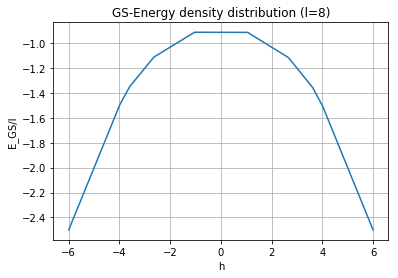

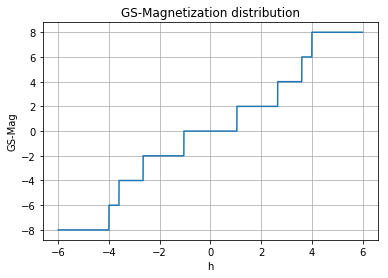

In [47]:
a = row[:,3] #h
b = row[:,2] #E_GS/l
c = row[:,1] #mag_GS

plt.plot(a,b,'-')
plt.title('GS-Energy density distribution (l=8)')
plt.xlabel('h')
plt.ylabel('E_GS/l')
plt.grid()
plt.savefig('GS-Energy_big.png')
plt.show()


plt.plot(a,c,'-')
plt.title('GS-Magnetization distribution')
plt.xlabel('h')
plt.ylabel('GS-Mag')
plt.grid()
plt.savefig('GS-Mag_big.png')
plt.show()